In [1]:
import random
import numpy as np
import keras
import pandas as pd
import types

Using TensorFlow backend.
C:\Users\ahmed\Anaconda3\envs\tf_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\ahmed\Anaconda3\envs\tf_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\ahmed\Anaconda3\envs\tf_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\ahmed\Anaconda3\envs\tf_gpu\lib\sit

In [2]:
from sklearn.datasets import load_iris , load_breast_cancer
from sklearn.model_selection import train_test_split
import keras
from keras.models import Sequential
from keras.layers import Dense


In [3]:
class ProgressBar:
    def __init__(self, steps, updates=10):
        self.step = 0
        self.step_size = (steps // updates)
        self.total_steps = steps
        self.updates = updates

        bar = self._make_bar(0)
        print(bar, end=' ')

    def update(self, i):
        if i % self.step_size > 0:
            return

        self.step = i // self.step_size
        bar = self._make_bar(i)

        print(bar, end=' ')

    def done(self):
        self.step = self.total_steps
        bar = self._make_bar(self.updates)
        print(bar)

    def _make_bar(self, x):
        bar = "["
        for x in range(self.updates):
            print("\r", end=' ')
            bar += "=" if x < self.step else " "
        bar += "]"
        return bar


In [4]:
class Particle:
    def __init__(self, model, params):
        self.model = model
        self.params = params
        self.init_weights = model.get_weights()
        self.velocities = [None] * len(self.init_weights)
        self.length = len(self.init_weights)
        for i, layer in enumerate(self.init_weights):
            self.velocities[i] = np.random.rand(*layer.shape) / 5 - 0.10
            # self.velocities[i] = np.zeros(layer.shape)

        self.best_weights = None
        self.best_score = BIG_SCORE
        #self.best_score_array=[]
        #self.local_score_array=[]
    def setParams(self, params):
        self.params= params

    def get_score(self, x, y, update=True):
        local_score = self.model.evaluate(x, y, verbose=0)
        print("Current local_score: ")
        print(local_score)
        #self.local_score_array.append(local_score)
        print("local Best_score: ")
        print(self.best_score)
        #self.best_score_array.append(self.best_score)
        #if(type(local_score) ==type(list())):
        #    if local_score[0] < self.best_score and update:
        #        self.best_score = local_score[0]
        #        self.best_weights = self.model.get_weights()
        #    return local_score[0]
        #else:
        if local_score < self.best_score and update:
            self.best_score = local_score
            self.best_weights = self.model.get_weights()
       
        return local_score

    def _update_velocities(self, global_best_weights, depth):
        new_velocities = [None] * len(self.init_weights)
        weights = self.model.get_weights()
        local_rand, global_rand = random.random(), random.random()

        for i, layer in enumerate(weights):
            if i >= depth:
                new_velocities[i] = self.velocities[i]
                continue
            new_v = self.params['acc'] * self.velocities[i]
            new_v = new_v + self.params['local_acc'] * local_rand * (self.best_weights[i] - layer)
            new_v = new_v + self.params['global_acc'] * global_rand * (global_best_weights[i] - layer)
            new_velocities[i] = new_v

        self.velocities = new_velocities

    def _update_weights(self, depth):
        old_weights = self.model.get_weights()
        new_weights = [None] * len(old_weights)
        for i, layer in enumerate(old_weights):
            if i>= depth:
                new_weights[i] = layer
                continue
            new_w = layer + self.velocities[i]
            new_weights[i] = new_w

        self.model.set_weights(new_weights)

    def step(self, x, y, global_best_weights,depth=None):
        if depth is None:
            depth = self.length
        self._update_velocities(global_best_weights, depth)
        self._update_weights(depth)
        return self.get_score(x, y)

    def get_best_weights(self):
        return self.best_weights

In [27]:


class Optimizer:
    def __init__(self, model, loss,
                 n=10,
                 acceleration=0.1,
                 local_rate=1.0,
                 global_rate=1.0):

        self.n_particles = n
        self.structure = model.to_json()
        self.particles = [None] * n
        self.loss = loss
        self.length = len(model.get_weights())
        self.acceleration= acceleration
        self.local_rate= local_rate
        self.global_rate= global_rate
        params = {'acc': acceleration, 'local_acc': local_rate, 'global_acc': global_rate}

        for i in range(n-1):
            m = keras.models.model_from_json(self.structure)
            m.compile(loss=loss,optimizer='adam')
            self.particles[i] = Particle(m, params)

        self.particles[n-1] = Particle(model, params)

        self.global_best_weights = None
        self.global_best_score = BIG_SCORE
        self.global_best_score_array=[]
        
        
    def fit(self, x, y, steps=0, batch_size=500):
        num_batches = x.shape[0] // batch_size

        for i, p in enumerate(self.particles):
            local_score = p.get_score(x, y)
            
            if local_score < self.global_best_score:
                self.global_best_score = local_score
                self.global_best_weights = p.get_best_weights()

        print("PSO -- Initial best score {:0.4f}".format(self.global_best_score))

        bar = ProgressBar(steps, updates=20)

        for i in range(steps):
             #updateparams
            self.acceleration= 0.9-(0.9-0.4)*(i/steps)
            params = {'acc':  self.acceleration, 'local_acc':self.local_rate, 'global_acc':self.global_rate}
           # if(i%50==0 and i!= 0 ):
            #    self.acceleration= self.acceleration*0.8 
            #    self.local_rate=self.local_rate*1.4
           #     self.global_rate = self.global_rate *0.6
           #    

            for j in range(num_batches):
                x_ = x[j*batch_size:(j+1)*batch_size,:]
                y_ = y[j*batch_size:(j+1)*batch_size]

                for p in self.particles:
                    
                    #if(i%50==0 and i!=0):
                    #    print("updating params at iteration: "+ str(i))
                    

                    local_score = p.step(x_, y_, self.global_best_weights)
                    #update_velocities
                    #update_weights
                   
                    p.setParams(params)
                    if local_score < self.global_best_score:
                        
                        self.global_best_score = local_score
                        self.global_best_score_array.append(self.global_best_score)
                        print("new global best score: " + str(self.global_best_score) ,end=" ")
                        print("iteration is: " +str(i))
                        self.global_best_weights = p.get_best_weights()
            
        
            #bar.update(i)

        #bar.done()

    def get_best_model(self):
        best_model = keras.models.model_from_json(self.structure)
        best_model.set_weights(self.global_best_weights)
        best_model.compile(loss=self.loss,optimizer='adam')
        return best_model

In [6]:
N = 80 # number of particles
STEPS = 10 # number of steps
LOSS = 'categorical_crossentropy' # Loss function
BATCH_SIZE = 1000 # Size of batches to train on
BIG_SCORE = 1.e6 
batch_size_lstm= 500
epochs_lstm=10

In [7]:


from keras.models import Sequential
from keras.layers import Dense, Dropout, Embedding,LSTM,Flatten,GRU
from keras import optimizers
from keras.callbacks import EarlyStopping


In [8]:
def gru_baseline_model(r,c):
  
    lstm_out = 250
    model = Sequential()
    model.add(GRU(lstm_out,return_sequences=True, dropout=0.2, input_shape=(1, c)))
    model.add(GRU(lstm_out,return_sequences=True, dropout=0.2))
    
    model.add(GRU(200,return_sequences=True, dropout=0.1))
   
    model.add(Flatten())
    
    model.add(Dense(9, init='normal', activation="softmax"))
    
    model.compile(loss = 'categorical_crossentropy', optimizer='adam')
    return model 

In [9]:
alldata_x = pd.read_csv("X_train_Res.csv",header=None)
alldata_y= pd.read_csv("encoded_y.csv", header=None)

In [10]:
alldata_x.shape

(8613, 250)

In [11]:
test_set = pd.read_csv("test_set.csv",header=None)
test_arr= np.array(test_set)

In [12]:
arr_x= np.array(alldata_x)
arr_y= np.array(alldata_y)

In [13]:
arr_x.shape

(8613, 250)

In [14]:
arr_y.argmax(1)

array([0, 1, 1, ..., 8, 8, 8], dtype=int64)

In [14]:
from sklearn.model_selection import train_test_split

In [16]:
X_train, X_test, y_train, y_test = train_test_split(arr_x,arr_y, test_size=0.33, random_state=42)

In [15]:
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [16]:
folds= StratifiedKFold(n_splits=3,shuffle=True, random_state=999)


In [ ]:
#X_train_reshaped= np.reshape(X_train, (X_train.shape[0],1,X_train.shape[1]))

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


In [ ]:
X_train.shape[0]

In [ ]:
X_train_reshaped= np.reshape(X_train, (X_train.shape[0],1,X_train.shape[1]))
X_test_reshaped= np.reshape(X_test, (X_test.shape[0],1,X_test.shape[1]))

In [53]:
test_reshaped= np.reshape(test_arr, (test_arr.shape[0],1, test_arr.shape[1]))

In [ ]:
model_p = gru_baseline_model(X_train.shape[0], X_train.shape[1])


In [ ]:
model_p.summary()

In [ ]:
pso_lstm = Optimizer(model=model_p,
                    loss=LOSS,
                    n=N,  # Number of particles
                    acceleration=0.9,  # Contribution of recursive particle velocity (acceleration)
                    local_rate=1.49445,    # Contribution of locally best weights to new velocity
                    global_rate=1.49445)   # Contribution of globally best weights to new

In [ ]:
pso_lstm.fit(X_train_reshaped,y_train, steps=STEPS, batch_size=batch_size_lstm)

In [ ]:
best_model= pso_lstm.get_best_model()

In [ ]:
best_model_structure= best_model.to_json()

In [ ]:
best_model_structure= best_model.to_json()
model_weights= best_model.get_weights()

In [ ]:
np.shape(model_weights)

In [ ]:
model_json = best_model.to_json()
with open("best_model_5_5.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
best_model.save_weights("best_model_weights_5_5.h5")
print("Saved model to disk")
 

In [ ]:
best_model.evaluate(X_test_reshaped,y_test)

In [ ]:
test_reshaped.shape

In [ ]:
y_predict = best_model.predict_proba(test_reshaped)

In [ ]:
y_predict.shape

In [ ]:
indexes=[i for i in range(1,987)]

In [ ]:
best_model.fit(X_train_reshaped, y_train, epochs=epochs_lstm, batch_size=batch_size_lstm)


In [ ]:
y_predict = best_model.predict_proba(test_reshaped)

In [ ]:
y_predict = best_model.predict_proba(test_reshaped)
def savesubmission(pred, indexes, filename = "submission_all.csv"):
    submission = pd.DataFrame(pred)
    submission.insert(0, 'ID',indexes)
    submission.columns = ['ID','class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7', 'class8', 'class9']
    submission.to_csv(filename,index=False)
    submission.head()

In [ ]:
savesubmission(y_predict, indexes, filename = "to_submit_PSO_Hybrid_5_5.csv")

In [ ]:
pso_lstm2 = Optimizer(model=model_p,
                    loss=LOSS,
                    n=N,  # Number of particles
                    acceleration=1.01,  # Contribution of recursive particle velocity (acceleration)
                    local_rate=2,    # Contribution of locally best weights to new velocity
                    global_rate=2)   # Contribution of globally best weights to new

In [ ]:
pso_lstm2.fit(X_train_reshaped,y_train, steps=STEPS, batch_size=batch_size_lstm)

In [ ]:
best_model2= pso_lstm2.get_best_model()

In [ ]:
best_model2.evaluate(X_test_reshaped,y_test)

In [ ]:
best_model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
best_model2.evaluate(X_train_reshaped,y_train)

In [ ]:
best_model2.evaluate(X_test_reshaped,y_test)

In [ ]:
weights=best_model2.layers[0].get_weights()

In [ ]:
weights[0].shape

In [ ]:
weights[1].shape

In [ ]:
weights[2].shape

def gru_baseline_model(r,c):
  
    lstm_out = 250
    model = Sequential()
    model.add(GRU(lstm_out,return_sequences=True, dropout=0.2, input_shape=(1, c)))
    model.add(GRU(lstm_out/2,return_sequences=True, dropout=0.2))
    
    model.add(GRU(200,return_sequences=True, dropout=0.1))
   
    model.add(Flatten())
    
    model.add(Dense(9, init='normal', activation="softmax"))
    
    model.compile(loss = 'categorical_crossentropy', optimizer='adam')
    return model 

In [ ]:
pso_lstm3 = Optimizer(model=model_p,
                    loss=LOSS,
                    n=N,  # Number of particles
                    acceleration=0.7929,  # Contribution of recursive particle velocity (acceleration)
                    local_rate=1.49445,    # Contribution of locally best weights to new velocity
                    global_rate=1.49445)   # Contribution of globally best weights to new

In [ ]:

pso_lstm3.fit(X_train_reshaped,y_train, steps=STEPS, batch_size=batch_size_lstm)

In [ ]:
best_model4=pso_lstm3.get_best_model()

In [ ]:
best_model4.evaluate(X_train_reshaped,y_train)

In [ ]:
best_model4.evaluate(X_test_reshaped,y_test)

In [ ]:
simplemodel= gru_baseline_model(X_train.shape[0], X_train.shape[1])

In [ ]:
simplemodel.fit(X_train_reshaped, y_train, epochs=epochs_lstm, batch_size=batch_size_lstm)

In [ ]:
simplemodel.evaluate(X_test_reshaped, y_test)

In [ ]:
y_predict = simplemodel.predict_proba(test_reshaped)

In [ ]:
savesubmission(y_predict, indexes, filename = "to_submit_GRU_5_5.csv")

N = 2 # number of particles
STEPS = 20 # number of steps
LOSS = 'categorical_crossentropy' # Loss function
BATCH_SIZE = 500 # Size of batches to train on
BIG_SCORE = 1.e6 

In [ ]:

pso_lstm3 = Optimizer(model=model_p,
                    loss=LOSS,
                    n=N,  # Number of particles
                    acceleration=0.7929,  # Contribution of recursive particle velocity (acceleration)
                    local_rate=1.49445,    # Contribution of locally best weights to new velocity
                    global_rate=1.49445)   # Contribution of globally best weights to new

In [ ]:
arr_y.shape

In [ ]:
#model_p = gru_baseline_model(arr_x.shape[0], X_train.shape[1])

In [ ]:
model_p.summary()

In [17]:
arr_y= arr_y.argmax(1)

In [18]:
arr_y

array([0, 1, 1, ..., 8, 8, 8], dtype=int64)

In [19]:
x_train_shapes=[]
x_test_shapes=[]

In [20]:
for train_index, test_index in folds.split(arr_x, arr_y):
    X_train, X_test, Y_train, Y_test = arr_x[train_index], arr_x[test_index], arr_y[train_index], arr_y[test_index]
    X_train_reshaped= np.reshape(X_train, (X_train.shape[0],1,X_train.shape[1]))
    X_test_reshaped= np.reshape(X_test, (X_test.shape[0],1,X_test.shape[1]))
    x_train_shapes.append(X_train_reshaped.shape)
    x_test_shapes.append(X_test_reshaped.shape)
    print("x-train: "+ str(X_train_reshaped.shape))

x-train: (5742, 1, 250)
x-train: (5742, 1, 250)
x-train: (5742, 1, 250)


In [21]:
x_train_shapes[0][0]

5742

In [22]:
model_p = gru_baseline_model(x_train_shapes[0][0], x_train_shapes[0][2])





Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.




C:\Users\ahmed\Anaconda3\envs\tf_gpu\lib\site-packages\ipykernel_launcher.py:12: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(9, activation="softmax", kernel_initializer="normal")`
  if sys.path[0] == '':


In [23]:
model_p.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
gru_1 (GRU)                  (None, 1, 250)            375750    
_________________________________________________________________
gru_2 (GRU)                  (None, 1, 250)            375750    
_________________________________________________________________
gru_3 (GRU)                  (None, 1, 200)            270600    
_________________________________________________________________
flatten_1 (Flatten)          (None, 200)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 9)                 1809      
Total params: 1,023,909
Trainable params: 1,023,909
Non-trainable params: 0
_________________________________________________________________


In [24]:
y_train_categorical = keras.utils.to_categorical(arr_y,9)

In [26]:
y_train_categorical

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

In [25]:
pso_lstm = Optimizer(model=model_p,
                    loss=LOSS,
                    n=N,  # Number of particles
                    acceleration=0.9,  # Contribution of recursive particle velocity (acceleration)
                    local_rate=1.49445,    # Contribution of locally best weights to new velocity
                    global_rate=1.49445)   # Contribution of globally best weights to new

In [26]:
best_loss = 100
acc = []
val_acc = []
        
loss = []
val_loss = []
best_val_loss=[]
count=1
for train_index, test_index in folds.split(arr_x, arr_y):
    X_train, X_test, Y_train, Y_test = arr_x[train_index], arr_x[test_index], arr_y[train_index], arr_y[test_index]
    X_train_reshaped= np.reshape(X_train, (X_train.shape[0],1,X_train.shape[1]))
    X_test_reshaped= np.reshape(X_test, (X_test.shape[0],1,X_test.shape[1]))        
    y_train_categorical = keras.utils.to_categorical(Y_train, 9)
    y_test_categorical= keras.utils.to_categorical(Y_test, 9)
    for i in range(5):
        pso_lstm.fit(X_train_reshaped,y_train_categorical, steps=STEPS, batch_size=batch_size_lstm)    
        train_result= pso_lstm.global_best_score  #best train score
        loss.append(train_result)
        best_train_model= pso_lstm.get_best_model()
        result=best_train_model.evaluate(X_test_reshaped, y_test_categorical)
        val_loss.append(result)
        if(result<best_loss):
            best_val_loss.append(result)
            best_train_model.save_weights("pso_weights.h5")
            
            
        print("fold:" , count)
        count=count+1


Current local_score: 
2.2021311011226365
local Best_score: 
1000000.0
Current local_score: 
2.1981197045431533
local Best_score: 
1000000.0
Current local_score: 
2.197954628285694
local Best_score: 
1000000.0
Current local_score: 
2.1988405453041846
local Best_score: 
1000000.0
Current local_score: 
2.1979756294663715
local Best_score: 
1000000.0
Current local_score: 
2.2006706583587103
local Best_score: 
1000000.0
Current local_score: 
2.1981464207110113
local Best_score: 
1000000.0
Current local_score: 
2.2003770119551787
local Best_score: 
1000000.0
Current local_score: 
2.1978724114947186
local Best_score: 
1000000.0
Current local_score: 
2.1991598949910705
local Best_score: 
1000000.0
Current local_score: 
2.1948013284903127
local Best_score: 
1000000.0
Current local_score: 
2.1972032261824865
local Best_score: 
1000000.0
Current local_score: 
2.2012511723882766
local Best_score: 
1000000.0
Current local_score: 
2.201058503436278
local Best_score: 
1000000.0
Current local_score: 


Current local_score: 
2.1580563831329345
local Best_score: 
2.2009237683720393
Current local_score: 
2.1614295864105224
local Best_score: 
2.199559576625153
Current local_score: 
2.152840700149536
local Best_score: 
2.195254859090557
Current local_score: 
2.2157064380645752
local Best_score: 
2.1978821658124827
Current local_score: 
2.175963855743408
local Best_score: 
2.1964217122528704
Current local_score: 
2.1582125053405763
local Best_score: 
2.197519601740849
Current local_score: 
2.236999584197998
local Best_score: 
2.200004137587938
Current local_score: 
2.1673899116516115
local Best_score: 
2.199828959225529
Current local_score: 
2.1699944591522216
local Best_score: 
2.194197963812923
Current local_score: 
2.1823276157379152
local Best_score: 
2.1941500130284335
Current local_score: 
2.2167374687194825
local Best_score: 
2.195494485457821
Current local_score: 
2.1840448837280273
local Best_score: 
2.1965533017032612
Current local_score: 
2.201886226654053
local Best_score: 
2.1

Current local_score: 
2.918695903778076
local Best_score: 
2.1960476356613974
Current local_score: 
2.4243608798980714
local Best_score: 
2.190519208908081
Current local_score: 
3.018091968536377
local Best_score: 
2.197852609631742
Current local_score: 
2.6097491035461426
local Best_score: 
2.147420606613159
Current local_score: 
2.4588977546691893
local Best_score: 
2.194580774861983
Current local_score: 
2.2167348022460938
local Best_score: 
2.197779334077267
Current local_score: 
2.222791181564331
local Best_score: 
2.1538707313537597
Current local_score: 
2.7883498554229735
local Best_score: 
2.1689101066589354
Current local_score: 
2.5738835124969484
local Best_score: 
2.1039037322998047
Current local_score: 
2.235807586669922
local Best_score: 
2.1987618567926135
Current local_score: 
2.3841091346740724
local Best_score: 
2.2006343746384607
Current local_score: 
2.1338715801239014
local Best_score: 
2.1905261459350585
Current local_score: 
2.3228542823791503
local Best_score: 
2

Current local_score: 
2.2311781005859377
local Best_score: 
2.019676769256592
Current local_score: 
2.311533472061157
local Best_score: 
2.108929552078247
Current local_score: 
2.6449621715545653
local Best_score: 
2.1794767360687257
Current local_score: 
2.1379055576324464
local Best_score: 
2.2021311011226365
Current local_score: 
2.2300524425506594
local Best_score: 
2.189480354309082
Current local_score: 
2.502933168411255
local Best_score: 
2.197954628285694
Current local_score: 
2.129437183380127
local Best_score: 
2.1865853691101074
Current local_score: 
2.1707320671081543
local Best_score: 
2.1476747131347658
Current local_score: 
2.3266571083068848
local Best_score: 
2.1639707889556883
Current local_score: 
2.208014904022217
local Best_score: 
2.1981464207110113
Current local_score: 
2.540015520095825
local Best_score: 
2.1698046131134032
Current local_score: 
2.190601947784424
local Best_score: 
2.1635337467193603
Current local_score: 
4.016166374206543
local Best_score: 
2.1

Current local_score: 
2.5655678386688234
local Best_score: 
2.1731718425750732
Current local_score: 
2.6521552734375
local Best_score: 
2.190645248413086
Current local_score: 
2.4919176406860353
local Best_score: 
2.196681768625964
Current local_score: 
2.341731842041016
local Best_score: 
2.1944186687469482
Current local_score: 
2.329744432449341
local Best_score: 
2.141080669403076
Current local_score: 
2.1524453182220458
local Best_score: 
2.1888068294525147
Current local_score: 
2.2163218574523924
local Best_score: 
2.1441128730773924
Current local_score: 
2.131251916885376
local Best_score: 
2.1511030654907226
Current local_score: 
2.8446376914978027
local Best_score: 
2.1580563831329345
Current local_score: 
2.2845091972351073
local Best_score: 
2.1614295864105224
Current local_score: 
2.1466214599609375
local Best_score: 
2.152840700149536
Current local_score: 
2.224011266708374
local Best_score: 
2.1950965366363526
Current local_score: 
2.1868231906890867
local Best_score: 
2.1

Current local_score: 
2.476558868408203
local Best_score: 
2.1574307975769043
Current local_score: 
2.3886787128448486
local Best_score: 
2.193176129021241
Current local_score: 
2.1982462959289553
local Best_score: 
2.1496824607849123
Current local_score: 
2.430655860900879
local Best_score: 
2.194318526051095
Current local_score: 
2.6682540912628174
local Best_score: 
2.1127979011535643
Current local_score: 
2.1129670429229734
local Best_score: 
2.188605894088745
Current local_score: 
2.704598752975464
local Best_score: 
2.1334677181243897
Current local_score: 
2.7309318771362303
local Best_score: 
2.1589391078948976
Current local_score: 
2.135028839111328
local Best_score: 
2.147420606613159
Current local_score: 
2.1928357830047607
local Best_score: 
2.155726976394653
Current local_score: 
2.500881639480591
local Best_score: 
2.1638519649505614
Current local_score: 
2.1590443286895753
local Best_score: 
2.1538707313537597
Current local_score: 
3.655248996734619
local Best_score: 
2.1

Current local_score: 
3.417421516418457
local Best_score: 
2.1585874671936036
Current local_score: 
3.525443048477173
local Best_score: 
2.1703203163146974
Current local_score: 
2.3426647815704347
local Best_score: 
2.15209224319458
Current local_score: 
1.7497003946304321
local Best_score: 
2.142798656463623
Current local_score: 
3.897745662689209
local Best_score: 
2.1439485416412354
Current local_score: 
3.792373722076416
local Best_score: 
2.13364192199707
Current local_score: 
1.9825827121734618
local Best_score: 
2.1145536022186278
Current local_score: 
3.52792635345459
local Best_score: 
2.075654634475708
Current local_score: 
2.4637774295806887
local Best_score: 
2.019676769256592
Current local_score: 
1.8052723627090455
local Best_score: 
2.108929552078247
Current local_score: 
2.13665061378479
local Best_score: 
2.1794767360687257
Current local_score: 
2.2794105777740477
local Best_score: 
2.1379055576324464
Current local_score: 
3.4734626083374023
local Best_score: 
2.189480

Current local_score: 
2.541196262359619
local Best_score: 
2.176688938140869
Current local_score: 
3.1340627880096434
local Best_score: 
2.175180154800415
Current local_score: 
2.455014083862305
local Best_score: 
2.179758144378662
Current local_score: 
3.8069875164031983
local Best_score: 
2.045558841705322
Current local_score: 
2.168022644042969
local Best_score: 
2.157345069885254
Current local_score: 
2.7433248748779295
local Best_score: 
2.0723916816711427
Current local_score: 
4.2016628608703614
local Best_score: 
1.8310515880584717
Current local_score: 
2.283452169418335
local Best_score: 
2.1731718425750732
Current local_score: 
5.969853404998779
local Best_score: 
2.06948353767395
Current local_score: 
4.030797557830811
local Best_score: 
2.1485097999572753
Current local_score: 
9.747330451965333
local Best_score: 
2.169433668136597
Current local_score: 
3.5870414428710937
local Best_score: 
1.702345796585083
Current local_score: 
3.612390043258667
local Best_score: 
1.8250359

Current local_score: 
2.493868335723877
local Best_score: 
1.8273107891082763
Current local_score: 
2.7530295028686522
local Best_score: 
2.135524054527283
Current local_score: 
2.223668041229248
local Best_score: 
1.8474133567810058
Current local_score: 
2.139544340133667
local Best_score: 
2.0890830116271975
Current local_score: 
2.126043022155762
local Best_score: 
1.75583242893219
Current local_score: 
5.937691127777099
local Best_score: 
2.1727775783538816
Current local_score: 
2.325896162033081
local Best_score: 
2.1285801906585693
Current local_score: 
2.2580151710510252
local Best_score: 
1.8313005514144898
Current local_score: 
2.3759656524658204
local Best_score: 
2.1501915702819825
Current local_score: 
2.4911303901672364
local Best_score: 
2.1496824607849123
Current local_score: 
6.680611171722412
local Best_score: 
2.194318526051095
Current local_score: 
2.5711159172058107
local Best_score: 
2.1127979011535643
Current local_score: 
2.789578685760498
local Best_score: 
2.11

Current local_score: 
2.0118843393325805
local Best_score: 
2.181431793212891
Current local_score: 
1.9083192462921144
local Best_score: 
2.0324865894317625
Current local_score: 
1.9703095073699952
local Best_score: 
2.1550962085723877
Current local_score: 
2.662875972747803
local Best_score: 
1.6433531951904297
Current local_score: 
5.0262441787719725
local Best_score: 
2.1585874671936036
Current local_score: 
2.5495702667236326
local Best_score: 
2.1703203163146974
Current local_score: 
2.146339054107666
local Best_score: 
2.1363949127197266
Current local_score: 
1.9966003046035767
local Best_score: 
1.7497003946304321
Current local_score: 
2.1942112522125243
local Best_score: 
2.1439485416412354
Current local_score: 
2.473624604225159
local Best_score: 
1.9531221227645874
Current local_score: 
2.4256646461486815
local Best_score: 
1.9825827121734618
Current local_score: 
2.4604020309448242
local Best_score: 
2.075654634475708
Current local_score: 
2.728076992034912
local Best_score:

Current local_score: 
3.0847266693115234
local Best_score: 
1.725431957244873
Current local_score: 
3.003958921432495
local Best_score: 
2.0999481067657473
Current local_score: 
2.193699634552002
local Best_score: 
2.141973499298096
Current local_score: 
3.178233201980591
local Best_score: 
2.1915868663787843
Current local_score: 
3.1455463695526125
local Best_score: 
2.176688938140869
Current local_score: 
3.912477642059326
local Best_score: 
2.069829776763916
Current local_score: 
2.584591106414795
local Best_score: 
1.813432855606079
Current local_score: 
3.0568363513946535
local Best_score: 
2.045558841705322
Current local_score: 
2.6606978397369385
local Best_score: 
1.9774900665283204
Current local_score: 
3.2904660625457764
local Best_score: 
2.0723916816711427
Current local_score: 
4.136964668273926
local Best_score: 
1.8310515880584717
Current local_score: 
5.704972465515136
local Best_score: 
2.1731718425750732
Current local_score: 
2.317331226348877
local Best_score: 
2.0694

Current local_score: 
2.9486118850708007
local Best_score: 
2.1673899116516115
Current local_score: 
3.776582368850708
local Best_score: 
2.1258022499084475
Current local_score: 
5.008012453079224
local Best_score: 
2.0605275592803953
Current local_score: 
2.313719612121582
local Best_score: 
1.8273107891082763
Current local_score: 
2.2353313121795653
local Best_score: 
2.125199953079224
Current local_score: 
2.793752986907959
local Best_score: 
1.8474133567810058
Current local_score: 
2.568351287841797
local Best_score: 
2.0890830116271975
Current local_score: 
2.3468736934661867
local Best_score: 
1.75583242893219
Current local_score: 
5.551116184234619
local Best_score: 
2.1727775783538816
Current local_score: 
3.5926673450469973
local Best_score: 
2.1285801906585693
Current local_score: 
2.5814431400299074
local Best_score: 
1.8313005514144898
Current local_score: 
2.231891399383545
local Best_score: 
2.1501915702819825
Current local_score: 
2.2163868236541746
local Best_score: 
2.

Current local_score: 
5.9832918891906735
local Best_score: 
2.1338715801239014
Current local_score: 
3.0128556213378905
local Best_score: 
1.9252880554199219
Current local_score: 
2.344201889038086
local Best_score: 
2.0118843393325805
Current local_score: 
2.2264380645751953
local Best_score: 
1.9083192462921144
Current local_score: 
5.345979976654053
local Best_score: 
1.9703095073699952
Current local_score: 
2.4552227191925047
local Best_score: 
1.6433531951904297
Current local_score: 
8.861325180053711
local Best_score: 
2.1585874671936036
Current local_score: 
6.58922371673584
local Best_score: 
2.1703203163146974
Current local_score: 
2.2070175323486327
local Best_score: 
2.1363949127197266
Current local_score: 
2.38289270401001
local Best_score: 
1.7497003946304321
Current local_score: 
3.0284155883789063
local Best_score: 
2.1439485416412354
Current local_score: 
2.3352252616882323
local Best_score: 
1.9531221227645874
Current local_score: 
2.335967212677002
local Best_score: 


Current local_score: 
2.3329785957336426
local Best_score: 
2.130860248565674
Current local_score: 
2.6540653991699217
local Best_score: 
1.9352271976470947
Current local_score: 
2.295858060836792
local Best_score: 
2.047427053451538
Current local_score: 
2.1334152307510377
local Best_score: 
1.725431957244873
Current local_score: 
2.2934406566619874
local Best_score: 
2.0999481067657473
Current local_score: 
2.7302324447631836
local Best_score: 
2.141973499298096
Current local_score: 
2.2897328357696534
local Best_score: 
2.1915868663787843
Current local_score: 
2.952685493469238
local Best_score: 
2.176688938140869
Current local_score: 
2.305946418762207
local Best_score: 
2.069829776763916
Current local_score: 
4.439977684020996
local Best_score: 
1.813432855606079
Current local_score: 
2.6043040866851808
local Best_score: 
2.045558841705322
Current local_score: 
2.2279706735610962
local Best_score: 
1.9774900665283204
Current local_score: 
2.8151357135772703
local Best_score: 
2.07

Current local_score: 
1.593796880722046
local Best_score: 
2.131585823059082
new global best score: 1.593796880722046 iteration is: 1
Current local_score: 
2.7277311763763428
local Best_score: 
1.919488655090332
Current local_score: 
2.1521653251647948
local Best_score: 
1.8760864019393921
Current local_score: 
2.2751432971954344
local Best_score: 
2.1407203998565674
Current local_score: 
2.5026382122039794
local Best_score: 
2.1673899116516115
Current local_score: 
2.0300750904083253
local Best_score: 
2.1258022499084475
Current local_score: 
9.418502700805664
local Best_score: 
2.0605275592803953
Current local_score: 
1.7916503028869628
local Best_score: 
1.8273107891082763
Current local_score: 
2.098383047103882
local Best_score: 
2.1168566398620605
Current local_score: 
2.4545110988616945
local Best_score: 
1.8474133567810058
Current local_score: 
1.6149970998764038
local Best_score: 
2.0031870965957643
Current local_score: 
1.62034818649292
local Best_score: 
1.75583242893219
Curr

Current local_score: 
2.608165271759033
local Best_score: 
1.850114839553833
Current local_score: 
2.256226125717163
local Best_score: 
2.147413422584534
Current local_score: 
3.2721147689819334
local Best_score: 
1.6288777379989623
Current local_score: 
2.1690877017974852
local Best_score: 
1.9972110538482666
Current local_score: 
2.2318663444519045
local Best_score: 
1.7244838552474975
Current local_score: 
2.2496194038391115
local Best_score: 
1.8205364475250243
Current local_score: 
7.841615043640137
local Best_score: 
2.1338715801239014
Current local_score: 
2.1739892444610596
local Best_score: 
1.9252880554199219
Current local_score: 
2.453179794311523
local Best_score: 
1.8757945795059203
Current local_score: 
6.29612692642212
local Best_score: 
1.9083192462921144
Current local_score: 
5.833250259399414
local Best_score: 
1.9703095073699952
Current local_score: 
3.772150545120239
local Best_score: 
1.6433531951904297
Current local_score: 
4.917435489654541
local Best_score: 
2.1

Current local_score: 
2.7039524574279783
local Best_score: 
1.9679932746887208
Current local_score: 
2.4935799980163575
local Best_score: 
1.6447800312042236
Current local_score: 
2.206150691986084
local Best_score: 
2.0380958003997804
Current local_score: 
2.194869302749634
local Best_score: 
2.1639707889556883
Current local_score: 
3.471915266036987
local Best_score: 
2.139101839065552
Current local_score: 
2.128930606842041
local Best_score: 
1.9542549991607665
Current local_score: 
2.1816271324157714
local Best_score: 
1.9166274452209473
Current local_score: 
2.1017157459259033
local Best_score: 
1.9352271976470947
Current local_score: 
2.107527059555054
local Best_score: 
2.047427053451538
Current local_score: 
1.9328391704559327
local Best_score: 
1.725431957244873
Current local_score: 
2.997208246231079
local Best_score: 
2.0999481067657473
Current local_score: 
2.071715356826782
local Best_score: 
1.6807876071929932
Current local_score: 
8.844760704040528
local Best_score: 
2.1

Current local_score: 
5.884069881439209
local Best_score: 
1.82503590965271
Current local_score: 
2.186107131958008
local Best_score: 
1.7861328468322755
Current local_score: 
5.681862533569336
local Best_score: 
2.0100413551330565
Current local_score: 
1.938725793838501
local Best_score: 
2.0902883338928224
Current local_score: 
2.8333870124816896
local Best_score: 
1.6064738788604735
Current local_score: 
3.9067965812683108
local Best_score: 
1.6906454000473023
Current local_score: 
2.1027755279541016
local Best_score: 
1.593796880722046
Current local_score: 
2.3348090705871583
local Best_score: 
1.8779970989227295
Current local_score: 
2.0733344593048098
local Best_score: 
1.8760864019393921
Current local_score: 
2.2401058807373047
local Best_score: 
2.1088629322052004
Current local_score: 
5.021266384124756
local Best_score: 
2.1673899116516115
Current local_score: 
2.0615723304748537
local Best_score: 
2.0300750904083253
Current local_score: 
9.15292928314209
local Best_score: 
2.

Current local_score: 
3.189468629837036
local Best_score: 
1.8779492359161376
Current local_score: 
2.6228882637023925
local Best_score: 
1.5981784505844117
Current local_score: 
2.471190813064575
local Best_score: 
1.6575244607925415
Current local_score: 
5.7547948379516605
local Best_score: 
1.8492471752166748
Current local_score: 
2.202649028778076
local Best_score: 
1.965788568496704
Current local_score: 
2.463704830169678
local Best_score: 
1.850114839553833
Current local_score: 
2.85939609336853
local Best_score: 
1.985528911590576
Current local_score: 
3.5809856147766115
local Best_score: 
1.6288777379989623
Current local_score: 
2.6994131889343262
local Best_score: 
1.9972110538482666
Current local_score: 
2.0795935802459717
local Best_score: 
1.7244838552474975
Current local_score: 
2.2723831043243408
local Best_score: 
1.8205364475250243
Current local_score: 
13.140022872924805
local Best_score: 
2.1338715801239014
Current local_score: 
2.244261936187744
local Best_score: 
1.

Current local_score: 
2.260040117263794
local Best_score: 
1.8080590114593507
Current local_score: 
2.5427263507843016
local Best_score: 
1.7933036642074585
Current local_score: 
3.1737239303588867
local Best_score: 
2.057144983291626
Current local_score: 
2.346838130950928
local Best_score: 
2.0584671001434325
Current local_score: 
2.444425168991089
local Best_score: 
1.6167059574127198
Current local_score: 
3.1540934257507325
local Best_score: 
1.9679932746887208
Current local_score: 
2.5068793964385985
local Best_score: 
1.6447800312042236
Current local_score: 
2.61653427028656
local Best_score: 
2.0380958003997804
Current local_score: 
3.165937773704529
local Best_score: 
2.1639707889556883
Current local_score: 
4.312488862991333
local Best_score: 
2.139101839065552
Current local_score: 
2.680376714706421
local Best_score: 
1.9542549991607665
Current local_score: 
2.233677939414978
local Best_score: 
1.9166274452209473
Current local_score: 
2.2389431819915773
local Best_score: 
1.9

Current local_score: 
2.2521254329681395
local Best_score: 
2.079694692611694
Current local_score: 
2.6688893756866454
local Best_score: 
2.06948353767395
Current local_score: 
2.879941820144653
local Best_score: 
2.111081099510193
Current local_score: 
5.04822695350647
local Best_score: 
2.169433668136597
Current local_score: 
2.385293670654297
local Best_score: 
1.702345796585083
Current local_score: 
7.423320220947265
local Best_score: 
1.82503590965271
Current local_score: 
2.567682107925415
local Best_score: 
1.7861328468322755
Current local_score: 
11.542567085266112
local Best_score: 
2.0100413551330565
Current local_score: 
2.5309461708068848
local Best_score: 
1.938725793838501
Current local_score: 
3.2144472999572753
local Best_score: 
1.6064738788604735
Current local_score: 
2.5808387565612794
local Best_score: 
1.6906454000473023
Current local_score: 
2.460189344406128
local Best_score: 
1.593796880722046
Current local_score: 
2.580648899078369
local Best_score: 
1.87799709

Current local_score: 
2.3661391162872314
local Best_score: 
2.1501915702819825
Current local_score: 
2.85605283164978
local Best_score: 
1.9571790542602538
Current local_score: 
14.168598342895509
local Best_score: 
2.194318526051095
Current local_score: 
2.486721040725708
local Best_score: 
1.9058828258514404
Current local_score: 
3.0018255805969236
local Best_score: 
1.8779492359161376
Current local_score: 
2.8163526248931885
local Best_score: 
1.5981784505844117
Current local_score: 
2.4895814933776856
local Best_score: 
1.6575244607925415
Current local_score: 
3.763696033477783
local Best_score: 
1.8492471752166748
Current local_score: 
2.483816474914551
local Best_score: 
1.965788568496704
Current local_score: 
2.5683435802459718
local Best_score: 
1.850114839553833
Current local_score: 
5.125664981842041
local Best_score: 
1.985528911590576
Current local_score: 
2.7170945568084717
local Best_score: 
1.6288777379989623
Current local_score: 
3.558664451599121
local Best_score: 
1.9

Current local_score: 
2.108682981491089
local Best_score: 
1.8637710485458374
Current local_score: 
2.09493231678009
local Best_score: 
1.882233696937561
Current local_score: 
2.1576940336227417
local Best_score: 
1.9825827121734618
Current local_score: 
2.041145000457764
local Best_score: 
2.075654634475708
Current local_score: 
3.1161119079589845
local Best_score: 
1.8080590114593507
Current local_score: 
2.199951738357544
local Best_score: 
1.7933036642074585
Current local_score: 
3.089804807662964
local Best_score: 
2.057144983291626
Current local_score: 
2.0232253456115723
local Best_score: 
2.0584671001434325
Current local_score: 
2.8133231134414673
local Best_score: 
1.6167059574127198
Current local_score: 
2.536981742858887
local Best_score: 
1.9679932746887208
Current local_score: 
1.7548092575073242
local Best_score: 
1.6447800312042236
Current local_score: 
2.9662761001586913
local Best_score: 
2.0380958003997804
Current local_score: 
2.0808398723602295
local Best_score: 
2.

Current local_score: 
3.7159772148132326
local Best_score: 
2.088573993682861
Current local_score: 
6.521212131500244
local Best_score: 
2.069829776763916
Current local_score: 
5.630180732727051
local Best_score: 
1.813432855606079
Current local_score: 
4.293553356170654
local Best_score: 
1.4282642526626588
Current local_score: 
5.699461864471435
local Best_score: 
1.8356480464935303
Current local_score: 
3.831882677078247
local Best_score: 
1.5979071292877198
Current local_score: 
2.5290300312042238
local Best_score: 
1.557391074180603
Current local_score: 
2.207261697769165
local Best_score: 
2.079694692611694
Current local_score: 
2.9264390754699705
local Best_score: 
2.06948353767395
Current local_score: 
2.5996805362701414
local Best_score: 
1.6540243644714356
Current local_score: 
2.5136707496643065
local Best_score: 
2.169433668136597
Current local_score: 
2.8270005798339843
local Best_score: 
1.702345796585083
Current local_score: 
2.534201686859131
local Best_score: 
1.825035

Current local_score: 
2.7468755836486816
local Best_score: 
1.5024785041809081
Current local_score: 
2.8304724922180178
local Best_score: 
1.6890991077423096
Current local_score: 
3.211113109588623
local Best_score: 
1.8189698734283448
Current local_score: 
2.7950715980529783
local Best_score: 
1.5411008319854735
Current local_score: 
2.5187362480163573
local Best_score: 
1.5807975349426269
Current local_score: 
2.7267923851013185
local Best_score: 
1.5074886684417725
Current local_score: 
3.315718158721924
local Best_score: 
1.5445722637176513
Current local_score: 
5.264317481994629
local Best_score: 
1.8313005514144898
Current local_score: 
2.4363651275634766
local Best_score: 
2.02198893737793
Current local_score: 
3.43946453666687
local Best_score: 
1.6336853275299072
Current local_score: 
13.061122985839845
local Best_score: 
2.1734052515029907
Current local_score: 
2.976435218811035
local Best_score: 
1.682112732887268
Current local_score: 
3.054952684402466
local Best_score: 
1.

Current local_score: 
2.0264153366088866
local Best_score: 
1.8371816244125365
Current local_score: 
2.0841132717132567
local Best_score: 
1.8620571517944335
Current local_score: 
3.252903316497803
local Best_score: 
1.4596378364562987
Current local_score: 
2.642041193008423
local Best_score: 
1.6202365646362304
Current local_score: 
5.0363363265991214
local Best_score: 
2.1585874671936036
Current local_score: 
2.2075767803192137
local Best_score: 
2.1703203163146974
Current local_score: 
2.3456463966369627
local Best_score: 
1.9951309337615968
Current local_score: 
2.6986509342193603
local Best_score: 
1.7073401412963867
Current local_score: 
2.3591676082611084
local Best_score: 
1.8637710485458374
Current local_score: 
2.07515771484375
local Best_score: 
1.48242116355896
Current local_score: 
2.0848196296691897
local Best_score: 
1.4332770500183105
Current local_score: 
2.031779598236084
local Best_score: 
2.041145000457764
Current local_score: 
2.0242764282226564
local Best_score: 


Current local_score: 
2.5252939014434816
local Best_score: 
1.9815278816223145
Current local_score: 
2.5415011463165285
local Best_score: 
1.4364631519317628
Current local_score: 
2.581140781402588
local Best_score: 
1.9249125633239745
Current local_score: 
2.8883417320251463
local Best_score: 
1.570869873046875
Current local_score: 
2.477313365936279
local Best_score: 
2.1915868663787843
Current local_score: 
5.254906917572021
local Best_score: 
1.977169755935669
Current local_score: 
4.69672061920166
local Best_score: 
2.069829776763916
Current local_score: 
4.721200477600098
local Best_score: 
1.813432855606079
Current local_score: 
2.493514495849609
local Best_score: 
1.4282642526626588
Current local_score: 
4.770480766296386
local Best_score: 
1.8356480464935303
Current local_score: 
2.5147195320129394
local Best_score: 
1.5979071292877198
Current local_score: 
2.9596167869567873
local Best_score: 
1.557391074180603
Current local_score: 
2.4983215808868406
local Best_score: 
2.079

Current local_score: 
4.578567283630371
local Best_score: 
2.036613414764404
Current local_score: 
2.9324748058319092
local Best_score: 
2.1673899116516115
Current local_score: 
2.5328253917694092
local Best_score: 
2.0300750904083253
Current local_score: 
4.363678958892822
local Best_score: 
1.7452882862091064
Current local_score: 
2.4250041418075563
local Best_score: 
1.5024785041809081
Current local_score: 
2.4523480224609373
local Best_score: 
1.6890991077423096
Current local_score: 
3.6762240161895754
local Best_score: 
1.8189698734283448
Current local_score: 
3.842930763244629
local Best_score: 
1.5411008319854735
Current local_score: 
2.336327659606934
local Best_score: 
1.5807975349426269
Current local_score: 
3.7868640518188474
local Best_score: 
1.5074886684417725
Current local_score: 
2.581128137588501
local Best_score: 
1.5445722637176513
Current local_score: 
4.1548802947998045
local Best_score: 
1.8313005514144898
Current local_score: 
4.636679706573486
local Best_score: 

Current local_score: 
4.082541996002197
local Best_score: 
1.7244838552474975
Current local_score: 
2.6820648040771484
local Best_score: 
1.595331386566162
Current local_score: 
8.573157718658447
local Best_score: 
2.1338715801239014
Current local_score: 
7.049218814849853
local Best_score: 
1.8640561275482177
Current local_score: 
2.365794249534607
local Best_score: 
1.8371816244125365
Current local_score: 
2.5911736364364626
local Best_score: 
1.8620571517944335
Current local_score: 
2.9552709732055664
local Best_score: 
1.4596378364562987
Current local_score: 
2.5816023712158205
local Best_score: 
1.6202365646362304
Current local_score: 
2.1571262168884275
local Best_score: 
2.1585874671936036
Current local_score: 
2.274771312713623
local Best_score: 
2.1703203163146974
Current local_score: 
3.0926868896484376
local Best_score: 
1.9951309337615968
Current local_score: 
3.9723055686950683
local Best_score: 
1.7073401412963867
Current local_score: 
4.904013019561767
local Best_score: 

Current local_score: 
5.121778266906738
local Best_score: 
1.6561229047775268
Current local_score: 
2.673423740386963
local Best_score: 
1.6108168735504151
Current local_score: 
2.8723150806427
local Best_score: 
1.6220041055679322
Current local_score: 
2.4389100303649904
local Best_score: 
1.4428067569732665
Current local_score: 
2.5017407684326174
local Best_score: 
1.9815278816223145
Current local_score: 
2.8250394706726074
local Best_score: 
1.4364631519317628
Current local_score: 
2.7743050651550294
local Best_score: 
1.9249125633239745
Current local_score: 
3.6310421485900877
local Best_score: 
1.570869873046875
Current local_score: 
2.7526105384826662
local Best_score: 
2.1915868663787843
Current local_score: 
2.6217914276123047
local Best_score: 
1.977169755935669
Current local_score: 
12.343006973266602
local Best_score: 
2.069829776763916
Current local_score: 
2.6580283393859863
local Best_score: 
1.813432855606079
Current local_score: 
2.8001254444122314
local Best_score: 
1

Current local_score: 
2.1701378297805785
local Best_score: 
1.4078239631652831
Current local_score: 
2.089744923591614
local Best_score: 
1.6906454000473023
Current local_score: 
2.119861128807068
local Best_score: 
1.5390356979370117
Current local_score: 
2.702522445678711
local Best_score: 
1.8599466190338134
Current local_score: 
4.123150226593018
local Best_score: 
1.8760864019393921
Current local_score: 
3.1658972091674804
local Best_score: 
2.036613414764404
Current local_score: 
5.263750076293945
local Best_score: 
2.1673899116516115
Current local_score: 
2.384128017425537
local Best_score: 
2.0300750904083253
Current local_score: 
2.004206449508667
local Best_score: 
1.7452882862091064
Current local_score: 
2.1777037744522096
local Best_score: 
1.5024785041809081
Current local_score: 
2.2762041759490965
local Best_score: 
1.6890991077423096
Current local_score: 
4.085055042266846
local Best_score: 
1.8189698734283448
Current local_score: 
2.421802276611328
local Best_score: 
1.

Current local_score: 
1.7226567668914794
local Best_score: 
1.8492471752166748
Current local_score: 
1.9554348230361938
local Best_score: 
1.965788568496704
Current local_score: 
1.4457809085845947
local Best_score: 
1.621675676345825
Current local_score: 
1.9581713123321534
local Best_score: 
1.985528911590576
Current local_score: 
1.404984754562378
local Best_score: 
1.6288777379989623
Current local_score: 
1.3777031860351563
local Best_score: 
1.8953138332366943
Current local_score: 
2.068274662017822
local Best_score: 
1.7244838552474975
Current local_score: 
1.654263849258423
local Best_score: 
1.595331386566162
Current local_score: 
9.18820051574707
local Best_score: 
2.0671879692077635
Current local_score: 
2.5575819721221924
local Best_score: 
1.8640561275482177
Current local_score: 
1.5744316568374634
local Best_score: 
1.8371816244125365
Current local_score: 
1.4776313304901123
local Best_score: 
1.8620571517944335
Current local_score: 
1.782332363128662
local Best_score: 
1.

Current local_score: 
3.728424114227295
local Best_score: 
1.8648390922546387
Current local_score: 
2.689950969696045
local Best_score: 
1.5534807376861572
Current local_score: 
3.415913646697998
local Best_score: 
1.9679932746887208
Current local_score: 
3.017348831176758
local Best_score: 
1.548382613182068
Current local_score: 
4.871820262908935
local Best_score: 
2.0380958003997804
Current local_score: 
4.2201974449157715
local Best_score: 
2.056573009490967
Current local_score: 
4.556248069763184
local Best_score: 
1.6561229047775268
Current local_score: 
3.014436779022217
local Best_score: 
1.5235359592437745
Current local_score: 
2.4822870826721193
local Best_score: 
1.6220041055679322
Current local_score: 
3.457865100860596
local Best_score: 
1.4428067569732665
Current local_score: 
3.116892900466919
local Best_score: 
1.4336220607757568
Current local_score: 
3.2552128582000734
local Best_score: 
1.4364631519317628
Current local_score: 
2.944472370147705
local Best_score: 
1.56

Current local_score: 
2.1557721195220947
local Best_score: 
2.0962491521835327
Current local_score: 
2.1442683124542237
local Best_score: 
1.4091586265563965
Current local_score: 
2.0801360511779787
local Best_score: 
1.62764333152771
Current local_score: 
2.2135081062316893
local Best_score: 
1.500448616027832
Current local_score: 
3.1292511482238767
local Best_score: 
2.0100413551330565
Current local_score: 
1.9166845989227295
local Best_score: 
1.4255709381103516
Current local_score: 
2.1699062690734863
local Best_score: 
1.4078239631652831
Current local_score: 
1.885714521408081
local Best_score: 
1.6906454000473023
Current local_score: 
2.0943705310821534
local Best_score: 
1.4783505115509032
Current local_score: 
2.2371579704284668
local Best_score: 
1.789489734649658
Current local_score: 
2.604298402786255
local Best_score: 
1.4605594081878661
Current local_score: 
1.9982903938293457
local Best_score: 
2.036613414764404
Current local_score: 
3.3811935310363768
local Best_score: 

Current local_score: 
3.6293995914459227
local Best_score: 
2.0066503410339354
Current local_score: 
2.4784850425720215
local Best_score: 
1.6176913080215454
Current local_score: 
2.231011329650879
local Best_score: 
1.5000503196716308
Current local_score: 
2.274334735870361
local Best_score: 
1.405705514907837
Current local_score: 
2.2736722373962404
local Best_score: 
1.361176929473877
Current local_score: 
2.112941658973694
local Best_score: 
1.7226567668914794
Current local_score: 
2.1780450801849365
local Best_score: 
1.9554348230361938
Current local_score: 
2.1667764492034913
local Best_score: 
1.4457809085845947
Current local_score: 
2.2197260246276858
local Best_score: 
1.9581713123321534
Current local_score: 
3.169073804855347
local Best_score: 
1.404984754562378
Current local_score: 
2.318615158081055
local Best_score: 
1.3777031860351563
Current local_score: 
2.0653456716537475
local Best_score: 
1.7244838552474975
Current local_score: 
2.808769641876221
local Best_score: 
1

Current local_score: 
2.7027315425872804
local Best_score: 
1.4332770500183105
Current local_score: 
2.141111101150513
local Best_score: 
2.031779598236084
Current local_score: 
3.496878786087036
local Best_score: 
1.6041242370605469
Current local_score: 
2.8793455238342287
local Best_score: 
1.3979949417114257
Current local_score: 
2.3294907970428467
local Best_score: 
1.9459252452850342
Current local_score: 
3.525075611114502
local Best_score: 
1.8648390922546387
Current local_score: 
2.6299784717559813
local Best_score: 
1.5534807376861572
Current local_score: 
3.2584319591522215
local Best_score: 
1.9679932746887208
Current local_score: 
2.650032947540283
local Best_score: 
1.548382613182068
Current local_score: 
2.1531843242645263
local Best_score: 
2.0380958003997804
Current local_score: 
2.571349760055542
local Best_score: 
1.957757981300354
Current local_score: 
3.2774730262756346
local Best_score: 
1.6561229047775268
Current local_score: 
2.8049772663116457
local Best_score: 


Current local_score: 
2.588514476776123
local Best_score: 
1.5615537357330322
Current local_score: 
2.6541860733032228
local Best_score: 
1.4753859920501708
Current local_score: 
2.6465078907012938
local Best_score: 
1.8861697635650634
Current local_score: 
3.045658996582031
local Best_score: 
2.06948353767395
Current local_score: 
3.075892839431763
local Best_score: 
1.4920087165832518
Current local_score: 
2.201190822601318
local Best_score: 
2.0962491521835327
Current local_score: 
2.6046116943359374
local Best_score: 
1.4091586265563965
Current local_score: 
2.5055735054016113
local Best_score: 
1.62764333152771
Current local_score: 
2.67030592918396
local Best_score: 
1.500448616027832
Current local_score: 
2.951221164703369
local Best_score: 
2.0100413551330565
Current local_score: 
2.4792463340759276
local Best_score: 
1.4255709381103516
Current local_score: 
2.6269065589904783
local Best_score: 
1.4078239631652831
Current local_score: 
2.6136902465820313
local Best_score: 
1.69

Current local_score: 
2.5692019500732424
local Best_score: 
1.5074886684417725
Current local_score: 
2.5371086540222167
local Best_score: 
1.408295753479004
Current local_score: 
2.73486092376709
local Best_score: 
1.8313005514144898
Current local_score: 
2.3289535541534425
local Best_score: 
2.02198893737793
Current local_score: 
2.1803345623016357
local Best_score: 
1.4446092720031738
Current local_score: 
3.9029688224792483
local Best_score: 
2.0066503410339354
Current local_score: 
2.5757794914245604
local Best_score: 
1.6176913080215454
Current local_score: 
2.927967658996582
local Best_score: 
1.5000503196716308
Current local_score: 
2.7044586925506593
local Best_score: 
1.405705514907837
Current local_score: 
2.6487858600616456
local Best_score: 
1.361176929473877
Current local_score: 
2.688156261444092
local Best_score: 
1.7226567668914794
Current local_score: 
2.8204706573486327
local Best_score: 
1.9554348230361938
Current local_score: 
2.6610361156463624
local Best_score: 
1

Current local_score: 
2.344198390960693
local Best_score: 
2.1703203163146974
Current local_score: 
2.8191345825195313
local Best_score: 
1.659113515853882
Current local_score: 
2.2361070547103883
local Best_score: 
1.7073401412963867
Current local_score: 
2.866561689376831
local Best_score: 
1.8637710485458374
Current local_score: 
2.8977245903015136
local Best_score: 
1.4566691732406616
Current local_score: 
2.7544590015411377
local Best_score: 
1.4332770500183105
Current local_score: 
2.5250968589782716
local Best_score: 
2.031779598236084
Current local_score: 
3.6589943809509275
local Best_score: 
1.6041242370605469
Current local_score: 
3.2104797401428224
local Best_score: 
1.3979949417114257
Current local_score: 
2.596750217437744
local Best_score: 
1.9459252452850342
Current local_score: 
2.04782643699646
local Best_score: 
1.8648390922546387
Current local_score: 
2.045584740638733
local Best_score: 
1.5534807376861572
Current local_score: 
2.1635802154541017
local Best_score: 


Current local_score: 
2.8331124000549317
local Best_score: 
1.7474790477752686
Current local_score: 
1.6317254981994629
local Best_score: 
1.5783510932922362
Current local_score: 
13.883148666381835
local Best_score: 
2.069829776763916
Current local_score: 
2.2261145420074464
local Best_score: 
1.7978457736968994
Current local_score: 
1.3500558967590333
local Best_score: 
1.4282642526626588
new global best score: 1.3500558967590333 iteration is: 4
Current local_score: 
1.598367078781128
local Best_score: 
1.5857967386245728
Current local_score: 
1.4057632579803467
local Best_score: 
1.5615537357330322
Current local_score: 
1.451298768043518
local Best_score: 
1.4753859920501708
Current local_score: 
1.3713209075927735
local Best_score: 
1.8861697635650634
Current local_score: 
3.0993157501220705
local Best_score: 
2.06948353767395
Current local_score: 
1.3484821605682373
local Best_score: 
1.4920087165832518
new global best score: 1.3484821605682373 iteration is: 4
Current local_score:

Current local_score: 
2.8737287101745603
local Best_score: 
1.3522667121887206
Current local_score: 
2.810980037689209
local Best_score: 
1.351392165184021
Current local_score: 
2.7968455085754393
local Best_score: 
1.3791954517364502
Current local_score: 
2.615979721069336
local Best_score: 
1.3463221321105956
Current local_score: 
3.001989253997803
local Best_score: 
1.7452882862091064
Current local_score: 
2.7247870063781736
local Best_score: 
1.5024785041809081
Current local_score: 
2.6738177070617675
local Best_score: 
1.3369738330841066
Current local_score: 
3.07335237121582
local Best_score: 
1.4700079917907716
Current local_score: 
2.769453899383545
local Best_score: 
1.3198201446533202
Current local_score: 
2.7265986099243165
local Best_score: 
1.3662946166992187
Current local_score: 
2.4940038833618163
local Best_score: 
1.5074886684417725
Current local_score: 
2.6297601623535156
local Best_score: 
1.348451238632202
Current local_score: 
3.2575198936462404
local Best_score: 


Current local_score: 
3.1535662231445314
local Best_score: 
1.3777031860351563
Current local_score: 
3.4859361419677732
local Best_score: 
1.7244838552474975
Current local_score: 
3.0311369132995605
local Best_score: 
1.321187915802002
Current local_score: 
4.069339176177978
local Best_score: 
2.0671879692077635
Current local_score: 
2.4086157112121582
local Best_score: 
1.8640561275482177
Current local_score: 
3.036651762008667
local Best_score: 
1.3832606678009034
Current local_score: 
3.035164722442627
local Best_score: 
1.3794263801574707
Current local_score: 
3.0028936195373537
local Best_score: 
1.3829611282348633
Current local_score: 
2.962416715621948
local Best_score: 
1.338755738258362
Current local_score: 
3.104673261642456
local Best_score: 
1.5356804294586182
Current local_score: 
3.8483930168151854
local Best_score: 
1.6299242391586304
Current local_score: 
3.04935941696167
local Best_score: 
1.4596350250244141
Current local_score: 
5.020567920684814
local Best_score: 
1.

Current local_score: 
2.9287190723419187
local Best_score: 
1.3813429164886475
Current local_score: 
2.288615978240967
local Best_score: 
1.6561229047775268
Current local_score: 
2.02161289024353
local Best_score: 
1.5235359592437745
Current local_score: 
2.547810604095459
local Best_score: 
1.6220041055679322
Current local_score: 
2.16416117477417
local Best_score: 
1.4428067569732665
Current local_score: 
2.3423625602722167
local Best_score: 
1.4336220607757568
Current local_score: 
2.147272533416748
local Best_score: 
1.3940978832244872
Current local_score: 
2.244556266784668
local Best_score: 
1.3735994892120362
Current local_score: 
2.065600419998169
local Best_score: 
1.570869873046875
Current local_score: 
10.210967437744142
local Best_score: 
1.7474790477752686
Current local_score: 
3.110586868286133
local Best_score: 
1.5783510932922362
Current local_score: 
12.544118850708008
local Best_score: 
2.069829776763916
Current local_score: 
1.8588681430816651
local Best_score: 
1.79

Current local_score: 
2.67080845451355
local Best_score: 
1.3559805564880372
Current local_score: 
2.8687976055145263
local Best_score: 
1.3762604351043701
Current local_score: 
2.6320522251129153
local Best_score: 
1.3406648197174071
Current local_score: 
2.9391868858337404
local Best_score: 
1.3672676010131837
Current local_score: 
2.5980005207061767
local Best_score: 
1.3281504650115967
Current local_score: 
3.0067364025115966
local Best_score: 
1.3522667121887206
Current local_score: 
2.6376549320220946
local Best_score: 
1.351392165184021
Current local_score: 
2.4890640087127687
local Best_score: 
1.3791954517364502
Current local_score: 
2.7065250244140624
local Best_score: 
1.3463221321105956
Current local_score: 
3.33692818069458
local Best_score: 
1.7452882862091064
Current local_score: 
2.4543906898498533
local Best_score: 
1.5024785041809081
Current local_score: 
2.5125520782470705
local Best_score: 
1.3369738330841066
Current local_score: 
2.826041507720947
local Best_score:

Current local_score: 
2.7690088920593263
local Best_score: 
1.7226567668914794
Current local_score: 
2.6094308910369874
local Best_score: 
1.6428479690551758
Current local_score: 
2.6405469951629637
local Best_score: 
1.3765701751708985
Current local_score: 
3.0029306983947754
local Best_score: 
1.5579226207733154
Current local_score: 
2.7702211532592775
local Best_score: 
1.404984754562378
Current local_score: 
2.863960096359253
local Best_score: 
1.3777031860351563
Current local_score: 
2.4694303932189943
local Best_score: 
1.7244838552474975
Current local_score: 
2.687199384689331
local Best_score: 
1.321187915802002
Current local_score: 
4.0642356681823735
local Best_score: 
2.0671879692077635
Current local_score: 
3.2316022472381594
local Best_score: 
1.8640561275482177
Current local_score: 
2.7579812507629393
local Best_score: 
1.3832606678009034
Current local_score: 
2.660891872406006
local Best_score: 
1.3794263801574707
Current local_score: 
2.7036992206573487
local Best_score

Current local_score: 
2.6569446239471435
local Best_score: 
1.587200870513916
Current local_score: 
2.4479833850860597
local Best_score: 
1.5534807376861572
Current local_score: 
2.4425574836730957
local Best_score: 
1.9679932746887208
Current local_score: 
2.7500599632263185
local Best_score: 
1.3598785209655762
Current local_score: 
8.162336753845215
local Best_score: 
2.0380958003997804
Current local_score: 
3.532807636260986
local Best_score: 
1.3813429164886475
Current local_score: 
2.677371509552002
local Best_score: 
1.6561229047775268
Current local_score: 
2.6702599048614504
local Best_score: 
1.5235359592437745
Current local_score: 
2.3287824630737304
local Best_score: 
1.6220041055679322
Current local_score: 
2.7000359535217284
local Best_score: 
1.4428067569732665
Current local_score: 
2.6128572521209716
local Best_score: 
1.4336220607757568
Current local_score: 
2.6642205772399903
local Best_score: 
1.3940978832244872
Current local_score: 
2.7109487380981445
local Best_scor

Current local_score: 
2.5397984771728517
local Best_score: 
2.0342095127105715
Current local_score: 
2.5580738830566405
local Best_score: 
1.349471513748169
Current local_score: 
2.8182140769958495
local Best_score: 
1.411991883277893
Current local_score: 
2.8150999488830566
local Best_score: 
1.3498446369171142
Current local_score: 
2.2739103870391846
local Best_score: 
1.9770680170059205
Current local_score: 
2.864440273284912
local Best_score: 
1.3559805564880372
Current local_score: 
3.0750051422119142
local Best_score: 
1.3762604351043701
Current local_score: 
2.815448028564453
local Best_score: 
1.3406648197174071
Current local_score: 
3.003259521484375
local Best_score: 
1.3672676010131837
Current local_score: 
2.8076064414978026
local Best_score: 
1.3281504650115967
Current local_score: 
2.978931447982788
local Best_score: 
1.3522667121887206
Current local_score: 
2.747819896697998
local Best_score: 
1.351392165184021
Current local_score: 
2.689683053970337
local Best_score: 
1

Current local_score: 
2.098123767375946
local Best_score: 
2.0066503410339354
Current local_score: 
2.064471962928772
local Best_score: 
1.3514387092590332
Current local_score: 
2.1516034927368164
local Best_score: 
1.5000503196716308
Current local_score: 
2.075533758163452
local Best_score: 
1.339281629562378
Current local_score: 
2.0916236095428467
local Best_score: 
1.3347893829345703
Current local_score: 
2.0629677801132202
local Best_score: 
1.7226567668914794
Current local_score: 
2.1406824684143064
local Best_score: 
1.6428479690551758
Current local_score: 
2.1110787544250487
local Best_score: 
1.3765701751708985
Current local_score: 
2.185772307872772
local Best_score: 
1.5579226207733154
Current local_score: 
2.0642493886947633
local Best_score: 
1.404984754562378
Current local_score: 
2.1686503133773805
local Best_score: 
1.3777031860351563
Current local_score: 
2.335923234939575
local Best_score: 
1.7244838552474975
Current local_score: 
2.0656306915283205
local Best_score: 

Current local_score: 
1.2861151275634766
local Best_score: 
1.4596350250244141
new global best score: 1.2861151275634766 iteration is: 5
Current local_score: 
1.4392846670150756
local Best_score: 
1.7073401412963867
Current local_score: 
1.695731761932373
local Best_score: 
1.7393662395477294
Current local_score: 
1.3011646385192872
local Best_score: 
1.4566691732406616
Current local_score: 
1.3306732273101807
local Best_score: 
1.342065460205078
Current local_score: 
1.290030740737915
local Best_score: 
1.350453642845154
Current local_score: 
4.475983249664306
local Best_score: 
1.6041242370605469
Current local_score: 
1.3350744895935058
local Best_score: 
1.3979949417114257
Current local_score: 
2.451992042541504
local Best_score: 
1.9459252452850342
Current local_score: 
2.642373779296875
local Best_score: 
1.587200870513916
Current local_score: 
2.1770908851623534
local Best_score: 
1.5534807376861572
Current local_score: 
2.4969751720428466
local Best_score: 
1.4081180438995362
Cu

Current local_score: 
2.624712272644043
local Best_score: 
1.5783510932922362
Current local_score: 
9.016188606262206
local Best_score: 
2.069829776763916
Current local_score: 
3.2753597087860107
local Best_score: 
1.3691799945831298
Current local_score: 
3.0981184062957765
local Best_score: 
1.3500558967590333
Current local_score: 
3.0536262550354003
local Best_score: 
1.315648084640503
Current local_score: 
3.058742961883545
local Best_score: 
1.326248239517212
Current local_score: 
3.020789613723755
local Best_score: 
1.415372938156128
Current local_score: 
3.0806031131744387
local Best_score: 
1.327341537475586
Current local_score: 
3.706760311126709
local Best_score: 
2.0436953001022338
Current local_score: 
2.914904420852661
local Best_score: 
1.3450846166610717
Current local_score: 
3.667416652679443
local Best_score: 
1.778204402923584
Current local_score: 
3.210822124481201
local Best_score: 
1.349471513748169
Current local_score: 
3.026377696990967
local Best_score: 
1.366759

Current local_score: 
1.9812585773468017
local Best_score: 
1.424726951599121
Current local_score: 
2.0484203300476076
local Best_score: 
1.3071464023590087
Current local_score: 
2.097234125137329
local Best_score: 
1.4700079917907716
Current local_score: 
2.078903121948242
local Best_score: 
1.303358320236206
Current local_score: 
2.100660732269287
local Best_score: 
1.3103701820373534
Current local_score: 
2.322039367675781
local Best_score: 
1.4875835151672363
Current local_score: 
2.0259899940490724
local Best_score: 
1.3044194793701172
Current local_score: 
2.2489544143676756
local Best_score: 
1.3576173553466797
Current local_score: 
2.1169380550384522
local Best_score: 
1.4048796825408936
Current local_score: 
2.049201930999756
local Best_score: 
1.3426327724456788
Current local_score: 
2.4283012084960935
local Best_score: 
2.0066503410339354
Current local_score: 
2.020998701095581
local Best_score: 
1.2990800552368165
Current local_score: 
2.0348996086120605
local Best_score: 


Current local_score: 
2.0834083137512205
local Best_score: 
1.3832606678009034
Current local_score: 
2.284021556854248
local Best_score: 
1.3111242027282715
Current local_score: 
2.270019660949707
local Best_score: 
1.3829611282348633
Current local_score: 
2.1915710334777834
local Best_score: 
1.3084751110076904
Current local_score: 
2.19708421421051
local Best_score: 
1.4693688220977783
Current local_score: 
2.1920057945251465
local Best_score: 
1.4310027923583983
Current local_score: 
2.238760248184204
local Best_score: 
1.2861151275634766
Current local_score: 
2.3860611419677733
local Best_score: 
1.4392846670150756
Current local_score: 
2.3393459911346435
local Best_score: 
1.695731761932373
Current local_score: 
2.2794691314697264
local Best_score: 
1.3011646385192872
Current local_score: 
2.187046138763428
local Best_score: 
1.3306732273101807
Current local_score: 
2.2363114681243896
local Best_score: 
1.290030740737915
Current local_score: 
2.666173938751221
local Best_score: 
1

Current local_score: 
2.8253836994171144
local Best_score: 
1.4336220607757568
Current local_score: 
2.7508663654327394
local Best_score: 
1.3240237770080567
Current local_score: 
2.7846445503234865
local Best_score: 
1.32288289642334
Current local_score: 
2.492425552368164
local Best_score: 
1.570869873046875
Current local_score: 
10.963192611694335
local Best_score: 
1.7474790477752686
Current local_score: 
2.4889429721832275
local Best_score: 
1.5783510932922362
Current local_score: 
2.456917621612549
local Best_score: 
2.069829776763916
Current local_score: 
2.8279538459777833
local Best_score: 
1.3691799945831298
Current local_score: 
2.76045703125
local Best_score: 
1.3500558967590333
Current local_score: 
2.78769722366333
local Best_score: 
1.315648084640503
Current local_score: 
2.750378707885742
local Best_score: 
1.326248239517212
Current local_score: 
2.756089460372925
local Best_score: 
1.415372938156128
Current local_score: 
2.755798282623291
local Best_score: 
1.327341537

Current local_score: 
2.6273946685791016
local Best_score: 
1.3307144470214844
Current local_score: 
2.620204549789429
local Best_score: 
1.351392165184021
Current local_score: 
2.500862003326416
local Best_score: 
1.3388810520172119
Current local_score: 
2.6227150077819825
local Best_score: 
1.3060887241363526
Current local_score: 
2.523241008758545
local Best_score: 
1.3682677955627442
Current local_score: 
2.431797634124756
local Best_score: 
1.424726951599121
Current local_score: 
2.684844961166382
local Best_score: 
1.3071464023590087
Current local_score: 
2.5917927989959715
local Best_score: 
1.4700079917907716
Current local_score: 
2.652930101394653
local Best_score: 
1.303358320236206
Current local_score: 
2.647546922683716
local Best_score: 
1.3103701820373534
Current local_score: 
2.7210317935943604
local Best_score: 
1.4875835151672363
Current local_score: 
2.5754431228637698
local Best_score: 
1.3044194793701172
Current local_score: 
2.5972950992584227
local Best_score: 
1.

Current local_score: 
2.799436527252197
local Best_score: 
1.361795509338379
Current local_score: 
2.7766461544036867
local Best_score: 
1.3591957092285156
Current local_score: 
2.760524417877197
local Best_score: 
1.2982522144317628
Current local_score: 
2.58783327293396
local Best_score: 
1.3713224935531616
Current local_score: 
2.2992834758758547
local Best_score: 
1.7931630153656006
Current local_score: 
2.630016399383545
local Best_score: 
1.3832606678009034
Current local_score: 
2.7223492469787596
local Best_score: 
1.3111242027282715
Current local_score: 
2.783037561416626
local Best_score: 
1.3829611282348633
Current local_score: 
2.7282397651672365
local Best_score: 
1.3084751110076904
Current local_score: 
2.812984666824341
local Best_score: 
1.4693688220977783
Current local_score: 
2.665415647506714
local Best_score: 
1.4310027923583983
Current local_score: 
2.765353183746338
local Best_score: 
1.2861151275634766
Current local_score: 
2.6875616722106934
local Best_score: 
1.

Current local_score: 
2.090889952659607
local Best_score: 
1.3324556884765626
Current local_score: 
1.948121635913849
local Best_score: 
1.5129585027694703
Current local_score: 
2.2970694618225096
local Best_score: 
1.5235359592437745
Current local_score: 
2.2941661186218263
local Best_score: 
1.6220041055679322
Current local_score: 
2.0429540333747864
local Best_score: 
1.324538257598877
Current local_score: 
2.4367204761505126
local Best_score: 
1.4336220607757568
Current local_score: 
2.0080206751823426
local Best_score: 
1.3240237770080567
Current local_score: 
2.0532439556121824
local Best_score: 
1.32288289642334
Current local_score: 
2.0065404386520385
local Best_score: 
1.570869873046875
Current local_score: 
3.621319152832031
local Best_score: 
1.7474790477752686
Current local_score: 
2.0115802822113036
local Best_score: 
1.5783510932922362
Current local_score: 
5.914639823913574
local Best_score: 
2.069829776763916
Current local_score: 
2.1139856300354003
local Best_score: 
1

Current local_score: 
1.3153626251220703
local Best_score: 
1.3628985786437988
Current local_score: 
1.303468936920166
local Best_score: 
1.3236419620513915
Current local_score: 
1.2800751419067382
local Best_score: 
1.3240345287322999
Current local_score: 
1.2655141010284423
local Best_score: 
1.3367559280395507
new global best score: 1.2655141010284423 iteration is: 6
Current local_score: 
1.304465030670166
local Best_score: 
1.3598453426361083
Current local_score: 
1.2712064781188965
local Best_score: 
1.3281504650115967
Current local_score: 
1.2985418968200684
local Best_score: 
1.3307144470214844
Current local_score: 
1.3623049154281617
local Best_score: 
1.351392165184021
Current local_score: 
1.2711437511444093
local Best_score: 
1.3388810520172119
Current local_score: 
1.2905058822631836
local Best_score: 
1.3060887241363526
Current local_score: 
1.2646289558410644
local Best_score: 
1.3682677955627442
new global best score: 1.2646289558410644 iteration is: 6
Current local_scor

Current local_score: 
2.7865797691345215
local Best_score: 
1.2352127323150635
Current local_score: 
2.8095749473571776
local Best_score: 
1.2930827198028565
Current local_score: 
2.628134136199951
local Best_score: 
1.3371611137390136
Current local_score: 
3.500556995391846
local Best_score: 
1.2402222099304199
Current local_score: 
2.7149342823028566
local Best_score: 
1.2522813358306886
Current local_score: 
2.7286789417266846
local Best_score: 
1.3158398094177246
Current local_score: 
2.9137188053131102
local Best_score: 
1.2574255981445313
Current local_score: 
2.8545382022857666
local Best_score: 
1.232143564224243
Current local_score: 
2.4921275672912597
local Best_score: 
1.4296349906921386
Current local_score: 
2.657697774887085
local Best_score: 
1.2724339923858643
Current local_score: 
2.8198398399353026
local Best_score: 
1.225771900177002
Current local_score: 
2.8909252014160156
local Best_score: 
1.2814427700042725
Current local_score: 
2.8692182941436766
local Best_score

Current local_score: 
3.05997967338562
local Best_score: 
1.2238771133422852
Current local_score: 
3.1324371013641357
local Best_score: 
1.6064133243560792
Current local_score: 
3.0391889572143556
local Best_score: 
1.24688067817688
Current local_score: 
3.026111722946167
local Best_score: 
1.278474515914917
Current local_score: 
3.0415826873779297
local Best_score: 
1.235461109161377
Current local_score: 
3.0321786060333253
local Best_score: 
1.5240655755996704
Current local_score: 
2.992231159210205
local Best_score: 
1.219052936553955
Current local_score: 
3.0097021102905273
local Best_score: 
1.9459252452850342
Current local_score: 
2.19502038192749
local Best_score: 
1.5219363784790039
Current local_score: 
2.3437140712738036
local Best_score: 
1.2722492561340333
Current local_score: 
2.246381694793701
local Best_score: 
1.39485426902771
Current local_score: 
2.1739739303588865
local Best_score: 
1.3466790122985839
Current local_score: 
2.059985258102417
local Best_score: 
1.34655

Current local_score: 
2.3615134315490725
local Best_score: 
1.355020616531372
Current local_score: 
2.253709434509277
local Best_score: 
1.3453251132965087
Current local_score: 
2.3169431343078615
local Best_score: 
1.2699438076019287
Current local_score: 
2.2479650936126707
local Best_score: 
1.2857407760620116
Current local_score: 
2.237876895904541
local Best_score: 
1.2858294696807862
Current local_score: 
2.234516771316528
local Best_score: 
1.2863850193023683
Current local_score: 
2.4777122154235838
local Best_score: 
1.3140516061782836
Current local_score: 
2.1422427158355712
local Best_score: 
1.3020165395736694
Current local_score: 
3.1611950492858885
local Best_score: 
1.778204402923584
Current local_score: 
2.272588535308838
local Best_score: 
1.349471513748169
Current local_score: 
2.226613199234009
local Best_score: 
1.3551995296478272
Current local_score: 
2.2327367935180664
local Best_score: 
1.3198574104309082
Current local_score: 
2.2261948432922365
local Best_score: 


Current local_score: 
2.5232924423217775
local Best_score: 
1.4037792644500733
Current local_score: 
2.6783200187683107
local Best_score: 
1.2811576900482178
Current local_score: 
2.6605660800933837
local Best_score: 
1.2647393741607666
Current local_score: 
2.670565134048462
local Best_score: 
1.2434066925048828
Current local_score: 
2.6857632331848142
local Best_score: 
1.2928039989471436
Current local_score: 
2.673360662460327
local Best_score: 
1.2352127323150635
Current local_score: 
2.8762679920196534
local Best_score: 
1.2930827198028565
Current local_score: 
2.3831424350738524
local Best_score: 
1.3371611137390136
Current local_score: 
2.8793033485412596
local Best_score: 
1.2402222099304199
Current local_score: 
2.6783968563079834
local Best_score: 
1.2522813358306886
Current local_score: 
2.65728812789917
local Best_score: 
1.3158398094177246
Current local_score: 
2.6804228477478027
local Best_score: 
1.2574255981445313
Current local_score: 
2.754844383239746
local Best_score

Current local_score: 
2.7817889099121094
local Best_score: 
1.3829611282348633
Current local_score: 
2.720267921447754
local Best_score: 
1.2184370765686034
Current local_score: 
2.7546003036499025
local Best_score: 
1.286090187072754
Current local_score: 
2.7796376152038573
local Best_score: 
1.2145474643707275
Current local_score: 
2.767582124710083
local Best_score: 
1.262349666595459
Current local_score: 
2.7288433380126955
local Best_score: 
1.2238771133422852
Current local_score: 
2.5935481510162353
local Best_score: 
1.6064133243560792
Current local_score: 
2.748284090042114
local Best_score: 
1.24688067817688
Current local_score: 
2.7275239753723146
local Best_score: 
1.278474515914917
Current local_score: 
2.781739242553711
local Best_score: 
1.235461109161377
Current local_score: 
2.716020122528076
local Best_score: 
1.5240655755996704
Current local_score: 
2.722607067108154
local Best_score: 
1.219052936553955
Current local_score: 
3.3189836349487303
local Best_score: 
1.945

Current local_score: 
2.683804874420166
local Best_score: 
1.3153878955841065
Current local_score: 
2.8291243686676024
local Best_score: 
1.3545543937683104
Current local_score: 
3.1570750770568847
local Best_score: 
1.7431017436981202
Current local_score: 
2.633376377105713
local Best_score: 
1.3251974639892579
Current local_score: 
2.767276454925537
local Best_score: 
2.069829776763916
Current local_score: 
2.827832057952881
local Best_score: 
1.355020616531372
Current local_score: 
2.732000825881958
local Best_score: 
1.3453251132965087
Current local_score: 
2.7335462188720703
local Best_score: 
1.2699438076019287
Current local_score: 
2.762194034576416
local Best_score: 
1.2857407760620116
Current local_score: 
2.7609713687896726
local Best_score: 
1.2858294696807862
Current local_score: 
2.7746065483093263
local Best_score: 
1.2863850193023683
Current local_score: 
2.6850296764373778
local Best_score: 
1.3140516061782836
Current local_score: 
2.6605375938415525
local Best_score: 


Current local_score: 
2.844897964477539
local Best_score: 
1.2711437511444093
Current local_score: 
2.8801026973724366
local Best_score: 
1.2905058822631836
Current local_score: 
2.903375789642334
local Best_score: 
1.2646289558410644
Current local_score: 
2.8931198844909667
local Best_score: 
1.2665505561828614
Current local_score: 
2.8489123401641847
local Best_score: 
1.277997787475586
Current local_score: 
2.7243766593933105
local Best_score: 
1.4037792644500733
Current local_score: 
2.890246692657471
local Best_score: 
1.2811576900482178
Current local_score: 
2.859395866394043
local Best_score: 
1.2647393741607666
Current local_score: 
2.885480031967163
local Best_score: 
1.2434066925048828
Current local_score: 
2.760615949630737
local Best_score: 
1.2928039989471436
Current local_score: 
2.900717206954956
local Best_score: 
1.2352127323150635
Current local_score: 
2.9625809020996092
local Best_score: 
1.2930827198028565
Current local_score: 
2.6862703437805178
local Best_score: 


Current local_score: 
1.8652449979782104
local Best_score: 
1.234759069442749
Current local_score: 
1.8995905566215514
local Best_score: 
1.329239429473877
Current local_score: 
1.9075786428451538
local Best_score: 
1.3998450298309326
Current local_score: 
1.892426067829132
local Best_score: 
1.2496475658416748
Current local_score: 
1.9581573104858399
local Best_score: 
1.2531241035461427
Current local_score: 
2.067467623710632
local Best_score: 
1.3829611282348633
Current local_score: 
1.8857258496284486
local Best_score: 
1.2184370765686034
Current local_score: 
1.9374947085380554
local Best_score: 
1.286090187072754
Current local_score: 
1.8881532125473022
local Best_score: 
1.2145474643707275
Current local_score: 
1.9551526794433594
local Best_score: 
1.262349666595459
Current local_score: 
1.8779658699035644
local Best_score: 
1.2238771133422852
Current local_score: 
1.9575070180892944
local Best_score: 
1.6064133243560792
Current local_score: 
1.9362628622055054
local Best_score:

Current local_score: 
2.853181867599487
local Best_score: 
1.3179840908050537
Current local_score: 
3.0825057849884034
local Best_score: 
1.2243772506713868
Current local_score: 
2.8328653621673583
local Best_score: 
1.2732665786743165
Current local_score: 
3.1181854877471924
local Best_score: 
1.215027172088623
Current local_score: 
2.9032493934631347
local Best_score: 
1.334328088760376
Current local_score: 
2.8248658027648927
local Best_score: 
1.223124942779541
Current local_score: 
3.0040795917510987
local Best_score: 
1.211274127960205
Current local_score: 
2.7409177131652833
local Best_score: 
1.2765898075103759
Current local_score: 
3.0407421188354493
local Best_score: 
1.2329339561462402
Current local_score: 
3.0394374713897707
local Best_score: 
1.2104255657196046
Current local_score: 
2.9398511199951174
local Best_score: 
1.414455638885498
Current local_score: 
2.8684795989990235
local Best_score: 
1.227522138595581
Current local_score: 
4.133373903274536
local Best_score: 


Current local_score: 
3.0191410140991213
local Best_score: 
1.2638701858520507
Current local_score: 
2.9982623596191407
local Best_score: 
1.303468936920166
Current local_score: 
3.0345660972595216
local Best_score: 
1.211975606918335
Current local_score: 
2.9820075721740724
local Best_score: 
1.2327932033538818
Current local_score: 
3.0114594707489015
local Best_score: 
1.304465030670166
Current local_score: 
3.043566484451294
local Best_score: 
1.2251124496459962
Current local_score: 
3.020020805358887
local Best_score: 
1.2279716053009033
Current local_score: 
3.031454759597778
local Best_score: 
1.210094087600708
Current local_score: 
3.0333437786102295
local Best_score: 
1.2158830528259277
Current local_score: 
3.0206645011901854
local Best_score: 
1.2161911735534667
Current local_score: 
3.0321147174835206
local Best_score: 
1.2646289558410644
Current local_score: 
3.028907009124756
local Best_score: 
1.21299778175354
Current local_score: 
2.96934331703186
local Best_score: 
1.25

Current local_score: 
2.2093309955596925
local Best_score: 
1.2159555015563965
Current local_score: 
2.206809097290039
local Best_score: 
1.3247364387512206
Current local_score: 
2.3093905048370362
local Best_score: 
1.2724339923858643
Current local_score: 
2.219943489074707
local Best_score: 
1.2110889148712158
Current local_score: 
2.264436647415161
local Best_score: 
1.2814427700042725
Current local_score: 
2.2470534057617186
local Best_score: 
1.218279649734497
Current local_score: 
2.2045456523895264
local Best_score: 
1.2078528213500976
Current local_score: 
2.0996730308532716
local Best_score: 
1.2261169204711915
Current local_score: 
2.168147602081299
local Best_score: 
1.2309855461120605
Current local_score: 
2.2412879524230958
local Best_score: 
1.2805188674926757
Current local_score: 
2.1728971290588377
local Best_score: 
1.311981912612915
Current local_score: 
2.276481460571289
local Best_score: 
1.2117174224853515
Current local_score: 
2.2096524810791016
local Best_score: 

Current local_score: 
2.3834100189208987
local Best_score: 
1.3969180488586426
Current local_score: 
2.686467149734497
local Best_score: 
1.2161581897735596
Current local_score: 
2.670659246444702
local Best_score: 
1.2193596687316894
Current local_score: 
2.6465349102020266
local Best_score: 
1.2337541484832764
Current local_score: 
2.678438901901245
local Best_score: 
1.239613229751587
Current local_score: 
2.648906909942627
local Best_score: 
1.3179840908050537
Current local_score: 
2.722776165008545
local Best_score: 
1.2243772506713868
Current local_score: 
2.6580142135620117
local Best_score: 
1.2732665786743165
Current local_score: 
2.675569610595703
local Best_score: 
1.215027172088623
Current local_score: 
2.5972421684265137
local Best_score: 
1.334328088760376
Current local_score: 
2.68445263671875
local Best_score: 
1.223124942779541
Current local_score: 
2.6676314907073975
local Best_score: 
1.211274127960205
Current local_score: 
2.6835812721252443
local Best_score: 
1.276

Current local_score: 
2.712105754852295
local Best_score: 
1.2160203285217286
Current local_score: 
2.8710354595184326
local Best_score: 
1.336117847442627
Current local_score: 
2.7655962181091307
local Best_score: 
1.210768180847168
Current local_score: 
2.711586009979248
local Best_score: 
1.2378523063659668
Current local_score: 
2.728435941696167
local Best_score: 
1.2228922863006593
Current local_score: 
2.731961498260498
local Best_score: 
1.2638701858520507
Current local_score: 
2.715126163482666
local Best_score: 
1.303468936920166
Current local_score: 
2.741589963912964
local Best_score: 
1.211975606918335
Current local_score: 
2.675804412841797
local Best_score: 
1.2327932033538818
Current local_score: 
2.743852087020874
local Best_score: 
1.304465030670166
Current local_score: 
2.732270929336548
local Best_score: 
1.2251124496459962
Current local_score: 
2.707093479156494
local Best_score: 
1.2279716053009033
Current local_score: 
2.7207428398132323
local Best_score: 
1.21009

Current local_score: 
2.6474475746154784
local Best_score: 
1.2157449111938476
Current local_score: 
2.6752386779785158
local Best_score: 
1.2281162452697754
Current local_score: 
2.680510263442993
local Best_score: 
1.2161003208160401
Current local_score: 
2.5797029762268067
local Best_score: 
1.2324917221069336
Current local_score: 
2.6850204524993897
local Best_score: 
1.2192395515441894
Current local_score: 
2.6780665702819824
local Best_score: 
1.2159555015563965
Current local_score: 
2.694888647079468
local Best_score: 
1.3247364387512206
Current local_score: 
2.6705429401397707
local Best_score: 
1.2724339923858643
Current local_score: 
2.6905388374328614
local Best_score: 
1.2110889148712158
Current local_score: 
2.669663471221924
local Best_score: 
1.2814427700042725
Current local_score: 
2.7169549713134766
local Best_score: 
1.218279649734497
Current local_score: 
2.6738861351013186
local Best_score: 
1.2078528213500976
Current local_score: 
2.660592992782593
local Best_score

Current local_score: 
2.7778444385528562
local Best_score: 
1.209101495742798
Current local_score: 
2.7924245777130126
local Best_score: 
1.224391305923462
Current local_score: 
2.8176425170898436
local Best_score: 
1.208816614151001
Current local_score: 
2.8002527770996095
local Best_score: 
1.2104900779724121
Current local_score: 
2.799099308013916
local Best_score: 
1.20787841796875
Current local_score: 
2.4497771244049074
local Best_score: 
1.3969180488586426
Current local_score: 
2.9079148654937743
local Best_score: 
1.2161581897735596
Current local_score: 
2.8988509254455566
local Best_score: 
1.2193596687316894
Current local_score: 
2.8348353309631347
local Best_score: 
1.2337541484832764
Current local_score: 
2.864707370758057
local Best_score: 
1.239613229751587
Current local_score: 
2.860027166366577
local Best_score: 
1.3179840908050537
Current local_score: 
2.9084532203674316
local Best_score: 
1.2243772506713868
Current local_score: 
2.876851577758789
local Best_score: 
1.

Current local_score: 
1.9204507184028625
local Best_score: 
1.2501855583190917
Current local_score: 
1.9244647631645202
local Best_score: 
1.2288481464385987
Current local_score: 
1.89045103931427
local Best_score: 
1.2432148246765136
Current local_score: 
1.8980855150222777
local Best_score: 
1.2863850193023683
Current local_score: 
1.88541050863266
local Best_score: 
1.2110849590301513
Current local_score: 
1.8856999235153198
local Best_score: 
1.2160203285217286
Current local_score: 
1.989270881175995
local Best_score: 
1.336117847442627
Current local_score: 
1.8930245814323425
local Best_score: 
1.210768180847168
Current local_score: 
1.8647241611480714
local Best_score: 
1.2378523063659668
Current local_score: 
1.8525443925857543
local Best_score: 
1.2228922863006593
Current local_score: 
1.9410841479301453
local Best_score: 
1.2638701858520507
Current local_score: 
1.853344536781311
local Best_score: 
1.303468936920166
Current local_score: 
1.8933388795852661
local Best_score: 
1

Current local_score: 
1.1910436210632325
local Best_score: 
1.2646289558410644
Current local_score: 
1.1979098625183104
local Best_score: 
1.21299778175354
Current local_score: 
1.2135990524291993
local Best_score: 
1.2572419815063476
Current local_score: 
1.2133366279602051
local Best_score: 
1.2203715896606446
Current local_score: 
1.191584035873413
local Best_score: 
1.234205669403076
Current local_score: 
1.1845356159210205
local Best_score: 
1.212217414855957
Current local_score: 
1.1617376804351807
local Best_score: 
1.2230729179382325
new global best score: 1.1617376804351807 iteration is: 8
Current local_score: 
1.1624810752868653
local Best_score: 
1.2132388572692872
Current local_score: 
1.1942869625091552
local Best_score: 
1.2127067203521729
Current local_score: 
1.183564167022705
local Best_score: 
1.2107150669097901
Current local_score: 
1.1560608139038087
local Best_score: 
1.2157449111938476
new global best score: 1.1560608139038087 iteration is: 8
Current local_score: 

Current local_score: 
3.177429141998291
local Best_score: 
1.1548958129882811
Current local_score: 
3.2094239196777345
local Best_score: 
1.1511310539245605
Current local_score: 
3.274999801635742
local Best_score: 
1.1695531692504884
Current local_score: 
3.3127994709014894
local Best_score: 
1.1674177227020264
Current local_score: 
3.147273742675781
local Best_score: 
1.2036458759307862
Current local_score: 
3.09364137840271
local Best_score: 
1.193968059539795
Current local_score: 
3.276562152862549
local Best_score: 
1.1726000061035156
Current local_score: 
3.075328887939453
local Best_score: 
1.1695388946533203
Current local_score: 
3.2882597637176514
local Best_score: 
1.1583380146026612
Current local_score: 
3.0638568153381347
local Best_score: 
1.2097381362915038
Current local_score: 
3.108248561859131
local Best_score: 
1.171677577972412
Current local_score: 
3.2785981311798094
local Best_score: 
1.161151355743408
Current local_score: 
3.221495048522949
local Best_score: 
1.16

Current local_score: 
2.5560549812316893
local Best_score: 
1.2243772506713868
Current local_score: 
2.2667881469726563
local Best_score: 
1.1952254943847656
Current local_score: 
2.267276153564453
local Best_score: 
1.202812017440796
Current local_score: 
2.375888084411621
local Best_score: 
1.2386662425994872
Current local_score: 
2.4136401844024657
local Best_score: 
1.219603843688965
Current local_score: 
2.3028637619018553
local Best_score: 
1.1960905475616455
Current local_score: 
2.4641097564697265
local Best_score: 
1.2765898075103759
Current local_score: 
2.3144900455474855
local Best_score: 
1.1927694206237793
Current local_score: 
2.2164115715026855
local Best_score: 
1.194567642211914
Current local_score: 
2.479953296661377
local Best_score: 
1.3209222717285156
Current local_score: 
2.2135798168182372
local Best_score: 
1.194748924255371
Current local_score: 
2.066450798034668
local Best_score: 
1.386936357498169
Current local_score: 
2.333468921661377
local Best_score: 
1.

Current local_score: 
2.236560393333435
local Best_score: 
1.2263532943725586
Current local_score: 
2.299080367088318
local Best_score: 
1.1884534053802491
Current local_score: 
2.3215864810943603
local Best_score: 
1.1756089553833007
Current local_score: 
2.3316415786743163
local Best_score: 
1.2428451766967774
Current local_score: 
2.2563884410858153
local Best_score: 
1.2113703765869142
Current local_score: 
2.268550841331482
local Best_score: 
1.2279716053009033
Current local_score: 
2.2629853801727293
local Best_score: 
1.204791067123413
Current local_score: 
2.298806534767151
local Best_score: 
1.1978988800048829
Current local_score: 
2.2811051263809206
local Best_score: 
1.1888984107971192
Current local_score: 
2.289804883956909
local Best_score: 
1.1910436210632325
Current local_score: 
2.243019634246826
local Best_score: 
1.1979098625183104
Current local_score: 
2.3484038705825805
local Best_score: 
1.2135990524291993
Current local_score: 
2.27727961063385
local Best_score: 
1

Current local_score: 
3.0412540435791016
local Best_score: 
1.2018810386657715
Current local_score: 
2.793114305496216
local Best_score: 
1.2724339923858643
Current local_score: 
2.7357182960510253
local Best_score: 
1.1886408729553222
Current local_score: 
2.7348209400177
local Best_score: 
1.2213321208953858
Current local_score: 
3.1068208198547365
local Best_score: 
1.1510778923034668
Current local_score: 
3.0614713401794433
local Best_score: 
1.1548958129882811
Current local_score: 
3.0282525329589842
local Best_score: 
1.1511310539245605
Current local_score: 
2.986307481765747
local Best_score: 
1.1695531692504884
Current local_score: 
3.139763185501099
local Best_score: 
1.1674177227020264
Current local_score: 
2.7468095569610598
local Best_score: 
1.2036458759307862
Current local_score: 
2.7327641105651854
local Best_score: 
1.193968059539795
Current local_score: 
3.0753681373596193
local Best_score: 
1.1726000061035156
Current local_score: 
2.9262847537994383
local Best_score: 

Current local_score: 
2.7965824165344237
local Best_score: 
1.1969399490356445
Current local_score: 
2.6518737297058106
local Best_score: 
1.2043094940185546
Current local_score: 
3.419269090652466
local Best_score: 
1.2118452186584472
Current local_score: 
2.8683041667938234
local Best_score: 
1.2206244945526123
Current local_score: 
2.7546750984191894
local Best_score: 
1.2223189239501953
Current local_score: 
2.7479266815185546
local Best_score: 
1.2243772506713868
Current local_score: 
2.9456769123077393
local Best_score: 
1.1952254943847656
Current local_score: 
2.759973382949829
local Best_score: 
1.202812017440796
Current local_score: 
2.729223249435425
local Best_score: 
1.2386662425994872
Current local_score: 
2.7075769386291504
local Best_score: 
1.219603843688965
Current local_score: 
3.0013833656311033
local Best_score: 
1.1960905475616455
Current local_score: 
2.7931981525421143
local Best_score: 
1.2765898075103759
Current local_score: 
2.7908850688934326
local Best_score

Current local_score: 
3.040420177459717
local Best_score: 
1.1967576389312744
Current local_score: 
3.0699998302459717
local Best_score: 
1.186478485107422
Current local_score: 
3.017581970214844
local Best_score: 
1.1878898696899414
Current local_score: 
3.033440860748291
local Best_score: 
1.1904485034942627
Current local_score: 
3.0694400157928468
local Best_score: 
1.2104902954101562
Current local_score: 
3.075472059249878
local Best_score: 
1.2263532943725586
Current local_score: 
3.0631231479644776
local Best_score: 
1.1884534053802491
Current local_score: 
3.0170010871887207
local Best_score: 
1.1756089553833007
Current local_score: 
3.0321350116729735
local Best_score: 
1.2428451766967774
Current local_score: 
3.0704164695739746
local Best_score: 
1.2113703765869142
Current local_score: 
2.7604334869384766
local Best_score: 
1.2279716053009033
Current local_score: 
2.7955408039093017
local Best_score: 
1.204791067123413
Current local_score: 
3.0715491218566893
local Best_score:

Current local_score: 
2.897065074920654
local Best_score: 
1.2281162452697754
Current local_score: 
3.0718656482696534
local Best_score: 
1.1985728435516358
Current local_score: 
3.061861181259155
local Best_score: 
1.221998374938965
Current local_score: 
3.071801471710205
local Best_score: 
1.182453010559082
Current local_score: 
3.0934875812530516
local Best_score: 
1.1686972045898438
Current local_score: 
3.059315481185913
local Best_score: 
1.2018810386657715
Current local_score: 
2.896631395339966
local Best_score: 
1.2724339923858643
Current local_score: 
2.9007487659454347
local Best_score: 
1.1886408729553222
Current local_score: 
2.9423264293670655
local Best_score: 
1.2213321208953858
Current local_score: 
3.209012361526489
local Best_score: 
1.1510778923034668
Current local_score: 
3.2030776195526123
local Best_score: 
1.1548958129882811
Current local_score: 
3.1628686237335204
local Best_score: 
1.1511310539245605
Current local_score: 
3.1868436546325682
local Best_score: 


Current local_score: 
1.9117265610694885
local Best_score: 
1.1427838516235351
Current local_score: 
1.896596492767334
local Best_score: 
1.1517925643920899
Current local_score: 
1.893758539199829
local Best_score: 
1.142293285369873
Current local_score: 
1.9107069292068481
local Best_score: 
1.138987361907959
Current local_score: 
2.014033881187439
local Best_score: 
1.314723331451416
Current local_score: 
1.14405521774292
local Best_score: 
1.1969399490356445
Current local_score: 
1.2612916164398194
local Best_score: 
1.2043094940185546
Current local_score: 
1.1393213539123535
local Best_score: 
1.2118452186584472
Current local_score: 
1.1584421195983887
local Best_score: 
1.2206244945526123
Current local_score: 
1.1524785060882567
local Best_score: 
1.2223189239501953
Current local_score: 
1.1404501190185548
local Best_score: 
1.2243772506713868
Current local_score: 
1.1741131649017333
local Best_score: 
1.1952254943847656
Current local_score: 
1.1929272651672362
local Best_score: 


Current local_score: 
3.1595488681793213
local Best_score: 
1.141682165145874
Current local_score: 
3.2415091438293455
local Best_score: 
1.2038749961853028
Current local_score: 
3.548284116744995
local Best_score: 
1.218371545791626
Current local_score: 
3.1573401298522947
local Best_score: 
1.1476127910614013
Current local_score: 
3.26728955078125
local Best_score: 
1.15353999710083
Current local_score: 
3.059207471847534
local Best_score: 
1.156198657989502
Current local_score: 
3.227758478164673
local Best_score: 
1.141676477432251
Current local_score: 
3.28430934715271
local Best_score: 
1.1400658836364745
Current local_score: 
2.9947123737335204
local Best_score: 
1.1762945346832276
Current local_score: 
3.065374027252197
local Best_score: 
1.1820566520690918
Current local_score: 
3.284041902542114
local Best_score: 
1.1869299087524414
Current local_score: 
3.324498867034912
local Best_score: 
1.140156343460083
Current local_score: 
3.005670528411865
local Best_score: 
1.19655049

Current local_score: 
3.595407072067261
local Best_score: 
1.137386489868164
Current local_score: 
3.660329801559448
local Best_score: 
1.1818029327392578
Current local_score: 
3.5313073406219484
local Best_score: 
1.1765112590789795
Current local_score: 
3.6310702476501464
local Best_score: 
1.1617376804351807
Current local_score: 
3.635391658782959
local Best_score: 
1.1371661968231201
Current local_score: 
3.3556971282958985
local Best_score: 
1.158382875442505
Current local_score: 
3.2899669189453125
local Best_score: 
1.183564167022705
Current local_score: 
3.5760116729736326
local Best_score: 
1.1560608139038087
Current local_score: 
3.6077007484436034
local Best_score: 
1.1396091785430909
Current local_score: 
3.5792039794921875
local Best_score: 
1.1384529933929444
Current local_score: 
3.6562558002471923
local Best_score: 
1.195180377960205
Current local_score: 
3.4196348571777344
local Best_score: 
1.1608910217285155
Current local_score: 
3.415495042800903
local Best_score: 


Current local_score: 
2.3887673835754395
local Best_score: 
1.140763557434082
Current local_score: 
2.4610202713012694
local Best_score: 
1.1404818000793457
Current local_score: 
2.396287021636963
local Best_score: 
1.1841864013671874
Current local_score: 
2.490999279022217
local Best_score: 
1.1355619659423828
Current local_score: 
2.348723585128784
local Best_score: 
1.1529645595550537
Current local_score: 
2.4852467975616457
local Best_score: 
1.1538114204406738
Current local_score: 
2.4597883167266845
local Best_score: 
1.1679354248046876
Current local_score: 
2.4819932441711425
local Best_score: 
1.135695177078247
Current local_score: 
2.482797441482544
local Best_score: 
1.136049596786499
Current local_score: 
2.5200819721221923
local Best_score: 
1.1517925643920899
Current local_score: 
2.4841771602630613
local Best_score: 
1.1397214336395263
Current local_score: 
2.467742681503296
local Best_score: 
1.1363488750457764
Current local_score: 
2.3157817821502684
local Best_score: 


Current local_score: 
2.560785643027162
local Best_score: 
1.1853536376953124
Current local_score: 
2.716228605188671
local Best_score: 
1.1562539825439453
Current local_score: 
2.816014214701372
local Best_score: 
1.1380114822387695
Current local_score: 
2.736792785537571
local Best_score: 
1.1477487239837647
Current local_score: 
2.6935964892941127
local Best_score: 
1.1642585296630859
Current local_score: 
2.628760121998908
local Best_score: 
1.1424955577850342
Current local_score: 
2.6859082363491398
local Best_score: 
1.141682165145874
Current local_score: 
2.538664843968837
local Best_score: 
1.2038749961853028
Current local_score: 
3.1897007616003896
local Best_score: 
1.218371545791626
Current local_score: 
2.660972073866241
local Best_score: 
1.1476127910614013
Current local_score: 
2.6637317867737456
local Best_score: 
1.15353999710083
Current local_score: 
2.7505250037733746
local Best_score: 
1.156198657989502
Current local_score: 
2.694894464453601
local Best_score: 
1.141

Current local_score: 
2.9240488624572754
local Best_score: 
1.1388084621429444
Current local_score: 
3.1352947387695314
local Best_score: 
1.1542676277160644
Current local_score: 
3.100696687698364
local Best_score: 
1.1888984107971192
Current local_score: 
3.097458721160889
local Best_score: 
1.1910436210632325
Current local_score: 
2.87803804397583
local Best_score: 
1.1816096649169923
Current local_score: 
3.0938748817443846
local Best_score: 
1.2135990524291993
Current local_score: 
3.1024958362579347
local Best_score: 
1.137386489868164
Current local_score: 
3.097932113647461
local Best_score: 
1.1818029327392578
Current local_score: 
3.0950240154266355
local Best_score: 
1.1765112590789795
Current local_score: 
3.076097017288208
local Best_score: 
1.1617376804351807
Current local_score: 
3.0972129402160644
local Best_score: 
1.1371661968231201
Current local_score: 
3.1494997749328615
local Best_score: 
1.158382875442505
Current local_score: 
2.9330812072753907
local Best_score: 


Current local_score: 
2.967311113357544
local Best_score: 
1.1511310539245605
Current local_score: 
3.0102313804626464
local Best_score: 
1.1528273601531982
Current local_score: 
2.8214264812469483
local Best_score: 
1.1520464553833007
Current local_score: 
2.8093600006103516
local Best_score: 
1.1875456256866455
Current local_score: 
2.918761522293091
local Best_score: 
1.1434608173370362
Current local_score: 
3.0218231239318847
local Best_score: 
1.165808837890625
Current local_score: 
3.0568090496063234
local Best_score: 
1.140763557434082
Current local_score: 
2.9966242790222166
local Best_score: 
1.1404818000793457
Current local_score: 
3.0425563316345214
local Best_score: 
1.1841864013671874
Current local_score: 
3.0126533794403074
local Best_score: 
1.1355619659423828
Current local_score: 
2.982796115875244
local Best_score: 
1.1529645595550537
Current local_score: 
3.041408321380615
local Best_score: 
1.1538114204406738
Current local_score: 
3.0271758422851565
local Best_score:

Current local_score: 
2.973911344528198
local Best_score: 
1.1741131649017333
Current local_score: 
3.2586311531066894
local Best_score: 
1.1929272651672362
Current local_score: 
2.7684248752593996
local Best_score: 
1.1417685718536377
Current local_score: 
2.852302490234375
local Best_score: 
1.2025591125488282
Current local_score: 
3.1268948783874513
local Best_score: 
1.145933048248291
Current local_score: 
3.2715112953186036
local Best_score: 
1.1853536376953124
Current local_score: 
3.1387846488952635
local Best_score: 
1.1562539825439453
Current local_score: 
3.183851917266846
local Best_score: 
1.1380114822387695
Current local_score: 
3.1491906623840333
local Best_score: 
1.1477487239837647
Current local_score: 
3.154001392364502
local Best_score: 
1.1642585296630859
Current local_score: 
2.9362771492004396
local Best_score: 
1.1424955577850342
Current local_score: 
3.157227247238159
local Best_score: 
1.141682165145874
Current local_score: 
2.9172511138916017
local Best_score: 

Current local_score: 
3.1895833568573
local Best_score: 
1.1738632144927978
Current local_score: 
3.2882132396698
local Best_score: 
1.139916093826294
Current local_score: 
3.2204700756072997
local Best_score: 
1.2428451766967774
Current local_score: 
3.2453589458465575
local Best_score: 
1.149840560913086
Current local_score: 
3.318366714477539
local Best_score: 
1.2016397705078126
Current local_score: 
3.1882828063964843
local Best_score: 
1.1388084621429444
Current local_score: 
3.29029656791687
local Best_score: 
1.1542676277160644
Current local_score: 
3.313286376953125
local Best_score: 
1.1888984107971192
Current local_score: 
3.239155101776123
local Best_score: 
1.1910436210632325
Current local_score: 
2.8906602611541747
local Best_score: 
1.1816096649169923
Current local_score: 
3.2265086193084715
local Best_score: 
1.2135990524291993
Current local_score: 
3.2660954170227052
local Best_score: 
1.137386489868164
Current local_score: 
3.302611406326294
local Best_score: 
1.18180

Current local_score: 
1.9292156324386596
local Best_score: 
1.1597339210510254
Current local_score: 
1.891491337299347
local Best_score: 
1.1444378204345702
Current local_score: 
1.9180553789138794
local Best_score: 
1.152639877319336
Current local_score: 
1.928953341960907
local Best_score: 
1.1410632286071778
Current local_score: 
1.9314547171592713
local Best_score: 
1.151848258972168
Current local_score: 
1.954241584777832
local Best_score: 
1.1511310539245605
Current local_score: 
1.9571739354133606
local Best_score: 
1.1528273601531982
Current local_score: 
1.8972979125976563
local Best_score: 
1.1520464553833007
Current local_score: 
1.8752102174758911
local Best_score: 
1.1875456256866455
Current local_score: 
1.9344979853630067
local Best_score: 
1.1434608173370362
Current local_score: 
1.9433063263893127
local Best_score: 
1.165808837890625
Current local_score: 
1.885962562084198
local Best_score: 
1.140763557434082
Current local_score: 
1.9560061345100404
local Best_score: 


Current local_score: 
1.12045721244812
local Best_score: 
1.136049596786499
Current local_score: 
1.1419957332611084
local Best_score: 
1.1517925643920899
Current local_score: 
1.1261427364349366
local Best_score: 
1.1397214336395263
Current local_score: 
1.122500129699707
local Best_score: 
1.1363488750457764
Current local_score: 
2.240758678436279
local Best_score: 
1.2471559810638428
Current local_score: 
3.1425237636566163
local Best_score: 
1.1350667152404785
Current local_score: 
2.734715427398682
local Best_score: 
1.2043094940185546
Current local_score: 
2.9041594581604
local Best_score: 
1.1393213539123535
Current local_score: 
2.9734958457946776
local Best_score: 
1.155989700317383
Current local_score: 
3.331814149856567
local Best_score: 
1.1366205520629882
Current local_score: 
2.940982578277588
local Best_score: 
1.1404501190185548
Current local_score: 
2.9675682640075682
local Best_score: 
1.158844150543213
Current local_score: 
3.2022036724090577
local Best_score: 
1.192

Current local_score: 
2.9467872161865234
local Best_score: 
1.144380952835083
Current local_score: 
3.498396488189697
local Best_score: 
1.1408122596740722
Current local_score: 
2.930271530151367
local Best_score: 
1.156198657989502
Current local_score: 
3.1852892017364502
local Best_score: 
1.1391625061035155
Current local_score: 
3.489308916091919
local Best_score: 
1.1400658836364745
Current local_score: 
3.435109312057495
local Best_score: 
1.1340874061584472
Current local_score: 
3.4107827587127684
local Best_score: 
1.1567941875457763
Current local_score: 
3.197427875518799
local Best_score: 
1.1354896488189696
Current local_score: 
3.2975117321014404
local Best_score: 
1.1393923110961914
Current local_score: 
3.394397855758667
local Best_score: 
1.1352022190093993
Current local_score: 
3.4163425426483154
local Best_score: 
1.1741025733947754
Current local_score: 
3.361206392288208
local Best_score: 
1.1351399726867675
Current local_score: 
3.2474273223876953
local Best_score: 
1

Current local_score: 
2.3349673175811767
local Best_score: 
1.1351889476776122
Current local_score: 
2.4794352531433104
local Best_score: 
1.1342536849975586
Current local_score: 
2.3109239597320554
local Best_score: 
1.1387023277282715
Current local_score: 
2.3019976634979247
local Best_score: 
1.1602296466827393
Current local_score: 
2.3524653034210203
local Best_score: 
1.1362758560180664
Current local_score: 
2.543355972290039
local Best_score: 
1.1396091785430909
Current local_score: 
2.461768049240112
local Best_score: 
1.131775821685791
Current local_score: 
2.8079545402526858
local Best_score: 
1.195180377960205
Current local_score: 
2.4732428245544433
local Best_score: 
1.1269686317443848
Current local_score: 
2.372132625579834
local Best_score: 
1.1560331554412842
Current local_score: 
2.523359344482422
local Best_score: 
1.1229612445831298
Current local_score: 
2.4533641376495363
local Best_score: 
1.1276166191101074
Current local_score: 
2.4042877311706543
local Best_score:

Current local_score: 
2.3304244089126587
local Best_score: 
1.1222483825683593
Current local_score: 
2.299869996070862
local Best_score: 
1.1416423873901367
Current local_score: 
2.3328898162841796
local Best_score: 
1.1173599853515626
Current local_score: 
2.441963592529297
local Best_score: 
1.161824863433838
Current local_score: 
2.331523698806763
local Best_score: 
1.1171616897583008
Current local_score: 
2.328781929016113
local Best_score: 
1.12045721244812
Current local_score: 
2.4327949676513674
local Best_score: 
1.1419957332611084
Current local_score: 
2.3454106464385984
local Best_score: 
1.1261427364349366
Current local_score: 
2.3186344976425173
local Best_score: 
1.122500129699707
Current local_score: 
2.2463332862854
local Best_score: 
1.2471559810638428
Current local_score: 
3.0162636699676515
local Best_score: 
1.1350667152404785
Current local_score: 
2.7760840797424318
local Best_score: 
1.2043094940185546
Current local_score: 
2.902363208770752
local Best_score: 
1.13

Current local_score: 
2.90740838432312
local Best_score: 
1.1642585296630859
Current local_score: 
2.895071352005005
local Best_score: 
1.1357487487792968
Current local_score: 
2.9134842948913575
local Best_score: 
1.141682165145874
Current local_score: 
2.7179062461853025
local Best_score: 
1.1899478645324708
Current local_score: 
3.5638433723449707
local Best_score: 
1.218371545791626
Current local_score: 
2.93064448928833
local Best_score: 
1.144380952835083
Current local_score: 
2.9895017738342284
local Best_score: 
1.1408122596740722
Current local_score: 
2.9094238624572752
local Best_score: 
1.156198657989502
Current local_score: 
2.8967937660217284
local Best_score: 
1.1391625061035155
Current local_score: 
2.8965346412658692
local Best_score: 
1.1400658836364745
Current local_score: 
2.9745516929626463
local Best_score: 
1.1340874061584472
Current local_score: 
3.0257988243103027
local Best_score: 
1.1567941875457763
Current local_score: 
2.9343860054016115
local Best_score: 
1

Current local_score: 
2.5974835720062255
local Best_score: 
1.1392500495910645
Current local_score: 
2.965356246948242
local Best_score: 
1.1479914054870606
Current local_score: 
3.062993282318115
local Best_score: 
1.133091049194336
Current local_score: 
2.9690307903289797
local Best_score: 
1.1436097984313964
Current local_score: 
2.836295272827148
local Best_score: 
1.1743829860687256
Current local_score: 
2.8901822299957276
local Best_score: 
1.1351889476776122
Current local_score: 
2.9441844902038574
local Best_score: 
1.1342536849975586
Current local_score: 
2.8106696338653565
local Best_score: 
1.1387023277282715
Current local_score: 
2.8060475578308104
local Best_score: 
1.1602296466827393
Current local_score: 
2.951655403137207
local Best_score: 
1.1362758560180664
Current local_score: 
3.0310091514587403
local Best_score: 
1.1396091785430909
Current local_score: 
2.930749225616455
local Best_score: 
1.131775821685791
Current local_score: 
4.43342481803894
local Best_score: 
1

Current local_score: 
3.116572555541992
local Best_score: 
1.1434608173370362
Current local_score: 
3.0684639549255373
local Best_score: 
1.1207151336669923
Current local_score: 
2.7700455741882326
local Best_score: 
1.140763557434082
Current local_score: 
2.8493035449981687
local Best_score: 
1.1297208156585694
Current local_score: 
2.9957212867736818
local Best_score: 
1.1583304519653321
Current local_score: 
3.1143359699249267
local Best_score: 
1.1222483825683593
Current local_score: 
3.2575480613708496
local Best_score: 
1.1416423873901367
Current local_score: 
2.906709230422974
local Best_score: 
1.1173599853515626
Current local_score: 
2.964585147857666
local Best_score: 
1.161824863433838
Current local_score: 
3.0947322235107424
local Best_score: 
1.1171616897583008
Current local_score: 
2.8310058631896973
local Best_score: 
1.12045721244812
Current local_score: 
3.1327258491516115
local Best_score: 
1.1419957332611084
Current local_score: 
3.1374374351501464
local Best_score: 

Current local_score: 
1.9079906244277953
local Best_score: 
1.1360531311035156
Current local_score: 
2.0144973554611205
local Best_score: 
1.1853536376953124
Current local_score: 
1.8969130253791808
local Best_score: 
1.1516937828063964
Current local_score: 
1.9331544299125671
local Best_score: 
1.1380114822387695
Current local_score: 
1.9731805167198182
local Best_score: 
1.1436200275421142
Current local_score: 
1.9596832604408265
local Best_score: 
1.1642585296630859
Current local_score: 
1.9256533846855164
local Best_score: 
1.1357487487792968
Current local_score: 
1.8917517557144166
local Best_score: 
1.141682165145874
Current local_score: 
1.8869098134040831
local Best_score: 
1.1899478645324708
Current local_score: 
2.154444764137268
local Best_score: 
1.218371545791626
Current local_score: 
1.877508194923401
local Best_score: 
1.144380952835083
Current local_score: 
1.9071770734786988
local Best_score: 
1.1408122596740722
Current local_score: 
1.9141792478561401
local Best_score

Current local_score: 
1.1135173110961913
local Best_score: 
1.1351399726867675
Current local_score: 
1.1186471691131592
local Best_score: 
1.136758991241455
Current local_score: 
1.114255558013916
local Best_score: 
1.1631083126068116
Current local_score: 
1.1134171142578124
local Best_score: 
1.13001029586792
Current local_score: 
1.2550597305297853
local Best_score: 
1.2016397705078126
Current local_score: 
1.1147534351348878
local Best_score: 
1.1388084621429444
Current local_score: 
1.129055118560791
local Best_score: 
1.1542676277160644
Current local_score: 
1.1266738586425782
local Best_score: 
1.1682906856536865
Current local_score: 
1.1336944847106933
local Best_score: 
1.1336032276153565
Current local_score: 
1.3019477252960205
local Best_score: 
1.1392500495910645
Current local_score: 
1.1248792114257813
local Best_score: 
1.1479914054870606
Current local_score: 
1.113994264602661
local Best_score: 
1.133091049194336
Current local_score: 
1.1196449069976806
local Best_score: 

Current local_score: 
4.70303429031372
local Best_score: 
1.195180377960205
Current local_score: 
3.088944305419922
local Best_score: 
1.122850643157959
Current local_score: 
2.8909211406707764
local Best_score: 
1.1560331554412842
Current local_score: 
3.201926942825317
local Best_score: 
1.1229612445831298
Current local_score: 
3.028146379470825
local Best_score: 
1.1276166191101074
Current local_score: 
3.1432839851379395
local Best_score: 
1.1093493003845214
Current local_score: 
3.2084210796356203
local Best_score: 
1.1168932971954346
Current local_score: 
3.1072992153167727
local Best_score: 
1.1104250297546387
Current local_score: 
3.23708532333374
local Best_score: 
1.136317440032959
Current local_score: 
3.2596289978027344
local Best_score: 
1.124667251586914
Current local_score: 
2.9876013088226316
local Best_score: 
1.1149682006835937
Current local_score: 
3.0756378440856933
local Best_score: 
1.1441683044433595
Current local_score: 
3.350665355682373
local Best_score: 
1.13

Current local_score: 
3.341145736694336
local Best_score: 
1.1065731964111327
Current local_score: 
3.238856460571289
local Best_score: 
1.1090554523468017
Current local_score: 
2.417955583572388
local Best_score: 
1.2471559810638428
Current local_score: 
2.465994606018066
local Best_score: 
1.1167433013916015
Current local_score: 
2.1142767753601075
local Best_score: 
1.123809019088745
Current local_score: 
2.4386760692596434
local Best_score: 
1.1177411079406738
Current local_score: 
2.373903350830078
local Best_score: 
1.155989700317383
Current local_score: 
2.4391300506591795
local Best_score: 
1.1176129112243651
Current local_score: 
2.41906595993042
local Best_score: 
1.1151950244903563
Current local_score: 
2.5013602714538576
local Best_score: 
1.1430936546325683
Current local_score: 
2.579373983383179
local Best_score: 
1.1314969940185546
Current local_score: 
2.179971981048584
local Best_score: 
1.1417685718536377
Current local_score: 
2.3676216583251954
local Best_score: 
1.1

Current local_score: 
2.3576997661590577
local Best_score: 
1.1234071083068848
Current local_score: 
2.2405587148666384
local Best_score: 
1.1391625061035155
Current local_score: 
2.325821014404297
local Best_score: 
1.114571392059326
Current local_score: 
2.2830320892333984
local Best_score: 
1.1157272987365723
Current local_score: 
2.3489053173065186
local Best_score: 
1.1317040290832519
Current local_score: 
2.3720969076156617
local Best_score: 
1.1113347625732422
Current local_score: 
2.3581351099014283
local Best_score: 
1.1240968894958496
Current local_score: 
2.3490083990097044
local Best_score: 
1.1106931400299072
Current local_score: 
2.3721721019744875
local Best_score: 
1.1472442798614502
Current local_score: 
2.365423589706421
local Best_score: 
1.1135173110961913
Current local_score: 
2.3884217376708983
local Best_score: 
1.1186471691131592
Current local_score: 
2.340477195739746
local Best_score: 
1.114255558013916
Current local_score: 
2.31869505405426
local Best_score: 

Current local_score: 
2.9075254821777343
local Best_score: 
1.129423843383789
Current local_score: 
2.956541156768799
local Best_score: 
1.114595733642578
Current local_score: 
2.990361518859863
local Best_score: 
1.1119676151275635
Current local_score: 
3.0317187004089354
local Best_score: 
1.1396091785430909
Current local_score: 
2.9347296409606933
local Best_score: 
1.131775821685791
Current local_score: 
5.858679595947265
local Best_score: 
1.195180377960205
Current local_score: 
3.01010871887207
local Best_score: 
1.122850643157959
Current local_score: 
2.841969207763672
local Best_score: 
1.1560331554412842
Current local_score: 
2.952845136642456
local Best_score: 
1.1229612445831298
Current local_score: 
2.874138385772705
local Best_score: 
1.1276166191101074
Current local_score: 
2.9655708618164063
local Best_score: 
1.1093493003845214
Current local_score: 
3.0362136669158937
local Best_score: 
1.1168932971954346
Current local_score: 
2.9776421661376955
local Best_score: 
1.110

Current local_score: 
2.826856472015381
local Best_score: 
1.1092206630706787
Current local_score: 
2.899709735870361
local Best_score: 
1.141952013015747
Current local_score: 
2.9014845390319826
local Best_score: 
1.1124669876098632
Current local_score: 
2.906563600540161
local Best_score: 
1.1072081775665283
Current local_score: 
2.9057739543914796
local Best_score: 
1.1068015670776368
Current local_score: 
2.903380615234375
local Best_score: 
1.1065731964111327
Current local_score: 
2.912774076461792
local Best_score: 
1.1090554523468017
Current local_score: 
2.8425500469207763
local Best_score: 
1.2471559810638428
Current local_score: 
2.8997799243927003
local Best_score: 
1.1167433013916015
Current local_score: 
3.4872562160491944
local Best_score: 
1.123809019088745
Current local_score: 
2.845045505523682
local Best_score: 
1.1177411079406738
Current local_score: 
2.9190789699554442
local Best_score: 
1.155989700317383
Current local_score: 
2.8580651054382322
local Best_score: 
1

Current local_score: 
2.9696849517822264
local Best_score: 
1.1346452140808105
Current local_score: 
2.9876064796447754
local Best_score: 
1.1409843044281005
Current local_score: 
2.6735332756042482
local Best_score: 
1.218371545791626
Current local_score: 
2.991577688217163
local Best_score: 
1.1368112506866455
Current local_score: 
3.003747486114502
local Best_score: 
1.1265520668029785
Current local_score: 
2.9563037757873536
local Best_score: 
1.1234071083068848
Current local_score: 
3.0561793937683106
local Best_score: 
1.1391625061035155
Current local_score: 
2.8873250617980957
local Best_score: 
1.114571392059326
Current local_score: 
3.0143212299346924
local Best_score: 
1.1157272987365723
Current local_score: 
3.2531969184875487
local Best_score: 
1.1317040290832519
Current local_score: 
2.990237018585205
local Best_score: 
1.1113347625732422
Current local_score: 
3.0434115772247314
local Best_score: 
1.1240968894958496
Current local_score: 
3.0038625144958497
local Best_score

Current local_score: 
3.1234770736694335
local Best_score: 
1.113994264602661
Current local_score: 
3.1673364276885985
local Best_score: 
1.1196449069976806
Current local_score: 
3.136082639694214
local Best_score: 
1.1136182250976563
Current local_score: 
3.245096908569336
local Best_score: 
1.1351889476776122
Current local_score: 
3.1244900341033937
local Best_score: 
1.1118374423980713
Current local_score: 
3.1447528038024903
local Best_score: 
1.129423843383789
Current local_score: 
3.1398069648742677
local Best_score: 
1.114595733642578
Current local_score: 
3.113163959503174
local Best_score: 
1.1119676151275635
Current local_score: 
3.182739931106567
local Best_score: 
1.1396091785430909
Current local_score: 
3.1439017829895017
local Best_score: 
1.131775821685791
Current local_score: 
3.548555034637451
local Best_score: 
1.195180377960205
Current local_score: 
3.2174689674377444
local Best_score: 
1.122850643157959
Current local_score: 
3.1654314346313477
local Best_score: 
1.1

Current local_score: 
1.8664913334846496
local Best_score: 
1.140763557434082
Current local_score: 
2.1354485001564028
local Best_score: 
1.1297208156585694
Current local_score: 
1.8543161692619323
local Best_score: 
1.1566452713012696
Current local_score: 
1.8967645468711853
local Best_score: 
1.111285810470581
Current local_score: 
1.8711330165863038
local Best_score: 
1.1258683853149414
Current local_score: 
1.8726386103630066
local Best_score: 
1.1092206630706787
Current local_score: 
1.8532904539108277
local Best_score: 
1.141952013015747
Current local_score: 
1.862840422153473
local Best_score: 
1.1124669876098632
Current local_score: 
1.8880519008636474
local Best_score: 
1.1072081775665283
Current local_score: 
1.8835186910629274
local Best_score: 
1.1068015670776368
Current local_score: 
1.8804024376869202
local Best_score: 
1.1065731964111327
Current local_score: 
1.9048272190093993
local Best_score: 
1.1090554523468017
Current local_score: 
1.8467556982040405
local Best_scor

Current local_score: 
3.115211122512817
local Best_score: 
1.111608392715454
Current local_score: 
3.091673641204834
local Best_score: 
1.104037914276123
Current local_score: 
3.2060793190002443
local Best_score: 
1.107814567565918
Current local_score: 
3.566628616333008
local Best_score: 
1.1314969940185546
Current local_score: 
3.23647306060791
local Best_score: 
1.114733304977417
Current local_score: 
3.2907937507629397
local Best_score: 
1.1104439907073975
Current local_score: 
3.206758165359497
local Best_score: 
1.1098844337463378
Current local_score: 
3.138363037109375
local Best_score: 
1.1357685298919677
Current local_score: 
3.201535367965698
local Best_score: 
1.1041945915222169
Current local_score: 
3.2525051746368407
local Best_score: 
1.1007464275360108
Current local_score: 
3.242030595779419
local Best_score: 
1.114680242538452
Current local_score: 
3.2497700748443603
local Best_score: 
1.119225076675415
Current local_score: 
3.4594612865448
local Best_score: 
1.12290932

Current local_score: 
3.0820587348937987
local Best_score: 
1.1015902442932128
Current local_score: 
3.099049032211304
local Best_score: 
1.1472442798614502
Current local_score: 
3.1589265937805178
local Best_score: 
1.1135173110961913
Current local_score: 
4.175184745788574
local Best_score: 
1.1186471691131592
Current local_score: 
3.0404549236297607
local Best_score: 
1.1022327899932862
Current local_score: 
3.1581727600097658
local Best_score: 
1.1134171142578124
Current local_score: 
2.973715217590332
local Best_score: 
1.093721534729004
Current local_score: 
3.062433479309082
local Best_score: 
1.0957245807647704
Current local_score: 
3.0409287033081056
local Best_score: 
1.0921934490203857
Current local_score: 
3.180272565841675
local Best_score: 
1.1225814990997314
Current local_score: 
3.0813571949005127
local Best_score: 
1.111098575592041
Current local_score: 
2.9402477378845213
local Best_score: 
1.1392500495910645
Current local_score: 
3.1254817371368406
local Best_score: 

Current local_score: 
2.2395846176147463
local Best_score: 
1.1560331554412842
Current local_score: 
2.52433701133728
local Best_score: 
1.0992915897369384
Current local_score: 
2.4993086261749267
local Best_score: 
1.1276166191101074
Current local_score: 
2.49476713180542
local Best_score: 
1.1026620006561278
Current local_score: 
2.518462461471558
local Best_score: 
1.1123356914520264
Current local_score: 
2.50016695022583
local Best_score: 
1.0882542037963867
Current local_score: 
2.4218167819976806
local Best_score: 
1.0847155475616455
Current local_score: 
2.4767262649536135
local Best_score: 
1.1047113952636718
Current local_score: 
2.5434572715759276
local Best_score: 
1.0855145378112794
Current local_score: 
2.48010719871521
local Best_score: 
1.0941889190673828
Current local_score: 
2.402281248092651
local Best_score: 
1.1063995304107666
Current local_score: 
2.4527812786102294
local Best_score: 
1.1325105056762694
Current local_score: 
2.4130504112243654
local Best_score: 
1.

Current local_score: 
2.5865291175842287
local Best_score: 
1.1240343914031983
Current local_score: 
2.946510835647583
local Best_score: 
1.114105094909668
Current local_score: 
4.669786739349365
local Best_score: 
1.123809019088745
Current local_score: 
2.8946017513275146
local Best_score: 
1.106295747756958
Current local_score: 
2.959862997055054
local Best_score: 
1.1042514266967773
Current local_score: 
2.885389019012451
local Best_score: 
1.111608392715454
Current local_score: 
2.877960453033447
local Best_score: 
1.104037914276123
Current local_score: 
2.896271469116211
local Best_score: 
1.107814567565918
Current local_score: 
2.55993062210083
local Best_score: 
1.1314969940185546
Current local_score: 
2.9127476234436034
local Best_score: 
1.114733304977417
Current local_score: 
2.9835181999206544
local Best_score: 
1.1104439907073975
Current local_score: 
2.88720182800293
local Best_score: 
1.1098844337463378
Current local_score: 
2.9240111541748046
local Best_score: 
1.1357685

Current local_score: 
2.8819572257995607
local Best_score: 
1.1027734031677245
Current local_score: 
2.919264820098877
local Best_score: 
1.103160955429077
Current local_score: 
2.9999814414978028
local Best_score: 
1.1317040290832519
Current local_score: 
2.905873929977417
local Best_score: 
1.098433599472046
Current local_score: 
2.860424970626831
local Best_score: 
1.1184704132080079
Current local_score: 
2.9114720878601075
local Best_score: 
1.1015902442932128
Current local_score: 
3.070804075241089
local Best_score: 
1.1472442798614502
Current local_score: 
2.804206302642822
local Best_score: 
1.1135173110961913
Current local_score: 
3.3186667518615725
local Best_score: 
1.1186471691131592
Current local_score: 
2.846957612991333
local Best_score: 
1.1022327899932862
Current local_score: 
2.886621664047241
local Best_score: 
1.1134171142578124
Current local_score: 
3.011709041595459
local Best_score: 
1.093721534729004
Current local_score: 
2.880800661087036
local Best_score: 
1.09

Current local_score: 
2.829648178100586
local Best_score: 
1.1119676151275635
Current local_score: 
2.778586658477783
local Best_score: 
1.09461763381958
Current local_score: 
2.8844870433807372
local Best_score: 
1.131775821685791
Current local_score: 
2.552551965713501
local Best_score: 
1.195180377960205
Current local_score: 
2.8183659353256227
local Best_score: 
1.1188389129638672
Current local_score: 
2.8431930465698243
local Best_score: 
1.1560331554412842
Current local_score: 
2.7478454446792604
local Best_score: 
1.0992915897369384
Current local_score: 
2.897041368484497
local Best_score: 
1.1276166191101074
Current local_score: 
2.839291612625122
local Best_score: 
1.1026620006561278
Current local_score: 
2.9652209339141846
local Best_score: 
1.1123356914520264
Current local_score: 
2.858197828292847
local Best_score: 
1.0882542037963867
Current local_score: 
2.815202959060669
local Best_score: 
1.0847155475616455
Current local_score: 
2.7918816394805908
local Best_score: 
1.1

Current local_score: 
2.9269664478302
local Best_score: 
1.076457929611206
Current local_score: 
2.9247803840637205
local Best_score: 
1.1072081775665283
Current local_score: 
3.0047048072814944
local Best_score: 
1.0947072010040284
Current local_score: 
2.9948833351135256
local Best_score: 
1.1065731964111327
Current local_score: 
2.8750704212188722
local Best_score: 
1.1013740043640137
Current local_score: 
3.16622043800354
local Best_score: 
1.1240343914031983
Current local_score: 
3.0291609172821046
local Best_score: 
1.114105094909668
Current local_score: 
4.836317371368408
local Best_score: 
1.123809019088745
Current local_score: 
3.0920846366882326
local Best_score: 
1.106295747756958
Current local_score: 
3.163889888763428
local Best_score: 
1.1042514266967773
Current local_score: 
3.1081611080169678
local Best_score: 
1.111608392715454
Current local_score: 
3.13441641998291
local Best_score: 
1.104037914276123
Current local_score: 
3.1350163860321043
local Best_score: 
1.10781

Current local_score: 
1.9138174295425414
local Best_score: 
1.218371545791626
Current local_score: 
1.9790815467834473
local Best_score: 
1.1368112506866455
Current local_score: 
1.9719436864852906
local Best_score: 
1.1265520668029785
Current local_score: 
1.9102885656356812
local Best_score: 
1.0994413414001465
Current local_score: 
1.9317784090042114
local Best_score: 
1.1177820568084718
Current local_score: 
1.8672361268997193
local Best_score: 
1.1027734031677245
Current local_score: 
1.9022083158493042
local Best_score: 
1.103160955429077
Current local_score: 
2.051792098045349
local Best_score: 
1.1317040290832519
Current local_score: 
1.9214190740585326
local Best_score: 
1.098433599472046
Current local_score: 
1.957986810684204
local Best_score: 
1.1184704132080079
Current local_score: 
1.9187153272628785
local Best_score: 
1.1015902442932128
Current local_score: 
2.0301919927597045
local Best_score: 
1.1472442798614502
Current local_score: 
2.158484806060791
local Best_score:

Current local_score: 
1.1248395385742187
local Best_score: 
1.113994264602661
Current local_score: 
1.0796498985290528
local Best_score: 
1.0864860534667968
Current local_score: 
1.0857238731384278
local Best_score: 
1.0932920722961426
Current local_score: 
1.082339319229126
local Best_score: 
1.092461763381958
Current local_score: 
1.0786886405944824
local Best_score: 
1.0955640544891359
Current local_score: 
1.1705715885162353
local Best_score: 
1.129423843383789
Current local_score: 
1.0858964653015137
local Best_score: 
1.0955773525238037
Current local_score: 
1.122862554550171
local Best_score: 
1.1119676151275635
Current local_score: 
1.085676721572876
local Best_score: 
1.09461763381958
Current local_score: 
1.2174529514312744
local Best_score: 
1.131775821685791
Current local_score: 
1.0781302375793458
local Best_score: 
1.195180377960205
Current local_score: 
1.0847424926757812
local Best_score: 
1.1188389129638672
Current local_score: 
1.0881357746124267
local Best_score: 
1.

Current local_score: 
3.1057825775146486
local Best_score: 
1.1043844146728516
Current local_score: 
3.06066876411438
local Best_score: 
1.0810416145324706
Current local_score: 
3.0946595268249513
local Best_score: 
1.0861151428222657
Current local_score: 
3.0964721488952636
local Best_score: 
1.0931132354736328
Current local_score: 
3.3727073402404786
local Best_score: 
1.0861926231384278
Current local_score: 
2.862319055557251
local Best_score: 
1.0900737590789795
Current local_score: 
3.086368812561035
local Best_score: 
1.1007393951416016
Current local_score: 
3.2120598697662355
local Best_score: 
1.0757845783233642
Current local_score: 
3.230936367034912
local Best_score: 
1.1072081775665283
Current local_score: 
3.210947816848755
local Best_score: 
1.0826348762512208
Current local_score: 
3.213884931564331
local Best_score: 
1.074718999862671
Current local_score: 
3.1440870876312257
local Best_score: 
1.1013740043640137
Current local_score: 
3.0594147720336915
local Best_score: 


Current local_score: 
2.481613597869873
local Best_score: 
1.0907568893432618
Current local_score: 
2.4093191871643067
local Best_score: 
1.1007464275360108
Current local_score: 
2.4890280590057374
local Best_score: 
1.0975306606292725
Current local_score: 
2.4978108081817627
local Best_score: 
1.1005186939239502
Current local_score: 
2.4774391899108887
local Best_score: 
1.10619606590271
Current local_score: 
2.5206319255828857
local Best_score: 
1.0945621261596679
Current local_score: 
2.3363302726745605
local Best_score: 
1.1148539257049561
Current local_score: 
5.382498512268066
local Best_score: 
1.218371545791626
Current local_score: 
2.486321702957153
local Best_score: 
1.1368112506866455
Current local_score: 
2.4773140487670897
local Best_score: 
1.0935959300994873
Current local_score: 
2.522959255218506
local Best_score: 
1.0989481811523438
Current local_score: 
2.588494430541992
local Best_score: 
1.1177820568084718
Current local_score: 
2.4948542098999025
local Best_score: 


Current local_score: 
2.6765470695495606
local Best_score: 
1.0921934490203857
Current local_score: 
2.314052665710449
local Best_score: 
1.1225814990997314
Current local_score: 
2.3654413051605223
local Best_score: 
1.111098575592041
Current local_score: 
2.178783455848694
local Best_score: 
1.1392500495910645
Current local_score: 
2.554218120574951
local Best_score: 
1.0839829273223878
Current local_score: 
2.2371464920043946
local Best_score: 
1.113994264602661
Current local_score: 
2.5360139789581297
local Best_score: 
1.0796498985290528
Current local_score: 
2.463709228515625
local Best_score: 
1.0857238731384278
Current local_score: 
2.535307746887207
local Best_score: 
1.082339319229126
Current local_score: 
2.546511013031006
local Best_score: 
1.0786886405944824
Current local_score: 
2.5490089683532715
local Best_score: 
1.129423843383789
Current local_score: 
2.5155299396514894
local Best_score: 
1.0858964653015137
Current local_score: 
2.5814262104034422
local Best_score: 
1.

Current local_score: 
2.8210535774230956
local Best_score: 
1.0855145378112794
Current local_score: 
2.8848710193634033
local Best_score: 
1.0924958896636963
Current local_score: 
2.8575082206726075
local Best_score: 
1.0797517204284668
Current local_score: 
2.839371858596802
local Best_score: 
1.1029391365051269
Current local_score: 
2.906415786743164
local Best_score: 
1.0788968601226807
Current local_score: 
2.6262964649200438
local Best_score: 
1.1043844146728516
Current local_score: 
2.8351096649169922
local Best_score: 
1.0810416145324706
Current local_score: 
2.8851383972167968
local Best_score: 
1.0861151428222657
Current local_score: 
2.8312437362670897
local Best_score: 
1.0931132354736328
Current local_score: 
2.8955263710021972
local Best_score: 
1.0861926231384278
Current local_score: 
2.9522925243377687
local Best_score: 
1.0900737590789795
Current local_score: 
2.8932595443725586
local Best_score: 
1.1007393951416016
Current local_score: 
2.8610112800598144
local Best_sc

Current local_score: 
2.7929854183197023
local Best_score: 
1.1314969940185546
Current local_score: 
2.8208789100646974
local Best_score: 
1.114733304977417
Current local_score: 
2.887162031173706
local Best_score: 
1.080316276550293
Current local_score: 
2.828858112335205
local Best_score: 
1.0969777755737304
Current local_score: 
2.8581716499328613
local Best_score: 
1.0748530464172363
Current local_score: 
2.8147618856430054
local Best_score: 
1.0907568893432618
Current local_score: 
2.8260041494369506
local Best_score: 
1.1007464275360108
Current local_score: 
2.8629360160827635
local Best_score: 
1.0975306606292725
Current local_score: 
2.873736812591553
local Best_score: 
1.1005186939239502
Current local_score: 
2.835155822753906
local Best_score: 
1.10619606590271
Current local_score: 
2.83684215927124
local Best_score: 
1.0945621261596679
Current local_score: 
2.825259733200073
local Best_score: 
1.1148539257049561
Current local_score: 
3.0744171142578125
local Best_score: 
1.2

Current local_score: 
2.950448221206665
local Best_score: 
1.1077129383087159
Current local_score: 
2.913586862564087
local Best_score: 
1.0972058448791504
Current local_score: 
2.8778795585632326
local Best_score: 
1.1053009815216064
Current local_score: 
2.9182230224609373
local Best_score: 
1.093721534729004
Current local_score: 
2.904379383087158
local Best_score: 
1.0744584503173829
Current local_score: 
2.8770894451141356
local Best_score: 
1.0921934490203857
Current local_score: 
2.9004899311065673
local Best_score: 
1.1225814990997314
Current local_score: 
3.010012517929077
local Best_score: 
1.111098575592041
Current local_score: 
3.1183992137908936
local Best_score: 
1.1392500495910645
Current local_score: 
2.9142385692596435
local Best_score: 
1.0839829273223878
Current local_score: 
3.030993209838867
local Best_score: 
1.113994264602661
Current local_score: 
2.8880358448028565
local Best_score: 
1.0796498985290528
Current local_score: 
2.9308137035369874
local Best_score: 


Current local_score: 
3.0738365592956542
local Best_score: 
1.0771802825927734
Current local_score: 
3.058981615066528
local Best_score: 
1.0794134502410888
Current local_score: 
3.0626876792907716
local Best_score: 
1.0789094924926759
Current local_score: 
2.9991771392822266
local Best_score: 
1.0847155475616455
Current local_score: 
3.0458001441955567
local Best_score: 
1.1047113952636718
Current local_score: 
2.9977945442199707
local Best_score: 
1.0855145378112794
Current local_score: 
3.048685640335083
local Best_score: 
1.0924958896636963
Current local_score: 
3.0366873474121094
local Best_score: 
1.0797517204284668
Current local_score: 
2.998553295135498
local Best_score: 
1.1029391365051269
Current local_score: 
3.0831358528137205
local Best_score: 
1.0788968601226807
Current local_score: 
3.1265866737365724
local Best_score: 
1.1043844146728516
Current local_score: 
3.0100268802642822
local Best_score: 
1.0810416145324706
Current local_score: 
3.101779010772705
local Best_scor

Current local_score: 
1.078030876159668
local Best_score: 
1.106295747756958
Current local_score: 
1.1106834564208985
local Best_score: 
1.1042514266967773
Current local_score: 
1.1138447341918944
local Best_score: 
1.111608392715454
Current local_score: 
1.0862670230865479
local Best_score: 
1.0787680587768556
Current local_score: 
1.0933606872558594
local Best_score: 
1.107814567565918
Current local_score: 
1.1795989456176759
local Best_score: 
1.1314969940185546
Current local_score: 
1.0756472759246827
local Best_score: 
1.114733304977417
Current local_score: 
1.081368350982666
local Best_score: 
1.080316276550293
Current local_score: 
1.0810651969909668
local Best_score: 
1.0969777755737304
Current local_score: 
1.0767949981689453
local Best_score: 
1.0748530464172363
Current local_score: 
1.1005519943237305
local Best_score: 
1.0907568893432618
Current local_score: 
1.090228286743164
local Best_score: 
1.1007464275360108
Current local_score: 
1.0942399368286133
local Best_score: 


Current local_score: 
3.0489948616027833
local Best_score: 
1.083304615020752
Current local_score: 
3.120528146743774
local Best_score: 
1.093671998977661
Current local_score: 
3.066473773956299
local Best_score: 
1.098433599472046
Current local_score: 
3.156564931869507
local Best_score: 
1.105821746826172
Current local_score: 
3.232378372192383
local Best_score: 
1.0778721446990966
Current local_score: 
3.42868132019043
local Best_score: 
1.1472442798614502
Current local_score: 
2.6967304039001463
local Best_score: 
1.1135173110961913
Current local_score: 
2.849472564697266
local Best_score: 
1.0843512744903565
Current local_score: 
3.1843507595062257
local Best_score: 
1.0872002124786377
Current local_score: 
3.038509502410889
local Best_score: 
1.1053009815216064
Current local_score: 
2.9414687824249266
local Best_score: 
1.093721534729004
Current local_score: 
3.0909562759399414
local Best_score: 
1.0744584503173829
Current local_score: 
3.1830713081359865
local Best_score: 
1.092

Current local_score: 
3.0296838970184328
local Best_score: 
1.0753642387390137
Current local_score: 
2.9877635765075685
local Best_score: 
1.084259262084961
Current local_score: 
3.0940442085266113
local Best_score: 
1.0781302375793458
Current local_score: 
3.0308389739990234
local Best_score: 
1.0740418891906738
Current local_score: 
3.2057647075653075
local Best_score: 
1.0881357746124267
Current local_score: 
3.0011615409851076
local Best_score: 
1.0739026317596436
Current local_score: 
3.0985407543182375
local Best_score: 
1.0831892070770264
Current local_score: 
3.016729030609131
local Best_score: 
1.0758879871368408
Current local_score: 
3.074924419403076
local Best_score: 
1.0762146453857422
Current local_score: 
3.0596154651641845
local Best_score: 
1.0768815612792968
Current local_score: 
2.9960916328430174
local Best_score: 
1.080221866607666
Current local_score: 
2.9650121459960936
local Best_score: 
1.1047113952636718
Current local_score: 
3.1176556091308596
local Best_scor

Current local_score: 
2.493265308380127
local Best_score: 
1.1072081775665283
Current local_score: 
2.476393388748169
local Best_score: 
1.0813630294799805
Current local_score: 
2.4717234897613527
local Best_score: 
1.074718999862671
Current local_score: 
2.4611307067871095
local Best_score: 
1.0892983150482178
Current local_score: 
2.4558241405487062
local Best_score: 
1.0700573043823243
Current local_score: 
2.5431892490386963
local Best_score: 
1.0801866760253906
Current local_score: 
2.6401111946105957
local Best_score: 
1.123809019088745
Current local_score: 
2.5139772758483887
local Best_score: 
1.078030876159668
Current local_score: 
2.372706453323364
local Best_score: 
1.1042514266967773
Current local_score: 
2.644505569458008
local Best_score: 
1.111608392715454
Current local_score: 
2.513086322784424
local Best_score: 
1.0787680587768556
Current local_score: 
2.3703857669830324
local Best_score: 
1.0933606872558594
Current local_score: 
2.4608549766540526
local Best_score: 
1

Current local_score: 
2.7803822383880616
local Best_score: 
1.0772264709472656
Current local_score: 
2.771094091415405
local Best_score: 
1.0778406715393067
Current local_score: 
2.8639950790405275
local Best_score: 
1.0768646659851073
Current local_score: 
2.8104182929992674
local Best_score: 
1.0996554832458496
Current local_score: 
2.863768280029297
local Best_score: 
1.0883568840026856
Current local_score: 
2.7928904190063477
local Best_score: 
1.083304615020752
Current local_score: 
2.8683125915527343
local Best_score: 
1.093671998977661
Current local_score: 
2.9195970687866213
local Best_score: 
1.098433599472046
Current local_score: 
2.8092512245178223
local Best_score: 
1.105821746826172
Current local_score: 
2.8102096061706545
local Best_score: 
1.0778721446990966
Current local_score: 
3.143407791137695
local Best_score: 
1.1472442798614502
Current local_score: 
3.0634781188964846
local Best_score: 
1.1135173110961913
Current local_score: 
2.734193174362183
local Best_score: 


Current local_score: 
2.817725555419922
local Best_score: 
1.082339319229126
Current local_score: 
2.8905722694396974
local Best_score: 
1.0736990509033204
Current local_score: 
2.845720287322998
local Best_score: 
1.082612766265869
Current local_score: 
2.827526149749756
local Best_score: 
1.0858964653015137
Current local_score: 
2.909433563232422
local Best_score: 
1.1119676151275635
Current local_score: 
2.843407009124756
local Best_score: 
1.0753642387390137
Current local_score: 
2.8038005084991453
local Best_score: 
1.084259262084961
Current local_score: 
2.819347146987915
local Best_score: 
1.0781302375793458
Current local_score: 
2.868365905761719
local Best_score: 
1.0740418891906738
Current local_score: 
2.7833691539764405
local Best_score: 
1.0881357746124267
Current local_score: 
2.8377095584869383
local Best_score: 
1.0739026317596436
Current local_score: 
2.9058130950927734
local Best_score: 
1.0831892070770264
Current local_score: 
2.853738670349121
local Best_score: 
1.0

Current local_score: 
2.71853448677063
local Best_score: 
1.0831254615783692
Current local_score: 
2.7853894634246825
local Best_score: 
1.0861926231384278
Current local_score: 
2.8237101612091062
local Best_score: 
1.0900737590789795
Current local_score: 
2.791639356613159
local Best_score: 
1.1007393951416016
Current local_score: 
2.767510576248169
local Best_score: 
1.0736586818695069
Current local_score: 
2.856528726577759
local Best_score: 
1.1072081775665283
Current local_score: 
2.821904748916626
local Best_score: 
1.0813630294799805
Current local_score: 
2.7516975479125976
local Best_score: 
1.074718999862671
Current local_score: 
2.9069409465789793
local Best_score: 
1.0892983150482178
Current local_score: 
2.7394982814788817
local Best_score: 
1.0700573043823243
Current local_score: 
2.923295768737793
local Best_score: 
1.0801866760253906
Current local_score: 
2.953041500091553
local Best_score: 
1.123809019088745
Current local_score: 
2.989158700942993
local Best_score: 
1.0

Current local_score: 
3.1691109275817873
local Best_score: 
1.0881255836486816
Current local_score: 
3.0744123516082764
local Best_score: 
1.100577247619629
Current local_score: 
2.985821605682373
local Best_score: 
1.0787371025085448
Current local_score: 
3.036294183731079
local Best_score: 
1.1148539257049561
Current local_score: 
3.0402404613494873
local Best_score: 
1.095010431289673
Current local_score: 
2.8981569499969484
local Best_score: 
1.0772264709472656
Current local_score: 
3.0411710071563722
local Best_score: 
1.0778406715393067
Current local_score: 
3.062517349243164
local Best_score: 
1.0768646659851073
Current local_score: 
3.028048265457153
local Best_score: 
1.0996554832458496
Current local_score: 
3.0804956512451174
local Best_score: 
1.0883568840026856
Current local_score: 
3.031802974700928
local Best_score: 
1.083304615020752
Current local_score: 
3.023397455215454
local Best_score: 
1.093671998977661
Current local_score: 
3.1070595531463625
local Best_score: 
1.

Current local_score: 
1.9354001502990723
local Best_score: 
1.1392500495910645
Current local_score: 
1.898702838420868
local Best_score: 
1.083639949798584
Current local_score: 
1.9262015676498414
local Best_score: 
1.113994264602661
Current local_score: 
1.8946872935295105
local Best_score: 
1.0796498985290528
Current local_score: 
1.8888712677955628
local Best_score: 
1.0801683483123778
Current local_score: 
1.9018942594528199
local Best_score: 
1.082339319229126
Current local_score: 
1.8979081139564513
local Best_score: 
1.0736990509033204
Current local_score: 
1.8926449403762817
local Best_score: 
1.082612766265869
Current local_score: 
1.8819192090034484
local Best_score: 
1.0858964653015137
Current local_score: 
1.8902030143737794
local Best_score: 
1.1119676151275635
Current local_score: 
1.9128492970466613
local Best_score: 
1.0753642387390137
Current local_score: 
1.9068080077171325
local Best_score: 
1.084259262084961
Current local_score: 
1.8980765709877014
local Best_score:

Current local_score: 
1.083023323059082
local Best_score: 
1.0924958896636963
Current local_score: 
1.0827364006042481
local Best_score: 
1.0797517204284668
Current local_score: 
1.073349624633789
local Best_score: 
1.092705825805664
Current local_score: 
1.070011058807373
local Best_score: 
1.076307035446167
Current local_score: 
1.0860617752075195
local Best_score: 
1.1043844146728516
Current local_score: 
1.0825782318115234
local Best_score: 
1.0810416145324706
Current local_score: 
1.0686174926757812
local Best_score: 
1.0737619724273681
new global best score: 1.0686174926757812 iteration is: 5
Current local_score: 
1.0691149082183837
local Best_score: 
1.0831254615783692
Current local_score: 
1.0944767246246339
local Best_score: 
1.0861926231384278
Current local_score: 
1.067791753768921
local Best_score: 
1.0900737590789795
new global best score: 1.067791753768921 iteration is: 5
Current local_score: 
1.0921855278015136
local Best_score: 
1.1007393951416016
Current local_score: 


Current local_score: 
3.0950769119262693
local Best_score: 
1.0840859870910644
Current local_score: 
3.0234489154815676
local Best_score: 
1.0756472759246827
Current local_score: 
3.0366940937042237
local Best_score: 
1.0735136528015137
Current local_score: 
3.0353483085632322
local Best_score: 
1.071143850326538
Current local_score: 
3.0241339054107668
local Best_score: 
1.0737520275115966
Current local_score: 
3.305234119415283
local Best_score: 
1.0907568893432618
Current local_score: 
3.0262291984558107
local Best_score: 
1.090228286743164
Current local_score: 
3.029488691329956
local Best_score: 
1.0802956314086913
Current local_score: 
3.1823329792022705
local Best_score: 
1.0881255836486816
Current local_score: 
3.0085014419555662
local Best_score: 
1.0736558113098145
Current local_score: 
3.049007707595825
local Best_score: 
1.0761243553161621
Current local_score: 
3.308786424636841
local Best_score: 
1.1148539257049561
Current local_score: 
2.9640426502227784
local Best_score:

Current local_score: 
2.412538944244385
local Best_score: 
1.0765642757415772
Current local_score: 
2.4808004608154297
local Best_score: 
1.0872002124786377
Current local_score: 
2.427034593582153
local Best_score: 
1.1053009815216064
Current local_score: 
2.4695891075134275
local Best_score: 
1.092246524810791
Current local_score: 
2.4593055973052977
local Best_score: 
1.0700136318206788
Current local_score: 
2.4920976161956787
local Best_score: 
1.073357635498047
Current local_score: 
2.4608116722106934
local Best_score: 
1.0782391719818116
Current local_score: 
2.5425487937927245
local Best_score: 
1.0726709022521972
Current local_score: 
2.5392150630950927
local Best_score: 
1.0881453056335448
Current local_score: 
2.4273614234924317
local Best_score: 
1.083639949798584
Current local_score: 
2.416456495285034
local Best_score: 
1.0932390747070313
Current local_score: 
2.484878921508789
local Best_score: 
1.070949535369873
Current local_score: 
2.4752289447784426
local Best_score: 


Current local_score: 
2.621720785140991
local Best_score: 
1.0700206031799318
Current local_score: 
2.6231713733673097
local Best_score: 
1.06990482711792
Current local_score: 
2.612384548187256
local Best_score: 
1.0715344066619874
Current local_score: 
2.505507350921631
local Best_score: 
1.074458782196045
Current local_score: 
2.610173049926758
local Best_score: 
1.1047113952636718
Current local_score: 
2.620292739868164
local Best_score: 
1.0745570487976075
Current local_score: 
2.6198986282348633
local Best_score: 
1.083023323059082
Current local_score: 
2.5783117542266845
local Best_score: 
1.0797517204284668
Current local_score: 
2.557699186325073
local Best_score: 
1.073349624633789
Current local_score: 
2.616953426361084
local Best_score: 
1.070011058807373
Current local_score: 
2.6321056995391845
local Best_score: 
1.0860617752075195
Current local_score: 
2.5830512771606444
local Best_score: 
1.0810416145324706
Current local_score: 
2.6023087635040283
local Best_score: 
1.068

Current local_score: 
2.856754207611084
local Best_score: 
1.078030876159668
Current local_score: 
2.815867935180664
local Best_score: 
1.0919584064483643
Current local_score: 
2.7892214336395265
local Best_score: 
1.0825608615875244
Current local_score: 
2.9541952934265137
local Best_score: 
1.0787680587768556
Current local_score: 
2.838183151245117
local Best_score: 
1.0933606872558594
Current local_score: 
2.8246828193664553
local Best_score: 
1.0840859870910644
Current local_score: 
2.885326414108276
local Best_score: 
1.0756472759246827
Current local_score: 
2.8534857635498048
local Best_score: 
1.0735136528015137
Current local_score: 
2.8309697265625
local Best_score: 
1.071143850326538
Current local_score: 
2.8983198280334475
local Best_score: 
1.0737520275115966
Current local_score: 
2.879862171173096
local Best_score: 
1.0907568893432618
Current local_score: 
2.895843141555786
local Best_score: 
1.090228286743164
Current local_score: 
2.8650782279968263
local Best_score: 
1.08

Current local_score: 
2.7742131881713865
local Best_score: 
1.0700479278564452
Current local_score: 
2.7625335693359374
local Best_score: 
1.0784486846923829
Current local_score: 
2.7287980356216432
local Best_score: 
1.0741777954101563
Current local_score: 
2.5181269130706787
local Best_score: 
1.0858487586975099
Current local_score: 
2.8527376976013183
local Best_score: 
1.1135173110961913
Current local_score: 
2.6834772481918336
local Best_score: 
1.0765642757415772
Current local_score: 
2.7746406326293944
local Best_score: 
1.0872002124786377
Current local_score: 
2.965244674682617
local Best_score: 
1.1053009815216064
Current local_score: 
2.84559073638916
local Best_score: 
1.092246524810791
Current local_score: 
2.7493834285736085
local Best_score: 
1.0700136318206788
Current local_score: 
2.7510369424819947
local Best_score: 
1.073357635498047
Current local_score: 
2.7169142208099366
local Best_score: 
1.0782391719818116
Current local_score: 
2.7601226482391357
local Best_score

Current local_score: 
2.8291025581359865
local Best_score: 
1.0781302375793458
Current local_score: 
2.8300017910003663
local Best_score: 
1.0706731739044189
Current local_score: 
2.8877180786132812
local Best_score: 
1.0881357746124267
Current local_score: 
2.93241930770874
local Best_score: 
1.0739026317596436
Current local_score: 
2.8569537925720216
local Best_score: 
1.0707909545898437
Current local_score: 
2.8998335494995118
local Best_score: 
1.0700206031799318
Current local_score: 
2.7965166301727296
local Best_score: 
1.06990482711792
Current local_score: 
2.839811008453369
local Best_score: 
1.0715344066619874
Current local_score: 
2.9860957889556885
local Best_score: 
1.074458782196045
Current local_score: 
2.8327757778167726
local Best_score: 
1.1047113952636718
Current local_score: 
2.8231300468444824
local Best_score: 
1.0745570487976075
Current local_score: 
2.8574995174407958
local Best_score: 
1.083023323059082
Current local_score: 
3.020317237854004
local Best_score: 


Current local_score: 
2.9646822509765625
local Best_score: 
1.0732452392578125
Current local_score: 
3.109812395095825
local Best_score: 
1.0892983150482178
Current local_score: 
2.9791719341278076
local Best_score: 
1.0692092819213868
Current local_score: 
1.9178556380271912
local Best_score: 
1.075274169921875
Current local_score: 
1.9146617197990417
local Best_score: 
1.0863735485076904
Current local_score: 
1.9066082696914672
local Best_score: 
1.078030876159668
Current local_score: 
1.8948032460212707
local Best_score: 
1.0919584064483643
Current local_score: 
1.9150909452438354
local Best_score: 
1.0825608615875244
Current local_score: 
1.9116795258522035
local Best_score: 
1.0787680587768556
Current local_score: 
1.90211008644104
local Best_score: 
1.0933606872558594
Current local_score: 
1.9052925419807434
local Best_score: 
1.0840859870910644
Current local_score: 
1.907764349937439
local Best_score: 
1.0756472759246827
Current local_score: 
1.9016476411819458
local Best_score:

Current local_score: 
1.0693201961517333
local Best_score: 
1.0772264709472656
Current local_score: 
1.0726844596862792
local Best_score: 
1.0778406715393067
Current local_score: 
1.0683761882781981
local Best_score: 
1.0713364391326905
Current local_score: 
1.0784791393280029
local Best_score: 
1.0971865196228028
Current local_score: 
1.0817089366912842
local Best_score: 
1.0747497329711915
Current local_score: 
1.0688970909118651
local Best_score: 
1.0797666034698485
Current local_score: 
1.0671131610870361
local Best_score: 
1.0702518157958985
new global best score: 1.0671131610870361 iteration is: 6
Current local_score: 
1.0678982048034669
local Best_score: 
1.0700479278564452
Current local_score: 
1.0681057662963866
local Best_score: 
1.0784486846923829
Current local_score: 
1.0698542442321777
local Best_score: 
1.0741777954101563
Current local_score: 
1.3696498775482178
local Best_score: 
1.0858487586975099
Current local_score: 
1.1115978698730469
local Best_score: 
1.11351731109

Current local_score: 
2.895085039138794
local Best_score: 
1.0706608390808106
Current local_score: 
3.122762617111206
local Best_score: 
1.0882380027770997
Current local_score: 
3.184531713485718
local Best_score: 
1.0659901218414307
Current local_score: 
3.1374664154052736
local Best_score: 
1.078000738143921
Current local_score: 
3.1204367179870607
local Best_score: 
1.0652782478332519
Current local_score: 
3.1914422416687014
local Best_score: 
1.0685548706054688
Current local_score: 
3.1136211071014404
local Best_score: 
1.068677963256836
Current local_score: 
3.1867596321105958
local Best_score: 
1.0711727447509765
Current local_score: 
3.1977008934020996
local Best_score: 
1.0785662879943847
Current local_score: 
3.178674785614014
local Best_score: 
1.0669352416992188
Current local_score: 
3.07468514251709
local Best_score: 
1.0704374313354492
Current local_score: 
3.176156509399414
local Best_score: 
1.073549991607666
Current local_score: 
3.1291688213348388
local Best_score: 
1.

Current local_score: 
3.0571585521698
local Best_score: 
1.0675328540802003
Current local_score: 
3.0402125034332275
local Best_score: 
1.0652628669738768
Current local_score: 
3.059730731964111
local Best_score: 
1.0648753948211669
Current local_score: 
3.0425250415802
local Best_score: 
1.0663599147796632
Current local_score: 
3.081785648345947
local Best_score: 
1.0680612106323242
Current local_score: 
3.0874583473205566
local Best_score: 
1.0705560722351075
Current local_score: 
3.0519255638122558
local Best_score: 
1.065988161087036
Current local_score: 
3.034787271499634
local Best_score: 
1.0905230522155762
Current local_score: 
3.052865602493286
local Best_score: 
1.0662659893035888
Current local_score: 
3.0368455657958986
local Best_score: 
1.072325204849243
Current local_score: 
3.055037754058838
local Best_score: 
1.0677270107269288
Current local_score: 
3.054671142578125
local Best_score: 
1.0673948135375977
Current local_score: 
3.041120756149292
local Best_score: 
1.06564

Current local_score: 
2.6507134208679197
local Best_score: 
1.0675320663452148
Current local_score: 
2.527860361099243
local Best_score: 
1.0858535823822022
Current local_score: 
2.60022721862793
local Best_score: 
1.090228286743164
Current local_score: 
2.6417405548095703
local Best_score: 
1.0684367408752442
Current local_score: 
2.6142256889343263
local Best_score: 
1.0676438083648683
Current local_score: 
2.6132979583740235
local Best_score: 
1.0685961589813233
Current local_score: 
2.6176296253204345
local Best_score: 
1.0677037506103515
Current local_score: 
2.321786642074585
local Best_score: 
1.1148539257049561
Current local_score: 
2.6103599243164064
local Best_score: 
1.0684405860900879
Current local_score: 
2.652914915084839
local Best_score: 
1.0693201961517333
Current local_score: 
2.772400388717651
local Best_score: 
1.0726844596862792
Current local_score: 
2.606414777755737
local Best_score: 
1.0683761882781981
Current local_score: 
2.620349681854248
local Best_score: 
1

Current local_score: 
2.824787473678589
local Best_score: 
1.0700136318206788
Current local_score: 
2.7972115173339844
local Best_score: 
1.0673798961639405
Current local_score: 
2.7964681777954103
local Best_score: 
1.0782391719818116
Current local_score: 
2.8142825088500976
local Best_score: 
1.071332841873169
Current local_score: 
2.7554182147979738
local Best_score: 
1.067161289215088
Current local_score: 
2.6906104049682615
local Best_score: 
1.0706608390808106
Current local_score: 
2.7617065773010254
local Best_score: 
1.0882380027770997
Current local_score: 
2.817522933959961
local Best_score: 
1.0659901218414307
Current local_score: 
2.826297761917114
local Best_score: 
1.078000738143921
Current local_score: 
2.8090306930541993
local Best_score: 
1.0652782478332519
Current local_score: 
2.84731414604187
local Best_score: 
1.0685548706054688
Current local_score: 
2.8077012519836426
local Best_score: 
1.068677963256836
Current local_score: 
2.844393455505371
local Best_score: 
1.

Current local_score: 
2.8268232002258302
local Best_score: 
1.0755965480804444
Current local_score: 
2.870957866668701
local Best_score: 
1.0745570487976075
Current local_score: 
2.831062026977539
local Best_score: 
1.0690807838439942
Current local_score: 
2.8583442878723146
local Best_score: 
1.0659240016937255
Current local_score: 
2.824047191619873
local Best_score: 
1.0644736061096192
Current local_score: 
2.8311377182006834
local Best_score: 
1.0675328540802003
Current local_score: 
2.8305645542144777
local Best_score: 
1.0652628669738768
Current local_score: 
2.8249925384521486
local Best_score: 
1.0648753948211669
Current local_score: 
2.8335201873779297
local Best_score: 
1.0663599147796632
Current local_score: 
2.82661722946167
local Best_score: 
1.0680612106323242
Current local_score: 
2.7421274547576906
local Best_score: 
1.0705560722351075
Current local_score: 
2.833635353088379
local Best_score: 
1.065988161087036
Current local_score: 
2.7932215633392334
local Best_score: 

Current local_score: 
2.933226282119751
local Best_score: 
1.0933606872558594
Current local_score: 
2.8417193412780763
local Best_score: 
1.0689044170379638
Current local_score: 
2.865424320220947
local Best_score: 
1.0687438259124755
Current local_score: 
2.864721097946167
local Best_score: 
1.0687896995544433
Current local_score: 
2.843539752960205
local Best_score: 
1.0675448780059815
Current local_score: 
2.8148188190460206
local Best_score: 
1.0675320663452148
Current local_score: 
2.9515287380218505
local Best_score: 
1.0858535823822022
Current local_score: 
2.8990242919921876
local Best_score: 
1.090228286743164
Current local_score: 
2.8535497913360595
local Best_score: 
1.0684367408752442
Current local_score: 
2.8505868167877195
local Best_score: 
1.0676438083648683
Current local_score: 
2.8456458702087404
local Best_score: 
1.0685961589813233
Current local_score: 
2.842539535522461
local Best_score: 
1.0677037506103515
Current local_score: 
2.8955285663604737
local Best_score:

Current local_score: 
3.0826130962371825
local Best_score: 
1.1115978698730469
Current local_score: 
2.9562507133483886
local Best_score: 
1.0682832641601563
Current local_score: 
2.980447326660156
local Best_score: 
1.0700205612182616
Current local_score: 
2.9129760627746584
local Best_score: 
1.0693579921722411
Current local_score: 
3.05377618598938
local Best_score: 
1.092246524810791
Current local_score: 
3.000039333343506
local Best_score: 
1.0700136318206788
Current local_score: 
2.9658751487731934
local Best_score: 
1.0673798961639405
Current local_score: 
2.9891737785339356
local Best_score: 
1.0782391719818116
Current local_score: 
2.9845690116882326
local Best_score: 
1.071332841873169
Current local_score: 
2.962977952957153
local Best_score: 
1.067161289215088
Current local_score: 
2.955708459854126
local Best_score: 
1.0706608390808106
Current local_score: 
3.102340700149536
local Best_score: 
1.0882380027770997
Current local_score: 
2.985847900390625
local Best_score: 
1.0

Current local_score: 
1.8975013933181764
local Best_score: 
1.0707909545898437
Current local_score: 
1.9010711846351624
local Best_score: 
1.0700206031799318
Current local_score: 
1.8984701285362244
local Best_score: 
1.06990482711792
Current local_score: 
1.9095893712043763
local Best_score: 
1.0669322414398192
Current local_score: 
1.904071647644043
local Best_score: 
1.0663717880249024
Current local_score: 
1.903267945766449
local Best_score: 
1.0755965480804444
Current local_score: 
1.913272612094879
local Best_score: 
1.0745570487976075
Current local_score: 
1.9001941828727722
local Best_score: 
1.0690807838439942
Current local_score: 
1.908413139820099
local Best_score: 
1.0659240016937255
Current local_score: 
1.9042527537345886
local Best_score: 
1.0644736061096192
Current local_score: 
1.9028466987609862
local Best_score: 
1.0675328540802003
Current local_score: 
1.901141125202179
local Best_score: 
1.0652628669738768
Current local_score: 
1.9039642114639281
local Best_score: 

Current local_score: 
1.0473018226623536
local Best_score: 
1.0905230522155762
Current local_score: 
1.0609927082061767
local Best_score: 
1.0662659893035888
Current local_score: 
1.050939079284668
local Best_score: 
1.072325204849243
Current local_score: 
1.0529588088989257
local Best_score: 
1.0677270107269288
Current local_score: 
1.0483999252319336
local Best_score: 
1.0673948135375977
Current local_score: 
1.0593634510040284
local Best_score: 
1.0656423034667968
Current local_score: 
1.0447537975311278
local Best_score: 
1.0642897396087647
new global best score: 1.0447537975311278 iteration is: 7
Current local_score: 
3.08647149848938
local Best_score: 
1.0709523620605468
Current local_score: 
3.0882031536102295
local Best_score: 
1.0800702838897704
Current local_score: 
3.075683448791504
local Best_score: 
1.065286771774292
Current local_score: 
3.142796068191528
local Best_score: 
1.067073709487915
Current local_score: 
3.120639617919922
local Best_score: 
1.0657446212768555
Cur

Current local_score: 
3.1550651054382324
local Best_score: 
1.0840843143463135
Current local_score: 
3.1703006019592284
local Best_score: 
1.063229206085205
Current local_score: 
3.158205181121826
local Best_score: 
1.0660047550201417
Current local_score: 
3.186045745849609
local Best_score: 
1.0681580791473388
Current local_score: 
3.2027926635742188
local Best_score: 
1.0616905879974365
Current local_score: 
3.1420632362365724
local Best_score: 
1.0601469135284425
Current local_score: 
3.1414324989318847
local Best_score: 
1.0605065479278564
Current local_score: 
3.215256378173828
local Best_score: 
1.0671824569702149
Current local_score: 
3.161552448272705
local Best_score: 
1.0612569789886475
Current local_score: 
3.249003656387329
local Best_score: 
1.0631536350250244
Current local_score: 
3.2216891593933106
local Best_score: 
1.0638780937194825
Current local_score: 
3.0560705585479737
local Best_score: 
1.0623831405639648
Current local_score: 
3.1372087669372557
local Best_score:

Current local_score: 
2.6374983921051025
local Best_score: 
1.0605114994049072
Current local_score: 
2.5879376697540284
local Best_score: 
1.053057949066162
Current local_score: 
2.731434825897217
local Best_score: 
1.063686725616455
Current local_score: 
2.5810994262695313
local Best_score: 
1.062563283920288
Current local_score: 
2.4968152503967285
local Best_score: 
1.0555096397399901
Current local_score: 
2.558580894470215
local Best_score: 
1.0711727447509765
Current local_score: 
2.5891792640686035
local Best_score: 
1.073610466003418
Current local_score: 
2.5414405937194826
local Best_score: 
1.050007709503174
Current local_score: 
2.470006025314331
local Best_score: 
1.054897943496704
Current local_score: 
2.569307634353638
local Best_score: 
1.0470579566955567
Current local_score: 
2.5735751476287843
local Best_score: 
1.0488889007568358
Current local_score: 
2.490203212738037
local Best_score: 
1.061896095275879
Current local_score: 
2.58806369972229
local Best_score: 
1.0508

Current local_score: 
2.8188840885162354
local Best_score: 
1.056789436340332
Current local_score: 
2.812142839431763
local Best_score: 
1.0527161598205566
Current local_score: 
2.6996853733062744
local Best_score: 
1.060371934890747
Current local_score: 
2.5893890380859377
local Best_score: 
1.0612319259643554
Current local_score: 
2.9547158546447756
local Best_score: 
1.0489588737487794
Current local_score: 
2.768421802520752
local Best_score: 
1.0473018226623536
Current local_score: 
2.738947721481323
local Best_score: 
1.0609927082061767
Current local_score: 
2.8084858798980714
local Best_score: 
1.050939079284668
Current local_score: 
2.9182147369384768
local Best_score: 
1.0529588088989257
Current local_score: 
2.968176815032959
local Best_score: 
1.0483999252319336
Current local_score: 
2.890483798980713
local Best_score: 
1.0593634510040284
Current local_score: 
2.8656325721740723
local Best_score: 
1.0447537975311278
Current local_score: 
2.8353495197296144
local Best_score: 


Current local_score: 
2.7839614238739014
local Best_score: 
1.090228286743164
Current local_score: 
2.7952220706939697
local Best_score: 
1.0668497428894044
Current local_score: 
2.8105311241149904
local Best_score: 
1.0676438083648683
Current local_score: 
2.806945659637451
local Best_score: 
1.061400821685791
Current local_score: 
2.799410150527954
local Best_score: 
1.0613973941802979
Current local_score: 
2.8168522834777834
local Best_score: 
1.0840843143463135
Current local_score: 
2.812607244491577
local Best_score: 
1.063229206085205
Current local_score: 
2.806675563812256
local Best_score: 
1.0660047550201417
Current local_score: 
2.7849166564941408
local Best_score: 
1.0681580791473388
Current local_score: 
2.794986438751221
local Best_score: 
1.0616905879974365
Current local_score: 
2.7896361923217774
local Best_score: 
1.0601469135284425
Current local_score: 
2.7993425731658936
local Best_score: 
1.0605065479278564
Current local_score: 
2.817184236526489
local Best_score: 
1

Current local_score: 
2.7771622333526613
local Best_score: 
1.057138526916504
Current local_score: 
2.721896680831909
local Best_score: 
1.0504106636047363
Current local_score: 
2.7483526477813722
local Best_score: 
1.0602705879211425
Current local_score: 
2.754733694076538
local Best_score: 
1.050802947998047
Current local_score: 
2.7724481201171876
local Best_score: 
1.0558546524047852
Current local_score: 
2.76468399143219
local Best_score: 
1.0605114994049072
Current local_score: 
2.773644599914551
local Best_score: 
1.053057949066162
Current local_score: 
2.7517703313827515
local Best_score: 
1.063686725616455
Current local_score: 
2.7641140346527098
local Best_score: 
1.062563283920288
Current local_score: 
2.716893075942993
local Best_score: 
1.0555096397399901
Current local_score: 
2.714126196861267
local Best_score: 
1.0711727447509765
Current local_score: 
2.805760528564453
local Best_score: 
1.073610466003418
Current local_score: 
2.7610245752334595
local Best_score: 
1.0500

Current local_score: 
2.844019441604614
local Best_score: 
1.0616055335998535
Current local_score: 
2.834367557525635
local Best_score: 
1.0452833404541015
Current local_score: 
2.8402160358428956
local Best_score: 
1.052154411315918
Current local_score: 
2.8418719425201417
local Best_score: 
1.048173599243164
Current local_score: 
2.843979797363281
local Best_score: 
1.0599151420593262
Current local_score: 
2.8385859069824217
local Best_score: 
1.056789436340332
Current local_score: 
2.8427258262634276
local Best_score: 
1.0527161598205566
Current local_score: 
2.8440859394073486
local Best_score: 
1.060371934890747
Current local_score: 
2.845044933319092
local Best_score: 
1.0612319259643554
Current local_score: 
2.838340482711792
local Best_score: 
1.0489588737487794
Current local_score: 
2.8969763679504394
local Best_score: 
1.0473018226623536
Current local_score: 
2.8425208854675295
local Best_score: 
1.0609927082061767
Current local_score: 
2.8426379947662355
local Best_score: 
1

Current local_score: 
1.9159320540428162
local Best_score: 
1.0624083862304687
Current local_score: 
1.8867040796279908
local Best_score: 
1.0650470085144044
Current local_score: 
1.9364594469070435
local Best_score: 
1.064564390182495
Current local_score: 
1.9334536409378051
local Best_score: 
1.0628418521881104
Current local_score: 
1.91705966091156
local Best_score: 
1.063238998413086
Current local_score: 
1.9305583348274231
local Best_score: 
1.090228286743164
Current local_score: 
1.9163349623680115
local Best_score: 
1.0668497428894044
Current local_score: 
1.886657844543457
local Best_score: 
1.0676438083648683
Current local_score: 
1.9161108255386352
local Best_score: 
1.061400821685791
Current local_score: 
1.9183283514976501
local Best_score: 
1.0613973941802979
Current local_score: 
1.9840079755783082
local Best_score: 
1.0840843143463135
Current local_score: 
1.8943692293167114
local Best_score: 
1.063229206085205
Current local_score: 
1.9155234823226928
local Best_score: 


Current local_score: 
1.046886594772339
local Best_score: 
1.0581434211730958
Current local_score: 
1.0491066017150878
local Best_score: 
1.0682832641601563
Current local_score: 
1.0603066864013673
local Best_score: 
1.0662399711608888
Current local_score: 
1.0449209594726563
local Best_score: 
1.0544440021514894
Current local_score: 
1.0504020442962647
local Best_score: 
1.059502841949463
Current local_score: 
1.042814390182495
local Best_score: 
1.0700136318206788
new global best score: 1.042814390182495 iteration is: 8
Current local_score: 
1.045355962753296
local Best_score: 
1.0643262119293213
Current local_score: 
1.0467869167327881
local Best_score: 
1.057138526916504
Current local_score: 
1.043438606262207
local Best_score: 
1.0504106636047363
Current local_score: 
1.044248851776123
local Best_score: 
1.0602705879211425
Current local_score: 
1.043388427734375
local Best_score: 
1.050802947998047
Current local_score: 
1.0557172603607177
local Best_score: 
1.0558546524047852
Curr

Current local_score: 
3.2881271171569826
local Best_score: 
1.0442450218200683
Current local_score: 
3.125869136810303
local Best_score: 
1.048323829650879
Current local_score: 
3.182238552093506
local Best_score: 
1.0578610210418702
Current local_score: 
3.362950256347656
local Best_score: 
1.0341124496459961
Current local_score: 
3.2366286239624023
local Best_score: 
1.0612094497680664
Current local_score: 
3.1627741355895997
local Best_score: 
1.0330240955352783
Current local_score: 
3.338139347076416
local Best_score: 
1.0674699058532715
Current local_score: 
3.1902534103393556
local Best_score: 
1.0362550525665284
Current local_score: 
3.20785666847229
local Best_score: 
1.0524912414550782
Current local_score: 
3.287810863494873
local Best_score: 
1.038576280593872
Current local_score: 
3.29141766166687
local Best_score: 
1.0435636940002442
Current local_score: 
3.3148417472839355
local Best_score: 
1.0364266510009765
Current local_score: 
3.096162830352783
local Best_score: 
1.04

Current local_score: 
3.4265930004119873
local Best_score: 
1.0283650093078613
Current local_score: 
3.4062772197723388
local Best_score: 
1.0341417808532716
Current local_score: 
3.352624803543091
local Best_score: 
1.029343662261963
Current local_score: 
2.5476416511535644
local Best_score: 
1.0559109134674072
Current local_score: 
2.6012856101989748
local Best_score: 
1.0800702838897704
Current local_score: 
2.7202975749969482
local Best_score: 
1.065286771774292
Current local_score: 
2.6129009590148926
local Best_score: 
1.0555829010009765
Current local_score: 
2.6957547912597657
local Best_score: 
1.0454125900268554
Current local_score: 
2.67578790473938
local Best_score: 
1.047268976211548
Current local_score: 
2.4863603649139403
local Best_score: 
1.0926870193481446
Current local_score: 
2.6160457191467286
local Best_score: 
1.0583486042022705
Current local_score: 
2.5895489177703856
local Best_score: 
1.0601221542358399
Current local_score: 
2.52510396194458
local Best_score: 


Current local_score: 
2.8416222400665285
local Best_score: 
1.0596360511779785
Current local_score: 
2.811646572113037
local Best_score: 
1.0466895866394044
Current local_score: 
2.872442113876343
local Best_score: 
1.043970832824707
Current local_score: 
2.724747455596924
local Best_score: 
1.0524121284484864
Current local_score: 
2.8535607795715334
local Best_score: 
1.043376277923584
Current local_score: 
2.897792736053467
local Best_score: 
1.0431496963500977
Current local_score: 
2.7885380859375
local Best_score: 
1.0555288848876954
Current local_score: 
2.756279525756836
local Best_score: 
1.060976926803589
Current local_score: 
2.8600967197418212
local Best_score: 
1.0449216537475585
Current local_score: 
2.653255874633789
local Best_score: 
1.046886594772339
Current local_score: 
2.809595350265503
local Best_score: 
1.0491066017150878
Current local_score: 
2.7396823596954345
local Best_score: 
1.0603066864013673
Current local_score: 
2.836728651046753
local Best_score: 
1.04492

Current local_score: 
2.8037111778259276
local Best_score: 
1.0555096397399901
Current local_score: 
3.016132246017456
local Best_score: 
1.0476667251586913
Current local_score: 
3.0744432983398435
local Best_score: 
1.0420788230895996
Current local_score: 
3.041397838592529
local Best_score: 
1.0321777572631836
Current local_score: 
2.855937177658081
local Best_score: 
1.0460775489807128
Current local_score: 
2.940010051727295
local Best_score: 
1.0442450218200683
Current local_score: 
2.8755323600769045
local Best_score: 
1.048323829650879
Current local_score: 
2.9234858093261717
local Best_score: 
1.0578610210418702
Current local_score: 
3.1515461921691896
local Best_score: 
1.0341124496459961
Current local_score: 
2.9543576526641844
local Best_score: 
1.0612094497680664
Current local_score: 
2.9734232139587404
local Best_score: 
1.0330240955352783
Current local_score: 
2.993169143676758
local Best_score: 
1.0674699058532715
Current local_score: 
2.93088232421875
local Best_score: 


Current local_score: 
2.909173683166504
local Best_score: 
1.0299271469116211
Current local_score: 
2.904468229293823
local Best_score: 
1.0303934822082519
Current local_score: 
2.8915134086608885
local Best_score: 
1.0442959785461425
Current local_score: 
2.929378286361694
local Best_score: 
1.0271407356262208
Current local_score: 
2.8763491172790525
local Best_score: 
1.036786117553711
Current local_score: 
2.938570198059082
local Best_score: 
1.0283650093078613
Current local_score: 
2.8599742774963377
local Best_score: 
1.0341417808532716
Current local_score: 
2.928230136871338
local Best_score: 
1.029343662261963
Current local_score: 
2.7722139825820924
local Best_score: 
1.0559109134674072
Current local_score: 
2.854588278770447
local Best_score: 
1.0800702838897704
Current local_score: 
2.8418563671112063
local Best_score: 
1.065286771774292
Current local_score: 
2.820923300743103
local Best_score: 
1.0555829010009765
Current local_score: 
2.924053743362427
local Best_score: 
1.0

Current local_score: 
2.976565408706665
local Best_score: 
1.0456553134918214
Current local_score: 
3.0033201541900634
local Best_score: 
1.0704791164398193
Current local_score: 
2.8452480373382567
local Best_score: 
1.063229206085205
Current local_score: 
2.928829113006592
local Best_score: 
1.0476827373504638
Current local_score: 
2.71712682723999
local Best_score: 
1.050479570388794
Current local_score: 
2.8887292919158933
local Best_score: 
1.0596360511779785
Current local_score: 
2.87942170715332
local Best_score: 
1.0466895866394044
Current local_score: 
2.810119228363037
local Best_score: 
1.043970832824707
Current local_score: 
2.8003814277648926
local Best_score: 
1.0524121284484864
Current local_score: 
3.1859715690612793
local Best_score: 
1.043376277923584
Current local_score: 
2.976682830810547
local Best_score: 
1.0431496963500977
Current local_score: 
3.100772514343262
local Best_score: 
1.0555288848876954
Current local_score: 
2.831726551055908
local Best_score: 
1.0609

Current local_score: 
3.0606784629821777
local Best_score: 
1.0558700008392334
Current local_score: 
3.146370548248291
local Best_score: 
1.053057949066162
Current local_score: 
3.10109393119812
local Best_score: 
1.063686725616455
Current local_score: 
3.094729684829712
local Best_score: 
1.046063051223755
Current local_score: 
3.0865333824157717
local Best_score: 
1.0555096397399901
Current local_score: 
3.2942835273742674
local Best_score: 
1.0476667251586913
Current local_score: 
3.190008211135864
local Best_score: 
1.0420788230895996
Current local_score: 
3.1283984565734864
local Best_score: 
1.0321777572631836
Current local_score: 
3.130913234710693
local Best_score: 
1.0460775489807128
Current local_score: 
3.1553199939727783
local Best_score: 
1.0442450218200683
Current local_score: 
3.125478832244873
local Best_score: 
1.048323829650879
Current local_score: 
3.031368984222412
local Best_score: 
1.0578610210418702
Current local_score: 
3.126182201385498
local Best_score: 
1.034

Current local_score: 
1.9112647738456725
local Best_score: 
1.056789436340332
Current local_score: 
1.928185417175293
local Best_score: 
1.031606632232666
Current local_score: 
1.904307906627655
local Best_score: 
1.060371934890747
Current local_score: 
1.920094172477722
local Best_score: 
1.0585228290557862
Current local_score: 
1.9508095788955688
local Best_score: 
1.0299271469116211
Current local_score: 
1.9386475973129274
local Best_score: 
1.0303934822082519
Current local_score: 
1.946021659374237
local Best_score: 
1.0442959785461425
Current local_score: 
1.9561328592300415
local Best_score: 
1.0271407356262208
Current local_score: 
1.93820849943161
local Best_score: 
1.036786117553711
Current local_score: 
1.9530962195396424
local Best_score: 
1.0283650093078613
Current local_score: 
1.939771915435791
local Best_score: 
1.0341417808532716
Current local_score: 
1.96181165599823
local Best_score: 
1.029343662261963
Current local_score: 
1.0282640266418457
local Best_score: 
1.0559

Current local_score: 
3.301742660522461
local Best_score: 
1.043071657180786
Current local_score: 
3.271579288482666
local Best_score: 
1.0321212329864502
Current local_score: 
3.1112546577453615
local Best_score: 
1.0441774368286132
Current local_score: 
3.2820892658233642
local Best_score: 
1.0583034553527833
Current local_score: 
3.306524341583252
local Best_score: 
1.0351922779083251
Current local_score: 
3.2353399047851563
local Best_score: 
1.029718276977539
Current local_score: 
3.3222787017822264
local Best_score: 
1.03839892578125
Current local_score: 
3.324631504058838
local Best_score: 
1.0271712341308594
Current local_score: 
3.2131503009796143
local Best_score: 
1.0704791164398193
Current local_score: 
3.24400666809082
local Best_score: 
1.0443747482299806
Current local_score: 
3.2400609397888185
local Best_score: 
1.0271838092803955
Current local_score: 
3.2625018196105957
local Best_score: 
1.027383321762085
Current local_score: 
3.2360033378601076
local Best_score: 
1.0

Current local_score: 
3.343324537277222
local Best_score: 
1.0413604106903076
Current local_score: 
3.3901352252960204
local Best_score: 
1.0316658420562743
Current local_score: 
3.3706622543334963
local Best_score: 
1.0291018676757813
Current local_score: 
3.372595811843872
local Best_score: 
1.0289621257781982
Current local_score: 
3.4118398170471194
local Best_score: 
1.0284597396850585
Current local_score: 
3.3527735786437987
local Best_score: 
1.0274799613952637
Current local_score: 
3.3595859069824217
local Best_score: 
1.0282705974578858
Current local_score: 
3.3349594841003416
local Best_score: 
1.050786491394043
Current local_score: 
3.412051649093628
local Best_score: 
1.0479436836242675
Current local_score: 
3.4008700580596924
local Best_score: 
1.0323009071350098
Current local_score: 
3.3075621967315674
local Best_score: 
1.0492822513580322
Current local_score: 
3.3250772285461427
local Best_score: 
1.0273676013946533
Current local_score: 
3.4073787574768066
local Best_scor

Current local_score: 
2.7488614463806154
local Best_score: 
1.0524912414550782
Current local_score: 
2.723581371307373
local Best_score: 
1.038576280593872
Current local_score: 
2.729895212173462
local Best_score: 
1.0305862102508545
Current local_score: 
2.784459150314331
local Best_score: 
1.027574743270874
Current local_score: 
2.772114614486694
local Best_score: 
1.0401198043823243
Current local_score: 
2.7541730842590333
local Best_score: 
1.0271608600616455
Current local_score: 
2.7668215026855467
local Best_score: 
1.0273511352539062
Current local_score: 
2.8042637062072755
local Best_score: 
1.0335289058685302
Current local_score: 
2.5468272705078125
local Best_score: 
1.050997200012207
Current local_score: 
2.767575304031372
local Best_score: 
1.0269140434265136
Current local_score: 
2.563803647994995
local Best_score: 
1.052808307647705
Current local_score: 
2.752422550201416
local Best_score: 
1.0291576271057128
Current local_score: 
2.746567012786865
local Best_score: 
1.02

Current local_score: 
2.7406353317707186
local Best_score: 
1.0276157474517822
Current local_score: 
2.758906445657696
local Best_score: 
1.0274880638122559
Current local_score: 
2.7487679810027386
local Best_score: 
1.0597824897766113
Current local_score: 
2.6499942021683838
local Best_score: 
1.0504465808868408
Current local_score: 
2.6980866723175208
local Best_score: 
1.0345842971801757
Current local_score: 
2.735376561572435
local Best_score: 
1.0340884475708008
Current local_score: 
2.6885761350175303
local Best_score: 
1.043071657180786
Current local_score: 
2.7208449327335336
local Best_score: 
1.0321212329864502
Current local_score: 
2.6748881199682932
local Best_score: 
1.0441774368286132
Current local_score: 
2.740390712481598
local Best_score: 
1.0583034553527833
Current local_score: 
2.7268550348630645
local Best_score: 
1.0351922779083251
Current local_score: 
2.7392515396249704
local Best_score: 
1.029718276977539
Current local_score: 
2.665522401900044
local Best_score:

Current local_score: 
2.953868511199951
local Best_score: 
1.040393548965454
Current local_score: 
2.983406280517578
local Best_score: 
1.060976926803589
Current local_score: 
3.048447082519531
local Best_score: 
1.0269784069061278
Current local_score: 
3.0671434478759765
local Best_score: 
1.041061285018921
Current local_score: 
3.020620975494385
local Best_score: 
1.037154462814331
Current local_score: 
2.8096619472503663
local Best_score: 
1.033140727996826
Current local_score: 
3.093514835357666
local Best_score: 
1.0301891822814941
Current local_score: 
2.915751476287842
local Best_score: 
1.0413604106903076
Current local_score: 
3.053837707519531
local Best_score: 
1.0316658420562743
Current local_score: 
3.065144557952881
local Best_score: 
1.0291018676757813
Current local_score: 
3.0468713092803954
local Best_score: 
1.0289621257781982
Current local_score: 
3.029193223953247
local Best_score: 
1.0284597396850585
Current local_score: 
3.0504234046936034
local Best_score: 
1.0274

Current local_score: 
2.8377134227752685
local Best_score: 
1.048323829650879
Current local_score: 
2.93485591506958
local Best_score: 
1.0289848556518555
Current local_score: 
2.8659711265563965
local Best_score: 
1.0341124496459961
Current local_score: 
2.9828079948425295
local Best_score: 
1.0468925113677978
Current local_score: 
2.9096201515197753
local Best_score: 
1.0271873550415038
Current local_score: 
2.9471728954315184
local Best_score: 
1.0427671661376954
Current local_score: 
2.9184190196990967
local Best_score: 
1.0293019638061522
Current local_score: 
2.8337965507507326
local Best_score: 
1.0524912414550782
Current local_score: 
2.8292144165039064
local Best_score: 
1.038576280593872
Current local_score: 
2.9031857929229736
local Best_score: 
1.0305862102508545
Current local_score: 
2.924413948059082
local Best_score: 
1.027574743270874
Current local_score: 
2.8612963256835937
local Best_score: 
1.0401198043823243
Current local_score: 
2.917341236114502
local Best_score: 

Current local_score: 
2.8591969470977783
local Best_score: 
1.0309018077850343
Current local_score: 
2.916063178062439
local Best_score: 
1.0269511966705323
Current local_score: 
3.0869814643859863
local Best_score: 
1.0282640266418457
Current local_score: 
3.072538414001465
local Best_score: 
1.0800702838897704
Current local_score: 
2.901234104156494
local Best_score: 
1.0555640850067138
Current local_score: 
2.9988431434631346
local Best_score: 
1.0273603897094727
Current local_score: 
3.0257868003845214
local Best_score: 
1.0276157474517822
Current local_score: 
3.0329696464538576
local Best_score: 
1.0274880638122559
Current local_score: 
3.0437432098388673
local Best_score: 
1.0597824897766113
Current local_score: 
2.8670955715179445
local Best_score: 
1.0504465808868408
Current local_score: 
2.9259988842010496
local Best_score: 
1.0345842971801757
Current local_score: 
3.026174533843994
local Best_score: 
1.0340884475708008
Current local_score: 
3.432102268218994
local Best_score

Current local_score: 
3.2422681274414065
local Best_score: 
1.0271426277160645
Current local_score: 
3.2027655925750733
local Best_score: 
1.043970832824707
Current local_score: 
3.0969265613555907
local Best_score: 
1.0521026840209962
Current local_score: 
2.959589786529541
local Best_score: 
1.043376277923584
Current local_score: 
3.1826472454071046
local Best_score: 
1.0431496963500977
Current local_score: 
3.090608093261719
local Best_score: 
1.040393548965454
Current local_score: 
2.999686153411865
local Best_score: 
1.060976926803589
Current local_score: 
3.237290880203247
local Best_score: 
1.0269784069061278
Current local_score: 
3.1759807472229005
local Best_score: 
1.041061285018921
Current local_score: 
3.2440079765319823
local Best_score: 
1.037154462814331
Current local_score: 
3.125191158294678
local Best_score: 
1.033140727996826
Current local_score: 
3.2743890647888185
local Best_score: 
1.0301891822814941
Current local_score: 
3.3209277839660643
local Best_score: 
1.04

Current local_score: 
1.9312724237442016
local Best_score: 
1.0476667251586913
Current local_score: 
1.9577753524780273
local Best_score: 
1.0272297592163087
Current local_score: 
1.9625513620376587
local Best_score: 
1.0279228267669678
Current local_score: 
1.94789865398407
local Best_score: 
1.031958694458008
Current local_score: 
1.9358681139945983
local Best_score: 
1.033492872238159
Current local_score: 
1.9207265248298646
local Best_score: 
1.048323829650879
Current local_score: 
1.9756264452934265
local Best_score: 
1.0289848556518555
Current local_score: 
1.9278947324752809
local Best_score: 
1.0341124496459961
Current local_score: 
2.0183008699417115
local Best_score: 
1.0468925113677978
Current local_score: 
1.9567725911140441
local Best_score: 
1.0271873550415038
Current local_score: 
1.9366570897102355
local Best_score: 
1.0427671661376954
Current local_score: 
1.964874490261078
local Best_score: 
1.0293019638061522
Current local_score: 
1.8887654428482055
local Best_score:

Current local_score: 
1.031538917541504
local Best_score: 
1.0335289058685302
Current local_score: 
1.0256688556671143
local Best_score: 
1.050997200012207
new global best score: 1.0256688556671143 iteration is: 0
Current local_score: 
1.0269733409881592
local Best_score: 
1.0269140434265136
Current local_score: 
1.0578157863616944
local Best_score: 
1.052808307647705
Current local_score: 
1.0262880668640137
local Best_score: 
1.0291576271057128
Current local_score: 
1.0247360610961913
local Best_score: 
1.029819486618042
new global best score: 1.0247360610961913 iteration is: 0
Current local_score: 
1.0254681777954102
local Best_score: 
1.0267777976989747
Current local_score: 
1.0277732067108154
local Best_score: 
1.0373552322387696
Current local_score: 
1.0265083351135253
local Best_score: 
1.0266548881530762
Current local_score: 
1.0495644836425781
local Best_score: 
1.036786117553711
Current local_score: 
1.0260272407531739
local Best_score: 
1.0272656955718995
Current local_score:

Current local_score: 
3.3689967956542968
local Best_score: 
1.028981472015381
Current local_score: 
3.35557511138916
local Best_score: 
1.0277681694030762
Current local_score: 
3.282776741027832
local Best_score: 
1.0583034553527833
Current local_score: 
3.377314348220825
local Best_score: 
1.0306627349853517
Current local_score: 
3.3318589992523195
local Best_score: 
1.0286568126678466
Current local_score: 
3.3168004779815674
local Best_score: 
1.0268723316192627
Current local_score: 
3.3648664054870605
local Best_score: 
1.0266297569274903
Current local_score: 
4.1238149070739745
local Best_score: 
1.0419327278137207
Current local_score: 
3.2579023666381834
local Best_score: 
1.0271870937347412
Current local_score: 
3.375264873504639
local Best_score: 
1.0271838092803955
Current local_score: 
3.350437801361084
local Best_score: 
1.0262936210632325
Current local_score: 
2.888167963027954
local Best_score: 
1.045659008026123
Current local_score: 
3.4244365234375
local Best_score: 
1.02

Current local_score: 
2.809829755783081
local Best_score: 
1.0261915740966796
Current local_score: 
2.820778886795044
local Best_score: 
1.0265351486206056
Current local_score: 
2.749288761138916
local Best_score: 
1.0289621257781982
Current local_score: 
2.7977742328643798
local Best_score: 
1.0284597396850585
Current local_score: 
2.816868808746338
local Best_score: 
1.0261626777648927
Current local_score: 
2.786620386123657
local Best_score: 
1.0282705974578858
Current local_score: 
2.2848546409606936
local Best_score: 
1.0297465381622315
Current local_score: 
2.7386135749816893
local Best_score: 
1.0265355644226075
Current local_score: 
2.786525936126709
local Best_score: 
1.0264602851867677
Current local_score: 
2.8861061706542968
local Best_score: 
1.0492822513580322
Current local_score: 
2.7866729164123534
local Best_score: 
1.0266251316070556
Current local_score: 
2.45150311088562
local Best_score: 
1.0408176593780518
Current local_score: 
2.7762473335266113
local Best_score: 


Current local_score: 
2.866596981048584
local Best_score: 
1.0262581214904785
Current local_score: 
2.766314489364624
local Best_score: 
1.028403537750244
Current local_score: 
2.9789826507568358
local Best_score: 
1.027574743270874
Current local_score: 
2.8334786491394044
local Best_score: 
1.0278372631072998
Current local_score: 
2.835009464263916
local Best_score: 
1.0268317546844483
Current local_score: 
2.819866756439209
local Best_score: 
1.0272856750488282
Current local_score: 
2.8203314990997312
local Best_score: 
1.031538917541504
Current local_score: 
2.792312286376953
local Best_score: 
1.0256688556671143
Current local_score: 
2.8546937503814696
local Best_score: 
1.0269140434265136
Current local_score: 
2.749876819610596
local Best_score: 
1.052808307647705
Current local_score: 
2.820967351913452
local Best_score: 
1.0262880668640137
Current local_score: 
2.7490668354034424
local Best_score: 
1.0247360610961913
Current local_score: 
2.864942419052124
local Best_score: 
1.02

Current local_score: 
2.900193651199341
local Best_score: 
1.0442463722229003
Current local_score: 
3.0029907512664793
local Best_score: 
1.0499604454040528
Current local_score: 
2.8794237995147705
local Best_score: 
1.0345842971801757
Current local_score: 
2.9060207176208497
local Best_score: 
1.0340884475708008
Current local_score: 
3.3264098987579347
local Best_score: 
1.043071657180786
Current local_score: 
2.8863952140808107
local Best_score: 
1.028981472015381
Current local_score: 
2.9091851997375486
local Best_score: 
1.0277681694030762
Current local_score: 
2.802121141433716
local Best_score: 
1.0583034553527833
Current local_score: 
2.828972194671631
local Best_score: 
1.0306627349853517
Current local_score: 
2.8833754768371582
local Best_score: 
1.0286568126678466
Current local_score: 
3.03436181640625
local Best_score: 
1.0268723316192627
Current local_score: 
2.8912669486999514
local Best_score: 
1.0266297569274903
Current local_score: 
3.1723935108184813
local Best_score: 

Current local_score: 
3.3622487049102783
local Best_score: 
1.0375696201324462
Current local_score: 
2.8724493618011473
local Best_score: 
1.037154462814331
Current local_score: 
2.9557170848846437
local Best_score: 
1.033140727996826
Current local_score: 
2.970942331314087
local Best_score: 
1.0279947052001952
Current local_score: 
3.2820840396881104
local Best_score: 
1.0413604106903076
Current local_score: 
2.9133605947494505
local Best_score: 
1.0261915740966796
Current local_score: 
2.9247131633758543
local Best_score: 
1.0265351486206056
Current local_score: 
2.997773614883423
local Best_score: 
1.0289621257781982
Current local_score: 
3.0677326545715333
local Best_score: 
1.0284597396850585
Current local_score: 
2.940971785545349
local Best_score: 
1.0261626777648927
Current local_score: 
2.902164917945862
local Best_score: 
1.0282705974578858
Current local_score: 
3.3667522430419923
local Best_score: 
1.0297465381622315
Current local_score: 
2.8984670267105104
local Best_score:

Current local_score: 
2.9980834560394287
local Best_score: 
1.0468925113677978
Current local_score: 
3.08246356010437
local Best_score: 
1.0261232299804688
Current local_score: 
2.957073246002197
local Best_score: 
1.028159553527832
Current local_score: 
3.0725651302337647
local Best_score: 
1.02589723777771
Current local_score: 
2.854594388961792
local Best_score: 
1.0524912414550782
Current local_score: 
3.008449451446533
local Best_score: 
1.0262581214904785
Current local_score: 
3.080506639480591
local Best_score: 
1.028403537750244
Current local_score: 
3.6056962776184083
local Best_score: 
1.027574743270874
Current local_score: 
2.930556760787964
local Best_score: 
1.0278372631072998
Current local_score: 
3.0313870735168456
local Best_score: 
1.0268317546844483
Current local_score: 
3.0191409797668456
local Best_score: 
1.0272856750488282
Current local_score: 
2.992962829589844
local Best_score: 
1.031538917541504
Current local_score: 
2.857661186218262
local Best_score: 
1.02566

Current local_score: 
1.929651291847229
local Best_score: 
1.0380341835021973
Current local_score: 
2.026223786354065
local Best_score: 
1.0267159156799317
Current local_score: 
1.9605943322181703
local Best_score: 
1.0267689094543457
Current local_score: 
1.95856214427948
local Best_score: 
1.0270285415649414
Current local_score: 
1.9506034436225892
local Best_score: 
1.0274880638122559
Current local_score: 
1.9486257362365722
local Best_score: 
1.0442463722229003
Current local_score: 
2.043225140094757
local Best_score: 
1.0499604454040528
Current local_score: 
1.9986276636123657
local Best_score: 
1.0345842971801757
Current local_score: 
1.9691834983825685
local Best_score: 
1.0340884475708008
Current local_score: 
2.2662430953979493
local Best_score: 
1.043071657180786
Current local_score: 
1.9504658970832824
local Best_score: 
1.028981472015381
Current local_score: 
1.9607487897872924
local Best_score: 
1.0277681694030762
Current local_score: 
1.992845000743866
local Best_score: 


Current local_score: 
1.0291622066497803
local Best_score: 
1.0268487606048584
Current local_score: 
1.0236396503448486
local Best_score: 
1.039474416732788
Current local_score: 
1.0222731304168702
local Best_score: 
1.0521026840209962
Current local_score: 
1.0252073230743408
local Best_score: 
1.043376277923584
Current local_score: 
1.1334147033691406
local Best_score: 
1.0431496963500977
Current local_score: 
1.0299325008392335
local Best_score: 
1.0261689739227295
Current local_score: 
1.0263971099853515
local Best_score: 
1.0284158554077147
Current local_score: 
1.0223367290496825
local Best_score: 
1.0262955245971679
Current local_score: 
1.1564038009643556
local Best_score: 
1.0375696201324462
Current local_score: 
1.026911880493164
local Best_score: 
1.037154462814331
Current local_score: 
1.0216948719024659
local Best_score: 
1.033140727996826
Current local_score: 
1.0246175231933594
local Best_score: 
1.0279947052001952
Current local_score: 
1.0243393363952638
local Best_score

Current local_score: 
3.069200061798096
local Best_score: 
1.0492822513580322
Current local_score: 
3.3378751182556154
local Best_score: 
1.022248067855835
Current local_score: 
2.6777568550109865
local Best_score: 
1.0408176593780518
Current local_score: 
3.3224355792999267
local Best_score: 
1.0203297157287599
Current local_score: 
3.2864825706481935
local Best_score: 
1.02011381149292
Current local_score: 
3.368943286895752
local Best_score: 
1.0205486450195314
Current local_score: 
3.465007022857666
local Best_score: 
1.024574722290039
Current local_score: 
3.1108293247222902
local Best_score: 
1.0260967559814453
Current local_score: 
3.475722381591797
local Best_score: 
1.0209135551452637
Current local_score: 
3.257272747039795
local Best_score: 
1.0259283752441406
Current local_score: 
3.3235631084442137
local Best_score: 
1.024461561203003
Current local_score: 
3.367199613571167
local Best_score: 
1.0229260959625244
Current local_score: 
3.342948932647705
local Best_score: 
1.02

Current local_score: 
3.1961768817901612
local Best_score: 
1.04222705078125
Current local_score: 
3.4425444240570067
local Best_score: 
1.0230768547058104
Current local_score: 
3.3488607177734373
local Best_score: 
1.0247360610961913
Current local_score: 
3.4001979446411132
local Best_score: 
1.0254681777954102
Current local_score: 
3.2884881057739257
local Best_score: 
1.025458345413208
Current local_score: 
3.408316101074219
local Best_score: 
1.0181670093536377
Current local_score: 
3.3048916969299316
local Best_score: 
1.0233462753295899
Current local_score: 
3.464983341217041
local Best_score: 
1.0183085079193115
Current local_score: 
3.492038026809692
local Best_score: 
1.0195182209014892
Current local_score: 
3.4121284313201903
local Best_score: 
1.0206767539978028
Current local_score: 
2.8549174671173096
local Best_score: 
1.02587912940979
Current local_score: 
2.739766582489014
local Best_score: 
1.0380341835021973
Current local_score: 
2.1836369132995603
local Best_score: 
1

Current local_score: 
2.7997747688293457
local Best_score: 
1.0286568126678466
Current local_score: 
2.9002920761108397
local Best_score: 
1.0268723316192627
Current local_score: 
2.897341428756714
local Best_score: 
1.0232923374176026
Current local_score: 
3.314527994155884
local Best_score: 
1.0419327278137207
Current local_score: 
2.7912278289794923
local Best_score: 
1.0265659980773927
Current local_score: 
2.87276358795166
local Best_score: 
1.021580560684204
Current local_score: 
2.807623109817505
local Best_score: 
1.0240908966064453
Current local_score: 
2.905495199203491
local Best_score: 
1.0332020893096925
Current local_score: 
2.7571683292388918
local Best_score: 
1.0268487606048584
Current local_score: 
2.8756338081359862
local Best_score: 
1.0236396503448486
Current local_score: 
2.8057234859466553
local Best_score: 
1.0222731304168702
Current local_score: 
2.8945681762695314
local Best_score: 
1.0252073230743408
Current local_score: 
2.9076478271484376
local Best_score: 

Current local_score: 
2.9953473320007324
local Best_score: 
1.0261626777648927
Current local_score: 
3.025256437301636
local Best_score: 
1.0202771682739258
Current local_score: 
4.0952159118652345
local Best_score: 
1.0297465381622315
Current local_score: 
3.0986345481872557
local Best_score: 
1.0259454460144044
Current local_score: 
3.0313915996551515
local Best_score: 
1.025834632873535
Current local_score: 
2.9090059032440188
local Best_score: 
1.0492822513580322
Current local_score: 
3.1447575702667234
local Best_score: 
1.022248067855835
Current local_score: 
2.5746507835388184
local Best_score: 
1.0408176593780518
Current local_score: 
3.1456455249786375
local Best_score: 
1.0203297157287599
Current local_score: 
3.0820831031799316
local Best_score: 
1.02011381149292
Current local_score: 
3.0823772773742677
local Best_score: 
1.0205486450195314
Current local_score: 
3.217085050582886
local Best_score: 
1.024574722290039
Current local_score: 
3.034676876068115
local Best_score: 


Current local_score: 
2.9552905616760254
local Best_score: 
1.0217115364074707
Current local_score: 
3.0076822776794434
local Best_score: 
1.0243438816070556
Current local_score: 
3.062814826965332
local Best_score: 
1.020115665435791
Current local_score: 
3.050781448364258
local Best_score: 
1.0256688556671143
Current local_score: 
3.0028252716064454
local Best_score: 
1.024421625137329
Current local_score: 
2.827785024642944
local Best_score: 
1.04222705078125
Current local_score: 
3.004363929748535
local Best_score: 
1.0230768547058104
Current local_score: 
3.0336261558532716
local Best_score: 
1.0247360610961913
Current local_score: 
2.899588985443115
local Best_score: 
1.0254681777954102
Current local_score: 
2.9821904792785645
local Best_score: 
1.025458345413208
Current local_score: 
2.9498589668273927
local Best_score: 
1.0181670093536377
Current local_score: 
2.9347748107910157
local Best_score: 
1.0233462753295899
Current local_score: 
2.9929804496765136
local Best_score: 
1.

Current local_score: 
2.9858408946990966
local Best_score: 
1.043071657180786
Current local_score: 
3.0778797569274903
local Best_score: 
1.0268207836151122
Current local_score: 
3.1081838417053222
local Best_score: 
1.0247289085388183
Current local_score: 
2.764769474029541
local Best_score: 
1.0583034553527833
Current local_score: 
3.1211146259307863
local Best_score: 
1.0250506439208984
Current local_score: 
3.184104860305786
local Best_score: 
1.0286568126678466
Current local_score: 
3.0381655883789063
local Best_score: 
1.0268723316192627
Current local_score: 
2.994542423248291
local Best_score: 
1.0232923374176026
Current local_score: 
2.997762317657471
local Best_score: 
1.0419327278137207
Current local_score: 
2.8369412422180176
local Best_score: 
1.0265659980773927
Current local_score: 
3.0442945365905763
local Best_score: 
1.021580560684204
Current local_score: 
3.1707212657928467
local Best_score: 
1.0240908966064453
Current local_score: 
3.0266533908843996
local Best_score:

Current local_score: 
3.5977224712371827
local Best_score: 
1.0243393363952638
Current local_score: 
3.2619995384216307
local Best_score: 
1.0261915740966796
Current local_score: 
3.3018870277404786
local Best_score: 
1.021056806564331
Current local_score: 
3.316681854248047
local Best_score: 
1.0193034324645995
Current local_score: 
3.3217621631622314
local Best_score: 
1.0284597396850585
Current local_score: 
3.1299848785400393
local Best_score: 
1.0261626777648927
Current local_score: 
3.221906005859375
local Best_score: 
1.0202771682739258
Current local_score: 
4.011061164855957
local Best_score: 
1.0297465381622315
Current local_score: 
3.2231492919921876
local Best_score: 
1.0259454460144044
Current local_score: 
3.2496746330261232
local Best_score: 
1.025834632873535
Current local_score: 
3.245038269042969
local Best_score: 
1.0492822513580322
Current local_score: 
3.3044070854187013
local Best_score: 
1.022248067855835
Current local_score: 
3.0188508834838865
local Best_score: 

Current local_score: 
1.9508085370063781
local Best_score: 
1.0298539485931397
Current local_score: 
1.9838957152366639
local Best_score: 
1.0193634853363036
Current local_score: 
1.9473459491729737
local Best_score: 
1.028403537750244
Current local_score: 
2.0852040190696717
local Best_score: 
1.027574743270874
Current local_score: 
1.9770750875473022
local Best_score: 
1.0202606182098388
Current local_score: 
1.9625650482177734
local Best_score: 
1.0217115364074707
Current local_score: 
1.981076901435852
local Best_score: 
1.0243438816070556
Current local_score: 
1.9852259607315064
local Best_score: 
1.020115665435791
Current local_score: 
1.9523280730247499
local Best_score: 
1.0256688556671143
Current local_score: 
1.9656307129859925
local Best_score: 
1.024421625137329
Current local_score: 
1.8954149961471558
local Best_score: 
1.04222705078125
Current local_score: 
1.980917308807373
local Best_score: 
1.0230768547058104
Current local_score: 
1.9802034840583802
local Best_score: 


Current local_score: 
3.107103260040283
local Best_score: 
1.0267159156799317
Current local_score: 
3.128625764846802
local Best_score: 
1.0248115100860595
Current local_score: 
3.2551954078674314
local Best_score: 
1.0197845554351808
Current local_score: 
3.169503530502319
local Best_score: 
1.0222620067596435
Current local_score: 
3.238333377838135
local Best_score: 
1.0442463722229003
Current local_score: 
3.2088546180725097
local Best_score: 
1.020066598892212
Current local_score: 
3.1836640853881835
local Best_score: 
1.0345842971801757
Current local_score: 
3.1673126068115236
local Best_score: 
1.0239225578308107
Current local_score: 
2.38725705909729
local Best_score: 
1.043071657180786
Current local_score: 
3.349604814529419
local Best_score: 
1.0197139129638673
Current local_score: 
3.21647635269165
local Best_score: 
1.0208831768035889
Current local_score: 
2.75880393409729
local Best_score: 
1.0583034553527833
Current local_score: 
3.447534511566162
local Best_score: 
1.0189

Current local_score: 
3.956934022903442
local Best_score: 
1.0431496963500977
Current local_score: 
3.297060636520386
local Best_score: 
1.0214563369750977
Current local_score: 
3.341423505783081
local Best_score: 
1.020036392211914
Current local_score: 
3.2541533641815183
local Best_score: 
1.0186791820526122
Current local_score: 
2.462545276641846
local Best_score: 
1.0375696201324462
Current local_score: 
3.4257174205780028
local Best_score: 
1.026911880493164
Current local_score: 
3.4857980518341063
local Best_score: 
1.0216948719024659
Current local_score: 
3.3084893531799318
local Best_score: 
1.0161573448181151
Current local_score: 
3.951112911224365
local Best_score: 
1.0243393363952638
Current local_score: 
3.3879253044128417
local Best_score: 
1.0254967823028565
Current local_score: 
3.0557918949127196
local Best_score: 
1.021056806564331
Current local_score: 
3.222135227203369
local Best_score: 
1.018563735961914
Current local_score: 
3.4173416900634765
local Best_score: 
1.

Current local_score: 
2.8195471534729
local Best_score: 
1.0260967559814453
Current local_score: 
2.935224597930908
local Best_score: 
1.0202744560241699
Current local_score: 
2.81772843170166
local Best_score: 
1.023537519454956
Current local_score: 
2.832241928100586
local Best_score: 
1.0182152767181396
Current local_score: 
2.7045262641906738
local Best_score: 
1.0168706474304199
Current local_score: 
2.8240624771118163
local Best_score: 
1.0246153259277344
Current local_score: 
2.8962758445739745
local Best_score: 
1.018693120956421
Current local_score: 
2.901257553100586
local Best_score: 
1.0202058753967285
Current local_score: 
2.794090724945068
local Best_score: 
1.0222805862426758
Current local_score: 
2.863122360229492
local Best_score: 
1.0193634853363036
Current local_score: 
2.836264144897461
local Best_score: 
1.022243095397949
Current local_score: 
2.9738536376953126
local Best_score: 
1.027574743270874
Current local_score: 
2.9248271312713623
local Best_score: 
1.01597

Current local_score: 
2.751284505844116
local Best_score: 
1.0183085079193115
Current local_score: 
2.7697991161346436
local Best_score: 
1.0169746284484864
Current local_score: 
2.7276760082244875
local Best_score: 
1.0180609283447266
Current local_score: 
3.1260199871063232
local Best_score: 
1.0202066135406493
Current local_score: 
3.107252592086792
local Best_score: 
1.0230855979919433
Current local_score: 
3.107351182937622
local Best_score: 
1.0267159156799317
Current local_score: 
2.979302309036255
local Best_score: 
1.0248115100860595
Current local_score: 
3.1088762168884276
local Best_score: 
1.0197845554351808
Current local_score: 
3.0339556427001955
local Best_score: 
1.0222620067596435
Current local_score: 
3.0121201305389405
local Best_score: 
1.0442463722229003
Current local_score: 
3.0207022075653076
local Best_score: 
1.020066598892212
Current local_score: 
2.990455369949341
local Best_score: 
1.0345842971801757
Current local_score: 
3.0490811023712157
local Best_score:

Current local_score: 
2.7800835914611817
local Best_score: 
1.0332020893096925
Current local_score: 
2.812779567718506
local Best_score: 
1.0227740726470946
Current local_score: 
2.90062739944458
local Best_score: 
1.0236396503448486
Current local_score: 
2.918411241531372
local Best_score: 
1.0209606189727782
Current local_score: 
2.8566674365997313
local Best_score: 
1.0252073230743408
Current local_score: 
3.2201848888397215
local Best_score: 
1.0431496963500977
Current local_score: 
2.8993009757995605
local Best_score: 
1.0214563369750977
Current local_score: 
2.901819139480591
local Best_score: 
1.020036392211914
Current local_score: 
3.0000391387939453
local Best_score: 
1.0186791820526122
Current local_score: 
2.7497298736572264
local Best_score: 
1.0375696201324462
Current local_score: 
2.850823802947998
local Best_score: 
1.026911880493164
Current local_score: 
2.9016313285827637
local Best_score: 
1.0216948719024659
Current local_score: 
2.941437307357788
local Best_score: 
1

Current local_score: 
2.9855576171875
local Best_score: 
1.0328678588867188
Current local_score: 
2.929053449630737
local Best_score: 
1.0179958953857422
Current local_score: 
2.9766551189422605
local Best_score: 
1.02011381149292
Current local_score: 
3.022153648376465
local Best_score: 
1.0205486450195314
Current local_score: 
2.9968295431137086
local Best_score: 
1.0177010345458983
Current local_score: 
2.954520516395569
local Best_score: 
1.0260967559814453
Current local_score: 
2.928433012008667
local Best_score: 
1.0202744560241699
Current local_score: 
2.939501281738281
local Best_score: 
1.023537519454956
Current local_score: 
2.986545305252075
local Best_score: 
1.0182152767181396
Current local_score: 
2.8373362283706665
local Best_score: 
1.0168706474304199
Current local_score: 
2.9626372165679933
local Best_score: 
1.0246153259277344
Current local_score: 
2.9028952140808104
local Best_score: 
1.018693120956421
Current local_score: 
3.0413322601318358
local Best_score: 
1.020

Current local_score: 
3.2170402545928956
local Best_score: 
1.0247360610961913
Current local_score: 
3.035047006607056
local Best_score: 
1.0225927486419677
Current local_score: 
3.035439556121826
local Best_score: 
1.025458345413208
Current local_score: 
3.0779135036468506
local Best_score: 
1.0150825424194336
Current local_score: 
2.6759339427947997
local Best_score: 
1.0233462753295899
Current local_score: 
3.109026332855225
local Best_score: 
1.0183085079193115
Current local_score: 
3.1643509845733644
local Best_score: 
1.0169746284484864
Current local_score: 
3.1550341205596926
local Best_score: 
1.0180609283447266
Current local_score: 
3.1809416179656984
local Best_score: 
1.0202066135406493
Current local_score: 
3.17707328414917
local Best_score: 
1.0230855979919433
Current local_score: 
3.1979457569122314
local Best_score: 
1.0267159156799317
Current local_score: 
3.1698515338897706
local Best_score: 
1.0248115100860595
Current local_score: 
3.3000961456298827
local Best_score:

Current local_score: 
1.9356215105056762
local Best_score: 
1.0207707710266114
Current local_score: 
1.9215264492034911
local Best_score: 
1.0419327278137207
Current local_score: 
1.9675569334030152
local Best_score: 
1.0265659980773927
Current local_score: 
1.9554918818473817
local Best_score: 
1.018884548187256
Current local_score: 
1.9739816675186157
local Best_score: 
1.0230102157592773
Current local_score: 
1.9096896772384644
local Best_score: 
1.0332020893096925
Current local_score: 
1.9265041999816894
local Best_score: 
1.0227740726470946
Current local_score: 
1.9520565962791443
local Best_score: 
1.0236396503448486
Current local_score: 
1.9447138514518738
local Best_score: 
1.0209606189727782
Current local_score: 
1.9550225534439087
local Best_score: 
1.0252073230743408
Current local_score: 
2.0303436765670777
local Best_score: 
1.0431496963500977
Current local_score: 
1.9698463220596314
local Best_score: 
1.0214563369750977
Current local_score: 
1.9428058166503905
local Best_s

Current local_score: 
1.0222575950622559
local Best_score: 
1.0297465381622315
Current local_score: 
1.014719524383545
local Best_score: 
1.0205552921295167
Current local_score: 
1.0208665561676025
local Best_score: 
1.0177741241455078
Current local_score: 
1.0475660457611085
local Best_score: 
1.0492822513580322
Current local_score: 
1.036594783782959
local Best_score: 
1.0219706630706786
Current local_score: 
1.0149487838745117
local Best_score: 
1.0328678588867188
Current local_score: 
1.01854412651062
local Best_score: 
1.0179958953857422
Current local_score: 
1.0199106636047364
local Best_score: 
1.02011381149292
Current local_score: 
1.0292888069152832
local Best_score: 
1.0205486450195314
Current local_score: 
1.023165641784668
local Best_score: 
1.0177010345458983
Current local_score: 
1.014019453048706
local Best_score: 
1.0260967559814453
Current local_score: 
1.0143013515472412
local Best_score: 
1.0202744560241699
Current local_score: 
1.028481210708618
local Best_score: 
1

Current local_score: 
3.271285066604614
local Best_score: 
1.0243438816070556
Current local_score: 
3.22408837890625
local Best_score: 
1.015890260696411
Current local_score: 
3.217878185272217
local Best_score: 
1.0134985942840575
Current local_score: 
3.249219409942627
local Best_score: 
1.0235769634246825
Current local_score: 
3.300349256515503
local Best_score: 
1.0318493518829346
Current local_score: 
3.2584738426208495
local Best_score: 
1.0134898719787597
Current local_score: 
3.2036435260772707
local Best_score: 
1.0247360610961913
Current local_score: 
3.23757124710083
local Best_score: 
1.0159759311676024
Current local_score: 
3.2939010639190673
local Best_score: 
1.01693017578125
Current local_score: 
3.2109611167907715
local Best_score: 
1.0137693881988525
Current local_score: 
3.1100750541687012
local Best_score: 
1.0233462753295899
Current local_score: 
3.260803852081299
local Best_score: 
1.0141943340301514
Current local_score: 
3.2001240425109865
local Best_score: 
1.01

Current local_score: 
2.8512558937072754
local Best_score: 
1.0173074836730958
Current local_score: 
2.904417724609375
local Best_score: 
1.0208831768035889
Current local_score: 
2.7107575626373293
local Best_score: 
1.0192707786560058
Current local_score: 
2.9709169483184814
local Best_score: 
1.0189209384918212
Current local_score: 
2.8862585716247557
local Best_score: 
1.018499963760376
Current local_score: 
2.8746176586151124
local Best_score: 
1.0195320320129395
Current local_score: 
2.9044654521942137
local Best_score: 
1.0188395080566406
Current local_score: 
2.8269714794158936
local Best_score: 
1.0163385353088379
Current local_score: 
2.8707109889984133
local Best_score: 
1.0265659980773927
Current local_score: 
2.887631851196289
local Best_score: 
1.0143227462768554
Current local_score: 
3.2846947517395018
local Best_score: 
1.0230102157592773
Current local_score: 
2.853554443359375
local Best_score: 
1.0332020893096925
Current local_score: 
2.8020428199768066
local Best_scor

Current local_score: 
2.827386383056641
local Best_score: 
1.015256067276001
Current local_score: 
2.8349248332977295
local Best_score: 
1.0196155757904053
Current local_score: 
2.8697904319763183
local Best_score: 
1.018563735961914
Current local_score: 
2.7659357318878173
local Best_score: 
1.0139000110626222
Current local_score: 
2.777404607772827
local Best_score: 
1.0164539337158203
Current local_score: 
2.767973133087158
local Best_score: 
1.0158148307800292
Current local_score: 
2.8089784259796144
local Best_score: 
1.0222575950622559
Current local_score: 
2.7543147106170656
local Best_score: 
1.014719524383545
Current local_score: 
2.8652221794128416
local Best_score: 
1.0177741241455078
Current local_score: 
2.789637439727783
local Best_score: 
1.0475660457611085
Current local_score: 
2.710460005760193
local Best_score: 
1.0219706630706786
Current local_score: 
2.78671439743042
local Best_score: 
1.0149487838745117
Current local_score: 
2.830410478591919
local Best_score: 
1.0

Current local_score: 
3.0264052562713624
local Best_score: 
1.0193634853363036
Current local_score: 
3.0500679931640624
local Best_score: 
1.0139644546508788
Current local_score: 
3.416258518218994
local Best_score: 
1.027574743270874
Current local_score: 
3.049136796951294
local Best_score: 
1.015970380783081
Current local_score: 
3.042784366607666
local Best_score: 
1.0139884395599366
Current local_score: 
3.0571587867736816
local Best_score: 
1.0243438816070556
Current local_score: 
3.0815631084442137
local Best_score: 
1.015890260696411
Current local_score: 
3.0464655742645266
local Best_score: 
1.0134985942840575
Current local_score: 
3.060306978225708
local Best_score: 
1.0235769634246825
Current local_score: 
2.9012982025146483
local Best_score: 
1.0318493518829346
Current local_score: 
3.0582133655548094
local Best_score: 
1.0134898719787597
Current local_score: 
3.0627353076934813
local Best_score: 
1.0247360610961913
Current local_score: 
3.0268588275909423
local Best_score: 

Current local_score: 
2.914286699295044
local Best_score: 
1.0442463722229003
Current local_score: 
3.0227824325561525
local Best_score: 
1.017461851119995
Current local_score: 
2.928156883239746
local Best_score: 
1.0167250423431395
Current local_score: 
2.921648169517517
local Best_score: 
1.0239225578308107
Current local_score: 
4.145365144729614
local Best_score: 
1.043071657180786
Current local_score: 
2.9324568853378294
local Best_score: 
1.0173074836730958
Current local_score: 
2.960175018310547
local Best_score: 
1.0208831768035889
Current local_score: 
2.9673855056762695
local Best_score: 
1.0192707786560058
Current local_score: 
2.998283794403076
local Best_score: 
1.0189209384918212
Current local_score: 
2.963183115005493
local Best_score: 
1.018499963760376
Current local_score: 
3.003921314239502
local Best_score: 
1.0195320320129395
Current local_score: 
2.9521046838760374
local Best_score: 
1.0188395080566406
Current local_score: 
2.91304273891449
local Best_score: 
1.016

Current local_score: 
3.439350185394287
local Best_score: 
1.0375696201324462
Current local_score: 
3.0978596210479736
local Best_score: 
1.014347562789917
Current local_score: 
3.048733051300049
local Best_score: 
1.0216948719024659
Current local_score: 
3.067281602859497
local Best_score: 
1.0150074615478515
Current local_score: 
2.9532476406097414
local Best_score: 
1.0243393363952638
Current local_score: 
3.098670467376709
local Best_score: 
1.015256067276001
Current local_score: 
2.9920008354187013
local Best_score: 
1.0196155757904053
Current local_score: 
3.076749521255493
local Best_score: 
1.018563735961914
Current local_score: 
3.1094739971160887
local Best_score: 
1.0139000110626222
Current local_score: 
3.0219488105773924
local Best_score: 
1.0164539337158203
Current local_score: 
3.031314540863037
local Best_score: 
1.0158148307800292
Current local_score: 
3.086722520828247
local Best_score: 
1.0222575950622559
Current local_score: 
3.068517053604126
local Best_score: 
1.0

Current local_score: 
3.243191375732422
local Best_score: 
1.0168706474304199
Current local_score: 
3.2323717498779296
local Best_score: 
1.0152123699188231
Current local_score: 
3.1201900482177733
local Best_score: 
1.018693120956421
Current local_score: 
3.350218723297119
local Best_score: 
1.0202058753967285
Current local_score: 
3.221138442993164
local Best_score: 
1.0146273155212402
Current local_score: 
3.031846534729004
local Best_score: 
1.0193634853363036
Current local_score: 
3.2178061962127686
local Best_score: 
1.0139644546508788
Current local_score: 
3.507788911819458
local Best_score: 
1.027574743270874
Current local_score: 
3.1866669178009035
local Best_score: 
1.015970380783081
Current local_score: 
3.2054642372131346
local Best_score: 
1.0139884395599366
Current local_score: 
3.215943622589111
local Best_score: 
1.0243438816070556
Current local_score: 
3.222183162689209
local Best_score: 
1.015890260696411
Current local_score: 
3.213642192840576
local Best_score: 
1.01

Current local_score: 
1.0177772521972657
local Best_score: 
1.0230855979919433
Current local_score: 
1.037640130996704
local Best_score: 
1.02467999458313
Current local_score: 
1.0161334476470947
local Best_score: 
1.019983720779419
Current local_score: 
1.041737590789795
local Best_score: 
1.0197845554351808
Current local_score: 
1.0424599113464355
local Best_score: 
1.0222620067596435
Current local_score: 
1.0144393253326416
local Best_score: 
1.0442463722229003
Current local_score: 
1.0146425724029542
local Best_score: 
1.017461851119995
Current local_score: 
1.01602854347229
local Best_score: 
1.0167250423431395
Current local_score: 
1.0136536197662354
local Best_score: 
1.0239225578308107
Current local_score: 
1.0161634197235108
local Best_score: 
1.043071657180786
Current local_score: 
1.0139767112731934
local Best_score: 
1.0173074836730958
Current local_score: 
1.0236850833892823
local Best_score: 
1.0208831768035889
Current local_score: 
1.0132354888916015
local Best_score: 
1

Current local_score: 
3.2479129066467287
local Best_score: 
1.0142761611938476
Current local_score: 
3.214084072113037
local Best_score: 
1.0137306880950927
Current local_score: 
3.397851652145386
local Best_score: 
1.0252073230743408
Current local_score: 
3.4718967094421385
local Best_score: 
1.0431496963500977
Current local_score: 
3.299724796295166
local Best_score: 
1.0198198528289795
Current local_score: 
3.278788652420044
local Best_score: 
1.0146275100708009
Current local_score: 
3.2546190643310546
local Best_score: 
1.0142049293518067
Current local_score: 
3.4895117931365967
local Best_score: 
1.0375696201324462
Current local_score: 
3.301557939529419
local Best_score: 
1.0142605056762695
Current local_score: 
3.234249774932861
local Best_score: 
1.0185120811462403
Current local_score: 
3.2437883434295656
local Best_score: 
1.0135224590301513
Current local_score: 
3.1917917709350587
local Best_score: 
1.0243393363952638
Current local_score: 
3.231108180999756
local Best_score: 

Current local_score: 
3.2742516479492187
local Best_score: 
1.013439292907715
Current local_score: 
3.29325083732605
local Best_score: 
1.0127839050292968
Current local_score: 
3.3067426471710206
local Best_score: 
1.0148985939025879
Current local_score: 
3.312272916793823
local Best_score: 
1.0129457569122315
Current local_score: 
3.3217937870025636
local Best_score: 
1.0133800735473633
Current local_score: 
3.3094004707336424
local Best_score: 
1.023537519454956
Current local_score: 
3.298743434906006
local Best_score: 
1.0131199684143066
Current local_score: 
3.3383484992980956
local Best_score: 
1.0151635684967042
Current local_score: 
3.380557523727417
local Best_score: 
1.0152123699188231
Current local_score: 
3.1708957214355467
local Best_score: 
1.018693120956421
Current local_score: 
3.3330192737579347
local Best_score: 
1.013887689590454
Current local_score: 
3.2968684730529785
local Best_score: 
1.0146273155212402
Current local_score: 
3.959943374633789
local Best_score: 
1.

Current local_score: 
2.8560632667541506
local Best_score: 
1.01693017578125
Current local_score: 
2.8957345695495604
local Best_score: 
1.0137693881988525
Current local_score: 
2.878326370239258
local Best_score: 
1.0233462753295899
Current local_score: 
2.897107816696167
local Best_score: 
1.0141719608306885
Current local_score: 
2.8692450065612793
local Best_score: 
1.0128317165374756
Current local_score: 
2.871722988128662
local Best_score: 
1.0133997554779053
Current local_score: 
2.756605003356934
local Best_score: 
1.0177050304412842
Current local_score: 
2.7862755889892576
local Best_score: 
1.0177772521972657
Current local_score: 
2.6398138732910157
local Best_score: 
1.02467999458313
Current local_score: 
2.783816499710083
local Best_score: 
1.0161334476470947
Current local_score: 
2.795710308074951
local Best_score: 
1.0197845554351808
Current local_score: 
2.7471741733551025
local Best_score: 
1.0222620067596435
Current local_score: 
2.767513957977295
local Best_score: 
1.0

Current local_score: 
3.0045684318542483
local Best_score: 
1.0136831932067871
Current local_score: 
3.0463296699523927
local Best_score: 
1.0143227462768554
Current local_score: 
3.055412660598755
local Best_score: 
1.0229734897613525
Current local_score: 
3.1073071174621583
local Best_score: 
1.014946336746216
Current local_score: 
3.0522000904083253
local Best_score: 
1.0138068561553955
Current local_score: 
3.039636505126953
local Best_score: 
1.0142761611938476
Current local_score: 
3.0551861763000487
local Best_score: 
1.0137306880950927
Current local_score: 
3.027036518096924
local Best_score: 
1.0252073230743408
Current local_score: 
2.8276899127960204
local Best_score: 
1.0431496963500977
Current local_score: 
3.1326988410949705
local Best_score: 
1.0198198528289795
Current local_score: 
3.098769742965698
local Best_score: 
1.0146275100708009
Current local_score: 
3.086448299407959
local Best_score: 
1.0142049293518067
Current local_score: 
2.996190860748291
local Best_score: 

Current local_score: 
2.938888074874878
local Best_score: 
1.0128640956878663
Current local_score: 
3.1728105773925783
local Best_score: 
1.0475660457611085
Current local_score: 
2.874585256576538
local Best_score: 
1.0139404888153076
Current local_score: 
2.9654865245819093
local Best_score: 
1.0134174518585206
Current local_score: 
2.92309729385376
local Best_score: 
1.0153838214874267
Current local_score: 
2.9346482582092284
local Best_score: 
1.013439292907715
Current local_score: 
2.9487362174987792
local Best_score: 
1.0127839050292968
Current local_score: 
2.9227315959930418
local Best_score: 
1.0148985939025879
Current local_score: 
2.9308207874298096
local Best_score: 
1.0129457569122315
Current local_score: 
2.925694511413574
local Best_score: 
1.0133800735473633
Current local_score: 
2.925979152679443
local Best_score: 
1.023537519454956
Current local_score: 
2.9211697235107423
local Best_score: 
1.0131199684143066
Current local_score: 
2.91620637512207
local Best_score: 
1.

Current local_score: 
2.961724715232849
local Best_score: 
1.0235769634246825
Current local_score: 
2.9139978017807007
local Best_score: 
1.0148061637878418
Current local_score: 
2.964824279785156
local Best_score: 
1.0127934494018556
Current local_score: 
2.910434760093689
local Best_score: 
1.0136978549957276
Current local_score: 
2.9274177837371824
local Best_score: 
1.0128918514251708
Current local_score: 
2.9626332540512084
local Best_score: 
1.01693017578125
Current local_score: 
2.927435745239258
local Best_score: 
1.0137693881988525
Current local_score: 
2.919638257980347
local Best_score: 
1.0233462753295899
Current local_score: 
2.9296960287094116
local Best_score: 
1.0141719608306885
Current local_score: 
2.926963285446167
local Best_score: 
1.0128317165374756
Current local_score: 
2.9424440383911135
local Best_score: 
1.0133997554779053
Current local_score: 
3.057137508392334
local Best_score: 
1.0177050304412842
Current local_score: 
3.0619347896575926
local Best_score: 
1

Current local_score: 
3.3629521160125733
local Best_score: 
1.0189209384918212
Current local_score: 
3.216163761138916
local Best_score: 
1.0157509803771974
Current local_score: 
3.2013832721710207
local Best_score: 
1.0172806549072266
Current local_score: 
3.1976353187561033
local Best_score: 
1.0188395080566406
Current local_score: 
3.227604887008667
local Best_score: 
1.014522087097168
Current local_score: 
3.1466154747009276
local Best_score: 
1.0136831932067871
Current local_score: 
3.2623114738464354
local Best_score: 
1.0143227462768554
Current local_score: 
3.211194610595703
local Best_score: 
1.0229734897613525
Current local_score: 
3.2534553642272948
local Best_score: 
1.014946336746216
Current local_score: 
3.219349365234375
local Best_score: 
1.0138068561553955
Current local_score: 
3.2048211402893068
local Best_score: 
1.0142761611938476
Current local_score: 
3.210327558517456
local Best_score: 
1.0137306880950927
Current local_score: 
3.2199584064483644
local Best_score: 

Current local_score: 
1.9604140334129334
local Best_score: 
1.0139000110626222
Current local_score: 
1.9396794967651367
local Best_score: 
1.0164539337158203
Current local_score: 
1.9441095156669617
local Best_score: 
1.0148959064483642
Current local_score: 
1.9726505966186523
local Best_score: 
1.0146732120513915
Current local_score: 
1.9513510961532592
local Best_score: 
1.0143463802337647
Current local_score: 
1.953764883518219
local Best_score: 
1.0128640956878663
Current local_score: 
1.9989947481155395
local Best_score: 
1.0475660457611085
Current local_score: 
1.9387526278495788
local Best_score: 
1.0139404888153076
Current local_score: 
1.9383407464027405
local Best_score: 
1.0134174518585206
Current local_score: 
1.9451853981018066
local Best_score: 
1.0153838214874267
Current local_score: 
1.9429297251701354
local Best_score: 
1.013439292907715
Current local_score: 
1.9421722478866577
local Best_score: 
1.0127839050292968
Current local_score: 
1.940321653366089
local Best_sco

Current local_score: 
1.0113545684814453
local Best_score: 
1.0146273155212402
Current local_score: 
1.0170297470092773
local Best_score: 
1.0193634853363036
Current local_score: 
1.011709550857544
local Best_score: 
1.0133291454315185
Current local_score: 
1.0115764408111572
local Best_score: 
1.0202911605834961
Current local_score: 
1.0101385116577148
local Best_score: 
1.015970380783081
new global best score: 1.0101385116577148 iteration is: 5
Current local_score: 
1.0121684112548828
local Best_score: 
1.0130425033569337
Current local_score: 
1.015541316986084
local Best_score: 
1.0159339923858643
Current local_score: 
1.0135911178588868
local Best_score: 
1.0133987560272217
Current local_score: 
1.0104707641601562
local Best_score: 
1.0128213863372804
Current local_score: 
1.0174313888549804
local Best_score: 
1.0235769634246825
Current local_score: 
1.0121983909606933
local Best_score: 
1.0148061637878418
Current local_score: 
1.0127838687896729
local Best_score: 
1.01279344940185

Current local_score: 
3.308760143280029
local Best_score: 
1.021201629638672
Current local_score: 
3.298076765060425
local Best_score: 
1.0128047866821288
Current local_score: 
3.2630803661346435
local Best_score: 
1.0197845554351808
Current local_score: 
3.3153295574188233
local Best_score: 
1.0222620067596435
Current local_score: 
3.3098972454071043
local Best_score: 
1.0138497924804688
Current local_score: 
3.304818515777588
local Best_score: 
1.0125931758880615
Current local_score: 
3.323261209487915
local Best_score: 
1.015249578475952
Current local_score: 
3.302768867492676
local Best_score: 
1.0134576683044434
Current local_score: 
3.439089693069458
local Best_score: 
1.0161634197235108
Current local_score: 
3.3047628269195557
local Best_score: 
1.0130853939056397
Current local_score: 
3.308586416244507
local Best_score: 
1.0174662895202637
Current local_score: 
3.295244520187378
local Best_score: 
1.0132354888916015
Current local_score: 
3.337908157348633
local Best_score: 
1.0

Current local_score: 
2.9885711097717285
local Best_score: 
1.0213432369232178
Current local_score: 
2.8619994773864748
local Best_score: 
1.0198198528289795
Current local_score: 
2.8927602252960205
local Best_score: 
1.0146275100708009
Current local_score: 
2.892917324066162
local Best_score: 
1.014022367477417
Current local_score: 
2.611111473083496
local Best_score: 
1.0375696201324462
Current local_score: 
2.878209125518799
local Best_score: 
1.01272194480896
Current local_score: 
2.8177039489746094
local Best_score: 
1.0153609657287597
Current local_score: 
2.895303123474121
local Best_score: 
1.0130082263946534
Current local_score: 
2.8653119678497316
local Best_score: 
1.015482509613037
Current local_score: 
2.889122667312622
local Best_score: 
1.0127994041442872
Current local_score: 
2.8782867794036866
local Best_score: 
1.013948205947876
Current local_score: 
2.8716828422546388
local Best_score: 
1.0130714111328125
Current local_score: 
2.9349985466003417
local Best_score: 
1.

Current local_score: 
2.6827353534698486
local Best_score: 
1.012183584213257
Current local_score: 
2.7614239387512205
local Best_score: 
1.0127743949890138
Current local_score: 
2.7499375286102294
local Best_score: 
1.0118450012207032
Current local_score: 
2.722019498825073
local Best_score: 
1.0128516845703126
Current local_score: 
2.720961971282959
local Best_score: 
1.013011661529541
Current local_score: 
2.7143162612915037
local Best_score: 
1.0125691261291503
Current local_score: 
2.8166286659240725
local Best_score: 
1.018693120956421
Current local_score: 
2.7111041736602783
local Best_score: 
1.0112961597442627
Current local_score: 
2.700256076812744
local Best_score: 
1.0113545684814453
Current local_score: 
2.8100903491973876
local Best_score: 
1.0170297470092773
Current local_score: 
2.7537322883605957
local Best_score: 
1.011709550857544
Current local_score: 
2.7327453441619873
local Best_score: 
1.0115764408111572
Current local_score: 
2.7245770378112795
local Best_score: 

Current local_score: 
3.0596237926483156
local Best_score: 
1.0102141704559326
Current local_score: 
3.0526478137969972
local Best_score: 
1.012231418609619
Current local_score: 
3.054837614059448
local Best_score: 
1.012254789352417
Current local_score: 
2.923467496871948
local Best_score: 
1.014491138458252
Current local_score: 
2.923559284210205
local Best_score: 
1.0151107425689698
Current local_score: 
2.935837770462036
local Best_score: 
1.021201629638672
Current local_score: 
2.9267966575622557
local Best_score: 
1.0128047866821288
Current local_score: 
2.9333220043182373
local Best_score: 
1.0197845554351808
Current local_score: 
2.918647821426392
local Best_score: 
1.0222620067596435
Current local_score: 
2.92326318359375
local Best_score: 
1.0138497924804688
Current local_score: 
2.9237470531463625
local Best_score: 
1.0125931758880615
Current local_score: 
2.9306347064971923
local Best_score: 
1.015249578475952
Current local_score: 
2.929896541595459
local Best_score: 
1.013

Current local_score: 
2.9544548473358154
local Best_score: 
1.0129552822113037
Current local_score: 
2.9261349353790282
local Best_score: 
1.013449779510498
Current local_score: 
2.9250388870239257
local Best_score: 
1.0131503410339355
Current local_score: 
2.933524797439575
local Best_score: 
1.0137306880950927
Current local_score: 
2.930316565513611
local Best_score: 
1.0252073230743408
Current local_score: 
2.9698411102294924
local Best_score: 
1.0213432369232178
Current local_score: 
2.96211812210083
local Best_score: 
1.0198198528289795
Current local_score: 
2.923836986541748
local Best_score: 
1.0146275100708009
Current local_score: 
2.9219544086456297
local Best_score: 
1.014022367477417
Current local_score: 
2.9315496063232422
local Best_score: 
1.0375696201324462
Current local_score: 
2.9352155447006227
local Best_score: 
1.01272194480896
Current local_score: 
2.9286048736572265
local Best_score: 
1.0153609657287597
Current local_score: 
2.933650327682495
local Best_score: 
1.

Current local_score: 
3.1544692878723146
local Best_score: 
1.0134174518585206
Current local_score: 
3.063584520339966
local Best_score: 
1.0132528114318848
Current local_score: 
3.0940016136169435
local Best_score: 
1.0120017414093017
Current local_score: 
3.083080513000488
local Best_score: 
1.0116209564208984
Current local_score: 
3.0887970085144043
local Best_score: 
1.0119109687805177
Current local_score: 
3.0599060535430906
local Best_score: 
1.012183584213257
Current local_score: 
3.0861841583251954
local Best_score: 
1.0127743949890138
Current local_score: 
3.0881304874420166
local Best_score: 
1.0118450012207032
Current local_score: 
3.091713975906372
local Best_score: 
1.0128516845703126
Current local_score: 
3.1313828125
local Best_score: 
1.013011661529541
Current local_score: 
3.0989301261901856
local Best_score: 
1.0125691261291503
Current local_score: 
3.101348571777344
local Best_score: 
1.018693120956421
Current local_score: 
3.0930818672180176
local Best_score: 
1.011

Current local_score: 
3.2155534553527834
local Best_score: 
1.010119861602783
Current local_score: 
3.2184649810791015
local Best_score: 
1.0098101959228516
Current local_score: 
3.238603593826294
local Best_score: 
1.01693017578125
Current local_score: 
3.21403741645813
local Best_score: 
1.0095139770507813
Current local_score: 
3.219384582519531
local Best_score: 
1.0118032608032226
Current local_score: 
3.2247985095977785
local Best_score: 
1.0102141704559326
Current local_score: 
3.2148336505889894
local Best_score: 
1.012231418609619
Current local_score: 
3.216968473434448
local Best_score: 
1.012254789352417
Current local_score: 
1.936848832130432
local Best_score: 
1.014491138458252
Current local_score: 
1.951244586467743
local Best_score: 
1.0151107425689698
Current local_score: 
1.9429304237365723
local Best_score: 
1.021201629638672
Current local_score: 
1.9167636842727662
local Best_score: 
1.0128047866821288
Current local_score: 
1.9527863426208496
local Best_score: 
1.0197

Current local_score: 
1.009684446334839
local Best_score: 
1.0172806549072266
Current local_score: 
1.1573904323577882
local Best_score: 
1.0188395080566406
Current local_score: 
1.0107955760955811
local Best_score: 
1.0129156494140625
Current local_score: 
1.0094918575286864
local Best_score: 
1.0136831932067871
Current local_score: 
1.0099097499847411
local Best_score: 
1.0134413414001464
Current local_score: 
1.010256420135498
local Best_score: 
1.01565793800354
Current local_score: 
1.0098722915649414
local Best_score: 
1.0129552822113037
Current local_score: 
1.0115819568634032
local Best_score: 
1.013449779510498
Current local_score: 
1.020048734664917
local Best_score: 
1.0131503410339355
Current local_score: 
1.0093247585296632
local Best_score: 
1.0137306880950927
new global best score: 1.0093247585296632 iteration is: 6
Current local_score: 
1.0320722694396973
local Best_score: 
1.0252073230743408
Current local_score: 
1.0112456951141358
local Best_score: 
1.0213432369232178


Current local_score: 
3.216736484527588
local Best_score: 
1.0130082263946534
Current local_score: 
3.2243263359069823
local Best_score: 
1.011060411453247
Current local_score: 
3.2088900108337404
local Best_score: 
1.0112215213775635
Current local_score: 
3.213955032348633
local Best_score: 
1.0132386512756348
Current local_score: 
3.2553110237121583
local Best_score: 
1.0106317176818849
Current local_score: 
3.2036613330841064
local Best_score: 
1.0098639698028564
Current local_score: 
3.1887447185516358
local Best_score: 
1.0108468399047852
Current local_score: 
3.190706310272217
local Best_score: 
1.0111838340759278
Current local_score: 
3.1904076652526854
local Best_score: 
1.0108949966430665
Current local_score: 
3.215421115875244
local Best_score: 
1.012676242828369
Current local_score: 
3.1800687484741212
local Best_score: 
1.0106475868225098
Current local_score: 
3.3187647590637206
local Best_score: 
1.0117102489471435
Current local_score: 
3.2397962760925294
local Best_score:

Current local_score: 
3.232039649963379
local Best_score: 
1.0061365070343018
Current local_score: 
3.271200588226318
local Best_score: 
1.009802806854248
Current local_score: 
3.259636837005615
local Best_score: 
1.006694652557373
Current local_score: 
3.2225360221862793
local Best_score: 
1.005740608215332
Current local_score: 
3.2328620128631593
local Best_score: 
1.0058677349090577
Current local_score: 
3.2790920906066896
local Best_score: 
1.0070995655059813
Current local_score: 
3.236881122589111
local Best_score: 
1.0056489448547363
Current local_score: 
3.2563488941192626
local Best_score: 
1.0133279495239258
Current local_score: 
3.27622762298584
local Best_score: 
1.0063094749450683
Current local_score: 
3.2589698085784913
local Best_score: 
1.0097012004852295
Current local_score: 
3.2954532470703124
local Best_score: 
1.0113702449798585
Current local_score: 
3.242365785598755
local Best_score: 
1.0062009334564208
Current local_score: 
3.3071912994384767
local Best_score: 
1.

Current local_score: 
2.7017088680267336
local Best_score: 
1.0111274452209473
Current local_score: 
2.699085880279541
local Best_score: 
1.01885445022583
Current local_score: 
2.6331683616638184
local Best_score: 
1.0138497924804688
Current local_score: 
2.656119218826294
local Best_score: 
1.0102849922180175
Current local_score: 
2.71566074180603
local Best_score: 
1.0097328891754151
Current local_score: 
2.7564095211029054
local Best_score: 
1.0134576683044434
Current local_score: 
2.79839497756958
local Best_score: 
1.0129902935028077
Current local_score: 
2.724871482849121
local Best_score: 
1.009765239715576
Current local_score: 
2.7752677116394042
local Best_score: 
1.012472152709961
Current local_score: 
2.7482456741333006
local Best_score: 
1.0132354888916015
Current local_score: 
2.666837830543518
local Best_score: 
1.0125703620910644
Current local_score: 
2.686553813934326
local Best_score: 
1.0093516731262206
Current local_score: 
2.721914081573486
local Best_score: 
1.0096

Current local_score: 
3.0924921398162843
local Best_score: 
1.0146275100708009
Current local_score: 
3.0377676067352293
local Best_score: 
1.0104900302886963
Current local_score: 
2.920084367752075
local Best_score: 
1.0213379364013673
Current local_score: 
3.0001702404022215
local Best_score: 
1.0117216205596924
Current local_score: 
3.0214663734436034
local Best_score: 
1.0107123489379883
Current local_score: 
3.006483989715576
local Best_score: 
1.0130082263946534
Current local_score: 
3.0274202251434326
local Best_score: 
1.011060411453247
Current local_score: 
3.01483385848999
local Best_score: 
1.0112215213775635
Current local_score: 
3.0232764587402343
local Best_score: 
1.0132386512756348
Current local_score: 
3.033741153717041
local Best_score: 
1.0106317176818849
Current local_score: 
3.0225777587890623
local Best_score: 
1.0098639698028564
Current local_score: 
3.0132939891815185
local Best_score: 
1.0108468399047852
Current local_score: 
3.0340279273986814
local Best_score:

Current local_score: 
2.8591620140075684
local Best_score: 
1.0089134902954102
Current local_score: 
2.8795243740081786
local Best_score: 
1.0128516845703126
Current local_score: 
2.895901113510132
local Best_score: 
1.007877986907959
Current local_score: 
2.89638436126709
local Best_score: 
1.0107348499298097
Current local_score: 
2.8619403495788576
local Best_score: 
1.0098059234619141
Current local_score: 
2.838739727020264
local Best_score: 
1.0061365070343018
Current local_score: 
2.893475524902344
local Best_score: 
1.009802806854248
Current local_score: 
2.8763742389678955
local Best_score: 
1.006694652557373
Current local_score: 
2.8674162464141846
local Best_score: 
1.005740608215332
Current local_score: 
2.860833766937256
local Best_score: 
1.0058677349090577
Current local_score: 
2.917426523208618
local Best_score: 
1.0070995655059813
Current local_score: 
2.889236530303955
local Best_score: 
1.0056489448547363
Current local_score: 
2.864682096481323
local Best_score: 
1.013

Current local_score: 
2.9002132873535156
local Best_score: 
1.0088546066284179
Current local_score: 
3.080042873382568
local Best_score: 
1.0096772899627686
Current local_score: 
3.080589839935303
local Best_score: 
1.0126053619384765
Current local_score: 
3.2146629295349123
local Best_score: 
1.021201629638672
Current local_score: 
3.0457457180023195
local Best_score: 
1.0104599609375
Current local_score: 
3.079232524871826
local Best_score: 
1.0111274452209473
Current local_score: 
3.0486501979827882
local Best_score: 
1.01885445022583
Current local_score: 
3.0453029403686522
local Best_score: 
1.0138497924804688
Current local_score: 
3.0733129825592043
local Best_score: 
1.0102849922180175
Current local_score: 
3.1023738536834715
local Best_score: 
1.0097328891754151
Current local_score: 
3.0691056785583495
local Best_score: 
1.0134576683044434
Current local_score: 
3.0042107486724854
local Best_score: 
1.0129902935028077
Current local_score: 
3.066728307723999
local Best_score: 
1.

Current local_score: 
3.1788565864562988
local Best_score: 
1.0131503410339355
Current local_score: 
3.2026104621887206
local Best_score: 
1.0093247585296632
Current local_score: 
3.200015293121338
local Best_score: 
1.0252073230743408
Current local_score: 
3.1925414581298828
local Best_score: 
1.0112456951141358
Current local_score: 
3.1736484375
local Best_score: 
1.0144894523620605
Current local_score: 
3.1321958045959475
local Best_score: 
1.0146275100708009
Current local_score: 
3.215582550048828
local Best_score: 
1.0104900302886963
Current local_score: 
3.144676830291748
local Best_score: 
1.0213379364013673
Current local_score: 
3.1746719169616697
local Best_score: 
1.0117216205596924
Current local_score: 
3.154552387237549
local Best_score: 
1.0107123489379883
Current local_score: 
3.172882205963135
local Best_score: 
1.0130082263946534
Current local_score: 
3.164871082305908
local Best_score: 
1.011060411453247
Current local_score: 
3.1514425048828123
local Best_score: 
1.011

Current local_score: 
1.9077493600845337
local Best_score: 
1.0097292194366454
Current local_score: 
1.8776384510993958
local Best_score: 
1.0103221645355225
Current local_score: 
1.921633035182953
local Best_score: 
1.0079219455718995
Current local_score: 
1.9258303599357605
local Best_score: 
1.0102951107025147
Current local_score: 
1.892925669670105
local Best_score: 
1.0090774345397948
Current local_score: 
1.9172172894477844
local Best_score: 
1.0089134902954102
Current local_score: 
1.9281591906547546
local Best_score: 
1.0128516845703126
Current local_score: 
1.9106414456367493
local Best_score: 
1.007877986907959
Current local_score: 
1.8841427421569825
local Best_score: 
1.0107348499298097
Current local_score: 
1.8666892800331116
local Best_score: 
1.0098059234619141
Current local_score: 
1.8901724543571472
local Best_score: 
1.0061365070343018
Current local_score: 
1.9260386304855346
local Best_score: 
1.009802806854248
Current local_score: 
1.8992032656669617
local Best_scor

Current local_score: 
1.0055890789031983
local Best_score: 
1.0113702449798585
Current local_score: 
1.003993501663208
local Best_score: 
1.0062009334564208
Current local_score: 
1.0041145248413086
local Best_score: 
1.0107512645721435
Current local_score: 
1.003034315109253
local Best_score: 
1.006303602218628
new global best score: 1.003034315109253 iteration is: 7
Current local_score: 
1.0035689239501953
local Best_score: 
1.0074520053863525
Current local_score: 
1.002811731338501
local Best_score: 
1.0050838375091553
new global best score: 1.002811731338501 iteration is: 7
Current local_score: 
1.004739288330078
local Best_score: 
1.0069558143615722
Current local_score: 
1.003701217651367
local Best_score: 
1.0067003746032714
Current local_score: 
1.0027558212280274
local Best_score: 
1.0049985427856445
new global best score: 1.0027558212280274 iteration is: 7
Current local_score: 
1.0043811073303224
local Best_score: 
1.0117255249023438
Current local_score: 
1.0051026000976562
loc

Current local_score: 
3.261612495422363
local Best_score: 
1.004939359664917
Current local_score: 
3.3084564571380617
local Best_score: 
1.0053730602264404
Current local_score: 
3.2610672035217285
local Best_score: 
1.0047381649017333
Current local_score: 
3.2841839714050294
local Best_score: 
1.0046110363006593
Current local_score: 
3.2813328514099123
local Best_score: 
1.0049069900512695
Current local_score: 
3.2690565128326416
local Best_score: 
1.0188395080566406
Current local_score: 
3.290628797531128
local Best_score: 
1.0045375270843506
Current local_score: 
3.269598752975464
local Best_score: 
1.0046105861663819
Current local_score: 
3.2678391036987304
local Best_score: 
1.0074429950714112
Current local_score: 
3.2484665908813475
local Best_score: 
1.00455472946167
Current local_score: 
3.2822317066192626
local Best_score: 
1.0045177917480468
Current local_score: 
3.2659626731872557
local Best_score: 
1.0064224681854248
Current local_score: 
3.296742017745972
local Best_score: 

Current local_score: 
2.869605682373047
local Best_score: 
1.0044934520721436
Current local_score: 
2.8724160614013674
local Best_score: 
1.006380916595459
Current local_score: 
2.8547414283752444
local Best_score: 
1.0039436435699463
Current local_score: 
2.847110160827637
local Best_score: 
1.0042449531555175
Current local_score: 
2.8331472759246825
local Best_score: 
1.0038388271331786
Current local_score: 
2.842024320602417
local Best_score: 
1.0041315879821777
Current local_score: 
2.8413112030029297
local Best_score: 
1.00379984664917
Current local_score: 
2.864995796203613
local Best_score: 
1.0106475868225098
Current local_score: 
2.8344769630432127
local Best_score: 
1.0038459644317628
Current local_score: 
2.852096757888794
local Best_score: 
1.0060582122802735
Current local_score: 
2.850922477722168
local Best_score: 
1.0050170593261718
Current local_score: 
2.843576108932495
local Best_score: 
1.0075760459899903
Current local_score: 
2.855855972290039
local Best_score: 
1.0

Current local_score: 
2.668672805786133
local Best_score: 
1.0038193988800048
Current local_score: 
2.6534990100860596
local Best_score: 
1.003843099594116
Current local_score: 
2.6631728286743166
local Best_score: 
1.0031021308898926
Current local_score: 
2.650598997116089
local Best_score: 
1.0049388904571532
Current local_score: 
2.73527756690979
local Best_score: 
1.0133279495239258
Current local_score: 
2.674596467971802
local Best_score: 
1.0032993831634522
Current local_score: 
2.654348009109497
local Best_score: 
1.0030945053100586
Current local_score: 
2.696360059738159
local Best_score: 
1.0055890789031983
Current local_score: 
2.6631573486328124
local Best_score: 
1.003993501663208
Current local_score: 
2.6953242053985598
local Best_score: 
1.0041145248413086
Current local_score: 
2.6572772331237795
local Best_score: 
1.003034315109253
Current local_score: 
2.640353252410889
local Best_score: 
1.0035689239501953
Current local_score: 
2.676168539047241
local Best_score: 
1.00

Current local_score: 
2.853451503753662
local Best_score: 
1.00545139503479
Current local_score: 
2.8385306701660156
local Best_score: 
1.0044540729522704
Current local_score: 
2.84766304397583
local Best_score: 
1.0047767105102539
Current local_score: 
2.864125503540039
local Best_score: 
1.005228603363037
Current local_score: 
2.823935031890869
local Best_score: 
1.0052958145141602
Current local_score: 
2.864592180252075
local Best_score: 
1.004939359664917
Current local_score: 
2.8458639373779295
local Best_score: 
1.0053730602264404
Current local_score: 
2.8586661796569826
local Best_score: 
1.0047381649017333
Current local_score: 
2.852482116699219
local Best_score: 
1.0046110363006593
Current local_score: 
2.870930753707886
local Best_score: 
1.0049069900512695
Current local_score: 
2.852101839065552
local Best_score: 
1.0188395080566406
Current local_score: 
2.8649840145111085
local Best_score: 
1.0045375270843506
Current local_score: 
2.8612489128112792
local Best_score: 
1.004

Current local_score: 
2.899559938430786
local Best_score: 
1.0039398136138915
Current local_score: 
2.8785537509918213
local Best_score: 
1.006255786895752
Current local_score: 
2.9024011974334716
local Best_score: 
1.0130082263946534
Current local_score: 
2.8905456104278566
local Best_score: 
1.0034750022888184
Current local_score: 
2.883845363616943
local Best_score: 
1.0112215213775635
Current local_score: 
2.9273746604919433
local Best_score: 
1.0044934520721436
Current local_score: 
2.907971363067627
local Best_score: 
1.006380916595459
Current local_score: 
2.8880360774993896
local Best_score: 
1.0039436435699463
Current local_score: 
2.889510299682617
local Best_score: 
1.0042449531555175
Current local_score: 
2.8688027667999267
local Best_score: 
1.0038388271331786
Current local_score: 
2.880655227661133
local Best_score: 
1.0041315879821777
Current local_score: 
2.9040233726501463
local Best_score: 
1.00379984664917
Current local_score: 
2.8990876636505125
local Best_score: 
1

Current local_score: 
3.0353030586242675
local Best_score: 
1.0046459884643555
Current local_score: 
3.052192918777466
local Best_score: 
1.0050940532684327
Current local_score: 
3.0493373012542726
local Best_score: 
1.00440159034729
Current local_score: 
3.0619030570983887
local Best_score: 
1.007655574798584
Current local_score: 
3.0274973201751707
local Best_score: 
1.005104772567749
Current local_score: 
3.045881866455078
local Best_score: 
1.0038193988800048
Current local_score: 
3.042258413314819
local Best_score: 
1.003843099594116
Current local_score: 
3.046728046417236
local Best_score: 
1.0031021308898926
Current local_score: 
3.0529871559143067
local Best_score: 
1.0049388904571532
Current local_score: 
3.0066802730560305
local Best_score: 
1.0133279495239258
Current local_score: 
3.0311754779815674
local Best_score: 
1.0032993831634522
Current local_score: 
3.0322978630065918
local Best_score: 
1.0030945053100586
Current local_score: 
3.0562809734344483
local Best_score: 
1

Current local_score: 
1.9238539037704467
local Best_score: 
1.021201629638672
Current local_score: 
1.8739120192527772
local Best_score: 
1.0084582347869873
Current local_score: 
1.8977288517951965
local Best_score: 
1.0060181369781493
Current local_score: 
1.872360924243927
local Best_score: 
1.01885445022583
Current local_score: 
1.8988531947135925
local Best_score: 
1.0084615879058838
Current local_score: 
1.8868185892105103
local Best_score: 
1.00545139503479
Current local_score: 
1.875461145401001
local Best_score: 
1.0044540729522704
Current local_score: 
1.8719422068595886
local Best_score: 
1.0047767105102539
Current local_score: 
1.8937998461723327
local Best_score: 
1.005228603363037
Current local_score: 
1.8656529426574706
local Best_score: 
1.0052958145141602
Current local_score: 
1.8970408372879028
local Best_score: 
1.004939359664917
Current local_score: 
1.8947500991821289
local Best_score: 
1.0053730602264404
Current local_score: 
1.888077955722809
local Best_score: 
1.

Current local_score: 
1.0034910907745362
local Best_score: 
1.0055888633728027
Current local_score: 
1.0085080909729003
local Best_score: 
1.007927339553833
Current local_score: 
1.0043399105072022
local Best_score: 
1.004364984512329
Current local_score: 
1.022079257965088
local Best_score: 
1.0146275100708009
Current local_score: 
1.0074767284393311
local Best_score: 
1.00496893119812
Current local_score: 
1.0082681446075439
local Best_score: 
1.0171057434082031
Current local_score: 
1.005187141418457
local Best_score: 
1.0039398136138915
Current local_score: 
1.010579792022705
local Best_score: 
1.006255786895752
Current local_score: 
1.0153751735687255
local Best_score: 
1.0130082263946534
Current local_score: 
1.0035162506103517
local Best_score: 
1.0034750022888184
Current local_score: 
1.0052646503448486
local Best_score: 
1.0112215213775635
Current local_score: 
1.0027061138153077
local Best_score: 
1.0044934520721436
Current local_score: 
1.0040827388763427
local Best_score: 


Current local_score: 
3.205774869918823
local Best_score: 
1.0045856056213378
Current local_score: 
3.210904981613159
local Best_score: 
1.0027280654907227
Current local_score: 
3.1941024055480955
local Best_score: 
1.0040501575469971
Current local_score: 
3.1880185680389403
local Best_score: 
1.0034973545074464
Current local_score: 
3.1888255882263183
local Best_score: 
1.0032177200317383
Current local_score: 
3.207700077056885
local Best_score: 
1.0025574989318848
Current local_score: 
3.2015113410949705
local Best_score: 
1.0027029304504393
Current local_score: 
3.2066921367645262
local Best_score: 
1.0045680294036865
Current local_score: 
3.210002820968628
local Best_score: 
1.0038266372680664
Current local_score: 
3.2073066844940183
local Best_score: 
1.0027600975036621
Current local_score: 
3.1865406761169432
local Best_score: 
1.0046459884643555
Current local_score: 
3.2032096786499022
local Best_score: 
1.002842197418213
Current local_score: 
3.215602493286133
local Best_score:

Current local_score: 
3.2796955089569093
local Best_score: 
1.0027920894622804
Current local_score: 
3.2973410911560057
local Best_score: 
1.0025432949066162
Current local_score: 
3.29490433883667
local Best_score: 
1.00254323387146
Current local_score: 
3.290574842453003
local Best_score: 
1.0025132808685302
Current local_score: 
3.2809758090972903
local Best_score: 
1.0029261779785157
Current local_score: 
3.2904869346618653
local Best_score: 
1.0027175464630127
Current local_score: 
3.2823450794219973
local Best_score: 
1.003904140472412
Current local_score: 
3.294806432723999
local Best_score: 
1.0039503116607666
Current local_score: 
2.8586063556671144
local Best_score: 
1.0068622035980224
Current local_score: 
2.8532685718536377
local Best_score: 
1.0045980930328369
Current local_score: 
2.84729740524292
local Best_score: 
1.021201629638672
Current local_score: 
2.8224722480773927
local Best_score: 
1.007265672683716
Current local_score: 
2.8470910911560057
local Best_score: 
1.0

Current local_score: 
2.7083390808105468
local Best_score: 
1.0041498966217042
Current local_score: 
2.6663630027770995
local Best_score: 
1.0026964092254638
Current local_score: 
2.669712232589722
local Best_score: 
1.0027456550598144
Current local_score: 
2.6731714153289796
local Best_score: 
1.0052515811920166
Current local_score: 
2.6879276790618896
local Best_score: 
1.0045157012939454
Current local_score: 
2.6563920097351073
local Best_score: 
1.0045177917480468
Current local_score: 
2.6628117542266847
local Best_score: 
1.00459077835083
Current local_score: 
2.7241002674102783
local Best_score: 
1.0048563842773437
Current local_score: 
2.6678741645812987
local Best_score: 
1.0027313785552978
Current local_score: 
2.649694393157959
local Best_score: 
1.0034910907745362
Current local_score: 
2.6974756889343263
local Best_score: 
1.007927339553833
Current local_score: 
2.627636754989624
local Best_score: 
1.0043399105072022
Current local_score: 
2.7509264125823973
local Best_score:

Current local_score: 
3.009494997024536
local Best_score: 
1.0030494918823243
Current local_score: 
3.007090898513794
local Best_score: 
1.0028614768981934
Current local_score: 
3.0174769477844237
local Best_score: 
1.004115385055542
Current local_score: 
3.0247656536102294
local Best_score: 
1.002853427886963
Current local_score: 
3.021276382446289
local Best_score: 
1.0042478923797606
Current local_score: 
3.016706699371338
local Best_score: 
1.0045856056213378
Current local_score: 
3.0238010387420653
local Best_score: 
1.0027280654907227
Current local_score: 
3.024916614532471
local Best_score: 
1.0040501575469971
Current local_score: 
2.994063388824463
local Best_score: 
1.0034973545074464
Current local_score: 
3.0115356941223146
local Best_score: 
1.0032177200317383
Current local_score: 
3.0307120685577393
local Best_score: 
1.0025574989318848
Current local_score: 
3.0227647514343263
local Best_score: 
1.0027029304504393
Current local_score: 
3.027139175415039
local Best_score: 
1

Current local_score: 
2.859896924972534
local Best_score: 
1.0025438194274903
Current local_score: 
2.8653690128326414
local Best_score: 
1.002539176940918
Current local_score: 
2.87050226020813
local Best_score: 
1.0038502254486084
Current local_score: 
2.8652105445861817
local Best_score: 
1.0025573844909668
Current local_score: 
2.8535847434997557
local Best_score: 
1.0030638008117676
Current local_score: 
2.8638571281433105
local Best_score: 
1.0027920894622804
Current local_score: 
2.8537982025146484
local Best_score: 
1.0025432949066162
Current local_score: 
2.8706676616668703
local Best_score: 
1.00254323387146
Current local_score: 
2.853772201538086
local Best_score: 
1.0025132808685302
Current local_score: 
2.8502519569396974
local Best_score: 
1.0029261779785157
Current local_score: 
2.856779333114624
local Best_score: 
1.0027175464630127
Current local_score: 
2.884933391571045
local Best_score: 
1.003904140472412
Current local_score: 
2.8426950359344483
local Best_score: 
1.

Current local_score: 
3.056663440704346
local Best_score: 
1.0045646591186523
Current local_score: 
3.0612569999694825
local Best_score: 
1.0029633502960205
Current local_score: 
3.0522831935882566
local Best_score: 
1.0047381649017333
Current local_score: 
3.050215419769287
local Best_score: 
1.0026756153106688
Current local_score: 
3.0489469528198243
local Best_score: 
1.0038589496612549
Current local_score: 
3.044882968902588
local Best_score: 
1.0041498966217042
Current local_score: 
3.0684891624450685
local Best_score: 
1.0026964092254638
Current local_score: 
3.051866865158081
local Best_score: 
1.0027456550598144
Current local_score: 
3.065358106613159
local Best_score: 
1.0052515811920166
Current local_score: 
3.0658359031677245
local Best_score: 
1.0045157012939454
Current local_score: 
3.0546467418670655
local Best_score: 
1.0045177917480468
Current local_score: 
3.0429925441741945
local Best_score: 
1.00459077835083
Current local_score: 
3.048456190109253
local Best_score: 


Current local_score: 
3.15797572517395
local Best_score: 
1.0027061138153077
Current local_score: 
3.160424819946289
local Best_score: 
1.0040827388763427
Current local_score: 
3.1597546539306642
local Best_score: 
1.002641347885132
Current local_score: 
3.158170244216919
local Best_score: 
1.0029005393981933
Current local_score: 
3.1508477478027346
local Best_score: 
1.002650043487549
Current local_score: 
3.138844120025635
local Best_score: 
1.0030494918823243
Current local_score: 
3.1529957160949706
local Best_score: 
1.0028614768981934
Current local_score: 
3.156456220626831
local Best_score: 
1.004115385055542
Current local_score: 
3.14294548034668
local Best_score: 
1.002853427886963
Current local_score: 
3.159344909667969
local Best_score: 
1.0042478923797606
Current local_score: 
3.168773067474365
local Best_score: 
1.0045856056213378
Current local_score: 
3.1579169158935545
local Best_score: 
1.0027280654907227
Current local_score: 
3.161626417160034
local Best_score: 
1.00405

Current local_score: 
1.8874139757156372
local Best_score: 
1.002607307434082
Current local_score: 
1.8871707916259766
local Best_score: 
1.0034905548095703
Current local_score: 
1.886464973449707
local Best_score: 
1.002925724029541
Current local_score: 
1.89778227519989
local Best_score: 
1.0044817180633545
Current local_score: 
1.8876998710632324
local Best_score: 
1.0067266025543213
Current local_score: 
1.8896751399040221
local Best_score: 
1.0025438194274903
Current local_score: 
1.8878614835739136
local Best_score: 
1.002539176940918
Current local_score: 
1.9108805904388428
local Best_score: 
1.0038502254486084
Current local_score: 
1.8919233169555665
local Best_score: 
1.0025573844909668
Current local_score: 
1.9004102716445923
local Best_score: 
1.0030638008117676
Current local_score: 
1.888948570728302
local Best_score: 
1.0027920894622804
Current local_score: 
1.8866684083938599
local Best_score: 
1.0025432949066162
Current local_score: 
1.891027973651886
local Best_score: 


Current local_score: 
3.1863466053009035
local Best_score: 
1.0029710006713868
Current local_score: 
3.192467840194702
local Best_score: 
1.002963888168335
Current local_score: 
3.1914065132141114
local Best_score: 
1.002423044204712
Current local_score: 
3.191540523529053
local Best_score: 
1.0025268745422364
Current local_score: 
3.186449638366699
local Best_score: 
1.003262149810791
Current local_score: 
3.189438762664795
local Best_score: 
1.0023949813842774
Current local_score: 
3.193869281768799
local Best_score: 
1.002666301727295
Current local_score: 
3.191616762161255
local Best_score: 
1.0027931385040283
Current local_score: 
3.1950811157226564
local Best_score: 
1.0025162353515624
Current local_score: 
3.2028589725494383
local Best_score: 
1.0045646591186523
Current local_score: 
3.1931125202178956
local Best_score: 
1.0023817462921143
Current local_score: 
3.1895879039764403
local Best_score: 
1.0024042434692382
Current local_score: 
3.1906449451446535
local Best_score: 
1.

Current local_score: 
3.27390784072876
local Best_score: 
1.0025820503234864
Current local_score: 
3.2958973999023438
local Best_score: 
1.003985891342163
Current local_score: 
3.261398223876953
local Best_score: 
1.0023792991638183
Current local_score: 
3.246888904571533
local Best_score: 
1.0082681446075439
Current local_score: 
3.3285257835388182
local Best_score: 
1.0028760604858398
Current local_score: 
3.281297695159912
local Best_score: 
1.0028504333496093
Current local_score: 
3.28377818107605
local Best_score: 
1.0033281726837158
Current local_score: 
3.2451623649597168
local Best_score: 
1.0034750022888184
Current local_score: 
3.276271438598633
local Best_score: 
1.0049098472595215
Current local_score: 
3.2771028327941893
local Best_score: 
1.0024443321228027
Current local_score: 
3.2874083251953126
local Best_score: 
1.0040827388763427
Current local_score: 
3.2825962085723877
local Best_score: 
1.002641347885132
Current local_score: 
3.279547700881958
local Best_score: 
1.0

Current local_score: 
2.840196071624756
local Best_score: 
1.0025427112579346
Current local_score: 
2.8536144065856934
local Best_score: 
1.0045680294036865
Current local_score: 
2.8450332679748533
local Best_score: 
1.002466510772705
Current local_score: 
2.8428227577209473
local Best_score: 
1.0023944644927978
Current local_score: 
2.833954023361206
local Best_score: 
1.0046459884643555
Current local_score: 
2.8381668376922606
local Best_score: 
1.0024187908172608
Current local_score: 
2.847231601715088
local Best_score: 
1.0023696384429932
Current local_score: 
2.848917697906494
local Best_score: 
1.0024226360321045
Current local_score: 
2.838655071258545
local Best_score: 
1.0027498474121095
Current local_score: 
2.8464957752227784
local Best_score: 
1.0023843097686767
Current local_score: 
2.8469712772369387
local Best_score: 
1.0032720584869386
Current local_score: 
2.8443349113464356
local Best_score: 
1.0027839164733887
Current local_score: 
2.8487183628082273
local Best_score:

Current local_score: 
2.652554542541504
local Best_score: 
1.0027243595123292
Current local_score: 
2.6521086864471437
local Best_score: 
1.0028434352874755
2871/2871 [==============================] - 52s 18ms/step
fold: 3
Current local_score: 
2.7191729457566898
local Best_score: 
1.0027517147064209
Current local_score: 
2.7189113534065705
local Best_score: 
1.0027760677337647
Current local_score: 
2.723801053388324
local Best_score: 
1.0191348552703858
Current local_score: 
2.707136500051984
local Best_score: 
1.0029710006713868
Current local_score: 
2.7130021309860903
local Best_score: 
1.002963888168335
Current local_score: 
2.7090612443553908
local Best_score: 
1.002423044204712
Current local_score: 
2.715832669989899
local Best_score: 
1.0025268745422364
Current local_score: 
2.707057687639152
local Best_score: 
1.003262149810791
Current local_score: 
2.704874684859634
local Best_score: 
1.0023949813842774
Current local_score: 
2.707169025378624
local Best_score: 
1.002666301727

Current local_score: 
3.0213395824432374
local Best_score: 
1.0023977527618408
Current local_score: 
3.0230068969726562
local Best_score: 
1.0035293598175048
Current local_score: 
3.026204723358154
local Best_score: 
1.0023905010223388
Current local_score: 
3.021776119232178
local Best_score: 
1.0024011211395263
Current local_score: 
3.014968044281006
local Best_score: 
1.0024786071777343
Current local_score: 
3.0237229194641113
local Best_score: 
1.007927339553833
Current local_score: 
3.011623447418213
local Best_score: 
1.0025820503234864
Current local_score: 
3.0357915782928466
local Best_score: 
1.003985891342163
Current local_score: 
3.024074125289917
local Best_score: 
1.0023792991638183
Current local_score: 
3.002847410202026
local Best_score: 
1.0082681446075439
Current local_score: 
3.035685344696045
local Best_score: 
1.0028760604858398
Current local_score: 
3.0335259590148924
local Best_score: 
1.0028504333496093
Current local_score: 
3.0282819175720217
local Best_score: 
1

Current local_score: 
2.85660795211792
local Best_score: 
1.0026514377593994
Current local_score: 
2.85468821144104
local Best_score: 
1.0025712699890137
Current local_score: 
2.8547914772033693
local Best_score: 
1.0024072952270509
Current local_score: 
2.84944598197937
local Best_score: 
1.00258815574646
Current local_score: 
2.852824728012085
local Best_score: 
1.0024448318481445
Current local_score: 
2.853191257476807
local Best_score: 
1.002421012878418
Current local_score: 
2.856689588546753
local Best_score: 
1.0025427112579346
Current local_score: 
2.8757654876708982
local Best_score: 
1.0045680294036865
Current local_score: 
2.8466515464782716
local Best_score: 
1.002466510772705
Current local_score: 
2.8517680339813234
local Best_score: 
1.0023944644927978
Current local_score: 
2.8593777618408205
local Best_score: 
1.0046459884643555
Current local_score: 
2.852679584503174
local Best_score: 
1.0024187908172608
Current local_score: 
2.8546047649383546
local Best_score: 
1.0023

Current local_score: 
2.891562652587891
local Best_score: 
1.0025888137817383
Current local_score: 
2.8999864864349365
local Best_score: 
1.0024635677337645
Current local_score: 
2.890162082672119
local Best_score: 
1.0024223079681396
Current local_score: 
2.8933538665771485
local Best_score: 
1.00243430519104
Current local_score: 
2.8902632751464843
local Best_score: 
1.0025924644470214
Current local_score: 
2.892599042892456
local Best_score: 
1.0026864910125732
Current local_score: 
2.892526279449463
local Best_score: 
1.0027243595123292
Current local_score: 
2.8913493156433105
local Best_score: 
1.0028434352874755
Current local_score: 
3.0677326545715333
local Best_score: 
1.0027517147064209
Current local_score: 
3.0585111865997314
local Best_score: 
1.0027760677337647
Current local_score: 
3.103525058746338
local Best_score: 
1.0191348552703858
Current local_score: 
3.0523526096343994
local Best_score: 
1.0029710006713868
Current local_score: 
3.0560183601379394
local Best_score: 

Current local_score: 
3.1435560455322267
local Best_score: 
1.0041498966217042
Current local_score: 
3.149555295944214
local Best_score: 
1.0025259017944337
Current local_score: 
3.1566432304382324
local Best_score: 
1.0023934936523438
Current local_score: 
3.170146821975708
local Best_score: 
1.0038024044036866
Current local_score: 
3.1494611225128173
local Best_score: 
1.0038614311218261
Current local_score: 
3.1549804096221923
local Best_score: 
1.0023977527618408
Current local_score: 
3.1566399211883547
local Best_score: 
1.0035293598175048
Current local_score: 
3.1565966529846192
local Best_score: 
1.0023905010223388
Current local_score: 
3.1539451580047606
local Best_score: 
1.0024011211395263
Current local_score: 
3.1495427894592285
local Best_score: 
1.0024786071777343
Current local_score: 
3.165032594680786
local Best_score: 
1.007927339553833
Current local_score: 
3.161350513458252
local Best_score: 
1.0025820503234864
Current local_score: 
3.1698468284606935
local Best_score

Current local_score: 
1.8829082102775574
local Best_score: 
1.0025746097564698
Current local_score: 
1.8797723436355591
local Best_score: 
1.0024892673492432
Current local_score: 
1.887750051021576
local Best_score: 
1.0037388725280763
Current local_score: 
1.8845836400985718
local Best_score: 
1.0027750854492188
Current local_score: 
1.8844890813827515
local Best_score: 
1.002446840286255
Current local_score: 
1.8836892738342286
local Best_score: 
1.0026514377593994
Current local_score: 
1.885673376083374
local Best_score: 
1.0025712699890137
Current local_score: 
1.88065878200531
local Best_score: 
1.0024072952270509
Current local_score: 
1.8855112776756286
local Best_score: 
1.00258815574646
Current local_score: 
1.8851373209953308
local Best_score: 
1.0024448318481445
Current local_score: 
1.882863115310669
local Best_score: 
1.002421012878418
Current local_score: 
1.882278570652008
local Best_score: 
1.0025427112579346
Current local_score: 
1.8942964429855347
local Best_score: 
1.

Current local_score: 
1.0036514415740967
local Best_score: 
1.0027839164733887
Current local_score: 
1.00297735786438
local Best_score: 
1.003504186630249
Current local_score: 
1.002943998336792
local Best_score: 
1.0029674606323242
Current local_score: 
1.002385139465332
local Best_score: 
1.0023926734924316
Current local_score: 
1.0023502521514893
local Best_score: 
1.002390745162964
Current local_score: 
1.0023546562194825
local Best_score: 
1.0024011058807374
Current local_score: 
1.0023872261047364
local Best_score: 
1.002531187057495
Current local_score: 
1.002328416824341
local Best_score: 
1.0025755558013916
Current local_score: 
1.0023352336883544
local Best_score: 
1.0025888137817383
Current local_score: 
1.0024102878570558
local Best_score: 
1.0024635677337645
Current local_score: 
1.0023701782226562
local Best_score: 
1.0024223079681396
Current local_score: 
1.0023422508239745
local Best_score: 
1.00243430519104
Current local_score: 
1.0023703289031982
local Best_score: 
1.

Current local_score: 
3.320417491912842
local Best_score: 
1.002666301727295
Current local_score: 
3.3199928760528565
local Best_score: 
1.0026244316101074
Current local_score: 
3.33742431640625
local Best_score: 
1.0025162353515624
Current local_score: 
3.299676010131836
local Best_score: 
1.00258699798584
Current local_score: 
3.28412193107605
local Best_score: 
1.0023817462921143
Current local_score: 
3.3138912048339844
local Best_score: 
1.0024042434692382
Current local_score: 
3.3135707511901855
local Best_score: 
1.0024790058135986
Current local_score: 
3.278376522064209
local Best_score: 
1.0024475212097168
Current local_score: 
3.2829266395568846
local Best_score: 
1.0023390827178955
Current local_score: 
3.2961760444641115
local Best_score: 
1.0023285331726075
Current local_score: 
3.301376024246216
local Best_score: 
1.0023934936523438
Current local_score: 
3.293883270263672
local Best_score: 
1.0023871021270752
Current local_score: 
3.291511142730713
local Best_score: 
1.003

Current local_score: 
2.8578377685546874
local Best_score: 
1.002318769454956
Current local_score: 
2.839507915496826
local Best_score: 
1.0023199615478515
Current local_score: 
2.8422138690948486
local Best_score: 
1.0023515014648436
Current local_score: 
2.8455475673675537
local Best_score: 
1.0024424934387206
Current local_score: 
2.8432147464752195
local Best_score: 
1.0040827388763427
Current local_score: 
2.847456455230713
local Best_score: 
1.0024463348388672
Current local_score: 
2.846225248336792
local Best_score: 
1.0024934959411622
Current local_score: 
2.8484458084106445
local Best_score: 
1.0023334636688233
Current local_score: 
2.8495084915161133
local Best_score: 
1.0023787117004395
Current local_score: 
2.8424024085998534
local Best_score: 
1.0024892673492432
Current local_score: 
2.8474124393463134
local Best_score: 
1.002427761077881
Current local_score: 
2.8495129661560057
local Best_score: 
1.0023227272033692
Current local_score: 
2.846835746765137
local Best_score:

Current local_score: 
2.659281337738037
local Best_score: 
1.0023696384429932
Current local_score: 
2.6627087478637694
local Best_score: 
1.0023331604003907
Current local_score: 
2.6553206520080566
local Best_score: 
1.0023786849975587
Current local_score: 
2.651569688796997
local Best_score: 
1.002333797454834
Current local_score: 
2.6535782413482667
local Best_score: 
1.0023562393188477
Current local_score: 
2.6494305992126463
local Best_score: 
1.0027839164733887
Current local_score: 
2.6500725231170654
local Best_score: 
1.00297735786438
Current local_score: 
2.607642293930054
local Best_score: 
1.002943998336792
Current local_score: 
2.6546160163879393
local Best_score: 
1.002385139465332
Current local_score: 
2.656521589279175
local Best_score: 
1.0023502521514893
Current local_score: 
2.6564328956604
local Best_score: 
1.0023546562194825
Current local_score: 
2.6529032649993898
local Best_score: 
1.0023872261047364
Current local_score: 
2.648304273605347
local Best_score: 
1.002

Current local_score: 
2.8678101806640623
local Best_score: 
1.0023738479614257
Current local_score: 
2.849480333328247
local Best_score: 
1.0024091987609862
Current local_score: 
2.8576832389831544
local Best_score: 
1.0023791790008545
Current local_score: 
2.8526225833892824
local Best_score: 
1.003140869140625
Current local_score: 
2.8720698070526125
local Best_score: 
1.0023722229003906
Current local_score: 
2.8656105155944824
local Best_score: 
1.002666301727295
Current local_score: 
2.860812614440918
local Best_score: 
1.0026244316101074
Current local_score: 
2.8597105541229246
local Best_score: 
1.0025162353515624
Current local_score: 
2.85346875
local Best_score: 
1.00258699798584
Current local_score: 
2.847902904510498
local Best_score: 
1.0023817462921143
Current local_score: 
2.862131881713867
local Best_score: 
1.0024042434692382
Current local_score: 
2.858830717086792
local Best_score: 
1.0024790058135986
Current local_score: 
2.850961130142212
local Best_score: 
1.00244752

Current local_score: 
2.847005220413208
local Best_score: 
1.003985891342163
Current local_score: 
2.9089348583221435
local Best_score: 
1.0023792991638183
Current local_score: 
2.891429805755615
local Best_score: 
1.0035143871307373
Current local_score: 
2.8998871574401854
local Best_score: 
1.0028760604858398
Current local_score: 
2.8990224437713623
local Best_score: 
1.0028504333496093
Current local_score: 
2.900143009185791
local Best_score: 
1.002318769454956
Current local_score: 
2.8929043350219725
local Best_score: 
1.0023199615478515
Current local_score: 
2.8947724151611327
local Best_score: 
1.0023515014648436
Current local_score: 
2.886730495452881
local Best_score: 
1.0024424934387206
Current local_score: 
2.8842727241516113
local Best_score: 
1.0040827388763427
Current local_score: 
2.9046413383483887
local Best_score: 
1.0024463348388672
Current local_score: 
2.900317518234253
local Best_score: 
1.0024934959411622
Current local_score: 
2.8945791149139404
local Best_score: 

Current local_score: 
3.0782353057861327
local Best_score: 
1.0023694171905517
Current local_score: 
3.064977174758911
local Best_score: 
1.002343406677246
Current local_score: 
3.0616398601531984
local Best_score: 
1.00234255027771
Current local_score: 
3.0583333473205565
local Best_score: 
1.002399347305298
Current local_score: 
3.063121286392212
local Best_score: 
1.0023648834228516
Current local_score: 
3.0522472953796385
local Best_score: 
1.0023696384429932
Current local_score: 
3.055724334716797
local Best_score: 
1.0023331604003907
Current local_score: 
3.0483806743621824
local Best_score: 
1.0023786849975587
Current local_score: 
3.055901107788086
local Best_score: 
1.002333797454834
Current local_score: 
3.0666966972351073
local Best_score: 
1.0023562393188477
Current local_score: 
3.0565184059143067
local Best_score: 
1.0027839164733887
Current local_score: 
3.0622551078796385
local Best_score: 
1.00297735786438
Current local_score: 
3.048587465286255
local Best_score: 
1.00

Current local_score: 
3.1641540660858154
local Best_score: 
1.0024117832183839
Current local_score: 
1.8814833378791809
local Best_score: 
1.002367109298706
Current local_score: 
1.886307026386261
local Best_score: 
1.0023895874023439
Current local_score: 
1.894898196220398
local Best_score: 
1.0029083499908447
Current local_score: 
1.885849742412567
local Best_score: 
1.0025080223083496
Current local_score: 
1.8866007018089295
local Best_score: 
1.0023738479614257
Current local_score: 
1.8829607949256897
local Best_score: 
1.0024091987609862
Current local_score: 
1.877472749233246
local Best_score: 
1.0023791790008545
Current local_score: 
1.8824205899238586
local Best_score: 
1.003140869140625
Current local_score: 
1.888098171710968
local Best_score: 
1.0023722229003906
Current local_score: 
1.8846085476875305
local Best_score: 
1.002666301727295
Current local_score: 
1.8884546189308167
local Best_score: 
1.0026244316101074
Current local_score: 
1.8787383923530578
local Best_score: 


Current local_score: 
1.0024580516815185
local Best_score: 
1.0023813514709472
Current local_score: 
1.0024612674713134
local Best_score: 
1.0024011211395263
Current local_score: 
1.0023803977966308
local Best_score: 
1.0023390941619874
Current local_score: 
1.0023585357666016
local Best_score: 
1.0023479022979735
Current local_score: 
1.003249002456665
local Best_score: 
1.0025820503234864
Current local_score: 
1.0120727863311767
local Best_score: 
1.003985891342163
Current local_score: 
1.0023305549621582
local Best_score: 
1.0023792991638183
Current local_score: 
1.002329330444336
local Best_score: 
1.0035143871307373
Current local_score: 
1.0031688346862793
local Best_score: 
1.0028760604858398
Current local_score: 
1.0025843391418456
local Best_score: 
1.0028504333496093
Current local_score: 
1.00234974861145
local Best_score: 
1.002318769454956
Current local_score: 
1.0023449096679689
local Best_score: 
1.0023199615478515
Current local_score: 
1.0025061206817627
local Best_score:

Current local_score: 
3.1989798278808594
local Best_score: 
1.0023299770355225
Current local_score: 
3.203476511001587
local Best_score: 
1.0023295421600342
Current local_score: 
3.1950089359283447
local Best_score: 
1.002422685623169
Current local_score: 
3.163966993331909
local Best_score: 
1.0023762588500977
Current local_score: 
3.2046907863616942
local Best_score: 
1.002399730682373
Current local_score: 
3.206730451583862
local Best_score: 
1.0023170833587647
Current local_score: 
3.214546733856201
local Best_score: 
1.0023594989776612
Current local_score: 
3.2131519775390625
local Best_score: 
1.0023452434539795
Current local_score: 
3.215984622955322
local Best_score: 
1.0023130168914796
Current local_score: 
3.221118381500244
local Best_score: 
1.002343406677246
Current local_score: 
3.208615951538086
local Best_score: 
1.0023286571502685
Current local_score: 
3.2116928081512452
local Best_score: 
1.002399347305298
Current local_score: 
3.206284761428833
local Best_score: 
1.00

Current local_score: 
3.300748155593872
local Best_score: 
1.002328416824341
Current local_score: 
3.2618927574157714
local Best_score: 
1.0023352336883544
Current local_score: 
3.288104646682739
local Best_score: 
1.0024102878570558
Current local_score: 
3.276516710281372
local Best_score: 
1.0023701782226562
Current local_score: 
3.2823976402282713
local Best_score: 
1.0023422508239745
Current local_score: 
3.2938855781555176
local Best_score: 
1.002319128036499
Current local_score: 
3.32438490486145
local Best_score: 
1.002563440322876
Current local_score: 
3.2777724990844725
local Best_score: 
1.0023954238891601
Current local_score: 
3.291166353225708
local Best_score: 
1.0023576545715331
Current local_score: 
2.8465156898498534
local Best_score: 
1.0023628063201904
Current local_score: 
2.8466086444854737
local Best_score: 
1.0023895874023439
Current local_score: 
2.8522909946441652
local Best_score: 
1.0028377933502197
Current local_score: 
2.8500285892486574
local Best_score: 
1

Current local_score: 
2.642266399383545
local Best_score: 
1.0024475212097168
Current local_score: 
2.6590532512664793
local Best_score: 
1.0023390827178955
Current local_score: 
2.6506718311309814
local Best_score: 
1.0023285331726075
Current local_score: 
2.6417284297943113
local Best_score: 
1.0023934936523438
Current local_score: 
2.643781572341919
local Best_score: 
1.0023871021270752
Current local_score: 
2.651755336761475
local Best_score: 
1.0023408203125
Current local_score: 
2.6572877311706544
local Best_score: 
1.0023892555236817
Current local_score: 
2.7009086265563966
local Best_score: 
1.0035293598175048
Current local_score: 
2.653368181228638
local Best_score: 
1.0023813514709472
Current local_score: 
2.651992519378662
local Best_score: 
1.0024011211395263
Current local_score: 
2.65345237159729
local Best_score: 
1.0023390941619874
Current local_score: 
2.6693340377807617
local Best_score: 
1.0023479022979735
Current local_score: 
2.6217281665802004
local Best_score: 
1.

Current local_score: 
3.0653953285217286
local Best_score: 
1.0023334636688233
Current local_score: 
3.0327699279785154
local Best_score: 
1.0023787117004395
Current local_score: 
3.0756718864440917
local Best_score: 
1.0024892673492432
Current local_score: 
3.0394043159484863
local Best_score: 
1.0023446006774903
Current local_score: 
3.0294826011657716
local Best_score: 
1.0023202419281005
Current local_score: 
3.0314698066711427
local Best_score: 
1.0023299770355225
Current local_score: 
3.0341707496643067
local Best_score: 
1.0023295421600342
Current local_score: 
3.0565364532470705
local Best_score: 
1.002422685623169
Current local_score: 
2.9874432334899903
local Best_score: 
1.0023762588500977
Current local_score: 
3.033007350921631
local Best_score: 
1.002399730682373
Current local_score: 
3.0336784687042235
local Best_score: 
1.0023170833587647
Current local_score: 
3.0332919483184813
local Best_score: 
1.0023594989776612
Current local_score: 
3.0365702781677246
local Best_sco

Current local_score: 
2.8560148029327395
local Best_score: 
1.002943998336792
Current local_score: 
2.8669293689727784
local Best_score: 
1.0023273963928223
Current local_score: 
2.860969295501709
local Best_score: 
1.0023502521514893
Current local_score: 
2.8551959629058836
local Best_score: 
1.0023420028686523
Current local_score: 
2.852295566558838
local Best_score: 
1.0023872261047364
Current local_score: 
2.8612035388946535
local Best_score: 
1.002328416824341
Current local_score: 
2.8422344150543215
local Best_score: 
1.0023352336883544
Current local_score: 
2.862841720581055
local Best_score: 
1.0024102878570558
Current local_score: 
2.86079162979126
local Best_score: 
1.0023701782226562
Current local_score: 
2.854219108581543
local Best_score: 
1.0023422508239745
Current local_score: 
2.8625663166046142
local Best_score: 
1.002319128036499
Current local_score: 
2.8602674369812013
local Best_score: 
1.002563440322876
Current local_score: 
2.859701328277588
local Best_score: 
1.0

Current local_score: 
3.050457256317139
local Best_score: 
1.0025162353515624
Current local_score: 
3.085454990386963
local Best_score: 
1.00258699798584
Current local_score: 
3.06563325881958
local Best_score: 
1.0023817462921143
Current local_score: 
3.0835502910614014
local Best_score: 
1.0024042434692382
Current local_score: 
3.0689628982543944
local Best_score: 
1.0023602256774902
Current local_score: 
3.0609506225585936
local Best_score: 
1.0024475212097168
Current local_score: 
3.0685728759765625
local Best_score: 
1.0023390827178955
Current local_score: 
3.0796539573669435
local Best_score: 
1.0023285331726075
Current local_score: 
3.0662603645324706
local Best_score: 
1.0023934936523438
Current local_score: 
3.0763406715393065
local Best_score: 
1.0023871021270752
Current local_score: 
3.0594504356384276
local Best_score: 
1.0023408203125
Current local_score: 
3.08091206741333
local Best_score: 
1.0023892555236817
Current local_score: 
3.0411772193908693
local Best_score: 
1.0

Current local_score: 
3.164667739868164
local Best_score: 
1.0023515014648436
Current local_score: 
3.1605620403289794
local Best_score: 
1.0024424934387206
Current local_score: 
3.155975477218628
local Best_score: 
1.00385857963562
Current local_score: 
3.163665494918823
local Best_score: 
1.002314723968506
Current local_score: 
3.1659114837646483
local Best_score: 
1.0024934959411622
Current local_score: 
3.223090482711792
local Best_score: 
1.0023334636688233
Current local_score: 
3.1624580039978025
local Best_score: 
1.0023787117004395
Current local_score: 
3.1366486167907714
local Best_score: 
1.0024892673492432
Current local_score: 
3.169772891998291
local Best_score: 
1.0023446006774903
Current local_score: 
3.1542629833221434
local Best_score: 
1.0023202419281005
Current local_score: 
3.1658472900390624
local Best_score: 
1.0023299770355225
Current local_score: 
3.159671627044678
local Best_score: 
1.0023295421600342
Current local_score: 
3.1909151306152346
local Best_score: 
1

Current local_score: 
1.885169545173645
local Best_score: 
1.0023119812011718
Current local_score: 
1.8828065481185914
local Best_score: 
1.002333797454834
Current local_score: 
1.8861943364143372
local Best_score: 
1.002340492248535
Current local_score: 
1.8862739758491516
local Best_score: 
1.002428030014038
Current local_score: 
1.8877795000076294
local Best_score: 
1.0023649349212647
Current local_score: 
1.8811200556755066
local Best_score: 
1.002943998336792
Current local_score: 
1.8850789318084717
local Best_score: 
1.0023273963928223
Current local_score: 
1.8860586071014405
local Best_score: 
1.0023502521514893
Current local_score: 
1.8688808856010437
local Best_score: 
1.0023420028686523
Current local_score: 
1.8856117000579835
local Best_score: 
1.0023872261047364
Current local_score: 
1.8854682483673095
local Best_score: 
1.002328416824341
Current local_score: 
1.8808381204605102
local Best_score: 
1.0023352336883544
Current local_score: 
1.8925629849433898
local Best_score:

Current local_score: 
3.254192714691162
local Best_score: 
1.0023791790008545
Current local_score: 
3.215373519897461
local Best_score: 
1.0023456954956054
Current local_score: 
3.2135298957824707
local Best_score: 
1.0023674640655518
Current local_score: 
3.245897846221924
local Best_score: 
1.0024726467132568
Current local_score: 
3.2432935523986814
local Best_score: 
1.0024079360961915
Current local_score: 
3.2210978965759276
local Best_score: 
1.0023182773590087
Current local_score: 
3.21784224319458
local Best_score: 
1.0023196506500245
Current local_score: 
3.2022853355407714
local Best_score: 
1.0023817462921143
Current local_score: 
3.1868096923828126
local Best_score: 
1.0024042434692382
Current local_score: 
3.213457378387451
local Best_score: 
1.0023136386871339
Current local_score: 
3.225205913543701
local Best_score: 
1.0023225631713868
Current local_score: 
3.2182717304229738
local Best_score: 
1.0023390827178955
Current local_score: 
3.2035084648132326
local Best_score: 

Current local_score: 
3.285200704574585
local Best_score: 
1.002329330444336
Current local_score: 
3.4221499671936035
local Best_score: 
1.0028760604858398
Current local_score: 
3.290838804244995
local Best_score: 
1.0024707851409913
Current local_score: 
3.293126739501953
local Best_score: 
1.0023174285888672
Current local_score: 
3.2915022563934326
local Best_score: 
1.002313461303711
Current local_score: 
3.303549724578857
local Best_score: 
1.0023515014648436
Current local_score: 
3.2918928108215333
local Best_score: 
1.0024075965881347
Current local_score: 
3.295260013580322
local Best_score: 
1.0029758491516114
Current local_score: 
3.294110195159912
local Best_score: 
1.0023145961761475
Current local_score: 
3.290160587310791
local Best_score: 
1.0023821697235107
Current local_score: 
3.3764902610778806
local Best_score: 
1.0023334636688233
Current local_score: 
3.286066589355469
local Best_score: 
1.0023787117004395
Current local_score: 
3.1919805660247804
local Best_score: 
1.

Current local_score: 
2.854109825134277
local Best_score: 
1.0023164920806884
Current local_score: 
2.8432045402526858
local Best_score: 
1.002399347305298
Current local_score: 
2.851416259765625
local Best_score: 
1.0023126964569091
Current local_score: 
2.850357696533203
local Best_score: 
1.0023189468383789
Current local_score: 
2.84203568649292
local Best_score: 
1.0023331604003907
Current local_score: 
2.85364196395874
local Best_score: 
1.0023119812011718
Current local_score: 
2.845905364990234
local Best_score: 
1.002333797454834
Current local_score: 
2.8498171501159666
local Best_score: 
1.0023374519348145
Current local_score: 
2.8530267066955566
local Best_score: 
1.0023410530090333
Current local_score: 
2.8523375511169435
local Best_score: 
1.0023145236968993
Current local_score: 
2.8558863220214845
local Best_score: 
1.002668685913086
Current local_score: 
2.8545577659606933
local Best_score: 
1.0023273963928223
Current local_score: 
2.848464443206787
local Best_score: 
1.00

Current local_score: 
2.950926544189453
local Best_score: 
1.0023895874023439
Current local_score: 
3.0328642120361327
local Best_score: 
1.0023282051086426
Current local_score: 
3.034456298828125
local Best_score: 
1.0023136138916016
Current local_score: 
3.029105712890625
local Best_score: 
1.0023214378356933
Current local_score: 
3.0341524085998537
local Best_score: 
1.0023306045532228
Current local_score: 
3.034802219390869
local Best_score: 
1.0023791790008545
Current local_score: 
3.0312731018066406
local Best_score: 
1.0023456954956054
Current local_score: 
3.0467320861816405
local Best_score: 
1.0023674640655518
Current local_score: 
3.0613068714141844
local Best_score: 
1.0024726467132568
Current local_score: 
3.054443920135498
local Best_score: 
1.0024079360961915
Current local_score: 
3.0381952972412107
local Best_score: 
1.0023182773590087
Current local_score: 
3.0471167640686034
local Best_score: 
1.0023196506500245
Current local_score: 
3.024658826828003
local Best_score:

Current local_score: 
2.853850814819336
local Best_score: 
1.0023390941619874
Current local_score: 
2.8644578227996824
local Best_score: 
1.0023479022979735
Current local_score: 
2.807269550323486
local Best_score: 
1.0025099201202392
Current local_score: 
2.872105716705322
local Best_score: 
1.003985891342163
Current local_score: 
2.856433250427246
local Best_score: 
1.0023305549621582
Current local_score: 
2.861687488555908
local Best_score: 
1.002329330444336
Current local_score: 
2.901186511993408
local Best_score: 
1.0028760604858398
Current local_score: 
2.8629699668884276
local Best_score: 
1.0024707851409913
Current local_score: 
2.8573496341705322
local Best_score: 
1.0023174285888672
Current local_score: 
2.8575018730163575
local Best_score: 
1.002313461303711
Current local_score: 
2.860976167678833
local Best_score: 
1.0023515014648436
Current local_score: 
2.860772819519043
local Best_score: 
1.0024075965881347
Current local_score: 
2.8495765552520753
local Best_score: 
1.0

Current local_score: 
2.900700740814209
local Best_score: 
1.0023139419555664
Current local_score: 
2.909675106048584
local Best_score: 
1.0023594989776612
Current local_score: 
2.900621654510498
local Best_score: 
1.002332872390747
Current local_score: 
2.8984360313415527
local Best_score: 
1.0023130168914796
Current local_score: 
2.900546785354614
local Best_score: 
1.0023188076019287
Current local_score: 
2.900397527694702
local Best_score: 
1.0023164920806884
Current local_score: 
2.8885332221984865
local Best_score: 
1.002399347305298
Current local_score: 
2.9005961170196533
local Best_score: 
1.0023126964569091
Current local_score: 
2.89730322265625
local Best_score: 
1.0023189468383789
Current local_score: 
2.922845321655273
local Best_score: 
1.0023331604003907
Current local_score: 
2.9026198501586915
local Best_score: 
1.0023119812011718
Current local_score: 
2.9001416206359862
local Best_score: 
1.002333797454834
Current local_score: 
2.900746295928955
local Best_score: 
1.00

Current local_score: 
3.076865047454834
local Best_score: 
1.002319128036499
Current local_score: 
3.070207378387451
local Best_score: 
1.002563440322876
Current local_score: 
3.0639931392669677
local Best_score: 
1.0023772087097167
Current local_score: 
3.0685665626525878
local Best_score: 
1.0023413105010985
Current local_score: 
3.161484224319458
local Best_score: 
1.0023277359008789
Current local_score: 
3.155066848754883
local Best_score: 
1.0023895874023439
Current local_score: 
3.160269807815552
local Best_score: 
1.0023282051086426
Current local_score: 
3.1650652503967285
local Best_score: 
1.0023136138916016
Current local_score: 
3.158031814575195
local Best_score: 
1.0023214378356933
Current local_score: 
3.1638562812805175
local Best_score: 
1.0023306045532228
Current local_score: 
3.1468264770507814
local Best_score: 
1.0023791790008545
Current local_score: 
3.164626787185669
local Best_score: 
1.0023456954956054
Current local_score: 
3.1690274085998533
local Best_score: 
1

Current local_score: 
1.8931299428939818
local Best_score: 
1.0023408203125
Current local_score: 
1.8715855522155762
local Best_score: 
1.0023892555236817
Current local_score: 
1.8857743453979492
local Best_score: 
1.0035293598175048
Current local_score: 
1.8857704257965089
local Best_score: 
1.0023813514709472
Current local_score: 
1.8852443585395813
local Best_score: 
1.0023164157867432
Current local_score: 
1.8909050216674805
local Best_score: 
1.0023390941619874
Current local_score: 
1.8804730367660523
local Best_score: 
1.0023479022979735
Current local_score: 
1.8778635911941528
local Best_score: 
1.0025099201202392
Current local_score: 
1.9083178143501283
local Best_score: 
1.003985891342163
Current local_score: 
1.8895178260803223
local Best_score: 
1.0023305549621582
Current local_score: 
1.8867755107879638
local Best_score: 
1.002329330444336
Current local_score: 
1.894955457687378
local Best_score: 
1.0028760604858398
Current local_score: 
1.8865958662033082
local Best_score:

Current local_score: 
1.0023130340576172
local Best_score: 
1.0023202419281005
Current local_score: 
1.00232159614563
local Best_score: 
1.0023299770355225
Current local_score: 
1.0023278541564942
local Best_score: 
1.0023295421600342
Current local_score: 
1.0024320850372315
local Best_score: 
1.002422685623169
Current local_score: 
1.0023504009246826
local Best_score: 
1.0023762588500977
Current local_score: 
1.0023586387634278
local Best_score: 
1.0023237228393556
Current local_score: 
1.0023112564086913
local Best_score: 
1.0023139419555664
Current local_score: 
1.0023274478912354
local Best_score: 
1.0023594989776612
Current local_score: 
1.0023370761871337
local Best_score: 
1.002332872390747
Current local_score: 
1.0023233089447021
local Best_score: 
1.0023130168914796
Current local_score: 
1.0023127479553222
local Best_score: 
1.0023188076019287
Current local_score: 
1.0023123683929442
local Best_score: 
1.0023164920806884
Current local_score: 
1.0024493083953858
local Best_scor

Current local_score: 
3.2103256053924563
local Best_score: 
1.0023397884368896
Current local_score: 
3.196683250427246
local Best_score: 
1.002328416824341
Current local_score: 
3.2409423847198484
local Best_score: 
1.0023352336883544
Current local_score: 
3.212247730255127
local Best_score: 
1.002351016998291
Current local_score: 
3.2145059509277343
local Best_score: 
1.0023164234161377
Current local_score: 
3.200451333999634
local Best_score: 
1.0023422508239745
Current local_score: 
3.2144779090881346
local Best_score: 
1.002319128036499
Current local_score: 
3.3292737922668456
local Best_score: 
1.002563440322876
Current local_score: 
3.2054583778381347
local Best_score: 
1.0023772087097167
Current local_score: 
3.21347544670105
local Best_score: 
1.0023132305145264
Current local_score: 
3.2946109313964844
local Best_score: 
1.0023184223175048
Current local_score: 
3.3319015216827395
local Best_score: 
1.0023895874023439
Current local_score: 
3.2942691326141356
local Best_score: 
1

Current local_score: 
2.851486469268799
local Best_score: 
1.0023136386871339
Current local_score: 
2.850758499145508
local Best_score: 
1.0023213062286378
Current local_score: 
2.847412181854248
local Best_score: 
1.0023256969451904
Current local_score: 
2.8502551097869873
local Best_score: 
1.0023166065216065
Current local_score: 
2.8500891304016114
local Best_score: 
1.0023243598937988
Current local_score: 
2.8431888618469237
local Best_score: 
1.0023871021270752
Current local_score: 
2.854374221801758
local Best_score: 
1.0023198299407958
Current local_score: 
2.837788766860962
local Best_score: 
1.00234073638916
Current local_score: 
2.8523440742492676
local Best_score: 
1.0023556594848633
Current local_score: 
2.8490417976379394
local Best_score: 
1.0023524417877197
Current local_score: 
2.8510292301177977
local Best_score: 
1.002315351486206
Current local_score: 
2.856455432891846
local Best_score: 
1.0023390941619874
Current local_score: 
2.8490734195709226
local Best_score: 
1

Current local_score: 
2.6546443405151368
local Best_score: 
1.0023543624877929
Current local_score: 
2.6527583923339844
local Best_score: 
1.0023334636688233
Current local_score: 
2.65492134475708
local Best_score: 
1.0023142051696778
Current local_score: 
2.6813582172393797
local Best_score: 
1.0024892673492432
Current local_score: 
2.6537172622680663
local Best_score: 
1.0023317222595214
Current local_score: 
2.65630708694458
local Best_score: 
1.0023130340576172
Current local_score: 
2.6534548320770264
local Best_score: 
1.00232159614563
Current local_score: 
2.6554756450653074
local Best_score: 
1.0023278541564942
Current local_score: 
2.652521854400635
local Best_score: 
1.002422685623169
Current local_score: 
2.6578459377288817
local Best_score: 
1.0023504009246826
Current local_score: 
2.6597966928482055
local Best_score: 
1.0023237228393556
Current local_score: 
2.6538020877838133
local Best_score: 
1.0023112564086913
Current local_score: 
2.6576000022888184
local Best_score: 


Current local_score: 
3.034595380783081
local Best_score: 
1.0023116703033448
Current local_score: 
3.034539810180664
local Best_score: 
1.0024450759887695
Current local_score: 
3.036968250274658
local Best_score: 
1.0023137073516846
Current local_score: 
3.043030611038208
local Best_score: 
1.0023134517669678
Current local_score: 
3.028710329055786
local Best_score: 
1.0023420028686523
Current local_score: 
3.0368400745391844
local Best_score: 
1.0023397884368896
Current local_score: 
3.024786790847778
local Best_score: 
1.002328416824341
Current local_score: 
3.0575276756286622
local Best_score: 
1.0023352336883544
Current local_score: 
3.038452085494995
local Best_score: 
1.002351016998291
Current local_score: 
3.0406327838897704
local Best_score: 
1.0023164234161377
Current local_score: 
3.0302697105407717
local Best_score: 
1.0023422508239745
Current local_score: 
3.0374211463928225
local Best_score: 
1.002319128036499
Current local_score: 
3.0604363079071044
local Best_score: 
1.

Current local_score: 
2.902139591217041
local Best_score: 
1.0023273811340332
Current local_score: 
2.902335329055786
local Best_score: 
1.0023182773590087
Current local_score: 
2.9013205070495607
local Best_score: 
1.0023196506500245
Current local_score: 
2.901026683807373
local Best_score: 
1.002312749862671
Current local_score: 
2.902847667694092
local Best_score: 
1.0023290405273437
Current local_score: 
2.9004724617004394
local Best_score: 
1.0023136386871339
Current local_score: 
2.8969603195190428
local Best_score: 
1.0023213062286378
Current local_score: 
2.9027392234802245
local Best_score: 
1.0023256969451904
Current local_score: 
2.9006653156280517
local Best_score: 
1.0023166065216065
Current local_score: 
2.902372995376587
local Best_score: 
1.0023243598937988
Current local_score: 
2.8994174613952635
local Best_score: 
1.0023871021270752
Current local_score: 
2.9003776378631594
local Best_score: 
1.0023198299407958
Current local_score: 
2.8918101234436033
local Best_score:

Current local_score: 
3.0747161140441897
local Best_score: 
1.002313461303711
Current local_score: 
3.0705031967163086
local Best_score: 
1.0023515014648436
Current local_score: 
3.0732191028594973
local Best_score: 
1.0023112030029298
Current local_score: 
3.074580041885376
local Best_score: 
1.0023398056030273
Current local_score: 
3.075103261947632
local Best_score: 
1.0023135261535645
Current local_score: 
3.0737715644836427
local Best_score: 
1.0023543624877929
Current local_score: 
3.0475983123779296
local Best_score: 
1.0023334636688233
Current local_score: 
3.0723582000732423
local Best_score: 
1.0023142051696778
Current local_score: 
3.1342221145629883
local Best_score: 
1.0024892673492432
Current local_score: 
3.071171222686768
local Best_score: 
1.0023317222595214
Current local_score: 
3.0720495319366456
local Best_score: 
1.0023130340576172
Current local_score: 
3.0709269065856932
local Best_score: 
1.00232159614563
Current local_score: 
3.0751601657867433
local Best_score:

Current local_score: 
3.1676056957244874
local Best_score: 
1.0023331604003907
Current local_score: 
3.1622099323272703
local Best_score: 
1.0023119812011718
Current local_score: 
3.1632930335998535
local Best_score: 
1.0023200798034668
Current local_score: 
3.164132465362549
local Best_score: 
1.0023374519348145
Current local_score: 
3.164885929107666
local Best_score: 
1.0023207187652587
Current local_score: 
3.1644951667785644
local Best_score: 
1.0023116703033448
Current local_score: 
3.1651461181640625
local Best_score: 
1.0024450759887695
Current local_score: 
3.161088056564331
local Best_score: 
1.0023137073516846
Current local_score: 
3.166925853729248
local Best_score: 
1.0023134517669678
Current local_score: 
3.1370978527069093
local Best_score: 
1.0023420028686523
Current local_score: 
3.1581667442321777
local Best_score: 
1.0023397884368896
Current local_score: 
3.1525040245056153
local Best_score: 
1.002328416824341
Current local_score: 
3.174206144332886
local Best_score:

Current local_score: 
1.0023190631866454
local Best_score: 
1.0023214378356933
Current local_score: 
1.0023161239624023
local Best_score: 
1.0023197765350342
Current local_score: 
1.0023440475463867
local Best_score: 
1.0023791790008545
Current local_score: 
1.0023413581848144
local Best_score: 
1.0023456954956054
Current local_score: 
1.002464012145996
local Best_score: 
1.0023674640655518
Current local_score: 
1.0023511848449707
local Best_score: 
1.002376651763916
Current local_score: 
1.002313777923584
local Best_score: 
1.0023273811340332
Current local_score: 
1.0023203468322754
local Best_score: 
1.0023182773590087
Current local_score: 
1.00231170463562
local Best_score: 
1.0023196506500245
Current local_score: 
1.0024630508422852
local Best_score: 
1.002312749862671
Current local_score: 
1.0023114013671874
local Best_score: 
1.0023290405273437
Current local_score: 
1.0023110752105713
local Best_score: 
1.0023136386871339
new global best score: 1.0023110752105713 iteration is: 4


Current local_score: 
3.2099632682800294
local Best_score: 
1.0023479022979735
Current local_score: 
3.202057842254639
local Best_score: 
1.0023234825134277
Current local_score: 
3.204428861618042
local Best_score: 
1.0023423690795898
Current local_score: 
3.20536519241333
local Best_score: 
1.0023148250579834
Current local_score: 
3.2083076210021972
local Best_score: 
1.0023117294311523
Current local_score: 
3.221572256088257
local Best_score: 
1.0024023342132569
Current local_score: 
3.207620330810547
local Best_score: 
1.0024061470031738
Current local_score: 
3.2083202381134033
local Best_score: 
1.0023119220733643
Current local_score: 
3.2048178882598877
local Best_score: 
1.002313461303711
Current local_score: 
3.206937931060791
local Best_score: 
1.0023464622497558
Current local_score: 
3.20776607131958
local Best_score: 
1.0023112030029298
Current local_score: 
3.205322326660156
local Best_score: 
1.0023398056030273
Current local_score: 
3.2065236377716064
local Best_score: 
1.0

Current local_score: 
3.2947386627197264
local Best_score: 
1.0023274478912354
Current local_score: 
3.2953333930969237
local Best_score: 
1.0023163051605224
Current local_score: 
3.293023021697998
local Best_score: 
1.0023117389678955
Current local_score: 
3.2936228523254396
local Best_score: 
1.0023112716674805
Current local_score: 
3.2932296924591062
local Best_score: 
1.0023123683929442
Current local_score: 
3.287766218185425
local Best_score: 
1.002399347305298
Current local_score: 
3.2916959285736085
local Best_score: 
1.0023118019104005
Current local_score: 
3.2925865211486816
local Best_score: 
1.0023118686676025
Current local_score: 
3.300328950881958
local Best_score: 
1.0023331604003907
Current local_score: 
3.291844944000244
local Best_score: 
1.0023119812011718
Current local_score: 
3.292819869995117
local Best_score: 
1.0023190269470215
Current local_score: 
3.293445098876953
local Best_score: 
1.00231876373291
Current local_score: 
3.2945306072235105
local Best_score: 
1

Current local_score: 
2.852541244506836
local Best_score: 
1.0023925704956054
Current local_score: 
2.852388689041138
local Best_score: 
1.0023108730316161
Current local_score: 
2.8514968395233153
local Best_score: 
1.0023114280700685
Current local_score: 
2.6546324462890625
local Best_score: 
1.0023114376068116
Current local_score: 
2.6434082298278807
local Best_score: 
1.0023895874023439
Current local_score: 
2.6558364601135254
local Best_score: 
1.0023111820220947
Current local_score: 
2.6550301208496094
local Best_score: 
1.0023135147094726
Current local_score: 
2.657141736984253
local Best_score: 
1.0023190631866454
Current local_score: 
2.6568966541290284
local Best_score: 
1.0023161239624023
Current local_score: 
2.676697883605957
local Best_score: 
1.0023440475463867
Current local_score: 
2.668544954299927
local Best_score: 
1.0023413581848144
Current local_score: 
2.6579197597503663
local Best_score: 
1.0023674640655518
Current local_score: 
2.662117767333984
local Best_score:

Current local_score: 
3.0363599739074707
local Best_score: 
1.0023298835754395
Current local_score: 
3.0332342510223387
local Best_score: 
1.0023228816986085
Current local_score: 
3.0316163024902343
local Best_score: 
1.002321569442749
Current local_score: 
3.0353389282226564
local Best_score: 
1.002315351486206
Current local_score: 
3.0332991046905518
local Best_score: 
1.002315444946289
Current local_score: 
3.036528108596802
local Best_score: 
1.0023479022979735
Current local_score: 
3.0320989227294923
local Best_score: 
1.0023234825134277
Current local_score: 
3.0313499031066895
local Best_score: 
1.0023423690795898
Current local_score: 
3.0315983295440674
local Best_score: 
1.0023148250579834
Current local_score: 
3.034517774581909
local Best_score: 
1.0023117294311523
Current local_score: 
3.0531463470458986
local Best_score: 
1.0024023342132569
Current local_score: 
3.0327476692199706
local Best_score: 
1.0024061470031738
Current local_score: 
3.0342532539367677
local Best_score

Current local_score: 
2.8593739624023438
local Best_score: 
1.0023160915374756
Current local_score: 
2.863476915359497
local Best_score: 
1.0023444976806641
Current local_score: 
2.860809871673584
local Best_score: 
1.0023309383392334
Current local_score: 
2.861107027053833
local Best_score: 
1.0023132019042968
Current local_score: 
2.8605422477722167
local Best_score: 
1.0023112564086913
Current local_score: 
2.860546178817749
local Best_score: 
1.0023274478912354
Current local_score: 
2.861119846343994
local Best_score: 
1.0023163051605224
Current local_score: 
2.86046138381958
local Best_score: 
1.0023117389678955
Current local_score: 
2.8604065799713134
local Best_score: 
1.0023112716674805
Current local_score: 
2.8611061363220216
local Best_score: 
1.0023123683929442
Current local_score: 
2.8606230087280275
local Best_score: 
1.002399347305298
Current local_score: 
2.860507957458496
local Best_score: 
1.0023118019104005
Current local_score: 
2.860548183441162
local Best_score: 
1.

Current local_score: 
2.901554964065552
local Best_score: 
1.0023352336883544
Current local_score: 
2.9009751739501954
local Best_score: 
1.0023110332489014
Current local_score: 
2.8979098072052003
local Best_score: 
1.0023164234161377
Current local_score: 
2.895364513397217
local Best_score: 
1.0023286323547362
Current local_score: 
2.904688768386841
local Best_score: 
1.002319128036499
Current local_score: 
2.898876920700073
local Best_score: 
1.0023925704956054
Current local_score: 
2.9026127986907957
local Best_score: 
1.0023108730316161
Current local_score: 
2.901992479324341
local Best_score: 
1.0023114280700685
Current local_score: 
3.073482007980347
local Best_score: 
1.0023114376068116
Current local_score: 
3.0633190059661866
local Best_score: 
1.0023895874023439
Current local_score: 
3.073142864227295
local Best_score: 
1.0023111820220947
Current local_score: 
3.0736786460876466
local Best_score: 
1.0023135147094726
Current local_score: 
3.0726059799194334
local Best_score: 


Current local_score: 
3.1656207847595215
local Best_score: 
1.0023256969451904
Current local_score: 
3.163971088409424
local Best_score: 
1.0023113346099854
Current local_score: 
3.163964412689209
local Best_score: 
1.0023134841918946
Current local_score: 
3.169146286010742
local Best_score: 
1.0023871021270752
Current local_score: 
3.163267713546753
local Best_score: 
1.0023134479522704
Current local_score: 
3.165408525466919
local Best_score: 
1.0023298835754395
Current local_score: 
3.163554386138916
local Best_score: 
1.0023228816986085
Current local_score: 
3.160790027618408
local Best_score: 
1.002321569442749
Current local_score: 
3.161298873901367
local Best_score: 
1.002315351486206
Current local_score: 
3.1621442584991457
local Best_score: 
1.002315444946289
Current local_score: 
3.165049777984619
local Best_score: 
1.0023479022979735
Current local_score: 
3.15908123588562
local Best_score: 
1.0023234825134277
Current local_score: 
3.1601619110107424
local Best_score: 
1.0023

Current local_score: 
1.8855267210006714
local Best_score: 
1.0023142051696778
Current local_score: 
1.8958929972648622
local Best_score: 
1.0024892673492432
Current local_score: 
1.885995551586151
local Best_score: 
1.0023152256011962
Current local_score: 
1.8856932325363158
local Best_score: 
1.0023111877441406
Current local_score: 
1.885988066673279
local Best_score: 
1.0023113269805908
Current local_score: 
1.8856634283065796
local Best_score: 
1.0023160915374756
Current local_score: 
1.8862330026626586
local Best_score: 
1.0023444976806641
Current local_score: 
1.8863896741867066
local Best_score: 
1.0023309383392334
Current local_score: 
1.8863334312438964
local Best_score: 
1.0023132019042968
Current local_score: 
1.8862937970161437
local Best_score: 
1.0023112564086913
Current local_score: 
1.8870078525543212
local Best_score: 
1.0023274478912354
Current local_score: 
1.886193928718567
local Best_score: 
1.0023163051605224
Current local_score: 
1.8860644850730897
local Best_sco

Current local_score: 
1.0023115997314453
local Best_score: 
1.00231876373291
Current local_score: 
1.002314245223999
local Best_score: 
1.0023134250640868
Current local_score: 
1.0023098697662354
local Best_score: 
1.0023109359741211
Current local_score: 
1.0023101959228515
local Best_score: 
1.0023111782073975
Current local_score: 
1.0023097438812256
local Best_score: 
1.0023107013702393
Current local_score: 
1.0023160076141358
local Best_score: 
1.0023134517669678
Current local_score: 
1.0023148937225341
local Best_score: 
1.0023420028686523
Current local_score: 
1.002310646057129
local Best_score: 
1.0023117179870606
Current local_score: 
1.0023213367462158
local Best_score: 
1.002328416824341
Current local_score: 
1.0023188800811769
local Best_score: 
1.0023352336883544
Current local_score: 
1.002309211730957
local Best_score: 
1.0023110332489014
new global best score: 1.002309211730957 iteration is: 5
Current local_score: 
1.0023287944793702
local Best_score: 
1.0023164234161377
C

Current local_score: 
3.3003060359954834
local Best_score: 
1.0023413581848144
Current local_score: 
3.290294195175171
local Best_score: 
1.0023110427856445
Current local_score: 
3.2901941967010497
local Best_score: 
1.0023509559631347
Current local_score: 
3.292359951019287
local Best_score: 
1.0023136997222901
Current local_score: 
3.2920292987823485
local Best_score: 
1.0023105926513671
Current local_score: 
3.291115116119385
local Best_score: 
1.0023114833831788
Current local_score: 
3.2912740745544435
local Best_score: 
1.002312749862671
Current local_score: 
3.290280418395996
local Best_score: 
1.002310260772705
Current local_score: 
3.2918058338165284
local Best_score: 
1.0023110752105713
Current local_score: 
3.2918828620910645
local Best_score: 
1.0023106784820557
Current local_score: 
3.294181858062744
local Best_score: 
1.002317367553711
Current local_score: 
3.2918761291503906
local Best_score: 
1.0023107624053955
Current local_score: 
3.2898618946075437
local Best_score: 


Current local_score: 
2.855929332733154
local Best_score: 
1.0024023342132569
Current local_score: 
2.851007905960083
local Best_score: 
1.0023311653137208
Current local_score: 
2.851059190750122
local Best_score: 
1.002311637878418
Current local_score: 
2.850737688064575
local Best_score: 
1.002313461303711
Current local_score: 
2.8509626045227052
local Best_score: 
1.0023104095458983
Current local_score: 
2.852045152664185
local Best_score: 
1.0023112030029298
Current local_score: 
2.8503689994812014
local Best_score: 
1.0023398056030273
Current local_score: 
2.8528792381286623
local Best_score: 
1.0023122882843019
Current local_score: 
2.8530822257995605
local Best_score: 
1.002317964553833
Current local_score: 
2.8512336158752443
local Best_score: 
1.0023125095367431
Current local_score: 
2.851781192779541
local Best_score: 
1.0023133869171144
Current local_score: 
2.8610531425476076
local Best_score: 
1.0024150657653808
Current local_score: 
2.850736038208008
local Best_score: 
1.

Current local_score: 
2.6510028190612793
local Best_score: 
1.002399347305298
Current local_score: 
2.6540694732666017
local Best_score: 
1.0023095951080323
Current local_score: 
2.653837390899658
local Best_score: 
1.0023118686676025
Current local_score: 
2.6543322525024413
local Best_score: 
1.0023179683685304
Current local_score: 
2.6538982944488527
local Best_score: 
1.0023102226257323
Current local_score: 
2.653916233062744
local Best_score: 
1.0023184299468995
Current local_score: 
2.6541945762634276
local Best_score: 
1.0023115997314453
Current local_score: 
2.655147382736206
local Best_score: 
1.0023134250640868
Current local_score: 
2.6537879066467287
local Best_score: 
1.0023098697662354
Current local_score: 
2.653726667404175
local Best_score: 
1.0023101959228515
Current local_score: 
2.6542164764404297
local Best_score: 
1.0023097438812256
Current local_score: 
2.6540304374694825
local Best_score: 
1.0023134517669678
Current local_score: 
2.6545232543945314
local Best_score

Current local_score: 
2.860558729171753
local Best_score: 
1.0023111820220947
Current local_score: 
2.8618494129180907
local Best_score: 
1.0023129062652587
Current local_score: 
2.862173173904419
local Best_score: 
1.0023190631866454
Current local_score: 
2.8602734184265137
local Best_score: 
1.0023134212493896
Current local_score: 
2.8623347301483153
local Best_score: 
1.0023178653717042
Current local_score: 
2.860311429977417
local Best_score: 
1.0023413581848144
Current local_score: 
2.8602820243835447
local Best_score: 
1.0023110427856445
Current local_score: 
2.862519557952881
local Best_score: 
1.0023509559631347
Current local_score: 
2.860410509109497
local Best_score: 
1.0023136997222901
Current local_score: 
2.860240409851074
local Best_score: 
1.0023105926513671
Current local_score: 
2.8604232978820803
local Best_score: 
1.0023114833831788
Current local_score: 
2.860635269165039
local Best_score: 
1.002312749862671
Current local_score: 
2.8602287940979005
local Best_score: 


Current local_score: 
2.8996562805175783
local Best_score: 
1.0023170795440675
Current local_score: 
2.8999914684295653
local Best_score: 
1.0023146457672119
Current local_score: 
2.8974840049743653
local Best_score: 
1.0023423690795898
Current local_score: 
2.8993968048095704
local Best_score: 
1.0023148250579834
Current local_score: 
2.8993126125335693
local Best_score: 
1.0023111038208008
Current local_score: 
2.8985915451049804
local Best_score: 
1.0024023342132569
Current local_score: 
2.9004016914367674
local Best_score: 
1.0023311653137208
Current local_score: 
2.9007468242645262
local Best_score: 
1.002311637878418
Current local_score: 
2.9001451416015627
local Best_score: 
1.002313461303711
Current local_score: 
2.9002834758758547
local Best_score: 
1.0023104095458983
Current local_score: 
2.900324110031128
local Best_score: 
1.0023112030029298
Current local_score: 
2.8995042991638185
local Best_score: 
1.0023398056030273
Current local_score: 
2.900777177810669
local Best_scor

Current local_score: 
3.072119131088257
local Best_score: 
1.0023274478912354
Current local_score: 
3.072349395751953
local Best_score: 
1.0023099403381348
Current local_score: 
3.0725628471374513
local Best_score: 
1.0023117389678955
Current local_score: 
3.072483331680298
local Best_score: 
1.0023099956512451
Current local_score: 
3.0720132007598875
local Best_score: 
1.0023102378845214
Current local_score: 
3.0735687999725343
local Best_score: 
1.002399347305298
Current local_score: 
3.0722272872924803
local Best_score: 
1.0023095951080323
Current local_score: 
3.072528985977173
local Best_score: 
1.0023118686676025
Current local_score: 
3.0729692554473877
local Best_score: 
1.0023179683685304
Current local_score: 
3.0723771133422852
local Best_score: 
1.0023102226257323
Current local_score: 
3.0719058437347413
local Best_score: 
1.0023184299468995
Current local_score: 
3.072587558746338
local Best_score: 
1.0023115997314453
Current local_score: 
3.0788381538391114
local Best_score:

Current local_score: 
3.1632260761260986
local Best_score: 
1.0023225746154785
Current local_score: 
3.164057752609253
local Best_score: 
1.0023093376159669
Current local_score: 
3.1627735748291017
local Best_score: 
1.002310287475586
Current local_score: 
1.886117196083069
local Best_score: 
1.0023109455108643
Current local_score: 
1.885888855457306
local Best_score: 
1.0023151664733887
Current local_score: 
1.886146869659424
local Best_score: 
1.0023111820220947
Current local_score: 
1.8866768469810486
local Best_score: 
1.0023129062652587
Current local_score: 
1.8870193181037902
local Best_score: 
1.0023190631866454
Current local_score: 
1.8863595876693726
local Best_score: 
1.0023134212493896
Current local_score: 
1.8890490221977234
local Best_score: 
1.0023178653717042
Current local_score: 
1.8861303868293762
local Best_score: 
1.0023413581848144
Current local_score: 
1.8858600311279297
local Best_score: 
1.0023110427856445
Current local_score: 
1.8834451518058777
local Best_score

Current local_score: 
1.0023088550567627
local Best_score: 
1.0023134479522704
new global best score: 1.0023088550567627 iteration is: 6
Current local_score: 
1.0023164196014405
local Best_score: 
1.0023271522521973
Current local_score: 
1.002311170578003
local Best_score: 
1.0023108501434326
Current local_score: 
1.0023108177185058
local Best_score: 
1.00231911277771
Current local_score: 
1.0023089256286621
local Best_score: 
1.0023099975585938
Current local_score: 
1.002313579559326
local Best_score: 
1.0023123817443849
Current local_score: 
1.0023118286132813
local Best_score: 
1.0023170795440675
Current local_score: 
1.0023094425201415
local Best_score: 
1.0023146457672119
Current local_score: 
1.0023103427886964
local Best_score: 
1.0023423690795898
Current local_score: 
1.002310998916626
local Best_score: 
1.0023148250579834
Current local_score: 
1.0023095951080323
local Best_score: 
1.0023111038208008
Current local_score: 
1.0023251934051514
local Best_score: 
1.0024023342132569

Current local_score: 
3.2081647357940675
local Best_score: 
1.0023095054626465
Current local_score: 
3.2087249298095704
local Best_score: 
1.0023133869171144
Current local_score: 
3.2169199333190917
local Best_score: 
1.0023151245117188
Current local_score: 
3.2098292369842527
local Best_score: 
1.0023091773986816
Current local_score: 
3.20852290725708
local Best_score: 
1.0023101444244384
Current local_score: 
3.209277759552002
local Best_score: 
1.0023096828460694
Current local_score: 
3.208828639984131
local Best_score: 
1.0023089485168457
Current local_score: 
3.2095256519317625
local Best_score: 
1.0023103904724122
Current local_score: 
3.209664945602417
local Best_score: 
1.0023085041046143
Current local_score: 
3.2106755180358886
local Best_score: 
1.0023090305328368
Current local_score: 
3.2084132423400877
local Best_score: 
1.0023097743988036
Current local_score: 
3.2091425819396973
local Best_score: 
1.0023092250823975
Current local_score: 
3.2084921646118163
local Best_score

Current local_score: 
3.2938620948791506
local Best_score: 
1.0023099250793457
Current local_score: 
3.293190805435181
local Best_score: 
1.002308988571167
Current local_score: 
3.293928024291992
local Best_score: 
1.0023134517669678
Current local_score: 
3.2929624671936035
local Best_score: 
1.0023093357086181
Current local_score: 
3.293839143753052
local Best_score: 
1.0023081531524658
Current local_score: 
3.293536516189575
local Best_score: 
1.002318868637085
Current local_score: 
3.2965637664794922
local Best_score: 
1.0023150730133057
Current local_score: 
3.2934425926208495
local Best_score: 
1.0023081016540527
Current local_score: 
3.294594051361084
local Best_score: 
1.0023104858398437
Current local_score: 
3.2912101383209227
local Best_score: 
1.002309295654297
Current local_score: 
3.2936352138519287
local Best_score: 
1.0023085079193115
Current local_score: 
3.2918534545898437
local Best_score: 
1.0023225746154785
Current local_score: 
3.2936299285888673
local Best_score: 


Current local_score: 
2.653841251373291
local Best_score: 
1.0023092918395997
Current local_score: 
2.653627933502197
local Best_score: 
1.0023094806671142
Current local_score: 
2.6533009662628175
local Best_score: 
1.002312749862671
Current local_score: 
2.6537074127197267
local Best_score: 
1.0023094291687011
Current local_score: 
2.6539923419952394
local Best_score: 
1.0023092575073242
Current local_score: 
2.6537537002563476
local Best_score: 
1.0023101997375488
Current local_score: 
2.651847728729248
local Best_score: 
1.0023141536712648
Current local_score: 
2.6537341117858886
local Best_score: 
1.0023107624053955
Current local_score: 
2.6541592445373534
local Best_score: 
1.0023134841918946
Current local_score: 
2.6537999610900878
local Best_score: 
1.0023091468811036
Current local_score: 
2.6543199768066406
local Best_score: 
1.0023088550567627
Current local_score: 
2.6487872581481935
local Best_score: 
1.0023164196014405
Current local_score: 
2.6516978950500487
local Best_scor

Current local_score: 
3.034420808792114
local Best_score: 
1.00230863571167
Current local_score: 
3.0345132713317873
local Best_score: 
1.0023087882995605
Current local_score: 
3.0337236194610595
local Best_score: 
1.0023224773406982
Current local_score: 
3.0348599071502687
local Best_score: 
1.0023095779418945
Current local_score: 
3.0348445739746093
local Best_score: 
1.002317964553833
Current local_score: 
3.0339410095214845
local Best_score: 
1.0023095054626465
Current local_score: 
3.0338304748535156
local Best_score: 
1.0023133869171144
Current local_score: 
3.037928981781006
local Best_score: 
1.0023151245117188
Current local_score: 
3.034891019821167
local Best_score: 
1.0023091773986816
Current local_score: 
3.0344400062561037
local Best_score: 
1.0023101444244384
Current local_score: 
3.0344511108398438
local Best_score: 
1.0023096828460694
Current local_score: 
3.0346896686553957
local Best_score: 
1.0023089485168457
Current local_score: 
3.0347439861297607
local Best_score:

Current local_score: 
2.8604459114074707
local Best_score: 
1.002308973312378
Current local_score: 
2.859071376800537
local Best_score: 
1.0023113079071044
Current local_score: 
2.860410377502441
local Best_score: 
1.0023085632324218
Current local_score: 
2.8605387229919432
local Best_score: 
1.0023134250640868
Current local_score: 
2.8604896793365477
local Best_score: 
1.0023090553283691
Current local_score: 
2.8606336917877195
local Best_score: 
1.0023099250793457
Current local_score: 
2.860313356399536
local Best_score: 
1.002308988571167
Current local_score: 
2.8601417427062987
local Best_score: 
1.0023134517669678
Current local_score: 
2.860779842376709
local Best_score: 
1.0023093357086181
Current local_score: 
2.8604702644348143
local Best_score: 
1.0023081531524658
Current local_score: 
2.860316707611084
local Best_score: 
1.002318868637085
Current local_score: 
2.858299793243408
local Best_score: 
1.0023150730133057
Current local_score: 
2.8605168781280517
local Best_score: 
1

Current local_score: 
3.0700819759368896
local Best_score: 
1.0023178653717042
Current local_score: 
3.0751857223510743
local Best_score: 
1.0023413581848144
Current local_score: 
3.0709853019714357
local Best_score: 
1.002309247970581
Current local_score: 
3.0659643993377688
local Best_score: 
1.0023509559631347
Current local_score: 
3.0732977962493897
local Best_score: 
1.002311185836792
Current local_score: 
3.0738080711364746
local Best_score: 
1.0023092918395997
Current local_score: 
3.0732335357666014
local Best_score: 
1.0023094806671142
Current local_score: 
3.074565532684326
local Best_score: 
1.002312749862671
Current local_score: 
3.073097583770752
local Best_score: 
1.0023094291687011
Current local_score: 
3.0742391262054443
local Best_score: 
1.0023092575073242
Current local_score: 
3.073869159698486
local Best_score: 
1.0023101997375488
Current local_score: 
3.076381380081177
local Best_score: 
1.0023141536712648
Current local_score: 
3.074368324279785
local Best_score: 


Current local_score: 
3.1640368041992186
local Best_score: 
1.0023095951080323
Current local_score: 
3.1656550331115723
local Best_score: 
1.0023251934051514
Current local_score: 
3.164041639328003
local Best_score: 
1.0023193016052245
Current local_score: 
3.1635616950988767
local Best_score: 
1.002309289932251
Current local_score: 
3.1626483478546144
local Best_score: 
1.0023117694854737
Current local_score: 
3.163714920043945
local Best_score: 
1.00230863571167
Current local_score: 
3.164019561767578
local Best_score: 
1.0023087882995605
Current local_score: 
3.1624372272491454
local Best_score: 
1.0023224773406982
Current local_score: 
3.1645447120666503
local Best_score: 
1.0023095779418945
Current local_score: 
3.1645041217803955
local Best_score: 
1.002317964553833
Current local_score: 
3.163385669708252
local Best_score: 
1.0023095054626465
Current local_score: 
3.163459289550781
local Best_score: 
1.0023133869171144
Current local_score: 
3.1651974353790284
local Best_score: 
1

Current local_score: 
1.8857925662994384
local Best_score: 
1.0023102378845214
Current local_score: 
1.8870570874214172
local Best_score: 
1.002399347305298
Current local_score: 
1.8857531809806825
local Best_score: 
1.0023084659576416
Current local_score: 
1.8862747769355774
local Best_score: 
1.0023118686676025
Current local_score: 
1.8858365755081177
local Best_score: 
1.0023090286254883
Current local_score: 
1.8856302914619445
local Best_score: 
1.002308973312378
Current local_score: 
1.8854611234664918
local Best_score: 
1.0023113079071044
Current local_score: 
1.8857822799682618
local Best_score: 
1.0023085632324218
Current local_score: 
1.885843777656555
local Best_score: 
1.0023134250640868
Current local_score: 
1.885786832332611
local Best_score: 
1.0023090553283691
Current local_score: 
1.8858265738487243
local Best_score: 
1.0023099250793457
Current local_score: 
1.8857850894927979
local Best_score: 
1.002308988571167
Current local_score: 
1.8857747354507446
local Best_score

Current local_score: 
3.2096328411102295
local Best_score: 
1.0023100833892822
Current local_score: 
3.208806655883789
local Best_score: 
1.0023104782104493
Current local_score: 
3.208375642776489
local Best_score: 
1.0023095893859864
Current local_score: 
3.207744071960449
local Best_score: 
1.0023091659545897
Current local_score: 
3.2089271640777586
local Best_score: 
1.0023082294464112
Current local_score: 
3.2081930713653564
local Best_score: 
1.0023090496063232
Current local_score: 
3.2060648155212403
local Best_score: 
1.0023124046325684
Current local_score: 
3.2054021129608152
local Best_score: 
1.0023413581848144
Current local_score: 
3.207953182220459
local Best_score: 
1.0023080406188964
Current local_score: 
3.2040289096832275
local Best_score: 
1.0023509559631347
Current local_score: 
3.2087185039520265
local Best_score: 
1.0023083057403563
Current local_score: 
3.2069848136901857
local Best_score: 
1.0023092918395997
Current local_score: 
3.209225202560425
local Best_score

Current local_score: 
3.2940686073303223
local Best_score: 
1.0023089256286621
Current local_score: 
3.293653242111206
local Best_score: 
1.0023103618621827
Current local_score: 
3.2932870445251465
local Best_score: 
1.0023090839385986
Current local_score: 
3.2928670234680175
local Best_score: 
1.0023090553283691
Current local_score: 
3.2936033134460447
local Best_score: 
1.0023082847595215
Current local_score: 
3.2918266124725344
local Best_score: 
1.0023093757629395
Current local_score: 
3.292295045852661
local Best_score: 
1.0023092403411866
Current local_score: 
3.2945918941497805
local Best_score: 
1.0023104496002198
Current local_score: 
3.293507572174072
local Best_score: 
1.0023088417053223
Current local_score: 
3.2935832843780517
local Best_score: 
1.0023082008361817
Current local_score: 
3.2915824298858642
local Best_score: 
1.0023117694854737
Current local_score: 
3.2934840660095217
local Best_score: 
1.0023084411621093
Current local_score: 
3.293493932723999
local Best_scor

Current local_score: 
2.8511424407958983
local Best_score: 
1.0023090305328368
Current local_score: 
2.851043453216553
local Best_score: 
1.0023087120056153
Current local_score: 
2.8510865726470946
local Best_score: 
1.0023080730438232
Current local_score: 
2.8510247840881346
local Best_score: 
1.0023083095550538
Current local_score: 
2.850958927154541
local Best_score: 
1.0023083820343017
Current local_score: 
2.8511241626739503
local Best_score: 
1.0023084621429443
Current local_score: 
2.850731950759888
local Best_score: 
1.0023102378845214
Current local_score: 
2.8531228179931643
local Best_score: 
1.002308271408081
Current local_score: 
2.8510274085998537
local Best_score: 
1.0023080940246583
Current local_score: 
2.8515895614624025
local Best_score: 
1.0023084602355956
Current local_score: 
2.850929750442505
local Best_score: 
1.002308437347412
Current local_score: 
2.8510345878601075
local Best_score: 
1.0023082790374755
Current local_score: 
2.8508440017700196
local Best_score:

Current local_score: 
2.653556043624878
local Best_score: 
1.002308219909668
Current local_score: 
2.653767236709595
local Best_score: 
1.0023083896636964
Current local_score: 
2.6507658557891847
local Best_score: 
1.002317039489746
Current local_score: 
2.653837724685669
local Best_score: 
1.0023083114624023
Current local_score: 
2.6538533058166505
local Best_score: 
1.002309715270996
Current local_score: 
3.034491397857666
local Best_score: 
1.0023100833892822
Current local_score: 
3.033987596511841
local Best_score: 
1.0023104782104493
Current local_score: 
3.0342363471984863
local Best_score: 
1.0023095893859864
Current local_score: 
3.0340683002471924
local Best_score: 
1.0023091659545897
Current local_score: 
3.034440107345581
local Best_score: 
1.0023082294464112
Current local_score: 
3.0343044929504392
local Best_score: 
1.0023090496063232
Current local_score: 
3.032128858566284
local Best_score: 
1.0023124046325684
Current local_score: 
3.0346070728302004
local Best_score: 
1.

Current local_score: 
2.8604847240447997
local Best_score: 
1.0023087692260741
Current local_score: 
2.860375148773193
local Best_score: 
1.0023081741333009
Current local_score: 
2.857869218826294
local Best_score: 
1.0023163242340087
Current local_score: 
2.860986873626709
local Best_score: 
1.0023090934753418
Current local_score: 
2.86046174621582
local Best_score: 
1.0023081893920898
Current local_score: 
2.860414245605469
local Best_score: 
1.0023089256286621
Current local_score: 
2.8601511974334715
local Best_score: 
1.0023103618621827
Current local_score: 
2.8604510917663575
local Best_score: 
1.0023090839385986
Current local_score: 
2.8602697315216066
local Best_score: 
1.0023090553283691
Current local_score: 
2.8604474620819094
local Best_score: 
1.0023082847595215
Current local_score: 
2.860353130340576
local Best_score: 
1.0023093757629395
Current local_score: 
2.860062587738037
local Best_score: 
1.0023092403411866
Current local_score: 
2.860326435089111
local Best_score: 
1

Current local_score: 
2.9008216228485106
local Best_score: 
1.002309471130371
Current local_score: 
2.900785066604614
local Best_score: 
1.0023096828460694
Current local_score: 
2.9009693546295168
local Best_score: 
1.0023089485168457
Current local_score: 
2.901203369140625
local Best_score: 
1.0023081588745117
Current local_score: 
2.9008022041320802
local Best_score: 
1.0023081417083741
Current local_score: 
2.900836154937744
local Best_score: 
1.0023090305328368
Current local_score: 
2.9005256328582765
local Best_score: 
1.0023087120056153
Current local_score: 
2.900894535064697
local Best_score: 
1.0023080730438232
Current local_score: 
2.900666046142578
local Best_score: 
1.0023083095550538
Current local_score: 
2.9008700065612794
local Best_score: 
1.0023083820343017
Current local_score: 
2.9010909576416015
local Best_score: 
1.0023084621429443
Current local_score: 
2.90006888961792
local Best_score: 
1.0023102378845214
Current local_score: 
2.8998971652984618
local Best_score: 


Current local_score: 
3.073729761123657
local Best_score: 
1.0023081531524658
Current local_score: 
3.073815368652344
local Best_score: 
1.002308641433716
Current local_score: 
3.0698322982788087
local Best_score: 
1.0023150730133057
Current local_score: 
3.0736365814208986
local Best_score: 
1.0023081016540527
Current local_score: 
3.0735800189971925
local Best_score: 
1.0023092651367187
Current local_score: 
3.0739502182006837
local Best_score: 
1.002308219909668
Current local_score: 
3.0730554313659666
local Best_score: 
1.0023083896636964
Current local_score: 
3.073831541061401
local Best_score: 
1.002317039489746
Current local_score: 
3.074041959762573
local Best_score: 
1.0023083114624023
Current local_score: 
3.074539016723633
local Best_score: 
1.002309715270996
Current local_score: 
3.1639928131103514
local Best_score: 
1.0023100833892822
Current local_score: 
3.1632779083251954
local Best_score: 
1.0023104782104493
Current local_score: 
3.1638909778594972
local Best_score: 
1

Current local_score: 
1.8858054552078247
local Best_score: 
1.0023092575073242
Current local_score: 
1.8857920565605164
local Best_score: 
1.0023081188201903
Current local_score: 
1.8854833645820617
local Best_score: 
1.0023120365142821
Current local_score: 
1.885743812084198
local Best_score: 
1.0023092041015624
Current local_score: 
1.88581556224823
local Best_score: 
1.0023082408905029
Current local_score: 
1.8858111600875855
local Best_score: 
1.0023087692260741
Current local_score: 
1.885787860393524
local Best_score: 
1.0023081741333009
Current local_score: 
1.8840531105995177
local Best_score: 
1.0023163242340087
Current local_score: 
1.886492649078369
local Best_score: 
1.0023090934753418
Current local_score: 
1.8856766023635865
local Best_score: 
1.0023081893920898
Current local_score: 
1.885870997905731
local Best_score: 
1.0023089256286621
Current local_score: 
1.8854460387229919
local Best_score: 
1.0023103618621827
Current local_score: 
1.8857895011901855
local Best_score:

Current local_score: 
1.0023080673217772
local Best_score: 
1.0023081703186034
Current local_score: 
1.0023076763153076
local Best_score: 
1.00230863571167
new global best score: 1.0023076763153076 iteration is: 8
Current local_score: 
1.0023100547790527
local Best_score: 
1.0023145523071288
Current local_score: 
1.0023077335357666
local Best_score: 
1.002308464050293
Current local_score: 
1.002308464050293
local Best_score: 
1.0023118476867676
Current local_score: 
1.0023076877593995
local Best_score: 
1.0023105659484863
Current local_score: 
1.0023078498840332
local Best_score: 
1.0023087902069092
Current local_score: 
1.0023081550598145
local Best_score: 
1.002309471130371
Current local_score: 
1.0023080234527588
local Best_score: 
1.0023096828460694
Current local_score: 
1.0023080806732179
local Best_score: 
1.0023089485168457
Current local_score: 
1.0023077602386474
local Best_score: 
1.0023081588745117
Current local_score: 
1.0023077907562257
local Best_score: 
1.0023081417083741

Current local_score: 
3.20849467086792
local Best_score: 
1.0023087825775145
Current local_score: 
3.208613147735596
local Best_score: 
1.0023084316253663
Current local_score: 
3.2086286277770997
local Best_score: 
1.0023084678649903
Current local_score: 
3.2086131591796874
local Best_score: 
1.0023089370727538
Current local_score: 
3.2077794609069823
local Best_score: 
1.0023090553283691
Current local_score: 
3.2085530433654785
local Best_score: 
1.0023076801300048
Current local_score: 
3.20805224609375
local Best_score: 
1.0023092460632324
Current local_score: 
3.208473278045654
local Best_score: 
1.0023080997467042
Current local_score: 
3.208599506378174
local Best_score: 
1.0023077564239502
Current local_score: 
3.208624345779419
local Best_score: 
1.0023084411621093
Current local_score: 
3.2071922569274904
local Best_score: 
1.0023150730133057
Current local_score: 
3.208640260696411
local Best_score: 
1.0023080978393555
Current local_score: 
3.208473508834839
local Best_score: 
1.

Current local_score: 
2.852432165145874
local Best_score: 
1.0023211307525635
Current local_score: 
2.8508770484924315
local Best_score: 
1.0023080024719238
Current local_score: 
2.8505701351165773
local Best_score: 
1.002321605682373
Current local_score: 
2.850891086578369
local Best_score: 
1.0023082065582276
Current local_score: 
2.850901948928833
local Best_score: 
1.0023089179992675
Current local_score: 
2.851167064666748
local Best_score: 
1.0023081169128418
Current local_score: 
2.8511696033477785
local Best_score: 
1.0023084468841552
Current local_score: 
2.8509153881072997
local Best_score: 
1.0023082466125488
Current local_score: 
2.850994230270386
local Best_score: 
1.0023092498779298
Current local_score: 
2.850968765258789
local Best_score: 
1.0023080501556396
Current local_score: 
2.8508905162811278
local Best_score: 
1.0023104000091552
Current local_score: 
2.8511116752624512
local Best_score: 
1.0023092041015624
Current local_score: 
2.8510122356414795
local Best_score: 

Current local_score: 
2.6559173450469973
local Best_score: 
1.0023097190856933
Current local_score: 
2.6536933784484864
local Best_score: 
1.0023081359863282
Current local_score: 
2.6534716854095457
local Best_score: 
1.0023079738616942
Current local_score: 
2.653761447906494
local Best_score: 
1.0023098239898682
Current local_score: 
2.6537592334747315
local Best_score: 
1.0023084182739257
Current local_score: 
2.653880474090576
local Best_score: 
1.0023083152770995
Current local_score: 
2.6536213340759276
local Best_score: 
1.0023080673217772
Current local_score: 
2.653500280380249
local Best_score: 
1.0023076763153076
Current local_score: 
2.652897285461426
local Best_score: 
1.0023100547790527
Current local_score: 
2.653656379699707
local Best_score: 
1.0023077335357666
Current local_score: 
2.6532998218536377
local Best_score: 
1.002308464050293
Current local_score: 
2.653440414428711
local Best_score: 
1.0023076877593995
Current local_score: 
2.6537337341308596
local Best_score: 

Current local_score: 
3.0344720497131346
local Best_score: 
1.0023082389831544
Current local_score: 
3.0342025623321534
local Best_score: 
1.002307695388794
Current local_score: 
3.034305711746216
local Best_score: 
1.0023078384399413
Current local_score: 
3.034302791595459
local Best_score: 
1.0023080444335937
Current local_score: 
3.034334239959717
local Best_score: 
1.0023078994750976
Current local_score: 
3.0341098651885985
local Best_score: 
1.0023087825775145
Current local_score: 
3.0343035621643066
local Best_score: 
1.0023084316253663
Current local_score: 
3.034046569824219
local Best_score: 
1.0023084678649903
Current local_score: 
3.0343151683807372
local Best_score: 
1.0023089370727538
Current local_score: 
3.0336552619934083
local Best_score: 
1.0023090553283691
Current local_score: 
3.0342271575927735
local Best_score: 
1.0023076801300048
Current local_score: 
3.0342102375030517
local Best_score: 
1.0023092460632324
Current local_score: 
3.0342801780700683
local Best_score

Current local_score: 
2.900776351928711
local Best_score: 
1.0023082408905029
Current local_score: 
2.900530605316162
local Best_score: 
1.0023089771270752
Current local_score: 
2.9007806568145753
local Best_score: 
1.0023081340789795
Current local_score: 
2.9006444911956786
local Best_score: 
1.0023081588745117
Current local_score: 
2.9005772609710694
local Best_score: 
1.0023081111907959
Current local_score: 
2.9032598133087157
local Best_score: 
1.0023211307525635
Current local_score: 
2.900693088531494
local Best_score: 
1.0023080024719238
Current local_score: 
2.898801769256592
local Best_score: 
1.002321605682373
Current local_score: 
2.9007527446746826
local Best_score: 
1.0023082065582276
Current local_score: 
2.9005427856445314
local Best_score: 
1.0023089179992675
Current local_score: 
2.901107563018799
local Best_score: 
1.0023081169128418
Current local_score: 
2.900721086502075
local Best_score: 
1.0023084468841552
Current local_score: 
2.9006504917144778
local Best_score: 

Current local_score: 
3.0732436752319336
local Best_score: 
1.0023084621429443
Current local_score: 
3.0736202430725097
local Best_score: 
1.0023080196380616
Current local_score: 
3.0736454486846925
local Best_score: 
1.0023080768585204
Current local_score: 
3.0729976711273195
local Best_score: 
1.0023087635040284
Current local_score: 
3.07223832321167
local Best_score: 
1.0023087387084961
Current local_score: 
3.0738885517120362
local Best_score: 
1.0023097190856933
Current local_score: 
3.073691230773926
local Best_score: 
1.0023081359863282
Current local_score: 
3.0736762619018556
local Best_score: 
1.0023079738616942
Current local_score: 
3.0738187675476074
local Best_score: 
1.0023098239898682
Current local_score: 
3.073316780090332
local Best_score: 
1.0023084182739257
Current local_score: 
3.0734662342071535
local Best_score: 
1.0023083152770995
Current local_score: 
3.0736138954162597
local Best_score: 
1.0023080673217772
Current local_score: 
3.073639362335205
local Best_score

Current local_score: 
3.1636752033233644
local Best_score: 
1.002307783126831
Current local_score: 
3.1632716331481934
local Best_score: 
1.0023079471588134
Current local_score: 
3.16355486869812
local Best_score: 
1.0023078842163087
Current local_score: 
3.1636570148468017
local Best_score: 
1.0023081340789795
Current local_score: 
3.1636754417419435
local Best_score: 
1.0023076877593995
Current local_score: 
3.16321125793457
local Best_score: 
1.0023082389831544
Current local_score: 
3.163546718597412
local Best_score: 
1.002307695388794
Current local_score: 
3.163737684249878
local Best_score: 
1.0023078384399413
Current local_score: 
3.163686309814453
local Best_score: 
1.0023080444335937
Current local_score: 
3.1637015380859377
local Best_score: 
1.0023078994750976
Current local_score: 
3.163080858230591
local Best_score: 
1.0023087825775145
Current local_score: 
3.1635985260009765
local Best_score: 
1.0023084316253663
Current local_score: 
3.163947452545166
local Best_score: 
1.0

Current local_score: 
1.8849419822692872
local Best_score: 
1.0023094043731688
Current local_score: 
1.8856998214721679
local Best_score: 
1.0023077850341797
Current local_score: 
1.8858388586044312
local Best_score: 
1.0023081741333009
Current local_score: 
1.0023080043792725
local Best_score: 
1.0023099670410156
Current local_score: 
1.0023084869384766
local Best_score: 
1.0023091793060304
Current local_score: 
1.0023076457977296
local Best_score: 
1.0023082408905029
new global best score: 1.0023076457977296 iteration is: 9
Current local_score: 
1.002308038711548
local Best_score: 
1.0023089771270752
Current local_score: 
1.0023076686859131
local Best_score: 
1.0023081340789795
Current local_score: 
1.0023079528808594
local Best_score: 
1.0023081588745117
Current local_score: 
1.00230802154541
local Best_score: 
1.0023081111907959
Current local_score: 
1.0023189659118652
local Best_score: 
1.0023211307525635
Current local_score: 
1.002308156967163
local Best_score: 
1.002308002471923

Current local_score: 
3.209307010650635
local Best_score: 
1.0023081169128418
Current local_score: 
3.210218595504761
local Best_score: 
1.0023082828521728
Current local_score: 
3.20887798500061
local Best_score: 
1.0023079051971435
Current local_score: 
3.210951068878174
local Best_score: 
1.0023077297210694
Current local_score: 
3.209337673187256
local Best_score: 
1.0023080310821533
Current local_score: 
3.21033136177063
local Best_score: 
1.0023084163665772
Current local_score: 
3.2086871604919436
local Best_score: 
1.0023083953857421
Current local_score: 
3.208970142364502
local Best_score: 
1.0023077926635742
Current local_score: 
3.209925693511963
local Best_score: 
1.0023076763153076
Current local_score: 
3.210014083862305
local Best_score: 
1.0023080730438232
Current local_score: 
3.209883428573608
local Best_score: 
1.0023091354370117
Current local_score: 
3.209805660247803
local Best_score: 
1.0023078308105469
Current local_score: 
3.2095476570129393
local Best_score: 
1.002

Current local_score: 
3.293621856689453
local Best_score: 
1.0023074550628661
Current local_score: 
3.2938122749328613
local Best_score: 
1.0023080368041992
Current local_score: 
3.2938205699920653
local Best_score: 
1.0023074054718017
Current local_score: 
3.2936193771362303
local Best_score: 
1.0023074111938477
Current local_score: 
3.293953203201294
local Best_score: 
1.002307367324829
Current local_score: 
3.2937138366699217
local Best_score: 
1.002308183670044
Current local_score: 
3.293683883666992
local Best_score: 
1.0023073711395263
Current local_score: 
3.293605501174927
local Best_score: 
1.0023073596954346
Current local_score: 
3.293840618133545
local Best_score: 
1.0023073043823243
Current local_score: 
3.2936066207885744
local Best_score: 
1.0023077125549316
Current local_score: 
3.2936366691589356
local Best_score: 
1.0023079528808594
Current local_score: 
3.2938119697570802
local Best_score: 
1.002307216644287
Current local_score: 
3.2937294940948485
local Best_score: 


Current local_score: 
2.8499177856445312
local Best_score: 
1.002307315826416
Current local_score: 
2.850369619369507
local Best_score: 
1.0023082103729248
Current local_score: 
2.8500854415893553
local Best_score: 
1.0023072605133057
Current local_score: 
2.851493179321289
local Best_score: 
1.0023083229064942
Current local_score: 
2.8500295181274415
local Best_score: 
1.0023066101074218
Current local_score: 
2.8506506996154783
local Best_score: 
1.0023072071075438
Current local_score: 
2.850132022857666
local Best_score: 
1.0023068923950196
Current local_score: 
2.850345365524292
local Best_score: 
1.0023074226379394
Current local_score: 
2.8501850833892823
local Best_score: 
1.002306339263916
Current local_score: 
2.8501847038269044
local Best_score: 
1.0023070468902588
Current local_score: 
2.8499646949768067
local Best_score: 
1.0023063869476319
Current local_score: 
2.8506867389678954
local Best_score: 
1.002307451248169
Current local_score: 
2.8504370861053467
local Best_score: 

Current local_score: 
2.7158279476245495
local Best_score: 
1.00230802154541
Current local_score: 
2.7160936960647515
local Best_score: 
1.0023189659118652
Current local_score: 
2.7159818375579823
local Best_score: 
1.0023080024719238
Current local_score: 
2.7158991065601654
local Best_score: 
1.002320520401001
Current local_score: 
2.7159232874856682
local Best_score: 
1.002307975769043
Current local_score: 
2.7157056484435005
local Best_score: 
1.0023082733154296
Current local_score: 
2.7161117065912004
local Best_score: 
1.0023081169128418
Current local_score: 
2.715904664843807
local Best_score: 
1.0023082828521728
Current local_score: 
2.715806445856204
local Best_score: 
1.0023079051971435
Current local_score: 
2.715929584858601
local Best_score: 
1.0023077297210694
Current local_score: 
2.715936084941305
local Best_score: 
1.0023080310821533
Current local_score: 
2.7159151070128744
local Best_score: 
1.0023084163665772
Current local_score: 
2.7158333795156184
local Best_score: 


Current local_score: 
3.0329834728240965
local Best_score: 
1.0023087635040284
Current local_score: 
3.0340340156555174
local Best_score: 
1.002308277130127
Current local_score: 
3.034083009719849
local Best_score: 
1.002308961868286
Current local_score: 
3.034346866607666
local Best_score: 
1.0023076343536377
Current local_score: 
3.03431449508667
local Best_score: 
1.0023075866699218
Current local_score: 
3.034414400100708
local Best_score: 
1.0023075790405274
Current local_score: 
3.0343403129577635
local Best_score: 
1.002308032989502
Current local_score: 
3.034426570892334
local Best_score: 
1.0023074550628661
Current local_score: 
3.034621732711792
local Best_score: 
1.0023080368041992
Current local_score: 
3.0344452629089353
local Best_score: 
1.0023074054718017
Current local_score: 
3.0343817882537842
local Best_score: 
1.0023074111938477
Current local_score: 
3.0344772453308106
local Best_score: 
1.002307367324829
Current local_score: 
3.0343393726348875
local Best_score: 
1.0

Current local_score: 
2.860473892211914
local Best_score: 
1.002307107925415
Current local_score: 
2.8601128425598144
local Best_score: 
1.0023071765899658
Current local_score: 
2.8601637687683104
local Best_score: 
1.0023073978424073
Current local_score: 
2.8601733360290527
local Best_score: 
1.0023075370788574
Current local_score: 
2.860123722076416
local Best_score: 
1.0023073234558106
Current local_score: 
2.8602525043487548
local Best_score: 
1.0023068809509277
Current local_score: 
2.8601529140472413
local Best_score: 
1.0023068790435792
Current local_score: 
2.860103145599365
local Best_score: 
1.002307315826416
Current local_score: 
2.8603376598358152
local Best_score: 
1.0023082103729248
Current local_score: 
2.860315731048584
local Best_score: 
1.0023072605133057
Current local_score: 
2.8603591022491455
local Best_score: 
1.0023083229064942
Current local_score: 
2.8601839981079102
local Best_score: 
1.0023066101074218
Current local_score: 
2.8600849723815918
local Best_score:

Current local_score: 
3.0701982917785644
local Best_score: 
1.0023080043792725
Current local_score: 
3.0747287845611573
local Best_score: 
1.0023084869384766
Current local_score: 
3.0735580177307127
local Best_score: 
1.0023076457977296
Current local_score: 
3.0748528785705567
local Best_score: 
1.002308038711548
Current local_score: 
3.0739154167175293
local Best_score: 
1.0023076686859131
Current local_score: 
3.074696758270264
local Best_score: 
1.0023079528808594
Current local_score: 
3.072199939727783
local Best_score: 
1.00230802154541
Current local_score: 
3.079283100128174
local Best_score: 
1.0023189659118652
Current local_score: 
3.07428049659729
local Best_score: 
1.0023080024719238
Current local_score: 
3.0758279094696044
local Best_score: 
1.002320520401001
Current local_score: 
3.0737567253112794
local Best_score: 
1.002307975769043
Current local_score: 
3.0727534217834473
local Best_score: 
1.0023082733154296
Current local_score: 
3.074581283569336
local Best_score: 
1.0

Current local_score: 
3.1633840618133546
local Best_score: 
1.002308744430542
Current local_score: 
3.1637833251953125
local Best_score: 
1.0023076305389405
Current local_score: 
3.163640193939209
local Best_score: 
1.002307783126831
Current local_score: 
3.1637506675720215
local Best_score: 
1.0023076362609864
Current local_score: 
3.1638824939727783
local Best_score: 
1.0023079586029053
Current local_score: 
3.1630057353973386
local Best_score: 
1.0023087635040284
Current local_score: 
3.163588031768799
local Best_score: 
1.002308277130127
Current local_score: 
3.1635789947509765
local Best_score: 
1.002308961868286
Current local_score: 
3.1635739612579346
local Best_score: 
1.0023076343536377
Current local_score: 
3.1636767234802248
local Best_score: 
1.0023075866699218
Current local_score: 
3.1638790454864503
local Best_score: 
1.0023075790405274
Current local_score: 
3.163764986038208
local Best_score: 
1.002308032989502
Current local_score: 
3.1636714611053467
local Best_score: 


Current local_score: 
1.88498935174942
local Best_score: 
1.002306764602661
Current local_score: 
1.885583866596222
local Best_score: 
1.0023071842193603
Current local_score: 
1.885434016227722
local Best_score: 
1.0023071117401123
Current local_score: 
1.885198368549347
local Best_score: 
1.0023073406219483
Current local_score: 
1.885384213447571
local Best_score: 
1.0023071880340577
Current local_score: 
1.8854024786949157
local Best_score: 
1.002307107925415
Current local_score: 
1.885205346107483
local Best_score: 
1.0023071765899658
Current local_score: 
1.8853474884033203
local Best_score: 
1.0023073978424073
Current local_score: 
1.885089740753174
local Best_score: 
1.0023075370788574
Current local_score: 
1.8858504061698913
local Best_score: 
1.0023073234558106
Current local_score: 
1.885373245716095
local Best_score: 
1.0023068809509277
Current local_score: 
1.885120632648468
local Best_score: 
1.0023068790435792
Current local_score: 
1.8851152515411378
local Best_score: 
1.00

Current local_score: 
1.0023064556121826
local Best_score: 
1.0023070468902588
Current local_score: 
1.0023063144683837
local Best_score: 
1.0023063869476319
Current local_score: 
1.0023070945739747
local Best_score: 
1.002307451248169
Current local_score: 
1.0023068027496338
local Best_score: 
1.0023073978424073
Current local_score: 
1.0023061122894288
local Best_score: 
1.002307035446167
Current local_score: 
1.0023058471679687
local Best_score: 
1.0023060264587402
new global best score: 1.0023058471679687 iteration is: 0
Current local_score: 
1.0023061351776124
local Best_score: 
1.0023063259124756
Current local_score: 
1.0023078441619873
local Best_score: 
1.0023071002960204
Current local_score: 
1.0023059768676759
local Best_score: 
1.0023079319000243
Current local_score: 
3.2128862628936767
local Best_score: 
1.0023080043792725
Current local_score: 
3.210397819519043
local Best_score: 
1.0023084869384766
Current local_score: 
3.2089030170440673
local Best_score: 
1.00230764579772

Current local_score: 
3.2933982124328613
local Best_score: 
1.0023069324493408
Current local_score: 
3.2934248847961425
local Best_score: 
1.002306770324707
Current local_score: 
3.293332775115967
local Best_score: 
1.0023061962127686
Current local_score: 
3.2934901580810547
local Best_score: 
1.0023061599731444
Current local_score: 
3.293464916229248
local Best_score: 
1.0023064060211182
Current local_score: 
3.2936451473236086
local Best_score: 
1.0023076763153076
Current local_score: 
3.2951554508209226
local Best_score: 
1.0023080730438232
Current local_score: 
3.2934845752716067
local Best_score: 
1.002306146621704
Current local_score: 
3.2936270523071287
local Best_score: 
1.0023074684143067
Current local_score: 
3.293755891799927
local Best_score: 
1.0023078842163087
Current local_score: 
3.2929111824035644
local Best_score: 
1.0023065071105957
Current local_score: 
3.2937964591979982
local Best_score: 
1.0023076305389405
Current local_score: 
3.293450105667114
local Best_score:

Current local_score: 
2.849585886001587
local Best_score: 
1.002306707382202
Current local_score: 
2.8501162700653078
local Best_score: 
1.0023059921264648
Current local_score: 
2.8525359859466555
local Best_score: 
1.0023065643310547
Current local_score: 
2.851693187713623
local Best_score: 
1.0023073711395263
Current local_score: 
2.8504259967803955
local Best_score: 
1.002306251525879
Current local_score: 
2.849633930206299
local Best_score: 
1.00230637550354
Current local_score: 
2.8501087341308593
local Best_score: 
1.0023061065673828
Current local_score: 
2.8501002616882323
local Best_score: 
1.0023060436248779
Current local_score: 
2.849801067352295
local Best_score: 
1.0023059501647948
Current local_score: 
2.850451244354248
local Best_score: 
1.0023064918518065
Current local_score: 
2.8495176544189453
local Best_score: 
1.0023061962127686
Current local_score: 
2.8507122173309325
local Best_score: 
1.002307071685791
Current local_score: 
2.84795099067688
local Best_score: 
1.00

Current local_score: 
2.6520520553588867
local Best_score: 
1.002306869506836
Current local_score: 
2.651961582183838
local Best_score: 
1.0023060474395753
Current local_score: 
2.650861572265625
local Best_score: 
1.0023072071075438
Current local_score: 
2.6525380687713622
local Best_score: 
1.0023065910339355
Current local_score: 
2.656005168914795
local Best_score: 
1.0023074226379394
Current local_score: 
2.6513666191101075
local Best_score: 
1.0023059139251709
Current local_score: 
2.6511039333343507
local Best_score: 
1.0023064556121826
Current local_score: 
2.651949230194092
local Best_score: 
1.0023063144683837
Current local_score: 
2.650578191757202
local Best_score: 
1.0023070945739747
Current local_score: 
2.6548707656860353
local Best_score: 
1.0023068027496338
Current local_score: 
2.651834396362305
local Best_score: 
1.0023061122894288
Current local_score: 
2.6516334285736085
local Best_score: 
1.0023058471679687
Current local_score: 
2.6515660285949707
local Best_score: 

Current local_score: 
2.8598488655090333
local Best_score: 
1.002306827545166
Current local_score: 
2.860046476364136
local Best_score: 
1.0023064365386962
Current local_score: 
2.8587208728790285
local Best_score: 
1.0023081169128418
Current local_score: 
2.8608775482177733
local Best_score: 
1.0023082828521728
Current local_score: 
2.859451473236084
local Best_score: 
1.0023079051971435
Current local_score: 
2.8600282611846923
local Best_score: 
1.0023069324493408
Current local_score: 
2.859432434082031
local Best_score: 
1.002306770324707
Current local_score: 
2.859506681442261
local Best_score: 
1.0023061962127686
Current local_score: 
2.8600897045135496
local Best_score: 
1.0023061599731444
Current local_score: 
2.859856716156006
local Best_score: 
1.0023064060211182
Current local_score: 
2.859573272705078
local Best_score: 
1.0023076763153076
Current local_score: 
2.8584003944396974
local Best_score: 
1.0023080730438232
Current local_score: 
2.8599664669036864
local Best_score: 


Current local_score: 
2.9004739570617675
local Best_score: 
1.002306016921997
Current local_score: 
2.9005252323150637
local Best_score: 
1.0023065109252929
Current local_score: 
2.900113525390625
local Best_score: 
1.0023059577941895
Current local_score: 
2.900317901611328
local Best_score: 
1.0023080368041992
Current local_score: 
2.900645013809204
local Best_score: 
1.002307050704956
Current local_score: 
2.900485626220703
local Best_score: 
1.002306707382202
Current local_score: 
2.900482448577881
local Best_score: 
1.0023059921264648
Current local_score: 
2.900621978759766
local Best_score: 
1.0023065643310547
Current local_score: 
2.901042911529541
local Best_score: 
1.0023073711395263
Current local_score: 
2.9003083152770994
local Best_score: 
1.002306251525879
Current local_score: 
2.900027851104736
local Best_score: 
1.00230637550354
Current local_score: 
2.9005277671813965
local Best_score: 
1.0023061065673828
Current local_score: 
2.9005462017059327
local Best_score: 
1.0023

Current local_score: 
3.074536943435669
local Best_score: 
1.0023060665130614
Current local_score: 
3.0746917896270753
local Best_score: 
1.0023059997558594
Current local_score: 
3.074538719177246
local Best_score: 
1.0023064575195313
Current local_score: 
3.07326629447937
local Best_score: 
1.0023070907592773
Current local_score: 
3.0743497066497802
local Best_score: 
1.002306438446045
Current local_score: 
3.0715972881317137
local Best_score: 
1.002306869506836
Current local_score: 
3.0743569011688234
local Best_score: 
1.0023060474395753
Current local_score: 
3.075943416595459
local Best_score: 
1.0023072071075438
Current local_score: 
3.074212905883789
local Best_score: 
1.0023065910339355
Current local_score: 
3.0742870292663573
local Best_score: 
1.0023074226379394
Current local_score: 
3.0746552696228027
local Best_score: 
1.0023059139251709
Current local_score: 
3.074555311203003
local Best_score: 
1.0023064556121826
Current local_score: 
3.0743646869659425
local Best_score: 
1

Current local_score: 
1.8851179404258729
local Best_score: 
1.0023068828582764
Current local_score: 
1.885125632762909
local Best_score: 
1.0023066368103026
Current local_score: 
1.8849255771636964
local Best_score: 
1.0023092880249023
Current local_score: 
1.885553713798523
local Best_score: 
1.0023073005676268
Current local_score: 
1.8847028427124024
local Best_score: 
1.00231489944458
Current local_score: 
1.8854510941505431
local Best_score: 
1.002306827545166
Current local_score: 
1.8843400931358338
local Best_score: 
1.0023064365386962
Current local_score: 
1.884141927242279
local Best_score: 
1.0023081169128418
Current local_score: 
1.887318093776703
local Best_score: 
1.0023082828521728
Current local_score: 
1.884643168926239
local Best_score: 
1.0023079051971435
Current local_score: 
1.8854459557533265
local Best_score: 
1.0023069324493408
Current local_score: 
1.8852583236694336
local Best_score: 
1.002306770324707
Current local_score: 
1.885100883960724
local Best_score: 
1.

Current local_score: 
1.0023050231933595
local Best_score: 
1.0023076362609864
Current local_score: 
1.0023049430847168
local Best_score: 
1.002306022644043
Current local_score: 
1.0023178691864014
local Best_score: 
1.0023071613311767
Current local_score: 
1.0023104705810546
local Best_score: 
1.002307384490967
Current local_score: 
1.0023065128326416
local Best_score: 
1.002308961868286
Current local_score: 
1.0023056163787842
local Best_score: 
1.00230690574646
Current local_score: 
1.0023048782348634
local Best_score: 
1.0023066883087157
Current local_score: 
1.002304807662964
local Best_score: 
1.002306016921997
new global best score: 1.002304807662964 iteration is: 1
Current local_score: 
1.0023082466125488
local Best_score: 
1.0023065109252929
Current local_score: 
1.0023050231933595
local Best_score: 
1.0023059577941895
Current local_score: 
1.0023070697784424
local Best_score: 
1.0023080368041992
Current local_score: 
1.00230464553833
local Best_score: 
1.002307050704956
new g

Current local_score: 
3.2082332286834716
local Best_score: 
1.0023046245574951
Current local_score: 
3.2089016933441163
local Best_score: 
1.002305280685425
Current local_score: 
3.2091285343170166
local Best_score: 
1.0023071117401123
Current local_score: 
3.2078923015594483
local Best_score: 
1.002305742263794
Current local_score: 
3.208484058380127
local Best_score: 
1.0023048343658447
Current local_score: 
3.2087505645751953
local Best_score: 
1.0023068161010742
Current local_score: 
3.207717908859253
local Best_score: 
1.0023045749664308
Current local_score: 
3.2096945991516113
local Best_score: 
1.002306028366089
Current local_score: 
3.207783124923706
local Best_score: 
1.0023049240112305
Current local_score: 
3.213217756271362
local Best_score: 
1.0023059768676759
Current local_score: 
3.20816828918457
local Best_score: 
1.0023049926757812
Current local_score: 
3.2073052558898927
local Best_score: 
1.0023046741485595
Current local_score: 
3.2089004764556885
local Best_score: 
1

Current local_score: 
3.2920512981414793
local Best_score: 
1.0023061122894288
Current local_score: 
3.292573732376099
local Best_score: 
1.0023057270050049
Current local_score: 
3.2915833778381347
local Best_score: 
1.002304594039917
Current local_score: 
3.292032869338989
local Best_score: 
1.0023051509857177
Current local_score: 
3.2919536209106446
local Best_score: 
1.0023057498931884
Current local_score: 
2.8553997688293458
local Best_score: 
1.0023080043792725
Current local_score: 
2.848506359100342
local Best_score: 
1.0023084869384766
Current local_score: 
2.8477441139221193
local Best_score: 
1.0023056392669678
Current local_score: 
2.851817653656006
local Best_score: 
1.0023080158233642
Current local_score: 
2.848394380569458
local Best_score: 
1.0023067512512207
Current local_score: 
2.8486083755493166
local Best_score: 
1.002305730819702
Current local_score: 
2.8510611152648924
local Best_score: 
1.0023066368103026
Current local_score: 
2.849243103027344
local Best_score: 


Current local_score: 
2.6517445907592774
local Best_score: 
1.0023053760528564
Current local_score: 
2.6438425760269166
local Best_score: 
1.0023080730438232
Current local_score: 
2.651545513153076
local Best_score: 
1.002306016921997
Current local_score: 
2.6506858863830565
local Best_score: 
1.0023054428100586
Current local_score: 
2.65399157333374
local Best_score: 
1.0023072719573975
Current local_score: 
2.6561013164520264
local Best_score: 
1.0023065071105957
Current local_score: 
2.6521467094421385
local Best_score: 
1.0023054218292236
Current local_score: 
2.653663833618164
local Best_score: 
1.00230712890625
Current local_score: 
2.652892858505249
local Best_score: 
1.0023050231933595
Current local_score: 
2.651494529724121
local Best_score: 
1.0023049430847168
Current local_score: 
2.6505441055297854
local Best_score: 
1.0023071613311767
Current local_score: 
2.649559373855591
local Best_score: 
1.002307384490967
Current local_score: 
2.6527655506134034
local Best_score: 
1.0

Current local_score: 
3.033386079788208
local Best_score: 
1.0023053092956542
Current local_score: 
3.033146043777466
local Best_score: 
1.0023052959442138
Current local_score: 
3.033865993499756
local Best_score: 
1.0023060436248779
Current local_score: 
3.03461244392395
local Best_score: 
1.002304557800293
Current local_score: 
3.033165172576904
local Best_score: 
1.0023054523468018
Current local_score: 
3.0336168365478517
local Best_score: 
1.0023046245574951
Current local_score: 
3.033535997390747
local Best_score: 
1.002305280685425
Current local_score: 
3.0333637676239014
local Best_score: 
1.0023071117401123
Current local_score: 
3.03386229133606
local Best_score: 
1.002305742263794
Current local_score: 
3.0329890289306642
local Best_score: 
1.0023048343658447
Current local_score: 
3.0329265480041503
local Best_score: 
1.0023068161010742
Current local_score: 
3.0336252937316894
local Best_score: 
1.0023045749664308
Current local_score: 
3.0336758460998534
local Best_score: 
1.00

Current local_score: 
2.857970823287964
local Best_score: 
1.0023044395446776
Current local_score: 
2.8571494464874267
local Best_score: 
1.0023046016693116
Current local_score: 
2.8589640483856202
local Best_score: 
1.0023060207366943
Current local_score: 
2.8588796825408935
local Best_score: 
1.0023044528961182
Current local_score: 
2.8587907390594482
local Best_score: 
1.0023050289154052
Current local_score: 
2.8581811408996582
local Best_score: 
1.0023061122894288
Current local_score: 
2.8596528778076173
local Best_score: 
1.0023057270050049
Current local_score: 
2.8580802173614503
local Best_score: 
1.002304594039917
Current local_score: 
2.8587783164978027
local Best_score: 
1.0023051509857177
Current local_score: 
2.8589594593048098
local Best_score: 
1.0023057498931884
Current local_score: 
2.899993505477905
local Best_score: 
1.0023080043792725
Current local_score: 
2.9010864238739016
local Best_score: 
1.0023084869384766
Current local_score: 
2.8999714698791506
local Best_sco

Current local_score: 
3.073304174423218
local Best_score: 
1.0023050842285157
Current local_score: 
3.07448335647583
local Best_score: 
1.002306770324707
Current local_score: 
3.073540645599365
local Best_score: 
1.002305004119873
Current local_score: 
3.0736519947052003
local Best_score: 
1.002305923461914
Current local_score: 
3.0734743309020995
local Best_score: 
1.0023050289154052
Current local_score: 
3.073814287185669
local Best_score: 
1.0023053760528564
Current local_score: 
3.0731646308898926
local Best_score: 
1.0023080730438232
Current local_score: 
3.074582347869873
local Best_score: 
1.002306016921997
Current local_score: 
3.075762680053711
local Best_score: 
1.0023054428100586
Current local_score: 
3.0732613544464114
local Best_score: 
1.0023072719573975
Current local_score: 
3.0726380405426026
local Best_score: 
1.0023065071105957
Current local_score: 
3.074218204498291
local Best_score: 
1.0023054218292236
Current local_score: 
3.0735383548736572
local Best_score: 
1.00

Current local_score: 
3.162376111984253
local Best_score: 
1.0023047294616698
Current local_score: 
3.1625927257537843
local Best_score: 
1.0023056583404542
Current local_score: 
3.163662950515747
local Best_score: 
1.0023065643310547
Current local_score: 
3.162855270385742
local Best_score: 
1.0023046875
Current local_score: 
3.1621381797790526
local Best_score: 
1.0023054809570313
Current local_score: 
3.1629382610321044
local Best_score: 
1.0023053092956542
Current local_score: 
3.16312726020813
local Best_score: 
1.0023052959442138
Current local_score: 
3.1622174072265623
local Best_score: 
1.0023060436248779
Current local_score: 
3.163199718475342
local Best_score: 
1.002304557800293
Current local_score: 
3.1639527549743653
local Best_score: 
1.0023054523468018
Current local_score: 
3.1628454723358153
local Best_score: 
1.0023046245574951
Current local_score: 
3.1637240447998045
local Best_score: 
1.002305280685425
Current local_score: 
3.162812198638916
local Best_score: 
1.00230

Current local_score: 
1.8844418363571167
local Best_score: 
1.0023061447143555
Current local_score: 
1.884645963191986
local Best_score: 
1.0023059329986572
Current local_score: 
1.883956000328064
local Best_score: 
1.0023072071075438
Current local_score: 
1.8848286781311034
local Best_score: 
1.0023052406311035
Current local_score: 
1.8873457322120666
local Best_score: 
1.0023074226379394
Current local_score: 
1.8842870359420776
local Best_score: 
1.0023044395446776
Current local_score: 
1.8843037271499634
local Best_score: 
1.0023046016693116
Current local_score: 
1.8841392259597778
local Best_score: 
1.0023060207366943
Current local_score: 
1.8844133143424988
local Best_score: 
1.0023044528961182
Current local_score: 
1.8840382294654847
local Best_score: 
1.0023050289154052
Current local_score: 
1.883805398464203
local Best_score: 
1.0023061122894288
Current local_score: 
1.8849384121894837
local Best_score: 
1.0023057270050049
Current local_score: 
1.8846738419532776
local Best_sco

Current local_score: 
3.20915736579895
local Best_score: 
1.0023048343658447
Current local_score: 
3.2098518676757815
local Best_score: 
1.002306806564331
Current local_score: 
3.2087175617218016
local Best_score: 
1.00231489944458
Current local_score: 
3.2085935554504394
local Best_score: 
1.0023047332763673
Current local_score: 
3.211724805831909
local Best_score: 
1.0023064365386962
Current local_score: 
3.210943298339844
local Best_score: 
1.0023081169128418
Current local_score: 
3.2078361988067625
local Best_score: 
1.0023057632446288
Current local_score: 
3.2065333824157713
local Best_score: 
1.0023079051971435
Current local_score: 
3.20831392288208
local Best_score: 
1.0023050842285157
Current local_score: 
3.2077647914886476
local Best_score: 
1.0023056735992433
Current local_score: 
3.20839208984375
local Best_score: 
1.002305004119873
Current local_score: 
3.208395742416382
local Best_score: 
1.0023046264648436
Current local_score: 
3.2075162830352784
local Best_score: 
1.002

Current local_score: 
3.2906595878601075
local Best_score: 
1.0023065128326416
Current local_score: 
3.293651048660278
local Best_score: 
1.0023056163787842
Current local_score: 
3.2921786994934084
local Best_score: 
1.0023047981262208
Current local_score: 
3.2915710315704345
local Best_score: 
1.002304723739624
Current local_score: 
3.2930432090759276
local Best_score: 
1.0023056087493896
Current local_score: 
3.2925273456573487
local Best_score: 
1.0023050231933595
Current local_score: 
3.2936685333251954
local Best_score: 
1.0023070697784424
Current local_score: 
3.291939510345459
local Best_score: 
1.0023043537139893
Current local_score: 
3.292468397140503
local Best_score: 
1.0023047294616698
Current local_score: 
3.2921277275085448
local Best_score: 
1.0023043556213378
Current local_score: 
3.2924307861328126
local Best_score: 
1.0023052310943603
Current local_score: 
3.292505216598511
local Best_score: 
1.0023046875
Current local_score: 
3.2924507904052733
local Best_score: 
1.0

Current local_score: 
2.8488815116882322
local Best_score: 
1.0023043785095216
Current local_score: 
2.8478093795776367
local Best_score: 
1.0023044109344483
Current local_score: 
2.8747786693573
local Best_score: 
1.0023059768676759
Current local_score: 
2.848538988113403
local Best_score: 
1.00230438041687
Current local_score: 
2.8477115364074708
local Best_score: 
1.002304651260376
Current local_score: 
2.8488322162628172
local Best_score: 
1.0023051719665528
Current local_score: 
2.8443792247772217
local Best_score: 
1.0023059844970703
Current local_score: 
2.847605396270752
local Best_score: 
1.0023040256500244
Current local_score: 
2.8480823402404787
local Best_score: 
1.0023044300079347
Current local_score: 
2.8484432945251466
local Best_score: 
1.0023041648864746
Current local_score: 
2.851342987060547
local Best_score: 
1.0023072071075438
Current local_score: 
2.8491476612091065
local Best_score: 
1.0023052406311035
Current local_score: 
2.847618595123291
local Best_score: 
1.

Current local_score: 
3.0335218772888184
local Best_score: 
1.0023048686981202
Current local_score: 
3.033492031097412
local Best_score: 
1.0023080158233642
Current local_score: 
3.034295000076294
local Best_score: 
1.0023051300048829
Current local_score: 
3.033218828201294
local Best_score: 
1.0023046360015868
Current local_score: 
3.0342896995544435
local Best_score: 
1.0023066368103026
Current local_score: 
3.0329183216094973
local Best_score: 
1.0023048343658447
Current local_score: 
3.0347473030090333
local Best_score: 
1.002306806564331
Current local_score: 
3.030934568405151
local Best_score: 
1.00231489944458
Current local_score: 
3.0341966972351075
local Best_score: 
1.0023047332763673
Current local_score: 
3.034485456466675
local Best_score: 
1.0023064365386962
Current local_score: 
3.0345460529327393
local Best_score: 
1.0023081169128418
Current local_score: 
3.033830156326294
local Best_score: 
1.0023057632446288
Current local_score: 
3.0336023368835447
local Best_score: 
1

Current local_score: 
2.8599022445678712
local Best_score: 
1.00230712890625
Current local_score: 
2.858601810455322
local Best_score: 
1.0023050231933595
Current local_score: 
2.8587842960357666
local Best_score: 
1.0023049163818358
Current local_score: 
2.8601943798065186
local Best_score: 
1.0023071613311767
Current local_score: 
2.8532364845275877
local Best_score: 
1.002307384490967
Current local_score: 
2.8605057106018066
local Best_score: 
1.0023065128326416
Current local_score: 
2.860744831085205
local Best_score: 
1.0023056163787842
Current local_score: 
2.8583359260559082
local Best_score: 
1.0023047981262208
Current local_score: 
2.858280445098877
local Best_score: 
1.002304723739624
Current local_score: 
2.861146333694458
local Best_score: 
1.0023056087493896
Current local_score: 
2.8569521656036376
local Best_score: 
1.0023050231933595
Current local_score: 
2.8581514167785644
local Best_score: 
1.0023070697784424
Current local_score: 
2.858924592971802
local Best_score: 
1

Current local_score: 
2.899867931365967
local Best_score: 
1.0023048133850099
Current local_score: 
2.8997001285552977
local Best_score: 
1.0023039684295654
Current local_score: 
2.9003998126983643
local Best_score: 
1.0023048343658447
Current local_score: 
2.9002562236785887
local Best_score: 
1.002304485321045
Current local_score: 
2.900003921508789
local Best_score: 
1.0023045749664308
Current local_score: 
2.899421148300171
local Best_score: 
1.0023043785095216
Current local_score: 
2.8993367290496828
local Best_score: 
1.0023044109344483
Current local_score: 
2.901259006500244
local Best_score: 
1.0023059768676759
Current local_score: 
2.9002014026641847
local Best_score: 
1.00230438041687
Current local_score: 
2.899264627456665
local Best_score: 
1.002304651260376
Current local_score: 
2.900346424102783
local Best_score: 
1.0023051719665528
Current local_score: 
2.899775136947632
local Best_score: 
1.0023059844970703
Current local_score: 
2.899274969100952
local Best_score: 
1.00

Current local_score: 
3.0723417091369627
local Best_score: 
1.002304246902466
Current local_score: 
3.072283966064453
local Best_score: 
1.0023048362731934
Current local_score: 
3.0729878845214844
local Best_score: 
1.0023042793273926
Current local_score: 
3.1607699394226074
local Best_score: 
1.0023080043792725
Current local_score: 
3.163098720550537
local Best_score: 
1.002306215286255
Current local_score: 
3.1621851234436034
local Best_score: 
1.0023048686981202
Current local_score: 
3.1626469841003417
local Best_score: 
1.0023080158233642
Current local_score: 
3.1633223857879638
local Best_score: 
1.0023051300048829
Current local_score: 
3.162148817062378
local Best_score: 
1.0023046360015868
Current local_score: 
3.163840684890747
local Best_score: 
1.0023066368103026
Current local_score: 
3.1621076526641847
local Best_score: 
1.0023048343658447
Current local_score: 
3.162798126220703
local Best_score: 
1.002306806564331
Current local_score: 
3.1615165424346925
local Best_score: 


Current local_score: 
1.8852383799552916
local Best_score: 
1.002305368423462
Current local_score: 
1.8844123907089234
local Best_score: 
1.0023049030303954
Current local_score: 
1.884316969871521
local Best_score: 
1.0023059196472168
Current local_score: 
1.8855186347961426
local Best_score: 
1.0023065071105957
Current local_score: 
1.884625720024109
local Best_score: 
1.0023054218292236
Current local_score: 
1.8855593943595885
local Best_score: 
1.00230712890625
Current local_score: 
1.8845634279251098
local Best_score: 
1.0023050231933595
Current local_score: 
1.8845944800376893
local Best_score: 
1.0023049163818358
Current local_score: 
1.8863218188285829
local Best_score: 
1.0023071613311767
Current local_score: 
1.8977528505325318
local Best_score: 
1.002307384490967
Current local_score: 
1.886299753665924
local Best_score: 
1.0023065128326416
Current local_score: 
1.885221194267273
local Best_score: 
1.0023056163787842
Current local_score: 
1.884070414543152
local Best_score: 
1

Current local_score: 
1.0023031673431397
local Best_score: 
1.0023042373657227
Current local_score: 
1.0023028049468994
local Best_score: 
1.0023052959442138
new global best score: 1.0023028049468994 iteration is: 3
Current local_score: 
1.0023058853149414
local Best_score: 
1.0023060436248779
Current local_score: 
1.0023041381835938
local Best_score: 
1.002304557800293
Current local_score: 
1.0023032569885253
local Best_score: 
1.0023054523468018
Current local_score: 
1.002302864074707
local Best_score: 
1.0023040733337403
Current local_score: 
1.0023041648864746
local Best_score: 
1.002305280685425
Current local_score: 
1.0023042125701904
local Best_score: 
1.0023048133850099
Current local_score: 
1.0023031558990478
local Best_score: 
1.0023039684295654
Current local_score: 
1.0023164958953859
local Best_score: 
1.0023048343658447
Current local_score: 
1.0023053302764893
local Best_score: 
1.002304485321045
Current local_score: 
1.0023051681518556
local Best_score: 
1.002304574966430

Current local_score: 
3.2073073234558107
local Best_score: 
1.0023074226379394
Current local_score: 
3.2082557010650636
local Best_score: 
1.0023038482666016
Current local_score: 
3.209389846801758
local Best_score: 
1.002304090499878
Current local_score: 
3.2082505645751955
local Best_score: 
1.002302879333496
Current local_score: 
3.2081581230163576
local Best_score: 
1.002303430557251
Current local_score: 
3.2084693298339846
local Best_score: 
1.002302989959717
Current local_score: 
3.207333486557007
local Best_score: 
1.0023027763366699
Current local_score: 
3.208818292617798
local Best_score: 
1.0023039512634278
Current local_score: 
3.208476709365845
local Best_score: 
1.0023031196594239
Current local_score: 
3.2083659496307373
local Best_score: 
1.0023029193878175
Current local_score: 
3.2078087673187254
local Best_score: 
1.0023038444519043
Current local_score: 
3.2910327396392822
local Best_score: 
1.0023080043792725
Current local_score: 
3.290656520843506
local Best_score: 
1

Current local_score: 
2.8515882053375243
local Best_score: 
1.0023037357330322
Current local_score: 
2.8483889465332033
local Best_score: 
1.0023050842285157
Current local_score: 
2.849689981460571
local Best_score: 
1.0023056735992433
Current local_score: 
2.847405506134033
local Best_score: 
1.0023039436340333
Current local_score: 
2.848292510986328
local Best_score: 
1.002303876876831
Current local_score: 
2.847710391998291
local Best_score: 
1.002304510116577
Current local_score: 
2.848954637527466
local Best_score: 
1.002303819656372
Current local_score: 
2.8502275447845458
local Best_score: 
1.0023080730438232
Current local_score: 
2.8492784366607666
local Best_score: 
1.0023035316467286
Current local_score: 
2.847990222930908
local Best_score: 
1.0023030490875244
Current local_score: 
2.8479150218963625
local Best_score: 
1.0023040771484375
Current local_score: 
2.8488261890411377
local Best_score: 
1.0023039283752442
Current local_score: 
2.8481445960998535
local Best_score: 
1

Current local_score: 
2.6513149070739748
local Best_score: 
1.0023035659790038
Current local_score: 
2.6510939483642577
local Best_score: 
1.0023032360076904
Current local_score: 
2.6512275981903075
local Best_score: 
1.0023037796020509
Current local_score: 
2.6509152317047118
local Best_score: 
1.0023037700653077
Current local_score: 
2.651232999801636
local Best_score: 
1.0023030643463136
Current local_score: 
2.652435188293457
local Best_score: 
1.0023033351898194
Current local_score: 
2.6503582496643068
local Best_score: 
1.0023031673431397
Current local_score: 
2.6511798725128175
local Best_score: 
1.0023028049468994
Current local_score: 
2.65114155960083
local Best_score: 
1.0023058853149414
Current local_score: 
2.6506951427459717
local Best_score: 
1.0023041381835938
Current local_score: 
2.651200605392456
local Best_score: 
1.0023032569885253
Current local_score: 
2.651817569732666
local Best_score: 
1.002302864074707
Current local_score: 
2.6518314476013183
local Best_score: 

Current local_score: 
3.032209363937378
local Best_score: 
1.0023029975891113
Current local_score: 
3.0326556568145753
local Best_score: 
1.002302989959717
Current local_score: 
3.0328756980895997
local Best_score: 
1.0023032360076904
Current local_score: 
3.0332661399841307
local Best_score: 
1.0023067359924316
Current local_score: 
3.034754442214966
local Best_score: 
1.002304615020752
Current local_score: 
3.0332866077423097
local Best_score: 
1.0023074226379394
Current local_score: 
3.033546649932861
local Best_score: 
1.0023038482666016
Current local_score: 
3.0340079193115232
local Best_score: 
1.002304090499878
Current local_score: 
3.0326553478240967
local Best_score: 
1.002302879333496
Current local_score: 
3.033032518386841
local Best_score: 
1.002303430557251
Current local_score: 
3.0336207313537598
local Best_score: 
1.002302989959717
Current local_score: 
3.0332378120422363
local Best_score: 
1.0023027763366699
Current local_score: 
3.0330149250030516
local Best_score: 
1.

Current local_score: 
2.8983642921447754
local Best_score: 
1.0023061428070068
Current local_score: 
2.898869119644165
local Best_score: 
1.002304708480835
Current local_score: 
2.9001843223571777
local Best_score: 
1.002306188583374
Current local_score: 
2.9007866306304932
local Best_score: 
1.0023059196472168
Current local_score: 
2.9006029033660887
local Best_score: 
1.0023057632446288
Current local_score: 
2.899825595855713
local Best_score: 
1.0023037357330322
Current local_score: 
2.899571853637695
local Best_score: 
1.0023050842285157
Current local_score: 
2.899695676803589
local Best_score: 
1.0023056735992433
Current local_score: 
2.8989690265655517
local Best_score: 
1.0023039436340333
Current local_score: 
2.899638656616211
local Best_score: 
1.002303876876831
Current local_score: 
2.899208225250244
local Best_score: 
1.002304510116577
Current local_score: 
2.8986336250305174
local Best_score: 
1.002303819656372
Current local_score: 
2.899555637359619
local Best_score: 
1.00

Current local_score: 
3.072244718551636
local Best_score: 
1.0023036003112793
Current local_score: 
3.072772815704346
local Best_score: 
1.002304100036621
Current local_score: 
3.0728437309265138
local Best_score: 
1.0023056087493896
Current local_score: 
3.0725557899475096
local Best_score: 
1.0023050231933595
Current local_score: 
3.073331968307495
local Best_score: 
1.0023070697784424
Current local_score: 
3.0727387313842773
local Best_score: 
1.0023035659790038
Current local_score: 
3.0732678489685057
local Best_score: 
1.0023032360076904
Current local_score: 
3.073870082855225
local Best_score: 
1.0023037796020509
Current local_score: 
3.0732581024169923
local Best_score: 
1.0023037700653077
Current local_score: 
3.0727914867401123
local Best_score: 
1.0023030643463136
Current local_score: 
3.0732097759246826
local Best_score: 
1.0023033351898194
Current local_score: 
3.0733960819244386
local Best_score: 
1.0023031673431397
Current local_score: 
3.0726973762512206
local Best_score

Current local_score: 
3.1628099060058594
local Best_score: 
1.0023031635284423
Current local_score: 
3.1623818664550782
local Best_score: 
1.00230438041687
Current local_score: 
3.1618182411193847
local Best_score: 
1.002302843093872
Current local_score: 
3.1627927703857424
local Best_score: 
1.0023051719665528
Current local_score: 
3.1622496509552
local Best_score: 
1.0023039436340333
Current local_score: 
3.1615739421844484
local Best_score: 
1.0023029975891113
Current local_score: 
3.1619342823028562
local Best_score: 
1.002302989959717
Current local_score: 
3.161720188140869
local Best_score: 
1.0023032360076904
Current local_score: 
3.16137398147583
local Best_score: 
1.0023067359924316
Current local_score: 
3.164146837234497
local Best_score: 
1.002304615020752
Current local_score: 
3.164863739013672
local Best_score: 
1.0023074226379394
Current local_score: 
3.162505292892456
local Best_score: 
1.0023038482666016
Current local_score: 
3.1625579719543455
local Best_score: 
1.0023

Current local_score: 
1.0023053016662598
local Best_score: 
1.0023044834136963
Current local_score: 
1.0023030548095704
local Best_score: 
1.0023037109375
Current local_score: 
1.0023081722259521
local Best_score: 
1.0023066368103026
Current local_score: 
1.0023031177520751
local Best_score: 
1.0023048343658447
Current local_score: 
1.0023031120300292
local Best_score: 
1.0023048934936523
Current local_score: 
1.0023154792785645
local Best_score: 
1.0023061428070068
Current local_score: 
1.002303310394287
local Best_score: 
1.002304708480835
Current local_score: 
1.0023054733276366
local Best_score: 
1.002306188583374
Current local_score: 
1.00230424118042
local Best_score: 
1.0023059196472168
Current local_score: 
1.0023051147460937
local Best_score: 
1.0023057632446288
Current local_score: 
1.0023043613433837
local Best_score: 
1.0023037357330322
Current local_score: 
1.0023061866760254
local Best_score: 
1.0023050842285157
Current local_score: 
1.0023033790588378
local Best_score: 


Current local_score: 
3.207918809890747
local Best_score: 
1.0023030223846436
Current local_score: 
3.2097054328918455
local Best_score: 
1.002305679321289
Current local_score: 
3.208362413406372
local Best_score: 
1.0023025035858155
Current local_score: 
3.208226905822754
local Best_score: 
1.0023031482696534
Current local_score: 
3.207946029663086
local Best_score: 
1.002304458618164
Current local_score: 
3.209128993988037
local Best_score: 
1.002307384490967
Current local_score: 
3.2094215393066405
local Best_score: 
1.0023028411865234
Current local_score: 
3.2089628868103026
local Best_score: 
1.0023038730621339
Current local_score: 
3.208263488769531
local Best_score: 
1.0023031215667724
Current local_score: 
3.208072607040405
local Best_score: 
1.0023026008605957
Current local_score: 
3.2090715084075927
local Best_score: 
1.0023056087493896
Current local_score: 
3.209051191329956
local Best_score: 
1.0023020687103272
Current local_score: 
3.208944896697998
local Best_score: 
1.00

Current local_score: 
3.2919615764617918
local Best_score: 
1.0023037700653077
Current local_score: 
3.2912619304656983
local Best_score: 
1.00230401802063
Current local_score: 
3.2915398597717287
local Best_score: 
1.002302547454834
Current local_score: 
3.292327100753784
local Best_score: 
1.0023048343658447
Current local_score: 
3.2910732192993164
local Best_score: 
1.0023043537139893
Current local_score: 
3.2913667755126954
local Best_score: 
1.0023045749664308
Current local_score: 
3.2914949626922607
local Best_score: 
1.0023021450042724
Current local_score: 
3.291379886627197
local Best_score: 
1.0023029003143311
Current local_score: 
3.291656476974487
local Best_score: 
1.0023031635284423
Current local_score: 
3.291822072982788
local Best_score: 
1.0023036117553712
Current local_score: 
3.291404781341553
local Best_score: 
1.0023022422790526
Current local_score: 
3.2916256828308104
local Best_score: 
1.002302230834961
Current local_score: 
3.2915264892578127
local Best_score: 
1

Current local_score: 
2.8477935619354247
local Best_score: 
1.002302646636963
Current local_score: 
2.8479063911437987
local Best_score: 
1.002301950454712
Current local_score: 
2.849708589553833
local Best_score: 
1.0023022651672364
Current local_score: 
2.847981601715088
local Best_score: 
1.0023038425445556
Current local_score: 
2.650148317337036
local Best_score: 
1.0023080043792725
Current local_score: 
2.652929370880127
local Best_score: 
1.0023053588867188
Current local_score: 
2.6506599864959717
local Best_score: 
1.0023038997650147
Current local_score: 
2.6518697185516356
local Best_score: 
1.0023080158233642
Current local_score: 
2.649933444976807
local Best_score: 
1.0023044834136963
Current local_score: 
2.6517486000061035
local Best_score: 
1.0023030548095704
Current local_score: 
2.651935037612915
local Best_score: 
1.0023066368103026
Current local_score: 
2.6519218463897705
local Best_score: 
1.0023031177520751
Current local_score: 
2.6505921897888185
local Best_score: 


Current local_score: 
3.0336441688537596
local Best_score: 
1.0023058795928954
Current local_score: 
3.0325922107696535
local Best_score: 
1.0023030052185058
Current local_score: 
3.032829236984253
local Best_score: 
1.0023030490875244
Current local_score: 
3.0330128192901613
local Best_score: 
1.0023030624389648
Current local_score: 
3.0329102516174316
local Best_score: 
1.0023028450012208
Current local_score: 
3.0328253917694092
local Best_score: 
1.0023030223846436
Current local_score: 
3.0334000129699707
local Best_score: 
1.002305679321289
Current local_score: 
3.032812816619873
local Best_score: 
1.0023025035858155
Current local_score: 
3.0326919898986815
local Best_score: 
1.0023031482696534
Current local_score: 
3.0326539039611817
local Best_score: 
1.002304458618164
Current local_score: 
3.0336462230682373
local Best_score: 
1.002307384490967
Current local_score: 
3.0335240802764893
local Best_score: 
1.0023028411865234
Current local_score: 
3.0321797046661376
local Best_score

Current local_score: 
2.8585419330596924
local Best_score: 
1.002302188873291
Current local_score: 
2.8593715133666993
local Best_score: 
1.002305280685425
Current local_score: 
2.858789846420288
local Best_score: 
1.0023023147583008
Current local_score: 
2.8583778114318847
local Best_score: 
1.0023027935028077
Current local_score: 
2.8589131050109864
local Best_score: 
1.0023018589019776
Current local_score: 
2.859056755065918
local Best_score: 
1.0023037700653077
Current local_score: 
2.8587469959259035
local Best_score: 
1.00230401802063
Current local_score: 
2.858438449859619
local Best_score: 
1.002302547454834
Current local_score: 
2.8594384269714355
local Best_score: 
1.0023048343658447
Current local_score: 
2.8585297985076905
local Best_score: 
1.0023043537139893
Current local_score: 
2.858648910522461
local Best_score: 
1.0023045749664308
Current local_score: 
2.8585183696746825
local Best_score: 
1.0023021450042724
Current local_score: 
2.8583419799804686
local Best_score: 
1

Current local_score: 
2.8992809925079346
local Best_score: 
1.002304090499878
Current local_score: 
2.8992045459747313
local Best_score: 
1.0023024826049804
Current local_score: 
2.8991351623535158
local Best_score: 
1.0023022174835206
Current local_score: 
2.8994076385498047
local Best_score: 
1.002302989959717
Current local_score: 
2.8990270824432374
local Best_score: 
1.0023017921447754
Current local_score: 
2.8987783279418946
local Best_score: 
1.002302646636963
Current local_score: 
2.899135219573975
local Best_score: 
1.002301950454712
Current local_score: 
2.8991414012908936
local Best_score: 
1.0023022651672364
Current local_score: 
2.8988658466339112
local Best_score: 
1.0023038425445556
Current local_score: 
3.0717681159973145
local Best_score: 
1.0023080043792725
Current local_score: 
3.071658897399902
local Best_score: 
1.0023053588867188
Current local_score: 
3.0726737174987795
local Best_score: 
1.0023038997650147
Current local_score: 
3.073694435119629
local Best_score: 

Current local_score: 
3.1620085716247557
local Best_score: 
1.0023033790588378
Current local_score: 
3.1619992027282713
local Best_score: 
1.0023030586242676
Current local_score: 
3.161808609008789
local Best_score: 
1.00230287361145
Current local_score: 
3.1618908214569093
local Best_score: 
1.002304510116577
Current local_score: 
3.162600049972534
local Best_score: 
1.002303819656372
Current local_score: 
3.1631403217315675
local Best_score: 
1.0023058795928954
Current local_score: 
3.16185809135437
local Best_score: 
1.0023030052185058
Current local_score: 
3.1620407886505126
local Best_score: 
1.0023030490875244
Current local_score: 
3.1619932880401613
local Best_score: 
1.0023030624389648
Current local_score: 
3.1620583534240723
local Best_score: 
1.0023028450012208
Current local_score: 
3.1620300273895263
local Best_score: 
1.0023030223846436
Current local_score: 
3.1623031730651854
local Best_score: 
1.002305679321289
Current local_score: 
3.1619185466766355
local Best_score: 
1

Current local_score: 
1.8844176259040832
local Best_score: 
1.0023037357330322
Current local_score: 
1.884234175682068
local Best_score: 
1.0023030452728272
Current local_score: 
1.8844667825698853
local Best_score: 
1.0023025913238526
Current local_score: 
1.8842245745658874
local Best_score: 
1.002302453994751
Current local_score: 
1.8842548489570619
local Best_score: 
1.0023031673431397
Current local_score: 
1.8842916297912597
local Best_score: 
1.002302188873291
Current local_score: 
1.8844856448173524
local Best_score: 
1.002305280685425
Current local_score: 
1.8843313975334168
local Best_score: 
1.0023023147583008
Current local_score: 
1.8843541011810303
local Best_score: 
1.0023027935028077
Current local_score: 
1.8843490433692933
local Best_score: 
1.0023018589019776
Current local_score: 
1.8844541101455687
local Best_score: 
1.0023037700653077
Current local_score: 
1.8842677869796753
local Best_score: 
1.00230401802063
Current local_score: 
1.8842107691764831
local Best_score:

Current local_score: 
1.0023014850616454
local Best_score: 
1.002302230834961
Current local_score: 
1.0023012371063234
local Best_score: 
1.0023036766052247
Current local_score: 
1.0023013954162598
local Best_score: 
1.0023021202087403
Current local_score: 
1.0023022937774657
local Best_score: 
1.0023024082183838
Current local_score: 
1.0023031215667724
local Best_score: 
1.0023022174835206
Current local_score: 
1.0023042106628417
local Best_score: 
1.0023067359924316
Current local_score: 
1.0023013153076172
local Best_score: 
1.0023036842346191
Current local_score: 
1.0023347072601319
local Best_score: 
1.0023074226379394
Current local_score: 
1.0023022155761718
local Best_score: 
1.002302698135376
Current local_score: 
1.0023019466400147
local Best_score: 
1.002304090499878
Current local_score: 
1.0023016242980958
local Best_score: 
1.0023024826049804
Current local_score: 
1.002301233291626
local Best_score: 
1.0023022174835206
Current local_score: 
1.0023020687103272
local Best_scor

Current local_score: 
3.2896051445007326
local Best_score: 
1.0023066368103026
Current local_score: 
3.2900711345672606
local Best_score: 
1.002302854537964
Current local_score: 
3.290563777923584
local Best_score: 
1.0023027954101562
Current local_score: 
3.291321315765381
local Best_score: 
1.0023020629882813
Current local_score: 
3.290814218521118
local Best_score: 
1.0023017311096192
Current local_score: 
3.2906828746795656
local Best_score: 
1.0023024501800537
Current local_score: 
3.291269313812256
local Best_score: 
1.0023030452728272
Current local_score: 
3.2910670738220213
local Best_score: 
1.0023015995025635
Current local_score: 
3.2912505645751953
local Best_score: 
1.0023037357330322
Current local_score: 
3.290309223175049
local Best_score: 
1.0023021469116211
Current local_score: 
3.2903400382995605
local Best_score: 
1.002301404953003
Current local_score: 
3.2908136405944823
local Best_score: 
1.0023030586242676
Current local_score: 
3.2904531841278075
local Best_score: 

Current local_score: 
2.848838274002075
local Best_score: 
1.002307384490967
Current local_score: 
2.8479241275787355
local Best_score: 
1.0023020191192626
Current local_score: 
2.8476209678649904
local Best_score: 
1.002302375793457
Current local_score: 
2.8475753002166746
local Best_score: 
1.0023027572631835
Current local_score: 
2.847738956451416
local Best_score: 
1.0023015460968017
Current local_score: 
2.8479630146026613
local Best_score: 
1.002302635192871
Current local_score: 
2.848101974487305
local Best_score: 
1.002301362991333
Current local_score: 
2.8489583282470705
local Best_score: 
1.0023016567230225
Current local_score: 
2.8484881381988525
local Best_score: 
1.0023023338317871
Current local_score: 
2.8484425830841062
local Best_score: 
1.0023022518157958
Current local_score: 
2.8480045642852785
local Best_score: 
1.0023017902374267
Current local_score: 
2.84797635269165
local Best_score: 
1.0023018684387206
Current local_score: 
2.8486357154846194
local Best_score: 
1

Current local_score: 
2.6513584632873535
local Best_score: 
1.0023045749664308
Current local_score: 
2.6513063926696776
local Best_score: 
1.0023021450042724
Current local_score: 
2.64990775680542
local Best_score: 
1.0023021221160888
Current local_score: 
2.649632411956787
local Best_score: 
1.0023023033142089
Current local_score: 
2.6505453777313233
local Best_score: 
1.0023030910491944
Current local_score: 
2.6503031177520753
local Best_score: 
1.0023012294769287
Current local_score: 
2.650432928085327
local Best_score: 
1.0023014850616454
Current local_score: 
2.6504167518615724
local Best_score: 
1.0023012371063234
Current local_score: 
2.650770122528076
local Best_score: 
1.0023013954162598
Current local_score: 
2.650841968536377
local Best_score: 
1.0023022937774657
Current local_score: 
2.6493537559509277
local Best_score: 
1.0023022174835206
Current local_score: 
2.650336338043213
local Best_score: 
1.0023042106628417
Current local_score: 
2.650336889266968
local Best_score: 


Current local_score: 
2.8583905067443847
local Best_score: 
1.002302797317505
Current local_score: 
2.858525957107544
local Best_score: 
1.0023035011291503
Current local_score: 
2.858119798660278
local Best_score: 
1.002302282333374
Current local_score: 
2.8585282592773438
local Best_score: 
1.0023021183013916
Current local_score: 
2.8583860340118408
local Best_score: 
1.0023017578125
Current local_score: 
2.8582711811065673
local Best_score: 
1.0023066368103026
Current local_score: 
2.8583740463256837
local Best_score: 
1.002302854537964
Current local_score: 
2.858646469116211
local Best_score: 
1.0023027954101562
Current local_score: 
2.858297138214111
local Best_score: 
1.0023020629882813
Current local_score: 
2.8577879924774168
local Best_score: 
1.0023017311096192
Current local_score: 
2.8581144676208496
local Best_score: 
1.0023024501800537
Current local_score: 
2.858570079803467
local Best_score: 
1.0023030452728272
Current local_score: 
2.8586706733703613
local Best_score: 
1.0

Current local_score: 
2.899029514312744
local Best_score: 
1.0023022079467774
Current local_score: 
2.898594594955444
local Best_score: 
1.0023046703338623
Current local_score: 
2.8990292167663574
local Best_score: 
1.002302448272705
Current local_score: 
2.899068996429443
local Best_score: 
1.002303066253662
Current local_score: 
2.8991355285644533
local Best_score: 
1.0023014106750487
Current local_score: 
2.8999442024230957
local Best_score: 
1.002307384490967
Current local_score: 
2.8985545291900636
local Best_score: 
1.0023020191192626
Current local_score: 
2.898351808547974
local Best_score: 
1.002302375793457
Current local_score: 
2.8989920291900635
local Best_score: 
1.0023027572631835
Current local_score: 
2.8988909130096436
local Best_score: 
1.0023015460968017
Current local_score: 
2.898036071777344
local Best_score: 
1.002302635192871
Current local_score: 
2.8985884876251222
local Best_score: 
1.002301362991333
Current local_score: 
2.899728277206421
local Best_score: 
1.00

Current local_score: 
3.072409414291382
local Best_score: 
1.0023019371032715
Current local_score: 
3.071918151855469
local Best_score: 
1.0023023777008058
Current local_score: 
3.072295139312744
local Best_score: 
1.0023014392852783
Current local_score: 
3.072856649398804
local Best_score: 
1.0023019199371337
Current local_score: 
3.071707706451416
local Best_score: 
1.0023014965057373
Current local_score: 
3.0761934986114503
local Best_score: 
1.0023045749664308
Current local_score: 
3.071557674407959
local Best_score: 
1.0023021450042724
Current local_score: 
3.072069318771362
local Best_score: 
1.0023021221160888
Current local_score: 
3.0718232154846192
local Best_score: 
1.0023023033142089
Current local_score: 
3.0720261535644533
local Best_score: 
1.0023030910491944
Current local_score: 
3.072409803390503
local Best_score: 
1.0023012294769287
Current local_score: 
3.072413019180298
local Best_score: 
1.0023014850616454
Current local_score: 
3.0721825065612793
local Best_score: 
1

Current local_score: 
3.1615372467041016
local Best_score: 
1.0023010711669922
Current local_score: 
3.161612991333008
local Best_score: 
1.0023011417388916
Current local_score: 
3.161326141357422
local Best_score: 
1.0023017311096192
Current local_score: 
3.161428909301758
local Best_score: 
1.002301025390625
Current local_score: 
1.8851180119514466
local Best_score: 
1.0023080043792725
Current local_score: 
1.884453731060028
local Best_score: 
1.002302797317505
Current local_score: 
1.884133002758026
local Best_score: 
1.0023035011291503
Current local_score: 
1.8844947056770325
local Best_score: 
1.002302282333374
Current local_score: 
1.8841285066604614
local Best_score: 
1.0023021183013916
Current local_score: 
1.884121741771698
local Best_score: 
1.0023017578125
Current local_score: 
1.8845382037162781
local Best_score: 
1.0023066368103026
Current local_score: 
1.8840955772399903
local Best_score: 
1.002302854537964
Current local_score: 
1.8844422540664674
local Best_score: 
1.002

Current local_score: 
1.0023010520935058
local Best_score: 
1.002304510116577
Current local_score: 
1.0023004817962646
local Best_score: 
1.0023023586273194
new global best score: 1.0023004817962646 iteration is: 6
Current local_score: 
1.0023018245697022
local Best_score: 
1.002302225112915
Current local_score: 
1.0023008213043212
local Best_score: 
1.0023019409179688
Current local_score: 
1.0023011684417724
local Best_score: 
1.0023022918701172
Current local_score: 
1.0023009643554688
local Best_score: 
1.0023023414611816
Current local_score: 
1.002300319671631
local Best_score: 
1.0023015327453613
new global best score: 1.002300319671631 iteration is: 6
Current local_score: 
1.0023016815185546
local Best_score: 
1.0023022079467774
Current local_score: 
1.0023010501861571
local Best_score: 
1.0023046703338623
Current local_score: 
1.0023024406433105
local Best_score: 
1.002302448272705
Current local_score: 
1.0023016815185546
local Best_score: 
1.002303066253662
Current local_score: 

Current local_score: 
3.206032138824463
local Best_score: 
1.0023010654449462
Current local_score: 
3.2074276981353758
local Best_score: 
1.0023010082244872
Current local_score: 
3.204307313919067
local Best_score: 
1.0022997512817382
Current local_score: 
3.2053714599609373
local Best_score: 
1.0023002529144287
Current local_score: 
3.20660160446167
local Best_score: 
1.0023009471893312
Current local_score: 
3.205389636993408
local Best_score: 
1.0023023338317871
Current local_score: 
3.205098512649536
local Best_score: 
1.002299472808838
Current local_score: 
3.205556095123291
local Best_score: 
1.0022991180419922
Current local_score: 
3.206218418121338
local Best_score: 
1.0022995510101318
Current local_score: 
3.205377197265625
local Best_score: 
1.0023012008666992
Current local_score: 
3.2049331035614013
local Best_score: 
1.00230006980896
Current local_score: 
3.2058569240570067
local Best_score: 
1.0023000144958496
Current local_score: 
3.2057466888427735
local Best_score: 
1.00

Current local_score: 
3.289307695388794
local Best_score: 
1.002301160812378
Current local_score: 
3.2877077922821045
local Best_score: 
1.0023002681732178
Current local_score: 
3.289439878463745
local Best_score: 
1.0023003330230713
Current local_score: 
3.285561616897583
local Best_score: 
1.002296865463257
Current local_score: 
3.2894573822021482
local Best_score: 
1.0022965641021728
Current local_score: 
3.287971641540527
local Best_score: 
1.002296625137329
Current local_score: 
3.2868595542907717
local Best_score: 
1.0022965507507324
Current local_score: 
3.2897981414794923
local Best_score: 
1.0023022174835206
Current local_score: 
3.289313465118408
local Best_score: 
1.0022972316741943
Current local_score: 
3.2864417610168455
local Best_score: 
1.0022965831756592
Current local_score: 
3.288084980010986
local Best_score: 
1.002296298980713
Current local_score: 
3.2901489276885987
local Best_score: 
1.0022973499298096
Current local_score: 
3.2897544918060304
local Best_score: 
1.

Current local_score: 
2.650209552764893
local Best_score: 
1.0023012886047362
Current local_score: 
2.6495565490722655
local Best_score: 
1.0023017578125
Current local_score: 
2.6509595603942873
local Best_score: 
1.0023014259338379
Current local_score: 
2.649599252700806
local Best_score: 
1.0023016376495362
Current local_score: 
2.6502207336425783
local Best_score: 
1.0023020973205568
Current local_score: 
2.6498978786468506
local Best_score: 
1.002301342010498
Current local_score: 
2.6497835102081297
local Best_score: 
1.0023006992340089
Current local_score: 
2.6500590343475343
local Best_score: 
1.002300786972046
Current local_score: 
2.649913486480713
local Best_score: 
1.002300750732422
Current local_score: 
2.6502859706878663
local Best_score: 
1.0023010387420654
Current local_score: 
2.6497823829650877
local Best_score: 
1.0023010349273682
Current local_score: 
2.6504811458587647
local Best_score: 
1.0023015041351317
Current local_score: 
2.64955087852478
local Best_score: 
1.0

Current local_score: 
3.0337426166534422
local Best_score: 
1.0023016815185546
Current local_score: 
3.032092134475708
local Best_score: 
1.0023014106750487
Current local_score: 
3.032833980560303
local Best_score: 
1.002302406311035
Current local_score: 
3.029330732345581
local Best_score: 
1.0023006629943847
Current local_score: 
3.0324096202850344
local Best_score: 
1.0023016986846924
Current local_score: 
3.03223881149292
local Best_score: 
1.0023010654449462
Current local_score: 
3.0311180610656736
local Best_score: 
1.0023010082244872
Current local_score: 
3.030850902557373
local Best_score: 
1.0022997512817382
Current local_score: 
3.030936153411865
local Best_score: 
1.0023002529144287
Current local_score: 
3.0306106758117677
local Best_score: 
1.0023009471893312
Current local_score: 
3.0304168815612793
local Best_score: 
1.0023023338317871
Current local_score: 
3.0300593433380127
local Best_score: 
1.002299472808838
Current local_score: 
3.030654758453369
local Best_score: 
1.

Current local_score: 
2.8578158683776858
local Best_score: 
1.00229714012146
Current local_score: 
2.8573903179168703
local Best_score: 
1.0022979583740235
Current local_score: 
2.858211151123047
local Best_score: 
1.0022995891571045
Current local_score: 
2.858101236343384
local Best_score: 
1.0022995586395265
Current local_score: 
2.8583450736999514
local Best_score: 
1.0022967166900634
Current local_score: 
2.8582821044921873
local Best_score: 
1.002301160812378
Current local_score: 
2.858228115081787
local Best_score: 
1.0023002681732178
Current local_score: 
2.8581970195770263
local Best_score: 
1.0023003330230713
Current local_score: 
2.857475555419922
local Best_score: 
1.002296865463257
Current local_score: 
2.8571094398498533
local Best_score: 
1.0022965641021728
Current local_score: 
2.8580633430480957
local Best_score: 
1.002296625137329
Current local_score: 
2.8574995613098144
local Best_score: 
1.0022965507507324
Current local_score: 
2.858921733856201
local Best_score: 
1.

Current local_score: 
2.8972447700500488
local Best_score: 
1.002296142578125
Current local_score: 
3.070342700958252
local Best_score: 
1.0023024005889893
Current local_score: 
3.071022077560425
local Best_score: 
1.0023008823394775
Current local_score: 
3.0692279815673826
local Best_score: 
1.0023009071350097
Current local_score: 
3.07281205368042
local Best_score: 
1.002302282333374
Current local_score: 
3.07274751663208
local Best_score: 
1.0023012886047362
Current local_score: 
3.0687945289611815
local Best_score: 
1.0023017578125
Current local_score: 
3.0690626640319825
local Best_score: 
1.0023014259338379
Current local_score: 
3.0730761280059813
local Best_score: 
1.0023016376495362
Current local_score: 
3.0710306377410888
local Best_score: 
1.0023020973205568
Current local_score: 
3.072172174453735
local Best_score: 
1.002301342010498
Current local_score: 
3.07127223777771
local Best_score: 
1.0023006992340089
Current local_score: 
3.0703973636627198
local Best_score: 
1.00230

Current local_score: 
3.162322681427002
local Best_score: 
1.0023009643554688
Current local_score: 
3.1621926727294922
local Best_score: 
1.002300319671631
Current local_score: 
3.1618236808776854
local Best_score: 
1.0023016815185546
Current local_score: 
3.1621949005126955
local Best_score: 
1.0023010501861571
Current local_score: 
3.1616455516815187
local Best_score: 
1.0023024406433105
Current local_score: 
3.1607251415252686
local Best_score: 
1.0023016815185546
Current local_score: 
3.1604644775390627
local Best_score: 
1.0023014106750487
Current local_score: 
3.160330732345581
local Best_score: 
1.002302406311035
Current local_score: 
3.1589940757751465
local Best_score: 
1.0023006629943847
Current local_score: 
3.161314540863037
local Best_score: 
1.0023016986846924
Current local_score: 
3.1606781272888185
local Best_score: 
1.0023010654449462
Current local_score: 
3.1594373626708983
local Best_score: 
1.0023010082244872
Current local_score: 
3.160145948410034
local Best_score:

Current local_score: 
1.8843035039901734
local Best_score: 
1.0023012161254883
Current local_score: 
1.8840800862312317
local Best_score: 
1.0022975463867188
Current local_score: 
1.8839925537109374
local Best_score: 
1.0022982692718505
Current local_score: 
1.8841645278930663
local Best_score: 
1.0023003940582276
Current local_score: 
1.8842714290618896
local Best_score: 
1.0022979850769043
Current local_score: 
1.8840751433372498
local Best_score: 
1.00229714012146
Current local_score: 
1.8843100848197938
local Best_score: 
1.0022979583740235
Current local_score: 
1.8843035192489623
local Best_score: 
1.0022995891571045
Current local_score: 
1.8840768423080445
local Best_score: 
1.0022995586395265
Current local_score: 
1.8841950178146363
local Best_score: 
1.0022967166900634
Current local_score: 
1.884438168525696
local Best_score: 
1.002301160812378
Current local_score: 
1.884298870563507
local Best_score: 
1.0023002681732178
Current local_score: 
1.8842871255874634
local Best_score

Current local_score: 
1.002295925140381
local Best_score: 
1.0022973499298096
Current local_score: 
1.002296236038208
local Best_score: 
1.0022986183166505
Current local_score: 
1.0022965145111085
local Best_score: 
1.0022971305847168
Current local_score: 
1.0022961807250976
local Best_score: 
1.0022961368560792
Current local_score: 
1.0022962856292725
local Best_score: 
1.002297290802002
Current local_score: 
1.002296049118042
local Best_score: 
1.0022974739074706
Current local_score: 
1.0022965621948243
local Best_score: 
1.0022996139526368
Current local_score: 
1.0022959117889405
local Best_score: 
1.0022989826202393
Current local_score: 
1.0022958183288575
local Best_score: 
1.0022960815429687
Current local_score: 
1.0022958354949951
local Best_score: 
1.002296142578125
Current local_score: 
3.2058568229675295
local Best_score: 
1.0022979316711427
Current local_score: 
3.205168170928955
local Best_score: 
1.0022999820709229
Current local_score: 
3.2071481800079344
local Best_score:

Current local_score: 
3.2887506275177003
local Best_score: 
1.0022961730957032
Current local_score: 
3.287099208831787
local Best_score: 
1.0022961406707764
Current local_score: 
3.2874403190612793
local Best_score: 
1.0022961559295653
Current local_score: 
3.288060531616211
local Best_score: 
1.0022970848083497
Current local_score: 
3.2879058303833006
local Best_score: 
1.0023010520935058
Current local_score: 
3.2880227928161623
local Best_score: 
1.0022972412109374
Current local_score: 
3.2903440761566163
local Best_score: 
1.002301664352417
Current local_score: 
3.2871939334869387
local Best_score: 
1.0023008213043212
Current local_score: 
3.2870273456573487
local Best_score: 
1.0022961502075196
Current local_score: 
3.2860946807861326
local Best_score: 
1.0022960891723633
Current local_score: 
3.2859088554382323
local Best_score: 
1.0022975807189942
Current local_score: 
3.2871842250823975
local Best_score: 
1.0022960968017578
Current local_score: 
3.2878492527008056
local Best_sco

Current local_score: 
2.8480679569244383
local Best_score: 
1.002299472808838
Current local_score: 
2.8476948070526125
local Best_score: 
1.0022987060546875
Current local_score: 
2.847777919769287
local Best_score: 
1.0022982883453369
Current local_score: 
2.847986930847168
local Best_score: 
1.0022982177734374
Current local_score: 
2.8476404819488526
local Best_score: 
1.002299566268921
Current local_score: 
2.847753437042236
local Best_score: 
1.002296070098877
Current local_score: 
2.847634469985962
local Best_score: 
1.0022959003448486
Current local_score: 
2.848294755935669
local Best_score: 
1.0022962474822998
Current local_score: 
2.8477110195159914
local Best_score: 
1.0022989597320557
Current local_score: 
2.847866117477417
local Best_score: 
1.0022967224121093
Current local_score: 
2.8476732139587404
local Best_score: 
1.0022961292266845
Current local_score: 
2.8477302474975588
local Best_score: 
1.0022982692718505
Current local_score: 
2.847758188247681
local Best_score: 
1.

Current local_score: 
2.649229814529419
local Best_score: 
1.0022963752746583
Current local_score: 
2.648948154449463
local Best_score: 
1.0022993450164794
Current local_score: 
2.6497936840057372
local Best_score: 
1.0022972316741943
Current local_score: 
2.6486969337463377
local Best_score: 
1.0022960472106934
Current local_score: 
2.6491351375579835
local Best_score: 
1.002295934677124
Current local_score: 
2.649191770553589
local Best_score: 
1.002295925140381
Current local_score: 
2.6492399253845216
local Best_score: 
1.002296236038208
Current local_score: 
2.6495012702941896
local Best_score: 
1.0022965145111085
Current local_score: 
2.6492539863586426
local Best_score: 
1.0022961368560792
Current local_score: 
2.649603181838989
local Best_score: 
1.0022962856292725
Current local_score: 
2.6489864387512205
local Best_score: 
1.002296049118042
Current local_score: 
2.6488697566986086
local Best_score: 
1.0022965621948243
Current local_score: 
2.648823682785034
local Best_score: 
1

Current local_score: 
2.8579087505340577
local Best_score: 
1.0022973594665527
Current local_score: 
2.8574011344909667
local Best_score: 
1.0022965526580812
Current local_score: 
2.857540958404541
local Best_score: 
1.002296356201172
Current local_score: 
2.8576347160339357
local Best_score: 
1.002296075820923
Current local_score: 
2.8583241424560546
local Best_score: 
1.002298547744751
Current local_score: 
2.8578712158203126
local Best_score: 
1.0022961730957032
Current local_score: 
2.857858112335205
local Best_score: 
1.0022961406707764
Current local_score: 
2.8579756107330323
local Best_score: 
1.0022961559295653
Current local_score: 
2.8577598304748535
local Best_score: 
1.0022970848083497
Current local_score: 
2.8576791725158692
local Best_score: 
1.0023010520935058
Current local_score: 
2.8578233165740965
local Best_score: 
1.0022972412109374
Current local_score: 
2.8590169124603273
local Best_score: 
1.002301664352417
Current local_score: 
2.857321268081665
local Best_score: 

Current local_score: 
2.89730242729187
local Best_score: 
1.0022994956970215
Current local_score: 
2.896863134384155
local Best_score: 
1.002295862197876
Current local_score: 
2.897045347213745
local Best_score: 
1.002298273086548
Current local_score: 
2.897681510925293
local Best_score: 
1.0023000202178955
Current local_score: 
2.8986115703582764
local Best_score: 
1.00230228805542
Current local_score: 
2.8973860702514647
local Best_score: 
1.002299472808838
Current local_score: 
2.8983143272399903
local Best_score: 
1.0022987060546875
Current local_score: 
2.897415023803711
local Best_score: 
1.0022982883453369
Current local_score: 
2.898041019439697
local Best_score: 
1.0022982177734374
Current local_score: 
2.898243251800537
local Best_score: 
1.002299566268921
Current local_score: 
2.89707781791687
local Best_score: 
1.002296070098877
Current local_score: 
2.8970067291259767
local Best_score: 
1.0022959003448486
Current local_score: 
2.897042995452881
local Best_score: 
1.00229624

Current local_score: 
3.069341730117798
local Best_score: 
1.0022958183288575
Current local_score: 
3.0698743724822997
local Best_score: 
1.002296350479126
Current local_score: 
3.0695284690856934
local Best_score: 
1.002296865463257
Current local_score: 
3.0697426261901857
local Best_score: 
1.0022965641021728
Current local_score: 
3.0694698638916016
local Best_score: 
1.002296112060547
Current local_score: 
3.069376117706299
local Best_score: 
1.0022963752746583
Current local_score: 
3.0689903049468996
local Best_score: 
1.0022993450164794
Current local_score: 
3.070120237350464
local Best_score: 
1.0022972316741943
Current local_score: 
3.069297395706177
local Best_score: 
1.0022960472106934
Current local_score: 
3.069394527435303
local Best_score: 
1.002295934677124
Current local_score: 
3.0695173072814943
local Best_score: 
1.002295925140381
Current local_score: 
3.0694764213562014
local Best_score: 
1.002296236038208
Current local_score: 
3.0699795722961425
local Best_score: 
1.0

Current local_score: 
1.8837723875045775
local Best_score: 
1.0022972145080566
Current local_score: 
1.8839873571395873
local Best_score: 
1.0022985172271728
Current local_score: 
1.8840340566635132
local Best_score: 
1.0023001079559326
Current local_score: 
1.8842012066841125
local Best_score: 
1.0022964401245118
Current local_score: 
1.8841675610542297
local Best_score: 
1.0022960472106934
Current local_score: 
1.8840991673469543
local Best_score: 
1.0022973594665527
Current local_score: 
1.8838815035820007
local Best_score: 
1.0022965526580812
Current local_score: 
1.8841427221298217
local Best_score: 
1.002296356201172
Current local_score: 
1.88393252325058
local Best_score: 
1.002296075820923
Current local_score: 
1.884154914855957
local Best_score: 
1.002298547744751
Current local_score: 
1.8840874514579773
local Best_score: 
1.0022961730957032
Current local_score: 
1.8842337021827698
local Best_score: 
1.0022961406707764
Current local_score: 
1.8842243070602418
local Best_score:

Current local_score: 
1.0022962131500244
local Best_score: 
1.0022975807189942
Current local_score: 
1.0022958087921143
local Best_score: 
1.0022960968017578
Current local_score: 
1.0022960929870606
local Best_score: 
1.0023010501861571
Current local_score: 
1.0022954063415528
local Best_score: 
1.0023013954162598
new global best score: 1.0022954063415528 iteration is: 8
Current local_score: 
1.0022961292266845
local Best_score: 
1.0022960224151611
Current local_score: 
1.0022957191467285
local Best_score: 
1.0022990417480468
Current local_score: 
1.002295669555664
local Best_score: 
1.0022959671020508
Current local_score: 
1.0022959747314453
local Best_score: 
1.0022995986938477
Current local_score: 
1.0022953395843506
local Best_score: 
1.0023016986846924
new global best score: 1.0022953395843506 iteration is: 8
Current local_score: 
1.0022954273223876
local Best_score: 
1.0022974281311035
Current local_score: 
1.0022954254150391
local Best_score: 
1.0022994956970215
Current local_sc

Current local_score: 
3.2054603309631347
local Best_score: 
1.0022955589294433
Current local_score: 
3.2055703659057615
local Best_score: 
1.0022958660125731
Current local_score: 
3.2055045585632325
local Best_score: 
1.002295440673828
Current local_score: 
3.2052348613739015
local Best_score: 
1.002295265197754
Current local_score: 
3.2055837268829346
local Best_score: 
1.002295913696289
Current local_score: 
3.2053499279022217
local Best_score: 
1.0022955379486085
Current local_score: 
3.2054167251586914
local Best_score: 
1.0022958507537842
Current local_score: 
3.20566361618042
local Best_score: 
1.0022959442138673
Current local_score: 
3.205471612930298
local Best_score: 
1.002295322418213
Current local_score: 
3.205568353652954
local Best_score: 
1.002296012878418
Current local_score: 
3.205645185470581
local Best_score: 
1.0022956676483155
Current local_score: 
3.207553867340088
local Best_score: 
1.0022985229492187
Current local_score: 
3.205544445037842
local Best_score: 
1.00

Current local_score: 
3.286989133834839
local Best_score: 
1.002295919418335
Current local_score: 
3.28731263923645
local Best_score: 
1.0022955665588378
Current local_score: 
3.2871595153808593
local Best_score: 
1.0022954711914063
Current local_score: 
3.287276845932007
local Best_score: 
1.0022962856292725
Current local_score: 
3.2874305686950684
local Best_score: 
1.0022954254150391
Current local_score: 
3.2871623039245605
local Best_score: 
1.0022960662841798
Current local_score: 
3.2873013763427736
local Best_score: 
1.0022957611083985
Current local_score: 
3.287223098754883
local Best_score: 
1.0022955360412598
Current local_score: 
3.2870752086639405
local Best_score: 
1.0022958354949951
Current local_score: 
2.8482063579559327
local Best_score: 
1.0022967014312745
Current local_score: 
2.8476005992889406
local Best_score: 
1.0022994518280028
Current local_score: 
2.8476253509521485
local Best_score: 
1.0022961235046386
Current local_score: 
2.848078088760376
local Best_score: 

Current local_score: 
2.649368803024292
local Best_score: 
1.0022955703735352
Current local_score: 
2.6487753105163576
local Best_score: 
1.0022954177856445
Current local_score: 
2.6493248710632322
local Best_score: 
1.0022964630126954
Current local_score: 
2.6491600437164307
local Best_score: 
1.0022976474761962
Current local_score: 
2.649277988433838
local Best_score: 
1.0022956218719483
Current local_score: 
2.6502967262268067
local Best_score: 
1.0022966003417968
Current local_score: 
2.649268405914307
local Best_score: 
1.0023008213043212
Current local_score: 
2.64935044670105
local Best_score: 
1.00229563331604
Current local_score: 
2.6482453384399416
local Best_score: 
1.002295440673828
Current local_score: 
2.6492930393218996
local Best_score: 
1.0022962131500244
Current local_score: 
2.649526750564575
local Best_score: 
1.0022958087921143
Current local_score: 
2.6496815338134767
local Best_score: 
1.0022960929870606
Current local_score: 
2.649207904815674
local Best_score: 
1.

Current local_score: 
3.0306364765167237
local Best_score: 
1.0022960395812988
Current local_score: 
3.030265361785889
local Best_score: 
1.002295555114746
Current local_score: 
3.030102325439453
local Best_score: 
1.002295841217041
Current local_score: 
3.0299703540802003
local Best_score: 
1.0022953014373779
Current local_score: 
3.03006986618042
local Best_score: 
1.0022955684661865
Current local_score: 
3.0300705852508547
local Best_score: 
1.0022955589294433
Current local_score: 
3.030060453414917
local Best_score: 
1.0022958660125731
Current local_score: 
3.030069305419922
local Best_score: 
1.002295440673828
Current local_score: 
3.0300491313934326
local Best_score: 
1.002295265197754
Current local_score: 
3.0301105213165282
local Best_score: 
1.002295913696289
Current local_score: 
3.0300873279571534
local Best_score: 
1.0022955379486085
Current local_score: 
3.0300528755187988
local Best_score: 
1.0022958507537842
Current local_score: 
3.030368104934692
local Best_score: 
1.00

Current local_score: 
2.8581103229522706
local Best_score: 
1.0022967281341553
Current local_score: 
2.8579015007019044
local Best_score: 
1.002295394897461
Current local_score: 
2.8579435691833495
local Best_score: 
1.0022950286865235
Current local_score: 
2.8578399505615235
local Best_score: 
1.0022952575683595
Current local_score: 
2.857772399902344
local Best_score: 
1.0022956199645996
Current local_score: 
2.857788263320923
local Best_score: 
1.002295919418335
Current local_score: 
2.857805913925171
local Best_score: 
1.0022955665588378
Current local_score: 
2.8578845043182373
local Best_score: 
1.0022954711914063
Current local_score: 
2.85786509513855
local Best_score: 
1.0022962856292725
Current local_score: 
2.8576791744232177
local Best_score: 
1.0022954254150391
Current local_score: 
2.857791784286499
local Best_score: 
1.0022960662841798
Current local_score: 
2.857742794036865
local Best_score: 
1.0022957611083985
Current local_score: 
2.8578287773132325
local Best_score: 
1

Current local_score: 
3.069266284942627
local Best_score: 
1.0022957191467285
Current local_score: 
3.0693065242767332
local Best_score: 
1.002296199798584
Current local_score: 
3.069036241531372
local Best_score: 
1.002295639038086
Current local_score: 
3.0693785362243653
local Best_score: 
1.002298547744751
Current local_score: 
3.0692880897521975
local Best_score: 
1.0022955627441406
Current local_score: 
3.0689045429229735
local Best_score: 
1.0022955703735352
Current local_score: 
3.068935733795166
local Best_score: 
1.0022954177856445
Current local_score: 
3.069757921218872
local Best_score: 
1.0022964630126954
Current local_score: 
3.0695192584991453
local Best_score: 
1.0022976474761962
Current local_score: 
3.0693260974884033
local Best_score: 
1.0022956218719483
Current local_score: 
3.070041606903076
local Best_score: 
1.0022966003417968
Current local_score: 
3.0710055961608886
local Best_score: 
1.0023008213043212
Current local_score: 
3.0692969245910646
local Best_score: 


Current local_score: 
3.159761646270752
local Best_score: 
1.0022954921722411
Current local_score: 
3.1609486846923827
local Best_score: 
1.0022967224121093
Current local_score: 
3.160265636444092
local Best_score: 
1.0022985343933106
Current local_score: 
3.159459352493286
local Best_score: 
1.0022960319519043
Current local_score: 
3.1604575481414794
local Best_score: 
1.002299472808838
Current local_score: 
3.1601259002685547
local Best_score: 
1.0022960395812988
Current local_score: 
3.160018720626831
local Best_score: 
1.002295555114746
Current local_score: 
3.1599503936767577
local Best_score: 
1.002295841217041
Current local_score: 
3.159782823562622
local Best_score: 
1.0022953014373779
Current local_score: 
3.1598284187316894
local Best_score: 
1.0022955684661865
Current local_score: 
3.159736894607544
local Best_score: 
1.0022955589294433
Current local_score: 
3.1598654651641844
local Best_score: 
1.0022958660125731
Current local_score: 
3.16023278427124
local Best_score: 
1.0

Current local_score: 
1.8841825337409974
local Best_score: 
1.0022962493896483
Current local_score: 
1.883910469532013
local Best_score: 
1.0022953968048096
Current local_score: 
1.8840256929397583
local Best_score: 
1.0022964878082274
Current local_score: 
1.8842358679771423
local Best_score: 
1.0022954254150391
Current local_score: 
1.8840453290939332
local Best_score: 
1.0022959327697754
Current local_score: 
1.8842664709091186
local Best_score: 
1.0022967281341553
Current local_score: 
1.8843642807006835
local Best_score: 
1.002295394897461
Current local_score: 
1.8841528391838074
local Best_score: 
1.0022950286865235
Current local_score: 
1.8841408171653748
local Best_score: 
1.0022952575683595
Current local_score: 
1.8841013917922973
local Best_score: 
1.0022956199645996
Current local_score: 
1.8840288290977478
local Best_score: 
1.002295919418335
Current local_score: 
1.8840802392959595
local Best_score: 
1.0022955665588378
Current local_score: 
1.8841752033233643
local Best_sco

Current local_score: 
1.002293872833252
local Best_score: 
1.0022962856292725
Current local_score: 
1.0022923202514649
local Best_score: 
1.0022954254150391
new global best score: 1.0022923202514649 iteration is: 9
Current local_score: 
1.0022951850891113
local Best_score: 
1.0022960662841798
Current local_score: 
1.0022911224365234
local Best_score: 
1.0022957611083985
new global best score: 1.0022911224365234 iteration is: 9
Current local_score: 
1.002291774749756
local Best_score: 
1.0022955360412598
Current local_score: 
1.0022930068969726
local Best_score: 
1.0022958354949951
Current local_score: 
3.204568552017212
local Best_score: 
1.0022959117889405
Current local_score: 
3.205840606689453
local Best_score: 
1.0022965297698974
Current local_score: 
3.2055401763916014
local Best_score: 
1.0022958583831787
Current local_score: 
3.2043474388122557
local Best_score: 
1.0022949657440186
Current local_score: 
3.204807590484619
local Best_score: 
1.0022946796417236
Current local_score:

Current local_score: 
3.2869382286071778
local Best_score: 
1.0022945976257325
Current local_score: 
3.287441982269287
local Best_score: 
1.0022976474761962
Current local_score: 
3.2868313617706297
local Best_score: 
1.0022948513031005
Current local_score: 
3.287118606567383
local Best_score: 
1.0022948303222656
Current local_score: 
3.2866299781799317
local Best_score: 
1.002294158935547
Current local_score: 
3.2870457649230955
local Best_score: 
1.0022947902679444
Current local_score: 
3.287159152984619
local Best_score: 
1.0022952461242676
Current local_score: 
3.286999174118042
local Best_score: 
1.002294418334961
Current local_score: 
3.2870483875274656
local Best_score: 
1.0022953014373779
Current local_score: 
3.286993392944336
local Best_score: 
1.0022941417694091
Current local_score: 
3.286889877319336
local Best_score: 
1.0022951488494873
Current local_score: 
3.2862781162261965
local Best_score: 
1.002294303894043
Current local_score: 
3.2867492847442628
local Best_score: 
1

Current local_score: 
2.8479651679992677
local Best_score: 
1.0022939739227295
Current local_score: 
2.848950412750244
local Best_score: 
1.002295093536377
Current local_score: 
2.849768106460571
local Best_score: 
1.0022948093414306
Current local_score: 
2.8496305179595947
local Best_score: 
1.0022943649291993
Current local_score: 
2.847899580001831
local Best_score: 
1.0022950286865235
Current local_score: 
2.8505256252288818
local Best_score: 
1.0022933273315429
Current local_score: 
2.8489085845947266
local Best_score: 
1.0022933540344239
Current local_score: 
2.8487216320037843
local Best_score: 
1.0022939529418946
Current local_score: 
2.8496699924468993
local Best_score: 
1.0022947826385498
Current local_score: 
2.8468538703918456
local Best_score: 
1.0022933044433593
Current local_score: 
2.847879581451416
local Best_score: 
1.0022933082580567
Current local_score: 
2.849003118515015
local Best_score: 
1.002293312072754
Current local_score: 
2.8492502727508544
local Best_score: 

Current local_score: 
2.6505070362091065
local Best_score: 
1.0022931022644044
Current local_score: 
2.651368637084961
local Best_score: 
1.0022951126098634
Current local_score: 
2.650196924209595
local Best_score: 
1.0022927188873292
Current local_score: 
2.650737247467041
local Best_score: 
1.0022932147979737
Current local_score: 
2.650247369766235
local Best_score: 
1.0022930088043214
Current local_score: 
2.6505953636169433
local Best_score: 
1.00229292678833
Current local_score: 
2.649297344207764
local Best_score: 
1.002293872833252
Current local_score: 
2.651428153991699
local Best_score: 
1.0022923202514649
Current local_score: 
2.6488007698059084
local Best_score: 
1.0022951850891113
Current local_score: 
2.650189472198486
local Best_score: 
1.0022911224365234
Current local_score: 
2.650116584777832
local Best_score: 
1.002291774749756
Current local_score: 
2.6494842052459715
local Best_score: 
1.0022930068969726
2871/2871 [==============================] - 17s 6ms/step
fold: 

Current local_score: 
2.9950097827911377
local Best_score: 
1.0022948474884033
Current local_score: 
2.9949678630828855
local Best_score: 
1.0022950744628907
Current local_score: 
2.994112455368042
local Best_score: 
1.0022946319580077
Current local_score: 
2.995052122116089
local Best_score: 
1.002294439315796
Current local_score: 
2.99506001663208
local Best_score: 
1.0022946071624756
Current local_score: 
2.9950815467834473
local Best_score: 
1.0022952442169188
Current local_score: 
2.9950513019561766
local Best_score: 
1.0022945976257325
Current local_score: 
2.9950821838378907
local Best_score: 
1.0022976474761962
Current local_score: 
2.9948381366729735
local Best_score: 
1.0022948513031005
Current local_score: 
2.9950207386016845
local Best_score: 
1.0022948303222656
Current local_score: 
2.99484680557251
local Best_score: 
1.002294158935547
Current local_score: 
2.994892993927002
local Best_score: 
1.0022947902679444
Current local_score: 
2.994283290863037
local Best_score: 
1.

Current local_score: 
2.7902169227600098
local Best_score: 
1.0022942428588868
Current local_score: 
2.790917495727539
local Best_score: 
1.0022939224243164
Current local_score: 
2.7910866050720213
local Best_score: 
1.0022959957122803
Current local_score: 
2.791480115890503
local Best_score: 
1.0022988014221192
Current local_score: 
2.79111594581604
local Best_score: 
1.0022947216033935
Current local_score: 
2.791145191192627
local Best_score: 
1.0022937870025634
Current local_score: 
2.790172773361206
local Best_score: 
1.0022939739227295
Current local_score: 
2.7909602699279783
local Best_score: 
1.002295093536377
Current local_score: 
2.7904930839538573
local Best_score: 
1.0022948093414306
Current local_score: 
2.791470314025879
local Best_score: 
1.0022943649291993
Current local_score: 
2.791302194595337
local Best_score: 
1.0022950286865235
Current local_score: 
2.7900230674743653
local Best_score: 
1.0022933273315429
Current local_score: 
2.7912109870910644
local Best_score: 
1

Current local_score: 
2.8602020587921144
local Best_score: 
1.0022941093444824
Current local_score: 
2.8601871070861815
local Best_score: 
1.002293212890625
Current local_score: 
2.8599314556121826
local Best_score: 
1.0022944793701172
Current local_score: 
2.8599435749053956
local Best_score: 
1.0022935104370116
Current local_score: 
2.8601603412628176
local Best_score: 
1.0022946891784668
Current local_score: 
2.859923816680908
local Best_score: 
1.0022932052612306
Current local_score: 
2.859902462005615
local Best_score: 
1.0022931022644044
Current local_score: 
2.860431262969971
local Best_score: 
1.0022951126098634
Current local_score: 
2.8598338108062746
local Best_score: 
1.0022927188873292
Current local_score: 
2.860028413772583
local Best_score: 
1.0022932147979737
Current local_score: 
2.8598983669281006
local Best_score: 
1.0022930088043214
Current local_score: 
2.8598724479675295
local Best_score: 
1.00229292678833
Current local_score: 
2.859923490524292
local Best_score: 


Current local_score: 
3.1033363971710206
local Best_score: 
1.0022945766448974
Current local_score: 
3.103727767944336
local Best_score: 
1.0022949047088623
Current local_score: 
3.103205150604248
local Best_score: 
1.0022942924499512
Current local_score: 
3.103974437713623
local Best_score: 
1.0022954006195068
Current local_score: 
3.1034183959960937
local Best_score: 
1.002294761657715
Current local_score: 
3.1036834506988527
local Best_score: 
1.0022948474884033
Current local_score: 
3.1037333240509035
local Best_score: 
1.0022950744628907
Current local_score: 
3.1028857192993162
local Best_score: 
1.0022946319580077
Current local_score: 
3.103803421020508
local Best_score: 
1.002294439315796
Current local_score: 
3.1037285480499266
local Best_score: 
1.0022946071624756
Current local_score: 
3.103103744506836
local Best_score: 
1.0022952442169188
Current local_score: 
3.103673824310303
local Best_score: 
1.0022945976257325
Current local_score: 
3.10404305267334
local Best_score: 
1.

Current local_score: 
1.7803779516220093
local Best_score: 
1.0022959747314453
Current local_score: 
1.7809361605644225
local Best_score: 
1.0022950553894043
Current local_score: 
1.7793226075172424
local Best_score: 
1.002294008255005
Current local_score: 
1.7810375814437867
local Best_score: 
1.002294786453247
Current local_score: 
1.780227403640747
local Best_score: 
1.0022954444885255
Current local_score: 
1.7798221426010132
local Best_score: 
1.0022942428588868
Current local_score: 
1.7810085172653198
local Best_score: 
1.0022939224243164
Current local_score: 
1.7804584088325501
local Best_score: 
1.0022959957122803
Current local_score: 
1.7783097305297852
local Best_score: 
1.0022988014221192
Current local_score: 
1.780214506149292
local Best_score: 
1.0022947216033935
Current local_score: 
1.7801278252601624
local Best_score: 
1.0022937870025634
Current local_score: 
1.7807297749519349
local Best_score: 
1.0022939739227295
Current local_score: 
1.778978633403778
local Best_score

Current local_score: 
0.996073190689087
local Best_score: 
1.0022943649291993
Current local_score: 
0.9945236549377442
local Best_score: 
1.0022950286865235
new global best score: 0.9945236549377442 iteration is: 0
Current local_score: 
0.995229907989502
local Best_score: 
1.0022933273315429
Current local_score: 
0.9946132698059083
local Best_score: 
1.0022933540344239
Current local_score: 
0.9947430191040039
local Best_score: 
1.0022939529418946
Current local_score: 
0.9953976821899414
local Best_score: 
1.0022947826385498
Current local_score: 
0.994891845703125
local Best_score: 
1.0022933044433593
Current local_score: 
0.9952203674316407
local Best_score: 
1.0022933082580567
Current local_score: 
0.9945427722930908
local Best_score: 
1.002293312072754
Current local_score: 
0.9945766925811768
local Best_score: 
1.0022953777313233
Current local_score: 
0.9956650867462158
local Best_score: 
1.0022932281494141
Current local_score: 
0.994916877746582
local Best_score: 
1.0022934436798097

Current local_score: 
3.2239211597442625
local Best_score: 
0.9958533115386963
Current local_score: 
3.21696791267395
local Best_score: 
0.9945549964904785
Current local_score: 
3.2210949802398683
local Best_score: 
0.994817367553711
Current local_score: 
3.218135711669922
local Best_score: 
0.9945294933319092
Current local_score: 
3.2188254051208496
local Best_score: 
0.9945611839294434
Current local_score: 
3.217463850021362
local Best_score: 
0.9945340671539307
Current local_score: 
3.2136265811920164
local Best_score: 
0.9946665077209472
Current local_score: 
3.2222057609558106
local Best_score: 
0.9948873386383057
Current local_score: 
3.221167316436768
local Best_score: 
0.9948132133483887
Current local_score: 
3.2248545875549315
local Best_score: 
0.9955018081665039
Current local_score: 
3.3724294624328612
local Best_score: 
0.9962316646575927
Current local_score: 
3.3658923606872557
local Best_score: 
0.996215166091919
Current local_score: 
3.3432168922424315
local Best_score: 

Current local_score: 
2.880290910720825
local Best_score: 
0.9961863536834716
Current local_score: 
2.856553960800171
local Best_score: 
0.996052396774292
Current local_score: 
2.8685523853302004
local Best_score: 
0.9959339008331299
Current local_score: 
2.831169170379639
local Best_score: 
0.9957334842681885
Current local_score: 
2.890297393798828
local Best_score: 
0.9957016010284424
Current local_score: 
2.8390306720733642
local Best_score: 
0.9960603885650635
Current local_score: 
2.897519027709961
local Best_score: 
0.995715476989746
Current local_score: 
2.8606394596099856
local Best_score: 
0.9957834606170655
Current local_score: 
2.8265475006103515
local Best_score: 
0.9958903255462647
Current local_score: 
2.873268741607666
local Best_score: 
0.9960445804595948
Current local_score: 
2.8403161888122557
local Best_score: 
0.9955750312805176
Current local_score: 
2.8920625286102295
local Best_score: 
0.9953517436981201
Current local_score: 
2.8905497932434083
local Best_score: 


Current local_score: 
2.688409564971924
local Best_score: 
0.9945712909698486
Current local_score: 
2.681849733352661
local Best_score: 
0.994813232421875
Current local_score: 
2.658914716720581
local Best_score: 
0.9956747245788574
Current local_score: 
2.671097183227539
local Best_score: 
0.9955053634643555
Current local_score: 
2.6700377235412596
local Best_score: 
0.9945244483947754
Current local_score: 
2.6939612464904785
local Best_score: 
0.9954076671600341
Current local_score: 
2.680911211013794
local Best_score: 
0.996073190689087
Current local_score: 
2.6901653327941895
local Best_score: 
0.9945236549377442
Current local_score: 
2.6772907371520995
local Best_score: 
0.995229907989502
Current local_score: 
2.6475946521759033
local Best_score: 
0.9946132698059083
Current local_score: 
2.778683506011963
local Best_score: 
0.9947430191040039
Current local_score: 
2.6689455852508543
local Best_score: 
0.9953976821899414
Current local_score: 
2.6741904468536375
local Best_score: 
0

Current local_score: 
3.0198018493652343
local Best_score: 
0.9945396480560302
Current local_score: 
3.0193580284118653
local Best_score: 
0.9946472644805908
Current local_score: 
3.0008835468292236
local Best_score: 
0.9959133586883545
Current local_score: 
3.0055876426696777
local Best_score: 
0.9952138538360595
Current local_score: 
2.995944423675537
local Best_score: 
0.9948993396759033
Current local_score: 
3.0054217529296876
local Best_score: 
0.9958533115386963
Current local_score: 
3.010762210845947
local Best_score: 
0.9945549964904785
Current local_score: 
3.0060897750854494
local Best_score: 
0.994817367553711
Current local_score: 
3.0054108505249024
local Best_score: 
0.9945294933319092
Current local_score: 
2.9984991931915284
local Best_score: 
0.9945611839294434
Current local_score: 
3.011243606567383
local Best_score: 
0.9945340671539307
Current local_score: 
3.01285319519043
local Best_score: 
0.9946665077209472
Current local_score: 
3.0022692909240725
local Best_score:

Current local_score: 
2.868342761993408
local Best_score: 
0.9960359477996826
Current local_score: 
2.8672939624786378
local Best_score: 
0.9960255317687988
Current local_score: 
2.867458086013794
local Best_score: 
0.9962093181610108
Current local_score: 
2.8595077323913576
local Best_score: 
0.9959721031188965
Current local_score: 
2.86420983505249
local Best_score: 
0.9959725379943848
Current local_score: 
2.8632812538146974
local Best_score: 
0.9961863536834716
Current local_score: 
2.8582685718536376
local Best_score: 
0.996052396774292
Current local_score: 
2.8720705547332765
local Best_score: 
0.9959339008331299
Current local_score: 
2.8665656719207764
local Best_score: 
0.9957334842681885
Current local_score: 
2.8688866157531736
local Best_score: 
0.9957016010284424
Current local_score: 
2.8657014961242675
local Best_score: 
0.9960603885650635
Current local_score: 
2.8658264274597167
local Best_score: 
0.995715476989746
Current local_score: 
2.864580842971802
local Best_score: 

Current local_score: 
3.1263960304260254
local Best_score: 
0.9958536720275879
Current local_score: 
3.1312717704772948
local Best_score: 
0.9953014068603515
Current local_score: 
3.1233028373718263
local Best_score: 
0.9949039268493652
Current local_score: 
3.1250808410644533
local Best_score: 
0.9949993476867676
Current local_score: 
3.1138753337860106
local Best_score: 
0.9946831245422363
Current local_score: 
3.1266480140686035
local Best_score: 
0.9945712909698486
Current local_score: 
3.1243802909851075
local Best_score: 
0.994813232421875
Current local_score: 
3.1228688011169434
local Best_score: 
0.9956747245788574
Current local_score: 
3.1383816184997557
local Best_score: 
0.9955053634643555
Current local_score: 
3.12999040222168
local Best_score: 
0.9945244483947754
Current local_score: 
3.1224696464538573
local Best_score: 
0.9954076671600341
Current local_score: 
3.1272025012969973
local Best_score: 
0.996073190689087
Current local_score: 
3.1216137504577635
local Best_scor

Current local_score: 
3.120888208389282
local Best_score: 
0.9946084899902343
Current local_score: 
3.106450256347656
local Best_score: 
0.9959500713348388
Current local_score: 
3.0988669567108156
local Best_score: 
0.995195463180542
Current local_score: 
3.110996118545532
local Best_score: 
0.994754789352417
Current local_score: 
3.1094431915283205
local Best_score: 
0.9945728778839111
Current local_score: 
3.1142353267669676
local Best_score: 
0.9945396480560302
Current local_score: 
3.132524341583252
local Best_score: 
0.9946472644805908
Current local_score: 
3.1133581886291504
local Best_score: 
0.9959133586883545
Current local_score: 
3.1277583351135254
local Best_score: 
0.9952138538360595
Current local_score: 
3.1088248195648194
local Best_score: 
0.9948993396759033
Current local_score: 
3.113519443511963
local Best_score: 
0.9958533115386963
Current local_score: 
3.1153427257537842
local Best_score: 
0.9945549964904785
Current local_score: 
3.1118715171813967
local Best_score: 

Current local_score: 
0.9945986518859863
local Best_score: 
0.995955415725708
Current local_score: 
0.994641429901123
local Best_score: 
0.9960728282928467
Current local_score: 
0.995001501083374
local Best_score: 
0.9962594680786133
Current local_score: 
0.9957168273925782
local Best_score: 
0.9960584564208984
Current local_score: 
0.9947653636932373
local Best_score: 
0.9962062282562256
Current local_score: 
0.9945842895507813
local Best_score: 
0.9959298667907714
Current local_score: 
0.9999333992004394
local Best_score: 
0.9960359477996826
Current local_score: 
0.9947964668273925
local Best_score: 
0.9960255317687988
Current local_score: 
0.995288745880127
local Best_score: 
0.9962093181610108
Current local_score: 
0.9952799587249755
local Best_score: 
0.9959721031188965
Current local_score: 
0.9949995212554932
local Best_score: 
0.9959725379943848
Current local_score: 
0.9948228454589844
local Best_score: 
0.9961863536834716
Current local_score: 
0.9959969444274902
local Best_scor

Current local_score: 
3.2194782676696776
local Best_score: 
0.9948003273010254
Current local_score: 
3.228515552520752
local Best_score: 
0.9961077728271485
Current local_score: 
3.2225389099121093
local Best_score: 
0.9948332557678222
Current local_score: 
3.2214107856750487
local Best_score: 
0.9945672397613525
Current local_score: 
3.2224973506927492
local Best_score: 
0.9946610469818116
Current local_score: 
3.2304723491668703
local Best_score: 
0.9950462837219238
Current local_score: 
3.228985048294067
local Best_score: 
0.9951195201873779
Current local_score: 
3.221747547149658
local Best_score: 
0.9946328296661376
Current local_score: 
3.2186587295532227
local Best_score: 
0.9944925403594971
Current local_score: 
3.218313194274902
local Best_score: 
0.994803409576416
Current local_score: 
3.2232809009552
local Best_score: 
0.9944846420288086
Current local_score: 
3.219695880889893
local Best_score: 
0.9945260314941406
Current local_score: 
3.1956091651916503
local Best_score: 
0

Current local_score: 
3.3145646018981934
local Best_score: 
0.994891845703125
Current local_score: 
3.3374361534118653
local Best_score: 
0.9952203674316407
Current local_score: 
3.373943449020386
local Best_score: 
0.994520341873169
Current local_score: 
3.3480569610595703
local Best_score: 
0.9945766925811768
Current local_score: 
3.3660302028656006
local Best_score: 
0.9950742759704589
Current local_score: 
3.342891372680664
local Best_score: 
0.9946436309814453
Current local_score: 
3.3592362995147704
local Best_score: 
0.9945517845153808
Current local_score: 
3.355789264678955
local Best_score: 
0.9947040042877198
Current local_score: 
3.354927112579346
local Best_score: 
0.9946084899902343
Current local_score: 
3.3615435523986816
local Best_score: 
0.9956467399597168
Current local_score: 
3.354071086883545
local Best_score: 
0.9951200199127197
Current local_score: 
3.3561300468444824
local Best_score: 
0.9945238704681396
Current local_score: 
3.3417727375030517
local Best_score: 

Current local_score: 
2.8928645610809327
local Best_score: 
0.9944975109100341
Current local_score: 
2.8869725189208983
local Best_score: 
0.9945477275848389
Current local_score: 
2.9025086669921873
local Best_score: 
0.9946987438201904
Current local_score: 
2.7204083156585694
local Best_score: 
0.9945177974700927
Current local_score: 
2.770579662322998
local Best_score: 
0.996215166091919
Current local_score: 
2.6633194980621337
local Best_score: 
0.9953959903717041
Current local_score: 
2.668250789642334
local Best_score: 
0.9959271869659424
Current local_score: 
2.7227402000427245
local Best_score: 
0.9945986518859863
Current local_score: 
2.7043696479797363
local Best_score: 
0.994641429901123
Current local_score: 
2.671074188232422
local Best_score: 
0.995001501083374
Current local_score: 
2.67037566947937
local Best_score: 
0.9957168273925782
Current local_score: 
2.6986828689575195
local Best_score: 
0.9947653636932373
Current local_score: 
2.7262633819580078
local Best_score: 


Current local_score: 
3.0016731548309328
local Best_score: 
0.9955268115997314
Current local_score: 
3.0074512176513672
local Best_score: 
0.9945262012481689
Current local_score: 
3.006762397766113
local Best_score: 
0.9949655494689942
Current local_score: 
3.0020318145751954
local Best_score: 
0.9952320423126221
Current local_score: 
3.0000589752197264
local Best_score: 
0.9953517436981201
Current local_score: 
3.005796531677246
local Best_score: 
0.9948003273010254
Current local_score: 
3.0209710083007812
local Best_score: 
0.9961077728271485
Current local_score: 
3.010081123352051
local Best_score: 
0.9948332557678222
Current local_score: 
3.000573627471924
local Best_score: 
0.9945672397613525
Current local_score: 
3.0042422180175783
local Best_score: 
0.9946610469818116
Current local_score: 
2.9828507804870608
local Best_score: 
0.9950462837219238
Current local_score: 
2.9859021320343015
local Best_score: 
0.9951195201873779
Current local_score: 
3.003247127532959
local Best_score

Current local_score: 
2.8154966106414796
local Best_score: 
0.9945137481689453
Current local_score: 
2.787279317855835
local Best_score: 
0.995229907989502
Current local_score: 
2.791321077346802
local Best_score: 
0.9946132698059083
Current local_score: 
2.7678306674957276
local Best_score: 
0.9947430191040039
Current local_score: 
2.8091193656921387
local Best_score: 
0.9953976821899414
Current local_score: 
2.7431133155822756
local Best_score: 
0.994891845703125
Current local_score: 
2.8088547592163087
local Best_score: 
0.9952203674316407
Current local_score: 
2.8097463817596435
local Best_score: 
0.994520341873169
Current local_score: 
2.8099631118774413
local Best_score: 
0.9945766925811768
Current local_score: 
2.8393455162048338
local Best_score: 
0.9950742759704589
Current local_score: 
2.8212606029510496
local Best_score: 
0.9946436309814453
Current local_score: 
2.8031772232055663
local Best_score: 
0.9945517845153808
Current local_score: 
2.8390891551971436
local Best_score

Current local_score: 
2.8599922122955324
local Best_score: 
0.9945425071716308
Current local_score: 
2.8554630126953127
local Best_score: 
0.9945294933319092
Current local_score: 
2.8549116191864012
local Best_score: 
0.9945611839294434
Current local_score: 
2.866288377761841
local Best_score: 
0.9945340671539307
Current local_score: 
2.867490451812744
local Best_score: 
0.9946665077209472
Current local_score: 
2.8639274291992187
local Best_score: 
0.9944975109100341
Current local_score: 
2.866210397720337
local Best_score: 
0.9945477275848389
Current local_score: 
2.864142723083496
local Best_score: 
0.9946987438201904
Current local_score: 
3.129092456817627
local Best_score: 
0.9945177974700927
Current local_score: 
3.1394159984588623
local Best_score: 
0.996215166091919
Current local_score: 
3.1304495944976805
local Best_score: 
0.9953959903717041
Current local_score: 
3.110339464187622
local Best_score: 
0.9959271869659424
Current local_score: 
3.1291304244995115
local Best_score: 

Current local_score: 
3.121713893890381
local Best_score: 
0.9954381160736084
Current local_score: 
3.0997103080749513
local Best_score: 
0.9957334842681885
Current local_score: 
3.10026615524292
local Best_score: 
0.9957016010284424
Current local_score: 
3.1307604331970214
local Best_score: 
0.995021785736084
Current local_score: 
3.126704469680786
local Best_score: 
0.9948117713928223
Current local_score: 
3.111660566329956
local Best_score: 
0.9955268115997314
Current local_score: 
3.1154182586669923
local Best_score: 
0.9945262012481689
Current local_score: 
3.1159718437194823
local Best_score: 
0.9949655494689942
Current local_score: 
3.11257035446167
local Best_score: 
0.9952320423126221
Current local_score: 
3.119336200714111
local Best_score: 
0.9953517436981201
Current local_score: 
3.1010705528259277
local Best_score: 
0.9948003273010254
Current local_score: 
3.147538887023926
local Best_score: 
0.9961077728271485
Current local_score: 
3.1123123474121095
local Best_score: 
0.

Current local_score: 
1.797404441833496
local Best_score: 
0.9945127620697022
Current local_score: 
1.8701815729141236
local Best_score: 
0.9953116188049317
Current local_score: 
1.7943417816162108
local Best_score: 
0.9945244483947754
Current local_score: 
1.797272647380829
local Best_score: 
0.9954076671600341
Current local_score: 
1.7817886118888855
local Best_score: 
0.9948554172515869
Current local_score: 
1.804449360370636
local Best_score: 
0.9945137481689453
Current local_score: 
1.7454443941116333
local Best_score: 
0.995229907989502
Current local_score: 
1.8362135162353517
local Best_score: 
0.9946132698059083
Current local_score: 
1.7731441097259522
local Best_score: 
0.9947430191040039
Current local_score: 
1.810115505695343
local Best_score: 
0.9953976821899414
Current local_score: 
1.7785656852722167
local Best_score: 
0.994891845703125
Current local_score: 
1.80211763715744
local Best_score: 
0.9952203674316407
Current local_score: 
1.8026248922348023
local Best_score: 


Current local_score: 
0.9945842666625977
local Best_score: 
0.9945238704681396
Current local_score: 
0.9953391246795654
local Best_score: 
0.9945728778839111
Current local_score: 
0.9954969787597656
local Best_score: 
0.9945396480560302
Current local_score: 
1.0163329391479492
local Best_score: 
0.9946472644805908
Current local_score: 
0.9946483364105224
local Best_score: 
0.9958467960357666
Current local_score: 
0.9948437995910645
local Best_score: 
0.9952138538360595
Current local_score: 
0.9945749244689941
local Best_score: 
0.9945532569885254
Current local_score: 
0.9946129646301269
local Best_score: 
0.9953177356719971
Current local_score: 
0.9944200630187988
local Best_score: 
0.9945433120727539
Current local_score: 
0.9946306762695313
local Best_score: 
0.9945425071716308
Current local_score: 
0.9952944068908691
local Best_score: 
0.9945294933319092
Current local_score: 
0.9964811840057373
local Best_score: 
0.9945611839294434
Current local_score: 
0.9951050796508789
local Best_

Current local_score: 
3.3200389423370362
local Best_score: 
0.9957168273925782
Current local_score: 
3.343943634033203
local Best_score: 
0.9944656562805175
Current local_score: 
3.3185870609283445
local Best_score: 
0.9945842895507813
Current local_score: 
3.3554395332336426
local Best_score: 
0.9947207412719726
Current local_score: 
3.341607852935791
local Best_score: 
0.994407356262207
Current local_score: 
3.3503122673034667
local Best_score: 
0.9946890888214112
Current local_score: 
3.3517427368164063
local Best_score: 
0.9952799587249755
Current local_score: 
3.346936367034912
local Best_score: 
0.9944729499816894
Current local_score: 
3.3471414756774904
local Best_score: 
0.9944760951995849
Current local_score: 
3.3547621326446535
local Best_score: 
0.9946112365722656
Current local_score: 
3.3240697994232176
local Best_score: 
0.9945306777954102
Current local_score: 
3.397703889846802
local Best_score: 
0.995546178817749
Current local_score: 
3.358208118438721
local Best_score: 

Current local_score: 
2.9089363918304443
local Best_score: 
0.9944746112823486
Current local_score: 
2.7960045909881592
local Best_score: 
0.9951051902770996
Current local_score: 
2.8954563694000246
local Best_score: 
0.9944211158752442
Current local_score: 
2.8922801551818846
local Best_score: 
0.9943740692138672
Current local_score: 
2.9178886375427244
local Best_score: 
0.994803409576416
Current local_score: 
2.8899654235839844
local Best_score: 
0.9944846420288086
Current local_score: 
2.895505807876587
local Best_score: 
0.9943820400238037
Current local_score: 
2.909047275543213
local Best_score: 
0.9946831245422363
Current local_score: 
2.831294111251831
local Best_score: 
0.9945712909698486
Current local_score: 
2.9020842151641846
local Best_score: 
0.9943913249969483
Current local_score: 
2.896649612426758
local Best_score: 
0.9945127620697022
Current local_score: 
2.9801771049499513
local Best_score: 
0.9953116188049317
Current local_score: 
2.907835720062256
local Best_score:

Current local_score: 
2.709607011795044
local Best_score: 
0.9944959831237793
Current local_score: 
2.7011911697387694
local Best_score: 
0.9944353790283204
Current local_score: 
2.6557513866424562
local Best_score: 
0.9947040042877198
Current local_score: 
2.7163274784088136
local Best_score: 
0.9943735332489013
Current local_score: 
2.6542331829071046
local Best_score: 
0.9956467399597168
Current local_score: 
2.7266061573028564
local Best_score: 
0.9951200199127197
Current local_score: 
2.703492191314697
local Best_score: 
0.9945238704681396
Current local_score: 
2.725989643096924
local Best_score: 
0.9945728778839111
Current local_score: 
2.6968671379089355
local Best_score: 
0.9945396480560302
Current local_score: 
2.5756443519592285
local Best_score: 
0.9946472644805908
Current local_score: 
2.7139831218719483
local Best_score: 
0.9946483364105224
Current local_score: 
2.7422691020965577
local Best_score: 
0.9948437995910645
Current local_score: 
2.712238513946533
local Best_scor

Current local_score: 
2.7830210762023926
local Best_score: 
0.9950336380004883
Current local_score: 
2.7566199169158936
local Best_score: 
0.9959271869659424
Current local_score: 
2.815450714111328
local Best_score: 
0.9944934043884277
Current local_score: 
2.817358999252319
local Best_score: 
0.994502685546875
Current local_score: 
2.815237680435181
local Best_score: 
0.9944680843353272
Current local_score: 
2.779060134887695
local Best_score: 
0.9957168273925782
Current local_score: 
2.8175773334503176
local Best_score: 
0.9944656562805175
Current local_score: 
2.807616123199463
local Best_score: 
0.9945842895507813
Current local_score: 
2.8712654476165773
local Best_score: 
0.9947207412719726
Current local_score: 
2.8162931537628175
local Best_score: 
0.994407356262207
Current local_score: 
2.822940008163452
local Best_score: 
0.9946890888214112
Current local_score: 
2.831246728897095
local Best_score: 
0.9952799587249755
Current local_score: 
2.8344606952667237
local Best_score: 
0

Current local_score: 
2.8589752712249754
local Best_score: 
0.9948003273010254
Current local_score: 
2.872068292617798
local Best_score: 
0.9961077728271485
Current local_score: 
2.8702934074401854
local Best_score: 
0.9948332557678222
Current local_score: 
2.861527256011963
local Best_score: 
0.9944494743347168
Current local_score: 
2.8636581077575682
local Best_score: 
0.9944706897735596
Current local_score: 
2.861160291671753
local Best_score: 
0.9944746112823486
Current local_score: 
2.8583334770202637
local Best_score: 
0.9951051902770996
Current local_score: 
2.8611567401885987
local Best_score: 
0.9944211158752442
Current local_score: 
2.8614916000366213
local Best_score: 
0.9943740692138672
Current local_score: 
2.869864971160889
local Best_score: 
0.994803409576416
Current local_score: 
2.8606116466522216
local Best_score: 
0.9944846420288086
Current local_score: 
2.8616436939239502
local Best_score: 
0.9943820400238037
Current local_score: 
2.86135866355896
local Best_score: 

Current local_score: 
3.1202377223968507
local Best_score: 
0.9943812637329101
Current local_score: 
3.12775500869751
local Best_score: 
0.9952203674316407
Current local_score: 
3.122455907821655
local Best_score: 
0.994520341873169
Current local_score: 
3.127191783905029
local Best_score: 
0.9945412788391114
Current local_score: 
3.110067455291748
local Best_score: 
0.9950742759704589
Current local_score: 
3.128734363555908
local Best_score: 
0.9944959831237793
Current local_score: 
3.1267244396209715
local Best_score: 
0.9944353790283204
Current local_score: 
3.1252517051696778
local Best_score: 
0.9947040042877198
Current local_score: 
3.1267540588378906
local Best_score: 
0.9943735332489013
Current local_score: 
3.1375919189453123
local Best_score: 
0.9956467399597168
Current local_score: 
3.1264534282684324
local Best_score: 
0.9951200199127197
Current local_score: 
3.1288648262023924
local Best_score: 
0.9945238704681396
Current local_score: 
3.1331020736694337
local Best_score: 

Current local_score: 
3.113830488204956
local Best_score: 
0.9944189739227295
Current local_score: 
3.104264045715332
local Best_score: 
0.9943437938690185
Current local_score: 
3.110844537734985
local Best_score: 
0.9945116863250733
Current local_score: 
1.802775577545166
local Best_score: 
0.9945177974700927
Current local_score: 
1.7902340097427367
local Best_score: 
0.996215166091919
Current local_score: 
1.7711880164146423
local Best_score: 
0.9950336380004883
Current local_score: 
1.781596095085144
local Best_score: 
0.9959271869659424
Current local_score: 
1.8026610612869263
local Best_score: 
0.9944934043884277
Current local_score: 
1.8047280340194702
local Best_score: 
0.994502685546875
Current local_score: 
1.8052624073028565
local Best_score: 
0.9944680843353272
Current local_score: 
1.7960749163627625
local Best_score: 
0.9957168273925782
Current local_score: 
1.8036724572181702
local Best_score: 
0.9944656562805175
Current local_score: 
1.797006516456604
local Best_score: 


Current local_score: 
0.9943561935424805
local Best_score: 
0.9945685558319092
Current local_score: 
0.9943673248291016
local Best_score: 
0.9949305572509766
Current local_score: 
0.9943327312469482
local Best_score: 
0.9945262012481689
new global best score: 0.9943327312469482 iteration is: 3
Current local_score: 
0.9943959770202637
local Best_score: 
0.9949655494689942
Current local_score: 
0.9945471782684326
local Best_score: 
0.9952320423126221
Current local_score: 
0.9991122684478759
local Best_score: 
0.9953517436981201
Current local_score: 
0.9964455718994141
local Best_score: 
0.9948003273010254
Current local_score: 
0.9954343910217285
local Best_score: 
0.9961077728271485
Current local_score: 
0.9943503284454346
local Best_score: 
0.9948332557678222
Current local_score: 
0.9945463314056396
local Best_score: 
0.9944494743347168
Current local_score: 
0.9946408939361572
local Best_score: 
0.9944706897735596
Current local_score: 
0.9942550048828125
local Best_score: 
0.99447461128

Current local_score: 
3.2211855487823486
local Best_score: 
0.9943892917633057
Current local_score: 
3.207443738937378
local Best_score: 
0.9942988624572754
Current local_score: 
3.2053868255615234
local Best_score: 
0.9944055233001708
Current local_score: 
3.214392408370972
local Best_score: 
0.9946445426940917
Current local_score: 
3.213058780670166
local Best_score: 
0.9942873191833496
Current local_score: 
3.208841537475586
local Best_score: 
0.9942616291046142
Current local_score: 
3.219284366607666
local Best_score: 
0.9944751720428466
Current local_score: 
3.1948384284973144
local Best_score: 
0.9946132698059083
Current local_score: 
3.2147078552246096
local Best_score: 
0.9945628871917724
Current local_score: 
3.205872398376465
local Best_score: 
0.9946091709136963
Current local_score: 
3.2191449089050295
local Best_score: 
0.9943812637329101
Current local_score: 
3.2098458137512207
local Best_score: 
0.9952203674316407
Current local_score: 
3.212477424621582
local Best_score: 

Current local_score: 
3.307257801055908
local Best_score: 
0.994228120803833
Current local_score: 
3.382295406341553
local Best_score: 
0.9948437995910645
Current local_score: 
3.312875108718872
local Best_score: 
0.9942786045074463
Current local_score: 
3.323807529449463
local Best_score: 
0.9946129646301269
Current local_score: 
3.3422643585205076
local Best_score: 
0.9943392810821533
Current local_score: 
3.3133029899597166
local Best_score: 
0.9943198146820068
Current local_score: 
3.360402578353882
local Best_score: 
0.9945294933319092
Current local_score: 
3.3596610088348386
local Best_score: 
0.9945611839294434
Current local_score: 
3.343238557815552
local Best_score: 
0.9944059219360352
Current local_score: 
3.350938381195068
local Best_score: 
0.994420467376709
Current local_score: 
3.2995026569366455
local Best_score: 
0.9943792037963867
Current local_score: 
3.330238130569458
local Best_score: 
0.9943437938690185
Current local_score: 
3.346562719345093
local Best_score: 
0.9

Current local_score: 
2.714344358444214
local Best_score: 
0.9943408832550049
Current local_score: 
2.699698305130005
local Best_score: 
0.9952799587249755
Current local_score: 
2.7095988273620604
local Best_score: 
0.994436580657959
Current local_score: 
2.704967086791992
local Best_score: 
0.9944760951995849
Current local_score: 
2.697711790084839
local Best_score: 
0.9945267009735107
Current local_score: 
2.699355396270752
local Best_score: 
0.9945306777954102
Current local_score: 
2.7084601459503173
local Best_score: 
0.995546178817749
Current local_score: 
2.6936939697265627
local Best_score: 
0.9943976402282715
Current local_score: 
2.769951921463013
local Best_score: 
0.995021785736084
Current local_score: 
2.7047222785949705
local Best_score: 
0.9943561935424805
Current local_score: 
2.698968063354492
local Best_score: 
0.9943673248291016
Current local_score: 
2.6929013175964354
local Best_score: 
0.9943327312469482
Current local_score: 
2.702357286453247
local Best_score: 
0.9

Current local_score: 
2.9703317737579344
local Best_score: 
0.9944846420288086
Current local_score: 
2.9842896156311034
local Best_score: 
0.9942461948394775
Current local_score: 
2.992415954589844
local Best_score: 
0.9946831245422363
Current local_score: 
2.9888663311004637
local Best_score: 
0.9945712909698486
Current local_score: 
2.981458984375
local Best_score: 
0.9942481479644776
Current local_score: 
2.9927975597381593
local Best_score: 
0.9943892917633057
Current local_score: 
2.9894839363098145
local Best_score: 
0.9942988624572754
Current local_score: 
2.989416582107544
local Best_score: 
0.9944055233001708
Current local_score: 
2.9969761848449705
local Best_score: 
0.9946445426940917
Current local_score: 
2.9817656116485596
local Best_score: 
0.9942873191833496
Current local_score: 
2.9879781188964842
local Best_score: 
0.9942616291046142
Current local_score: 
3.000344272613525
local Best_score: 
0.9944751720428466
Current local_score: 
3.0051048202514647
local Best_score: 

Current local_score: 
2.8124348106384276
local Best_score: 
0.9946112022399902
Current local_score: 
2.8055272026062013
local Best_score: 
0.9942322578430176
Current local_score: 
2.811826354980469
local Best_score: 
0.9942750949859619
Current local_score: 
2.8112876205444337
local Best_score: 
0.9942379055023194
Current local_score: 
2.8765955810546875
local Best_score: 
0.9946472644805908
Current local_score: 
2.807545513153076
local Best_score: 
0.994228120803833
Current local_score: 
2.841960279464722
local Best_score: 
0.9948437995910645
Current local_score: 
2.8125044136047364
local Best_score: 
0.9942786045074463
Current local_score: 
2.8010602474212645
local Best_score: 
0.9946129646301269
Current local_score: 
2.810203395843506
local Best_score: 
0.9943392810821533
Current local_score: 
2.8119370880126953
local Best_score: 
0.9943198146820068
Current local_score: 
2.823292413711548
local Best_score: 
0.9945294933319092
Current local_score: 
2.831196361541748
local Best_score: 

Current local_score: 
3.1191522541046144
local Best_score: 
0.9950014324188232
Current local_score: 
3.114031593322754
local Best_score: 
0.994408842086792
Current local_score: 
3.11358819770813
local Best_score: 
0.9944671592712402
Current local_score: 
3.1162739067077636
local Best_score: 
0.9947207412719726
Current local_score: 
3.105800048828125
local Best_score: 
0.9943856182098388
Current local_score: 
3.1226141033172605
local Best_score: 
0.9943408832550049
Current local_score: 
3.119507827758789
local Best_score: 
0.9952799587249755
Current local_score: 
3.1176208820343017
local Best_score: 
0.994436580657959
Current local_score: 
3.128154109954834
local Best_score: 
0.9944760951995849
Current local_score: 
3.1199082164764405
local Best_score: 
0.9945267009735107
Current local_score: 
3.1165152702331542
local Best_score: 
0.9945306777954102
Current local_score: 
3.1366991806030273
local Best_score: 
0.995546178817749
Current local_score: 
3.111474994659424
local Best_score: 
0.

Current local_score: 
3.0933464965820314
local Best_score: 
0.9942550048828125
Current local_score: 
3.088285409927368
local Best_score: 
0.9943036632537842
Current local_score: 
3.074482831954956
local Best_score: 
0.9942347774505615
Current local_score: 
3.0935130825042725
local Best_score: 
0.9942707042694092
Current local_score: 
3.1260581340789795
local Best_score: 
0.994803409576416
Current local_score: 
3.0932683601379396
local Best_score: 
0.9944846420288086
Current local_score: 
3.1060654449462892
local Best_score: 
0.9942461948394775
Current local_score: 
3.112747947692871
local Best_score: 
0.9946831245422363
Current local_score: 
3.1027935161590574
local Best_score: 
0.9945712909698486
Current local_score: 
3.101652721405029
local Best_score: 
0.9942481479644776
Current local_score: 
3.099504837036133
local Best_score: 
0.9943892917633057
Current local_score: 
3.1005188007354736
local Best_score: 
0.9942988624572754
Current local_score: 
3.0966682777404784
local Best_score:

Current local_score: 
1.7929352951049804
local Best_score: 
0.9943261165618896
Current local_score: 
1.8018891987800598
local Best_score: 
0.9943034248352051
Current local_score: 
1.7937323775291443
local Best_score: 
0.9942992630004883
Current local_score: 
1.7980684843063355
local Best_score: 
0.9942437477111816
Current local_score: 
1.802371859550476
local Best_score: 
0.9944794540405273
Current local_score: 
1.8061297883987426
local Best_score: 
0.9946112022399902
Current local_score: 
1.8014200563430787
local Best_score: 
0.9942322578430176
Current local_score: 
1.8039306182861328
local Best_score: 
0.9942750949859619
Current local_score: 
1.801921706199646
local Best_score: 
0.9942379055023194
Current local_score: 
1.7932507314682007
local Best_score: 
0.9946472644805908
Current local_score: 
1.8002058668136596
local Best_score: 
0.994228120803833
Current local_score: 
1.8057176351547242
local Best_score: 
0.9948437995910645
Current local_score: 
1.8022553415298461
local Best_sco

Current local_score: 
3.1935859642028808
local Best_score: 
0.994238208770752
Current local_score: 
3.2505844917297364
local Best_score: 
0.996215166091919
Current local_score: 
3.2046776847839356
local Best_score: 
0.9944205932617187
Current local_score: 
3.202577651977539
local Best_score: 
0.9944919548034667
Current local_score: 
3.2139361095428467
local Best_score: 
0.9943848361968994
Current local_score: 
3.2132544822692872
local Best_score: 
0.9942841701507569
Current local_score: 
3.2115101280212404
local Best_score: 
0.994282512664795
Current local_score: 
3.1986154956817625
local Best_score: 
0.9950014324188232
Current local_score: 
3.220986526489258
local Best_score: 
0.994408842086792
Current local_score: 
3.20027903175354
local Best_score: 
0.9942328243255615
Current local_score: 
3.203925838470459
local Best_score: 
0.9942939395904541
Current local_score: 
3.20389990234375
local Best_score: 
0.9943255367279052
Current local_score: 
3.216650171279907
local Best_score: 
0.99

Current local_score: 
3.3212902603149415
local Best_score: 
0.9942604694366455
Current local_score: 
3.336760036468506
local Best_score: 
0.9949843311309814
Current local_score: 
3.3237372913360597
local Best_score: 
0.9945964508056641
Current local_score: 
3.313210460662842
local Best_score: 
0.9954343910217285
Current local_score: 
3.3221702766418457
local Best_score: 
0.9942991275787354
Current local_score: 
3.3276653594970704
local Best_score: 
0.9942664680480957
Current local_score: 
3.324028118133545
local Best_score: 
0.9942327690124512
Current local_score: 
3.3193571586608885
local Best_score: 
0.9942444915771484
Current local_score: 
3.3179037170410157
local Best_score: 
0.9943036632537842
Current local_score: 
3.3142061500549316
local Best_score: 
0.9942347774505615
Current local_score: 
3.3269930152893066
local Best_score: 
0.9942707042694092
Current local_score: 
3.338443752288818
local Best_score: 
0.9948031520843506
Current local_score: 
3.322139289855957
local Best_score

Current local_score: 
2.8643686561584474
local Best_score: 
0.9945628871917724
Current local_score: 
2.9004754905700683
local Best_score: 
0.9944282283782959
Current local_score: 
2.889916187286377
local Best_score: 
0.9942500267028809
Current local_score: 
2.923166660308838
local Best_score: 
0.9952203674316407
Current local_score: 
2.9137303924560545
local Best_score: 
0.9944130535125733
Current local_score: 
2.891365354537964
local Best_score: 
0.9942291755676269
Current local_score: 
2.8959341259002684
local Best_score: 
0.9946322002410889
Current local_score: 
2.907774549484253
local Best_score: 
0.9943261165618896
Current local_score: 
2.89054900932312
local Best_score: 
0.9943034248352051
Current local_score: 
2.8881165008544922
local Best_score: 
0.9942532520294189
Current local_score: 
2.88979852104187
local Best_score: 
0.9942348899841309
Current local_score: 
2.8946120071411134
local Best_score: 
0.994446683883667
Current local_score: 
2.9020385551452637
local Best_score: 
0

Current local_score: 
2.7066041984558105
local Best_score: 
0.9944059219360352
Current local_score: 
2.6926907482147215
local Best_score: 
0.994420467376709
Current local_score: 
2.702647834777832
local Best_score: 
0.9943792037963867
Current local_score: 
2.697014305114746
local Best_score: 
0.9942555103302002
Current local_score: 
2.7030110511779784
local Best_score: 
0.9944546241760254
Current local_score: 
2.969019533157349
local Best_score: 
0.994238208770752
Current local_score: 
2.9942041034698486
local Best_score: 
0.996215166091919
Current local_score: 
2.983897159576416
local Best_score: 
0.9944205932617187
Current local_score: 
2.98149578666687
local Best_score: 
0.9944919548034667
Current local_score: 
2.985863277435303
local Best_score: 
0.9943848361968994
Current local_score: 
2.986228801727295
local Best_score: 
0.9942841701507569
Current local_score: 
2.991144075393677
local Best_score: 
0.994282512664795
Current local_score: 
3.002374927520752
local Best_score: 
0.9950

Current local_score: 
2.796589479446411
local Best_score: 
0.995021785736084
Current local_score: 
2.8112294216156006
local Best_score: 
0.9943561935424805
Current local_score: 
2.8114282722473143
local Best_score: 
0.9942528781890869
Current local_score: 
2.8113003883361816
local Best_score: 
0.9942445640563965
Current local_score: 
2.811360820770264
local Best_score: 
0.9942433338165283
Current local_score: 
2.812050048828125
local Best_score: 
0.9942604694366455
Current local_score: 
2.831671781539917
local Best_score: 
0.9949843311309814
Current local_score: 
2.803342943191528
local Best_score: 
0.9945964508056641
Current local_score: 
2.8083648681640625
local Best_score: 
0.9954343910217285
Current local_score: 
2.807959306716919
local Best_score: 
0.9942991275787354
Current local_score: 
2.8149057159423827
local Best_score: 
0.9942664680480957
Current local_score: 
2.8112495079040527
local Best_score: 
0.9942327690124512
Current local_score: 
2.8116380290985106
local Best_score: 

Current local_score: 
2.8561892948150636
local Best_score: 
0.9943023147583008
Current local_score: 
2.849075729370117
local Best_score: 
0.9942408828735352
Current local_score: 
2.848108373641968
local Best_score: 
0.9942310180664062
Current local_score: 
2.8623516750335694
local Best_score: 
0.9944751720428466
Current local_score: 
2.8563066062927245
local Best_score: 
0.994304349899292
Current local_score: 
2.8462450942993165
local Best_score: 
0.9945628871917724
Current local_score: 
2.848940357208252
local Best_score: 
0.9944282283782959
Current local_score: 
2.8530573825836183
local Best_score: 
0.9942500267028809
Current local_score: 
2.817642402648926
local Best_score: 
0.9952203674316407
Current local_score: 
2.8727149810791017
local Best_score: 
0.9944130535125733
Current local_score: 
2.843448001861572
local Best_score: 
0.9942291755676269
Current local_score: 
2.8457345275878905
local Best_score: 
0.9946322002410889
Current local_score: 
2.85320280456543
local Best_score: 


Current local_score: 
3.115555372238159
local Best_score: 
0.9942581634521485
Current local_score: 
3.11646821975708
local Best_score: 
0.9942476806640625
Current local_score: 
3.110943588256836
local Best_score: 
0.9942444629669189
Current local_score: 
3.114171157836914
local Best_score: 
0.9942449378967285
Current local_score: 
3.1048284130096437
local Best_score: 
0.9945611839294434
Current local_score: 
3.09457364654541
local Best_score: 
0.9944059219360352
Current local_score: 
3.1165765743255616
local Best_score: 
0.994420467376709
Current local_score: 
3.1062074718475343
local Best_score: 
0.9943792037963867
Current local_score: 
3.1175999603271483
local Best_score: 
0.9942555103302002
Current local_score: 
3.109566873550415
local Best_score: 
0.9944546241760254
Current local_score: 
3.091333980560303
local Best_score: 
0.994238208770752
Current local_score: 
3.101609832763672
local Best_score: 
0.996215166091919
Current local_score: 
3.0976504077911375
local Best_score: 
0.994

Current local_score: 
1.8033125610351564
local Best_score: 
0.9944183807373047
Current local_score: 
1.7990629801750182
local Best_score: 
0.9945267009735107
Current local_score: 
1.800318459033966
local Best_score: 
0.9945306777954102
Current local_score: 
1.800157289981842
local Best_score: 
0.9946891193389893
Current local_score: 
1.8033168253898622
local Best_score: 
0.9943976402282715
Current local_score: 
1.8011846857070923
local Best_score: 
0.995021785736084
Current local_score: 
1.801824791431427
local Best_score: 
0.9943561935424805
Current local_score: 
1.8018358144760132
local Best_score: 
0.9942528781890869
Current local_score: 
1.8002651300430297
local Best_score: 
0.9942445640563965
Current local_score: 
1.8005923080444335
local Best_score: 
0.9942433338165283
Current local_score: 
1.8011026997566224
local Best_score: 
0.9942604694366455
Current local_score: 
1.8032876539230347
local Best_score: 
0.9949843311309814
Current local_score: 
1.8098644561767578
local Best_scor

Current local_score: 
0.9942396926879883
local Best_score: 
0.9942391014099121
Current local_score: 
0.9943397979736328
local Best_score: 
0.9945712909698486
Current local_score: 
0.9942422733306885
local Best_score: 
0.9942346439361572
Current local_score: 
0.9942280883789063
local Best_score: 
0.9943810520172119
Current local_score: 
0.9942280387878418
local Best_score: 
0.9942311897277832
Current local_score: 
0.994301025390625
local Best_score: 
0.9943041381835938
Current local_score: 
0.9942564010620117
local Best_score: 
0.9943023147583008
Current local_score: 
0.994234130859375
local Best_score: 
0.9942408828735352
Current local_score: 
0.9942298755645752
local Best_score: 
0.9942310180664062
Current local_score: 
0.9942310981750488
local Best_score: 
0.9944751720428466
Current local_score: 
0.9956051750183106
local Best_score: 
0.994304349899292
Current local_score: 
0.9953149032592773
local Best_score: 
0.9945628871917724
Current local_score: 
0.9957315368652344
local Best_sco

Current local_score: 
3.2064122886657715
local Best_score: 
0.9942310867309571
Current local_score: 
3.216479768753052
local Best_score: 
0.9942750949859619
Current local_score: 
3.209101026535034
local Best_score: 
0.9942277660369873
Current local_score: 
3.211567747116089
local Best_score: 
0.9942512702941895
Current local_score: 
3.2084355125427244
local Best_score: 
0.9942280941009521
Current local_score: 
3.2088452014923097
local Best_score: 
0.9948437995910645
Current local_score: 
3.207605875015259
local Best_score: 
0.9942318954467774
Current local_score: 
3.2082231254577636
local Best_score: 
0.9942581634521485
Current local_score: 
3.2095431632995606
local Best_score: 
0.9942476806640625
Current local_score: 
3.208657165527344
local Best_score: 
0.9942289619445801
Current local_score: 
3.2081265354156496
local Best_score: 
0.9942290573120117
Current local_score: 
3.215162624359131
local Best_score: 
0.9945611839294434
Current local_score: 
3.1955552101135254
local Best_score:

Current local_score: 
2.8938851737976075
local Best_score: 
0.9942387218475341
Current local_score: 
2.891670133590698
local Best_score: 
0.9942328243255615
Current local_score: 
2.893513277053833
local Best_score: 
0.9942939395904541
Current local_score: 
2.890833995819092
local Best_score: 
0.9942934246063232
Current local_score: 
2.8924325389862062
local Best_score: 
0.9942666683197021
Current local_score: 
2.889482259750366
local Best_score: 
0.994286922454834
Current local_score: 
2.8912256355285644
local Best_score: 
0.9942334480285645
Current local_score: 
2.8917830295562745
local Best_score: 
0.9942332935333252
Current local_score: 
2.893093090057373
local Best_score: 
0.9945223731994629
Current local_score: 
2.8915486736297606
local Best_score: 
0.9942343215942383
Current local_score: 
2.8829244956970217
local Best_score: 
0.994321527481079
Current local_score: 
2.894824010848999
local Best_score: 
0.9943667469024658
Current local_score: 
2.9003512687683104
local Best_score: 


Current local_score: 
2.692956127166748
local Best_score: 
0.9943036632537842
Current local_score: 
2.703914833068848
local Best_score: 
0.9942347774505615
Current local_score: 
2.703264654159546
local Best_score: 
0.9942342300415039
Current local_score: 
2.718691265106201
local Best_score: 
0.9944113807678223
Current local_score: 
2.701129177093506
local Best_score: 
0.9942584342956543
Current local_score: 
2.7033840560913087
local Best_score: 
0.9942278804779052
Current local_score: 
2.704930332183838
local Best_score: 
0.9942391014099121
Current local_score: 
2.6939997901916506
local Best_score: 
0.9943397979736328
Current local_score: 
2.7079019088745118
local Best_score: 
0.9942346439361572
Current local_score: 
2.7028549995422364
local Best_score: 
0.9942280883789063
Current local_score: 
2.7045844593048094
local Best_score: 
0.9942280387878418
Current local_score: 
2.7109362907409666
local Best_score: 
0.994301025390625
Current local_score: 
2.699302537918091
local Best_score: 


Current local_score: 
2.9858044567108153
local Best_score: 
0.9942688751220703
Current local_score: 
2.9836466979980467
local Best_score: 
0.9942532520294189
Current local_score: 
2.9870201740264894
local Best_score: 
0.9942348899841309
Current local_score: 
2.9865723991394044
local Best_score: 
0.994446683883667
Current local_score: 
2.9855341930389403
local Best_score: 
0.9942996025085449
Current local_score: 
2.985042251586914
local Best_score: 
0.9942310867309571
Current local_score: 
2.9922451515197754
local Best_score: 
0.9942750949859619
Current local_score: 
2.9863682270050047
local Best_score: 
0.9942277660369873
Current local_score: 
2.9885095348358153
local Best_score: 
0.9942512702941895
Current local_score: 
2.9856159534454347
local Best_score: 
0.9942280941009521
Current local_score: 
3.001645202636719
local Best_score: 
0.9948437995910645
Current local_score: 
2.985557481765747
local Best_score: 
0.9942318954467774
Current local_score: 
2.986469343185425
local Best_score

Current local_score: 
2.8491692638397215
local Best_score: 
0.9944919548034667
Current local_score: 
2.8551467189788817
local Best_score: 
0.994237627029419
Current local_score: 
2.8529856243133547
local Best_score: 
0.9942523422241211
Current local_score: 
2.848689121246338
local Best_score: 
0.994282512664795
Current local_score: 
2.8485741424560547
local Best_score: 
0.9950014324188232
Current local_score: 
2.851497596740723
local Best_score: 
0.9942387218475341
Current local_score: 
2.8502815990448
local Best_score: 
0.9942328243255615
Current local_score: 
2.845759002685547
local Best_score: 
0.9942939395904541
Current local_score: 
2.851284664154053
local Best_score: 
0.9942934246063232
Current local_score: 
2.8465340213775634
local Best_score: 
0.9942666683197021
Current local_score: 
2.8524092864990234
local Best_score: 
0.994286922454834
Current local_score: 
2.849747064590454
local Best_score: 
0.9942334480285645
Current local_score: 
2.8491080493927003
local Best_score: 
0.9

Current local_score: 
3.1122169761657714
local Best_score: 
0.994282096862793
Current local_score: 
3.113752872467041
local Best_score: 
0.994275426864624
Current local_score: 
3.114482105255127
local Best_score: 
0.994229679107666
Current local_score: 
3.114092691421509
local Best_score: 
0.9942291679382325
Current local_score: 
3.1175851097106935
local Best_score: 
0.9942374725341797
Current local_score: 
3.1150676918029787
local Best_score: 
0.9943036632537842
Current local_score: 
3.1154790439605713
local Best_score: 
0.9942347774505615
Current local_score: 
3.1148778953552245
local Best_score: 
0.9942342300415039
Current local_score: 
3.1261911582946778
local Best_score: 
0.9944113807678223
Current local_score: 
3.1156571159362794
local Best_score: 
0.9942584342956543
Current local_score: 
3.1136649169921875
local Best_score: 
0.9942278804779052
Current local_score: 
3.113851135253906
local Best_score: 
0.9942391014099121
Current local_score: 
3.106376689910889
local Best_score: 


Current local_score: 
3.1127664070129395
local Best_score: 
0.9952203674316407
Current local_score: 
3.102341173171997
local Best_score: 
0.9942502822875977
Current local_score: 
3.0967948722839354
local Best_score: 
0.9942291755676269
Current local_score: 
3.091304510116577
local Best_score: 
0.994227668762207
Current local_score: 
3.0998530368804933
local Best_score: 
0.9943261165618896
Current local_score: 
3.0964064388275148
local Best_score: 
0.9942688751220703
Current local_score: 
3.095864994049072
local Best_score: 
0.9942532520294189
Current local_score: 
3.098407711029053
local Best_score: 
0.9942348899841309
Current local_score: 
3.100186107635498
local Best_score: 
0.994446683883667
Current local_score: 
3.097304973602295
local Best_score: 
0.9942996025085449
Current local_score: 
3.095166307449341
local Best_score: 
0.9942310867309571
Current local_score: 
3.103626476287842
local Best_score: 
0.9942750949859619
Current local_score: 
3.0976086158752443
local Best_score: 
0.

Current local_score: 
1.7988316740989685
local Best_score: 
0.9942405471801757
Current local_score: 
1.797091815471649
local Best_score: 
0.9943525352478028
Current local_score: 
0.9942337760925293
local Best_score: 
0.994238208770752
Current local_score: 
0.9942319393157959
local Best_score: 
0.9942320156097412
Current local_score: 
0.9945527667999268
local Best_score: 
0.9944205932617187
Current local_score: 
0.9942457942962647
local Best_score: 
0.9944919548034667
Current local_score: 
0.9942371101379395
local Best_score: 
0.994237627029419
Current local_score: 
0.9942367572784424
local Best_score: 
0.9942523422241211
Current local_score: 
0.9942969303131104
local Best_score: 
0.994282512664795
Current local_score: 
0.9943733310699463
local Best_score: 
0.9950014324188232
Current local_score: 
0.9942328548431396
local Best_score: 
0.9942387218475341
Current local_score: 
0.9942384452819825
local Best_score: 
0.9942328243255615
Current local_score: 
0.994239086151123
local Best_score

Current local_score: 
3.2060151348114014
local Best_score: 
0.9942483520507812
Current local_score: 
3.2094972496032717
local Best_score: 
0.994227684020996
Current local_score: 
3.2091488018035887
local Best_score: 
0.9942331275939942
Current local_score: 
3.2093805713653563
local Best_score: 
0.994228515625
Current local_score: 
3.2101004486083986
local Best_score: 
0.9942431716918946
Current local_score: 
3.207630262374878
local Best_score: 
0.994231876373291
Current local_score: 
3.2109298686981202
local Best_score: 
0.9942353687286377
Current local_score: 
3.209200870513916
local Best_score: 
0.9942347354888916
Current local_score: 
3.2080498504638673
local Best_score: 
0.9942402153015136
Current local_score: 
3.2090922203063963
local Best_score: 
0.9942286224365234
Current local_score: 
3.2091115684509277
local Best_score: 
0.9942276058197022
Current local_score: 
3.210800785064697
local Best_score: 
0.9942309741973877
Current local_score: 
3.2088342990875245
local Best_score: 
0

Current local_score: 
3.3241587524414062
local Best_score: 
0.9942276172637939
Current local_score: 
3.323579721450806
local Best_score: 
0.9942276802062988
Current local_score: 
3.323085111618042
local Best_score: 
0.9942293720245361
Current local_score: 
3.322281530380249
local Best_score: 
0.9942611217498779
Current local_score: 
3.327262325286865
local Best_score: 
0.9945628871917724
Current local_score: 
3.3241096687316896
local Best_score: 
0.9943133850097656
Current local_score: 
3.3266430969238283
local Best_score: 
0.9942495079040528
Current local_score: 
3.3366062297821046
local Best_score: 
0.9948234806060791
Current local_score: 
3.3247180728912356
local Best_score: 
0.9942393074035645
Current local_score: 
3.3242387561798097
local Best_score: 
0.9942291755676269
Current local_score: 
3.321035799026489
local Best_score: 
0.994227668762207
Current local_score: 
3.32889882850647
local Best_score: 
0.9942999725341797
Current local_score: 
3.3204035778045653
local Best_score: 


Current local_score: 
2.8939864807128908
local Best_score: 
0.9942329063415527
Current local_score: 
2.891649589538574
local Best_score: 
0.9942277221679687
Current local_score: 
2.892657444000244
local Best_score: 
0.9942290573120117
Current local_score: 
2.8909976196289064
local Best_score: 
0.9942950057983398
Current local_score: 
2.8936440467834474
local Best_score: 
0.994271520614624
Current local_score: 
2.8930008392333986
local Best_score: 
0.9942374572753906
Current local_score: 
2.8914192543029786
local Best_score: 
0.9942290515899658
Current local_score: 
2.891039712905884
local Best_score: 
0.9942362251281738
Current local_score: 
2.8884787616729737
local Best_score: 
0.9942472877502442
Current local_score: 
2.7022554054260253
local Best_score: 
0.9942337760925293
Current local_score: 
2.7023838176727293
local Best_score: 
0.9942319393157959
Current local_score: 
2.7032665691375732
local Best_score: 
0.9944205932617187
Current local_score: 
2.7051412181854246
local Best_scor

Current local_score: 
2.9827327270507813
local Best_score: 
0.9944404563903808
Current local_score: 
2.988309452056885
local Best_score: 
0.9942334995269776
Current local_score: 
2.9871002006530762
local Best_score: 
0.994274112701416
Current local_score: 
2.9841828956604
local Best_score: 
0.9943667469024658
Current local_score: 
2.986531707763672
local Best_score: 
0.9943192329406738
Current local_score: 
2.9855388202667235
local Best_score: 
0.9942483520507812
Current local_score: 
2.986734270095825
local Best_score: 
0.994227684020996
Current local_score: 
2.9871121044158935
local Best_score: 
0.9942331275939942
Current local_score: 
2.986547655105591
local Best_score: 
0.994228515625
Current local_score: 
2.9873094177246093
local Best_score: 
0.9942431716918946
Current local_score: 
2.985485689163208
local Best_score: 
0.994231876373291
Current local_score: 
2.986613649368286
local Best_score: 
0.9942353687286377
Current local_score: 
2.9853692798614504
local Best_score: 
0.994234

Current local_score: 
2.81187349319458
local Best_score: 
0.9942331409454346
Current local_score: 
2.8112590446472168
local Best_score: 
0.9942280883789063
Current local_score: 
2.8118239879608153
local Best_score: 
0.9942280387878418
Current local_score: 
2.8105758934020995
local Best_score: 
0.9942296772003174
Current local_score: 
2.81097540473938
local Best_score: 
0.9942275733947754
Current local_score: 
2.8110934925079345
local Best_score: 
0.9942276172637939
Current local_score: 
2.8110658588409425
local Best_score: 
0.9942276802062988
Current local_score: 
2.8110998802185057
local Best_score: 
0.9942293720245361
Current local_score: 
2.806454008102417
local Best_score: 
0.9942611217498779
Current local_score: 
2.810592819213867
local Best_score: 
0.9945628871917724
Current local_score: 
2.807277696609497
local Best_score: 
0.9943133850097656
Current local_score: 
2.8115877685546873
local Best_score: 
0.9942495079040528
Current local_score: 
2.8300630931854247
local Best_score: 

Current local_score: 
2.8498046913146973
local Best_score: 
0.9942512702941895
Current local_score: 
2.8500447578430177
local Best_score: 
0.9942278900146484
Current local_score: 
2.8555844917297364
local Best_score: 
0.9948437995910645
Current local_score: 
2.8507050094604494
local Best_score: 
0.9942310867309571
Current local_score: 
2.851598566055298
local Best_score: 
0.9942458782196045
Current local_score: 
2.850259532928467
local Best_score: 
0.9942329063415527
Current local_score: 
2.8501560096740723
local Best_score: 
0.9942277221679687
Current local_score: 
2.850677993774414
local Best_score: 
0.9942290573120117
Current local_score: 
2.851820936203003
local Best_score: 
0.9942950057983398
Current local_score: 
2.8520307273864747
local Best_score: 
0.994271520614624
Current local_score: 
2.849726234436035
local Best_score: 
0.9942374572753906
Current local_score: 
2.8497823181152344
local Best_score: 
0.9942290515899658
Current local_score: 
2.8503821983337403
local Best_score:

Current local_score: 
3.0957619667053224
local Best_score: 
0.9942287063598633
Current local_score: 
3.0973777332305907
local Best_score: 
0.9942288341522216
Current local_score: 
3.0975147819519044
local Best_score: 
0.9942280807495117
Current local_score: 
3.09752193069458
local Best_score: 
0.9942282924652099
Current local_score: 
3.0977836360931397
local Best_score: 
0.9942284240722656
Current local_score: 
3.0969093685150146
local Best_score: 
0.9944404563903808
Current local_score: 
3.0994523906707765
local Best_score: 
0.9942334995269776
Current local_score: 
3.0982412071228027
local Best_score: 
0.994274112701416
Current local_score: 
3.0990862159729002
local Best_score: 
0.9943667469024658
Current local_score: 
3.1068924407958987
local Best_score: 
0.9943192329406738
Current local_score: 
3.096566837310791
local Best_score: 
0.9942483520507812
Current local_score: 
3.097663227081299
local Best_score: 
0.994227684020996
Current local_score: 
3.098089130401611
local Best_score: 

Current local_score: 
1.8022507181167602
local Best_score: 
0.9942345695495606
Current local_score: 
1.8014147367477418
local Best_score: 
0.9942312145233154
Current local_score: 
1.801303008556366
local Best_score: 
0.9942278347015381
Current local_score: 
1.8014839644432068
local Best_score: 
0.9942348308563232
Current local_score: 
1.7982134900093079
local Best_score: 
0.9943375205993652
Current local_score: 
1.8015839681625365
local Best_score: 
0.9942331409454346
Current local_score: 
1.8015759863853456
local Best_score: 
0.9942280883789063
Current local_score: 
1.802080295085907
local Best_score: 
0.9942280387878418
Current local_score: 
1.8015985774993897
local Best_score: 
0.9942296772003174
Current local_score: 
1.8013167524337768
local Best_score: 
0.9942275733947754
Current local_score: 
1.8013907337188722
local Best_score: 
0.9942276172637939
Current local_score: 
1.8012523245811463
local Best_score: 
0.9942276802062988
Current local_score: 
1.8014512696266174
local Best_sc

Current local_score: 
0.9942279682159424
local Best_score: 
0.9942284564971924
Current local_score: 
0.9942400856018067
local Best_score: 
0.9943324165344238
Current local_score: 
0.9943786029815673
local Best_score: 
0.9942996025085449
Current local_score: 
0.9942284908294677
local Best_score: 
0.9942291469573975
Current local_score: 
0.9942276344299317
local Best_score: 
0.9942365188598633
Current local_score: 
0.994227596282959
local Best_score: 
0.9942276725769043
Current local_score: 
0.9942294635772705
local Best_score: 
0.9942512702941895
Current local_score: 
0.9942276191711426
local Best_score: 
0.9942278900146484
Current local_score: 
0.9943396301269531
local Best_score: 
0.9948437995910645
Current local_score: 
0.9942302932739258
local Best_score: 
0.9942310867309571
Current local_score: 
0.9942292098999024
local Best_score: 
0.9942458782196045
Current local_score: 
0.9942285213470459
local Best_score: 
0.9942329063415527
Current local_score: 
0.9942276363372803
local Best_s

Current local_score: 
3.324866075515747
local Best_score: 
0.9942296962738038
Current local_score: 
3.3218134021759034
local Best_score: 
0.9942787818908692
Current local_score: 
3.3251594562530515
local Best_score: 
0.9942498722076416
Current local_score: 
3.324222911834717
local Best_score: 
0.9942328548431396
Current local_score: 
3.3236320304870604
local Best_score: 
0.9942283248901367
Current local_score: 
3.3238403911590577
local Best_score: 
0.9942289371490478
Current local_score: 
3.3241470680236818
local Best_score: 
0.9942283325195312
Current local_score: 
3.3227859325408935
local Best_score: 
0.9942275447845459
Current local_score: 
3.323585159301758
local Best_score: 
0.9942278213500977
Current local_score: 
3.323646381378174
local Best_score: 
0.9942277202606201
Current local_score: 
3.3236946353912353
local Best_score: 
0.9942280216217041
Current local_score: 
3.322329118728638
local Best_score: 
0.9942564373016357
Current local_score: 
3.323442701339722
local Best_score:

Current local_score: 
2.891740293502808
local Best_score: 
0.9942275524139405
Current local_score: 
2.8916437072753904
local Best_score: 
0.9942276058197022
Current local_score: 
2.8915757484436035
local Best_score: 
0.9942276210784912
Current local_score: 
2.896969135284424
local Best_score: 
0.9942620582580567
Current local_score: 
2.891490955352783
local Best_score: 
0.9942275829315186
Current local_score: 
2.8914027118682863
local Best_score: 
0.9942285175323486
Current local_score: 
2.892012981414795
local Best_score: 
0.9942287216186524
Current local_score: 
2.891783229827881
local Best_score: 
0.9942279319763183
Current local_score: 
2.891412448883057
local Best_score: 
0.9942276496887207
Current local_score: 
2.8918348693847657
local Best_score: 
0.9942278347015381
Current local_score: 
2.8779857635498045
local Best_score: 
0.9943151435852051
Current local_score: 
2.8912125606536865
local Best_score: 
0.9942308158874512
Current local_score: 
2.891685791015625
local Best_score: 

Current local_score: 
2.7023755683898925
local Best_score: 
0.9942284717559814
Current local_score: 
2.7026319541931154
local Best_score: 
0.994227668762207
Current local_score: 
2.702993495941162
local Best_score: 
0.9942315483093261
Current local_score: 
2.7021848907470702
local Best_score: 
0.9942287502288818
Current local_score: 
2.702395528793335
local Best_score: 
0.9942283153533935
Current local_score: 
2.7027253913879394
local Best_score: 
0.9942279682159424
Current local_score: 
2.7026450805664064
local Best_score: 
0.9942400856018067
Current local_score: 
2.7085694007873533
local Best_score: 
0.9942996025085449
Current local_score: 
2.7019478931427003
local Best_score: 
0.9942284908294677
Current local_score: 
2.7028015785217283
local Best_score: 
0.9942276344299317
Current local_score: 
2.702638292312622
local Best_score: 
0.994227596282959
Current local_score: 
2.7026174964904786
local Best_score: 
0.9942294635772705
Current local_score: 
2.7025647220611573
local Best_score

Current local_score: 
2.8109804706573485
local Best_score: 
0.9942302780151367
Current local_score: 
2.8113060913085937
local Best_score: 
0.9942277259826661
Current local_score: 
2.8165639533996583
local Best_score: 
0.9944205932617187
Current local_score: 
2.811027738571167
local Best_score: 
0.9942349052429199
Current local_score: 
2.811819620132446
local Best_score: 
0.9942371101379395
Current local_score: 
2.811837833404541
local Best_score: 
0.9942296962738038
Current local_score: 
2.814157642364502
local Best_score: 
0.9942787818908692
Current local_score: 
2.8103231086730958
local Best_score: 
0.9942498722076416
Current local_score: 
2.8106773910522462
local Best_score: 
0.9942328548431396
Current local_score: 
2.8110630226135256
local Best_score: 
0.9942283248901367
Current local_score: 
2.8110153331756593
local Best_score: 
0.9942289371490478
Current local_score: 
2.811068193435669
local Best_score: 
0.9942283325195312
Current local_score: 
2.81109956741333
local Best_score: 

Current local_score: 
2.849457363128662
local Best_score: 
0.9942350692749023
Current local_score: 
2.848648078918457
local Best_score: 
0.9942309398651124
Current local_score: 
2.85020232963562
local Best_score: 
0.9942317523956299
Current local_score: 
2.8496961154937743
local Best_score: 
0.9942347354888916
Current local_score: 
2.849973524093628
local Best_score: 
0.9942280464172363
Current local_score: 
2.850073179244995
local Best_score: 
0.9942275524139405
Current local_score: 
2.8499715156555174
local Best_score: 
0.9942276058197022
Current local_score: 
2.8496999492645263
local Best_score: 
0.9942276210784912
Current local_score: 
2.8531357593536377
local Best_score: 
0.9942620582580567
Current local_score: 
2.8499821281433104
local Best_score: 
0.9942275829315186
Current local_score: 
2.8500018920898436
local Best_score: 
0.9942285175323486
Current local_score: 
2.850332458496094
local Best_score: 
0.9942287216186524
Current local_score: 
2.84980774307251
local Best_score: 
0

Current local_score: 
3.1140991172790526
local Best_score: 
0.9945628871917724
Current local_score: 
3.113855642318726
local Best_score: 
0.994238431930542
Current local_score: 
3.114983716964722
local Best_score: 
0.9942495079040528
Current local_score: 
3.1110046672821046
local Best_score: 
0.9948234806060791
Current local_score: 
3.113727481842041
local Best_score: 
0.9942345714569092
Current local_score: 
3.1134952239990232
local Best_score: 
0.9942284717559814
Current local_score: 
3.1137572326660155
local Best_score: 
0.994227668762207
Current local_score: 
3.1140622730255125
local Best_score: 
0.9942315483093261
Current local_score: 
3.112839553833008
local Best_score: 
0.9942287502288818
Current local_score: 
3.1141218814849854
local Best_score: 
0.9942283153533935
Current local_score: 
3.1138209743499754
local Best_score: 
0.9942279682159424
Current local_score: 
3.1167988777160645
local Best_score: 
0.9942400856018067
Current local_score: 
3.120306386947632
local Best_score: 

Current local_score: 
3.096406053543091
local Best_score: 
0.9942356033325195
Current local_score: 
3.0998132190704344
local Best_score: 
0.9942301597595214
Current local_score: 
3.0968256874084474
local Best_score: 
0.9942282943725586
Current local_score: 
3.0974393882751463
local Best_score: 
0.9942321472167969
Current local_score: 
3.099313138961792
local Best_score: 
0.9942414226531983
Current local_score: 
1.8014778242111207
local Best_score: 
0.9942302780151367
Current local_score: 
1.801561382293701
local Best_score: 
0.9942277259826661
Current local_score: 
1.7985616903305053
local Best_score: 
0.9944205932617187
Current local_score: 
1.802584813117981
local Best_score: 
0.9942349052429199
Current local_score: 
1.801964202404022
local Best_score: 
0.9942371101379395
Current local_score: 
1.8016028470993042
local Best_score: 
0.9942296962738038
Current local_score: 
1.8020198106765748
local Best_score: 
0.9942787818908692
Current local_score: 
1.801043743610382
local Best_score:

Current local_score: 
0.9942298774719238
local Best_score: 
0.9942508640289307
Current local_score: 
0.9942289009094238
local Best_score: 
0.9942483520507812
Current local_score: 
0.9942276210784912
local Best_score: 
0.9942276325225831
Current local_score: 
0.9942278327941895
local Best_score: 
0.9942283058166503
Current local_score: 
0.9942275867462158
local Best_score: 
0.9942277431488037
Current local_score: 
0.9942279529571533
local Best_score: 
0.9942350692749023
Current local_score: 
0.9942324619293212
local Best_score: 
0.9942309398651124
Current local_score: 
0.9942361679077149
local Best_score: 
0.9942317523956299
Current local_score: 
0.9942360973358154
local Best_score: 
0.9942347354888916
Current local_score: 
0.9942276668548584
local Best_score: 
0.9942280464172363
Current local_score: 
0.9942275447845459
local Best_score: 
0.9942275524139405
Current local_score: 
0.9942275505065918
local Best_score: 
0.9942276058197022
Current local_score: 
0.9942276420593261
local Best_

Current local_score: 
3.2088815498352052
local Best_score: 
0.9942283058166503
Current local_score: 
3.208983995437622
local Best_score: 
0.9942275714874268
Current local_score: 
3.208831563949585
local Best_score: 
0.9942275733947754
Current local_score: 
3.2088353729248045
local Best_score: 
0.9942276649475098
Current local_score: 
3.208593074798584
local Best_score: 
0.9942275409698487
Current local_score: 
3.209103801727295
local Best_score: 
0.9942300319671631
Current local_score: 
3.204240400314331
local Best_score: 
0.9945628871917724
Current local_score: 
3.2094242000579833
local Best_score: 
0.9942340335845947
Current local_score: 
3.2088014488220216
local Best_score: 
0.9942349834442139
Current local_score: 
3.208807258605957
local Best_score: 
0.9943050651550293
Current local_score: 
3.208871530532837
local Best_score: 
0.9942288608551025
Current local_score: 
3.208965574264526
local Best_score: 
0.994227560043335
Current local_score: 
3.208884323120117
local Best_score: 
0.

Current local_score: 
3.3244928226470947
local Best_score: 
0.9942299480438233
Current local_score: 
3.324165948867798
local Best_score: 
0.9942287731170655
Current local_score: 
3.323205152511597
local Best_score: 
0.9942285213470459
Current local_score: 
3.323604648590088
local Best_score: 
0.9942275886535644
Current local_score: 
3.323708162307739
local Best_score: 
0.9942282161712647
Current local_score: 
3.328540386199951
local Best_score: 
0.9942444438934326
Current local_score: 
3.3256991863250733
local Best_score: 
0.9942356033325195
Current local_score: 
3.323481456756592
local Best_score: 
0.9942276077270508
Current local_score: 
3.322736724853516
local Best_score: 
0.9942282943725586
Current local_score: 
3.3235962657928466
local Best_score: 
0.9942277526855469
Current local_score: 
3.3234754848480224
local Best_score: 
0.9942278060913086
Current local_score: 
2.8914824047088623
local Best_score: 
0.9942277812957764
Current local_score: 
2.891730588912964
local Best_score: 


Current local_score: 
2.7024860649108886
local Best_score: 
0.9942276115417481
Current local_score: 
2.7026873893737795
local Best_score: 
0.9942276611328125
Current local_score: 
2.703387050628662
local Best_score: 
0.9942564373016357
Current local_score: 
2.7026372241973875
local Best_score: 
0.9942276725769043
Current local_score: 
2.7018194236755373
local Best_score: 
0.994229419708252
Current local_score: 
2.7048875141143798
local Best_score: 
0.9942284832000733
Current local_score: 
2.704138977050781
local Best_score: 
0.9942298774719238
Current local_score: 
2.7026898097991943
local Best_score: 
0.9942289009094238
Current local_score: 
2.7025275535583497
local Best_score: 
0.9942276210784912
Current local_score: 
2.702552267074585
local Best_score: 
0.9942278327941895
Current local_score: 
2.702649278640747
local Best_score: 
0.9942275867462158
Current local_score: 
2.702695415496826
local Best_score: 
0.9942279529571533
Current local_score: 
2.7020237369537354
local Best_score:

Current local_score: 
2.9862522258758544
local Best_score: 
0.9942275390625
Current local_score: 
2.983150667190552
local Best_score: 
0.9943045253753662
Current local_score: 
2.9864356956481934
local Best_score: 
0.9942280654907226
Current local_score: 
2.9862136516571045
local Best_score: 
0.9942275791168212
Current local_score: 
2.9861922607421874
local Best_score: 
0.9942275772094726
Current local_score: 
2.98616051864624
local Best_score: 
0.9942283058166503
Current local_score: 
2.986420658111572
local Best_score: 
0.9942275714874268
Current local_score: 
2.9862033519744875
local Best_score: 
0.9942275733947754
Current local_score: 
2.986212369918823
local Best_score: 
0.9942276649475098
Current local_score: 
2.9861457233428954
local Best_score: 
0.9942275409698487
Current local_score: 
2.9862080574035645
local Best_score: 
0.9942300319671631
Current local_score: 
2.9858252868652344
local Best_score: 
0.9945628871917724
Current local_score: 
2.9864487476348875
local Best_score: 


Current local_score: 
2.8111159572601316
local Best_score: 
0.9942276096343994
Current local_score: 
2.811110050201416
local Best_score: 
0.994227590560913
Current local_score: 
2.811099594116211
local Best_score: 
0.9942278385162353
Current local_score: 
2.8111047401428224
local Best_score: 
0.9942275638580322
Current local_score: 
2.8057098484039305
local Best_score: 
0.9943152465820313
Current local_score: 
2.8111147632598876
local Best_score: 
0.9942299480438233
Current local_score: 
2.8112262115478517
local Best_score: 
0.9942287731170655
Current local_score: 
2.8110055198669435
local Best_score: 
0.9942285213470459
Current local_score: 
2.81110435295105
local Best_score: 
0.9942275886535644
Current local_score: 
2.8110187873840333
local Best_score: 
0.9942282161712647
Current local_score: 
2.8113201332092284
local Best_score: 
0.9942444438934326
Current local_score: 
2.8124462242126467
local Best_score: 
0.9942356033325195
Current local_score: 
2.8111286201477053
local Best_score

Current local_score: 
3.113917848587036
local Best_score: 
0.9942278537750244
Current local_score: 
3.1139601554870606
local Best_score: 
0.9942276458740235
Current local_score: 
3.113787284851074
local Best_score: 
0.9942277889251709
Current local_score: 
3.1138273735046385
local Best_score: 
0.9942275447845459
Current local_score: 
3.113837135314941
local Best_score: 
0.9942275581359863
Current local_score: 
3.113806646347046
local Best_score: 
0.9942276115417481
Current local_score: 
3.1139071998596193
local Best_score: 
0.9942276611328125
Current local_score: 
3.1111872215270995
local Best_score: 
0.9942564373016357
Current local_score: 
3.113821840286255
local Best_score: 
0.9942276725769043
Current local_score: 
3.1140400524139404
local Best_score: 
0.994229419708252
Current local_score: 
3.1137641582489013
local Best_score: 
0.9942284832000733
Current local_score: 
3.1144981670379637
local Best_score: 
0.9942298774719238
Current local_score: 
3.113055088043213
local Best_score: 

Current local_score: 
3.0974405460357666
local Best_score: 
0.9942275829315186
Current local_score: 
3.0972555885314943
local Best_score: 
0.9942275886535644
Current local_score: 
3.0975317649841307
local Best_score: 
0.9942286872863769
Current local_score: 
3.097265529632568
local Best_score: 
0.9942279319763183
Current local_score: 
3.09741304397583
local Best_score: 
0.9942275772094726
Current local_score: 
3.0974162406921386
local Best_score: 
0.9942275390625
Current local_score: 
3.0949197063446046
local Best_score: 
0.9943045253753662
Current local_score: 
3.097982297897339
local Best_score: 
0.9942280654907226
Current local_score: 
3.097404499053955
local Best_score: 
0.9942275791168212
Current local_score: 
3.0973849906921385
local Best_score: 
0.9942275772094726
Current local_score: 
3.0974990043640136
local Best_score: 
0.9942283058166503
Current local_score: 
3.0975669288635252
local Best_score: 
0.9942275714874268
Current local_score: 
3.0973860359191896
local Best_score: 


Current local_score: 
1.8014993119239806
local Best_score: 
0.9942281990051269
Current local_score: 
1.8012169160842895
local Best_score: 
0.994227861404419
Current local_score: 
1.8016827731132508
local Best_score: 
0.9942317581176758
Current local_score: 
1.801059356212616
local Best_score: 
0.9942304058074951
Current local_score: 
1.801416362285614
local Best_score: 
0.9942277565002441
Current local_score: 
1.801399118423462
local Best_score: 
0.9942276096343994
Current local_score: 
1.801372356891632
local Best_score: 
0.994227590560913
Current local_score: 
1.8013134083747864
local Best_score: 
0.9942278385162353
Current local_score: 
1.801404869556427
local Best_score: 
0.9942275638580322
Current local_score: 
1.8010865144729615
local Best_score: 
0.9943152465820313
Current local_score: 
1.8009665174484253
local Best_score: 
0.9942299480438233
Current local_score: 
1.8016220288276672
local Best_score: 
0.9942287731170655
Current local_score: 
1.801544647693634
local Best_score: 


Current local_score: 
0.9942267799377441
local Best_score: 
0.9942356033325195
new global best score: 0.9942267799377441 iteration is: 9
Current local_score: 
0.9942273216247559
local Best_score: 
0.9942276077270508
Current local_score: 
0.9942277050018311
local Best_score: 
0.9942282943725586
Current local_score: 
0.9942266521453857
local Best_score: 
0.9942277526855469
new global best score: 0.9942266521453857 iteration is: 9
Current local_score: 
0.9942267360687256
local Best_score: 
0.9942278060913086
Current local_score: 
3.2087364768981934
local Best_score: 
0.9942276725769043
Current local_score: 
3.2088506202697755
local Best_score: 
0.9942275524139405
Current local_score: 
3.214806520462036
local Best_score: 
0.9944205932617187
Current local_score: 
3.2090039653778075
local Best_score: 
0.9942280178070069
Current local_score: 
3.209464750289917
local Best_score: 
0.9942371101379395
Current local_score: 
3.2090380363464357
local Best_score: 
0.9942276878356934
Current local_sco

Current local_score: 
3.324450283050537
local Best_score: 
0.9942278842926026
Current local_score: 
3.323486696243286
local Best_score: 
0.9942277698516846
Current local_score: 
3.323096731185913
local Best_score: 
0.9942277984619141
Current local_score: 
3.323130718231201
local Best_score: 
0.9942275791168212
Current local_score: 
3.323480236053467
local Best_score: 
0.9942278327941895
Current local_score: 
3.3234239387512208
local Best_score: 
0.9942275867462158
Current local_score: 
3.3234662895202636
local Best_score: 
0.9942276668548584
Current local_score: 
3.322741895675659
local Best_score: 
0.9942282161712647
Current local_score: 
3.3236018028259275
local Best_score: 
0.9942317523956299
Current local_score: 
3.3231820220947266
local Best_score: 
0.994229248046875
Current local_score: 
3.323033338546753
local Best_score: 
0.9942276401519775
Current local_score: 
3.323539264678955
local Best_score: 
0.9942275447845459
Current local_score: 
3.3229303703308104
local Best_score: 
0

Current local_score: 
2.891686325073242
local Best_score: 
0.9942276363372803
Current local_score: 
2.891432132720947
local Best_score: 
0.9942275066375732
Current local_score: 
2.891520830154419
local Best_score: 
0.9942274703979492
Current local_score: 
2.891561143875122
local Best_score: 
0.99422749710083
Current local_score: 
2.8913742198944092
local Best_score: 
0.9942273902893066
Current local_score: 
2.8913944969177248
local Best_score: 
0.9942282752990723
Current local_score: 
2.8947441635131836
local Best_score: 
0.9942279949188232
Current local_score: 
2.8907655620574952
local Best_score: 
0.9942309837341309
Current local_score: 
2.8912140769958494
local Best_score: 
0.9942288780212403
Current local_score: 
2.8916068496704104
local Best_score: 
0.9942379589080811
Current local_score: 
2.8914602813720705
local Best_score: 
0.9942284908294677
Current local_score: 
2.8916081199645998
local Best_score: 
0.9942274742126465
Current local_score: 
2.891478618621826
local Best_score: 

Current local_score: 
2.7026138305664062
local Best_score: 
0.9942299480438233
Current local_score: 
2.703843280792236
local Best_score: 
0.9942280902862549
Current local_score: 
2.702171848297119
local Best_score: 
0.9942274475097657
Current local_score: 
2.7023146800994873
local Best_score: 
0.9942271041870118
Current local_score: 
2.702928133010864
local Best_score: 
0.994227840423584
Current local_score: 
2.702392475128174
local Best_score: 
0.9942271499633789
Current local_score: 
2.7017268676757813
local Best_score: 
0.9942267799377441
Current local_score: 
2.702485569000244
local Best_score: 
0.9942273216247559
Current local_score: 
2.702383071899414
local Best_score: 
0.9942277050018311
Current local_score: 
2.70238956451416
local Best_score: 
0.9942266521453857
Current local_score: 
2.7023935413360594
local Best_score: 
0.9942267360687256
2871/2871 [==============================] - 28s 10ms/step
fold: 6
Current local_score: 
2.708282499270172
local Best_score: 
0.994227672576

Current local_score: 
2.986071672439575
local Best_score: 
0.9942275333404541
Current local_score: 
2.9860418376922606
local Best_score: 
0.9942276115417481
Current local_score: 
2.9862249450683596
local Best_score: 
0.9942276611328125
Current local_score: 
2.985778549194336
local Best_score: 
0.9942282829284668
Current local_score: 
2.9861795501708985
local Best_score: 
0.9942276554107666
Current local_score: 
2.9861750526428223
local Best_score: 
0.9942281227111817
Current local_score: 
2.9861874885559083
local Best_score: 
0.9942278842926026
Current local_score: 
2.9859842224121094
local Best_score: 
0.9942277698516846
Current local_score: 
2.9859711265563966
local Best_score: 
0.9942277984619141
Current local_score: 
2.9860944366455078
local Best_score: 
0.9942275791168212
Current local_score: 
2.9860656909942627
local Best_score: 
0.9942278327941895
Current local_score: 
2.9860089530944824
local Best_score: 
0.9942275867462158
Current local_score: 
2.986210781097412
local Best_sco

Current local_score: 
2.810975582122803
local Best_score: 
0.9942275772094726
Current local_score: 
2.811131923675537
local Best_score: 
0.9942275390625
Current local_score: 
2.810102628707886
local Best_score: 
0.9942411880493164
Current local_score: 
2.8109865760803223
local Best_score: 
0.9942275371551513
Current local_score: 
2.8109573554992675
local Best_score: 
0.9942275238037109
Current local_score: 
2.8109986152648925
local Best_score: 
0.9942275772094726
Current local_score: 
2.8108836879730226
local Best_score: 
0.9942276363372803
Current local_score: 
2.8110453453063964
local Best_score: 
0.9942275066375732
Current local_score: 
2.8111093559265137
local Best_score: 
0.9942274703979492
Current local_score: 
2.8110545387268067
local Best_score: 
0.99422749710083
Current local_score: 
2.8110313243865965
local Best_score: 
0.9942273902893066
Current local_score: 
2.8109490814208984
local Best_score: 
0.9942282752990723
Current local_score: 
2.8074316062927247
local Best_score: 


Current local_score: 
2.8497825202941893
local Best_score: 
0.9942271900177002
Current local_score: 
2.8498275566101072
local Best_score: 
0.9942273120880127
Current local_score: 
2.849904752731323
local Best_score: 
0.9942272109985352
Current local_score: 
2.8497891120910643
local Best_score: 
0.9942278385162353
Current local_score: 
2.849753604888916
local Best_score: 
0.9942271671295166
Current local_score: 
2.849963535308838
local Best_score: 
0.9943152465820313
Current local_score: 
2.8500498752593995
local Best_score: 
0.9942299480438233
Current local_score: 
2.849812593460083
local Best_score: 
0.9942280902862549
Current local_score: 
2.849803388595581
local Best_score: 
0.9942274475097657
Current local_score: 
2.8496883544921876
local Best_score: 
0.9942271041870118
Current local_score: 
2.849995294570923
local Best_score: 
0.994227840423584
Current local_score: 
2.8499394721984865
local Best_score: 
0.9942271499633789
Current local_score: 
2.8497183418273924
local Best_score: 

Current local_score: 
3.0972834663391113
local Best_score: 
0.9942275848388672
Current local_score: 
3.097351408004761
local Best_score: 
0.9942276477813721
Current local_score: 
3.0976727352142333
local Best_score: 
0.9942276458740235
Current local_score: 
3.097256458282471
local Best_score: 
0.9942276210784912
Current local_score: 
3.0975049533843992
local Best_score: 
0.9942275447845459
Current local_score: 
3.0976024169921876
local Best_score: 
0.9942275333404541
Current local_score: 
3.0971976051330565
local Best_score: 
0.9942276115417481
Current local_score: 
3.0973875312805177
local Best_score: 
0.9942276611328125
Current local_score: 
3.0969610137939454
local Best_score: 
0.9942282829284668
Current local_score: 
3.0973259925842287
local Best_score: 
0.9942276554107666
Current local_score: 
3.09738586807251
local Best_score: 
0.9942281227111817
Current local_score: 
3.097023847579956
local Best_score: 
0.9942278842926026
Current local_score: 
3.0971712074279787
local Best_score

Current local_score: 
1.8008802723884583
local Best_score: 
0.9942297611236572
Current local_score: 
1.8013041119575501
local Best_score: 
0.9942275829315186
Current local_score: 
1.8013555154800416
local Best_score: 
0.9942275886535644
Current local_score: 
1.8017261290550233
local Best_score: 
0.9942279815673828
Current local_score: 
1.801920850276947
local Best_score: 
0.9942278594970703
Current local_score: 
1.80132639169693
local Best_score: 
0.9942275772094726
Current local_score: 
1.8012051134109497
local Best_score: 
0.9942275390625
Current local_score: 
1.7993640942573548
local Best_score: 
0.9942411880493164
Current local_score: 
1.8013174600601196
local Best_score: 
0.9942275371551513
Current local_score: 
1.8012534093856811
local Best_score: 
0.9942275238037109
Current local_score: 
1.8013809633255005
local Best_score: 
0.9942275772094726
Current local_score: 
1.8012074546813965
local Best_score: 
0.9942276363372803
Current local_score: 
1.8013252267837525
local Best_score:

Current local_score: 
0.9945147037506104
local Best_score: 
0.9942279949188232
Current local_score: 
0.9942220401763916
local Best_score: 
0.9942309837341309
Current local_score: 
0.994214002609253
local Best_score: 
0.9942288780212403
new global best score: 0.994214002609253 iteration is: 0
Current local_score: 
0.994212085723877
local Best_score: 
0.9942379589080811
new global best score: 0.994212085723877 iteration is: 0
Current local_score: 
0.9942083053588867
local Best_score: 
0.9942284908294677
new global best score: 0.9942083053588867 iteration is: 0
Current local_score: 
0.994224760055542
local Best_score: 
0.9942274742126465
Current local_score: 
0.9942136249542236
local Best_score: 
0.9942273960113526
Current local_score: 
0.994210355758667
local Best_score: 
0.994228889465332
Current local_score: 
0.9942117805480957
local Best_score: 
0.9942273845672608
Current local_score: 
0.9942059726715088
local Best_score: 
0.9942273845672608
new global best score: 0.9942059726715088 i

Current local_score: 
3.199568368911743
local Best_score: 
0.9942036209106445
Current local_score: 
3.2018326454162596
local Best_score: 
0.9942034416198731
Current local_score: 
3.200960006713867
local Best_score: 
0.9942012634277344
Current local_score: 
3.202080684661865
local Best_score: 
0.9942003383636474
Current local_score: 
3.204303112030029
local Best_score: 
0.9942150382995606
Current local_score: 
3.2002717704772947
local Best_score: 
0.994198034286499
Current local_score: 
3.1984040718078615
local Best_score: 
0.9942062683105469
Current local_score: 
3.202988466262817
local Best_score: 
0.9942165355682373
Current local_score: 
3.204385967254639
local Best_score: 
0.9942244815826417
Current local_score: 
3.2025592365264894
local Best_score: 
0.9942026729583741
Current local_score: 
3.1991724357604983
local Best_score: 
0.994203088760376
Current local_score: 
3.300379640579224
local Best_score: 
0.9942268180847168
Current local_score: 
3.318152545928955
local Best_score: 
0.

Current local_score: 
2.8854812488555908
local Best_score: 
0.9942275333404541
Current local_score: 
2.8900352191925047
local Best_score: 
0.9942257232666015
Current local_score: 
2.8884095649719237
local Best_score: 
0.9942265586853027
Current local_score: 
2.888842227935791
local Best_score: 
0.9942255249023437
Current local_score: 
2.890229539871216
local Best_score: 
0.9942268028259277
Current local_score: 
2.8906507873535157
local Best_score: 
0.994227590560913
Current local_score: 
2.8904402942657472
local Best_score: 
0.9942248764038086
Current local_score: 
2.8895674114227297
local Best_score: 
0.9942255439758301
Current local_score: 
2.8924259605407716
local Best_score: 
0.9942254390716553
Current local_score: 
2.8913906898498536
local Best_score: 
0.9942255039215088
Current local_score: 
2.890332248687744
local Best_score: 
0.9942266883850097
Current local_score: 
2.890259841918945
local Best_score: 
0.9942247543334961
Current local_score: 
2.8887514476776124
local Best_score

Current local_score: 
2.7044922218322753
local Best_score: 
0.9942223243713378
Current local_score: 
2.697166654586792
local Best_score: 
0.9942225189208984
Current local_score: 
2.69878497505188
local Best_score: 
0.9942210178375244
Current local_score: 
2.7045466136932372
local Best_score: 
0.9942223262786866
Current local_score: 
2.7135460205078124
local Best_score: 
0.9942231426239013
Current local_score: 
2.7081195678710936
local Best_score: 
0.994222219467163
Current local_score: 
2.7017565879821777
local Best_score: 
0.994221549987793
Current local_score: 
2.7036459064483642
local Best_score: 
0.9942216911315918
Current local_score: 
2.7029595222473146
local Best_score: 
0.9942215728759766
Current local_score: 
2.7024851093292237
local Best_score: 
0.9942211399078369
Current local_score: 
2.707929470062256
local Best_score: 
0.9942206974029542
Current local_score: 
2.6872534828186034
local Best_score: 
0.9942279949188232
Current local_score: 
2.70319495010376
local Best_score: 


Current local_score: 
2.9810778694152833
local Best_score: 
0.9942055702209472
Current local_score: 
2.9864685802459716
local Best_score: 
0.9942200336456298
Current local_score: 
2.987299211502075
local Best_score: 
0.9942061939239502
Current local_score: 
2.980133684158325
local Best_score: 
0.9942063961029053
Current local_score: 
2.9608558616638185
local Best_score: 
0.9943152465820313
Current local_score: 
2.976281770706177
local Best_score: 
0.9942036209106445
Current local_score: 
2.9769747581481933
local Best_score: 
0.9942034416198731
Current local_score: 
2.978866621017456
local Best_score: 
0.9942012634277344
Current local_score: 
2.977092456817627
local Best_score: 
0.9942003383636474
Current local_score: 
2.9900107860565184
local Best_score: 
0.9942150382995606
Current local_score: 
2.9754884471893313
local Best_score: 
0.994198034286499
Current local_score: 
2.967630325317383
local Best_score: 
0.9942062683105469
Current local_score: 
2.981933397293091
local Best_score: 


Current local_score: 
2.8511124839782713
local Best_score: 
0.9942270622253419
Current local_score: 
2.8459480323791504
local Best_score: 
0.9942264442443848
Current local_score: 
2.8505053997039793
local Best_score: 
0.9942258014678955
Current local_score: 
2.8458527946472167
local Best_score: 
0.9942258434295654
Current local_score: 
2.8473619651794433
local Best_score: 
0.994225103378296
Current local_score: 
2.841512714385986
local Best_score: 
0.9942275333404541
Current local_score: 
2.8485689697265624
local Best_score: 
0.9942257232666015
Current local_score: 
2.843206174850464
local Best_score: 
0.9942265586853027
Current local_score: 
2.843432939529419
local Best_score: 
0.9942255249023437
Current local_score: 
2.8508786334991454
local Best_score: 
0.9942268028259277
Current local_score: 
2.846136842727661
local Best_score: 
0.994227590560913
Current local_score: 
2.846987121582031
local Best_score: 
0.9942248764038086
Current local_score: 
2.8456248664855956
local Best_score: 

Current local_score: 
3.101176179885864
local Best_score: 
0.9942217044830323
Current local_score: 
3.1053405933380125
local Best_score: 
0.9942208518981933
Current local_score: 
3.1083386573791505
local Best_score: 
0.994227575302124
Current local_score: 
3.102063060760498
local Best_score: 
0.9942223014831543
Current local_score: 
3.116232769012451
local Best_score: 
0.9942209224700927
Current local_score: 
3.109354415893555
local Best_score: 
0.9942223243713378
Current local_score: 
3.109838245391846
local Best_score: 
0.9942225189208984
Current local_score: 
3.11548907661438
local Best_score: 
0.9942210178375244
Current local_score: 
3.115213888168335
local Best_score: 
0.9942223262786866
Current local_score: 
3.1118619384765625
local Best_score: 
0.9942231426239013
Current local_score: 
3.1108419342041014
local Best_score: 
0.994222219467163
Current local_score: 
3.115657548904419
local Best_score: 
0.994221549987793
Current local_score: 
3.1125666522979736
local Best_score: 
0.99

Current local_score: 
3.0884053230285646
local Best_score: 
0.9942059726715088
Current local_score: 
3.0948337574005125
local Best_score: 
0.9942029533386231
Current local_score: 
3.0961994228363037
local Best_score: 
0.9942219486236572
Current local_score: 
3.099203601837158
local Best_score: 
0.9942035655975342
Current local_score: 
3.084577182769775
local Best_score: 
0.9942078666687012
Current local_score: 
3.0908439712524416
local Best_score: 
0.9942055702209472
Current local_score: 
3.096056571960449
local Best_score: 
0.9942200336456298
Current local_score: 
3.0956755027770995
local Best_score: 
0.9942061939239502
Current local_score: 
3.0943907985687256
local Best_score: 
0.9942063961029053
Current local_score: 
3.072536388397217
local Best_score: 
0.9943152465820313
Current local_score: 
3.0904003410339356
local Best_score: 
0.9942036209106445
Current local_score: 
3.088540729522705
local Best_score: 
0.9942034416198731
Current local_score: 
3.088975606918335
local Best_score:

Current local_score: 
0.9942065162658691
local Best_score: 
0.9942274494171143
Current local_score: 
0.9941923007965088
local Best_score: 
0.9942275295257569
Current local_score: 
0.9941783905029297
local Best_score: 
0.9942266311645508
Current local_score: 
0.9943694705963135
local Best_score: 
0.9942515754699707
Current local_score: 
0.9942929286956788
local Best_score: 
0.9942270259857178
Current local_score: 
0.9941593780517578
local Best_score: 
0.9942267627716065
Current local_score: 
0.9942434501647949
local Best_score: 
0.9942270622253419
Current local_score: 
0.9941710777282715
local Best_score: 
0.9942264442443848
Current local_score: 
0.9942925243377686
local Best_score: 
0.9942258014678955
Current local_score: 
0.994165699005127
local Best_score: 
0.9942258434295654
Current local_score: 
0.9942021255493164
local Best_score: 
0.994225103378296
Current local_score: 
0.9941531791687012
local Best_score: 
0.9942275333404541
Current local_score: 
0.9943074970245361
local Best_sc

Current local_score: 
3.208676929473877
local Best_score: 
0.9940764827728271
Current local_score: 
3.203456050872803
local Best_score: 
0.9941153907775879
Current local_score: 
3.1959124183654786
local Best_score: 
0.994039047241211
Current local_score: 
3.2035074272155764
local Best_score: 
0.9941344738006592
Current local_score: 
3.1984447193145753
local Best_score: 
0.9941014499664307
Current local_score: 
3.2017775402069093
local Best_score: 
0.9940758609771728
Current local_score: 
3.2069026317596436
local Best_score: 
0.9942266883850097
Current local_score: 
3.191082782745361
local Best_score: 
0.9941156196594239
Current local_score: 
3.191786991119385
local Best_score: 
0.9941412944793702
Current local_score: 
3.2075390491485596
local Best_score: 
0.9941800785064697
Current local_score: 
3.2029584770202635
local Best_score: 
0.9941342372894287
Current local_score: 
3.202940246582031
local Best_score: 
0.994222152709961
Current local_score: 
3.2002547092437745
local Best_score: 

Current local_score: 
3.304524389266968
local Best_score: 
0.9941435508728027
Current local_score: 
3.3196345024108886
local Best_score: 
0.9939891376495361
Current local_score: 
3.3318511390686036
local Best_score: 
0.994067985534668
Current local_score: 
3.3240800952911376
local Best_score: 
0.993862943649292
Current local_score: 
3.328681755065918
local Best_score: 
0.9938277988433838
Current local_score: 
3.323058277130127
local Best_score: 
0.9940400619506836
Current local_score: 
3.328369031906128
local Best_score: 
0.9941052989959717
Current local_score: 
3.3236902923583984
local Best_score: 
0.9940692977905273
Current local_score: 
3.3208486518859863
local Best_score: 
0.9941013298034668
Current local_score: 
3.32757719039917
local Best_score: 
0.9939065418243408
Current local_score: 
3.3383050689697265
local Best_score: 
0.9937598247528077
Current local_score: 
3.314222156524658
local Best_score: 
0.9938870735168457
Current local_score: 
3.330929121017456
local Best_score: 
0.

Current local_score: 
2.881833339691162
local Best_score: 
0.9939916667938232
Current local_score: 
2.8945537223815916
local Best_score: 
0.9935903110504151
Current local_score: 
2.908872755050659
local Best_score: 
0.9941064395904541
Current local_score: 
2.898942970275879
local Best_score: 
0.9934144744873047
Current local_score: 
2.8978596782684325
local Best_score: 
0.9934546089172364
Current local_score: 
2.8982521324157715
local Best_score: 
0.9936849040985107
Current local_score: 
2.903799221038818
local Best_score: 
0.9936209335327149
Current local_score: 
2.8939237499237063
local Best_score: 
0.9937508869171142
Current local_score: 
2.8925626182556154
local Best_score: 
0.9938094863891601
Current local_score: 
2.9018259391784667
local Best_score: 
0.993460828781128
Current local_score: 
2.9163830280303955
local Best_score: 
0.9940484027862548
Current local_score: 
2.903648874282837
local Best_score: 
0.9940553283691407
Current local_score: 
2.7136719818115234
local Best_score:

Current local_score: 
2.9908969421386717
local Best_score: 
0.9942021255493164
Current local_score: 
2.993510816574097
local Best_score: 
0.9941531791687012
Current local_score: 
2.9900977764129637
local Best_score: 
0.9942257232666015
Current local_score: 
2.979609468460083
local Best_score: 
0.9940919036865234
Current local_score: 
2.977368562698364
local Best_score: 
0.9940604553222656
Current local_score: 
2.976203456878662
local Best_score: 
0.9940764827728271
Current local_score: 
2.97880163192749
local Best_score: 
0.9941153907775879
Current local_score: 
2.9791350574493407
local Best_score: 
0.994039047241211
Current local_score: 
2.9800965118408205
local Best_score: 
0.9941344738006592
Current local_score: 
2.987203105926514
local Best_score: 
0.9941014499664307
Current local_score: 
2.976788740158081
local Best_score: 
0.9940758609771728
Current local_score: 
2.9870773639678956
local Best_score: 
0.9942266883850097
Current local_score: 
2.9781655139923098
local Best_score: 
0

Current local_score: 
2.8194345111846926
local Best_score: 
0.9942209224700927
Current local_score: 
2.822652555465698
local Best_score: 
0.9940362319946289
Current local_score: 
2.820083354949951
local Best_score: 
0.9940070915222168
Current local_score: 
2.8293284606933593
local Best_score: 
0.9941311264038086
Current local_score: 
2.8216228618621826
local Best_score: 
0.9942223262786866
Current local_score: 
2.8250259857177733
local Best_score: 
0.9941435508728027
Current local_score: 
2.816655895233154
local Best_score: 
0.9939891376495361
Current local_score: 
2.848122808456421
local Best_score: 
0.994067985534668
Current local_score: 
2.85954767036438
local Best_score: 
0.993862943649292
Current local_score: 
2.824118558883667
local Best_score: 
0.9938277988433838
Current local_score: 
2.8301326637268067
local Best_score: 
0.9940400619506836
Current local_score: 
2.836837688446045
local Best_score: 
0.9941052989959717
Current local_score: 
2.824395711898804
local Best_score: 
0.9

Current local_score: 
2.8364630184173585
local Best_score: 
0.993764835357666
Current local_score: 
2.8456761665344237
local Best_score: 
0.9939364547729492
Current local_score: 
2.84517195892334
local Best_score: 
0.9935094032287598
Current local_score: 
2.84734814453125
local Best_score: 
0.9934939937591553
Current local_score: 
2.846629535675049
local Best_score: 
0.9937932720184326
Current local_score: 
2.8599130516052247
local Best_score: 
0.9939916667938232
Current local_score: 
2.8480600395202638
local Best_score: 
0.9935903110504151
Current local_score: 
2.8486005668640138
local Best_score: 
0.9941064395904541
Current local_score: 
2.845356517791748
local Best_score: 
0.9934144744873047
Current local_score: 
2.845418264389038
local Best_score: 
0.9934546089172364
Current local_score: 
2.8468463344573975
local Best_score: 
0.9936849040985107
Current local_score: 
2.8505471534729003
local Best_score: 
0.9936209335327149
Current local_score: 
2.856222333908081
local Best_score: 
0

Current local_score: 
3.101422172546387
local Best_score: 
0.9941593780517578
Current local_score: 
3.0969528923034666
local Best_score: 
0.9942270622253419
Current local_score: 
3.0994601993560793
local Best_score: 
0.9941710777282715
Current local_score: 
3.084067066192627
local Best_score: 
0.9942258014678955
Current local_score: 
3.094815662384033
local Best_score: 
0.994165699005127
Current local_score: 
3.098443765640259
local Best_score: 
0.9942021255493164
Current local_score: 
3.106291868209839
local Best_score: 
0.9941531791687012
Current local_score: 
3.0986458320617674
local Best_score: 
0.9942257232666015
Current local_score: 
3.0928783378601072
local Best_score: 
0.9940919036865234
Current local_score: 
3.086329572677612
local Best_score: 
0.9940604553222656
Current local_score: 
3.0915581512451173
local Best_score: 
0.9940764827728271
Current local_score: 
3.099610704421997
local Best_score: 
0.9941153907775879
Current local_score: 
3.0863865394592285
local Best_score: 


Current local_score: 
1.8025475964546203
local Best_score: 
0.9940986385345459
Current local_score: 
1.8130220785140991
local Best_score: 
0.9940208415985108
Current local_score: 
1.8111012001037599
local Best_score: 
0.9941979446411133
Current local_score: 
1.8218334827423095
local Best_score: 
0.9939838218688964
Current local_score: 
1.7952921133041382
local Best_score: 
0.9940768394470215
Current local_score: 
1.7994188175201415
local Best_score: 
0.9942209224700927
Current local_score: 
1.829609414100647
local Best_score: 
0.9940362319946289
Current local_score: 
1.8079056267738343
local Best_score: 
0.9940070915222168
Current local_score: 
1.7911650109291077
local Best_score: 
0.9941311264038086
Current local_score: 
1.7985847573280334
local Best_score: 
0.9942223262786866
Current local_score: 
1.827902702331543
local Best_score: 
0.9941435508728027
Current local_score: 
1.7908430395126342
local Best_score: 
0.9939891376495361
Current local_score: 
1.8197802691459655
local Best_sc

Current local_score: 
0.9946929016113282
local Best_score: 
0.9940101985931397
Current local_score: 
0.9934110431671143
local Best_score: 
0.9939846343994141
Current local_score: 
0.9936169376373291
local Best_score: 
0.9936842403411865
Current local_score: 
0.9933813285827636
local Best_score: 
0.9934947566986084
new global best score: 0.9933813285827636 iteration is: 2
Current local_score: 
0.9948388500213623
local Best_score: 
0.9942219486236572
Current local_score: 
0.9933774089813232
local Best_score: 
0.9935617008209229
new global best score: 0.9933774089813232 iteration is: 2
Current local_score: 
0.9934948844909668
local Best_score: 
0.993764835357666
Current local_score: 
0.9948801288604736
local Best_score: 
0.9939364547729492
Current local_score: 
0.9939934616088867
local Best_score: 
0.9935094032287598
Current local_score: 
0.9934986915588379
local Best_score: 
0.9934939937591553
Current local_score: 
0.9934729385375977
local Best_score: 
0.9937932720184326
Current local_sc

Current local_score: 
3.3252029705047605
local Best_score: 
0.9942268180847168
Current local_score: 
3.3212050285339356
local Best_score: 
0.9939367027282715
Current local_score: 
3.3193398628234863
local Best_score: 
0.994143497467041
Current local_score: 
3.3298160858154295
local Best_score: 
0.9942065162658691
Current local_score: 
3.3228571376800535
local Best_score: 
0.9934749984741211
Current local_score: 
3.3136873741149904
local Best_score: 
0.9941783905029297
Current local_score: 
3.2894746894836424
local Best_score: 
0.9942515754699707
Current local_score: 
3.265918056488037
local Best_score: 
0.9936384601593018
Current local_score: 
3.324054462432861
local Best_score: 
0.9941593780517578
Current local_score: 
3.325100191116333
local Best_score: 
0.9936295986175537
Current local_score: 
3.313666395187378
local Best_score: 
0.9935902366638184
Current local_score: 
3.3288694248199464
local Best_score: 
0.9937583446502686
Current local_score: 
3.319492443084717
local Best_score:

Current local_score: 
2.879553363800049
local Best_score: 
0.993583251953125
Current local_score: 
2.8958419456481934
local Best_score: 
0.9934087009429932
Current local_score: 
2.896289360046387
local Best_score: 
0.993781478881836
Current local_score: 
2.9003237762451173
local Best_score: 
0.9937370681762695
Current local_score: 
2.9051229515075683
local Best_score: 
0.9934595642089844
Current local_score: 
2.903522216796875
local Best_score: 
0.9935527095794677
Current local_score: 
2.9000472831726074
local Best_score: 
0.9934263896942138
Current local_score: 
2.8982790184020994
local Best_score: 
0.9933834438323974
Current local_score: 
2.9111447410583495
local Best_score: 
0.9937469367980957
Current local_score: 
2.904592548370361
local Best_score: 
0.9940208415985108
Current local_score: 
2.910864978790283
local Best_score: 
0.9934055233001708
Current local_score: 
2.9025459938049316
local Best_score: 
0.9937335929870605
Current local_score: 
2.9179057083129885
local Best_score: 

Current local_score: 
2.713837905883789
local Best_score: 
0.9940291442871094
Current local_score: 
2.7288434734344484
local Best_score: 
0.9941013298034668
Current local_score: 
2.722744524002075
local Best_score: 
0.9934495849609375
Current local_score: 
2.7195048542022704
local Best_score: 
0.9937598247528077
Current local_score: 
2.682881181716919
local Best_score: 
0.9938870735168457
Current local_score: 
2.7132219371795654
local Best_score: 
0.9935050048828125
Current local_score: 
2.712421705245972
local Best_score: 
0.9934656581878663
Current local_score: 
2.728102870941162
local Best_score: 
0.9940101985931397
Current local_score: 
2.7194343967437744
local Best_score: 
0.9934110431671143
Current local_score: 
2.7083596363067626
local Best_score: 
0.9936169376373291
Current local_score: 
2.720537109375
local Best_score: 
0.9933813285827636
Current local_score: 
2.756523773193359
local Best_score: 
0.9942219486236572
Current local_score: 
2.697364585876465
local Best_score: 
0.9

Current local_score: 
3.0035776824951173
local Best_score: 
0.9936831569671631
Current local_score: 
2.981618196487427
local Best_score: 
0.9934076499938965
Current local_score: 
2.988412307739258
local Best_score: 
0.993395637512207
Current local_score: 
2.983111463546753
local Best_score: 
0.9935137672424317
Current local_score: 
2.981533250808716
local Best_score: 
0.9934421310424805
Current local_score: 
2.816281993865967
local Best_score: 
0.9942268180847168
Current local_score: 
2.8187893657684326
local Best_score: 
0.9939367027282715
Current local_score: 
2.8315351734161376
local Best_score: 
0.994143497467041
Current local_score: 
2.791463891983032
local Best_score: 
0.9942065162658691
Current local_score: 
2.823125135421753
local Best_score: 
0.9934749984741211
Current local_score: 
2.797851444244385
local Best_score: 
0.9941783905029297
Current local_score: 
2.8205750770568847
local Best_score: 
0.9942515754699707
Current local_score: 
2.8244059619903563
local Best_score: 
0.

Current local_score: 
2.8431519451141356
local Best_score: 
0.9933878002166748
Current local_score: 
2.8452730655670164
local Best_score: 
0.9939459877014161
Current local_score: 
2.827621349334717
local Best_score: 
0.9941014499664307
Current local_score: 
2.8431205863952638
local Best_score: 
0.9940758609771728
Current local_score: 
2.8447810649871825
local Best_score: 
0.9934046077728271
Current local_score: 
2.831618007659912
local Best_score: 
0.993583251953125
Current local_score: 
2.840881008148193
local Best_score: 
0.9934087009429932
Current local_score: 
2.847002119064331
local Best_score: 
0.993781478881836
Current local_score: 
2.8481328010559084
local Best_score: 
0.9937370681762695
Current local_score: 
2.845849647521973
local Best_score: 
0.9934595642089844
Current local_score: 
2.8450078945159913
local Best_score: 
0.9935527095794677
Current local_score: 
2.8443383369445803
local Best_score: 
0.9934263896942138
Current local_score: 
2.844123302459717
local Best_score: 


Current local_score: 
3.116461654663086
local Best_score: 
0.9934564647674561
Current local_score: 
3.113933506011963
local Best_score: 
0.9934015369415283
Current local_score: 
3.1133127403259278
local Best_score: 
0.9934305496215821
Current local_score: 
3.1112768783569336
local Best_score: 
0.9934074783325195
Current local_score: 
3.108113941192627
local Best_score: 
0.9941052989959717
Current local_score: 
3.1154713077545164
local Best_score: 
0.9940291442871094
Current local_score: 
3.1109696197509766
local Best_score: 
0.9941013298034668
Current local_score: 
3.1208853130340577
local Best_score: 
0.9934495849609375
Current local_score: 
3.120337894439697
local Best_score: 
0.9937598247528077
Current local_score: 
3.097133285522461
local Best_score: 
0.9938870735168457
Current local_score: 
3.116472021102905
local Best_score: 
0.9935050048828125
Current local_score: 
3.110388898849487
local Best_score: 
0.9934656581878663
Current local_score: 
3.1079625396728514
local Best_score: 

Current local_score: 
3.092184083938599
local Best_score: 
0.9941064395904541
Current local_score: 
3.097216047286987
local Best_score: 
0.9933997230529785
Current local_score: 
3.095818893432617
local Best_score: 
0.9934480667114258
Current local_score: 
3.0969729900360106
local Best_score: 
0.9933922672271729
Current local_score: 
3.102438138961792
local Best_score: 
0.9933984851837159
Current local_score: 
3.110337739944458
local Best_score: 
0.9936831569671631
Current local_score: 
3.0962095470428466
local Best_score: 
0.9934076499938965
Current local_score: 
3.0961101417541506
local Best_score: 
0.993395637512207
Current local_score: 
3.0959288845062254
local Best_score: 
0.9935137672424317
Current local_score: 
3.0867974224090577
local Best_score: 
0.9934421310424805
Current local_score: 
1.7950967650413514
local Best_score: 
0.9942268180847168
Current local_score: 
1.8143062710762023
local Best_score: 
0.9939367027282715
Current local_score: 
1.8113855981826783
local Best_score:

Current local_score: 
0.9938353977203369
local Best_score: 
0.9938526649475098
Current local_score: 
0.9934872341156006
local Best_score: 
0.9933831329345704
Current local_score: 
0.999630126953125
local Best_score: 
0.9940604553222656
Current local_score: 
0.9936730403900147
local Best_score: 
0.9938650035858154
Current local_score: 
0.9947135219573975
local Best_score: 
0.9933836994171142
Current local_score: 
0.9933852214813232
local Best_score: 
0.9933878002166748
Current local_score: 
0.9938284454345703
local Best_score: 
0.9939459877014161
Current local_score: 
0.9935832328796387
local Best_score: 
0.9941014499664307
Current local_score: 
0.9937082557678223
local Best_score: 
0.9940758609771728
Current local_score: 
0.9935696353912353
local Best_score: 
0.9934046077728271
Current local_score: 
0.9937371940612792
local Best_score: 
0.993583251953125
Current local_score: 
0.9936120548248291
local Best_score: 
0.9934087009429932
Current local_score: 
0.9933671951293945
local Best_sc

Current local_score: 
3.2017603530883787
local Best_score: 
0.9933560409545898
Current local_score: 
3.2017636547088624
local Best_score: 
0.9934996166229249
Current local_score: 
3.201840997695923
local Best_score: 
0.9934930438995362
Current local_score: 
3.2005065059661866
local Best_score: 
0.993346097946167
Current local_score: 
3.199638917922974
local Best_score: 
0.9940362319946289
Current local_score: 
3.2091219520568846
local Best_score: 
0.9937647609710694
Current local_score: 
3.201226947784424
local Best_score: 
0.993420036315918
Current local_score: 
3.204104007720947
local Best_score: 
0.993343614578247
Current local_score: 
3.2122510776519775
local Best_score: 
0.9938749961853027
Current local_score: 
3.203230484008789
local Best_score: 
0.993428071975708
Current local_score: 
3.2029210777282713
local Best_score: 
0.9934564647674561
Current local_score: 
3.202945789337158
local Best_score: 
0.9934015369415283
Current local_score: 
3.2019399490356446
local Best_score: 
0.

Current local_score: 
3.3215985851287844
local Best_score: 
0.9933387718200684
Current local_score: 
3.317833248138428
local Best_score: 
0.9942219486236572
Current local_score: 
3.312059980392456
local Best_score: 
0.9933774089813232
Current local_score: 
3.3226039772033693
local Best_score: 
0.9934199295043945
Current local_score: 
3.3242346420288085
local Best_score: 
0.9935390739440918
Current local_score: 
3.322416027069092
local Best_score: 
0.9934128894805908
Current local_score: 
3.3244608211517335
local Best_score: 
0.9933728256225586
Current local_score: 
3.3151910572052
local Best_score: 
0.9934729385375977
Current local_score: 
3.307561737060547
local Best_score: 
0.9939916667938232
Current local_score: 
3.3199263401031494
local Best_score: 
0.9933759860992432
Current local_score: 
3.3243894233703615
local Best_score: 
0.9937656650543213
Current local_score: 
3.3214503498077392
local Best_score: 
0.993345048904419
Current local_score: 
3.3240579872131346
local Best_score: 


Current local_score: 
2.681500810623169
local Best_score: 
0.9941783905029297
Current local_score: 
2.6994258193969727
local Best_score: 
0.9942515754699707
Current local_score: 
2.723951343536377
local Best_score: 
0.9934752388000488
Current local_score: 
2.724219118118286
local Best_score: 
0.9933958320617676
Current local_score: 
2.7335991249084475
local Best_score: 
0.9935623035430908
Current local_score: 
2.717400295257568
local Best_score: 
0.9934217109680176
Current local_score: 
2.7201942901611327
local Best_score: 
0.9934492454528808
Current local_score: 
2.717914043426514
local Best_score: 
0.9934288425445557
Current local_score: 
2.7150870151519775
local Best_score: 
0.9936723384857178
Current local_score: 
2.7655257663726807
local Best_score: 
0.9941531791687012
Current local_score: 
2.7392193012237547
local Best_score: 
0.9938353977203369
Current local_score: 
2.7250181350708007
local Best_score: 
0.9933831329345704
Current local_score: 
2.6707448863983156
local Best_score

Current local_score: 
2.985385789871216
local Best_score: 
0.9935527095794677
Current local_score: 
2.9837169075012206
local Best_score: 
0.9933970355987549
Current local_score: 
2.984845043182373
local Best_score: 
0.9933834438323974
Current local_score: 
2.983889865875244
local Best_score: 
0.9937469367980957
Current local_score: 
2.982195878982544
local Best_score: 
0.9938102264404297
Current local_score: 
2.9857172660827636
local Best_score: 
0.9933560409545898
Current local_score: 
2.9829362659454346
local Best_score: 
0.9934996166229249
Current local_score: 
2.978574327468872
local Best_score: 
0.9934930438995362
Current local_score: 
2.9825682258605957
local Best_score: 
0.993346097946167
Current local_score: 
2.985710838317871
local Best_score: 
0.9940362319946289
Current local_score: 
2.992514789581299
local Best_score: 
0.9937647609710694
Current local_score: 
2.99005220413208
local Best_score: 
0.993420036315918
Current local_score: 
2.9853027801513674
local Best_score: 
0.9

Current local_score: 
2.8271896266937255
local Best_score: 
0.9934005107879639
Current local_score: 
2.8337366752624513
local Best_score: 
0.9933677711486817
Current local_score: 
2.846304397583008
local Best_score: 
0.9940101985931397
Current local_score: 
2.826186866760254
local Best_score: 
0.9933992214202881
Current local_score: 
2.823599308013916
local Best_score: 
0.993477689743042
Current local_score: 
2.826925771713257
local Best_score: 
0.9933387718200684
Current local_score: 
2.815553964614868
local Best_score: 
0.9942219486236572
Current local_score: 
2.8430954914093016
local Best_score: 
0.9933774089813232
Current local_score: 
2.830417137145996
local Best_score: 
0.9934199295043945
Current local_score: 
2.8270717945098878
local Best_score: 
0.9935390739440918
Current local_score: 
2.827575246810913
local Best_score: 
0.9934128894805908
Current local_score: 
2.828347915649414
local Best_score: 
0.9933728256225586
Current local_score: 
2.815274154663086
local Best_score: 
0.

Current local_score: 
3.112595195770264
local Best_score: 
0.9942268180847168
Current local_score: 
3.1129195308685302
local Best_score: 
0.9939367027282715
Current local_score: 
3.109340805053711
local Best_score: 
0.9940375423431397
Current local_score: 
3.1149989166259764
local Best_score: 
0.9942065162658691
Current local_score: 
3.113429883956909
local Best_score: 
0.9934749984741211
Current local_score: 
3.1140208492279053
local Best_score: 
0.9941783905029297
Current local_score: 
3.1220523166656493
local Best_score: 
0.9942515754699707
Current local_score: 
3.1038590106964112
local Best_score: 
0.9934752388000488
Current local_score: 
3.111980564117432
local Best_score: 
0.9933958320617676
Current local_score: 
3.109295803070068
local Best_score: 
0.9935623035430908
Current local_score: 
3.1096627979278564
local Best_score: 
0.9934217109680176
Current local_score: 
3.1067995471954344
local Best_score: 
0.9934492454528808
Current local_score: 
3.112954751968384
local Best_score:

Current local_score: 
3.093260818481445
local Best_score: 
0.993583251953125
Current local_score: 
3.0951145896911623
local Best_score: 
0.9934087009429932
Current local_score: 
3.098940523147583
local Best_score: 
0.9933671951293945
Current local_score: 
3.090360397338867
local Best_score: 
0.9937370681762695
Current local_score: 
3.097472827911377
local Best_score: 
0.993367956161499
Current local_score: 
3.09772371673584
local Best_score: 
0.9935527095794677
Current local_score: 
3.0945133934020994
local Best_score: 
0.9933970355987549
Current local_score: 
3.098557897567749
local Best_score: 
0.9933834438323974
Current local_score: 
3.0945986289978027
local Best_score: 
0.9937469367980957
Current local_score: 
3.0966513385772707
local Best_score: 
0.9938102264404297
Current local_score: 
3.097882427215576
local Best_score: 
0.9933560409545898
Current local_score: 
3.095930326461792
local Best_score: 
0.9934996166229249
Current local_score: 
3.098089075088501
local Best_score: 
0.99

Current local_score: 
1.8158069343566894
local Best_score: 
0.9933503723144531
Current local_score: 
1.8122169189453126
local Best_score: 
0.9939707813262939
Current local_score: 
1.8179429116249084
local Best_score: 
0.9933600521087647
Current local_score: 
1.8079299311637878
local Best_score: 
0.9937598247528077
Current local_score: 
1.8084792275428772
local Best_score: 
0.9938870735168457
Current local_score: 
1.8129144554138183
local Best_score: 
0.9934005107879639
Current local_score: 
1.8120699672698974
local Best_score: 
0.9933677711486817
Current local_score: 
1.8319629220962523
local Best_score: 
0.9940101985931397
Current local_score: 
1.8132419781684876
local Best_score: 
0.9933992214202881
Current local_score: 
1.8147492065429687
local Best_score: 
0.993477689743042
Current local_score: 
1.8165418634414672
local Best_score: 
0.9933387718200684
Current local_score: 
1.8076592907905578
local Best_score: 
0.9942219486236572
Current local_score: 
1.8195209918022155
local Best_s

Current local_score: 
0.9932014827728272
local Best_score: 
0.9933759860992432
Current local_score: 
0.9931849060058594
local Best_score: 
0.9937656650543213
Current local_score: 
0.9932571430206298
local Best_score: 
0.993345048904419
Current local_score: 
0.9932805709838867
local Best_score: 
0.9933619518280029
Current local_score: 
0.9932114696502685
local Best_score: 
0.9933713817596436
Current local_score: 
0.9931925830841064
local Best_score: 
0.9933652687072754
Current local_score: 
0.9932769813537597
local Best_score: 
0.9933129386901856
Current local_score: 
0.9931185283660888
local Best_score: 
0.9934076499938965
new global best score: 0.9931185283660888 iteration is: 4
Current local_score: 
0.993164026260376
local Best_score: 
0.9933792686462403
Current local_score: 
0.9930752372741699
local Best_score: 
0.9933611030578613
new global best score: 0.9930752372741699 iteration is: 4
Current local_score: 
0.9930789794921875
local Best_score: 
0.9933821430206299
Current local_sco

Current local_score: 
3.333884822845459
local Best_score: 
0.9933098678588868
Current local_score: 
3.3378554668426514
local Best_score: 
0.9934993839263916
Current local_score: 
3.3344752235412596
local Best_score: 
0.9941531791687012
Current local_score: 
3.342808490753174
local Best_score: 
0.9938353977203369
Current local_score: 
3.340444923400879
local Best_score: 
0.9933831329345704
Current local_score: 
3.3268400535583496
local Best_score: 
0.9933689403533935
Current local_score: 
3.3343517417907713
local Best_score: 
0.9934833698272705
Current local_score: 
3.3476099815368654
local Best_score: 
0.9933836994171142
Current local_score: 
3.3398593254089355
local Best_score: 
0.9933551254272461
Current local_score: 
3.335395580291748
local Best_score: 
0.9938284454345703
Current local_score: 
3.314523197174072
local Best_score: 
0.9935832328796387
Current local_score: 
3.339271091461182
local Best_score: 
0.9932788257598877
Current local_score: 
3.3464573078155517
local Best_score:

Current local_score: 
2.915084680557251
local Best_score: 
0.9932906188964844
Current local_score: 
2.9174346752166747
local Best_score: 
0.9933087043762207
Current local_score: 
2.935967555999756
local Best_score: 
0.9940362319946289
Current local_score: 
2.9153592681884763
local Best_score: 
0.993250732421875
Current local_score: 
2.9272117862701417
local Best_score: 
0.9932682113647461
Current local_score: 
2.915827714920044
local Best_score: 
0.9933164882659912
Current local_score: 
2.942514265060425
local Best_score: 
0.9938749961853027
Current local_score: 
2.9141742439270018
local Best_score: 
0.9933807735443115
Current local_score: 
2.92367094039917
local Best_score: 
0.9934396209716797
Current local_score: 
2.916992889404297
local Best_score: 
0.9932507934570313
Current local_score: 
2.9147516746520994
local Best_score: 
0.9932765789031982
Current local_score: 
2.9144445972442625
local Best_score: 
0.9932522106170655
Current local_score: 
2.926042514801025
local Best_score: 
0

Current local_score: 
2.7242321128845215
local Best_score: 
0.9933774089813232
Current local_score: 
2.712031011581421
local Best_score: 
0.9934199295043945
Current local_score: 
2.7354113311767576
local Best_score: 
0.9932456607818604
Current local_score: 
2.7282855701446533
local Best_score: 
0.9931730403900146
Current local_score: 
2.7267991905212403
local Best_score: 
0.9931805171966552
Current local_score: 
2.72852152633667
local Best_score: 
0.9931808223724365
Current local_score: 
2.7313917045593263
local Best_score: 
0.9932369709014892
Current local_score: 
2.719034839630127
local Best_score: 
0.9932014827728272
Current local_score: 
2.7357867698669436
local Best_score: 
0.9931849060058594
Current local_score: 
2.7304152088165283
local Best_score: 
0.9932571430206298
Current local_score: 
2.722841567993164
local Best_score: 
0.9932805709838867
Current local_score: 
2.731249589920044
local Best_score: 
0.9932114696502685
Current local_score: 
2.7264652252197266
local Best_score:

Current local_score: 
2.8508752765655516
local Best_score: 
0.9934752388000488
Current local_score: 
2.8324909801483154
local Best_score: 
0.993276849746704
Current local_score: 
2.833228193283081
local Best_score: 
0.9933247737884522
Current local_score: 
2.834884080886841
local Best_score: 
0.9934217109680176
Current local_score: 
2.8302996215820313
local Best_score: 
0.9932832469940186
Current local_score: 
2.8266040840148925
local Best_score: 
0.9933098678588868
Current local_score: 
2.8325352363586425
local Best_score: 
0.9934993839263916
Current local_score: 
2.8200621166229247
local Best_score: 
0.9941531791687012
Current local_score: 
2.825815891265869
local Best_score: 
0.9938353977203369
Current local_score: 
2.8392940254211427
local Best_score: 
0.9933831329345704
Current local_score: 
2.834858959197998
local Best_score: 
0.9933689403533935
Current local_score: 
2.827940870285034
local Best_score: 
0.9934833698272705
Current local_score: 
2.832130697250366
local Best_score: 

Current local_score: 
2.8491865234375
local Best_score: 
0.9932723102569581
Current local_score: 
2.8486440238952637
local Best_score: 
0.9932950229644776
Current local_score: 
2.8503450450897216
local Best_score: 
0.9935706768035889
Current local_score: 
2.848150007247925
local Best_score: 
0.9932593517303466
Current local_score: 
2.8501935443878175
local Best_score: 
0.9933523921966553
Current local_score: 
2.8434298725128175
local Best_score: 
0.9932906188964844
Current local_score: 
2.850083225250244
local Best_score: 
0.9933087043762207
Current local_score: 
2.8494865989685056
local Best_score: 
0.9940362319946289
Current local_score: 
2.855935176849365
local Best_score: 
0.993250732421875
Current local_score: 
2.8533112983703615
local Best_score: 
0.9932682113647461
Current local_score: 
2.846610918045044
local Best_score: 
0.9933164882659912
Current local_score: 
2.863108875274658
local Best_score: 
0.9938749961853027
Current local_score: 
2.84447128868103
local Best_score: 
0.9

Current local_score: 
3.112237688064575
local Best_score: 
0.9932081985473633
Current local_score: 
3.1133224678039553
local Best_score: 
0.9932898693084716
Current local_score: 
3.1124703712463377
local Best_score: 
0.9933565654754639
Current local_score: 
3.1180637683868406
local Best_score: 
0.9932473793029785
Current local_score: 
3.118329204559326
local Best_score: 
0.9939068565368653
Current local_score: 
3.1198418407440185
local Best_score: 
0.9933774089813232
Current local_score: 
3.12160298538208
local Best_score: 
0.9934199295043945
Current local_score: 
3.1240303535461424
local Best_score: 
0.9932456607818604
Current local_score: 
3.112270555496216
local Best_score: 
0.9931730403900146
Current local_score: 
3.1229498481750486
local Best_score: 
0.9931805171966552
Current local_score: 
3.1188043117523194
local Best_score: 
0.9931808223724365
Current local_score: 
3.1233074989318848
local Best_score: 
0.9932369709014892
Current local_score: 
3.1128033332824705
local Best_score

Current local_score: 
1.8193600268363952
local Best_score: 
0.9935763435363769
Current local_score: 
1.8186250715255736
local Best_score: 
0.9942065162658691
Current local_score: 
1.8264023532867433
local Best_score: 
0.9933322811126709
Current local_score: 
1.8236694097518922
local Best_score: 
0.9939158592224121
Current local_score: 
1.795681899547577
local Best_score: 
0.9942515754699707
Current local_score: 
1.811318585395813
local Best_score: 
0.9934752388000488
Current local_score: 
1.8161141366958617
local Best_score: 
0.993276849746704
Current local_score: 
1.8198990898132323
local Best_score: 
0.9933247737884522
Current local_score: 
1.818834150314331
local Best_score: 
0.9934217109680176
Current local_score: 
1.8189417390823364
local Best_score: 
0.9932832469940186
Current local_score: 
1.8181864900588989
local Best_score: 
0.9933098678588868
Current local_score: 
1.8176314034461976
local Best_score: 
0.9934993839263916
Current local_score: 
1.8255722227096558
local Best_scor

Current local_score: 
0.9932959632873535
local Best_score: 
0.9933671951293945
Current local_score: 
0.9934076766967773
local Best_score: 
0.9933182029724121
Current local_score: 
0.9932808990478516
local Best_score: 
0.993367956161499
Current local_score: 
0.9929871883392334
local Best_score: 
0.9934929924011231
new global best score: 0.9929871883392334 iteration is: 5
Current local_score: 
0.9929889450073243
local Best_score: 
0.9933418292999268
Current local_score: 
0.9934646034240723
local Best_score: 
0.9932723102569581
Current local_score: 
0.9932886581420899
local Best_score: 
0.9932950229644776
Current local_score: 
0.9934088459014893
local Best_score: 
0.9935706768035889
Current local_score: 
0.9933527584075927
local Best_score: 
0.9932593517303466
Current local_score: 
0.9930329551696777
local Best_score: 
0.9933523921966553
Current local_score: 
0.9929986820220947
local Best_score: 
0.9932906188964844
Current local_score: 
0.9932928752899169
local Best_score: 
0.993308704376

Current local_score: 
3.2044971084594724
local Best_score: 
0.9931681175231933
Current local_score: 
3.2067408638000487
local Best_score: 
0.9931350708007812
Current local_score: 
3.2017191467285158
local Best_score: 
0.993160364151001
Current local_score: 
3.207870864868164
local Best_score: 
0.9931879711151123
Current local_score: 
3.2063458919525147
local Best_score: 
0.9931941032409668
Current local_score: 
3.2073409118652343
local Best_score: 
0.9932141780853272
Current local_score: 
3.2098182392120362
local Best_score: 
0.9934270420074462
Current local_score: 
3.209595531463623
local Best_score: 
0.9930975341796875
Current local_score: 
3.204773057937622
local Best_score: 
0.993256175994873
Current local_score: 
3.209669437408447
local Best_score: 
0.9930709381103515
Current local_score: 
3.2092749481201173
local Best_score: 
0.9931350708007812
Current local_score: 
3.2049576263427735
local Best_score: 
0.9932015476226806
Current local_score: 
3.209629362106323
local Best_score: 

Current local_score: 
3.341615535736084
local Best_score: 
0.9932114696502685
Current local_score: 
3.3355109996795655
local Best_score: 
0.9931067161560059
Current local_score: 
3.3278102684020996
local Best_score: 
0.9929228553771973
Current local_score: 
3.331290729522705
local Best_score: 
0.9929886512756347
Current local_score: 
3.3424243965148928
local Best_score: 
0.993164026260376
Current local_score: 
3.341375171661377
local Best_score: 
0.9928521919250488
Current local_score: 
3.3461308307647704
local Best_score: 
0.9930789794921875
Current local_score: 
2.9123677043914795
local Best_score: 
0.9934975547790528
Current local_score: 
2.9057203273773196
local Best_score: 
0.9931039428710937
Current local_score: 
2.922518102645874
local Best_score: 
0.9931219997406006
Current local_score: 
2.9203876609802246
local Best_score: 
0.9940664367675781
Current local_score: 
2.9262864818573
local Best_score: 
0.993100076675415
Current local_score: 
2.920371013641357
local Best_score: 
0.

Current local_score: 
2.7135263500213624
local Best_score: 
0.9934833698272705
Current local_score: 
2.7280875434875487
local Best_score: 
0.9933836994171142
Current local_score: 
2.727148239135742
local Best_score: 
0.9931223316192627
Current local_score: 
2.7345988216400148
local Best_score: 
0.9934793663024902
Current local_score: 
2.726304822921753
local Best_score: 
0.9933566513061524
Current local_score: 
2.737251194000244
local Best_score: 
0.993084623336792
Current local_score: 
2.7268197364807127
local Best_score: 
0.9932104663848877
Current local_score: 
2.735529479980469
local Best_score: 
0.9930867443084717
Current local_score: 
2.7313071422576902
local Best_score: 
0.9933862915039062
Current local_score: 
2.7315268230438234
local Best_score: 
0.9932959632873535
Current local_score: 
2.7199024505615235
local Best_score: 
0.9933182029724121
Current local_score: 
2.715229000091553
local Best_score: 
0.9932808990478516
Current local_score: 
2.7326992530822753
local Best_score:

Current local_score: 
2.9887887115478518
local Best_score: 
0.9932680797576904
Current local_score: 
2.998499156951904
local Best_score: 
0.9930571346282959
Current local_score: 
2.992686813354492
local Best_score: 
0.9933512878417968
Current local_score: 
2.995765899658203
local Best_score: 
0.9930613517761231
Current local_score: 
2.997642879486084
local Best_score: 
0.9930073127746583
Current local_score: 
2.9877265663146972
local Best_score: 
0.9931681175231933
Current local_score: 
2.9931186752319334
local Best_score: 
0.9931350708007812
Current local_score: 
2.988901050567627
local Best_score: 
0.993160364151001
Current local_score: 
2.988619483947754
local Best_score: 
0.9931879711151123
Current local_score: 
2.9940912742614745
local Best_score: 
0.9931941032409668
Current local_score: 
2.9927817192077635
local Best_score: 
0.9932141780853272
Current local_score: 
2.9741186237335206
local Best_score: 
0.9934270420074462
Current local_score: 
2.995189521789551
local Best_score: 


Current local_score: 
2.8279274501800535
local Best_score: 
0.9930600624084472
Current local_score: 
2.8297533893585207
local Best_score: 
0.9929232444763184
Current local_score: 
2.828693645477295
local Best_score: 
0.9929700012207031
Current local_score: 
2.824417037963867
local Best_score: 
0.9932571430206298
Current local_score: 
2.8291154232025146
local Best_score: 
0.9929196052551269
Current local_score: 
2.8294518699645996
local Best_score: 
0.9932114696502685
Current local_score: 
2.824584976196289
local Best_score: 
0.9931067161560059
Current local_score: 
2.8258292961120604
local Best_score: 
0.9929228553771973
Current local_score: 
2.8250026664733885
local Best_score: 
0.9929886512756347
Current local_score: 
2.830797487258911
local Best_score: 
0.993164026260376
Current local_score: 
2.8307038440704346
local Best_score: 
0.9928521919250488
Current local_score: 
2.8345299053192137
local Best_score: 
0.9930789794921875
Current local_score: 
2.8569155044555665
local Best_score

Current local_score: 
3.118413116455078
local Best_score: 
0.9931033611297607
Current local_score: 
3.123915111541748
local Best_score: 
0.9932102489471436
Current local_score: 
3.1215085124969484
local Best_score: 
0.9938353977203369
Current local_score: 
3.1240309467315672
local Best_score: 
0.9930800857543945
Current local_score: 
3.1196869773864746
local Best_score: 
0.9931329135894775
Current local_score: 
3.1122534637451174
local Best_score: 
0.9934833698272705
Current local_score: 
3.1301719665527346
local Best_score: 
0.9933836994171142
Current local_score: 
3.1147436504364014
local Best_score: 
0.9931223316192627
Current local_score: 
3.1242829322814942
local Best_score: 
0.9934793663024902
Current local_score: 
3.124446979522705
local Best_score: 
0.9933566513061524
Current local_score: 
3.125634475708008
local Best_score: 
0.993084623336792
Current local_score: 
3.112258274078369
local Best_score: 
0.9932104663848877
Current local_score: 
3.123130935668945
local Best_score: 

Current local_score: 
3.1047757415771486
local Best_score: 
0.9932928752899169
Current local_score: 
3.10679683303833
local Best_score: 
0.9930953025817871
Current local_score: 
3.1111482887268065
local Best_score: 
0.9929884948730469
Current local_score: 
3.104476263046265
local Best_score: 
0.9931996440887452
Current local_score: 
3.1097966270446777
local Best_score: 
0.9931319179534912
Current local_score: 
3.1062137413024904
local Best_score: 
0.9932680797576904
Current local_score: 
3.113004253387451
local Best_score: 
0.9930571346282959
Current local_score: 
3.1047760505676267
local Best_score: 
0.9933512878417968
Current local_score: 
3.1159462432861327
local Best_score: 
0.9930613517761231
Current local_score: 
3.111134159088135
local Best_score: 
0.9930073127746583
Current local_score: 
3.0956583061218264
local Best_score: 
0.9931681175231933
Current local_score: 
3.1064773559570313
local Best_score: 
0.9931350708007812
Current local_score: 
3.1068586597442627
local Best_score

Current local_score: 
1.817292920589447
local Best_score: 
0.9931204376220704
Current local_score: 
1.816403603553772
local Best_score: 
0.9931167049407958
Current local_score: 
1.8153380317687988
local Best_score: 
0.9930692539215088
Current local_score: 
1.817070499420166
local Best_score: 
0.9929982833862304
Current local_score: 
1.8194751811027527
local Best_score: 
0.993172945022583
Current local_score: 
1.8176040692329407
local Best_score: 
0.9930600624084472
Current local_score: 
1.8171140360832214
local Best_score: 
0.9929232444763184
Current local_score: 
1.8165651240348817
local Best_score: 
0.9929700012207031
Current local_score: 
1.815507110118866
local Best_score: 
0.9932571430206298
Current local_score: 
1.8166500945091248
local Best_score: 
0.9929196052551269
Current local_score: 
1.8150116429328917
local Best_score: 
0.9932114696502685
Current local_score: 
1.8138533663749694
local Best_score: 
0.9931067161560059
Current local_score: 
1.8150171575546266
local Best_score

Current local_score: 
0.9902903022766113
local Best_score: 
0.9931067161560059
Current local_score: 
0.990283519744873
local Best_score: 
0.9929228553771973
Current local_score: 
0.9898368892669678
local Best_score: 
0.9929886512756347
new global best score: 0.9898368892669678 iteration is: 6
Current local_score: 
0.989527229309082
local Best_score: 
0.993164026260376
new global best score: 0.989527229309082 iteration is: 6
Current local_score: 
0.9895613269805908
local Best_score: 
0.9928521919250488
Current local_score: 
0.9905213642120362
local Best_score: 
0.9930789794921875
Current local_score: 
3.222869617462158
local Best_score: 
0.9930151710510254
Current local_score: 
3.255669979095459
local Best_score: 
0.9927184047698975
Current local_score: 
3.279469577789307
local Best_score: 
0.9927615051269532
Current local_score: 
3.223228994369507
local Best_score: 
0.9929833812713623
Current local_score: 
3.237723751068115
local Best_score: 
0.9926640663146973
Current local_score: 
3.

Current local_score: 
3.3833806953430177
local Best_score: 
0.9931793689727784
Current local_score: 
3.489787672042847
local Best_score: 
0.992877275466919
Current local_score: 
3.4857957496643066
local Best_score: 
0.9925763816833496
Current local_score: 
3.4210057201385498
local Best_score: 
0.992644006729126
Current local_score: 
3.394835111618042
local Best_score: 
0.9927813549041749
Current local_score: 
3.437224720001221
local Best_score: 
0.992661153793335
Current local_score: 
3.4598465251922605
local Best_score: 
0.9926437854766845
Current local_score: 
3.3518670749664308
local Best_score: 
0.9926324157714844
Current local_score: 
3.3483755760192873
local Best_score: 
0.9928062591552734
Current local_score: 
3.3778726387023927
local Best_score: 
0.9925289497375488
Current local_score: 
3.3575687465667725
local Best_score: 
0.9926168022155761
Current local_score: 
3.4076304206848143
local Best_score: 
0.9924305324554443
Current local_score: 
3.463232894897461
local Best_score: 

Current local_score: 
2.9269960136413573
local Best_score: 
0.9932680797576904
Current local_score: 
2.936072889328003
local Best_score: 
0.9928797721862793
Current local_score: 
2.9175308151245116
local Best_score: 
0.9920515632629394
Current local_score: 
2.931544605255127
local Best_score: 
0.9918972969055175
Current local_score: 
2.935272397994995
local Best_score: 
0.9918321475982667
Current local_score: 
2.925249267578125
local Best_score: 
0.9923119583129882
Current local_score: 
2.920478649139404
local Best_score: 
0.9915489559173584
Current local_score: 
2.9198770542144774
local Best_score: 
0.991428674697876
Current local_score: 
2.9334110317230224
local Best_score: 
0.9912942409515381
Current local_score: 
2.933691131591797
local Best_score: 
0.9908933410644531
Current local_score: 
2.9372633781433106
local Best_score: 
0.9912463970184326
Current local_score: 
2.918469392776489
local Best_score: 
0.9913392887115479
Current local_score: 
2.9431579627990723
local Best_score: 


Current local_score: 
2.7582603111267088
local Best_score: 
0.9902829360961914
Current local_score: 
2.7494596366882322
local Best_score: 
0.9905205650329589
Current local_score: 
2.747773193359375
local Best_score: 
0.9905605735778809
Current local_score: 
2.7635407867431643
local Best_score: 
0.9913076992034913
Current local_score: 
2.7297189502716064
local Best_score: 
0.9903226070404053
Current local_score: 
2.754948734283447
local Best_score: 
0.9906611404418946
Current local_score: 
2.778911693572998
local Best_score: 
0.9902903022766113
Current local_score: 
2.7316400871276856
local Best_score: 
0.990283519744873
Current local_score: 
2.7536014919281007
local Best_score: 
0.9898368892669678
Current local_score: 
2.7515731563568115
local Best_score: 
0.989527229309082
Current local_score: 
2.767108690261841
local Best_score: 
0.9895613269805908
Current local_score: 
2.7586975536346436
local Best_score: 
0.9905213642120362
Current local_score: 
3.0183997535705567
local Best_score:

Current local_score: 
2.8642609825134278
local Best_score: 
0.9928074932098389
Current local_score: 
2.8448396606445314
local Best_score: 
0.9928695564270019
Current local_score: 
2.830361827850342
local Best_score: 
0.9929032726287842
Current local_score: 
2.8831106128692627
local Best_score: 
0.9927412242889404
Current local_score: 
2.8264431285858156
local Best_score: 
0.9926602401733399
Current local_score: 
2.8616718273162842
local Best_score: 
0.9931793689727784
Current local_score: 
2.849572095870972
local Best_score: 
0.992877275466919
Current local_score: 
2.8594713249206545
local Best_score: 
0.9925763816833496
Current local_score: 
2.8399191913604738
local Best_score: 
0.992644006729126
Current local_score: 
2.817845199584961
local Best_score: 
0.9927813549041749
Current local_score: 
2.852249225616455
local Best_score: 
0.992661153793335
Current local_score: 
2.836040885925293
local Best_score: 
0.9926437854766845
Current local_score: 
2.834524669647217
local Best_score: 
0

Current local_score: 
2.8704246597290037
local Best_score: 
0.9923013362884522
Current local_score: 
2.8494184532165527
local Best_score: 
0.9929686126708984
Current local_score: 
2.895534439086914
local Best_score: 
0.9921820545196534
Current local_score: 
2.8797227821350098
local Best_score: 
0.9922671928405762
Current local_score: 
2.8848501300811766
local Best_score: 
0.9920773334503173
Current local_score: 
2.8875301055908205
local Best_score: 
0.9932680797576904
Current local_score: 
2.8770727920532226
local Best_score: 
0.9928797721862793
Current local_score: 
2.865917989730835
local Best_score: 
0.9920515632629394
Current local_score: 
2.8693215827941896
local Best_score: 
0.9918972969055175
Current local_score: 
2.9016271076202393
local Best_score: 
0.9918321475982667
Current local_score: 
2.871627216339111
local Best_score: 
0.9923119583129882
Current local_score: 
2.8546894664764406
local Best_score: 
0.9915489559173584
Current local_score: 
2.8811830711364745
local Best_sco

Current local_score: 
3.16064213180542
local Best_score: 
0.9922508487701416
Current local_score: 
3.1472843914031983
local Best_score: 
0.9912648506164551
Current local_score: 
3.1676957149505616
local Best_score: 
0.9906561679840088
Current local_score: 
3.157403806686401
local Best_score: 
0.9908921413421631
Current local_score: 
3.1606694164276123
local Best_score: 
0.990716552734375
Current local_score: 
3.1885320110321045
local Best_score: 
0.9902829360961914
Current local_score: 
3.1659113426208494
local Best_score: 
0.9905205650329589
Current local_score: 
3.1791842136383055
local Best_score: 
0.9905605735778809
Current local_score: 
3.1609055442810057
local Best_score: 
0.9913076992034913
Current local_score: 
3.156715311050415
local Best_score: 
0.9903226070404053
Current local_score: 
3.164913906097412
local Best_score: 
0.9906611404418946
Current local_score: 
3.212219379425049
local Best_score: 
0.9902903022766113
Current local_score: 
3.1842436332702637
local Best_score: 

Current local_score: 
1.8295162081718446
local Best_score: 
0.9928953762054443
Current local_score: 
1.8197731256484986
local Best_score: 
0.992863000869751
Current local_score: 
1.8209477577209472
local Best_score: 
0.9928351497650146
Current local_score: 
1.814324863910675
local Best_score: 
0.9926343860626221
Current local_score: 
1.819567319869995
local Best_score: 
0.9928060989379883
Current local_score: 
1.8218385400772095
local Best_score: 
0.9928074932098389
Current local_score: 
1.8237620120048523
local Best_score: 
0.9928695564270019
Current local_score: 
1.8138622708320618
local Best_score: 
0.9929032726287842
Current local_score: 
1.8192317180633546
local Best_score: 
0.9927412242889404
Current local_score: 
1.8166483678817749
local Best_score: 
0.9926602401733399
Current local_score: 
1.8104310884475707
local Best_score: 
0.9931793689727784
Current local_score: 
1.8109548225402832
local Best_score: 
0.992877275466919
Current local_score: 
1.8211489286422728
local Best_scor

Current local_score: 
0.9932066764831543
local Best_score: 
0.992470594406128
Current local_score: 
0.9914790554046631
local Best_score: 
0.9925173377990723
Current local_score: 
0.9886948795318603
local Best_score: 
0.9925301914215088
new global best score: 0.9886948795318603 iteration is: 7
Current local_score: 
0.9920151576995849
local Best_score: 
0.9924593467712403
Current local_score: 
0.9917891292572022
local Best_score: 
0.9928451919555664
Current local_score: 
0.9881689529418946
local Best_score: 
0.9927858657836914
new global best score: 0.9881689529418946 iteration is: 7
Current local_score: 
0.9878230552673339
local Best_score: 
0.9924518814086914
new global best score: 0.9878230552673339 iteration is: 7
Current local_score: 
0.9891409225463867
local Best_score: 
0.9924538288116455
Current local_score: 
0.9872040023803711
local Best_score: 
0.9923013362884522
new global best score: 0.9872040023803711 iteration is: 7
Current local_score: 
0.9910676651000977
local Best_score:

Current local_score: 
3.2709151153564453
local Best_score: 
0.988798246383667
Current local_score: 
3.302997102737427
local Best_score: 
0.9860921001434326
Current local_score: 
3.3197428703308107
local Best_score: 
0.9920515632629394
Current local_score: 
3.286352954864502
local Best_score: 
0.9877664356231689
Current local_score: 
3.300756259918213
local Best_score: 
0.9918321475982667
Current local_score: 
3.2176238822937013
local Best_score: 
0.9923119583129882
Current local_score: 
3.2344877643585206
local Best_score: 
0.9915101413726807
Current local_score: 
3.2787681312561037
local Best_score: 
0.9870067234039307
Current local_score: 
3.265726955413818
local Best_score: 
0.9886669979095459
Current local_score: 
3.275238567352295
local Best_score: 
0.9874141864776611
Current local_score: 
3.2639870033264162
local Best_score: 
0.9859866619110107
Current local_score: 
3.2787908306121825
local Best_score: 
0.9887791061401368
Current local_score: 
3.264687545776367
local Best_score: 

Current local_score: 
3.409338893890381
local Best_score: 
0.9853796787261963
Current local_score: 
3.403657615661621
local Best_score: 
0.9791600494384766
Current local_score: 
3.397196865081787
local Best_score: 
0.9809573764801025
Current local_score: 
3.3908654346466065
local Best_score: 
0.9797995567321778
Current local_score: 
3.4096057243347166
local Best_score: 
0.9793325462341309
Current local_score: 
3.3955855846405028
local Best_score: 
0.9877867126464843
Current local_score: 
3.4247847728729246
local Best_score: 
0.9780775127410889
Current local_score: 
3.407862415313721
local Best_score: 
0.9853029117584229
Current local_score: 
3.410924915313721
local Best_score: 
0.9736279888153077
Current local_score: 
3.405194190979004
local Best_score: 
0.9714281101226807
Current local_score: 
3.4282897090911866
local Best_score: 
0.9719578800201416
Current local_score: 
3.4028901176452635
local Best_score: 
0.9870625991821289
Current local_score: 
2.948834535598755
local Best_score: 

Current local_score: 
2.739835216522217
local Best_score: 
0.9923486557006836
Current local_score: 
2.7334383411407472
local Best_score: 
0.9925848941802978
Current local_score: 
2.742484411239624
local Best_score: 
0.9907583103179932
Current local_score: 
2.733030990600586
local Best_score: 
0.9927412242889404
Current local_score: 
2.7229539241790772
local Best_score: 
0.9926602401733399
Current local_score: 
2.742729824066162
local Best_score: 
0.9894772167205811
Current local_score: 
2.750850399017334
local Best_score: 
0.9887074813842773
Current local_score: 
2.772926752090454
local Best_score: 
0.9889974384307861
Current local_score: 
2.739193561553955
local Best_score: 
0.992644006729126
Current local_score: 
2.736471742630005
local Best_score: 
0.9915874214172363
Current local_score: 
2.7595651035308837
local Best_score: 
0.9887632102966308
Current local_score: 
2.7332893867492674
local Best_score: 
0.9913629665374756
Current local_score: 
2.7399730491638183
local Best_score: 
0

Current local_score: 
3.061855640411377
local Best_score: 
0.9872040023803711
Current local_score: 
3.009223075866699
local Best_score: 
0.9910676651000977
Current local_score: 
3.0633770294189455
local Best_score: 
0.98824538230896
Current local_score: 
3.0255419578552245
local Best_score: 
0.9883151340484619
Current local_score: 
3.041417766571045
local Best_score: 
0.9865309543609619
Current local_score: 
3.0542713394165037
local Best_score: 
0.988798246383667
Current local_score: 
3.083691493988037
local Best_score: 
0.9860921001434326
Current local_score: 
3.0215455436706544
local Best_score: 
0.9920515632629394
Current local_score: 
3.062223346710205
local Best_score: 
0.9877664356231689
Current local_score: 
3.0636429138183594
local Best_score: 
0.9918321475982667
Current local_score: 
3.029645015716553
local Best_score: 
0.9923119583129882
Current local_score: 
3.0151224517822266
local Best_score: 
0.9915101413726807
Current local_score: 
3.062578601837158
local Best_score: 
0.

Current local_score: 
2.866655641555786
local Best_score: 
0.9814526615142822
Current local_score: 
2.832400983810425
local Best_score: 
0.9910464153289795
Current local_score: 
2.8506658363342283
local Best_score: 
0.9881453609466553
Current local_score: 
2.847627935409546
local Best_score: 
0.9843741455078125
Current local_score: 
2.856473300933838
local Best_score: 
0.9805749778747559
Current local_score: 
2.8598039722442627
local Best_score: 
0.9853796787261963
Current local_score: 
2.8630930671691894
local Best_score: 
0.9791600494384766
Current local_score: 
2.8619176902770995
local Best_score: 
0.9809573764801025
Current local_score: 
2.8483274688720703
local Best_score: 
0.9797995567321778
Current local_score: 
2.8655647296905515
local Best_score: 
0.9793325462341309
Current local_score: 
2.8447371654510496
local Best_score: 
0.9877867126464843
Current local_score: 
2.865261585235596
local Best_score: 
0.9780775127410889
Current local_score: 
2.8488778915405275
local Best_score

Current local_score: 
3.1672880363464357
local Best_score: 
0.9890600833892822
Current local_score: 
3.1665735130310058
local Best_score: 
0.9890473403930664
Current local_score: 
3.1330492362976075
local Best_score: 
0.9928351497650146
Current local_score: 
3.168819278717041
local Best_score: 
0.9898034381866455
Current local_score: 
3.164648319244385
local Best_score: 
0.9901067638397216
Current local_score: 
3.1336042308807373
local Best_score: 
0.9923486557006836
Current local_score: 
3.15432165145874
local Best_score: 
0.9925848941802978
Current local_score: 
3.150560031890869
local Best_score: 
0.9907583103179932
Current local_score: 
3.143973196029663
local Best_score: 
0.9927412242889404
Current local_score: 
3.151383758544922
local Best_score: 
0.9926602401733399
Current local_score: 
3.1592874698638918
local Best_score: 
0.9894772167205811
Current local_score: 
3.1779501037597657
local Best_score: 
0.9887074813842773
Current local_score: 
3.1974091606140136
local Best_score: 

Current local_score: 
3.1606620292663576
local Best_score: 
0.9920151576995849
Current local_score: 
3.1129473094940185
local Best_score: 
0.9917891292572022
Current local_score: 
3.194516086578369
local Best_score: 
0.9881689529418946
Current local_score: 
3.168117763519287
local Best_score: 
0.9878230552673339
Current local_score: 
3.1647731552124023
local Best_score: 
0.9891409225463867
Current local_score: 
3.167524066925049
local Best_score: 
0.9872040023803711
Current local_score: 
3.149911512374878
local Best_score: 
0.9910676651000977
Current local_score: 
3.1672792167663575
local Best_score: 
0.98824538230896
Current local_score: 
3.144127420425415
local Best_score: 
0.9883151340484619
Current local_score: 
3.1921441650390623
local Best_score: 
0.9865309543609619
Current local_score: 
3.1701420822143556
local Best_score: 
0.988798246383667
Current local_score: 
3.1918520393371583
local Best_score: 
0.9860921001434326
Current local_score: 
3.1400434741973875
local Best_score: 


Current local_score: 
1.8305917177200317
local Best_score: 
0.9899083805084229
Current local_score: 
1.83162638092041
local Best_score: 
0.9838092670440673
Current local_score: 
1.82997895526886
local Best_score: 
0.987082534790039
Current local_score: 
1.8434160957336425
local Best_score: 
0.9816473083496093
Current local_score: 
1.841160828590393
local Best_score: 
0.9837917690277099
Current local_score: 
1.8348831357955933
local Best_score: 
0.9814526615142822
Current local_score: 
1.830361144065857
local Best_score: 
0.9910464153289795
Current local_score: 
1.8408622102737426
local Best_score: 
0.9881453609466553
Current local_score: 
1.8289206171035766
local Best_score: 
0.9843741455078125
Current local_score: 
1.8388471660614014
local Best_score: 
0.9805749778747559
Current local_score: 
1.8288392367362976
local Best_score: 
0.9853796787261963
Current local_score: 
1.829258418560028
local Best_score: 
0.9791600494384766
Current local_score: 
1.8296369976997375
local Best_score: 


Current local_score: 
0.913792594909668
local Best_score: 
0.9877867126464843
new global best score: 0.913792594909668 iteration is: 8
Current local_score: 
0.9708121585845947
local Best_score: 
0.9780775127410889
Current local_score: 
0.935765531539917
local Best_score: 
0.9853029117584229
Current local_score: 
0.929640546798706
local Best_score: 
0.9736279888153077
Current local_score: 
0.9135142784118653
local Best_score: 
0.9714281101226807
new global best score: 0.9135142784118653 iteration is: 8
Current local_score: 
0.9441771354675293
local Best_score: 
0.9719578800201416
Current local_score: 
0.9121158752441406
local Best_score: 
0.9870625991821289
new global best score: 0.9121158752441406 iteration is: 8
Current local_score: 
3.36372802734375
local Best_score: 
0.981663646697998
Current local_score: 
3.5749038562774658
local Best_score: 
0.9886181964874268
Current local_score: 
3.5542266426086426
local Best_score: 
0.9652778053283692
Current local_score: 
3.510663148880005
loc

Current local_score: 
3.5524118061065675
local Best_score: 
0.9737886486053466
Current local_score: 
3.670564228057861
local Best_score: 
0.9602884101867676
Current local_score: 
3.4649344387054444
local Best_score: 
0.9894772167205811
Current local_score: 
3.5473751182556152
local Best_score: 
0.9859181823730468
Current local_score: 
3.57112780380249
local Best_score: 
0.9714999237060546
Current local_score: 
3.6350970764160158
local Best_score: 
0.968574935913086
Current local_score: 
4.029286590576172
local Best_score: 
0.9719815082550048
Current local_score: 
3.71506134223938
local Best_score: 
0.9708799953460694
Current local_score: 
3.7226419105529787
local Best_score: 
0.9628165359497071
Current local_score: 
3.6137576179504394
local Best_score: 
0.9565195007324219
Current local_score: 
3.9013985748291016
local Best_score: 
0.9693083305358887
Current local_score: 
3.6514071922302245
local Best_score: 
0.955931022644043
Current local_score: 
3.872087436676025
local Best_score: 
0

Current local_score: 
3.0821151313781736
local Best_score: 
0.955952880859375
Current local_score: 
3.1210322551727296
local Best_score: 
0.9483340129852295
Current local_score: 
2.8781770515441893
local Best_score: 
0.9838704853057861
Current local_score: 
3.197139471054077
local Best_score: 
0.9547210788726807
Current local_score: 
2.97140345954895
local Best_score: 
0.975223819732666
Current local_score: 
3.127456073760986
local Best_score: 
0.9753715858459473
Current local_score: 
3.1473475284576415
local Best_score: 
0.9782733573913575
Current local_score: 
3.0543127174377442
local Best_score: 
0.9717615718841552
Current local_score: 
2.8294028167724607
local Best_score: 
0.9764762725830078
Current local_score: 
3.077061372756958
local Best_score: 
0.9524533081054688
Current local_score: 
3.1281364517211916
local Best_score: 
0.9561238803863525
Current local_score: 
3.0865765075683593
local Best_score: 
0.972259672164917
Current local_score: 
3.187918037414551
local Best_score: 
0

Current local_score: 
2.755500135421753
local Best_score: 
0.9843741455078125
Current local_score: 
2.763688558578491
local Best_score: 
0.9226913242340088
Current local_score: 
2.7598126125335694
local Best_score: 
0.9377657737731934
Current local_score: 
2.7544237937927245
local Best_score: 
0.9279630241394043
Current local_score: 
2.7590833415985108
local Best_score: 
0.9153841075897217
Current local_score: 
2.7546708965301514
local Best_score: 
0.9220497646331787
Current local_score: 
2.763755325317383
local Best_score: 
0.9253863105773926
Current local_score: 
2.7688331451416017
local Best_score: 
0.913792594909668
Current local_score: 
2.7630699729919432
local Best_score: 
0.9708121585845947
Current local_score: 
2.75824702835083
local Best_score: 
0.935765531539917
Current local_score: 
2.765938539505005
local Best_score: 
0.929640546798706
Current local_score: 
2.7723888835906982
local Best_score: 
0.9135142784118653
Current local_score: 
2.7620240058898924
local Best_score: 
0

Current local_score: 
2.8044031715393065
local Best_score: 
0.9749009380340576
Current local_score: 
3.034266771316528
local Best_score: 
0.9626079540252686
Current local_score: 
2.9290762214660644
local Best_score: 
0.9572635459899902
Current local_score: 
2.83384476852417
local Best_score: 
0.9804820728302002
Current local_score: 
2.9900500450134277
local Best_score: 
0.9548928375244141
Current local_score: 
3.008740047454834
local Best_score: 
0.9737886486053466
Current local_score: 
2.8390999870300293
local Best_score: 
0.9602884101867676
Current local_score: 
3.025498701095581
local Best_score: 
0.9894772167205811
Current local_score: 
3.0447002449035643
local Best_score: 
0.9859181823730468
Current local_score: 
2.9581778736114503
local Best_score: 
0.9714999237060546
Current local_score: 
2.896583879470825
local Best_score: 
0.968574935913086
Current local_score: 
2.9474362182617186
local Best_score: 
0.9719815082550048
Current local_score: 
3.022555934906006
local Best_score: 


Current local_score: 
3.0400847187042235
local Best_score: 
0.9878230552673339
Current local_score: 
3.044514659881592
local Best_score: 
0.9724708843231201
Current local_score: 
2.9940324039459227
local Best_score: 
0.9757410449981689
Current local_score: 
3.007370693206787
local Best_score: 
0.9754228115081787
Current local_score: 
3.007652130126953
local Best_score: 
0.9688114318847656
Current local_score: 
3.0527069664001463
local Best_score: 
0.955952880859375
Current local_score: 
2.96785179233551
local Best_score: 
0.9483340129852295
Current local_score: 
2.8632098426818846
local Best_score: 
0.9838704853057861
Current local_score: 
3.0877736930847166
local Best_score: 
0.9547210788726807
Current local_score: 
2.9008252782821655
local Best_score: 
0.975223819732666
Current local_score: 
3.0779489879608155
local Best_score: 
0.9753715858459473
Current local_score: 
3.0886749897003174
local Best_score: 
0.9782733573913575
Current local_score: 
2.9834017143249514
local Best_score: 

Current local_score: 
3.322781312942505
local Best_score: 
0.9638911209106445
Current local_score: 
3.259976734161377
local Best_score: 
0.9666422672271728
Current local_score: 
3.2938488311767578
local Best_score: 
0.9322095584869384
Current local_score: 
3.1668412780761717
local Best_score: 
0.9748282775878906
Current local_score: 
3.460531608581543
local Best_score: 
0.9232853546142578
Current local_score: 
3.286575523376465
local Best_score: 
0.9843741455078125
Current local_score: 
3.3072216300964357
local Best_score: 
0.9226913242340088
Current local_score: 
3.3085205726623537
local Best_score: 
0.9377657737731934
Current local_score: 
3.309275913238525
local Best_score: 
0.9279630241394043
Current local_score: 
3.3527968978881835
local Best_score: 
0.9153841075897217
Current local_score: 
3.3231481494903563
local Best_score: 
0.9220497646331787
Current local_score: 
3.3608615684509275
local Best_score: 
0.9253863105773926
Current local_score: 
3.3828821907043456
local Best_score

Current local_score: 
1.835693440914154
local Best_score: 
0.9928960075378418
Current local_score: 
2.0304958748817445
local Best_score: 
0.9678291091918946
Current local_score: 
1.9523615045547484
local Best_score: 
0.9816627826690674
Current local_score: 
2.024871310710907
local Best_score: 
0.9630009860992431
Current local_score: 
1.8921084299087525
local Best_score: 
0.9823620357513427
Current local_score: 
1.7380247564315796
local Best_score: 
0.9749009380340576
Current local_score: 
2.0444647789001467
local Best_score: 
0.9626079540252686
Current local_score: 
2.0193892130851747
local Best_score: 
0.9572635459899902
Current local_score: 
2.000453565120697
local Best_score: 
0.9804820728302002
Current local_score: 
2.044398458003998
local Best_score: 
0.9548928375244141
Current local_score: 
1.8706257314682007
local Best_score: 
0.9737886486053466
Current local_score: 
1.9845736174583435
local Best_score: 
0.9602884101867676
Current local_score: 
1.9512626700401305
local Best_scor

Current local_score: 
0.9211545925140381
local Best_score: 
0.9698569831848145
Current local_score: 
1.0176727924346924
local Best_score: 
0.992470594406128
Current local_score: 
0.9113301048278809
local Best_score: 
0.9581128101348877
Current local_score: 
0.9114605083465576
local Best_score: 
0.9597364196777344
Current local_score: 
0.9338565196990967
local Best_score: 
0.9566556015014649
Current local_score: 
0.933230390548706
local Best_score: 
0.9549680366516113
Current local_score: 
0.9315731143951416
local Best_score: 
0.9473314208984375
Current local_score: 
0.9127507743835449
local Best_score: 
0.9878230552673339
Current local_score: 
0.9143365077972412
local Best_score: 
0.9724708843231201
Current local_score: 
0.9828034439086915
local Best_score: 
0.9757410449981689
Current local_score: 
0.9136868629455567
local Best_score: 
0.9754228115081787
Current local_score: 
0.9109698791503906
local Best_score: 
0.9688114318847656
Current local_score: 
0.9169053039550781
local Best_sc

Current local_score: 
3.510795566558838
local Best_score: 
0.9185844459533692
Current local_score: 
3.4839431648254395
local Best_score: 
0.932552547454834
Current local_score: 
3.517818370819092
local Best_score: 
0.9245224018096924
Current local_score: 
3.4550572509765627
local Best_score: 
0.963763578414917
Current local_score: 
3.558507175445557
local Best_score: 
0.9116747741699218
Current local_score: 
3.5160839958190917
local Best_score: 
0.9134228992462158
Current local_score: 
3.612850696563721
local Best_score: 
0.9109614543914795
Current local_score: 
3.629294551849365
local Best_score: 
0.910777214050293
Current local_score: 
3.4376624908447266
local Best_score: 
0.9270831527709961
Current local_score: 
3.448275936126709
local Best_score: 
0.9237364711761474
Current local_score: 
3.48231241607666
local Best_score: 
0.9246531562805176
Current local_score: 
3.522801280975342
local Best_score: 
0.9167764282226563
Current local_score: 
3.3574800605773927
local Best_score: 
0.95

Current local_score: 
3.8226262397766115
local Best_score: 
0.9114977035522461
Current local_score: 
3.7513904399871825
local Best_score: 
0.929640546798706
Current local_score: 
3.9121164112091065
local Best_score: 
0.910146463394165
Current local_score: 
3.792224395751953
local Best_score: 
0.9244401874542236
Current local_score: 
3.865672166824341
local Best_score: 
0.9099223976135253
Current local_score: 
3.0865353889465332
local Best_score: 
0.9407976093292236
Current local_score: 
3.1486176681518554
local Best_score: 
0.9238826332092285
Current local_score: 
3.1687586097717286
local Best_score: 
0.9115343856811523
Current local_score: 
3.1417415599822998
local Best_score: 
0.9810367813110351
Current local_score: 
2.953410020828247
local Best_score: 
0.9643908939361572
Current local_score: 
3.1206886596679686
local Best_score: 
0.9119868812561035
Current local_score: 
3.0954591217041014
local Best_score: 
0.9928960075378418
Current local_score: 
3.017024913787842
local Best_score:

Current local_score: 
2.756013900756836
local Best_score: 
0.9160416622161865
Current local_score: 
2.754007173538208
local Best_score: 
0.9458769702911377
Current local_score: 
2.754095930099487
local Best_score: 
0.9121224536895752
Current local_score: 
2.7647561626434327
local Best_score: 
0.9108988265991211
Current local_score: 
2.754127517700195
local Best_score: 
0.9628165359497071
Current local_score: 
2.7573231296539307
local Best_score: 
0.9185150680541992
Current local_score: 
2.756192310333252
local Best_score: 
0.91791623878479
Current local_score: 
2.758899700164795
local Best_score: 
0.9236901817321778
Current local_score: 
2.7570939235687257
local Best_score: 
0.9127191352844238
Current local_score: 
2.7644829597473146
local Best_score: 
0.9211545925140381
Current local_score: 
2.7507697620391847
local Best_score: 
0.992470594406128
Current local_score: 
2.757873764038086
local Best_score: 
0.9113301048278809
Current local_score: 
2.7570350608825684
local Best_score: 
0.

Current local_score: 
2.9382938450946496
local Best_score: 
0.9144978923797608
Current local_score: 
2.831807149241337
local Best_score: 
0.975223819732666
Current local_score: 
3.0073788260716006
local Best_score: 
0.9116243362426758
Current local_score: 
2.9895504497559964
local Best_score: 
0.9118141403198242
Current local_score: 
2.9727063369186277
local Best_score: 
0.9168100700378418
Current local_score: 
2.866443860991746
local Best_score: 
0.9314818439483643
Current local_score: 
2.907087154979699
local Best_score: 
0.9185844459533692
Current local_score: 
2.8770342955228885
local Best_score: 
0.932552547454834
Current local_score: 
2.922064978999155
local Best_score: 
0.9245224018096924
Current local_score: 
2.8908352840241553
local Best_score: 
0.963763578414917
Current local_score: 
2.9910227955114297
local Best_score: 
0.9116747741699218
Current local_score: 
2.9257130541480905
local Best_score: 
0.9134228992462158
Current local_score: 
3.0005204633568603
local Best_score: 

Current local_score: 
3.363303539276123
local Best_score: 
0.9105277328491211
Current local_score: 
3.3189395179748535
local Best_score: 
0.9191604022979736
Current local_score: 
3.367943428039551
local Best_score: 
0.9131497077941895
Current local_score: 
3.350637504577637
local Best_score: 
0.9135217990875244
Current local_score: 
3.3625883407592774
local Best_score: 
0.919706356048584
Current local_score: 
3.3729653396606447
local Best_score: 
0.9123210029602051
Current local_score: 
3.359686367034912
local Best_score: 
0.9115296974182129
Current local_score: 
3.3964238357543945
local Best_score: 
0.9114977035522461
Current local_score: 
3.3568888702392576
local Best_score: 
0.929640546798706
Current local_score: 
3.3541991119384766
local Best_score: 
0.910146463394165
Current local_score: 
3.244927700042725
local Best_score: 
0.9244401874542236
Current local_score: 
3.364691982269287
local Best_score: 
0.9099223976135253
Current local_score: 
3.0944391193389893
local Best_score: 
0

Current local_score: 
2.956004758834839
local Best_score: 
0.947499231338501
Current local_score: 
3.143348873138428
local Best_score: 
0.9183206520080567
Current local_score: 
2.951837187767029
local Best_score: 
0.9229387435913086
Current local_score: 
3.1177429637908936
local Best_score: 
0.9737886486053466
Current local_score: 
3.0297556838989257
local Best_score: 
0.9146361694335937
Current local_score: 
3.0381755599975584
local Best_score: 
0.917465648651123
Current local_score: 
3.0579080162048338
local Best_score: 
0.9859181823730468
Current local_score: 
3.0418336601257323
local Best_score: 
0.9160416622161865
Current local_score: 
2.947678114891052
local Best_score: 
0.9458769702911377
Current local_score: 
3.106893611907959
local Best_score: 
0.9121224536895752
Current local_score: 
3.0248143577575686
local Best_score: 
0.9108988265991211
Current local_score: 
2.9678025522232057
local Best_score: 
0.9628165359497071
Current local_score: 
3.0301911792755125
local Best_score: 

Current local_score: 
3.348283069610596
local Best_score: 
0.9757410449981689
Current local_score: 
3.4003991889953613
local Best_score: 
0.9136868629455567
Current local_score: 
3.3375206413269045
local Best_score: 
0.9109698791503906
Current local_score: 
3.2781721839904785
local Best_score: 
0.9169053039550781
Current local_score: 
3.4075516719818113
local Best_score: 
0.9109009513854981
Current local_score: 
3.2355661182403566
local Best_score: 
0.9198765602111817
Current local_score: 
3.3635314407348633
local Best_score: 
0.9144978923797608
Current local_score: 
3.307678045272827
local Best_score: 
0.975223819732666
Current local_score: 
3.396222749710083
local Best_score: 
0.9116243362426758
Current local_score: 
3.444367225646973
local Best_score: 
0.9118141403198242
Current local_score: 
3.3556066818237307
local Best_score: 
0.9168100700378418
Current local_score: 
3.258378952026367
local Best_score: 
0.9314818439483643
Current local_score: 
3.315827095031738
local Best_score: 

Current local_score: 
3.5647275314331055
local Best_score: 
0.9106697750091552
Current local_score: 
3.6048567028045655
local Best_score: 
0.9111355209350586
Current local_score: 
3.3519748249053953
local Best_score: 
0.9232853546142578
Current local_score: 
3.566705797195435
local Best_score: 
0.9843741455078125
Current local_score: 
3.4767273559570313
local Best_score: 
0.9186005821228027
Current local_score: 
3.545229537963867
local Best_score: 
0.9105277328491211
Current local_score: 
3.4110998630523683
local Best_score: 
0.9191604022979736
Current local_score: 
3.4744572887420655
local Best_score: 
0.9131497077941895
Current local_score: 
3.4622005310058594
local Best_score: 
0.9135217990875244
Current local_score: 
3.3009302616119385
local Best_score: 
0.919706356048584
Current local_score: 
3.4857164287567137
local Best_score: 
0.9123210029602051
Current local_score: 
3.450189304351807
local Best_score: 
0.9115296974182129
Current local_score: 
3.6473397083282473
local Best_scor

Current local_score: 
0.9138932247161865
local Best_score: 
0.924562084197998
Current local_score: 
0.9150769901275635
local Best_score: 
0.9630009860992431
Current local_score: 
0.9463727512359619
local Best_score: 
0.9639818687438965
Current local_score: 
0.9229817485809326
local Best_score: 
0.965653923034668
Current local_score: 
0.9092569999694824
local Best_score: 
0.9375351829528809
new global best score: 0.9092569999694824 iteration is: 0
Current local_score: 
0.9235648746490479
local Best_score: 
0.947499231338501
Current local_score: 
0.9117150707244873
local Best_score: 
0.9183206520080567
Current local_score: 
0.9097657279968262
local Best_score: 
0.9229387435913086
Current local_score: 
1.055763843536377
local Best_score: 
0.9737886486053466
Current local_score: 
0.9121746978759766
local Best_score: 
0.9146361694335937
Current local_score: 
0.9104897365570068
local Best_score: 
0.917465648651123
Current local_score: 
0.9149984302520752
local Best_score: 
0.9859181823730468

Current local_score: 
3.5298597984313966
local Best_score: 
0.9080006656646729
Current local_score: 
3.544829921722412
local Best_score: 
0.9077698116302491
Current local_score: 
3.472909076690674
local Best_score: 
0.9117008781433106
Current local_score: 
3.734469757080078
local Best_score: 
0.9300172824859619
Current local_score: 
3.509729415893555
local Best_score: 
0.9073950519561768
Current local_score: 
3.5142428722381593
local Best_score: 
0.9109870376586914
Current local_score: 
3.435287794113159
local Best_score: 
0.9202484760284424
Current local_score: 
3.6711226387023927
local Best_score: 
0.933230390548706
Current local_score: 
3.572802387237549
local Best_score: 
0.9073246192932128
Current local_score: 
2.5070659465789795
local Best_score: 
0.9127507743835449
Current local_score: 
3.501040985107422
local Best_score: 
0.9102807064056396
Current local_score: 
3.587088726043701
local Best_score: 
0.9070606269836425
Current local_score: 
3.538386644363403
local Best_score: 
0.

Current local_score: 
4.028363405227661
local Best_score: 
0.906920654296875
Current local_score: 
3.390977313995361
local Best_score: 
0.9069610042572022
Current local_score: 
3.746713243484497
local Best_score: 
0.9083498611450195
Current local_score: 
3.8446868324279784
local Best_score: 
0.906705659866333
Current local_score: 
3.7465761222839356
local Best_score: 
0.907384708404541
Current local_score: 
3.8915453815460204
local Best_score: 
0.9106342124938965
Current local_score: 
3.7970883445739747
local Best_score: 
0.9191883525848389
Current local_score: 
3.8120874977111816
local Best_score: 
0.9085331439971924
Current local_score: 
3.9010491485595704
local Best_score: 
0.9074694309234619
Current local_score: 
3.881014268875122
local Best_score: 
0.9079560852050781
Current local_score: 
4.142956878662109
local Best_score: 
0.9513794174194335
Current local_score: 
3.8254596424102782
local Best_score: 
0.9069746837615967
Current local_score: 
3.8410258045196533
local Best_score: 


Current local_score: 
3.148934213638306
local Best_score: 
0.9084902439117432
Current local_score: 
3.1224200763702394
local Best_score: 
0.9111800079345703
Current local_score: 
3.156989850997925
local Best_score: 
0.9066265754699707
Current local_score: 
2.758040983200073
local Best_score: 
0.9127789134979248
Current local_score: 
2.7563836250305176
local Best_score: 
0.9238826332092285
Current local_score: 
2.7319084606170656
local Best_score: 
0.9115343856811523
Current local_score: 
2.7423297996520994
local Best_score: 
0.9213337364196778
Current local_score: 
2.7314493141174316
local Best_score: 
0.910607177734375
Current local_score: 
2.7724507122039794
local Best_score: 
0.9107390193939209
Current local_score: 
2.1519842700958254
local Best_score: 
0.9928960075378418
Current local_score: 
2.755069622039795
local Best_score: 
0.9341759338378907
Current local_score: 
2.756902183532715
local Best_score: 
0.9138932247161865
Current local_score: 
2.737718698501587
local Best_score: 

Current local_score: 
3.5577181930541992
local Best_score: 
0.9121224536895752
Current local_score: 
3.388803192138672
local Best_score: 
0.9072803573608399
Current local_score: 
3.2707796783447267
local Best_score: 
0.9113977241516114
Current local_score: 
3.421391258239746
local Best_score: 
0.9105809478759765
Current local_score: 
3.3566057510375975
local Best_score: 
0.9092900733947754
Current local_score: 
3.356396854400635
local Best_score: 
0.9080006656646729
Current local_score: 
3.360662185668945
local Best_score: 
0.9077698116302491
Current local_score: 
3.3563905258178712
local Best_score: 
0.9117008781433106
Current local_score: 
3.8844312591552734
local Best_score: 
0.9300172824859619
Current local_score: 
3.383725227355957
local Best_score: 
0.9073950519561768
Current local_score: 
3.4036063842773436
local Best_score: 
0.9109870376586914
Current local_score: 
3.231755748748779
local Best_score: 
0.9202484760284424
Current local_score: 
3.6419866104125975
local Best_score:

Current local_score: 
3.047475101470947
local Best_score: 
0.9067285766601563
Current local_score: 
2.996187831878662
local Best_score: 
0.9139991874694824
Current local_score: 
3.0608550720214844
local Best_score: 
0.9116534671783447
Current local_score: 
2.9811450786590576
local Best_score: 
0.918001657485962
Current local_score: 
3.140200777053833
local Best_score: 
0.9080872688293457
Current local_score: 
3.1487441215515135
local Best_score: 
0.906920654296875
Current local_score: 
3.040414459228516
local Best_score: 
0.9069610042572022
Current local_score: 
3.001170104980469
local Best_score: 
0.9083498611450195
Current local_score: 
3.0684279956817626
local Best_score: 
0.906705659866333
Current local_score: 
3.0112332134246826
local Best_score: 
0.907384708404541
Current local_score: 
3.0984225730895996
local Best_score: 
0.9106342124938965
Current local_score: 
3.0274006824493407
local Best_score: 
0.9191883525848389
Current local_score: 
3.0856227531433107
local Best_score: 
0

Current local_score: 
2.961992874145508
local Best_score: 
0.908834156036377
Current local_score: 
3.0146484451293944
local Best_score: 
0.9097691326141357
Current local_score: 
2.9463603076934812
local Best_score: 
0.9078920383453369
Current local_score: 
2.8396981439590454
local Best_score: 
0.9079768829345704
Current local_score: 
3.1771622619628905
local Best_score: 
0.9073081531524658
Current local_score: 
3.006665205001831
local Best_score: 
0.9084902439117432
Current local_score: 
3.002743999481201
local Best_score: 
0.9111800079345703
Current local_score: 
3.041684202194214
local Best_score: 
0.9066265754699707
Current local_score: 
3.139656337738037
local Best_score: 
0.9127789134979248
Current local_score: 
3.333420057296753
local Best_score: 
0.9238826332092285
Current local_score: 
3.3286753101348876
local Best_score: 
0.9115343856811523
Current local_score: 
3.209257083892822
local Best_score: 
0.9213337364196778
Current local_score: 
3.3999160900115966
local Best_score: 


Current local_score: 
3.441936725616455
local Best_score: 
0.9121746978759766
Current local_score: 
3.6087345924377443
local Best_score: 
0.9104897365570068
Current local_score: 
3.8295435810089113
local Best_score: 
0.9149984302520752
Current local_score: 
3.453509931564331
local Best_score: 
0.9082774028778077
Current local_score: 
3.428800172805786
local Best_score: 
0.9127887916564942
Current local_score: 
3.362186281204224
local Best_score: 
0.9121224536895752
Current local_score: 
3.4849098567962646
local Best_score: 
0.9072803573608399
Current local_score: 
3.4240615253448485
local Best_score: 
0.9113977241516114
Current local_score: 
3.5522433643341063
local Best_score: 
0.9105809478759765
Current local_score: 
3.403642391204834
local Best_score: 
0.9092900733947754
Current local_score: 
3.454413957595825
local Best_score: 
0.9080006656646729
Current local_score: 
3.5117543811798098
local Best_score: 
0.9077698116302491
Current local_score: 
3.5197578353881838
local Best_score:

Current local_score: 
2.107869966030121
local Best_score: 
0.9076521549224853
Current local_score: 
2.2777655320167542
local Best_score: 
0.9117168369293213
Current local_score: 
2.0677112822532653
local Best_score: 
0.908256685256958
Current local_score: 
2.120752771854401
local Best_score: 
0.9067994842529297
Current local_score: 
2.130767077922821
local Best_score: 
0.9103487377166748
Current local_score: 
2.04391957616806
local Best_score: 
0.9067285766601563
Current local_score: 
1.9547295560836793
local Best_score: 
0.9139991874694824
Current local_score: 
2.068369968891144
local Best_score: 
0.9116534671783447
Current local_score: 
1.8839637541770935
local Best_score: 
0.918001657485962
Current local_score: 
2.0246710548400877
local Best_score: 
0.9080872688293457
Current local_score: 
2.2601341149806977
local Best_score: 
0.906920654296875
Current local_score: 
1.9901206567287446
local Best_score: 
0.9069610042572022
Current local_score: 
2.083291673183441
local Best_score: 
0.

Current local_score: 
0.9068719806671143
local Best_score: 
0.9103399791717529
Current local_score: 
0.91605615234375
local Best_score: 
0.9843741455078125
Current local_score: 
0.9099495124816894
local Best_score: 
0.9186005821228027
Current local_score: 
0.9066547527313232
local Best_score: 
0.9069552135467529
Current local_score: 
0.908139066696167
local Best_score: 
0.9098403224945069
Current local_score: 
0.9070014152526855
local Best_score: 
0.9070436725616455
Current local_score: 
0.9083320236206055
local Best_score: 
0.9101278991699219
Current local_score: 
0.9084794559478759
local Best_score: 
0.908834156036377
Current local_score: 
0.9067572002410889
local Best_score: 
0.9097691326141357
Current local_score: 
0.910357234954834
local Best_score: 
0.9078920383453369
Current local_score: 
0.9134772624969483
local Best_score: 
0.9079768829345704
Current local_score: 
0.9116893043518066
local Best_score: 
0.9073081531524658
Current local_score: 
0.9072614154815674
local Best_score

Current local_score: 
3.5722408542633057
local Best_score: 
0.9463727512359619
Current local_score: 
3.9423505725860597
local Best_score: 
0.9190715007781982
Current local_score: 
3.825336395263672
local Best_score: 
0.906607572555542
Current local_score: 
3.3932961559295656
local Best_score: 
0.9198339996337891
Current local_score: 
3.6628097496032717
local Best_score: 
0.9067261333465576
Current local_score: 
3.915557125091553
local Best_score: 
0.9097657279968262
Current local_score: 
4.513625679016113
local Best_score: 
0.9737886486053466
Current local_score: 
3.8032104167938234
local Best_score: 
0.9121746978759766
Current local_score: 
3.6759399700164797
local Best_score: 
0.9070808010101319
Current local_score: 
3.880103042602539
local Best_score: 
0.9149984302520752
Current local_score: 
3.824678831100464
local Best_score: 
0.9078721408843994
Current local_score: 
3.8185886993408205
local Best_score: 
0.9066059093475342
Current local_score: 
3.832336544036865
local Best_score: 

Current local_score: 
3.143935926437378
local Best_score: 
0.9068658905029297
Current local_score: 
2.8823527793884276
local Best_score: 
0.9127507743835449
Current local_score: 
3.1511475811004637
local Best_score: 
0.9102807064056396
Current local_score: 
3.145800661087036
local Best_score: 
0.9068868103027343
Current local_score: 
3.1453657379150393
local Best_score: 
0.909964033126831
Current local_score: 
3.1180752601623536
local Best_score: 
0.9082943706512451
Current local_score: 
3.1254595165252685
local Best_score: 
0.9093956127166748
Current local_score: 
3.093154224395752
local Best_score: 
0.9076521549224853
Current local_score: 
3.0858908824920652
local Best_score: 
0.9117168369293213
Current local_score: 
3.115011646270752
local Best_score: 
0.908256685256958
Current local_score: 
3.1204777507781984
local Best_score: 
0.9067994842529297
Current local_score: 
3.1436068534851076
local Best_score: 
0.9078045806884766
Current local_score: 
3.1659089851379396
local Best_score:

Current local_score: 
2.7615603427886963
local Best_score: 
0.9074694309234619
Current local_score: 
2.704266046524048
local Best_score: 
0.907873348236084
Current local_score: 
2.7101451416015623
local Best_score: 
0.9081561698913574
Current local_score: 
2.7384356079101564
local Best_score: 
0.9069746837615967
Current local_score: 
2.7277101154327394
local Best_score: 
0.9069852504730225
Current local_score: 
2.729983076095581
local Best_score: 
0.9068719806671143
Current local_score: 
2.48979990196228
local Best_score: 
0.91605615234375
Current local_score: 
2.733802417755127
local Best_score: 
0.9099495124816894
Current local_score: 
2.711866641998291
local Best_score: 
0.9066547527313232
Current local_score: 
2.7406201210021974
local Best_score: 
0.908139066696167
Current local_score: 
2.729593111038208
local Best_score: 
0.9070014152526855
Current local_score: 
2.7252538356781004
local Best_score: 
0.9083320236206055
Current local_score: 
2.6897885608673096
local Best_score: 
0.9

Current local_score: 
3.0529684009552
local Best_score: 
0.9074668273925781
Current local_score: 
3.7419386901855467
local Best_score: 
0.9928960075378418
Current local_score: 
3.498266689300537
local Best_score: 
0.9328366146087647
Current local_score: 
3.1257902240753173
local Best_score: 
0.9123069686889649
Current local_score: 
3.0555039196014406
local Best_score: 
0.9101345024108887
Current local_score: 
3.3897156085968017
local Best_score: 
0.9463727512359619
Current local_score: 
3.131595245361328
local Best_score: 
0.9190715007781982
Current local_score: 
3.044661907196045
local Best_score: 
0.906607572555542
Current local_score: 
2.9807005500793458
local Best_score: 
0.9198339996337891
Current local_score: 
2.9978010711669922
local Best_score: 
0.9067261333465576
Current local_score: 
3.1533517780303955
local Best_score: 
0.9097657279968262
Current local_score: 
3.349102891921997
local Best_score: 
0.9737886486053466
Current local_score: 
3.074505126953125
local Best_score: 
0

Current local_score: 
2.9222853841781617
local Best_score: 
0.9083768939971923
Current local_score: 
2.994765026092529
local Best_score: 
0.9073950519561768
Current local_score: 
2.9495898246765138
local Best_score: 
0.908061445236206
Current local_score: 
3.0505380172729493
local Best_score: 
0.9080971279144288
Current local_score: 
3.1962512283325197
local Best_score: 
0.933230390548706
Current local_score: 
3.0220625915527344
local Best_score: 
0.9068658905029297
Current local_score: 
2.85912313747406
local Best_score: 
0.9127507743835449
Current local_score: 
3.007997690200806
local Best_score: 
0.9102807064056396
Current local_score: 
3.0069592418670656
local Best_score: 
0.9068868103027343
Current local_score: 
3.025657688140869
local Best_score: 
0.909964033126831
Current local_score: 
2.8096813678741457
local Best_score: 
0.9082943706512451
Current local_score: 
2.998908298492432
local Best_score: 
0.9093956127166748
Current local_score: 
2.9882094478607177
local Best_score: 
0

Current local_score: 
3.413490114212036
local Best_score: 
0.906705659866333
Current local_score: 
3.3003121242523195
local Best_score: 
0.9066996479034424
Current local_score: 
3.300504455566406
local Best_score: 
0.9067938117980957
Current local_score: 
3.2871447715759277
local Best_score: 
0.9084820823669434
Current local_score: 
3.3463801593780516
local Best_score: 
0.9077838668823243
Current local_score: 
3.340751853942871
local Best_score: 
0.9074694309234619
Current local_score: 
3.3239490547180175
local Best_score: 
0.907873348236084
Current local_score: 
3.4226525440216062
local Best_score: 
0.9081561698913574
Current local_score: 
3.330542819976807
local Best_score: 
0.9069746837615967
Current local_score: 
3.338672048568726
local Best_score: 
0.9069852504730225
Current local_score: 
3.34384383392334
local Best_score: 
0.9068719806671143
Current local_score: 
3.428237051010132
local Best_score: 
0.91605615234375
Current local_score: 
3.331377119064331
local Best_score: 
0.909

Current local_score: 
1.7547570147514344
local Best_score: 
0.9095327434539795
Current local_score: 
2.0554178500175477
local Best_score: 
0.9067985954284667
Current local_score: 
2.086707067489624
local Best_score: 
0.9097180080413818
Current local_score: 
2.030933668613434
local Best_score: 
0.908137596130371
Current local_score: 
2.0751781351566314
local Best_score: 
0.910607177734375
Current local_score: 
2.058594245672226
local Best_score: 
0.9074668273925781
Current local_score: 
3.4775776262283324
local Best_score: 
0.9928960075378418
Current local_score: 
2.5238418054580687
local Best_score: 
0.9328366146087647
Current local_score: 
2.074199965000153
local Best_score: 
0.9123069686889649
Current local_score: 
2.149567973613739
local Best_score: 
0.9101345024108887
Current local_score: 
1.8794495935440063
local Best_score: 
0.9463727512359619
Current local_score: 
2.1780480558872224
local Best_score: 
0.9190715007781982
Current local_score: 
2.08070601439476
local Best_score: 
0

Current local_score: 
0.9068711490631104
local Best_score: 
0.9069371700286866
Current local_score: 
0.9180841960906982
local Best_score: 
0.9092900733947754
Current local_score: 
0.9066095886230469
local Best_score: 
0.9080006656646729
Current local_score: 
0.9515568141937256
local Best_score: 
0.9077698116302491
Current local_score: 
0.9093575572967529
local Best_score: 
0.9095664196014405
Current local_score: 
0.9077336807250976
local Best_score: 
0.9083768939971923
Current local_score: 
0.9068120307922364
local Best_score: 
0.9073950519561768
Current local_score: 
0.9069773406982422
local Best_score: 
0.908061445236206
Current local_score: 
0.906934907913208
local Best_score: 
0.9080971279144288
Current local_score: 
0.9146941146850586
local Best_score: 
0.933230390548706
Current local_score: 
0.9073632202148437
local Best_score: 
0.9068658905029297
Current local_score: 
0.9942896347045899
local Best_score: 
0.9127507743835449
Current local_score: 
0.9073888359069824
local Best_sco

Current local_score: 
3.222250051498413
local Best_score: 
0.9099402084350586
Current local_score: 
3.520013319015503
local Best_score: 
0.9085489826202393
Current local_score: 
3.5093123607635497
local Best_score: 
0.915781831741333
Current local_score: 
3.5105963459014893
local Best_score: 
0.9080872688293457
Current local_score: 
3.3065187339782716
local Best_score: 
0.906920654296875
Current local_score: 
3.562008281707764
local Best_score: 
0.9066026706695557
Current local_score: 
3.644097303390503
local Best_score: 
0.9083498611450195
Current local_score: 
3.522733257293701
local Best_score: 
0.906705659866333
Current local_score: 
3.4716631660461426
local Best_score: 
0.9066996479034424
Current local_score: 
3.4927837371826174
local Best_score: 
0.9066346492767334
Current local_score: 
3.4428802127838134
local Best_score: 
0.9084820823669434
Current local_score: 
3.492196315765381
local Best_score: 
0.9068384246826172
Current local_score: 
3.5085539283752443
local Best_score: 
0

Current local_score: 
3.8138027629852296
local Best_score: 
0.906755386352539
Current local_score: 
3.7816474571228027
local Best_score: 
0.9065986213684082
Current local_score: 
3.8699501304626467
local Best_score: 
0.9079768829345704
Current local_score: 
4.098709896087646
local Best_score: 
0.9073081531524658
Current local_score: 
3.7785062103271483
local Best_score: 
0.9072614154815674
Current local_score: 
3.8822043018341064
local Best_score: 
0.9065901203155518
Current local_score: 
3.8163730735778807
local Best_score: 
0.9066265754699707
Current local_score: 
2.9581641349792482
local Best_score: 
0.9095327434539795
Current local_score: 
3.128807605743408
local Best_score: 
0.9067985954284667
Current local_score: 
3.141593486785889
local Best_score: 
0.9066876239776611
Current local_score: 
3.128642475128174
local Best_score: 
0.9069060497283935
Current local_score: 
3.1195051116943358
local Best_score: 
0.910607177734375
Current local_score: 
3.136094560623169
local Best_score: 

Current local_score: 
2.7310178089141846
local Best_score: 
0.9066971435546874
Current local_score: 
2.73185825920105
local Best_score: 
0.9149984302520752
Current local_score: 
2.72367317199707
local Best_score: 
0.9075621147155761
Current local_score: 
2.72286785697937
local Best_score: 
0.9066059093475342
Current local_score: 
2.7123060493469238
local Best_score: 
0.9073699817657471
Current local_score: 
2.7270601081848143
local Best_score: 
0.9067350616455078
Current local_score: 
2.7363378620147705
local Best_score: 
0.9068886642456054
Current local_score: 
2.7317840576171877
local Best_score: 
0.9068711490631104
Current local_score: 
2.696380126953125
local Best_score: 
0.9092900733947754
Current local_score: 
2.7245323600769042
local Best_score: 
0.9066095886230469
Current local_score: 
2.745555248260498
local Best_score: 
0.9077698116302491
Current local_score: 
2.7249870281219484
local Best_score: 
0.9093575572967529
Current local_score: 
2.7269433002471923
local Best_score: 


Current local_score: 
3.326723831176758
local Best_score: 
0.9079941368103027
Current local_score: 
3.3008629989624025
local Best_score: 
0.9067651500701904
Current local_score: 
3.3352262268066406
local Best_score: 
0.9067417011260986
Current local_score: 
3.356744422912598
local Best_score: 
0.9066618423461914
Current local_score: 
3.567419593811035
local Best_score: 
0.9067285766601563
Current local_score: 
2.832855037689209
local Best_score: 
0.9099402084350586
Current local_score: 
3.3563760452270506
local Best_score: 
0.9085489826202393
Current local_score: 
3.354563663482666
local Best_score: 
0.915781831741333
Current local_score: 
3.009248167037964
local Best_score: 
0.9080872688293457
Current local_score: 
3.2251148109436034
local Best_score: 
0.906920654296875
Current local_score: 
3.313858070373535
local Best_score: 
0.9066026706695557
Current local_score: 
3.180619705200195
local Best_score: 
0.9083498611450195
Current local_score: 
3.3297756004333494
local Best_score: 
0.

Current local_score: 
3.0616772594451906
local Best_score: 
0.9066547527313232
Current local_score: 
3.0517904968261718
local Best_score: 
0.9073387546539307
Current local_score: 
3.0353895530700683
local Best_score: 
0.9066199207305908
Current local_score: 
3.0532795219421387
local Best_score: 
0.9072694301605224
Current local_score: 
3.059917953491211
local Best_score: 
0.9077918529510498
Current local_score: 
3.0623387718200683
local Best_score: 
0.906755386352539
Current local_score: 
3.0766238899230958
local Best_score: 
0.9065986213684082
Current local_score: 
3.0318867683410646
local Best_score: 
0.9079768829345704
Current local_score: 
3.370501712799072
local Best_score: 
0.9073081531524658
Current local_score: 
3.0398372211456297
local Best_score: 
0.9072614154815674
Current local_score: 
3.077027828216553
local Best_score: 
0.9065901203155518
Current local_score: 
3.0444255809783938
local Best_score: 
0.9066265754699707
Current local_score: 
2.982678201675415
local Best_score

Current local_score: 
3.293575126647949
local Best_score: 
0.9198339996337891
Current local_score: 
3.4158694458007814
local Best_score: 
0.9067261333465576
Current local_score: 
3.3657091255187987
local Best_score: 
0.9097657279968262
Current local_score: 
3.308835006713867
local Best_score: 
0.9583773918151856
Current local_score: 
3.3349101428985595
local Best_score: 
0.9072008876800537
Current local_score: 
3.3353318901062012
local Best_score: 
0.9066971435546874
Current local_score: 
3.376878616333008
local Best_score: 
0.9149984302520752
Current local_score: 
3.3273498210906984
local Best_score: 
0.9075621147155761
Current local_score: 
3.3355084342956545
local Best_score: 
0.9066059093475342
Current local_score: 
3.3431249275207517
local Best_score: 
0.9073699817657471
Current local_score: 
3.3449836444854735
local Best_score: 
0.9067350616455078
Current local_score: 
3.3315424842834473
local Best_score: 
0.9068886642456054
Current local_score: 
3.3279106788635255
local Best_sco

Current local_score: 
3.447367078781128
local Best_score: 
0.9068868103027343
Current local_score: 
3.435626739501953
local Best_score: 
0.9066239166259765
Current local_score: 
3.5408462715148925
local Best_score: 
0.9082943706512451
Current local_score: 
3.4367493515014647
local Best_score: 
0.9066458129882813
Current local_score: 
3.5024924278259277
local Best_score: 
0.9076265869140625
Current local_score: 
3.5836464977264404
local Best_score: 
0.9079941368103027
Current local_score: 
3.4206962108612062
local Best_score: 
0.9067651500701904
Current local_score: 
3.4508022480010987
local Best_score: 
0.9067417011260986
Current local_score: 
3.457972423553467
local Best_score: 
0.9066618423461914
Current local_score: 
3.822220977783203
local Best_score: 
0.9067285766601563
Current local_score: 
4.007822896957397
local Best_score: 
0.9099402084350586
Current local_score: 
3.481181873321533
local Best_score: 
0.9085489826202393
Current local_score: 
3.495787242889404
local Best_score: 

Current local_score: 
2.05701220870018
local Best_score: 
0.9069746837615967
Current local_score: 
2.0805730035305023
local Best_score: 
0.9069852504730225
Current local_score: 
2.083948716640472
local Best_score: 
0.9065828647613525
Current local_score: 
2.0758153460025786
local Best_score: 
0.9081264438629151
Current local_score: 
2.1765530202388765
local Best_score: 
0.9099495124816894
Current local_score: 
2.0746619086265565
local Best_score: 
0.9066547527313232
Current local_score: 
2.0616124153137205
local Best_score: 
0.9073387546539307
Current local_score: 
2.0652574212551116
local Best_score: 
0.9066199207305908
Current local_score: 
2.063394578933716
local Best_score: 
0.9072694301605224
Current local_score: 
2.0541636159420014
local Best_score: 
0.9077918529510498
Current local_score: 
2.0814192221164705
local Best_score: 
0.906755386352539
Current local_score: 
2.098804786682129
local Best_score: 
0.9065986213684082
Current local_score: 
2.0726721556186676
local Best_score:

Current local_score: 
3.498352481842041
local Best_score: 
0.9065818138122559
Current local_score: 
3.5133490104675293
local Best_score: 
0.9065686168670655
Current local_score: 
3.5950034675598146
local Best_score: 
0.910607177734375
Current local_score: 
3.496184186935425
local Best_score: 
0.906746109008789
Current local_score: 
3.1423982372283934
local Best_score: 
0.9928960075378418
Current local_score: 
3.6816459045410155
local Best_score: 
0.9283027629852295
Current local_score: 
3.596125398635864
local Best_score: 
0.9123069686889649
Current local_score: 
3.6575556926727293
local Best_score: 
0.9087639465332031
Current local_score: 
3.6282657165527343
local Best_score: 
0.907246940612793
Current local_score: 
3.5732210845947265
local Best_score: 
0.9065935173034668
Current local_score: 
3.5013671684265137
local Best_score: 
0.906607572555542
Current local_score: 
3.67691849899292
local Best_score: 
0.906614315032959
Current local_score: 
3.6323738517761233
local Best_score: 
0.

Current local_score: 
3.8419984130859377
local Best_score: 
0.9066095886230469
Current local_score: 
3.8585141277313233
local Best_score: 
0.9071167011260987
Current local_score: 
3.8239501647949217
local Best_score: 
0.9071308250427246
Current local_score: 
3.841147294998169
local Best_score: 
0.9075316562652588
Current local_score: 
3.676140338897705
local Best_score: 
0.9068120307922364
Current local_score: 
3.787128849029541
local Best_score: 
0.9069773406982422
Current local_score: 
3.836862335205078
local Best_score: 
0.9065847415924072
Current local_score: 
3.962488555908203
local Best_score: 
0.9065625038146973
Current local_score: 
3.827280729293823
local Best_score: 
0.9068658905029297
Current local_score: 
3.4662630615234375
local Best_score: 
0.9127507743835449
Current local_score: 
3.8230022621154784
local Best_score: 
0.9066636734008789
Current local_score: 
3.818535629272461
local Best_score: 
0.9067187786102295
Current local_score: 
3.829859802246094
local Best_score: 


Current local_score: 
3.009579071044922
local Best_score: 
0.906920654296875
Current local_score: 
3.1456282558441164
local Best_score: 
0.9066026706695557
Current local_score: 
3.082490310668945
local Best_score: 
0.9083498611450195
Current local_score: 
3.1047257232666015
local Best_score: 
0.906705659866333
Current local_score: 
3.1418519763946535
local Best_score: 
0.9064648361206055
Current local_score: 
3.1345192527770998
local Best_score: 
0.9065109233856201
Current local_score: 
3.118393270492554
local Best_score: 
0.9064038143157959
Current local_score: 
3.1355271129608155
local Best_score: 
0.9064737071990967
Current local_score: 
3.1353342819213865
local Best_score: 
0.9069546661376953
Current local_score: 
3.137375843048096
local Best_score: 
0.9063719272613525
Current local_score: 
3.1331288738250733
local Best_score: 
0.9064584426879883
Current local_score: 
3.1379044361114503
local Best_score: 
0.9069746837615967
Current local_score: 
3.1379661979675295
local Best_score:

Current local_score: 
2.723678466796875
local Best_score: 
0.9066315975189209
Current local_score: 
2.7023363876342774
local Best_score: 
0.9065901203155518
Current local_score: 
2.7274134464263917
local Best_score: 
0.9066265754699707
Current local_score: 
3.4047830696105956
local Best_score: 
0.9095327434539795
Current local_score: 
3.3599403915405275
local Best_score: 
0.9067985954284667
Current local_score: 
3.3529626083374025
local Best_score: 
0.9065818138122559
Current local_score: 
3.339238136291504
local Best_score: 
0.9065686168670655
Current local_score: 
3.4374423484802246
local Best_score: 
0.910607177734375
Current local_score: 
3.3324540138244627
local Best_score: 
0.906746109008789
Current local_score: 
3.318387107849121
local Best_score: 
0.9928960075378418
Current local_score: 
3.6098386611938476
local Best_score: 
0.9283027629852295
Current local_score: 
3.372028652191162
local Best_score: 
0.9123069686889649
Current local_score: 
3.5718985748291017
local Best_score:

Current local_score: 
3.0583963050842287
local Best_score: 
0.9069808101654053
Current local_score: 
3.0724726238250732
local Best_score: 
0.9066163158416748
Current local_score: 
3.065744779586792
local Best_score: 
0.9068886642456054
Current local_score: 
3.0577340221405027
local Best_score: 
0.9065694675445557
Current local_score: 
3.098009075164795
local Best_score: 
0.9092900733947754
Current local_score: 
3.0616745471954347
local Best_score: 
0.9066095886230469
Current local_score: 
3.0872321739196775
local Best_score: 
0.9071167011260987
Current local_score: 
3.073034595489502
local Best_score: 
0.9071308250427246
Current local_score: 
3.0672283782958982
local Best_score: 
0.9075316562652588
Current local_score: 
3.1210380878448487
local Best_score: 
0.9068120307922364
Current local_score: 
3.0562099437713623
local Best_score: 
0.9069773406982422
Current local_score: 
3.061134967803955
local Best_score: 
0.9065847415924072
Current local_score: 
3.1009982147216797
local Best_scor

Current local_score: 
3.175313320159912
local Best_score: 
0.9067285766601563
Current local_score: 
2.83999773311615
local Best_score: 
0.9099402084350586
Current local_score: 
3.008429080963135
local Best_score: 
0.9085489826202393
Current local_score: 
3.000697099685669
local Best_score: 
0.915781831741333
Current local_score: 
2.9817386512756348
local Best_score: 
0.9077231884002686
Current local_score: 
3.041596460342407
local Best_score: 
0.906920654296875
Current local_score: 
3.0374974040985108
local Best_score: 
0.9066026706695557
Current local_score: 
3.131690628051758
local Best_score: 
0.9083498611450195
Current local_score: 
2.97312469291687
local Best_score: 
0.906705659866333
Current local_score: 
3.0142947559356688
local Best_score: 
0.9064648361206055
Current local_score: 
2.9979909801483156
local Best_score: 
0.9065109233856201
Current local_score: 
2.992898469924927
local Best_score: 
0.9064038143157959
Current local_score: 
3.006851861953735
local Best_score: 
0.9064

Current local_score: 
3.3222011604309083
local Best_score: 
0.9073940887451172
Current local_score: 
3.3230010414123536
local Best_score: 
0.9065382766723633
Current local_score: 
3.359393444061279
local Best_score: 
0.9065986213684082
Current local_score: 
3.338033103942871
local Best_score: 
0.9079768829345704
Current local_score: 
3.045164134979248
local Best_score: 
0.9073081531524658
Current local_score: 
3.3361397438049316
local Best_score: 
0.9066315975189209
Current local_score: 
3.3314302196502688
local Best_score: 
0.9065901203155518
Current local_score: 
3.3372246208190917
local Best_score: 
0.9066265754699707
Current local_score: 
3.4920910511016845
local Best_score: 
0.9095327434539795
Current local_score: 
3.4567789630889894
local Best_score: 
0.9067985954284667
Current local_score: 
3.4558197059631346
local Best_score: 
0.9065818138122559
Current local_score: 
3.448399095535278
local Best_score: 
0.9065686168670655
Current local_score: 
3.375309070587158
local Best_score

Current local_score: 
2.071073181390762
local Best_score: 
0.9072008876800537
Current local_score: 
2.0823446881771086
local Best_score: 
0.9065638751983642
Current local_score: 
2.1009753382205965
local Best_score: 
0.9126091251373291
Current local_score: 
2.0938561704158785
local Best_score: 
0.9069175701141358
Current local_score: 
2.0839522700309754
local Best_score: 
0.9066059093475342
Current local_score: 
2.075753904342651
local Best_score: 
0.9069808101654053
Current local_score: 
2.0800719168186186
local Best_score: 
0.9066163158416748
Current local_score: 
2.0865256524086
local Best_score: 
0.9068886642456054
Current local_score: 
2.0839924569129944
local Best_score: 
0.9065694675445557
Current local_score: 
2.1157320594787596
local Best_score: 
0.9092900733947754
Current local_score: 
2.085053739786148
local Best_score: 
0.9066095886230469
Current local_score: 
2.082395296573639
local Best_score: 
0.9071167011260987
Current local_score: 
2.206639466762543
local Best_score: 


Current local_score: 
0.9058725814819336
local Best_score: 
0.9066239166259765
new global best score: 0.9058725814819336 iteration is: 4
Current local_score: 
0.9059470825195313
local Best_score: 
0.9082943706512451
Current local_score: 
0.9057904853820801
local Best_score: 
0.906455135345459
new global best score: 0.9057904853820801 iteration is: 4
Current local_score: 
0.9057172355651856
local Best_score: 
0.9066346130371093
new global best score: 0.9057172355651856 iteration is: 4
Current local_score: 
0.9063918399810791
local Best_score: 
0.9077227153778076
Current local_score: 
0.9056968460083008
local Best_score: 
0.9067651500701904
new global best score: 0.9056968460083008 iteration is: 4
Current local_score: 
0.9062723712921142
local Best_score: 
0.9067417011260986
Current local_score: 
0.9057385025024414
local Best_score: 
0.9065540065765381
Current local_score: 
0.9060139350891113
local Best_score: 
0.9067285766601563
Current local_score: 
0.9145752334594727
local Best_score:

Current local_score: 
3.5886373252868653
local Best_score: 
0.9053185539245605
Current local_score: 
3.5349176216125486
local Best_score: 
0.9063075714111328
Current local_score: 
3.575941162109375
local Best_score: 
0.9055247325897217
Current local_score: 
3.5777498626708986
local Best_score: 
0.905205509185791
Current local_score: 
3.5727538471221925
local Best_score: 
0.9059923229217529
Current local_score: 
3.5827168617248537
local Best_score: 
0.9053360824584961
Current local_score: 
3.527518955230713
local Best_score: 
0.9069746837615967
Current local_score: 
3.5834720153808592
local Best_score: 
0.9051954345703125
Current local_score: 
3.6007872314453127
local Best_score: 
0.905962417602539
Current local_score: 
3.588262285232544
local Best_score: 
0.9050776634216309
Current local_score: 
3.572650423049927
local Best_score: 
0.9099495124816894
Current local_score: 
3.6202977600097657
local Best_score: 
0.9052186470031738
Current local_score: 
3.6250285949707033
local Best_score:

Current local_score: 
3.141850538253784
local Best_score: 
0.9063977298736572
Current local_score: 
3.159722095489502
local Best_score: 
0.9065686168670655
Current local_score: 
3.132984544754028
local Best_score: 
0.910607177734375
Current local_score: 
3.1460538635253905
local Best_score: 
0.9064783573150634
Current local_score: 
3.180505947113037
local Best_score: 
0.9377719345092773
Current local_score: 
3.138936185836792
local Best_score: 
0.9283027629852295
Current local_score: 
3.182166872024536
local Best_score: 
0.9066637592315674
Current local_score: 
3.12125771522522
local Best_score: 
0.9079174003601074
Current local_score: 
3.1678455333709716
local Best_score: 
0.9065148563385009
Current local_score: 
3.1206456546783445
local Best_score: 
0.9065935173034668
Current local_score: 
3.1449297008514403
local Best_score: 
0.9063160648345947
Current local_score: 
3.1599619312286378
local Best_score: 
0.906614315032959
Current local_score: 
3.1387216453552247
local Best_score: 
0.

Current local_score: 
2.708491840362549
local Best_score: 
0.9062192249298096
Current local_score: 
2.741257221221924
local Best_score: 
0.9071167011260987
Current local_score: 
2.710197202682495
local Best_score: 
0.9071308250427246
Current local_score: 
2.738346420288086
local Best_score: 
0.9062791213989257
Current local_score: 
2.7109320831298827
local Best_score: 
0.9059138469696045
Current local_score: 
2.719527084350586
local Best_score: 
0.9069773406982422
Current local_score: 
2.7225710926055906
local Best_score: 
0.9064350299835205
Current local_score: 
2.71262370300293
local Best_score: 
0.906110221862793
Current local_score: 
2.7336958637237547
local Best_score: 
0.9068569755554199
Current local_score: 
2.7296960792541505
local Best_score: 
0.9127507743835449
Current local_score: 
2.7204973983764646
local Best_score: 
0.9063206348419189
Current local_score: 
2.717633159637451
local Best_score: 
0.9059025535583496
Current local_score: 
2.7191252155303953
local Best_score: 
0

Current local_score: 
3.293135768890381
local Best_score: 
0.906920654296875
Current local_score: 
3.4351960220336912
local Best_score: 
0.9053826370239257
Current local_score: 
3.470178680419922
local Best_score: 
0.9057450313568115
Current local_score: 
3.3406472244262697
local Best_score: 
0.906705659866333
Current local_score: 
3.3657762603759767
local Best_score: 
0.9059817485809326
Current local_score: 
3.4166895179748535
local Best_score: 
0.9053185539245605
Current local_score: 
3.3255733070373537
local Best_score: 
0.9063075714111328
Current local_score: 
3.3498923988342284
local Best_score: 
0.9055247325897217
Current local_score: 
3.400758689880371
local Best_score: 
0.905205509185791
Current local_score: 
3.4100329360961914
local Best_score: 
0.9059923229217529
Current local_score: 
3.4135595474243163
local Best_score: 
0.9053360824584961
Current local_score: 
3.343335258483887
local Best_score: 
0.9069746837615967
Current local_score: 
3.3706874046325686
local Best_score: 

Current local_score: 
3.092685192108154
local Best_score: 
0.9053091850280762
Current local_score: 
3.085019437789917
local Best_score: 
0.9065901203155518
Current local_score: 
3.0860992546081545
local Best_score: 
0.9061185970306397
Current local_score: 
3.024256954193115
local Best_score: 
0.9069939498901367
Current local_score: 
3.041624547958374
local Best_score: 
0.9064447708129882
Current local_score: 
2.987901746749878
local Best_score: 
0.9063977298736572
Current local_score: 
3.048454700469971
local Best_score: 
0.9065686168670655
Current local_score: 
3.0718253479003907
local Best_score: 
0.910607177734375
Current local_score: 
2.9980177307128906
local Best_score: 
0.9064783573150634
Current local_score: 
2.953875333786011
local Best_score: 
0.9377719345092773
Current local_score: 
3.017856777191162
local Best_score: 
0.9283027629852295
Current local_score: 
3.082892168045044
local Best_score: 
0.9066637592315674
Current local_score: 
2.9712319717407225
local Best_score: 
0.

Current local_score: 
3.328524639129639
local Best_score: 
0.9062925281524659
Current local_score: 
3.361507112503052
local Best_score: 
0.9066163158416748
Current local_score: 
3.3830398597717286
local Best_score: 
0.9068886642456054
Current local_score: 
3.242598695755005
local Best_score: 
0.9064292964935303
Current local_score: 
3.369567701339722
local Best_score: 
0.9070493545532227
Current local_score: 
3.3216516284942625
local Best_score: 
0.9062192249298096
Current local_score: 
3.4055097007751467
local Best_score: 
0.9071167011260987
Current local_score: 
3.348082305908203
local Best_score: 
0.9071308250427246
Current local_score: 
3.3539324760437013
local Best_score: 
0.9062791213989257
Current local_score: 
3.3568639259338378
local Best_score: 
0.9059138469696045
Current local_score: 
3.40650883102417
local Best_score: 
0.9069773406982422
Current local_score: 
3.347605537414551
local Best_score: 
0.9064350299835205
Current local_score: 
3.3091779823303225
local Best_score: 


Current local_score: 
3.5045729217529296
local Best_score: 
0.9060139350891113
Current local_score: 
3.4912521686553957
local Best_score: 
0.9099402084350586
Current local_score: 
3.4935498123168944
local Best_score: 
0.9085489826202393
Current local_score: 
3.3647059001922606
local Best_score: 
0.915781831741333
Current local_score: 
3.4907225914001465
local Best_score: 
0.9065879344940185
Current local_score: 
3.4374314556121828
local Best_score: 
0.906920654296875
Current local_score: 
3.5068356437683104
local Best_score: 
0.9053826370239257
Current local_score: 
3.631012159347534
local Best_score: 
0.9057450313568115
Current local_score: 
3.48372912979126
local Best_score: 
0.906705659866333
Current local_score: 
3.4719717407226565
local Best_score: 
0.9059817485809326
Current local_score: 
3.528584484100342
local Best_score: 
0.9053185539245605
Current local_score: 
3.4332335166931154
local Best_score: 
0.9063075714111328
Current local_score: 
3.445792224884033
local Best_score: 


Current local_score: 
2.116730243444443
local Best_score: 
0.905250825881958
Current local_score: 
2.1068827438354494
local Best_score: 
0.9052130451202393
Current local_score: 
2.104734362125397
local Best_score: 
0.9056469879150391
Current local_score: 
2.043387487888336
local Best_score: 
0.9079768829345704
Current local_score: 
2.0855716652870178
local Best_score: 
0.9073081531524658
Current local_score: 
2.105208244562149
local Best_score: 
0.9053091850280762
Current local_score: 
2.0714108328819276
local Best_score: 
0.9065901203155518
Current local_score: 
2.12221079826355
local Best_score: 
0.9061185970306397
Current local_score: 
0.9053495540618897
local Best_score: 
0.9069939498901367
Current local_score: 
0.9051049423217773
local Best_score: 
0.9064447708129882
Current local_score: 
0.9103668708801269
local Best_score: 
0.9063977298736572
Current local_score: 
0.9052684001922607
local Best_score: 
0.9065686168670655
Current local_score: 
0.9049704303741455
local Best_score: 

Current local_score: 
3.5140925102233886
local Best_score: 
0.905769853591919
Current local_score: 
3.3568882865905763
local Best_score: 
0.9241915149688721
Current local_score: 
3.403872053146362
local Best_score: 
0.9085399837493896
Current local_score: 
3.549336088180542
local Best_score: 
0.9057880802154541
Current local_score: 
3.437998882293701
local Best_score: 
0.9079174003601074
Current local_score: 
3.5492213172912597
local Best_score: 
0.9048169765472412
Current local_score: 
3.540376739501953
local Best_score: 
0.9053359680175781
Current local_score: 
3.4952234325408935
local Best_score: 
0.9059526214599609
Current local_score: 
3.501448989868164
local Best_score: 
0.9061152820587158
Current local_score: 
3.5972543449401857
local Best_score: 
0.9049938259124756
Current local_score: 
3.5141736640930175
local Best_score: 
0.9065342445373535
Current local_score: 
3.533834491729736
local Best_score: 
0.9047645835876464
Current local_score: 
3.4933872718811037
local Best_score: 

Current local_score: 
3.7783092670440674
local Best_score: 
0.9045959873199463
Current local_score: 
3.8051498222351072
local Best_score: 
0.905286657333374
Current local_score: 
3.853539613723755
local Best_score: 
0.9044124412536622
Current local_score: 
3.8291333656311037
local Best_score: 
0.9057091407775879
Current local_score: 
3.7608499908447266
local Best_score: 
0.9042669105529785
Current local_score: 
3.788899797439575
local Best_score: 
0.9051638088226318
Current local_score: 
3.6820076141357423
local Best_score: 
0.9121408786773681
Current local_score: 
3.8944621315002443
local Best_score: 
0.905114709854126
Current local_score: 
3.953099002838135
local Best_score: 
0.9039306774139404
Current local_score: 
3.7844073219299315
local Best_score: 
0.9048045654296875
Current local_score: 
3.7411226959228516
local Best_score: 
0.9034786796569825
Current local_score: 
3.838075927734375
local Best_score: 
0.9046834411621094
Current local_score: 
3.7226951789855955
local Best_score:

Current local_score: 
3.108080764770508
local Best_score: 
0.9047633590698242
Current local_score: 
3.1018297290802
local Best_score: 
0.9054760398864746
Current local_score: 
3.1525976123809816
local Best_score: 
0.9005664482116699
Current local_score: 
3.191577928543091
local Best_score: 
0.9021422481536865
Current local_score: 
3.189661907196045
local Best_score: 
0.9020657386779786
Current local_score: 
3.0989090251922606
local Best_score: 
0.902526756286621
Current local_score: 
3.12664334487915
local Best_score: 
0.9052436218261719
Current local_score: 
3.082144412994385
local Best_score: 
0.9031493282318115
Current local_score: 
3.1878740730285644
local Best_score: 
0.9043155059814453
Current local_score: 
3.1166961803436277
local Best_score: 
0.8993720207214355
Current local_score: 
3.1109468269348146
local Best_score: 
0.8996027755737305
Current local_score: 
3.108861927032471
local Best_score: 
0.8987346858978271
Current local_score: 
3.0364457149505615
local Best_score: 
0.9

Current local_score: 
3.4921049423217774
local Best_score: 
0.9053495540618897
Current local_score: 
3.2818208808898928
local Best_score: 
0.9051049423217773
Current local_score: 
3.3542113304138184
local Best_score: 
0.9063977298736572
Current local_score: 
3.340225868225098
local Best_score: 
0.9052684001922607
Current local_score: 
3.3586413459777833
local Best_score: 
0.9049704303741455
Current local_score: 
3.3360967788696287
local Best_score: 
0.905769853591919
Current local_score: 
3.0747686004638672
local Best_score: 
0.9241915149688721
Current local_score: 
3.2669196395874023
local Best_score: 
0.9085399837493896
Current local_score: 
3.2634727516174316
local Best_score: 
0.9057880802154541
Current local_score: 
3.2446596603393556
local Best_score: 
0.9079174003601074
Current local_score: 
3.3882155227661133
local Best_score: 
0.9048169765472412
Current local_score: 
3.3460035705566407
local Best_score: 
0.9053359680175781
Current local_score: 
3.3011414375305175
local Best_sc

Current local_score: 
2.996024402618408
local Best_score: 
0.9054186859130859
Current local_score: 
3.05951349067688
local Best_score: 
0.9055431289672852
Current local_score: 
3.0281616706848142
local Best_score: 
0.904782133102417
Current local_score: 
3.088992004394531
local Best_score: 
0.9071167011260987
Current local_score: 
3.039969783782959
local Best_score: 
0.9071308250427246
Current local_score: 
3.005132535934448
local Best_score: 
0.9045959873199463
Current local_score: 
3.037776887893677
local Best_score: 
0.905286657333374
Current local_score: 
3.0444302101135254
local Best_score: 
0.9044124412536622
Current local_score: 
3.072111557006836
local Best_score: 
0.9057091407775879
Current local_score: 
2.9878840656280516
local Best_score: 
0.9042669105529785
Current local_score: 
3.027091770172119
local Best_score: 
0.9051638088226318
Current local_score: 
3.1488929862976076
local Best_score: 
0.9121408786773681
Current local_score: 
3.1254596252441407
local Best_score: 
0.9

Current local_score: 
2.968090856552124
local Best_score: 
0.9026512184143066
Current local_score: 
2.9366039047241213
local Best_score: 
0.9017103919982911
Current local_score: 
2.9871830711364744
local Best_score: 
0.9005379085540771
Current local_score: 
3.0097148818969726
local Best_score: 
0.9018091659545898
Current local_score: 
2.998835910797119
local Best_score: 
0.9030200023651123
Current local_score: 
3.00740637588501
local Best_score: 
0.9047633590698242
Current local_score: 
3.044840204238892
local Best_score: 
0.9054760398864746
Current local_score: 
2.9973432693481445
local Best_score: 
0.9005664482116699
Current local_score: 
3.0183091068267824
local Best_score: 
0.9021422481536865
Current local_score: 
3.0502490043640136
local Best_score: 
0.9020657386779786
Current local_score: 
2.976601182937622
local Best_score: 
0.902526756286621
Current local_score: 
3.018648988723755
local Best_score: 
0.9052436218261719
Current local_score: 
3.03240362739563
local Best_score: 
0.

Current local_score: 
3.305498628616333
local Best_score: 
0.9079768829345704
Current local_score: 
3.32996445274353
local Best_score: 
0.9035672512054443
Current local_score: 
3.321791213989258
local Best_score: 
0.9008463649749756
Current local_score: 
3.3160491142272948
local Best_score: 
0.8922537422180176
Current local_score: 
3.3327634601593017
local Best_score: 
0.9061185970306397
Current local_score: 
3.5712888164520264
local Best_score: 
0.9053495540618897
Current local_score: 
3.598020866394043
local Best_score: 
0.9051049423217773
Current local_score: 
3.4242540950775147
local Best_score: 
0.9063977298736572
Current local_score: 
3.4355429878234864
local Best_score: 
0.9052684001922607
Current local_score: 
3.476825086593628
local Best_score: 
0.9049704303741455
Current local_score: 
3.405436616897583
local Best_score: 
0.905769853591919
Current local_score: 
3.2959194469451902
local Best_score: 
0.9241915149688721
Current local_score: 
3.3586529388427735
local Best_score: 


Current local_score: 
2.1241878142356874
local Best_score: 
0.9046470260620117
Current local_score: 
2.097649265050888
local Best_score: 
0.9046941967010498
Current local_score: 
2.0358470804691313
local Best_score: 
0.9050944919586181
Current local_score: 
2.0206480822563173
local Best_score: 
0.9048246765136718
Current local_score: 
2.0571265540122985
local Best_score: 
0.9049974422454834
Current local_score: 
2.0579443278312683
local Best_score: 
0.9054186859130859
Current local_score: 
2.09586509346962
local Best_score: 
0.9055431289672852
Current local_score: 
2.049368530511856
local Best_score: 
0.904782133102417
Current local_score: 
2.064863717556
local Best_score: 
0.9071167011260987
Current local_score: 
2.0395323185920717
local Best_score: 
0.9071308250427246
Current local_score: 
2.066050861358643
local Best_score: 
0.9045959873199463
Current local_score: 
2.066681433200836
local Best_score: 
0.905286657333374
Current local_score: 
2.0506648542881014
local Best_score: 
0.90

Current local_score: 
0.9248675079345703
local Best_score: 
0.905114709854126
Current local_score: 
0.8923238792419433
local Best_score: 
0.9039306774139404
Current local_score: 
0.8760857028961182
local Best_score: 
0.9048045654296875
Current local_score: 
0.8721319408416748
local Best_score: 
0.9034786796569825
Current local_score: 
0.8817397480010987
local Best_score: 
0.9046834411621094
Current local_score: 
0.9008965358734131
local Best_score: 
0.9045098743438721
Current local_score: 
0.873929973602295
local Best_score: 
0.9063918399810791
Current local_score: 
0.8922521476745605
local Best_score: 
0.9044354076385498
Current local_score: 
0.8720249691009522
local Best_score: 
0.9021582221984863
new global best score: 0.8720249691009522 iteration is: 6
Current local_score: 
0.8821131801605224
local Best_score: 
0.9051220264434815
Current local_score: 
0.8889826049804688
local Best_score: 
0.9051552639007568
Current local_score: 
0.8716193065643311
local Best_score: 
0.9057185840606

Current local_score: 
3.6660095405578614
local Best_score: 
0.8943640232086182
Current local_score: 
3.5723966484069822
local Best_score: 
0.8704114227294922
Current local_score: 
3.6384472846984863
local Best_score: 
0.8872239570617676
Current local_score: 
3.608395799636841
local Best_score: 
0.873986780166626
Current local_score: 
3.5811577281951905
local Best_score: 
0.8759891452789307
Current local_score: 
3.6214620475769044
local Best_score: 
0.8786045169830322
Current local_score: 
3.634016872406006
local Best_score: 
0.8906669158935547
Current local_score: 
3.57157946395874
local Best_score: 
0.8693929748535156
Current local_score: 
3.6280939826965333
local Best_score: 
0.8841058959960938
Current local_score: 
3.616031642913818
local Best_score: 
0.8910979804992676
Current local_score: 
3.538974458694458
local Best_score: 
0.8757828521728516
Current local_score: 
3.521472761154175
local Best_score: 
0.8687814388275147
Current local_score: 
3.5743399677276613
local Best_score: 


Current local_score: 
3.3522664527893067
local Best_score: 
0.8911921901702881
Current local_score: 
2.985053674697876
local Best_score: 
0.8998445873260498
Current local_score: 
3.030746566772461
local Best_score: 
0.9052684001922607
Current local_score: 
3.2062117176055906
local Best_score: 
0.8924346561431885
Current local_score: 
2.914021816253662
local Best_score: 
0.905769853591919
Current local_score: 
3.071095163345337
local Best_score: 
0.8974066410064697
Current local_score: 
3.0827099571228027
local Best_score: 
0.8917478752136231
Current local_score: 
2.9717876625061037
local Best_score: 
0.9005389423370361
Current local_score: 
2.9438402156829833
local Best_score: 
0.905468807220459
Current local_score: 
3.1563586006164552
local Best_score: 
0.9048169765472412
Current local_score: 
2.978781686782837
local Best_score: 
0.9053359680175781
Current local_score: 
3.1743641510009764
local Best_score: 
0.8896120014190674
Current local_score: 
3.0451705417633055
local Best_score: 

Current local_score: 
2.551054922103882
local Best_score: 
0.8826615333557128
Current local_score: 
2.905547969818115
local Best_score: 
0.8859345684051514
Current local_score: 
2.5346560115814207
local Best_score: 
0.8835932426452636
Current local_score: 
2.6877839260101317
local Best_score: 
0.8801823501586914
Current local_score: 
2.4989301681518556
local Best_score: 
0.8771858558654785
Current local_score: 
2.551473663330078
local Best_score: 
0.8750961380004882
Current local_score: 
2.6564125022888185
local Best_score: 
0.9035859718322754
Current local_score: 
2.6610116539001463
local Best_score: 
0.8821169624328613
Current local_score: 
2.5741572360992433
local Best_score: 
0.8748991069793701
Current local_score: 
2.567153423309326
local Best_score: 
0.8883779563903809
Current local_score: 
2.352903806686401
local Best_score: 
0.8720365753173828
Current local_score: 
2.505828317642212
local Best_score: 
0.905114709854126
Current local_score: 
2.7326655941009523
local Best_score: 

Current local_score: 
3.285909465789795
local Best_score: 
0.8720591335296631
Current local_score: 
3.2316385650634767
local Best_score: 
0.870630277633667
Current local_score: 
3.3506501846313475
local Best_score: 
0.8757365875244141
Current local_score: 
3.2871384391784666
local Best_score: 
0.8871309909820556
Current local_score: 
3.2084824867248534
local Best_score: 
0.8713372974395752
Current local_score: 
3.310858600616455
local Best_score: 
0.8943640232086182
Current local_score: 
3.2001908378601076
local Best_score: 
0.8704114227294922
Current local_score: 
3.290683052062988
local Best_score: 
0.8872239570617676
Current local_score: 
3.2761476325988768
local Best_score: 
0.873986780166626
Current local_score: 
3.2511411361694336
local Best_score: 
0.8759891452789307
Current local_score: 
3.313661762237549
local Best_score: 
0.8786045169830322
Current local_score: 
3.2293051376342774
local Best_score: 
0.8906669158935547
Current local_score: 
3.2679422378540037
local Best_score:

Current local_score: 
3.0296148509979246
local Best_score: 
0.8691280174255371
Current local_score: 
3.036064821243286
local Best_score: 
0.8683081970214844
Current local_score: 
3.030689210891724
local Best_score: 
0.8681856460571289
Current local_score: 
3.0586559467315673
local Best_score: 
0.9030464057922363
Current local_score: 
2.9482523765563964
local Best_score: 
0.8940665645599365
Current local_score: 
3.153675968170166
local Best_score: 
0.8911921901702881
Current local_score: 
3.0082814807891847
local Best_score: 
0.8998445873260498
Current local_score: 
2.9176391639709474
local Best_score: 
0.9052684001922607
Current local_score: 
2.9932361946105956
local Best_score: 
0.8924346561431885
Current local_score: 
2.914089365005493
local Best_score: 
0.905769853591919
Current local_score: 
2.96812610244751
local Best_score: 
0.8974066410064697
Current local_score: 
2.930858268737793
local Best_score: 
0.8917478752136231
Current local_score: 
2.9479645977020263
local Best_score: 


Current local_score: 
3.3526090717315675
local Best_score: 
0.8992768115997315
Current local_score: 
3.330959255218506
local Best_score: 
0.9033938827514648
Current local_score: 
3.218998125076294
local Best_score: 
0.8827283725738525
Current local_score: 
3.2769860248565674
local Best_score: 
0.883590955734253
Current local_score: 
3.2545669307708742
local Best_score: 
0.8877995433807373
Current local_score: 
3.239584415435791
local Best_score: 
0.8826615333557128
Current local_score: 
3.2944806213378905
local Best_score: 
0.8859345684051514
Current local_score: 
3.2109213581085205
local Best_score: 
0.8835932426452636
Current local_score: 
3.291004713058472
local Best_score: 
0.8801823501586914
Current local_score: 
3.2753882904052736
local Best_score: 
0.8771858558654785
Current local_score: 
3.2863099880218507
local Best_score: 
0.8750961380004882
Current local_score: 
3.342219156265259
local Best_score: 
0.9035859718322754
Current local_score: 
3.295275972366333
local Best_score: 

Current local_score: 
3.405245574951172
local Best_score: 
0.8821131801605224
Current local_score: 
3.402589672088623
local Best_score: 
0.8889826049804688
Current local_score: 
3.357045446395874
local Best_score: 
0.8716193065643311
Current local_score: 
3.3660830593109132
local Best_score: 
0.883239652633667
Current local_score: 
3.3692565631866453
local Best_score: 
0.8810336208343506
Current local_score: 
3.3587073402404783
local Best_score: 
0.8720591335296631
Current local_score: 
3.340412858963013
local Best_score: 
0.870630277633667
Current local_score: 
3.551488224029541
local Best_score: 
0.8757365875244141
Current local_score: 
3.460025297164917
local Best_score: 
0.8871309909820556
Current local_score: 
3.1988422107696532
local Best_score: 
0.8713372974395752
Current local_score: 
3.670517395019531
local Best_score: 
0.8943640232086182
Current local_score: 
3.3577678813934324
local Best_score: 
0.8704114227294922
Current local_score: 
3.410076023101807
local Best_score: 
0.

Current local_score: 
2.082386672973633
local Best_score: 
0.890722282409668
Current local_score: 
2.0811511478424074
local Best_score: 
0.8679489345550537
Current local_score: 
2.0790595412254333
local Best_score: 
0.8695496826171875
Current local_score: 
2.0893834924697874
local Best_score: 
0.8699219436645508
Current local_score: 
2.073089583873749
local Best_score: 
0.891757604598999
Current local_score: 
2.08422225856781
local Best_score: 
0.8691280174255371
Current local_score: 
2.0860814895629884
local Best_score: 
0.8683081970214844
Current local_score: 
2.078101402282715
local Best_score: 
0.8681856460571289
Current local_score: 
2.1056154899597166
local Best_score: 
0.9030464057922363
Current local_score: 
0.9789798221588135
local Best_score: 
0.8940665645599365
Current local_score: 
0.9037201385498047
local Best_score: 
0.8911921901702881
Current local_score: 
0.9417645149230957
local Best_score: 
0.8998445873260498
Current local_score: 
0.903996223449707
local Best_score: 


Current local_score: 
3.619996353149414
local Best_score: 
0.8703707733154297
Current local_score: 
3.626073621749878
local Best_score: 
0.8713499240875244
Current local_score: 
3.5804885883331297
local Best_score: 
0.8997323455810546
Current local_score: 
3.5977771282196045
local Best_score: 
0.8729383316040039
Current local_score: 
3.624372085571289
local Best_score: 
0.8692121753692627
Current local_score: 
3.6239719524383545
local Best_score: 
0.876782247543335
Current local_score: 
3.455838567733765
local Best_score: 
0.8839120349884033
Current local_score: 
3.626061550140381
local Best_score: 
0.8710054302215576
Current local_score: 
3.6220924186706545
local Best_score: 
0.8992768115997315
Current local_score: 
3.5461217823028566
local Best_score: 
0.8740521240234375
Current local_score: 
3.581119535446167
local Best_score: 
0.8706583099365235
Current local_score: 
3.569981824874878
local Best_score: 
0.8763183860778808
Current local_score: 
3.629883960723877
local Best_score: 
0

Current local_score: 
3.8159774036407472
local Best_score: 
0.8679687385559082
Current local_score: 
3.71624157333374
local Best_score: 
0.8711604919433594
Current local_score: 
3.713820281982422
local Best_score: 
0.8721319408416748
Current local_score: 
3.7287480010986327
local Best_score: 
0.8713149585723877
Current local_score: 
3.815186067581177
local Best_score: 
0.9008965358734131
Current local_score: 
3.7260922088623047
local Best_score: 
0.8689464435577393
Current local_score: 
3.774971668243408
local Best_score: 
0.8922521476745605
Current local_score: 
3.727824384689331
local Best_score: 
0.8688460216522217
Current local_score: 
3.7363815116882324
local Best_score: 
0.8821131801605224
Current local_score: 
3.7396864585876464
local Best_score: 
0.8889826049804688
Current local_score: 
3.7385954895019533
local Best_score: 
0.8716193065643311
Current local_score: 
3.733872953414917
local Best_score: 
0.8687275485992432
Current local_score: 
3.705061794281006
local Best_score: 


Current local_score: 
2.9193312339782715
local Best_score: 
0.8679068508148193
Current local_score: 
2.9188140773773195
local Best_score: 
0.8693349647521973
Current local_score: 
2.9197396717071533
local Best_score: 
0.8827298545837402
Current local_score: 
2.9170737380981446
local Best_score: 
0.8689855308532715
Current local_score: 
2.922667507171631
local Best_score: 
0.8687814388275147
Current local_score: 
2.9221755504608153
local Best_score: 
0.8679245643615723
Current local_score: 
2.9249823417663574
local Best_score: 
0.867905595779419
Current local_score: 
2.9225893440246584
local Best_score: 
0.868133695602417
Current local_score: 
2.96206848526001
local Best_score: 
0.8708399124145508
Current local_score: 
2.929282848358154
local Best_score: 
0.8679200668334961
Current local_score: 
2.913038417816162
local Best_score: 
0.8695496826171875
Current local_score: 
2.9226142997741698
local Best_score: 
0.8680099430084228
Current local_score: 
2.8925422916412353
local Best_score: 

Current local_score: 
3.2701173934936523
local Best_score: 
0.8685676937103272
Current local_score: 
3.2188800773620607
local Best_score: 
0.8924568862915039
Current local_score: 
3.264042625427246
local Best_score: 
0.8709162178039551
Current local_score: 
3.2110623054504392
local Best_score: 
0.8679590549468994
Current local_score: 
3.2442669982910157
local Best_score: 
0.871097412109375
Current local_score: 
3.2436895637512206
local Best_score: 
0.8703707733154297
Current local_score: 
3.256719425201416
local Best_score: 
0.8713499240875244
Current local_score: 
3.2852909927368166
local Best_score: 
0.8997323455810546
Current local_score: 
3.287401191711426
local Best_score: 
0.8729383316040039
Current local_score: 
3.226162712097168
local Best_score: 
0.8692121753692627
Current local_score: 
3.2831797790527344
local Best_score: 
0.876782247543335
Current local_score: 
3.248462829589844
local Best_score: 
0.8839120349884033
Current local_score: 
3.194520622253418
local Best_score: 


Current local_score: 
3.0209997730255127
local Best_score: 
0.8728137969970703
Current local_score: 
3.025600799560547
local Best_score: 
0.8689063682556152
Current local_score: 
3.020125734329224
local Best_score: 
0.8719462184906006
Current local_score: 
3.020847074508667
local Best_score: 
0.8720365753173828
Current local_score: 
3.020880388259888
local Best_score: 
0.8740749950408936
Current local_score: 
3.031995027542114
local Best_score: 
0.8679687385559082
Current local_score: 
3.01079603767395
local Best_score: 
0.8711604919433594
Current local_score: 
3.057206512451172
local Best_score: 
0.8721319408416748
Current local_score: 
3.0281243476867674
local Best_score: 
0.8713149585723877
Current local_score: 
3.0759060535430907
local Best_score: 
0.9008965358734131
Current local_score: 
3.0219872856140135
local Best_score: 
0.8689464435577393
Current local_score: 
3.025038089752197
local Best_score: 
0.8922521476745605
Current local_score: 
3.0232500038146974
local Best_score: 
0

Current local_score: 
3.0946502017974855
local Best_score: 
0.8872239570617676
Current local_score: 
2.9139582481384276
local Best_score: 
0.8685768604278564
Current local_score: 
2.915350004196167
local Best_score: 
0.8731839580535888
Current local_score: 
2.915567007064819
local Best_score: 
0.8679479904174805
Current local_score: 
2.912249803543091
local Best_score: 
0.8837565364837646
Current local_score: 
2.9155588340759278
local Best_score: 
0.8679068508148193
Current local_score: 
2.9188730030059813
local Best_score: 
0.8693349647521973
Current local_score: 
2.9248692150115967
local Best_score: 
0.8827298545837402
Current local_score: 
2.919364631652832
local Best_score: 
0.8689855308532715
Current local_score: 
2.9233601760864256
local Best_score: 
0.8687814388275147
Current local_score: 
2.9223521690368655
local Best_score: 
0.8679245643615723
Current local_score: 
2.917656946182251
local Best_score: 
0.867905595779419
Current local_score: 
2.916962909698486
local Best_score: 

Current local_score: 
3.5133355388641356
local Best_score: 
0.903996223449707
Current local_score: 
3.372905521392822
local Best_score: 
0.8687378921508789
Current local_score: 
3.365485996246338
local Best_score: 
0.8917099113464355
Current local_score: 
3.3369661293029784
local Best_score: 
0.875307207107544
Current local_score: 
3.320599365234375
local Best_score: 
0.8917295665740966
Current local_score: 
3.3762856674194337
local Best_score: 
0.8685676937103272
Current local_score: 
3.3502066593170166
local Best_score: 
0.8924568862915039
Current local_score: 
3.361265516281128
local Best_score: 
0.8709162178039551
Current local_score: 
3.352526916503906
local Best_score: 
0.8679590549468994
Current local_score: 
3.3827261924743652
local Best_score: 
0.871097412109375
Current local_score: 
3.3691179847717283
local Best_score: 
0.8703707733154297
Current local_score: 
3.370237745285034
local Best_score: 
0.8713499240875244
Current local_score: 
3.3752196350097656
local Best_score: 
0

Current local_score: 
1.9881385340690614
local Best_score: 
0.8756470127105713
Current local_score: 
2.0240461523532867
local Best_score: 
0.8801823501586914
Current local_score: 
2.069498348236084
local Best_score: 
0.8700480365753174
Current local_score: 
2.0486696853637696
local Best_score: 
0.8688176040649414
Current local_score: 
2.0750751757621764
local Best_score: 
0.8720747051239014
Current local_score: 
2.0723667640686037
local Best_score: 
0.8728137969970703
Current local_score: 
2.071815348625183
local Best_score: 
0.8689063682556152
Current local_score: 
2.073371090888977
local Best_score: 
0.8719462184906006
Current local_score: 
2.0739976167678833
local Best_score: 
0.8720365753173828
Current local_score: 
2.0753458819389343
local Best_score: 
0.8740749950408936
Current local_score: 
2.0788101563453676
local Best_score: 
0.8679687385559082
Current local_score: 
2.077255063056946
local Best_score: 
0.8711604919433594
Current local_score: 
2.089328615188599
local Best_score

Current local_score: 
0.8691428661346435
local Best_score: 
0.8694929656982422
Current local_score: 
0.8678958473205567
local Best_score: 
0.8679391975402833
Current local_score: 
0.8714195365905761
local Best_score: 
0.8713089408874511
Current local_score: 
0.8739509773254395
local Best_score: 
0.8757812213897705
Current local_score: 
0.8679454269409179
local Best_score: 
0.8688344192504883
Current local_score: 
0.8708332538604736
local Best_score: 
0.8872239570617676
Current local_score: 
0.8681599388122558
local Best_score: 
0.8685768604278564
Current local_score: 
0.8679044742584229
local Best_score: 
0.8731839580535888
Current local_score: 
0.867909330368042
local Best_score: 
0.8679479904174805
Current local_score: 
0.8683019676208497
local Best_score: 
0.8837565364837646
Current local_score: 
0.8678967399597168
local Best_score: 
0.8679068508148193
Current local_score: 
0.8688440227508545
local Best_score: 
0.8693349647521973
Current local_score: 
0.8709741554260254
local Best_s

Current local_score: 
3.6350128593444824
local Best_score: 
0.8680379657745362
Current local_score: 
3.6259183502197265
local Best_score: 
0.8678892059326172
Current local_score: 
3.6099359912872315
local Best_score: 
0.8744378356933594
Current local_score: 
3.705773181915283
local Best_score: 
0.8699428195953369
Current local_score: 
3.753274797439575
local Best_score: 
0.8909144496917725
Current local_score: 
3.773871723175049
local Best_score: 
0.8998445873260498
Current local_score: 
3.68297247505188
local Best_score: 
0.86817600440979
Current local_score: 
3.7261676959991457
local Best_score: 
0.8680319709777832
Current local_score: 
3.5390320110321043
local Best_score: 
0.8917099113464355
Current local_score: 
3.587948246002197
local Best_score: 
0.875307207107544
Current local_score: 
3.6475886249542238
local Best_score: 
0.8799087791442871
Current local_score: 
3.726899059295654
local Best_score: 
0.868147798538208
Current local_score: 
3.7140482521057128
local Best_score: 
0.8

Current local_score: 
2.9251664237976076
local Best_score: 
0.8711511363983154
Current local_score: 
2.9629955787658693
local Best_score: 
0.869458215713501
Current local_score: 
2.9371941757202147
local Best_score: 
0.8683745498657227
Current local_score: 
2.959703489303589
local Best_score: 
0.8686013526916504
Current local_score: 
2.9194199485778807
local Best_score: 
0.880418420791626
Current local_score: 
2.9306516304016115
local Best_score: 
0.8679005451202393
Current local_score: 
2.939615810394287
local Best_score: 
0.8715765552520752
Current local_score: 
3.0435366554260255
local Best_score: 
0.8801823501586914
Current local_score: 
2.925989459991455
local Best_score: 
0.8680676708221435
Current local_score: 
2.931142255783081
local Best_score: 
0.8679270534515381
Current local_score: 
2.979523738861084
local Best_score: 
0.8720747051239014
Current local_score: 
2.9643099060058593
local Best_score: 
0.8703469829559326
Current local_score: 
2.929036922454834
local Best_score: 


Current local_score: 
2.6093869647979737
local Best_score: 
0.8889826049804688
Current local_score: 
2.4741341857910157
local Best_score: 
0.8694654407501221
Current local_score: 
2.438212477684021
local Best_score: 
0.8682947616577148
Current local_score: 
2.4187594356536866
local Best_score: 
0.8680925254821777
Current local_score: 
2.4250424880981445
local Best_score: 
0.8680016441345215
Current local_score: 
2.4353311977386474
local Best_score: 
0.8690924034118652
Current local_score: 
2.409981840133667
local Best_score: 
0.8691428661346435
Current local_score: 
2.417697997093201
local Best_score: 
0.8678958473205567
Current local_score: 
2.4270690994262694
local Best_score: 
0.8713089408874511
Current local_score: 
2.320933282852173
local Best_score: 
0.8739509773254395
Current local_score: 
2.4263796367645263
local Best_score: 
0.8679454269409179
Current local_score: 
2.459526421546936
local Best_score: 
0.8708332538604736
Current local_score: 
2.425312750816345
local Best_score:

Current local_score: 
3.2286314125061035
local Best_score: 
0.8679200668334961
Current local_score: 
3.227243225097656
local Best_score: 
0.8691185722351075
Current local_score: 
3.228312660217285
local Best_score: 
0.8679317359924317
Current local_score: 
3.2153093376159667
local Best_score: 
0.8679963397979736
Current local_score: 
3.229897850036621
local Best_score: 
0.8679969482421875
Current local_score: 
3.2523166046142578
local Best_score: 
0.8680379657745362
Current local_score: 
3.2287197647094725
local Best_score: 
0.8678892059326172
Current local_score: 
3.2066304779052732
local Best_score: 
0.8744378356933594
Current local_score: 
3.022398380279541
local Best_score: 
0.8699428195953369
Current local_score: 
3.029643129348755
local Best_score: 
0.8909144496917725
Current local_score: 
3.022161190032959
local Best_score: 
0.8998445873260498
Current local_score: 
3.0180899391174316
local Best_score: 
0.86817600440979
Current local_score: 
3.022653200149536
local Best_score: 
0

Current local_score: 
2.919113965988159
local Best_score: 
0.8679381065368652
Current local_score: 
2.927250663757324
local Best_score: 
0.8689988021850585
Current local_score: 
2.8528626518249514
local Best_score: 
0.8762190704345703
Current local_score: 
2.9088888626098632
local Best_score: 
0.8699925537109375
Current local_score: 
2.909740760803223
local Best_score: 
0.8992768115997315
Current local_score: 
2.945201536178589
local Best_score: 
0.8711511363983154
Current local_score: 
2.9104898262023924
local Best_score: 
0.869458215713501
Current local_score: 
2.917305467605591
local Best_score: 
0.8683745498657227
Current local_score: 
2.9245528240203855
local Best_score: 
0.8686013526916504
Current local_score: 
2.9285298767089842
local Best_score: 
0.880418420791626
Current local_score: 
2.9176252117156984
local Best_score: 
0.8679005451202393
Current local_score: 
2.914193618774414
local Best_score: 
0.8715765552520752
Current local_score: 
2.9301882133483885
local Best_score: 


Current local_score: 
3.199242223739624
local Best_score: 
0.8998234195709228
Current local_score: 
3.2702816772460936
local Best_score: 
0.868042184829712
Current local_score: 
3.2766963882446287
local Best_score: 
0.8882239818572998
Current local_score: 
3.2606264457702636
local Best_score: 
0.8680349731445313
Current local_score: 
3.2904435081481935
local Best_score: 
0.8821131801605224
Current local_score: 
3.368508430480957
local Best_score: 
0.8889826049804688
Current local_score: 
3.285435317993164
local Best_score: 
0.8694654407501221
Current local_score: 
3.2734334983825684
local Best_score: 
0.8682947616577148
Current local_score: 
3.2768109855651857
local Best_score: 
0.8680925254821777
Current local_score: 
3.27661749458313
local Best_score: 
0.8680016441345215
Current local_score: 
3.2810676765441893
local Best_score: 
0.8690924034118652
Current local_score: 
3.2747353687286376
local Best_score: 
0.8691428661346435
Current local_score: 
3.2720341472625734
local Best_score:

Current local_score: 
3.362165718078613
local Best_score: 
0.8683726291656494
Current local_score: 
3.3541371574401855
local Best_score: 
0.8679245643615723
Current local_score: 
3.354506555557251
local Best_score: 
0.8678891372680664
Current local_score: 
3.3641187896728515
local Best_score: 
0.868133695602417
Current local_score: 
3.3772903900146485
local Best_score: 
0.8699298076629639
Current local_score: 
3.354590015411377
local Best_score: 
0.8679200668334961
Current local_score: 
3.3544800453186037
local Best_score: 
0.8691185722351075
Current local_score: 
3.353684169769287
local Best_score: 
0.8679317359924317
Current local_score: 
3.3449618225097657
local Best_score: 
0.8679963397979736
Current local_score: 
3.354736618041992
local Best_score: 
0.8679969482421875
Current local_score: 
3.3602466106414797
local Best_score: 
0.8680379657745362
Current local_score: 
3.3536951999664306
local Best_score: 
0.8678892059326172
Current local_score: 
3.42381361579895
local Best_score: 


Current local_score: 
0.8678875789642334
local Best_score: 
0.8679202823638916
Current local_score: 
0.8696650829315186
local Best_score: 
0.8696757545471191
Current local_score: 
0.8679613971710205
local Best_score: 
0.8691862983703613
Current local_score: 
0.8678960437774659
local Best_score: 
0.8679214420318604
Current local_score: 
0.869947546005249
local Best_score: 
0.8700354366302491
Current local_score: 
0.8679328212738037
local Best_score: 
0.868630859375
Current local_score: 
0.8678983268737793
local Best_score: 
0.8679381065368652
Current local_score: 
0.8680804195404053
local Best_score: 
0.8689988021850585
Current local_score: 
0.869197135925293
local Best_score: 
0.8762190704345703
Current local_score: 
0.8678873844146728
local Best_score: 
0.8699925537109375
Current local_score: 
0.9311330337524414
local Best_score: 
0.8992768115997315
Current local_score: 
0.8691618556976318
local Best_score: 
0.8711511363983154
Current local_score: 
0.8689963321685791
local Best_score:

Current local_score: 
3.612951915740967
local Best_score: 
0.8720747051239014
Current local_score: 
3.624722459793091
local Best_score: 
0.8681373100280761
Current local_score: 
3.6258050117492675
local Best_score: 
0.8680404930114746
Current local_score: 
3.625419981002808
local Best_score: 
0.8681006546020508
Current local_score: 
3.626135528564453
local Best_score: 
0.8689161911010742
Current local_score: 
3.6265063762664793
local Best_score: 
0.8678884201049805
Current local_score: 
3.6253445873260497
local Best_score: 
0.8679585781097412
Current local_score: 
3.6091029472351073
local Best_score: 
0.8711604919433594
Current local_score: 
3.637482744216919
local Best_score: 
0.8703931217193603
Current local_score: 
3.6275563507080077
local Best_score: 
0.8679633750915527
Current local_score: 
3.5049832019805907
local Best_score: 
0.8710133647918701
Current local_score: 
3.626629930496216
local Best_score: 
0.8679111289978028
Current local_score: 
3.6192718334197997
local Best_score:

Current local_score: 
3.716102512359619
local Best_score: 
0.8678859100341797
Current local_score: 
3.713233913421631
local Best_score: 
0.8681670875549317
Current local_score: 
3.7099387474060057
local Best_score: 
0.8680186958312989
Current local_score: 
3.7146998710632326
local Best_score: 
0.8678900318145752
Current local_score: 
3.71634468460083
local Best_score: 
0.8678878993988037
Current local_score: 
3.717802402496338
local Best_score: 
0.8681110649108886
Current local_score: 
3.715341018676758
local Best_score: 
0.8678967399597168
Current local_score: 
3.7186712226867678
local Best_score: 
0.8679032669067382
Current local_score: 
3.718847749710083
local Best_score: 
0.8682525177001953
Current local_score: 
3.720408567428589
local Best_score: 
0.8679357414245605
Current local_score: 
3.716034297943115
local Best_score: 
0.8680551719665527
Current local_score: 
3.718202772140503
local Best_score: 
0.8678953075408935
Current local_score: 
3.7162730884552
local Best_score: 
0.867

Current local_score: 
2.395946572303772
local Best_score: 
0.8786537742614746
Current local_score: 
2.3976395568847657
local Best_score: 
0.86817600440979
Current local_score: 
2.422836862564087
local Best_score: 
0.8678889579772949
Current local_score: 
2.3788907718658447
local Best_score: 
0.8679913749694824
Current local_score: 
2.421278318405151
local Best_score: 
0.8678890132904052
Current local_score: 
2.354190065383911
local Best_score: 
0.871514476776123
Current local_score: 
2.4260506896972656
local Best_score: 
0.8679182796478272
Current local_score: 
2.4190055627822877
local Best_score: 
0.8678872623443603
Current local_score: 
2.408428734779358
local Best_score: 
0.8679110774993897
Current local_score: 
2.4197952556610107
local Best_score: 
0.8678875789642334
Current local_score: 
2.4687709035873415
local Best_score: 
0.8696650829315186
Current local_score: 
2.4286995868682864
local Best_score: 
0.8679613971710205
Current local_score: 
2.4233071727752686
local Best_score: 


Current local_score: 
2.8562344002084257
local Best_score: 
0.880418420791626
Current local_score: 
2.8368914252330684
local Best_score: 
0.8678894500732421
Current local_score: 
2.838503100281599
local Best_score: 
0.868266710281372
Current local_score: 
2.83828899250841
local Best_score: 
0.8680407619476318
Current local_score: 
2.8369426169656204
local Best_score: 
0.8678867626190185
Current local_score: 
2.8341146395705543
local Best_score: 
0.8679269065856934
Current local_score: 
2.830328230656883
local Best_score: 
0.8720747051239014
Current local_score: 
2.843247902347667
local Best_score: 
0.8681373100280761
Current local_score: 
2.8368415274880814
local Best_score: 
0.8680404930114746
Current local_score: 
2.8431360721172916
local Best_score: 
0.8681006546020508
Current local_score: 
2.8448532292004955
local Best_score: 
0.8689161911010742
Current local_score: 
2.837856772260689
local Best_score: 
0.8678884201049805
Current local_score: 
2.8404479001881313
local Best_score: 


Current local_score: 
3.2313822860717774
local Best_score: 
0.8679646949768066
Current local_score: 
3.238003681182861
local Best_score: 
0.8679537677764892
Current local_score: 
3.233412956237793
local Best_score: 
0.8680185317993164
Current local_score: 
3.21355562210083
local Best_score: 
0.8690820693969726
Current local_score: 
3.22758850479126
local Best_score: 
0.8678860244750977
Current local_score: 
3.2309607276916505
local Best_score: 
0.8713089408874511
Current local_score: 
3.2351045761108397
local Best_score: 
0.8680808029174805
Current local_score: 
3.2280522346496583
local Best_score: 
0.8678859100341797
Current local_score: 
3.2335696182250975
local Best_score: 
0.8681670875549317
Current local_score: 
3.2278367347717287
local Best_score: 
0.8680186958312989
Current local_score: 
3.2282387313842773
local Best_score: 
0.8678900318145752
Current local_score: 
3.225937484741211
local Best_score: 
0.8678878993988037
Current local_score: 
3.2356044998168945
local Best_score: 

Current local_score: 
3.0215859546661377
local Best_score: 
0.8679154644012451
Current local_score: 
3.029636125564575
local Best_score: 
0.8679173049926758
Current local_score: 
3.028422029495239
local Best_score: 
0.8680379657745362
Current local_score: 
3.0219700603485107
local Best_score: 
0.8678855094909668
Current local_score: 
3.0232875995635986
local Best_score: 
0.868078447341919
Current local_score: 
2.931704921722412
local Best_score: 
0.8694651908874512
Current local_score: 
2.9324116191864014
local Best_score: 
0.8905826568603515
Current local_score: 
2.9745079956054687
local Best_score: 
0.8786537742614746
Current local_score: 
2.9125251846313476
local Best_score: 
0.86817600440979
Current local_score: 
2.9174167041778563
local Best_score: 
0.8678889579772949
Current local_score: 
2.9490059700012208
local Best_score: 
0.8679913749694824
Current local_score: 
2.917241209030151
local Best_score: 
0.8678890132904052
Current local_score: 
2.894500045776367
local Best_score: 


Current local_score: 
3.2710983409881593
local Best_score: 
0.8678873844146728
Current local_score: 
3.211946018218994
local Best_score: 
0.8992768115997315
Current local_score: 
3.290065637588501
local Best_score: 
0.8691618556976318
Current local_score: 
3.267758840560913
local Best_score: 
0.8689963321685791
Current local_score: 
3.27200518989563
local Best_score: 
0.8679683246612548
Current local_score: 
3.283016965866089
local Best_score: 
0.868479305267334
Current local_score: 
3.301580108642578
local Best_score: 
0.880418420791626
Current local_score: 
3.2719797439575196
local Best_score: 
0.8678894500732421
Current local_score: 
3.2818548622131347
local Best_score: 
0.868266710281372
Current local_score: 
3.2765459423065186
local Best_score: 
0.8680407619476318
Current local_score: 
3.2720111865997312
local Best_score: 
0.8678867626190185
Current local_score: 
3.269416637420654
local Best_score: 
0.8679269065856934
Current local_score: 
3.249403751373291
local Best_score: 
0.87

Current local_score: 
3.3411170024871826
local Best_score: 
0.8680349731445313
Current local_score: 
3.4184293365478515
local Best_score: 
0.8751140403747558
Current local_score: 
3.729615028381348
local Best_score: 
0.8805820579528809
Current local_score: 
3.361390869140625
local Best_score: 
0.8682166042327881
Current local_score: 
3.3442348613739012
local Best_score: 
0.8682744674682618
Current local_score: 
3.360806306838989
local Best_score: 
0.8679646949768066
Current local_score: 
3.3676128883361818
local Best_score: 
0.8679537677764892
Current local_score: 
3.3571328926086426
local Best_score: 
0.8680185317993164
Current local_score: 
3.3934015865325926
local Best_score: 
0.8690820693969726
Current local_score: 
3.353561176300049
local Best_score: 
0.8678860244750977
Current local_score: 
3.314744380950928
local Best_score: 
0.8713089408874511
Current local_score: 
3.335161684036255
local Best_score: 
0.8680808029174805
Current local_score: 
3.35437087059021
local Best_score: 


Current local_score: 
2.073847958087921
local Best_score: 
0.8681122531890869
Current local_score: 
2.0746300711631775
local Best_score: 
0.8678933277130126
Current local_score: 
2.0798340592384337
local Best_score: 
0.8679132099151612
Current local_score: 
2.0732351479530333
local Best_score: 
0.8678862056732177
Current local_score: 
2.073645704269409
local Best_score: 
0.8679039039611817
Current local_score: 
2.074249638557434
local Best_score: 
0.8679154644012451
Current local_score: 
2.078756842136383
local Best_score: 
0.8679173049926758
Current local_score: 
2.0818149127960206
local Best_score: 
0.8680379657745362
Current local_score: 
2.074267964363098
local Best_score: 
0.8678855094909668
Current local_score: 
2.0763953680992127
local Best_score: 
0.868078447341919
Current local_score: 
0.8687437801361084
local Best_score: 
0.8694651908874512
Current local_score: 
0.8841171913146972
local Best_score: 
0.8905826568603515
Current local_score: 
1.0696651496887206
local Best_score:

Current local_score: 
3.6269308738708497
local Best_score: 
0.8678873329162597
Current local_score: 
3.6063885669708253
local Best_score: 
0.8678959064483642
Current local_score: 
3.62097155380249
local Best_score: 
0.8679613971710205
Current local_score: 
3.627501949310303
local Best_score: 
0.8678824081420898
Current local_score: 
3.629749269485474
local Best_score: 
0.869947546005249
Current local_score: 
3.625781847000122
local Best_score: 
0.8678819770812989
Current local_score: 
3.6272529582977295
local Best_score: 
0.8678956985473633
Current local_score: 
3.626806629180908
local Best_score: 
0.8680537815093994
Current local_score: 
3.630820373535156
local Best_score: 
0.8680501976013184
Current local_score: 
3.6265797863006592
local Best_score: 
0.8678865280151368
Current local_score: 
3.631012161254883
local Best_score: 
0.8992768115997315
Current local_score: 
3.6275499572753906
local Best_score: 
0.8691618556976318
Current local_score: 
3.6224798431396485
local Best_score: 
0

Current local_score: 
3.670552152633667
local Best_score: 
0.868162561416626
Current local_score: 
3.714764881134033
local Best_score: 
0.8678884201049805
Current local_score: 
3.7191835193634035
local Best_score: 
0.8678822860717773
Current local_score: 
3.706416851043701
local Best_score: 
0.8711604919433594
Current local_score: 
3.695157823562622
local Best_score: 
0.8679503097534179
Current local_score: 
3.7309674701690674
local Best_score: 
0.8679633750915527
Current local_score: 
3.7207067756652834
local Best_score: 
0.8678849430084229
Current local_score: 
3.717009822845459
local Best_score: 
0.8678925895690918
Current local_score: 
3.7208084087371827
local Best_score: 
0.8678846454620361
Current local_score: 
3.7151536903381346
local Best_score: 
0.867885269165039
Current local_score: 
3.6136445598602296
local Best_score: 
0.871462308883667
Current local_score: 
4.273362348556518
local Best_score: 
0.8805820579528809
Current local_score: 
3.7150516166687013
local Best_score: 
0

Current local_score: 
2.9255703258514405
local Best_score: 
0.8678878993988037
Current local_score: 
2.9402811851501465
local Best_score: 
0.8680716304779053
Current local_score: 
2.926444431304932
local Best_score: 
0.867890640258789
Current local_score: 
2.9273621006011963
local Best_score: 
0.8678842487335205
Current local_score: 
2.9402202587127686
local Best_score: 
0.8679163990020752
Current local_score: 
2.9262194557189942
local Best_score: 
0.8678820400238038
Current local_score: 
2.9324896278381347
local Best_score: 
0.8680551719665527
Current local_score: 
2.9255962562561035
local Best_score: 
0.8678862648010254
Current local_score: 
2.9267299823760986
local Best_score: 
0.8678819217681885
Current local_score: 
2.9208781337738037
local Best_score: 
0.8678853282928467
Current local_score: 
2.9246440505981446
local Best_score: 
0.8678933277130126
Current local_score: 
2.929713520050049
local Best_score: 
0.8678924388885498
Current local_score: 
2.9276700477600097
local Best_sco

Current local_score: 
3.228951488494873
local Best_score: 
0.86788427734375
Current local_score: 
3.219997058868408
local Best_score: 
0.8701846504211426
Current local_score: 
3.225451789855957
local Best_score: 
0.8678835639953614
Current local_score: 
3.227976615905762
local Best_score: 
0.8678872623443603
Current local_score: 
3.2273375549316405
local Best_score: 
0.8679110774993897
Current local_score: 
3.229632713317871
local Best_score: 
0.8678873329162597
Current local_score: 
3.225192272186279
local Best_score: 
0.8678959064483642
Current local_score: 
3.214924045562744
local Best_score: 
0.8679613971710205
Current local_score: 
3.227813991546631
local Best_score: 
0.8678824081420898
Current local_score: 
3.285380180358887
local Best_score: 
0.869947546005249
Current local_score: 
3.227695426940918
local Best_score: 
0.8678819770812989
Current local_score: 
3.228827346801758
local Best_score: 
0.8678956985473633
Current local_score: 
3.2331626510620115
local Best_score: 
0.8680

Current local_score: 
3.019804096221924
local Best_score: 
0.8678938617706299
Current local_score: 
3.0236263523101807
local Best_score: 
0.8716450653076172
Current local_score: 
3.0192963275909426
local Best_score: 
0.8681373100280761
Current local_score: 
3.0207426795959473
local Best_score: 
0.8679896011352539
Current local_score: 
3.0230574531555177
local Best_score: 
0.8679130764007569
Current local_score: 
3.024509672164917
local Best_score: 
0.868162561416626
Current local_score: 
3.022134349822998
local Best_score: 
0.8678884201049805
Current local_score: 
3.022652681350708
local Best_score: 
0.8678822860717773
Current local_score: 
3.010833812713623
local Best_score: 
0.8711604919433594
Current local_score: 
3.0080557136535644
local Best_score: 
0.8679503097534179
Current local_score: 
3.0180460948944092
local Best_score: 
0.8679633750915527
Current local_score: 
3.0225441246032716
local Best_score: 
0.8678849430084229
Current local_score: 
3.0229740600585937
local Best_score:

Current local_score: 
2.918882797241211
local Best_score: 
0.8678909549713135
Current local_score: 
2.9177825508117676
local Best_score: 
0.8678859100341797
Current local_score: 
2.919247333526611
local Best_score: 
0.8680956192016601
Current local_score: 
2.921167720794678
local Best_score: 
0.8680186958312989
Current local_score: 
2.9189477901458742
local Best_score: 
0.8678856544494629
Current local_score: 
2.9173824195861817
local Best_score: 
0.8678878993988037
Current local_score: 
2.919388782501221
local Best_score: 
0.8680716304779053
Current local_score: 
2.917320592880249
local Best_score: 
0.867890640258789
Current local_score: 
2.9170086631774903
local Best_score: 
0.8678842487335205
Current local_score: 
2.913639741897583
local Best_score: 
0.8679163990020752
Current local_score: 
2.9174338722229005
local Best_score: 
0.8678820400238038
Current local_score: 
2.914921257019043
local Best_score: 
0.8680551719665527
Current local_score: 
2.9194268341064453
local Best_score: 


Current local_score: 
3.4743868751525877
local Best_score: 
0.8841171913146972
Current local_score: 
3.167466766357422
local Best_score: 
0.8786537742614746
Current local_score: 
3.324638917922974
local Best_score: 
0.86817600440979
Current local_score: 
3.3546958122253416
local Best_score: 
0.8678889579772949
Current local_score: 
3.3498290481567383
local Best_score: 
0.8679913749694824
Current local_score: 
3.3551740283966063
local Best_score: 
0.86788427734375
Current local_score: 
3.3690610332489013
local Best_score: 
0.8701846504211426
Current local_score: 
3.3500840950012205
local Best_score: 
0.8678835639953614
Current local_score: 
3.3531364402771
local Best_score: 
0.8678872623443603
Current local_score: 
3.381558780670166
local Best_score: 
0.8679110774993897
Current local_score: 
3.354927021026611
local Best_score: 
0.8678873329162597
Current local_score: 
3.363484079360962
local Best_score: 
0.8678959064483642
Current local_score: 
3.3757554168701174
local Best_score: 
0.86

Current local_score: 
2.0792589478492736
local Best_score: 
0.8692663497924805
Current local_score: 
2.0735164136886595
local Best_score: 
0.8678854789733886
Current local_score: 
2.0550369036197664
local Best_score: 
0.8681771240234375
Current local_score: 
2.0769328722953797
local Best_score: 
0.8678824291229248
Current local_score: 
2.076570122718811
local Best_score: 
0.8678818988800049
Current local_score: 
2.077229248046875
local Best_score: 
0.8678938617706299
Current local_score: 
2.0775575881004333
local Best_score: 
0.8716450653076172
Current local_score: 
2.068716573238373
local Best_score: 
0.8681373100280761
Current local_score: 
2.073130786418915
local Best_score: 
0.8679896011352539
Current local_score: 
2.075424868583679
local Best_score: 
0.8679130764007569
Current local_score: 
2.0729754071235655
local Best_score: 
0.868162561416626
Current local_score: 
2.0749592399597168
local Best_score: 
0.8678884201049805
Current local_score: 
2.07564262676239
local Best_score: 


Current local_score: 
0.8679032897949219
local Best_score: 
0.8679264850616455
Current local_score: 
0.8706140956878662
local Best_score: 
0.8679355659484863
Current local_score: 
0.8678840713500977
local Best_score: 
0.8678837718963623
Current local_score: 
0.8682858486175538
local Best_score: 
0.8679760112762451
Current local_score: 
0.8682987861633301
local Best_score: 
0.8690820693969726
Current local_score: 
0.8678829498291015
local Best_score: 
0.8678855190277099
Current local_score: 
0.8862141227722168
local Best_score: 
0.8713089408874511
Current local_score: 
0.8678932857513427
local Best_score: 
0.8678909549713135
Current local_score: 
0.8678784255981445
local Best_score: 
0.8678859100341797
new global best score: 0.8678784255981445 iteration is: 1
Current local_score: 
0.8679062900543213
local Best_score: 
0.8680956192016601
Current local_score: 
0.8681105518341065
local Best_score: 
0.8680186958312989
Current local_score: 
0.8679114494323731
local Best_score: 
0.86788565444

Current local_score: 
3.631615737915039
local Best_score: 
0.8678803730010987
Current local_score: 
3.632783369064331
local Best_score: 
0.8678761425018311
Current local_score: 
3.627114091873169
local Best_score: 
0.8678806228637695
Current local_score: 
3.6299761028289796
local Best_score: 
0.867883056640625
Current local_score: 
3.630737361907959
local Best_score: 
0.867909381866455
Current local_score: 
3.629749134063721
local Best_score: 
0.8678803806304931
Current local_score: 
3.6381922950744627
local Best_score: 
0.8680379657745362
Current local_score: 
3.632566837310791
local Best_score: 
0.8678753795623779
Current local_score: 
3.629166976928711
local Best_score: 
0.8678837985992431
Current local_score: 
3.72388911819458
local Best_score: 
0.8681443901062011
Current local_score: 
4.026467758178711
local Best_score: 
0.8841171913146972
Current local_score: 
4.815511466979981
local Best_score: 
0.8786537742614746
Current local_score: 
3.73742679977417
local Best_score: 
0.86801

Current local_score: 
2.9242359790802004
local Best_score: 
0.8678819770812989
Current local_score: 
2.9355813312530517
local Best_score: 
0.8678956985473633
Current local_score: 
2.9260531196594237
local Best_score: 
0.8680537815093994
Current local_score: 
2.9156983337402345
local Best_score: 
0.8680501976013184
Current local_score: 
2.93149772644043
local Best_score: 
0.8678865280151368
Current local_score: 
3.0480056037902834
local Best_score: 
0.8992768115997315
Current local_score: 
2.850190975189209
local Best_score: 
0.8691618556976318
Current local_score: 
2.9277622680664064
local Best_score: 
0.8680492935180664
Current local_score: 
2.925905500411987
local Best_score: 
0.8678869380950928
Current local_score: 
2.8559522132873534
local Best_score: 
0.8681444854736328
Current local_score: 
2.9256155738830567
local Best_score: 
0.8689445095062256
Current local_score: 
2.9281948680877687
local Best_score: 
0.8678846836090088
Current local_score: 
2.9301547718048098
local Best_scor

Current local_score: 
2.438291826248169
local Best_score: 
0.8678856353759765
Current local_score: 
2.4186661205291746
local Best_score: 
0.8678849430084229
Current local_score: 
2.42603134059906
local Best_score: 
0.8678925895690918
Current local_score: 
2.4132545032501223
local Best_score: 
0.8678846454620361
Current local_score: 
2.4083334197998045
local Best_score: 
0.867885269165039
Current local_score: 
2.3491797313690186
local Best_score: 
0.871462308883667
Current local_score: 
2.351718291282654
local Best_score: 
0.8805820579528809
Current local_score: 
2.4205997629165648
local Best_score: 
0.8678825511932373
Current local_score: 
2.412199814796448
local Best_score: 
0.8679032897949219
Current local_score: 
2.3809308080673217
local Best_score: 
0.8679355659484863
Current local_score: 
2.4165491790771485
local Best_score: 
0.8678837718963623
Current local_score: 
2.4020180034637453
local Best_score: 
0.8679760112762451
Current local_score: 
2.408940088272095
local Best_score: 


Current local_score: 
3.2301355323791503
local Best_score: 
0.8678745555877686
Current local_score: 
3.193179718017578
local Best_score: 
0.8680551719665527
Current local_score: 
3.234127494812012
local Best_score: 
0.8678862648010254
Current local_score: 
3.228070858001709
local Best_score: 
0.8678797092437744
Current local_score: 
3.225654090881348
local Best_score: 
0.8678775978088379
Current local_score: 
3.2273741989135742
local Best_score: 
0.8678803730010987
Current local_score: 
3.232425910949707
local Best_score: 
0.8678761425018311
Current local_score: 
3.2276787490844727
local Best_score: 
0.8678806228637695
Current local_score: 
3.2294710578918457
local Best_score: 
0.867883056640625
Current local_score: 
3.229662322998047
local Best_score: 
0.867909381866455
Current local_score: 
3.233750343322754
local Best_score: 
0.8678803806304931
Current local_score: 
3.2403396682739256
local Best_score: 
0.8680379657745362
Current local_score: 
3.232157001495361
local Best_score: 
0.

Current local_score: 
2.9205754585266113
local Best_score: 
0.8678873329162597
Current local_score: 
2.914474941253662
local Best_score: 
0.8678959064483642
Current local_score: 
2.930727340698242
local Best_score: 
0.8679613971710205
Current local_score: 
2.923641384124756
local Best_score: 
0.8678824081420898
Current local_score: 
2.804922384262085
local Best_score: 
0.869947546005249
Current local_score: 
2.9219226303100587
local Best_score: 
0.8678819770812989
Current local_score: 
2.9224313774108888
local Best_score: 
0.8678956985473633
Current local_score: 
2.9164727897644043
local Best_score: 
0.8680537815093994
Current local_score: 
2.9124159469604494
local Best_score: 
0.8680501976013184
Current local_score: 
2.921123701095581
local Best_score: 
0.8678865280151368
Current local_score: 
2.9504543800354
local Best_score: 
0.8992768115997315
Current local_score: 
2.8246265449523924
local Best_score: 
0.8691618556976318
Current local_score: 
2.9175658836364744
local Best_score: 
0

Current local_score: 
3.2595582523345947
local Best_score: 
0.868162561416626
Current local_score: 
3.2709581489562987
local Best_score: 
0.8678813667297364
Current local_score: 
3.273541692733765
local Best_score: 
0.8678821697235107
Current local_score: 
3.2765377635955812
local Best_score: 
0.868911111831665
Current local_score: 
3.271067768096924
local Best_score: 
0.8679503097534179
Current local_score: 
3.2745765380859373
local Best_score: 
0.8678856353759765
Current local_score: 
3.285870794296265
local Best_score: 
0.8678849430084229
Current local_score: 
3.2737416248321534
local Best_score: 
0.8678925895690918
Current local_score: 
3.2688678283691406
local Best_score: 
0.8678846454620361
Current local_score: 
3.266135467529297
local Best_score: 
0.867885269165039
Current local_score: 
3.2296499099731446
local Best_score: 
0.871462308883667
Current local_score: 
3.1852897682189942
local Best_score: 
0.8805820579528809
Current local_score: 
3.2741225547790527
local Best_score: 


Current local_score: 
3.3544939517974854
local Best_score: 
0.867881383895874
Current local_score: 
3.3572624073028563
local Best_score: 
0.8678779888153076
Current local_score: 
3.3547214698791503
local Best_score: 
0.8678753299713134
Current local_score: 
3.355193090438843
local Best_score: 
0.8678767623901367
Current local_score: 
3.3501674785614015
local Best_score: 
0.8679163990020752
Current local_score: 
3.3551191272735594
local Best_score: 
0.8678745555877686
Current local_score: 
3.3872288398742674
local Best_score: 
0.8680551719665527
Current local_score: 
3.3592340698242187
local Best_score: 
0.8678862648010254
Current local_score: 
3.353239068984985
local Best_score: 
0.8678797092437744
Current local_score: 
3.3553004035949705
local Best_score: 
0.8678775978088379
Current local_score: 
3.3485523109436035
local Best_score: 
0.8678803730010987
Current local_score: 
3.3549486007690428
local Best_score: 
0.8678761425018311
Current local_score: 
3.3536836490631106
local Best_sco

Current local_score: 
0.8678775806427002
local Best_score: 
0.8678835182189941
Current local_score: 
0.8689938411712647
local Best_score: 
0.8701846504211426
Current local_score: 
0.8678794269561767
local Best_score: 
0.8678835639953614
Current local_score: 
0.867882339477539
local Best_score: 
0.8678817520141602
Current local_score: 
0.8679710178375244
local Best_score: 
0.8679110774993897
Current local_score: 
0.8678787002563476
local Best_score: 
0.8678873329162597
Current local_score: 
0.8685912914276123
local Best_score: 
0.8678959064483642
Current local_score: 
0.8681782970428467
local Best_score: 
0.8679613971710205
Current local_score: 
0.8688779621124267
local Best_score: 
0.8678824081420898
Current local_score: 
0.8681541671752929
local Best_score: 
0.869947546005249
Current local_score: 
0.8678921756744384
local Best_score: 
0.8678819770812989
Current local_score: 
0.867876163482666
local Best_score: 
0.8678956985473633
Current local_score: 
0.8693001976013184
local Best_sco

Current local_score: 
3.6309421577453613
local Best_score: 
0.8678776149749756
Current local_score: 
3.626692335128784
local Best_score: 
0.8678818988800049
Current local_score: 
3.633895496368408
local Best_score: 
0.8678938617706299
Current local_score: 
3.622612947463989
local Best_score: 
0.8683594951629638
Current local_score: 
3.6238791007995603
local Best_score: 
0.8679995193481446
Current local_score: 
3.6339139099121094
local Best_score: 
0.867874605178833
Current local_score: 
3.628665086746216
local Best_score: 
0.8678784217834473
Current local_score: 
3.6243411827087404
local Best_score: 
0.868162561416626
Current local_score: 
3.6289416465759277
local Best_score: 
0.8678762683868408
Current local_score: 
3.628660524368286
local Best_score: 
0.8678748416900635
Current local_score: 
3.6240679149627684
local Best_score: 
0.868911111831665
Current local_score: 
3.630188554763794
local Best_score: 
0.8679050979614258
Current local_score: 
3.630618455886841
local Best_score: 
0.

Current local_score: 
3.718841491699219
local Best_score: 
0.8678771648406982
Current local_score: 
3.6864548988342287
local Best_score: 
0.8713089408874511
Current local_score: 
3.717317808151245
local Best_score: 
0.8678746891021728
Current local_score: 
3.7183096923828125
local Best_score: 
0.8678739280700684
Current local_score: 
3.717629848480225
local Best_score: 
0.8678881206512451
Current local_score: 
3.7214821739196777
local Best_score: 
0.8680186958312989
Current local_score: 
3.7163947772979737
local Best_score: 
0.8678856544494629
Current local_score: 
3.7199085426330565
local Best_score: 
0.8678772621154786
Current local_score: 
3.721861541748047
local Best_score: 
0.8678779888153076
Current local_score: 
3.7183285999298095
local Best_score: 
0.8678753299713134
Current local_score: 
3.718677610397339
local Best_score: 
0.8678740539550781
Current local_score: 
3.714568193435669
local Best_score: 
0.8679163990020752
Current local_score: 
3.71866455078125
local Best_score: 


Current local_score: 
2.923555477142334
local Best_score: 
0.8678837985992431
Current local_score: 
2.4233583698272705
local Best_score: 
0.8678838119506836
Current local_score: 
2.730669681549072
local Best_score: 
0.879135347366333
Current local_score: 
2.4408819580078127
local Best_score: 
0.8786537742614746
Current local_score: 
2.450513229370117
local Best_score: 
0.8680117225646973
Current local_score: 
2.428249556541443
local Best_score: 
0.8678841381072998
Current local_score: 
2.4484829568862914
local Best_score: 
0.8679913749694824
Current local_score: 
2.4205511150360106
local Best_score: 
0.8678775806427002
Current local_score: 
2.3306933441162108
local Best_score: 
0.8689938411712647
Current local_score: 
2.4233788757324217
local Best_score: 
0.8678794269561767
Current local_score: 
2.417611665725708
local Best_score: 
0.8678817520141602
Current local_score: 
2.405139838218689
local Best_score: 
0.8679110774993897
Current local_score: 
2.41910320186615
local Best_score: 
0

Current local_score: 
3.2308397636413573
local Best_score: 
0.8678771228790283
Current local_score: 
3.2098316497802735
local Best_score: 
0.8681444854736328
Current local_score: 
3.2413312759399413
local Best_score: 
0.8689445095062256
Current local_score: 
3.2298267822265627
local Best_score: 
0.8678846836090088
Current local_score: 
3.2335352401733397
local Best_score: 
0.8681771240234375
Current local_score: 
3.231515838623047
local Best_score: 
0.8678776149749756
Current local_score: 
3.2286899719238282
local Best_score: 
0.8678818988800049
Current local_score: 
3.2325418548583986
local Best_score: 
0.8678938617706299
Current local_score: 
3.2322133293151856
local Best_score: 
0.8683594951629638
Current local_score: 
3.2248225326538087
local Best_score: 
0.8679995193481446
Current local_score: 
3.236266456604004
local Best_score: 
0.867874605178833
Current local_score: 
3.227320281982422
local Best_score: 
0.8678784217834473
Current local_score: 
3.228335636138916
local Best_score

Current local_score: 
3.018126434326172
local Best_score: 
0.8679032897949219
Current local_score: 
3.018907901763916
local Best_score: 
0.8679109382629394
Current local_score: 
3.0242734489440917
local Best_score: 
0.8678797035217285
Current local_score: 
3.027548152923584
local Best_score: 
0.8679760112762451
Current local_score: 
3.0236010246276854
local Best_score: 
0.8679068565368653
Current local_score: 
3.0232046642303465
local Best_score: 
0.8678771648406982
Current local_score: 
3.038758409500122
local Best_score: 
0.8713089408874511
Current local_score: 
3.0237992725372314
local Best_score: 
0.8678746891021728
Current local_score: 
3.0244089336395263
local Best_score: 
0.8678739280700684
Current local_score: 
3.0232930431365967
local Best_score: 
0.8678881206512451
Current local_score: 
3.0138611450195314
local Best_score: 
0.8680186958312989
Current local_score: 
3.0219769611358642
local Best_score: 
0.8678856544494629
Current local_score: 
3.0227395515441895
local Best_scor

Current local_score: 
2.91912446975708
local Best_score: 
0.8678753604888916
Current local_score: 
2.9155108375549315
local Best_score: 
0.867909381866455
Current local_score: 
2.9216109466552735
local Best_score: 
0.8678803806304931
Current local_score: 
2.920269432067871
local Best_score: 
0.8680379657745362
Current local_score: 
2.9195531883239747
local Best_score: 
0.8678753795623779
Current local_score: 
2.910215316772461
local Best_score: 
0.8678837985992431
Current local_score: 
3.273494770050049
local Best_score: 
0.8678838119506836
Current local_score: 
3.312194553375244
local Best_score: 
0.879135347366333
Current local_score: 
3.40269527053833
local Best_score: 
0.8786537742614746
Current local_score: 
3.2870967712402344
local Best_score: 
0.8680117225646973
Current local_score: 
3.275536563873291
local Best_score: 
0.8678841381072998
Current local_score: 
3.2828578090667726
local Best_score: 
0.8679913749694824
Current local_score: 
3.273008674621582
local Best_score: 
0.86

Current local_score: 
3.333527151107788
local Best_score: 
0.8679858474731446
Current local_score: 
3.3552303657531737
local Best_score: 
0.8678865280151368
Current local_score: 
3.4762552852630617
local Best_score: 
0.8992768115997315
Current local_score: 
3.402432487487793
local Best_score: 
0.8691618556976318
Current local_score: 
3.3511423587799074
local Best_score: 
0.8680492935180664
Current local_score: 
3.3551233959198
local Best_score: 
0.8678771228790283
Current local_score: 
3.3807132053375244
local Best_score: 
0.8681444854736328
Current local_score: 
3.3599103431701662
local Best_score: 
0.8689445095062256
Current local_score: 
3.355413959503174
local Best_score: 
0.8678846836090088
Current local_score: 
3.3446822700500487
local Best_score: 
0.8681771240234375
Current local_score: 
3.355963413238525
local Best_score: 
0.8678776149749756
Current local_score: 
3.3551581230163574
local Best_score: 
0.8678818988800049
Current local_score: 
3.352783344268799
local Best_score: 


Current local_score: 
2.075157114982605
local Best_score: 
0.8678846454620361
Current local_score: 
2.076002089977264
local Best_score: 
0.867885269165039
Current local_score: 
2.072920084476471
local Best_score: 
0.8693471069335937
Current local_score: 
2.111155462265015
local Best_score: 
0.876202995300293
Current local_score: 
2.07631725025177
local Best_score: 
0.8678825511932373
Current local_score: 
2.0736797609329223
local Best_score: 
0.8679032897949219
Current local_score: 
2.077199227333069
local Best_score: 
0.8679109382629394
Current local_score: 
2.075697813987732
local Best_score: 
0.8678797035217285
Current local_score: 
2.0776329462528227
local Best_score: 
0.8679760112762451
Current local_score: 
2.0686137552261354
local Best_score: 
0.8679068565368653
Current local_score: 
2.073980736255646
local Best_score: 
0.8678771648406982
Current local_score: 
2.125914230823517
local Best_score: 
0.8713089408874511
Current local_score: 
2.0750561141967774
local Best_score: 
0.86

Current local_score: 
0.8678820724487305
local Best_score: 
0.8678844146728516
Current local_score: 
0.867874963760376
local Best_score: 
0.8678745403289795
Current local_score: 
0.8678734588623047
local Best_score: 
0.8678757152557373
Current local_score: 
0.8678766326904297
local Best_score: 
0.8678773059844971
Current local_score: 
0.867883773803711
local Best_score: 
0.8678761425018311
Current local_score: 
0.8681182556152344
local Best_score: 
0.8678806228637695
Current local_score: 
0.8678739585876465
local Best_score: 
0.8678753604888916
Current local_score: 
0.8678968620300292
local Best_score: 
0.867909381866455
Current local_score: 
0.8679190883636475
local Best_score: 
0.8678803806304931
Current local_score: 
0.8679442749023437
local Best_score: 
0.8680379657745362
Current local_score: 
0.8678733673095703
local Best_score: 
0.8678753795623779
Current local_score: 
0.8679127960205079
local Best_score: 
0.8678837985992431
Current local_score: 
3.631071718215942
local Best_scor

Current local_score: 
3.642469408035278
local Best_score: 
0.8679613971710205
Current local_score: 
3.7287329425811766
local Best_score: 
0.8678824081420898
Current local_score: 
3.7612330131530762
local Best_score: 
0.8681541671752929
Current local_score: 
3.7191297454833983
local Best_score: 
0.8678808650970459
Current local_score: 
3.715416627883911
local Best_score: 
0.867876163482666
Current local_score: 
3.7202283191680907
local Best_score: 
0.8678845405578614
Current local_score: 
3.7010832176208495
local Best_score: 
0.8679858474731446
Current local_score: 
3.720464756011963
local Best_score: 
0.867874080657959
Current local_score: 
3.8452812004089356
local Best_score: 
0.8787206954956055
Current local_score: 
3.7067925834655764
local Best_score: 
0.8685922737121582
Current local_score: 
3.7204122581481935
local Best_score: 
0.8679191093444825
Current local_score: 
3.720352878570557
local Best_score: 
0.8678765106201172
Current local_score: 
3.7658291625976563
local Best_score:

Current local_score: 
2.9278081703186034
local Best_score: 
0.8678745708465576
Current local_score: 
2.9719418449401855
local Best_score: 
0.867946216583252
Current local_score: 
2.92815846824646
local Best_score: 
0.8678878841400146
Current local_score: 
2.927157548904419
local Best_score: 
0.8678741207122803
Current local_score: 
2.9296649322509767
local Best_score: 
0.8678778762817383
Current local_score: 
2.925847766876221
local Best_score: 
0.867875
Current local_score: 
2.920615343093872
local Best_score: 
0.8678846454620361
Current local_score: 
2.9364909629821776
local Best_score: 
0.867885269165039
Current local_score: 
2.9163610038757324
local Best_score: 
0.8682833518981934
Current local_score: 
2.8953773918151855
local Best_score: 
0.8761104297637939
Current local_score: 
2.9334027671813967
local Best_score: 
0.8678825511932373
Current local_score: 
2.926217607498169
local Best_score: 
0.8678764266967773
Current local_score: 
2.9225767478942872
local Best_score: 
0.86791093

Current local_score: 
2.420317636489868
local Best_score: 
0.8678742122650146
Current local_score: 
2.4205750980377196
local Best_score: 
0.8678732624053955
Current local_score: 
2.4378054637908937
local Best_score: 
0.8679163990020752
Current local_score: 
2.4163738346099852
local Best_score: 
0.8678734741210937
Current local_score: 
2.3296014785766603
local Best_score: 
0.8680551719665527
Current local_score: 
2.4214753284454344
local Best_score: 
0.8678820724487305
Current local_score: 
2.419318612098694
local Best_score: 
0.8678745403289795
Current local_score: 
2.421146279335022
local Best_score: 
0.8678734588623047
Current local_score: 
2.4211452341079713
local Best_score: 
0.8678766326904297
Current local_score: 
2.4214123010635378
local Best_score: 
0.8678761425018311
Current local_score: 
2.429464135169983
local Best_score: 
0.8678806228637695
Current local_score: 
2.420722373008728
local Best_score: 
0.8678739585876465
Current local_score: 
2.411213881492615
local Best_score:

Current local_score: 
3.0277108879089356
local Best_score: 
0.8678739776611328
Current local_score: 
3.023089614868164
local Best_score: 
0.8678772525787354
Current local_score: 
3.022972644805908
local Best_score: 
0.8678729419708252
Current local_score: 
3.0254227752685545
local Best_score: 
0.8678787002563476
Current local_score: 
3.0253518352508544
local Best_score: 
0.8678924179077149
Current local_score: 
3.0243805084228517
local Best_score: 
0.8679613971710205
Current local_score: 
3.0181354026794436
local Best_score: 
0.8678824081420898
Current local_score: 
3.0235464973449706
local Best_score: 
0.8681541671752929
Current local_score: 
3.02305482673645
local Best_score: 
0.8678808650970459
Current local_score: 
3.0218383979797365
local Best_score: 
0.867876163482666
Current local_score: 
3.0223672790527343
local Best_score: 
0.8678845405578614
Current local_score: 
3.0202470054626467
local Best_score: 
0.8679858474731446
Current local_score: 
3.0233435935974122
local Best_score

Current local_score: 
2.9202147026062013
local Best_score: 
0.8679995193481446
Current local_score: 
2.919659948348999
local Best_score: 
0.867873727798462
Current local_score: 
2.92001526260376
local Best_score: 
0.8678734188079834
Current local_score: 
2.918786546707153
local Best_score: 
0.8678765335083007
Current local_score: 
2.9182874851226805
local Best_score: 
0.8678762683868408
Current local_score: 
2.9185883655548097
local Best_score: 
0.8678745708465576
Current local_score: 
2.9208414726257326
local Best_score: 
0.867946216583252
Current local_score: 
2.9176348838806154
local Best_score: 
0.8678878841400146
Current local_score: 
2.919449279785156
local Best_score: 
0.8678741207122803
Current local_score: 
2.9197384223937988
local Best_score: 
0.8678778762817383
Current local_score: 
2.9191754302978516
local Best_score: 
0.867875
Current local_score: 
2.9182176322937012
local Best_score: 
0.8678846454620361
Current local_score: 
2.9224122276306153
local Best_score: 
0.8678852

Current local_score: 
3.2741077251434327
local Best_score: 
0.8678774681091309
Current local_score: 
3.2734858894348147
local Best_score: 
0.8678896293640137
Current local_score: 
3.2691373386383056
local Best_score: 
0.8678856544494629
Current local_score: 
3.2674071636199953
local Best_score: 
0.8678737392425537
Current local_score: 
3.274588499069214
local Best_score: 
0.8678731231689453
Current local_score: 
3.273321714401245
local Best_score: 
0.8678742122650146
Current local_score: 
3.273887731552124
local Best_score: 
0.8678732624053955
Current local_score: 
3.2756103668212893
local Best_score: 
0.8679163990020752
Current local_score: 
3.2740017681121825
local Best_score: 
0.8678734741210937
Current local_score: 
3.2763849964141847
local Best_score: 
0.8680551719665527
Current local_score: 
3.2711033248901367
local Best_score: 
0.8678820724487305
Current local_score: 
3.273482576370239
local Best_score: 
0.8678745403289795
Current local_score: 
3.2769591712951662
local Best_scor

Current local_score: 
2.0761891832351687
local Best_score: 
0.867931999206543
Current local_score: 
2.0747147965431214
local Best_score: 
0.8678750286102295
Current local_score: 
2.0751654715538024
local Best_score: 
0.8679913749694824
Current local_score: 
2.0756610913276674
local Best_score: 
0.8678775806427002
Current local_score: 
2.0754241900444033
local Best_score: 
0.8678970184326172
Current local_score: 
2.0793091320991515
local Best_score: 
0.8678739776611328
Current local_score: 
2.0750962953567504
local Best_score: 
0.8678772525787354
Current local_score: 
2.0748519506454466
local Best_score: 
0.8678729419708252
Current local_score: 
2.0756284651756287
local Best_score: 
0.8678787002563476
Current local_score: 
2.077564263820648
local Best_score: 
0.8678924179077149
Current local_score: 
2.077664361476898
local Best_score: 
0.8679613971710205
Current local_score: 
2.067851657629013
local Best_score: 
0.8678824081420898
Current local_score: 
2.0758246879577635
local Best_scor

Current local_score: 
0.8679571533203125
local Best_score: 
0.8681771240234375
Current local_score: 
0.8678729515075684
local Best_score: 
0.8678776149749756
Current local_score: 
0.8678767280578613
local Best_score: 
0.8678815040588379
Current local_score: 
0.8678771114349365
local Best_score: 
0.8678896617889404
Current local_score: 
0.8678778991699219
local Best_score: 
0.8678977775573731
Current local_score: 
0.8678748264312744
local Best_score: 
0.8679995193481446
Current local_score: 
0.8678731937408447
local Best_score: 
0.867873727798462
Current local_score: 
0.8678728370666504
local Best_score: 
0.8678734188079834
new global best score: 0.8678728370666504 iteration is: 4
Current local_score: 
0.8678776378631592
local Best_score: 
0.8678765335083007
Current local_score: 
0.8678759670257569
local Best_score: 
0.8678762683868408
Current local_score: 
0.8678744583129883
local Best_score: 
0.8678745708465576
Current local_score: 
0.8679175930023193
local Best_score: 
0.867946216583

Current local_score: 
3.630499465942383
local Best_score: 
0.8679042758941651
Current local_score: 
3.6304444770812987
local Best_score: 
0.8678728313446045
Current local_score: 
3.629938570022583
local Best_score: 
0.8678753547668457
Current local_score: 
3.6296311531066894
local Best_score: 
0.8678882389068604
Current local_score: 
3.6270364799499513
local Best_score: 
0.8678746547698974
Current local_score: 
3.6307499809265136
local Best_score: 
0.8682155303955078
Current local_score: 
3.6312640647888186
local Best_score: 
0.8678732986450195
Current local_score: 
3.6308316497802733
local Best_score: 
0.8678735580444336
Current local_score: 
3.6294475593566893
local Best_score: 
0.8678746967315674
Current local_score: 
3.62854496383667
local Best_score: 
0.8678896293640137
Current local_score: 
3.628069227218628
local Best_score: 
0.8678856544494629
Current local_score: 
3.6287492809295654
local Best_score: 
0.8678737392425537
Current local_score: 
3.6311356945037843
local Best_score

Current local_score: 
3.720753282546997
local Best_score: 
0.867873384475708
Current local_score: 
3.7204520721435546
local Best_score: 
0.8678733291625976
Current local_score: 
3.7213372688293456
local Best_score: 
0.8678742599487305
Current local_score: 
3.720348009109497
local Best_score: 
0.8678728141784668
Current local_score: 
3.714470920562744
local Best_score: 
0.8678737087249756
Current local_score: 
2.9276623039245604
local Best_score: 
0.8678733577728271
Current local_score: 
3.030130832672119
local Best_score: 
0.8775589237213135
Current local_score: 
3.016421329498291
local Best_score: 
0.8786537742614746
Current local_score: 
2.9281469860076905
local Best_score: 
0.8679112167358398
Current local_score: 
2.930508535385132
local Best_score: 
0.8678747596740722
Current local_score: 
2.942171873092651
local Best_score: 
0.8679619216918946
Current local_score: 
2.9287501487731933
local Best_score: 
0.8678775806427002
Current local_score: 
2.9288750190734865
local Best_score: 


Current local_score: 
2.419753313064575
local Best_score: 
0.8678739261627197
Current local_score: 
2.4848578481674193
local Best_score: 
0.8684983100891114
Current local_score: 
2.4039285831451416
local Best_score: 
0.8681316089630127
Current local_score: 
2.4174064474105834
local Best_score: 
0.8678789215087891
Current local_score: 
2.422155424118042
local Best_score: 
0.8678746299743653
Current local_score: 
2.4657881774902344
local Best_score: 
0.8681301250457764
Current local_score: 
2.421455107688904
local Best_score: 
0.8689445095062256
Current local_score: 
2.418749762535095
local Best_score: 
0.8678740291595459
Current local_score: 
2.4230158224105836
local Best_score: 
0.8679571533203125
Current local_score: 
2.4190460653305053
local Best_score: 
0.8678729515075684
Current local_score: 
2.422865198135376
local Best_score: 
0.8678767280578613
Current local_score: 
2.421101326942444
local Best_score: 
0.8678771114349365
Current local_score: 
2.4216706409454347
local Best_score:

Current local_score: 
3.232947536468506
local Best_score: 
0.867885269165039
Current local_score: 
3.2367099609375
local Best_score: 
0.8678729438781738
Current local_score: 
3.2988042030334475
local Best_score: 
0.8761104297637939
Current local_score: 
3.224875629425049
local Best_score: 
0.8678825511932373
Current local_score: 
3.2290526847839356
local Best_score: 
0.8678764266967773
Current local_score: 
3.232437244415283
local Best_score: 
0.8679042758941651
Current local_score: 
3.230854103088379
local Best_score: 
0.8678728313446045
Current local_score: 
3.2299411277770997
local Best_score: 
0.8678753547668457
Current local_score: 
3.228538776397705
local Best_score: 
0.8678882389068604
Current local_score: 
3.2258095359802246
local Best_score: 
0.8678746547698974
Current local_score: 
3.23666707611084
local Best_score: 
0.8682155303955078
Current local_score: 
3.231809513092041
local Best_score: 
0.8678732986450195
Current local_score: 
3.229523582458496
local Best_score: 
0.867

Current local_score: 
3.0235559577941893
local Best_score: 
0.8678734588623047
Current local_score: 
3.0236263542175292
local Best_score: 
0.867872896194458
Current local_score: 
3.0232124347686766
local Best_score: 
0.8678728199005127
Current local_score: 
3.0237134437561037
local Best_score: 
0.8678806228637695
Current local_score: 
3.0236019134521483
local Best_score: 
0.867873233795166
Current local_score: 
3.0235605335235594
local Best_score: 
0.867873384475708
Current local_score: 
3.0234975566864013
local Best_score: 
0.8678733291625976
Current local_score: 
3.0238092308044435
local Best_score: 
0.8678742599487305
Current local_score: 
3.0235989685058593
local Best_score: 
0.8678728141784668
Current local_score: 
3.0237459754943847
local Best_score: 
0.8678737087249756
Current local_score: 
2.91969476890564
local Best_score: 
0.8678733577728271
Current local_score: 
2.934265125274658
local Best_score: 
0.8775589237213135
Current local_score: 
2.896327486038208
local Best_score: 

Current local_score: 
3.2767284660339357
local Best_score: 
0.8679091606140137
Current local_score: 
3.270519069671631
local Best_score: 
0.867875144958496
Current local_score: 
3.274953243255615
local Best_score: 
0.8678744010925293
Current local_score: 
3.274766944885254
local Best_score: 
0.8678766918182373
Current local_score: 
3.2538438625335693
local Best_score: 
0.8679858474731446
Current local_score: 
3.274169750213623
local Best_score: 
0.8678739261627197
Current local_score: 
3.2781744384765625
local Best_score: 
0.8684983100891114
Current local_score: 
3.261945766448975
local Best_score: 
0.8681316089630127
Current local_score: 
3.275543088912964
local Best_score: 
0.8678789215087891
Current local_score: 
3.2750131759643555
local Best_score: 
0.8678746299743653
Current local_score: 
3.2863155002593993
local Best_score: 
0.8681301250457764
Current local_score: 
3.2604120922088624
local Best_score: 
0.8689445095062256
Current local_score: 
3.2747363471984863
local Best_score: 

Current local_score: 
3.352621166229248
local Best_score: 
0.86788671875
Current local_score: 
3.355936252593994
local Best_score: 
0.8678730030059815
Current local_score: 
3.354431270599365
local Best_score: 
0.8678778762817383
Current local_score: 
3.3573831024169922
local Best_score: 
0.8678747406005859
Current local_score: 
3.3571609687805175
local Best_score: 
0.8678827533721923
Current local_score: 
3.358074001312256
local Best_score: 
0.867885269165039
Current local_score: 
3.358264404296875
local Best_score: 
0.8678729438781738
Current local_score: 
3.4232548294067384
local Best_score: 
0.8761104297637939
Current local_score: 
3.352662929534912
local Best_score: 
0.8678825511932373
Current local_score: 
3.35667387008667
local Best_score: 
0.8678764266967773
Current local_score: 
3.357520664215088
local Best_score: 
0.8679042758941651
Current local_score: 
3.356759294509888
local Best_score: 
0.8678728313446045
Current local_score: 
3.356048900604248
local Best_score: 
0.8678753

Current local_score: 
2.0758105964660643
local Best_score: 
0.8678862495422364
Current local_score: 
2.0755843505859377
local Best_score: 
0.8678734741210937
Current local_score: 
2.0735231580734252
local Best_score: 
0.8680551719665527
Current local_score: 
2.0638354163169863
local Best_score: 
0.8678820724487305
Current local_score: 
2.075436987876892
local Best_score: 
0.8678729400634766
Current local_score: 
2.075465160369873
local Best_score: 
0.8678734588623047
Current local_score: 
2.0757603769302366
local Best_score: 
0.867872896194458
Current local_score: 
2.075549665927887
local Best_score: 
0.8678728199005127
Current local_score: 
2.0757052693367006
local Best_score: 
0.8678806228637695
Current local_score: 
2.075631628513336
local Best_score: 
0.867873233795166
Current local_score: 
2.0755285081863404
local Best_score: 
0.867873384475708
Current local_score: 
2.075624669075012
local Best_score: 
0.8678733291625976
Current local_score: 
2.0750542192459105
local Best_score: 


Current local_score: 
3.63124608039856
local Best_score: 
0.8678779811859131
Current local_score: 
3.6314238758087156
local Best_score: 
0.8678739776611328
Current local_score: 
3.6309812202453613
local Best_score: 
0.8678727359771728
Current local_score: 
3.630386577606201
local Best_score: 
0.8678729400634766
Current local_score: 
3.6309391441345213
local Best_score: 
0.8678776073455811
Current local_score: 
3.63270196723938
local Best_score: 
0.8678924179077149
Current local_score: 
3.6309890632629394
local Best_score: 
0.8678898448944092
Current local_score: 
3.6304458198547365
local Best_score: 
0.8678824081420898
Current local_score: 
3.6314684925079344
local Best_score: 
0.8679091606140137
Current local_score: 
3.628239517211914
local Best_score: 
0.867875144958496
Current local_score: 
3.631054412841797
local Best_score: 
0.8678744010925293
Current local_score: 
3.630646469116211
local Best_score: 
0.8678758850097656
Current local_score: 
3.6250919761657716
local Best_score: 
0

Current local_score: 
3.717703966140747
local Best_score: 
0.8678778991699219
Current local_score: 
3.7192592945098877
local Best_score: 
0.8678746471405029
Current local_score: 
3.7198710498809815
local Best_score: 
0.8678731937408447
Current local_score: 
3.7201990489959718
local Best_score: 
0.8678728370666504
Current local_score: 
3.719704391479492
local Best_score: 
0.8678739051818848
Current local_score: 
3.721138017654419
local Best_score: 
0.8678759632110595
Current local_score: 
3.7177038078308104
local Best_score: 
0.8678744583129883
Current local_score: 
3.7205804138183596
local Best_score: 
0.8679175930023193
Current local_score: 
3.7166666107177733
local Best_score: 
0.8678788509368897
Current local_score: 
3.7204328136444094
local Best_score: 
0.8678728809356689
Current local_score: 
3.7209540977478026
local Best_score: 
0.8678735523223877
Current local_score: 
3.720320129394531
local Best_score: 
0.8678747406005859
Current local_score: 
3.7217138710021973
local Best_scor

Current local_score: 
2.9274173374176025
local Best_score: 
0.8678735580444336
Current local_score: 
2.9273504066467284
local Best_score: 
0.8678734378814698
Current local_score: 
2.9272235412597656
local Best_score: 
0.8678896293640137
Current local_score: 
2.928730911254883
local Best_score: 
0.8678761463165283
Current local_score: 
2.9273567161560057
local Best_score: 
0.8678733997344971
Current local_score: 
2.9278685493469236
local Best_score: 
0.8678731079101563
Current local_score: 
2.927409351348877
local Best_score: 
0.8678727321624756
Current local_score: 
2.9274307861328124
local Best_score: 
0.8678726806640625
Current local_score: 
2.926303897857666
local Best_score: 
0.8678751354217529
Current local_score: 
2.9274458656311033
local Best_score: 
0.8678726768493652
Current local_score: 
2.9270417346954347
local Best_score: 
0.8679927463531494
Current local_score: 
2.92740962600708
local Best_score: 
0.8678748264312744
Current local_score: 
2.9274269828796387
local Best_score

Current local_score: 
3.2861971740722655
local Best_score: 
0.8706133403778076
Current local_score: 
3.2317467613220217
local Best_score: 
0.8678808383941651
Current local_score: 
3.231052101135254
local Best_score: 
0.8678747596740722
Current local_score: 
3.2308252182006836
local Best_score: 
0.8678922080993652
Current local_score: 
3.2277693786621096
local Best_score: 
0.8678775806427002
Current local_score: 
3.231203193664551
local Best_score: 
0.8678779811859131
Current local_score: 
3.2346314849853517
local Best_score: 
0.8678739776611328
Current local_score: 
3.2313008079528807
local Best_score: 
0.8678727359771728
Current local_score: 
3.2311338119506834
local Best_score: 
0.8678729400634766
Current local_score: 
3.232557991027832
local Best_score: 
0.8678776073455811
Current local_score: 
3.239014442443848
local Best_score: 
0.8678924179077149
Current local_score: 
3.229313545227051
local Best_score: 
0.8678898448944092
Current local_score: 
3.2285927619934083
local Best_score

Current local_score: 
3.023982585906982
local Best_score: 
0.8678735542297363
Current local_score: 
3.0284296112060547
local Best_score: 
0.8679152202606201
Current local_score: 
3.023497266769409
local Best_score: 
0.8678729076385499
Current local_score: 
3.0236990966796875
local Best_score: 
0.8678741359710693
Current local_score: 
3.022172258377075
local Best_score: 
0.8678771114349365
Current local_score: 
3.0235652656555176
local Best_score: 
0.8678778991699219
Current local_score: 
3.023158555984497
local Best_score: 
0.8678746471405029
Current local_score: 
3.0233524951934814
local Best_score: 
0.8678731937408447
Current local_score: 
3.0234555625915527
local Best_score: 
0.8678728370666504
Current local_score: 
3.023398494720459
local Best_score: 
0.8678739051818848
Current local_score: 
3.022587238311768
local Best_score: 
0.8678759632110595
Current local_score: 
3.0238527183532713
local Best_score: 
0.8678744583129883
Current local_score: 
3.024395353317261
local Best_score: 

Current local_score: 
2.9197161540985106
local Best_score: 
0.8678728637695312
Current local_score: 
2.9189224262237548
local Best_score: 
0.8678881454467774
Current local_score: 
2.920044921875
local Best_score: 
0.8678729667663574
Current local_score: 
2.917440586090088
local Best_score: 
0.8682155303955078
Current local_score: 
2.9198482246398925
local Best_score: 
0.8678726062774659
Current local_score: 
2.91893586730957
local Best_score: 
0.8678735580444336
Current local_score: 
2.9197598037719725
local Best_score: 
0.8678734378814698
Current local_score: 
2.920470037460327
local Best_score: 
0.8678896293640137
Current local_score: 
2.9199473667144775
local Best_score: 
0.8678761463165283
Current local_score: 
2.9197978763580323
local Best_score: 
0.8678733997344971
Current local_score: 
2.920333786010742
local Best_score: 
0.8678731079101563
Current local_score: 
2.919899042129517
local Best_score: 
0.8678727321624756
Current local_score: 
2.919806219100952
local Best_score: 
0.8

Current local_score: 
3.273339864730835
local Best_score: 
0.8678742599487305
Current local_score: 
3.2745310382843016
local Best_score: 
0.8678728141784668
Current local_score: 
3.2735948944091797
local Best_score: 
0.8678737087249756
Current local_score: 
3.356782913208008
local Best_score: 
0.8678727130889893
Current local_score: 
3.3893654651641847
local Best_score: 
0.873582332611084
Current local_score: 
3.362168668746948
local Best_score: 
0.8706133403778076
Current local_score: 
3.359241603851318
local Best_score: 
0.8678808383941651
Current local_score: 
3.356849245071411
local Best_score: 
0.8678747596740722
Current local_score: 
3.3569887714385986
local Best_score: 
0.8678922080993652
Current local_score: 
3.352655061721802
local Best_score: 
0.8678775806427002
Current local_score: 
3.3558069877624512
local Best_score: 
0.8678779811859131
Current local_score: 
3.361080598831177
local Best_score: 
0.8678739776611328
Current local_score: 
3.35698637008667
local Best_score: 
0.

Current local_score: 
2.074771563053131
local Best_score: 
0.8680168056488037
Current local_score: 
2.076405270576477
local Best_score: 
0.8678745307922363
Current local_score: 
2.075605017662048
local Best_score: 
0.8678730010986329
Current local_score: 
2.0753715105056765
local Best_score: 
0.867958459854126
Current local_score: 
2.0529035816192627
local Best_score: 
0.8689445095062256
Current local_score: 
2.0752497663497924
local Best_score: 
0.8678735542297363
Current local_score: 
2.08425324344635
local Best_score: 
0.8679152202606201
Current local_score: 
2.0756270265579224
local Best_score: 
0.8678729076385499
Current local_score: 
2.0756670360565184
local Best_score: 
0.8678741359710693
Current local_score: 
2.073957082748413
local Best_score: 
0.8678771114349365
Current local_score: 
2.075623655796051
local Best_score: 
0.8678778991699219
Current local_score: 
2.0752682209014894
local Best_score: 
0.8678746471405029
Current local_score: 
2.075431163787842
local Best_score: 
0

Current local_score: 
0.8678731346130371
local Best_score: 
0.8678729438781738
Current local_score: 
0.8852657527923584
local Best_score: 
0.8754555358886719
Current local_score: 
0.8678743228912353
local Best_score: 
0.8678763198852539
Current local_score: 
0.8678724708557128
local Best_score: 
0.8678737506866455
Current local_score: 
0.8678729209899902
local Best_score: 
0.8678770046234131
Current local_score: 
0.8678725128173828
local Best_score: 
0.867872766494751
Current local_score: 
0.867873291015625
local Best_score: 
0.8678728637695312
Current local_score: 
0.8678761367797851
local Best_score: 
0.8678881454467774
Current local_score: 
0.8678725776672364
local Best_score: 
0.8678729667663574
Current local_score: 
0.8678730373382568
local Best_score: 
0.8682155303955078
Current local_score: 
0.8678725872039795
local Best_score: 
0.8678726062774659
Current local_score: 
0.8678731384277344
local Best_score: 
0.8678735580444336
Current local_score: 
0.8678729553222656
local Best_sc

Current local_score: 
3.630905652999878
local Best_score: 
0.8678725357055664
Current local_score: 
3.630847812652588
local Best_score: 
0.8678725528717041
Current local_score: 
3.6307875480651854
local Best_score: 
0.867872465133667
Current local_score: 
3.630984806060791
local Best_score: 
0.8678725090026855
Current local_score: 
3.631230773925781
local Best_score: 
0.8678732223510742
Current local_score: 
3.6308808174133302
local Best_score: 
0.8678724308013916
Current local_score: 
3.630725202560425
local Best_score: 
0.8678726081848145
Current local_score: 
3.630729703903198
local Best_score: 
0.8678727092742919
Current local_score: 
3.630757246017456
local Best_score: 
0.8678742599487305
Current local_score: 
3.6309107093811037
local Best_score: 
0.867872688293457
Current local_score: 
3.630694351196289
local Best_score: 
0.867873519897461
Current local_score: 
3.720505657196045
local Best_score: 
0.8678725357055664
Current local_score: 
3.7267774181365967
local Best_score: 
0.86

Current local_score: 
2.927723428726196
local Best_score: 
0.8678731060028076
Current local_score: 
2.9267041606903077
local Best_score: 
0.8678730125427246
Current local_score: 
2.927126842498779
local Best_score: 
0.8678736057281494
Current local_score: 
2.927578670501709
local Best_score: 
0.8678739624023437
Current local_score: 
2.927653751373291
local Best_score: 
0.8678738613128663
Current local_score: 
2.9231421546936036
local Best_score: 
0.8678945713043212
Current local_score: 
2.9274993782043457
local Best_score: 
0.8678727645874024
Current local_score: 
2.9366859912872316
local Best_score: 
0.8683841896057128
Current local_score: 
2.9184624633789062
local Best_score: 
0.8678778839111329
Current local_score: 
2.927434009552002
local Best_score: 
0.8678730068206787
Current local_score: 
2.927434186935425
local Best_score: 
0.8678725986480713
Current local_score: 
2.926637102127075
local Best_score: 
0.8678904457092285
Current local_score: 
2.9274931373596194
local Best_score: 

Current local_score: 
2.4178416194915773
local Best_score: 
0.8678736934661865
Current local_score: 
2.4203925876617434
local Best_score: 
0.8678739013671875
Current local_score: 
2.419526816368103
local Best_score: 
0.8678728809356689
Current local_score: 
2.419522397994995
local Best_score: 
0.8678725509643554
Current local_score: 
2.4192515354156496
local Best_score: 
0.8678746395111084
Current local_score: 
2.418205976486206
local Best_score: 
0.8678734016418457
Current local_score: 
2.4202953929901123
local Best_score: 
0.8678725357055664
Current local_score: 
2.4204090251922605
local Best_score: 
0.8678729438781738
Current local_score: 
2.475594465255737
local Best_score: 
0.8754555358886719
Current local_score: 
2.418128890037537
local Best_score: 
0.8678743228912353
Current local_score: 
2.419498169898987
local Best_score: 
0.8678724708557128
Current local_score: 
2.417274908065796
local Best_score: 
0.8678729209899902
Current local_score: 
2.4194547815322878
local Best_score: 

Current local_score: 
3.231302318572998
local Best_score: 
0.8678725109100341
Current local_score: 
3.2313970260620115
local Best_score: 
0.8678725051879883
Current local_score: 
3.2311399459838865
local Best_score: 
0.867872573852539
Current local_score: 
3.233504390716553
local Best_score: 
0.8678801746368409
Current local_score: 
3.2310322341918947
local Best_score: 
0.8678741798400879
Current local_score: 
3.2312430267333982
local Best_score: 
0.8678725357055664
Current local_score: 
3.2312094802856444
local Best_score: 
0.8678725528717041
Current local_score: 
3.231223533630371
local Best_score: 
0.867872465133667
Current local_score: 
3.231330520629883
local Best_score: 
0.8678725090026855
Current local_score: 
3.231089408874512
local Best_score: 
0.8678732223510742
Current local_score: 
3.231194721221924
local Best_score: 
0.8678724308013916
Current local_score: 
3.231523796081543
local Best_score: 
0.8678726081848145
Current local_score: 
3.2313779335021975
local Best_score: 
0

Current local_score: 
2.919919364929199
local Best_score: 
0.8678725414276123
Current local_score: 
2.9199510250091554
local Best_score: 
0.8678727569580078
Current local_score: 
2.9195508003234862
local Best_score: 
0.8678731231689453
Current local_score: 
2.919901050567627
local Best_score: 
0.8678738307952881
Current local_score: 
2.9215821113586427
local Best_score: 
0.8678753147125244
Current local_score: 
2.919698692321777
local Best_score: 
0.8678731060028076
Current local_score: 
2.9198306694030762
local Best_score: 
0.8678730125427246
Current local_score: 
2.9195253200531006
local Best_score: 
0.8678736057281494
Current local_score: 
2.9195910205841065
local Best_score: 
0.8678739624023437
Current local_score: 
2.9201686820983888
local Best_score: 
0.8678738613128663
Current local_score: 
2.921552505493164
local Best_score: 
0.8678945713043212
Current local_score: 
2.919933818817139
local Best_score: 
0.8678727645874024
Current local_score: 
2.929461236953735
local Best_score:

Current local_score: 
3.2738721733093263
local Best_score: 
0.8678731060028076
Current local_score: 
3.2746382541656494
local Best_score: 
0.8678725986480713
Current local_score: 
3.2741003036499023
local Best_score: 
0.8678739051818848
Current local_score: 
3.272552625656128
local Best_score: 
0.8678759632110595
Current local_score: 
3.274653202056885
local Best_score: 
0.8678724708557128
Current local_score: 
3.2746829357147216
local Best_score: 
0.8678736934661865
Current local_score: 
3.276050045013428
local Best_score: 
0.8678739013671875
Current local_score: 
3.2747257499694826
local Best_score: 
0.8678728809356689
Current local_score: 
3.2748512210845946
local Best_score: 
0.8678725509643554
Current local_score: 
3.274073802947998
local Best_score: 
0.8678746395111084
Current local_score: 
3.274079761505127
local Best_score: 
0.8678734016418457
Current local_score: 
3.27467671585083
local Best_score: 
0.8678725357055664
Current local_score: 
3.274690748214722
local Best_score: 


Current local_score: 
3.3571034870147707
local Best_score: 
0.8678896293640137
Current local_score: 
3.3570217723846434
local Best_score: 
0.8678726463317871
Current local_score: 
3.3567087669372557
local Best_score: 
0.8678728332519531
Current local_score: 
3.357266227722168
local Best_score: 
0.867872745513916
Current local_score: 
3.356932586669922
local Best_score: 
0.8678726329803467
Current local_score: 
3.35693998336792
local Best_score: 
0.8678725109100341
Current local_score: 
3.3576693878173827
local Best_score: 
0.8678725051879883
Current local_score: 
3.356724992752075
local Best_score: 
0.867872573852539
Current local_score: 
3.359044750213623
local Best_score: 
0.8678801746368409
Current local_score: 
3.3568015785217287
local Best_score: 
0.8678741798400879
Current local_score: 
3.3568800029754637
local Best_score: 
0.8678725357055664
Current local_score: 
3.3569198741912842
local Best_score: 
0.8678725528717041
Current local_score: 
3.356917499542236
local Best_score: 
0

Current local_score: 
0.867872947692871
local Best_score: 
0.8678730144500733
Current local_score: 
0.8678738231658936
local Best_score: 
0.867880968093872
Current local_score: 
0.8678735847473145
local Best_score: 
0.867873592376709
Current local_score: 
0.8678733215332032
local Best_score: 
0.8678754348754882
Current local_score: 
0.8678740386962891
local Best_score: 
0.8678739776611328
Current local_score: 
0.8678724555969238
local Best_score: 
0.8678725414276123
Current local_score: 
0.8678725833892822
local Best_score: 
0.8678727569580078
Current local_score: 
0.8678734130859375
local Best_score: 
0.8678731231689453
Current local_score: 
0.8678727245330811
local Best_score: 
0.8678738307952881
Current local_score: 
0.867875415802002
local Best_score: 
0.8678753147125244
Current local_score: 
0.8678724288940429
local Best_score: 
0.8678731060028076
new global best score: 0.8678724288940429 iteration is: 7
Current local_score: 
0.8678726444244385
local Best_score: 
0.867873012542724

Current local_score: 
3.630859958648682
local Best_score: 
0.8678724365234375
Current local_score: 
3.6321214256286622
local Best_score: 
0.8678857917785645
Current local_score: 
3.630838285446167
local Best_score: 
0.8678724250793457
Current local_score: 
3.6313449363708497
local Best_score: 
0.867872480392456
Current local_score: 
3.62936847114563
local Best_score: 
0.867874402999878
Current local_score: 
3.63048046875
local Best_score: 
0.8678778991699219
Current local_score: 
3.6310925598144532
local Best_score: 
0.8678725814819336
Current local_score: 
3.6307692852020264
local Best_score: 
0.8678723907470703
Current local_score: 
3.6310926513671875
local Best_score: 
0.8678724212646485
Current local_score: 
3.6311033039093017
local Best_score: 
0.8678725299835205
Current local_score: 
3.6303553009033203
local Best_score: 
0.8678729782104492
Current local_score: 
3.6309972972869873
local Best_score: 
0.867872392654419
Current local_score: 
3.6308136405944826
local Best_score: 
0.86

Current local_score: 
3.7207956428527833
local Best_score: 
0.8678725414276123
Current local_score: 
3.720830173492432
local Best_score: 
0.8678756656646729
Current local_score: 
3.7206195793151857
local Best_score: 
0.8678725776672364
Current local_score: 
3.720525924682617
local Best_score: 
0.8678730373382568
Current local_score: 
3.720621765136719
local Best_score: 
0.8678724670410156
Current local_score: 
3.7200394706726074
local Best_score: 
0.8678731002807617
Current local_score: 
3.720645906448364
local Best_score: 
0.8678727169036865
Current local_score: 
3.7190068168640136
local Best_score: 
0.8678753337860108
Current local_score: 
3.7205503520965575
local Best_score: 
0.8678724956512451
Current local_score: 
3.7205332527160646
local Best_score: 
0.8678727436065674
Current local_score: 
3.7207720642089845
local Best_score: 
0.8678726329803467
Current local_score: 
3.7207288665771485
local Best_score: 
0.867872444152832
Current local_score: 
3.7206955738067626
local Best_score

Current local_score: 
2.9273398971557616
local Best_score: 
0.8678742599487305
Current local_score: 
2.927613353729248
local Best_score: 
0.8678724269866943
Current local_score: 
2.9273561382293702
local Best_score: 
0.8678730697631836
Current local_score: 
2.419421730041504
local Best_score: 
0.8678724555969238
Current local_score: 
2.4092130727767946
local Best_score: 
0.8680863456726075
Current local_score: 
2.420088647842407
local Best_score: 
0.8678728828430176
Current local_score: 
2.4195397186279295
local Best_score: 
0.8678727474212646
Current local_score: 
2.4192172021865845
local Best_score: 
0.867872947692871
Current local_score: 
2.420483736038208
local Best_score: 
0.8678738231658936
Current local_score: 
2.4193822536468508
local Best_score: 
0.8678735847473145
Current local_score: 
2.4188700275421144
local Best_score: 
0.8678733215332032
Current local_score: 
2.4195595245361328
local Best_score: 
0.8678739776611328
Current local_score: 
2.4195781116485597
local Best_score

Current local_score: 
3.2308858184814455
local Best_score: 
0.8678778839111329
Current local_score: 
3.231398490905762
local Best_score: 
0.8678723583221436
Current local_score: 
3.2312965965270997
local Best_score: 
0.8678725986480713
Current local_score: 
3.2311784744262697
local Best_score: 
0.8678777046203613
Current local_score: 
3.2322063903808593
local Best_score: 
0.8678753681182861
Current local_score: 
3.231410259246826
local Best_score: 
0.8678724365234375
Current local_score: 
3.2324496536254883
local Best_score: 
0.8678857917785645
Current local_score: 
3.231385570526123
local Best_score: 
0.8678724250793457
Current local_score: 
3.2314587059021
local Best_score: 
0.867872480392456
Current local_score: 
3.23028466796875
local Best_score: 
0.867874402999878
Current local_score: 
3.2326223526000977
local Best_score: 
0.8678778991699219
Current local_score: 
3.2316991386413574
local Best_score: 
0.8678725814819336
Current local_score: 
3.231468650817871
local Best_score: 
0.8

Current local_score: 
3.023003219604492
local Best_score: 
0.8712483291625976
Current local_score: 
3.0235704040527343
local Best_score: 
0.8678726215362549
Current local_score: 
3.023559127807617
local Best_score: 
0.8678724708557128
Current local_score: 
3.023670320510864
local Best_score: 
0.8678723983764648
Current local_score: 
3.0235825061798094
local Best_score: 
0.8678724632263184
Current local_score: 
3.0234269828796387
local Best_score: 
0.8678725414276123
Current local_score: 
3.023062776565552
local Best_score: 
0.8678756656646729
Current local_score: 
3.02359797668457
local Best_score: 
0.8678725776672364
Current local_score: 
3.0233576049804687
local Best_score: 
0.8678730373382568
Current local_score: 
3.0235678577423095
local Best_score: 
0.8678724670410156
Current local_score: 
3.0235047912597657
local Best_score: 
0.8678731002807617
Current local_score: 
3.02358109664917
local Best_score: 
0.8678727169036865
Current local_score: 
3.0232582092285156
local Best_score: 


Current local_score: 
2.9200563526153562
local Best_score: 
0.8678724117279053
Current local_score: 
2.9198539791107176
local Best_score: 
0.8678732223510742
Current local_score: 
2.9200688076019286
local Best_score: 
0.867872392654419
Current local_score: 
2.920181957244873
local Best_score: 
0.8678725719451904
Current local_score: 
2.9200825233459473
local Best_score: 
0.8678725318908691
Current local_score: 
2.9196981811523437
local Best_score: 
0.8678742599487305
Current local_score: 
2.920076120376587
local Best_score: 
0.8678724269866943
Current local_score: 
2.919971014022827
local Best_score: 
0.8678730697631836
Current local_score: 
3.274771909713745
local Best_score: 
0.8678724555969238
Current local_score: 
3.267121658325195
local Best_score: 
0.8680863456726075
Current local_score: 
3.275063789367676
local Best_score: 
0.8678728828430176
Current local_score: 
3.274702669143677
local Best_score: 
0.8678727474212646
Current local_score: 
3.2746960945129393
local Best_score: 


Current local_score: 
3.3568535118103027
local Best_score: 
0.8678728427886963
Current local_score: 
3.356976177215576
local Best_score: 
0.8678724899291992
Current local_score: 
3.3572445526123045
local Best_score: 
0.8678743286132813
Current local_score: 
3.3570627632141115
local Best_score: 
0.8678727474212646
Current local_score: 
3.359637586593628
local Best_score: 
0.8679020538330078
Current local_score: 
3.357044200897217
local Best_score: 
0.8678778839111329
Current local_score: 
3.3570971393585207
local Best_score: 
0.8678723583221436
Current local_score: 
3.3570611991882324
local Best_score: 
0.8678725986480713
Current local_score: 
3.3560063819885255
local Best_score: 
0.8678777046203613
Current local_score: 
3.359015354156494
local Best_score: 
0.8678753681182861
Current local_score: 
3.3571107292175295
local Best_score: 
0.8678724365234375
Current local_score: 
3.3591644020080564
local Best_score: 
0.8678857917785645
Current local_score: 
3.35708012008667
local Best_score:

Current local_score: 
2.0755688915252684
local Best_score: 
0.8678724822998047
Current local_score: 
2.0754069185256956
local Best_score: 
0.8678732929229737
Current local_score: 
2.0755141859054564
local Best_score: 
0.8678732852935791
Current local_score: 
2.0756323685646056
local Best_score: 
0.8678724288940429
Current local_score: 
2.0755357813835142
local Best_score: 
0.8678729438781738
Current local_score: 
2.0823211731910707
local Best_score: 
0.8712483291625976
Current local_score: 
2.075569529056549
local Best_score: 
0.8678726215362549
Current local_score: 
2.0755789279937744
local Best_score: 
0.8678724708557128
Current local_score: 
2.075657169818878
local Best_score: 
0.8678723983764648
Current local_score: 
2.0755894904136656
local Best_score: 
0.8678724632263184
Current local_score: 
2.075567711830139
local Best_score: 
0.8678725414276123
Current local_score: 
2.074329689502716
local Best_score: 
0.8678756656646729
Current local_score: 
2.0755521092414857
local Best_scor

Current local_score: 
0.867872579574585
local Best_score: 
0.8678727436065674
Current local_score: 
0.8678721809387206
local Best_score: 
0.8678726329803467
new global best score: 0.8678721809387206 iteration is: 8
Current local_score: 
0.8678723754882812
local Best_score: 
0.867872444152832
Current local_score: 
0.867872392654419
local Best_score: 
0.8678723773956298
Current local_score: 
0.8678723411560059
local Best_score: 
0.8678725051879883
Current local_score: 
0.8678725452423096
local Best_score: 
0.8678724708557128
Current local_score: 
0.8678740215301514
local Best_score: 
0.8678756790161133
Current local_score: 
0.8678728313446045
local Best_score: 
0.8678737030029297
Current local_score: 
0.8678724536895752
local Best_score: 
0.8678724594116211
Current local_score: 
0.8678724994659424
local Best_score: 
0.8678725299835205
Current local_score: 
0.867872278213501
local Best_score: 
0.8678724346160889
Current local_score: 
0.8678723602294922
local Best_score: 
0.867872411727905

Current local_score: 
3.720555004119873
local Best_score: 
0.8678726654052734
Current local_score: 
3.720792329788208
local Best_score: 
0.8678724403381348
Current local_score: 
3.720902126312256
local Best_score: 
0.8678730506896972
Current local_score: 
3.7200789470672606
local Best_score: 
0.8678727760314942
Current local_score: 
3.7213814125061035
local Best_score: 
0.867873041152954
Current local_score: 
3.7205940818786623
local Best_score: 
0.8678723697662354
Current local_score: 
3.7205294513702394
local Best_score: 
0.8678725833892822
Current local_score: 
3.7206095924377443
local Best_score: 
0.8678724288940429
Current local_score: 
3.720607879638672
local Best_score: 
0.8678727245330811
Current local_score: 
3.7201919746398926
local Best_score: 
0.8678725128173828
Current local_score: 
3.720561710357666
local Best_score: 
0.8678723888397217
Current local_score: 
3.720441072463989
local Best_score: 
0.867872465133667
Current local_score: 
3.720289608001709
local Best_score: 
0

Current local_score: 
2.9276497592926027
local Best_score: 
0.8678724250793457
Current local_score: 
2.9275597896575927
local Best_score: 
0.8678724422454834
Current local_score: 
2.9276723670959472
local Best_score: 
0.8678738822937012
Current local_score: 
2.9271518421173095
local Best_score: 
0.867873239517212
Current local_score: 
2.92766374206543
local Best_score: 
0.8678724708557128
Current local_score: 
2.927602005004883
local Best_score: 
0.8678723335266113
Current local_score: 
2.927581911087036
local Best_score: 
0.8678723468780517
Current local_score: 
2.9276668853759764
local Best_score: 
0.8678725070953369
Current local_score: 
2.9273389339447022
local Best_score: 
0.8678729667663574
Current local_score: 
2.927578369140625
local Best_score: 
0.867872392654419
Current local_score: 
2.9277417106628416
local Best_score: 
0.867872465133667
Current local_score: 
2.927383197784424
local Best_score: 
0.8678725318908691
Current local_score: 
2.9276066093444824
local Best_score: 
0

Current local_score: 
2.419512908935547
local Best_score: 
0.8678722534179687
Current local_score: 
2.419522459983826
local Best_score: 
0.8678727340698242
Current local_score: 
2.4194950103759765
local Best_score: 
0.8678722305297851
Current local_score: 
2.41948837184906
local Best_score: 
0.8678725891113281
Current local_score: 
2.419481725692749
local Best_score: 
0.8678724117279053
Current local_score: 
2.41921312046051
local Best_score: 
0.8678753337860108
Current local_score: 
2.4195162143707276
local Best_score: 
0.8678722667694092
Current local_score: 
2.419525468826294
local Best_score: 
0.867872579574585
Current local_score: 
2.419512230873108
local Best_score: 
0.8678721809387206
Current local_score: 
2.419532920837402
local Best_score: 
0.8678723754882812
Current local_score: 
2.419621453285217
local Best_score: 
0.8678723773956298
Current local_score: 
2.419521245956421
local Best_score: 
0.8678723411560059
Current local_score: 
2.4195398616790773
local Best_score: 
0.867

Current local_score: 
3.2312952156066896
local Best_score: 
0.8678722515106201
Current local_score: 
3.0235594158172607
local Best_score: 
0.8678723964691162
Current local_score: 
3.0235346240997316
local Best_score: 
0.8678746509552002
Current local_score: 
3.023571559906006
local Best_score: 
0.867872392654419
Current local_score: 
3.023543045043945
local Best_score: 
0.8678723735809326
Current local_score: 
3.0235465831756594
local Best_score: 
0.8678726654052734
Current local_score: 
3.0235569133758546
local Best_score: 
0.8678724403381348
Current local_score: 
3.0233462257385253
local Best_score: 
0.8678730506896972
Current local_score: 
3.0234414825439453
local Best_score: 
0.8678727760314942
Current local_score: 
3.0239491100311278
local Best_score: 
0.867873041152954
Current local_score: 
3.0235671844482424
local Best_score: 
0.8678723697662354
Current local_score: 
3.023507823944092
local Best_score: 
0.8678725833892822
Current local_score: 
3.023551393508911
local Best_score:

Current local_score: 
2.919912435531616
local Best_score: 
0.8678725986480713
Current local_score: 
2.9197524642944335
local Best_score: 
0.8678739891052246
Current local_score: 
2.919980951309204
local Best_score: 
0.8678724174499511
Current local_score: 
2.9200602073669435
local Best_score: 
0.8678723945617676
Current local_score: 
2.920170896530151
local Best_score: 
0.8678726654052734
Current local_score: 
2.9200430698394775
local Best_score: 
0.8678724250793457
Current local_score: 
2.920041774749756
local Best_score: 
0.8678724422454834
Current local_score: 
2.919772352218628
local Best_score: 
0.8678738822937012
Current local_score: 
2.9199843978881836
local Best_score: 
0.867873239517212
Current local_score: 
2.920110418319702
local Best_score: 
0.8678724708557128
Current local_score: 
2.920029714584351
local Best_score: 
0.8678723335266113
Current local_score: 
2.9200146465301513
local Best_score: 
0.8678723468780517
Current local_score: 
2.9201279277801513
local Best_score: 


Current local_score: 
3.2746907234191895
local Best_score: 
0.8678722915649414
Current local_score: 
3.2747583293914797
local Best_score: 
0.8678723831176758
Current local_score: 
3.2747306480407716
local Best_score: 
0.8678724346160889
Current local_score: 
3.2746683082580565
local Best_score: 
0.8678722877502442
Current local_score: 
3.2733945140838623
local Best_score: 
0.8678745174407959
Current local_score: 
3.274721225738525
local Best_score: 
0.8678722534179687
Current local_score: 
3.274697736740112
local Best_score: 
0.8678727340698242
Current local_score: 
3.274732614517212
local Best_score: 
0.8678722305297851
Current local_score: 
3.2747646293640136
local Best_score: 
0.8678725891113281
Current local_score: 
3.2746741638183594
local Best_score: 
0.8678724117279053
Current local_score: 
3.274948598861694
local Best_score: 
0.8678753337860108
Current local_score: 
3.2746889610290526
local Best_score: 
0.8678722667694092
Current local_score: 
3.27460791015625
local Best_score:

Current local_score: 
3.3570167407989504
local Best_score: 
0.867872272491455
Current local_score: 
3.3570094718933103
local Best_score: 
0.8678721446990967
Current local_score: 
3.3570167026519777
local Best_score: 
0.8678722248077393
Current local_score: 
3.3568845863342287
local Best_score: 
0.8678732414245606
Current local_score: 
3.3569576072692873
local Best_score: 
0.8678722190856933
Current local_score: 
3.357015272140503
local Best_score: 
0.8678722515106201
Current local_score: 
2.0755387411117554
local Best_score: 
0.8678723964691162
Current local_score: 
2.075631764411926
local Best_score: 
0.8678746509552002
Current local_score: 
2.0755365829467776
local Best_score: 
0.867872392654419
Current local_score: 
2.075529579162598
local Best_score: 
0.8678723735809326
Current local_score: 
2.0755299911499026
local Best_score: 
0.8678726654052734
Current local_score: 
2.075567036628723
local Best_score: 
0.8678724403381348
Current local_score: 
2.075494152069092
local Best_score: 

Current local_score: 
0.867872106552124
local Best_score: 
0.8678724517822266
new global best score: 0.867872106552124 iteration is: 9
Current local_score: 
0.8678723335266113
local Best_score: 
0.8678731307983398
Current local_score: 
0.8678724517822266
local Best_score: 
0.8678726959228515
Current local_score: 
0.8678735771179199
local Best_score: 
0.8678732814788819
Current local_score: 
0.8678724422454834
local Best_score: 
0.86787278175354
Current local_score: 
0.8678722858428956
local Best_score: 
0.8678723583221436
Current local_score: 
0.8678722362518311
local Best_score: 
0.8678725986480713
Current local_score: 
0.8678744735717774
local Best_score: 
0.8678739891052246
Current local_score: 
0.8678723201751709
local Best_score: 
0.8678724174499511
Current local_score: 
0.8678722839355468
local Best_score: 
0.8678723945617676
Current local_score: 
0.8678720417022705
local Best_score: 
0.8678726654052734
new global best score: 0.8678720417022705 iteration is: 9
Current local_score

Current local_score: 
3.6309307365417482
local Best_score: 
0.8678720760345459
Current local_score: 
3.6309040184020995
local Best_score: 
0.8678722534179687
Current local_score: 
3.6310087909698487
local Best_score: 
0.8678720283508301
Current local_score: 
3.6309144096374513
local Best_score: 
0.8678720092773438
Current local_score: 
3.6309369926452635
local Best_score: 
0.8678719806671142
Current local_score: 
3.6309870433807374
local Best_score: 
0.867871883392334
Current local_score: 
3.630911745071411
local Best_score: 
0.8678722648620606
Current local_score: 
3.630958652496338
local Best_score: 
0.8678721103668213
Current local_score: 
3.630898120880127
local Best_score: 
0.867872085571289
Current local_score: 
3.630913528442383
local Best_score: 
0.8678719329833985
Current local_score: 
3.6309339179992675
local Best_score: 
0.8678723011016846
Current local_score: 
3.630974073410034
local Best_score: 
0.8678720932006836
Current local_score: 
3.6232592945098876
local Best_score: 

Current local_score: 
3.7205395469665525
local Best_score: 
0.8678718566894531
Current local_score: 
3.7205638256072997
local Best_score: 
0.8678720207214355
Current local_score: 
3.720534879684448
local Best_score: 
0.8678720531463623
Current local_score: 
3.7205257530212403
local Best_score: 
0.8678718166351318
Current local_score: 
3.7205030632019045
local Best_score: 
0.8678718757629394
Current local_score: 
3.7205197277069093
local Best_score: 
0.8678722953796387
Current local_score: 
3.720512180328369
local Best_score: 
0.8678718338012695
Current local_score: 
3.7209523010253904
local Best_score: 
0.8678718452453613
Current local_score: 
3.720484817504883
local Best_score: 
0.8678728313446045
Current local_score: 
3.720527421951294
local Best_score: 
0.8678720836639404
Current local_score: 
3.7205081157684328
local Best_score: 
0.867871603012085
Current local_score: 
3.7204787883758543
local Best_score: 
0.8678716468811035
Current local_score: 
3.7205364112854005
local Best_score

Current local_score: 
2.419597207069397
local Best_score: 
0.867872350692749
Current local_score: 
2.4195394763946534
local Best_score: 
0.867872127532959
Current local_score: 
2.419444999694824
local Best_score: 
0.867872163772583
Current local_score: 
2.4196236715316775
local Best_score: 
0.8678722248077393
Current local_score: 
2.4195327205657957
local Best_score: 
0.8678722248077393
Current local_score: 
2.419588655471802
local Best_score: 
0.8678725833892822
Current local_score: 
2.419551996231079
local Best_score: 
0.8678721828460694
Current local_score: 
2.4193254537582396
local Best_score: 
0.8678724670410156
Current local_score: 
2.4195368213653565
local Best_score: 
0.8678725128173828
Current local_score: 
2.4195623464584353
local Best_score: 
0.867872365951538
Current local_score: 
2.4194843463897704
local Best_score: 
0.8678724231719971
Current local_score: 
2.419472716331482
local Best_score: 
0.8678725032806397
Current local_score: 
2.419591163635254
local Best_score: 
0.

Current local_score: 
2.8387704478951123
local Best_score: 
0.8678723354339599
Current local_score: 
2.838796527574221
local Best_score: 
0.8678723068237305
Current local_score: 
2.8385506007614056
local Best_score: 
0.8678731784820557
Current local_score: 
2.838736106983173
local Best_score: 
0.8678729095458985
Current local_score: 
2.8388973258173618
local Best_score: 
0.8678723487854004
Current local_score: 
2.8388014266981725
local Best_score: 
0.8678722095489502
Current local_score: 
2.8387906848242457
local Best_score: 
0.8678720760345459
Current local_score: 
2.838831385225836
local Best_score: 
0.8678722534179687
Current local_score: 
2.838799563404244
local Best_score: 
0.8678720283508301
Current local_score: 
2.838793166918607
local Best_score: 
0.8678720092773438
Current local_score: 
2.8387975350193595
local Best_score: 
0.8678719806671142
Current local_score: 
2.8388303180722483
local Best_score: 
0.867871883392334
Current local_score: 
2.8388852583992485
local Best_score:

Current local_score: 
3.2307480239868163
local Best_score: 
0.8678731689453125
Current local_score: 
3.2313188400268555
local Best_score: 
0.867871717453003
Current local_score: 
3.2311531028747558
local Best_score: 
0.8678721122741699
Current local_score: 
3.2313153610229493
local Best_score: 
0.8678718318939209
Current local_score: 
3.2311455001831053
local Best_score: 
0.8678725891113281
Current local_score: 
3.231260746002197
local Best_score: 
0.8678717212677002
Current local_score: 
3.2308826904296875
local Best_score: 
0.8678727893829346
Current local_score: 
3.2312955818176268
local Best_score: 
0.8678718566894531
Current local_score: 
3.23128995513916
local Best_score: 
0.8678720207214355
Current local_score: 
3.2313192710876466
local Best_score: 
0.8678720531463623
Current local_score: 
3.2313240661621094
local Best_score: 
0.8678718166351318
Current local_score: 
3.231286998748779
local Best_score: 
0.8678718757629394
Current local_score: 
3.2312440261840822
local Best_score

Current local_score: 
3.0235325775146484
local Best_score: 
0.8678715362548828
Current local_score: 
3.0235148277282713
local Best_score: 
0.8678714790344239
Current local_score: 
2.9200278644561766
local Best_score: 
0.8678722705841064
Current local_score: 
2.9200222587585447
local Best_score: 
0.8678721904754638
Current local_score: 
2.9200300407409667
local Best_score: 
0.8678721523284912
Current local_score: 
2.9200265293121337
local Best_score: 
0.8678721466064453
Current local_score: 
2.919964845657349
local Best_score: 
0.8678725891113281
Current local_score: 
2.920063356399536
local Best_score: 
0.867872350692749
Current local_score: 
2.9200423698425295
local Best_score: 
0.867872127532959
Current local_score: 
2.9199912090301514
local Best_score: 
0.867872163772583
Current local_score: 
2.920105653762817
local Best_score: 
0.8678722248077393
Current local_score: 
2.9200413818359374
local Best_score: 
0.8678722248077393
Current local_score: 
2.9199246044158937
local Best_score:

Current local_score: 
3.2747673683166503
local Best_score: 
0.8678722858428956
Current local_score: 
3.274645709991455
local Best_score: 
0.8678722362518311
Current local_score: 
3.2745948829650877
local Best_score: 
0.8678739891052246
Current local_score: 
3.2748143043518065
local Best_score: 
0.8678723201751709
Current local_score: 
3.274758285522461
local Best_score: 
0.8678722839355468
Current local_score: 
3.274745838165283
local Best_score: 
0.8678720417022705
Current local_score: 
3.274722255706787
local Best_score: 
0.8678723354339599
Current local_score: 
3.274735569000244
local Best_score: 
0.8678723068237305
Current local_score: 
3.2747560749053957
local Best_score: 
0.8678731784820557
Current local_score: 
3.2746062507629397
local Best_score: 
0.8678729095458985
Current local_score: 
3.2747945747375486
local Best_score: 
0.8678723487854004
Current local_score: 
3.2747421131134034
local Best_score: 
0.8678722095489502
Current local_score: 
3.2747278423309325
local Best_score

Current local_score: 
3.3570100917816164
local Best_score: 
0.8678717365264893
Current local_score: 
3.3569964027404784
local Best_score: 
0.8678718357086181
Current local_score: 
3.35682954788208
local Best_score: 
0.8678723831176758
Current local_score: 
3.3570707511901854
local Best_score: 
0.8678721752166748
Current local_score: 
3.3569840717315675
local Best_score: 
0.8678720302581787
Current local_score: 
3.3570003509521484
local Best_score: 
0.8678731689453125
Current local_score: 
3.3569866123199463
local Best_score: 
0.867871717453003
Current local_score: 
3.357040117263794
local Best_score: 
0.8678721122741699
Current local_score: 
3.35696888923645
local Best_score: 
0.8678718318939209
Current local_score: 
3.3568385581970217
local Best_score: 
0.8678725891113281
Current local_score: 
3.3569642162322997
local Best_score: 
0.8678717212677002
Current local_score: 
3.3566799697875975
local Best_score: 
0.8678727893829346
Current local_score: 
3.356962827682495
local Best_score: 

Current local_score: 
2.0755379819869995
local Best_score: 
0.8678727474212646
Current local_score: 
2.0754974908828734
local Best_score: 
0.8678715267181396
Current local_score: 
2.0755237927436827
local Best_score: 
0.8678720016479492
Current local_score: 
2.07551210975647
local Best_score: 
0.8678715858459473
Current local_score: 
2.0754955949783325
local Best_score: 
0.8678718776702881
Current local_score: 
2.0755077314376833
local Best_score: 
0.8678715362548828
Current local_score: 
2.0754809846878053
local Best_score: 
0.8678714790344239
Current local_score: 
0.8678712024688721
local Best_score: 
0.8678722705841064
new global best score: 0.8678712024688721 iteration is: 0
Current local_score: 
0.8678720664978027
local Best_score: 
0.8678721904754638
Current local_score: 
0.8678715305328369
local Best_score: 
0.8678721523284912
Current local_score: 
0.8678716430664063
local Best_score: 
0.8678721466064453
Current local_score: 
0.8678722972869873
local Best_score: 
0.8678725891113

Current local_score: 
3.6344300365447997
local Best_score: 
0.867872350692749
Current local_score: 
3.6335701866149903
local Best_score: 
0.8678718795776367
Current local_score: 
3.6341534252166747
local Best_score: 
0.867870834350586
Current local_score: 
3.631932388305664
local Best_score: 
0.8678705940246582
Current local_score: 
3.6330850830078125
local Best_score: 
0.8678709774017334
Current local_score: 
3.634761751174927
local Best_score: 
0.8678725833892822
Current local_score: 
3.63428853225708
local Best_score: 
0.8678716812133789
Current local_score: 
3.632284194946289
local Best_score: 
0.8678705940246582
Current local_score: 
3.6348086891174316
local Best_score: 
0.8678718814849854
Current local_score: 
3.6331796855926513
local Best_score: 
0.8678715572357177
Current local_score: 
3.633436708450317
local Best_score: 
0.8678705253601074
Current local_score: 
3.631982223510742
local Best_score: 
0.8678693618774415
Current local_score: 
3.632622678756714
local Best_score: 
0.

Current local_score: 
3.722140899658203
local Best_score: 
0.8678677062988281
Current local_score: 
3.7219798717498778
local Best_score: 
0.8678692703247071
Current local_score: 
3.7239274635314943
local Best_score: 
0.8678686962127685
Current local_score: 
3.723329761505127
local Best_score: 
0.8678671760559082
Current local_score: 
3.7237755908966066
local Best_score: 
0.8678676109313965
Current local_score: 
3.721481948852539
local Best_score: 
0.8678703441619873
Current local_score: 
3.7220956687927247
local Best_score: 
0.867869327545166
Current local_score: 
3.7222335548400878
local Best_score: 
0.8678707447052002
Current local_score: 
3.7226079902648928
local Best_score: 
0.8678657932281494
Current local_score: 
3.7226503295898437
local Best_score: 
0.8678663578033448
Current local_score: 
3.722834041595459
local Best_score: 
0.8678694038391114
Current local_score: 
3.7233358573913575
local Best_score: 
0.867864559173584
Current local_score: 
3.722054290771484
local Best_score: 

Current local_score: 
2.927777723312378
local Best_score: 
0.8678704071044921
Current local_score: 
2.927711496353149
local Best_score: 
0.8678638000488281
Current local_score: 
2.9285651817321776
local Best_score: 
0.86787082862854
Current local_score: 
2.9271868782043455
local Best_score: 
0.8678647708892823
Current local_score: 
2.9282800483703615
local Best_score: 
0.8678677597045898
Current local_score: 
2.9274167671203615
local Best_score: 
0.867867504119873
Current local_score: 
2.9277518920898435
local Best_score: 
0.8678647041320801
Current local_score: 
2.927970775604248
local Best_score: 
0.8678641681671142
Current local_score: 
2.927847911834717
local Best_score: 
0.8678677310943603
Current local_score: 
2.927262634277344
local Best_score: 
0.8678654670715332
Current local_score: 
2.9289802894592287
local Best_score: 
0.8678690433502197
Current local_score: 
2.927923528671265
local Best_score: 
0.8678676013946534
Current local_score: 
2.928133939743042
local Best_score: 
0.

Current local_score: 
3.2333818817138673
local Best_score: 
0.8678712024688721
Current local_score: 
3.2309500122070314
local Best_score: 
0.8678720664978027
Current local_score: 
3.231998043060303
local Best_score: 
0.8678715305328369
Current local_score: 
3.234133243560791
local Best_score: 
0.8678716430664063
Current local_score: 
3.2355661735534667
local Best_score: 
0.8678722972869873
Current local_score: 
3.231720592498779
local Best_score: 
0.867872350692749
Current local_score: 
3.2309001960754395
local Best_score: 
0.8678718795776367
Current local_score: 
3.2355348587036135
local Best_score: 
0.867870834350586
Current local_score: 
3.231342525482178
local Best_score: 
0.8678705940246582
Current local_score: 
3.2300810012817385
local Best_score: 
0.8678709774017334
Current local_score: 
3.2342567138671874
local Best_score: 
0.8678725833892822
Current local_score: 
3.2331341171264647
local Best_score: 
0.8678716812133789
Current local_score: 
3.234779571533203
local Best_score: 

Current local_score: 
3.0235451831817626
local Best_score: 
0.8678682098388671
Current local_score: 
3.0236856365203857
local Best_score: 
0.8678678150177002
Current local_score: 
3.0235590534210206
local Best_score: 
0.8678666381835938
Current local_score: 
3.023509792327881
local Best_score: 
0.8678689250946044
Current local_score: 
3.0235359802246093
local Best_score: 
0.8678709239959717
Current local_score: 
3.023459426879883
local Best_score: 
0.8678677062988281
Current local_score: 
3.0234153156280517
local Best_score: 
0.8678692703247071
Current local_score: 
3.0235535163879392
local Best_score: 
0.8678686962127685
Current local_score: 
3.0236374340057375
local Best_score: 
0.8678671760559082
Current local_score: 
3.0235829277038575
local Best_score: 
0.8678676109313965
Current local_score: 
3.0235224952697752
local Best_score: 
0.8678703441619873
Current local_score: 
3.023590320587158
local Best_score: 
0.867869327545166
Current local_score: 
3.0235951709747315
local Best_scor

Current local_score: 
2.9216106605529784
local Best_score: 
0.8678646488189697
Current local_score: 
2.919513843536377
local Best_score: 
0.8678671169281006
Current local_score: 
2.9183515281677246
local Best_score: 
0.8678692436218262
Current local_score: 
2.9208427448272705
local Best_score: 
0.8678695583343505
Current local_score: 
2.9209075183868407
local Best_score: 
0.8678643913269043
Current local_score: 
2.920375883102417
local Best_score: 
0.8678704071044921
Current local_score: 
2.9206423683166505
local Best_score: 
0.8678638000488281
Current local_score: 
2.9210744895935057
local Best_score: 
0.86787082862854
Current local_score: 
2.9204421768188475
local Best_score: 
0.8678647708892823
Current local_score: 
2.920933605194092
local Best_score: 
0.8678677597045898
Current local_score: 
2.9237526912689207
local Best_score: 
0.867867504119873
Current local_score: 
2.920732738494873
local Best_score: 
0.8678647041320801
Current local_score: 
2.920430751800537
local Best_score: 


Current local_score: 
3.2758462715148924
local Best_score: 
0.867863697052002
Current local_score: 
3.2770023765563967
local Best_score: 
0.8678692035675049
Current local_score: 
3.2800298023223875
local Best_score: 
0.8678652248382568
Current local_score: 
3.2753700599670412
local Best_score: 
0.8678648986816406
Current local_score: 
3.2753804969787597
local Best_score: 
0.8678668785095215
Current local_score: 
3.35775199508667
local Best_score: 
0.8678712024688721
Current local_score: 
3.3590861167907713
local Best_score: 
0.8678720664978027
Current local_score: 
3.358473217010498
local Best_score: 
0.8678715305328369
Current local_score: 
3.3608692207336426
local Best_score: 
0.8678716430664063
Current local_score: 
3.359254463195801
local Best_score: 
0.8678722972869873
Current local_score: 
3.3581734790802003
local Best_score: 
0.867872350692749
Current local_score: 
3.3564410076141358
local Best_score: 
0.8678718795776367
Current local_score: 
3.3568395519256593
local Best_score:

Current local_score: 
2.075348729133606
local Best_score: 
0.8678693161010742
Current local_score: 
2.075447243690491
local Best_score: 
0.8678685741424561
Current local_score: 
2.074969088077545
local Best_score: 
0.8678709335327148
Current local_score: 
2.0758871064186097
local Best_score: 
0.8678680076599121
Current local_score: 
2.075105164051056
local Best_score: 
0.867867919921875
Current local_score: 
2.075122169971466
local Best_score: 
0.8678682098388671
Current local_score: 
2.0754211320877074
local Best_score: 
0.8678678150177002
Current local_score: 
2.075203898906708
local Best_score: 
0.8678666381835938
Current local_score: 
2.075180926322937
local Best_score: 
0.8678689250946044
Current local_score: 
2.074935057640076
local Best_score: 
0.8678709239959717
Current local_score: 
2.0749104890823364
local Best_score: 
0.8678677062988281
Current local_score: 
2.074986538887024
local Best_score: 
0.8678692703247071
Current local_score: 
2.075388693809509
local Best_score: 
0.8

Current local_score: 
0.8678675422668457
local Best_score: 
0.8678702430725098
Current local_score: 
0.8681655178070068
local Best_score: 
0.8678647327423096
Current local_score: 
0.8678648166656494
local Best_score: 
0.8678669357299804
Current local_score: 
0.8678649196624756
local Best_score: 
0.8678649711608887
Current local_score: 
0.8703702373504638
local Best_score: 
0.8682548217773437
Current local_score: 
0.8678626918792725
local Best_score: 
0.8678715286254883
Current local_score: 
0.8678637084960937
local Best_score: 
0.8678647556304931
Current local_score: 
0.8678665637969971
local Best_score: 
0.8678646488189697
Current local_score: 
0.8678642101287842
local Best_score: 
0.8678671169281006
Current local_score: 
0.8679155235290528
local Best_score: 
0.8678692436218262
Current local_score: 
0.8678665771484375
local Best_score: 
0.8678695583343505
Current local_score: 
0.8678698329925537
local Best_score: 
0.8678643913269043
Current local_score: 
0.8678706798553467
local Best_

Current local_score: 
3.6338242530822753
local Best_score: 
0.8678633422851563
Current local_score: 
3.6333088550567627
local Best_score: 
0.8678643970489502
Current local_score: 
3.623325315475464
local Best_score: 
0.8678638820648193
Current local_score: 
3.6327565307617187
local Best_score: 
0.8678636207580567
Current local_score: 
3.63605708694458
local Best_score: 
0.8678650531768799
Current local_score: 
3.633955003738403
local Best_score: 
0.8678637371063233
Current local_score: 
3.6329783973693845
local Best_score: 
0.867863260269165
Current local_score: 
3.634020280838013
local Best_score: 
0.867863697052002
Current local_score: 
3.636220699310303
local Best_score: 
0.8678692035675049
Current local_score: 
3.6350556964874268
local Best_score: 
0.8678652248382568
Current local_score: 
3.6309606437683106
local Best_score: 
0.8678648986816406
Current local_score: 
3.629246837615967
local Best_score: 
0.8678668785095215
Current local_score: 
3.721451313018799
local Best_score: 
0.

Current local_score: 
2.926999210357666
local Best_score: 
0.8678718814849854
Current local_score: 
2.9289971199035643
local Best_score: 
0.867868185043335
Current local_score: 
2.928149826049805
local Best_score: 
0.8678622531890869
Current local_score: 
2.9280690326690673
local Best_score: 
0.8678683605194092
Current local_score: 
2.928616292953491
local Best_score: 
0.8678635940551758
Current local_score: 
2.928305850982666
local Best_score: 
0.8678631229400635
Current local_score: 
2.927969020843506
local Best_score: 
0.8678638305664063
Current local_score: 
2.9280829830169677
local Best_score: 
0.8678634700775146
Current local_score: 
2.928382442474365
local Best_score: 
0.8678653774261474
Current local_score: 
2.9283534660339354
local Best_score: 
0.8678670959472656
Current local_score: 
2.9275392780303955
local Best_score: 
0.867864637374878
Current local_score: 
2.9285159492492676
local Best_score: 
0.8678633289337159
Current local_score: 
2.9294936809539793
local Best_score: 


Current local_score: 
2.421419450759888
local Best_score: 
0.8678637847900391
Current local_score: 
2.421584580421448
local Best_score: 
0.8678622150421142
Current local_score: 
2.4207040243148805
local Best_score: 
0.8678694038391114
Current local_score: 
2.4203498973846433
local Best_score: 
0.8678636035919189
Current local_score: 
2.4206228256225586
local Best_score: 
0.867864688873291
Current local_score: 
2.42104483127594
local Best_score: 
0.8678675422668457
Current local_score: 
2.417693778991699
local Best_score: 
0.8678647327423096
Current local_score: 
2.4209093790054323
local Best_score: 
0.8678648166656494
Current local_score: 
2.4212855281829833
local Best_score: 
0.8678649196624756
Current local_score: 
2.569244773864746
local Best_score: 
0.8682548217773437
Current local_score: 
2.4200969009399413
local Best_score: 
0.8678626918792725
Current local_score: 
2.4211132526397705
local Best_score: 
0.8678637084960937
Current local_score: 
2.420505899429321
local Best_score: 


Current local_score: 
3.230909538269043
local Best_score: 
0.8678677310943603
Current local_score: 
3.2338891525268556
local Best_score: 
0.8678654670715332
Current local_score: 
3.2339132232666015
local Best_score: 
0.8678690433502197
Current local_score: 
3.2323319091796874
local Best_score: 
0.8678625183105468
Current local_score: 
3.233995674133301
local Best_score: 
0.8678653793334961
Current local_score: 
3.233032642364502
local Best_score: 
0.8678633422851563
Current local_score: 
3.233707649230957
local Best_score: 
0.8678643970489502
Current local_score: 
3.2243723640441893
local Best_score: 
0.8678638820648193
Current local_score: 
3.2327169113159178
local Best_score: 
0.8678636207580567
Current local_score: 
3.232350532531738
local Best_score: 
0.8678650531768799
Current local_score: 
3.2339213104248046
local Best_score: 
0.8678637371063233
Current local_score: 
3.2331249084472655
local Best_score: 
0.867863260269165
Current local_score: 
3.233764003753662
local Best_score: 

Current local_score: 
2.920500003814697
local Best_score: 
0.86786594581604
Current local_score: 
2.9199645404815673
local Best_score: 
0.8678709774017334
Current local_score: 
2.9231429519653322
local Best_score: 
0.8678725833892822
Current local_score: 
2.922502323150635
local Best_score: 
0.8678698768615722
Current local_score: 
2.918746435165405
local Best_score: 
0.8678702754974366
Current local_score: 
2.9176929969787597
local Best_score: 
0.8678718814849854
Current local_score: 
2.9226933536529542
local Best_score: 
0.867868185043335
Current local_score: 
2.9209281368255615
local Best_score: 
0.8678622531890869
Current local_score: 
2.922239007949829
local Best_score: 
0.8678683605194092
Current local_score: 
2.9217347087860106
local Best_score: 
0.8678635940551758
Current local_score: 
2.9215215644836428
local Best_score: 
0.8678631229400635
Current local_score: 
2.921110357284546
local Best_score: 
0.8678638305664063
Current local_score: 
2.9217301616668703
local Best_score: 


Current local_score: 
3.2751840209960936
local Best_score: 
0.8678671760559082
Current local_score: 
3.2766511039733888
local Best_score: 
0.8678676109313965
Current local_score: 
3.2760507316589353
local Best_score: 
0.8678690376281738
Current local_score: 
3.276428451538086
local Best_score: 
0.8678625698089599
Current local_score: 
3.275543441772461
local Best_score: 
0.8678707447052002
Current local_score: 
3.278169849395752
local Best_score: 
0.8678637847900391
Current local_score: 
3.277184808731079
local Best_score: 
0.8678622150421142
Current local_score: 
3.2685474796295164
local Best_score: 
0.8678694038391114
Current local_score: 
3.276422981262207
local Best_score: 
0.8678636035919189
Current local_score: 
3.277056797027588
local Best_score: 
0.867864688873291
Current local_score: 
3.2757230758666993
local Best_score: 
0.8678675422668457
Current local_score: 
3.282719678878784
local Best_score: 
0.8678647327423096
Current local_score: 
3.2762688598632814
local Best_score: 


Current local_score: 
3.3604345378875733
local Best_score: 
0.8678647708892823
Current local_score: 
3.358139953613281
local Best_score: 
0.8678677597045898
Current local_score: 
3.3579941864013674
local Best_score: 
0.867867504119873
Current local_score: 
3.3567888832092283
local Best_score: 
0.8678647041320801
Current local_score: 
3.3582420349121094
local Best_score: 
0.8678641681671142
Current local_score: 
3.3572850494384765
local Best_score: 
0.8678677310943603
Current local_score: 
3.3582568264007566
local Best_score: 
0.8678654670715332
Current local_score: 
3.357220987319946
local Best_score: 
0.8678690433502197
Current local_score: 
3.3598277835845947
local Best_score: 
0.8678625183105468
Current local_score: 
3.359333688735962
local Best_score: 
0.8678653793334961
Current local_score: 
3.3585636196136472
local Best_score: 
0.8678633422851563
Current local_score: 
3.358906097412109
local Best_score: 
0.8678643970489502
Current local_score: 
3.356800937652588
local Best_score:

Current local_score: 
0.8679248924255372
local Best_score: 
0.8678716430664063
Current local_score: 
0.8678616123199463
local Best_score: 
0.8678722972869873
new global best score: 0.8678616123199463 iteration is: 2
Current local_score: 
0.8678629608154297
local Best_score: 
0.8678670196533204
Current local_score: 
0.8678660945892334
local Best_score: 
0.8678718795776367
Current local_score: 
0.8678603115081787
local Best_score: 
0.8678672733306885
new global best score: 0.8678603115081787 iteration is: 2
Current local_score: 
0.8678714275360108
local Best_score: 
0.86786594581604
Current local_score: 
0.8678741226196289
local Best_score: 
0.8678709774017334
Current local_score: 
0.8678624477386475
local Best_score: 
0.8678725833892822
Current local_score: 
0.867886848449707
local Best_score: 
0.8678698768615722
Current local_score: 
0.8678708648681641
local Best_score: 
0.8678702754974366
Current local_score: 
0.867953224182129
local Best_score: 
0.8678718814849854
Current local_score

Current local_score: 
3.631575559616089
local Best_score: 
0.8678600635528565
Current local_score: 
3.6300246906280518
local Best_score: 
0.8678577423095704
Current local_score: 
3.6308430156707763
local Best_score: 
0.8678618640899658
Current local_score: 
3.630911144256592
local Best_score: 
0.8678612365722657
Current local_score: 
3.635816162109375
local Best_score: 
0.8678582744598389
Current local_score: 
3.631674270629883
local Best_score: 
0.8678596820831299
Current local_score: 
3.6305399589538574
local Best_score: 
0.8678637657165528
Current local_score: 
3.6300419330596925
local Best_score: 
0.8678616523742676
Current local_score: 
3.632139545440674
local Best_score: 
0.8678645477294922
Current local_score: 
3.632572359085083
local Best_score: 
0.8678572139739991
Current local_score: 
3.6293015155792236
local Best_score: 
0.8678709239959717
Current local_score: 
3.6305077648162842
local Best_score: 
0.8678594150543213
Current local_score: 
3.63467466545105
local Best_score: 


Current local_score: 
3.722873348236084
local Best_score: 
0.8678647327423096
Current local_score: 
3.7189726753234864
local Best_score: 
0.8678632068634033
Current local_score: 
3.719483661651611
local Best_score: 
0.8678603172302246
Current local_score: 
3.7458562488555907
local Best_score: 
0.8682548217773437
Current local_score: 
3.7187213859558104
local Best_score: 
0.8678626918792725
Current local_score: 
3.7172664489746094
local Best_score: 
0.8678571929931641
Current local_score: 
3.7208571033477784
local Best_score: 
0.8678646488189697
Current local_score: 
3.7215312786102297
local Best_score: 
0.8678642101287842
Current local_score: 
3.719027448654175
local Best_score: 
0.867865213394165
Current local_score: 
3.723908264160156
local Best_score: 
0.8678665771484375
Current local_score: 
3.7210575714111327
local Best_score: 
0.8678643913269043
Current local_score: 
3.7202179527282713
local Best_score: 
0.8678665828704833
Current local_score: 
3.7157731952667237
local Best_score

Current local_score: 
2.925663263320923
local Best_score: 
0.8678579864501953
Current local_score: 
2.927370183944702
local Best_score: 
0.8678638820648193
Current local_score: 
2.928144432067871
local Best_score: 
0.8678592147827149
Current local_score: 
2.928776912689209
local Best_score: 
0.8678520832061768
Current local_score: 
2.924981903076172
local Best_score: 
0.8678495635986329
Current local_score: 
2.9282534255981445
local Best_score: 
0.8678461055755615
Current local_score: 
2.925770977020264
local Best_score: 
0.867841100692749
Current local_score: 
2.9268055629730223
local Best_score: 
0.8678614368438721
Current local_score: 
2.926558233261108
local Best_score: 
0.8678649845123291
Current local_score: 
2.9269278049468994
local Best_score: 
0.8678382968902588
Current local_score: 
2.9267092571258546
local Best_score: 
0.8678398628234864
Current local_score: 
2.4193925628662107
local Best_score: 
0.8678712024688721
Current local_score: 
2.420443998336792
local Best_score: 
0

Current local_score: 
3.2394962463378905
local Best_score: 
0.8678655910491944
Current local_score: 
3.230669105529785
local Best_score: 
0.8678622531890869
Current local_score: 
3.233564643859863
local Best_score: 
0.8678590507507324
Current local_score: 
3.2328787460327146
local Best_score: 
0.8678597774505615
Current local_score: 
3.2288466491699217
local Best_score: 
0.8678614559173584
Current local_score: 
3.231022987365723
local Best_score: 
0.8678600635528565
Current local_score: 
3.232531150817871
local Best_score: 
0.8678577423095704
Current local_score: 
3.2319429359436036
local Best_score: 
0.8678618640899658
Current local_score: 
3.2349258079528806
local Best_score: 
0.8678612365722657
Current local_score: 
3.2337792854309084
local Best_score: 
0.8678582744598389
Current local_score: 
3.2314951248168944
local Best_score: 
0.8678596820831299
Current local_score: 
3.231044212341309
local Best_score: 
0.8678637657165528
Current local_score: 
3.236642162322998
local Best_score:

Current local_score: 
3.0225415916442873
local Best_score: 
0.8678537979125976
Current local_score: 
3.0229415092468264
local Best_score: 
0.8678694038391114
Current local_score: 
3.0232160625457762
local Best_score: 
0.867861177444458
Current local_score: 
3.0228599128723146
local Best_score: 
0.8678573112487793
Current local_score: 
3.0233461894989015
local Best_score: 
0.8678606739044189
Current local_score: 
3.0231215553283692
local Best_score: 
0.8678647327423096
Current local_score: 
3.022651914596558
local Best_score: 
0.8678632068634033
Current local_score: 
3.0230497283935547
local Best_score: 
0.8678603172302246
Current local_score: 
3.0312925300598144
local Best_score: 
0.8682548217773437
Current local_score: 
3.0240489349365234
local Best_score: 
0.8678626918792725
Current local_score: 
3.023475034713745
local Best_score: 
0.8678571929931641
Current local_score: 
3.0237426471710207
local Best_score: 
0.8678646488189697
Current local_score: 
3.023702028274536
local Best_scor

Current local_score: 
2.9199045124053957
local Best_score: 
0.8678549785614014
Current local_score: 
2.917812690734863
local Best_score: 
0.8678690433502197
Current local_score: 
2.9189463539123537
local Best_score: 
0.8678576564788818
Current local_score: 
2.9183915538787844
local Best_score: 
0.8678566188812256
Current local_score: 
2.9199341278076174
local Best_score: 
0.8678626556396485
Current local_score: 
2.9198452339172363
local Best_score: 
0.8678579864501953
Current local_score: 
2.921720380783081
local Best_score: 
0.8678638820648193
Current local_score: 
2.9203917751312254
local Best_score: 
0.8678592147827149
Current local_score: 
2.9245424842834473
local Best_score: 
0.8678520832061768
Current local_score: 
2.918748077392578
local Best_score: 
0.8678495635986329
Current local_score: 
2.9188410263061524
local Best_score: 
0.8678461055755615
Current local_score: 
2.920033088684082
local Best_score: 
0.867841100692749
Current local_score: 
2.918263149261475
local Best_score:

Current local_score: 
3.3539744205474853
local Best_score: 
0.8678709774017334
Current local_score: 
3.357317049026489
local Best_score: 
0.8678624477386475
Current local_score: 
3.356683822631836
local Best_score: 
0.8678698768615722
Current local_score: 
3.3562231845855712
local Best_score: 
0.8678702754974366
Current local_score: 
3.352756971359253
local Best_score: 
0.8678718814849854
Current local_score: 
3.353608226776123
local Best_score: 
0.8678655910491944
Current local_score: 
3.356198881149292
local Best_score: 
0.8678622531890869
Current local_score: 
3.3569511013031006
local Best_score: 
0.8678590507507324
Current local_score: 
3.3615152988433836
local Best_score: 
0.8678597774505615
Current local_score: 
3.3562473487854003
local Best_score: 
0.8678614559173584
Current local_score: 
3.3551511993408205
local Best_score: 
0.8678600635528565
Current local_score: 
3.3548248996734618
local Best_score: 
0.8678577423095704
Current local_score: 
3.3607641487121582
local Best_score

Current local_score: 
2.0751519265174867
local Best_score: 
0.867866065979004
Current local_score: 
2.075316958904266
local Best_score: 
0.8678582286834717
Current local_score: 
2.075011869907379
local Best_score: 
0.8678554058074951
Current local_score: 
2.0751136713027956
local Best_score: 
0.8678616523742676
Current local_score: 
2.0750811738967894
local Best_score: 
0.8678637847900391
Current local_score: 
2.0747823820114135
local Best_score: 
0.8678537979125976
Current local_score: 
2.074766079902649
local Best_score: 
0.8678694038391114
Current local_score: 
2.0745976414680483
local Best_score: 
0.867861177444458
Current local_score: 
2.0735191497802736
local Best_score: 
0.8678573112487793
Current local_score: 
2.075033038139343
local Best_score: 
0.8678606739044189
Current local_score: 
2.0742568192481996
local Best_score: 
0.8678647327423096
Current local_score: 
2.07487206363678
local Best_score: 
0.8678632068634033
Current local_score: 
2.0749787521362304
local Best_score: 


Current local_score: 
0.8678216342926025
local Best_score: 
0.8678571929931641
Current local_score: 
0.8677639789581298
local Best_score: 
0.8678646488189697
Current local_score: 
0.8677688694000244
local Best_score: 
0.8678642101287842
Current local_score: 
0.8678291492462158
local Best_score: 
0.867865213394165
Current local_score: 
0.8682904872894287
local Best_score: 
0.8678665771484375
Current local_score: 
0.8677981452941894
local Best_score: 
0.8678643913269043
Current local_score: 
0.8677627735137939
local Best_score: 
0.8678665828704833
Current local_score: 
0.8678307094573975
local Best_score: 
0.8678571739196778
Current local_score: 
0.8677683372497559
local Best_score: 
0.8678580722808837
Current local_score: 
0.8678483581542968
local Best_score: 
0.8678647708892823
Current local_score: 
0.8677679595947265
local Best_score: 
0.867864652633667
Current local_score: 
0.8677513980865479
local Best_score: 
0.867867504119873
new global best score: 0.8677513980865479 iteration is:

Current local_score: 
3.632938716888428
local Best_score: 
0.8677589645385743
Current local_score: 
3.6391075744628907
local Best_score: 
0.8677514553070068
Current local_score: 
3.634332517623901
local Best_score: 
0.8677809028625488
Current local_score: 
3.6371231498718264
local Best_score: 
0.8678520832061768
Current local_score: 
3.6347700214385985
local Best_score: 
0.8677316989898681
Current local_score: 
3.6340524616241456
local Best_score: 
0.8678019466400146
Current local_score: 
3.634434139251709
local Best_score: 
0.8677314910888672
Current local_score: 
3.632411361694336
local Best_score: 
0.8677790794372559
Current local_score: 
3.6356374206542967
local Best_score: 
0.8678330097198487
Current local_score: 
3.6321390838623047
local Best_score: 
0.8678212852478028
Current local_score: 
3.632520586013794
local Best_score: 
0.8677441139221191
Current local_score: 
3.7189049644470216
local Best_score: 
0.8678712024688721
Current local_score: 
3.7114261360168457
local Best_score

Current local_score: 
2.9267902755737305
local Best_score: 
0.8678655910491944
Current local_score: 
2.9252673835754393
local Best_score: 
0.8678622531890869
Current local_score: 
2.9101016216278075
local Best_score: 
0.8678590507507324
Current local_score: 
2.925629804611206
local Best_score: 
0.8678287162780761
Current local_score: 
2.920067491531372
local Best_score: 
0.867842336654663
Current local_score: 
2.926079851150513
local Best_score: 
0.867820821762085
Current local_score: 
2.923880002975464
local Best_score: 
0.8678225727081299
Current local_score: 
2.924706684112549
local Best_score: 
0.8678110580444336
Current local_score: 
2.9287311058044434
local Best_score: 
0.8678170108795166
Current local_score: 
2.9169987297058104
local Best_score: 
0.8678051586151123
Current local_score: 
2.9238367290496825
local Best_score: 
0.8678321418762207
Current local_score: 
2.9264712505340578
local Best_score: 
0.8678637657165528
Current local_score: 
2.927086795806885
local Best_score: 


Current local_score: 
2.4208634328842162
local Best_score: 
0.8678026542663574
Current local_score: 
2.4096004009246825
local Best_score: 
0.8678566093444824
Current local_score: 
2.4160746831893922
local Best_score: 
0.8677903251647949
Current local_score: 
2.411884482383728
local Best_score: 
0.8677615642547607
Current local_score: 
2.4090837469100954
local Best_score: 
0.8677607002258301
Current local_score: 
2.422430146217346
local Best_score: 
0.8678619785308838
Current local_score: 
2.4087471323013308
local Best_score: 
0.867766056060791
Current local_score: 
2.4148821725845337
local Best_score: 
0.8677773113250733
Current local_score: 
2.433864670753479
local Best_score: 
0.8678030681610107
Current local_score: 
2.427261590003967
local Best_score: 
0.867840877532959
Current local_score: 
2.417724588394165
local Best_score: 
0.8678216342926025
Current local_score: 
2.412759291648865
local Best_score: 
0.8677639789581298
Current local_score: 
2.4155255737304686
local Best_score: 


Current local_score: 
3.2260671997070314
local Best_score: 
0.8677381420135498
Current local_score: 
3.2277545433044432
local Best_score: 
0.8678322315216065
Current local_score: 
3.2281880607604982
local Best_score: 
0.8677978134155273
Current local_score: 
3.227653430938721
local Best_score: 
0.8677385387420654
Current local_score: 
3.2285197525024416
local Best_score: 
0.8677339935302735
Current local_score: 
3.2316631851196287
local Best_score: 
0.8677589645385743
Current local_score: 
3.2300782089233397
local Best_score: 
0.8677514553070068
Current local_score: 
3.2323559799194337
local Best_score: 
0.8677809028625488
Current local_score: 
3.227454360961914
local Best_score: 
0.8678520832061768
Current local_score: 
3.2266788864135743
local Best_score: 
0.8677316989898681
Current local_score: 
3.2313955459594728
local Best_score: 
0.8678019466400146
Current local_score: 
3.22357857131958
local Best_score: 
0.8677314910888672
Current local_score: 
3.2154974670410157
local Best_scor

Current local_score: 
2.923205551147461
local Best_score: 
0.8678535652160645
Current local_score: 
2.914846992492676
local Best_score: 
0.8678395538330078
Current local_score: 
2.916906852722168
local Best_score: 
0.8678698768615722
Current local_score: 
2.9181459197998048
local Best_score: 
0.8678469486236572
Current local_score: 
2.919937900543213
local Best_score: 
0.8678718814849854
Current local_score: 
2.9247723197937012
local Best_score: 
0.8678655910491944
Current local_score: 
2.9170557060241697
local Best_score: 
0.8678622531890869
Current local_score: 
2.916836088180542
local Best_score: 
0.8678590507507324
Current local_score: 
2.9177465324401854
local Best_score: 
0.8678287162780761
Current local_score: 
2.9129306297302247
local Best_score: 
0.867842336654663
Current local_score: 
2.918662528991699
local Best_score: 
0.867820821762085
Current local_score: 
2.9187498245239256
local Best_score: 
0.8678225727081299
Current local_score: 
2.9173380870819092
local Best_score: 


Current local_score: 
3.2710266456604002
local Best_score: 
0.8678525295257569
Current local_score: 
3.2747582530975343
local Best_score: 
0.8677722339630127
Current local_score: 
3.2733522205352785
local Best_score: 
0.8678292961120605
Current local_score: 
3.2652210083007813
local Best_score: 
0.8678616523742676
Current local_score: 
3.2741313152313234
local Best_score: 
0.8677886257171631
Current local_score: 
3.273621223449707
local Best_score: 
0.8678026542663574
Current local_score: 
3.2761711139678953
local Best_score: 
0.8678566093444824
Current local_score: 
3.2709302864074705
local Best_score: 
0.8677903251647949
Current local_score: 
3.2714695930480957
local Best_score: 
0.8677615642547607
Current local_score: 
3.2718838195800783
local Best_score: 
0.8677607002258301
Current local_score: 
3.279612560272217
local Best_score: 
0.8678619785308838
Current local_score: 
3.271313331604004
local Best_score: 
0.867766056060791
Current local_score: 
3.274377223968506
local Best_score

Current local_score: 
3.35348032951355
local Best_score: 
0.8677679595947265
Current local_score: 
3.348673770904541
local Best_score: 
0.8677513980865479
Current local_score: 
3.344793617248535
local Best_score: 
0.8678576431274414
Current local_score: 
3.349661376953125
local Best_score: 
0.8677410545349121
Current local_score: 
3.3504379386901855
local Best_score: 
0.8677695884704589
Current local_score: 
3.3511306228637694
local Best_score: 
0.8677381420135498
Current local_score: 
3.354251106262207
local Best_score: 
0.8678322315216065
Current local_score: 
3.3506032409667967
local Best_score: 
0.8677978134155273
Current local_score: 
3.350563709259033
local Best_score: 
0.8677385387420654
Current local_score: 
3.3521109523773194
local Best_score: 
0.8677339935302735
Current local_score: 
3.355353841781616
local Best_score: 
0.8677589645385743
Current local_score: 
3.356972354888916
local Best_score: 
0.8677514553070068
Current local_score: 
3.3556103553771974
local Best_score: 
0

Current local_score: 
0.8677430992126465
local Best_score: 
0.8678483753204346
Current local_score: 
0.8677746696472168
local Best_score: 
0.8678356628417969
Current local_score: 
0.8677300186157226
local Best_score: 
0.8678426570892334
new global best score: 0.8677300186157226 iteration is: 4
Current local_score: 
0.8678541679382324
local Best_score: 
0.8678501663208008
Current local_score: 
0.8696271457672119
local Best_score: 
0.8678314990997315
Current local_score: 
0.8679585075378418
local Best_score: 
0.8678535652160645
Current local_score: 
0.8678694896697998
local Best_score: 
0.8678395538330078
Current local_score: 
0.8677953205108643
local Best_score: 
0.8678698768615722
Current local_score: 
0.8677432632446289
local Best_score: 
0.8678469486236572
Current local_score: 
0.8677867336273193
local Best_score: 
0.8678718814849854
Current local_score: 
0.8686104907989501
local Best_score: 
0.8678655910491944
Current local_score: 
0.8677293701171875
local Best_score: 
0.86786225318

Current local_score: 
3.6351621284484863
local Best_score: 
0.8677504558563233
Current local_score: 
3.6299273853302
local Best_score: 
0.8677282047271728
Current local_score: 
3.634571544647217
local Best_score: 
0.8678028869628907
Current local_score: 
3.6345780181884764
local Best_score: 
0.8677476711273193
Current local_score: 
3.6392373504638673
local Best_score: 
0.8677203159332275
Current local_score: 
3.6349115886688232
local Best_score: 
0.8677766704559327
Current local_score: 
3.6360030212402346
local Best_score: 
0.8678326873779297
Current local_score: 
3.6368160076141356
local Best_score: 
0.8677582244873047
Current local_score: 
3.6352444343566894
local Best_score: 
0.8678159980773926
Current local_score: 
3.633788890838623
local Best_score: 
0.8677799072265625
Current local_score: 
3.6337623252868654
local Best_score: 
0.8677313156127929
Current local_score: 
3.6339631671905517
local Best_score: 
0.867723482131958
Current local_score: 
3.6339456157684324
local Best_score:

Current local_score: 
3.718405179977417
local Best_score: 
0.867757963180542
Current local_score: 
3.7186839122772217
local Best_score: 
0.8677333717346192
Current local_score: 
3.71687078666687
local Best_score: 
0.8677639789581298
Current local_score: 
3.717435136795044
local Best_score: 
0.8677196350097657
Current local_score: 
3.7169577293395997
local Best_score: 
0.8677447109222413
Current local_score: 
3.7159995765686036
local Best_score: 
0.867727653503418
Current local_score: 
3.713074369430542
local Best_score: 
0.8677363624572754
Current local_score: 
3.717708387374878
local Best_score: 
0.8677119121551514
Current local_score: 
3.7183294334411623
local Best_score: 
0.8677579879760742
Current local_score: 
3.7188269538879393
local Best_score: 
0.8677198600769043
Current local_score: 
3.7135305290222167
local Best_score: 
0.867721019744873
Current local_score: 
3.7167937622070313
local Best_score: 
0.8677329711914062
Current local_score: 
3.7148826332092284
local Best_score: 
0

Current local_score: 
2.9183756103515623
local Best_score: 
0.8677316989898681
Current local_score: 
2.9261639823913574
local Best_score: 
0.8677198543548584
Current local_score: 
2.9201356468200683
local Best_score: 
0.8677314910888672
Current local_score: 
2.9242565002441405
local Best_score: 
0.8677790794372559
Current local_score: 
2.9210559043884277
local Best_score: 
0.8678330097198487
Current local_score: 
2.924719326019287
local Best_score: 
0.8677121238708496
Current local_score: 
2.9201949462890626
local Best_score: 
0.8677030792236328
Current local_score: 
2.4159501104354857
local Best_score: 
0.8677929191589355
Current local_score: 
2.407132155418396
local Best_score: 
0.8677495460510254
Current local_score: 
2.4044804067611696
local Best_score: 
0.8678712825775147
Current local_score: 
2.414340934753418
local Best_score: 
0.8678716430664063
Current local_score: 
2.4103232507705687
local Best_score: 
0.8677430992126465
Current local_score: 
2.408165535926819
local Best_scor

Current local_score: 
3.2268309097290038
local Best_score: 
0.867798095703125
Current local_score: 
3.2292536506652834
local Best_score: 
0.867820821762085
Current local_score: 
3.2278887176513673
local Best_score: 
0.8677297534942627
Current local_score: 
3.2297099838256838
local Best_score: 
0.8677951221466065
Current local_score: 
3.2285332260131834
local Best_score: 
0.8678162269592286
Current local_score: 
3.227979797363281
local Best_score: 
0.8677504558563233
Current local_score: 
3.2279146575927733
local Best_score: 
0.8677282047271728
Current local_score: 
3.228990951538086
local Best_score: 
0.8678028869628907
Current local_score: 
3.225403160095215
local Best_score: 
0.8677476711273193
Current local_score: 
3.230486457824707
local Best_score: 
0.8677203159332275
Current local_score: 
3.2244034690856935
local Best_score: 
0.8677766704559327
Current local_score: 
3.232451225280762
local Best_score: 
0.8678326873779297
Current local_score: 
3.23252649307251
local Best_score: 
0

Current local_score: 
3.0235839824676516
local Best_score: 
0.8677607002258301
Current local_score: 
3.0240993824005127
local Best_score: 
0.8677403392791748
Current local_score: 
3.022627758026123
local Best_score: 
0.867766056060791
Current local_score: 
3.0245154724121095
local Best_score: 
0.8677089805603028
Current local_score: 
3.020929904937744
local Best_score: 
0.8678030681610107
Current local_score: 
3.023508972167969
local Best_score: 
0.867757963180542
Current local_score: 
3.0242117290496826
local Best_score: 
0.8677333717346192
Current local_score: 
3.0229989795684813
local Best_score: 
0.8677639789581298
Current local_score: 
3.023283796310425
local Best_score: 
0.8677196350097657
Current local_score: 
3.0236618328094482
local Best_score: 
0.8677447109222413
Current local_score: 
3.023105344772339
local Best_score: 
0.867727653503418
Current local_score: 
3.022747591018677
local Best_score: 
0.8677363624572754
Current local_score: 
3.0228388538360598
local Best_score: 
0

Current local_score: 
2.9190250816345213
local Best_score: 
0.867710807800293
Current local_score: 
2.920605255126953
local Best_score: 
0.8677121162414551
Current local_score: 
2.919458312988281
local Best_score: 
0.8677184638977051
Current local_score: 
2.9174069938659666
local Best_score: 
0.8677164211273193
Current local_score: 
2.918549654006958
local Best_score: 
0.8677213115692138
Current local_score: 
2.9178598937988283
local Best_score: 
0.8677316989898681
Current local_score: 
2.9193194675445557
local Best_score: 
0.8677198543548584
Current local_score: 
2.9172164573669432
local Best_score: 
0.8677314910888672
Current local_score: 
2.9187444972991945
local Best_score: 
0.8677790794372559
Current local_score: 
2.9154470710754397
local Best_score: 
0.8678330097198487
Current local_score: 
2.920140640258789
local Best_score: 
0.8677121238708496
Current local_score: 
2.917329750061035
local Best_score: 
0.8677030792236328
Current local_score: 
3.2716227283477783
local Best_score:

Current local_score: 
3.353326946258545
local Best_score: 
0.8677867336273193
Current local_score: 
3.36854249382019
local Best_score: 
0.8678655910491944
Current local_score: 
3.3543324127197267
local Best_score: 
0.8677293701171875
Current local_score: 
3.35809783744812
local Best_score: 
0.8678590507507324
Current local_score: 
3.3540358142852784
local Best_score: 
0.8678287162780761
Current local_score: 
3.353107433319092
local Best_score: 
0.867798095703125
Current local_score: 
3.3544559631347655
local Best_score: 
0.867820821762085
Current local_score: 
3.3535779266357424
local Best_score: 
0.8677297534942627
Current local_score: 
3.3536847686767577
local Best_score: 
0.8677951221466065
Current local_score: 
3.355215145111084
local Best_score: 
0.8678162269592286
Current local_score: 
3.352563777923584
local Best_score: 
0.8677504558563233
Current local_score: 
3.352776622772217
local Best_score: 
0.8677282047271728
Current local_score: 
3.354118574142456
local Best_score: 
0.86

Current local_score: 
2.0742461223602295
local Best_score: 
0.8677339954376221
Current local_score: 
2.074372824668884
local Best_score: 
0.867735860824585
Current local_score: 
2.075711805343628
local Best_score: 
0.8677443294525147
Current local_score: 
2.0743182888031004
local Best_score: 
0.8677903251647949
Current local_score: 
2.0747931656837464
local Best_score: 
0.8677305221557617
Current local_score: 
2.0750103769302366
local Best_score: 
0.8677607002258301
Current local_score: 
2.0736042046546936
local Best_score: 
0.8677403392791748
Current local_score: 
2.07388458776474
local Best_score: 
0.867766056060791
Current local_score: 
2.0748207206726073
local Best_score: 
0.8677089805603028
Current local_score: 
2.073077867031097
local Best_score: 
0.8678030681610107
Current local_score: 
2.074702148914337
local Best_score: 
0.867757963180542
Current local_score: 
2.074697410106659
local Best_score: 
0.8677333717346192
Current local_score: 
2.0749708642959597
local Best_score: 
0.

Current local_score: 
0.8676894607543946
local Best_score: 
0.867721019744873
Current local_score: 
0.8676468505859375
local Best_score: 
0.8677329711914062
new global best score: 0.8676468505859375 iteration is: 5
Current local_score: 
0.8676650104522705
local Best_score: 
0.8677208194732666
Current local_score: 
0.8676868534088135
local Best_score: 
0.8678576431274414
Current local_score: 
0.8676939125061035
local Best_score: 
0.8677364444732666
Current local_score: 
0.8677899894714356
local Best_score: 
0.8677695884704589
Current local_score: 
0.8677401523590088
local Best_score: 
0.8677326469421387
Current local_score: 
0.8676354904174804
local Best_score: 
0.8677108364105225
new global best score: 0.8676354904174804 iteration is: 5
Current local_score: 
0.8676411685943604
local Best_score: 
0.8677978134155273
Current local_score: 
0.8676995391845703
local Best_score: 
0.8677385387420654
Current local_score: 
0.8676341972351074
local Best_score: 
0.867710807800293
new global best s

Current local_score: 
3.6458675708770754
local Best_score: 
0.8676286525726319
Current local_score: 
3.6408732261657715
local Best_score: 
0.8676492652893066
Current local_score: 
3.7209313945770264
local Best_score: 
0.8677929191589355
Current local_score: 
3.728975324630737
local Best_score: 
0.8677495460510254
Current local_score: 
3.7220537128448488
local Best_score: 
0.8678712825775147
Current local_score: 
3.727264314651489
local Best_score: 
0.8678716430664063
Current local_score: 
3.7342685108184814
local Best_score: 
0.8677289638519287
Current local_score: 
3.734042879104614
local Best_score: 
0.8677278213500976
Current local_score: 
3.739042863845825
local Best_score: 
0.8677277812957763
Current local_score: 
3.7386791877746584
local Best_score: 
0.8677184658050537
Current local_score: 
3.7188185119628905
local Best_score: 
0.8677355098724365
Current local_score: 
3.7172543029785157
local Best_score: 
0.8678535652160645
Current local_score: 
3.724612060546875
local Best_score

Current local_score: 
2.918052766799927
local Best_score: 
0.8677269172668457
Current local_score: 
2.9182270469665528
local Best_score: 
0.8677282047271728
Current local_score: 
2.9242292957305906
local Best_score: 
0.8678028869628907
Current local_score: 
2.925128772735596
local Best_score: 
0.8677182121276855
Current local_score: 
2.9228642616271974
local Best_score: 
0.867710901260376
Current local_score: 
2.9171057548522947
local Best_score: 
0.8677214698791504
Current local_score: 
2.920115182876587
local Best_score: 
0.8678326873779297
Current local_score: 
2.919436187744141
local Best_score: 
0.8677068023681641
Current local_score: 
2.9198550834655763
local Best_score: 
0.8677238540649415
Current local_score: 
2.926074516296387
local Best_score: 
0.867701602935791
Current local_score: 
2.9219608211517336
local Best_score: 
0.8677075252532959
Current local_score: 
2.921249895095825
local Best_score: 
0.8677215480804443
Current local_score: 
2.9230368995666502
local Best_score: 


Current local_score: 
2.411206590652466
local Best_score: 
0.8676717414855957
Current local_score: 
2.413959650039673
local Best_score: 
0.8677333717346192
Current local_score: 
2.4048941354751587
local Best_score: 
0.8676777439117431
Current local_score: 
2.401050100326538
local Best_score: 
0.8676989154815674
Current local_score: 
2.411554877281189
local Best_score: 
0.8677359466552734
Current local_score: 
2.391611448287964
local Best_score: 
0.8676930370330811
Current local_score: 
2.40591561794281
local Best_score: 
0.8676996440887451
Current local_score: 
2.4071203784942625
local Best_score: 
0.8676589756011963
Current local_score: 
2.4177988357543945
local Best_score: 
0.8677215404510498
Current local_score: 
2.409756104469299
local Best_score: 
0.8676621570587159
Current local_score: 
2.4026973857879637
local Best_score: 
0.8676894607543946
Current local_score: 
2.403800443649292
local Best_score: 
0.8676468505859375
Current local_score: 
2.4077357339859007
local Best_score: 
0

Current local_score: 
3.23384196472168
local Best_score: 
0.8677151470184327
Current local_score: 
3.233739356994629
local Best_score: 
0.8677198543548584
Current local_score: 
3.2379299087524416
local Best_score: 
0.8676488132476806
Current local_score: 
3.241308380126953
local Best_score: 
0.8675954246520996
Current local_score: 
3.2448914108276368
local Best_score: 
0.8676002349853515
Current local_score: 
3.243442169189453
local Best_score: 
0.8676286525726319
Current local_score: 
3.2360994033813477
local Best_score: 
0.8676492652893066
Current local_score: 
3.025381290435791
local Best_score: 
0.8677929191589355
Current local_score: 
3.0230892601013184
local Best_score: 
0.8677495460510254
Current local_score: 
3.0298248138427732
local Best_score: 
0.8678712825775147
Current local_score: 
3.0232979888916014
local Best_score: 
0.8678716430664063
Current local_score: 
3.026822431564331
local Best_score: 
0.8677289638519287
Current local_score: 
3.0285298728942873
local Best_score: 

Current local_score: 
2.920690074920654
local Best_score: 
0.867798095703125
Current local_score: 
2.9201562423706053
local Best_score: 
0.8677046318054199
Current local_score: 
2.9242141475677492
local Best_score: 
0.8677297534942627
Current local_score: 
2.9281981048583985
local Best_score: 
0.8677561855316163
Current local_score: 
2.9230689888000487
local Best_score: 
0.8678162269592286
Current local_score: 
2.928837842941284
local Best_score: 
0.8677269172668457
Current local_score: 
2.915437114715576
local Best_score: 
0.8677282047271728
Current local_score: 
2.9190323143005372
local Best_score: 
0.8678028869628907
Current local_score: 
2.9181227283477784
local Best_score: 
0.8677182121276855
Current local_score: 
2.921398836135864
local Best_score: 
0.867710901260376
Current local_score: 
2.919142671585083
local Best_score: 
0.8677214698791504
Current local_score: 
2.925337760925293
local Best_score: 
0.8678326873779297
Current local_score: 
2.921555139541626
local Best_score: 
0

Current local_score: 
3.2816644916534425
local Best_score: 
0.8677148399353027
Current local_score: 
3.276373472213745
local Best_score: 
0.8676677131652832
Current local_score: 
3.2794052810668943
local Best_score: 
0.8676925582885742
Current local_score: 
3.27164701461792
local Best_score: 
0.8676955471038819
Current local_score: 
3.263290433883667
local Best_score: 
0.867770866394043
Current local_score: 
3.2690231056213377
local Best_score: 
0.8676717414855957
Current local_score: 
3.2664616928100587
local Best_score: 
0.8677333717346192
Current local_score: 
3.27405890083313
local Best_score: 
0.8676777439117431
Current local_score: 
3.2677265377044677
local Best_score: 
0.8676989154815674
Current local_score: 
3.278266632080078
local Best_score: 
0.8677359466552734
Current local_score: 
3.2691684799194336
local Best_score: 
0.8676930370330811
Current local_score: 
3.2697228965759275
local Best_score: 
0.8676996440887451
Current local_score: 
3.2744081478118896
local Best_score: 


Current local_score: 
3.354973752975464
local Best_score: 
0.8676341972351074
Current local_score: 
3.371514574050903
local Best_score: 
0.8676285076141358
Current local_score: 
3.36342462348938
local Best_score: 
0.8676232013702393
Current local_score: 
3.3572384223937988
local Best_score: 
0.8677048797607422
Current local_score: 
3.3630103454589846
local Best_score: 
0.8676012725830078
Current local_score: 
3.358527076721191
local Best_score: 
0.8677151470184327
Current local_score: 
3.359273708343506
local Best_score: 
0.8677198543548584
Current local_score: 
3.3544946594238283
local Best_score: 
0.8676488132476806
Current local_score: 
3.3642804107666016
local Best_score: 
0.8675954246520996
Current local_score: 
3.3683822746276855
local Best_score: 
0.8676002349853515
Current local_score: 
3.362526996612549
local Best_score: 
0.8676286525726319
Current local_score: 
3.3623457679748534
local Best_score: 
0.8676492652893066
Current local_score: 
2.078346999645233
local Best_score: 


Current local_score: 
0.8676010284423828
local Best_score: 
0.867697322845459
Current local_score: 
0.8675354099273682
local Best_score: 
0.8677296829223633
Current local_score: 
0.8675378551483154
local Best_score: 
0.8677867336273193
Current local_score: 
0.8675692119598388
local Best_score: 
0.8678655910491944
Current local_score: 
0.8675657405853271
local Best_score: 
0.8677293701171875
Current local_score: 
0.8675104675292968
local Best_score: 
0.8677218265533447
new global best score: 0.8675104675292968 iteration is: 6
Current local_score: 
0.8675503444671631
local Best_score: 
0.8677244472503662
Current local_score: 
0.8679000949859619
local Best_score: 
0.867798095703125
Current local_score: 
0.867526138305664
local Best_score: 
0.8677046318054199
Current local_score: 
0.867621000289917
local Best_score: 
0.8677297534942627
Current local_score: 
0.8675593338012695
local Best_score: 
0.8677561855316163
Current local_score: 
0.8676314105987549
local Best_score: 
0.867816226959228

Current local_score: 
3.650849027633667
local Best_score: 
0.8675142555236817
Current local_score: 
3.6431205558776854
local Best_score: 
0.8676215724945069
Current local_score: 
3.647088514328003
local Best_score: 
0.8676628761291504
Current local_score: 
3.6380325603485106
local Best_score: 
0.8676099643707276
Current local_score: 
3.6426200733184815
local Best_score: 
0.867580472946167
Current local_score: 
3.6413613109588625
local Best_score: 
0.867616283416748
Current local_score: 
3.6461178550720215
local Best_score: 
0.8675528450012207
Current local_score: 
3.6479691486358643
local Best_score: 
0.8675098571777343
Current local_score: 
3.64868359375
local Best_score: 
0.8675346317291259
Current local_score: 
3.6364400959014893
local Best_score: 
0.8676570434570312
Current local_score: 
3.6483794860839844
local Best_score: 
0.8675430660247803
Current local_score: 
3.6467314338684083
local Best_score: 
0.8675261154174805
Current local_score: 
3.642163665771484
local Best_score: 
0.

Current local_score: 
3.7403691844940186
local Best_score: 
0.8675717449188233
Current local_score: 
3.735328556060791
local Best_score: 
0.8675752201080322
Current local_score: 
3.7356586437225343
local Best_score: 
0.8675266609191895
Current local_score: 
3.7359486389160157
local Best_score: 
0.86752880859375
Current local_score: 
3.7329994678497314
local Best_score: 
0.867572717666626
Current local_score: 
3.7174040565490722
local Best_score: 
0.8677695884704589
Current local_score: 
3.7234367809295654
local Best_score: 
0.8677326469421387
Current local_score: 
3.7349510021209715
local Best_score: 
0.8675592575073242
Current local_score: 
3.733478223800659
local Best_score: 
0.8675288715362549
Current local_score: 
3.752848600387573
local Best_score: 
0.8675119361877441
Current local_score: 
3.734680860519409
local Best_score: 
0.867506841659546
Current local_score: 
3.7289849128723143
local Best_score: 
0.8675678024291992
Current local_score: 
3.7357272148132323
local Best_score: 


Current local_score: 
2.410643660545349
local Best_score: 
0.8676008586883545
Current local_score: 
2.4025632648468016
local Best_score: 
0.8676107940673828
Current local_score: 
2.4091245193481443
local Best_score: 
0.8675683937072753
Current local_score: 
2.4049662408828736
local Best_score: 
0.867564395904541
Current local_score: 
2.4113120021820067
local Best_score: 
0.8676299076080323
Current local_score: 
2.404760491371155
local Best_score: 
0.8675166358947753
Current local_score: 
2.399378180503845
local Best_score: 
0.8675359287261963
Current local_score: 
2.4083005466461183
local Best_score: 
0.867510778427124
Current local_score: 
2.399844314575195
local Best_score: 
0.8676010284423828
Current local_score: 
2.4035066289901734
local Best_score: 
0.8675354099273682
Current local_score: 
2.4061066970825196
local Best_score: 
0.8675378551483154
Current local_score: 
2.402161491394043
local Best_score: 
0.8675692119598388
Current local_score: 
2.40743092918396
local Best_score: 
0

Current local_score: 
3.227474048614502
local Best_score: 
0.8676574249267578
Current local_score: 
3.2411238327026366
local Best_score: 
0.8675611534118652
Current local_score: 
3.2420959548950194
local Best_score: 
0.8675365314483643
Current local_score: 
3.2389237747192383
local Best_score: 
0.8675188541412353
Current local_score: 
3.2459480209350584
local Best_score: 
0.867544521331787
Current local_score: 
3.2398151397705077
local Best_score: 
0.8675142555236817
Current local_score: 
3.2306294326782226
local Best_score: 
0.8676215724945069
Current local_score: 
3.2430335731506346
local Best_score: 
0.8676628761291504
Current local_score: 
3.2383749465942384
local Best_score: 
0.8676099643707276
Current local_score: 
3.2429730148315428
local Best_score: 
0.867580472946167
Current local_score: 
3.229575553894043
local Best_score: 
0.867616283416748
Current local_score: 
3.239581340789795
local Best_score: 
0.8675528450012207
Current local_score: 
3.2421064643859863
local Best_score:

Current local_score: 
3.03276810836792
local Best_score: 
0.8675129814147949
Current local_score: 
3.0320060901641845
local Best_score: 
0.8676307144165039
Current local_score: 
3.0293983306884766
local Best_score: 
0.8676552333831787
Current local_score: 
3.035106632232666
local Best_score: 
0.8675495014190674
Current local_score: 
3.0320464153289794
local Best_score: 
0.8675595149993897
Current local_score: 
3.0322574462890626
local Best_score: 
0.8675717449188233
Current local_score: 
3.0336451416015624
local Best_score: 
0.8675752201080322
Current local_score: 
3.036387418746948
local Best_score: 
0.8675266609191895
Current local_score: 
3.033989013671875
local Best_score: 
0.86752880859375
Current local_score: 
3.032895923614502
local Best_score: 
0.867572717666626
Current local_score: 
3.0276661338806155
local Best_score: 
0.8677695884704589
Current local_score: 
3.030706798553467
local Best_score: 
0.8677326469421387
Current local_score: 
3.035042356491089
local Best_score: 
0.8

Current local_score: 
2.92466597366333
local Best_score: 
0.8675327873229981
Current local_score: 
2.923964282989502
local Best_score: 
0.8675135860443115
Current local_score: 
3.2761421623229983
local Best_score: 
0.8677132816314698
Current local_score: 
3.28100484085083
local Best_score: 
0.867591028213501
Current local_score: 
3.2791352634429933
local Best_score: 
0.8675488662719727
Current local_score: 
3.2775036964416504
local Best_score: 
0.8676008586883545
Current local_score: 
3.2800299072265626
local Best_score: 
0.8676107940673828
Current local_score: 
3.279690507888794
local Best_score: 
0.8675683937072753
Current local_score: 
3.277840898513794
local Best_score: 
0.867564395904541
Current local_score: 
3.275110065460205
local Best_score: 
0.8676299076080323
Current local_score: 
3.278692611694336
local Best_score: 
0.8675166358947753
Current local_score: 
3.280894317626953
local Best_score: 
0.8675359287261963
Current local_score: 
3.281833221435547
local Best_score: 
0.867

Current local_score: 
3.363855396270752
local Best_score: 
0.8675404357910156
Current local_score: 
3.354081350326538
local Best_score: 
0.8675880813598633
Current local_score: 
3.36551434135437
local Best_score: 
0.8675122108459473
Current local_score: 
3.3663386268615723
local Best_score: 
0.8675227642059327
Current local_score: 
3.375985412597656
local Best_score: 
0.867537281036377
Current local_score: 
3.3564330406188967
local Best_score: 
0.8676574249267578
Current local_score: 
3.366451871871948
local Best_score: 
0.8675611534118652
Current local_score: 
3.3630749225616454
local Best_score: 
0.8675365314483643
Current local_score: 
3.36627472114563
local Best_score: 
0.8675188541412353
Current local_score: 
3.3709166221618654
local Best_score: 
0.867544521331787
Current local_score: 
3.3690216445922854
local Best_score: 
0.8675142555236817
Current local_score: 
3.3637759227752686
local Best_score: 
0.8676215724945069
Current local_score: 
3.357615177154541
local Best_score: 
0.8

Current local_score: 
2.080363377571106
local Best_score: 
0.8675863819122315
Current local_score: 
2.085109405994415
local Best_score: 
0.8675137405395508
Current local_score: 
2.08211190032959
local Best_score: 
0.8675918636322022
Current local_score: 
2.0857573709487913
local Best_score: 
0.8675236244201661
Current local_score: 
2.0875167245864867
local Best_score: 
0.8675300064086914
Current local_score: 
2.085965057373047
local Best_score: 
0.8675129814147949
Current local_score: 
2.084704506397247
local Best_score: 
0.8676307144165039
Current local_score: 
2.084660326004028
local Best_score: 
0.8676552333831787
Current local_score: 
2.0903908071517945
local Best_score: 
0.8675495014190674
Current local_score: 
2.0836471910476684
local Best_score: 
0.8675595149993897
Current local_score: 
2.084436321735382
local Best_score: 
0.8675717449188233
Current local_score: 
2.0825399503707884
local Best_score: 
0.8675752201080322
Current local_score: 
2.0861778230667114
local Best_score: 


Current local_score: 
0.8675209484100341
local Best_score: 
0.8675251502990723
Current local_score: 
0.8674981498718262
local Best_score: 
0.8675039825439453
Current local_score: 
0.8674980983734131
local Best_score: 
0.8675075073242188
Current local_score: 
0.8675394191741943
local Best_score: 
0.867599983215332
Current local_score: 
0.8675015163421631
local Best_score: 
0.8675110340118408
Current local_score: 
0.8674968318939209
local Best_score: 
0.8675073528289795
new global best score: 0.8674968318939209 iteration is: 7
Current local_score: 
0.8674929332733154
local Best_score: 
0.867582389831543
new global best score: 0.8674929332733154 iteration is: 7
Current local_score: 
0.8675361652374267
local Best_score: 
0.8675327873229981
Current local_score: 
0.8674992523193359
local Best_score: 
0.8675135860443115
Current local_score: 
3.645686496734619
local Best_score: 
0.8675089111328125
Current local_score: 
3.6427217292785645
local Best_score: 
0.8675360984802246
Current local_scor

Current local_score: 
3.7350177478790285
local Best_score: 
0.8675692119598388
Current local_score: 
3.7403959350585936
local Best_score: 
0.8675315132141114
Current local_score: 
3.737607162475586
local Best_score: 
0.8675066509246826
Current local_score: 
3.741667371749878
local Best_score: 
0.8675406551361085
Current local_score: 
3.7326936206817627
local Best_score: 
0.8677055816650391
Current local_score: 
3.7368965110778807
local Best_score: 
0.8675193328857422
Current local_score: 
3.739622356414795
local Best_score: 
0.8675051288604736
Current local_score: 
3.735918254852295
local Best_score: 
0.8675163707733154
Current local_score: 
3.7295833129882814
local Best_score: 
0.867601770401001
Current local_score: 
3.738041856765747
local Best_score: 
0.8675057907104492
Current local_score: 
3.7371519203186034
local Best_score: 
0.8675053615570069
Current local_score: 
3.736792371749878
local Best_score: 
0.8675113162994385
Current local_score: 
3.7382450370788574
local Best_score: 

Current local_score: 
2.923112096786499
local Best_score: 
0.8675528450012207
Current local_score: 
2.9237249088287354
local Best_score: 
0.8675056591033935
Current local_score: 
2.923700300216675
local Best_score: 
0.8675102443695069
Current local_score: 
2.9214267024993896
local Best_score: 
0.8676570434570312
Current local_score: 
2.9215271797180176
local Best_score: 
0.8675051231384278
Current local_score: 
2.9236869049072265
local Best_score: 
0.8675127296447754
Current local_score: 
2.9230459175109864
local Best_score: 
0.8675084018707275
Current local_score: 
2.923967700958252
local Best_score: 
0.8675587310791015
Current local_score: 
2.923043123245239
local Best_score: 
0.8675082492828369
Current local_score: 
2.923598407745361
local Best_score: 
0.8675863819122315
Current local_score: 
2.922810411453247
local Best_score: 
0.8675042037963867
Current local_score: 
2.9242476596832274
local Best_score: 
0.867587251663208
Current local_score: 
2.924656452178955
local Best_score: 


Current local_score: 
2.404479103088379
local Best_score: 
0.8675245265960694
Current local_score: 
2.403315958023071
local Best_score: 
0.867499828338623
Current local_score: 
2.401479795455933
local Best_score: 
0.8675089836120605
Current local_score: 
2.4033162145614626
local Best_score: 
0.8675009098052978
Current local_score: 
2.4027784423828127
local Best_score: 
0.8674988307952881
Current local_score: 
2.4070618267059327
local Best_score: 
0.8675660076141357
Current local_score: 
2.402912088394165
local Best_score: 
0.8674979419708252
Current local_score: 
2.406022752761841
local Best_score: 
0.8675209484100341
Current local_score: 
2.402320259094238
local Best_score: 
0.8674981498718262
Current local_score: 
2.4022272806167604
local Best_score: 
0.8674980983734131
Current local_score: 
2.403284583091736
local Best_score: 
0.8675394191741943
Current local_score: 
2.4031038665771485
local Best_score: 
0.8675015163421631
Current local_score: 
2.4042020025253295
local Best_score: 


Current local_score: 
3.033352327346802
local Best_score: 
0.8675088367462158
Current local_score: 
3.0353439292907716
local Best_score: 
0.8675086116790771
Current local_score: 
3.03724676322937
local Best_score: 
0.867510648727417
Current local_score: 
3.0337127265930177
local Best_score: 
0.8675044288635254
Current local_score: 
3.032002727508545
local Best_score: 
0.8675043907165527
Current local_score: 
3.033787715911865
local Best_score: 
0.8675692119598388
Current local_score: 
3.0294503650665283
local Best_score: 
0.8675315132141114
Current local_score: 
3.0352696266174317
local Best_score: 
0.8675066509246826
Current local_score: 
3.033816436767578
local Best_score: 
0.8675406551361085
Current local_score: 
3.0323258647918703
local Best_score: 
0.8677055816650391
Current local_score: 
3.034202060699463
local Best_score: 
0.8675193328857422
Current local_score: 
3.0345027904510498
local Best_score: 
0.8675051288604736
Current local_score: 
3.0337876262664794
local Best_score: 


Current local_score: 
2.921478023529053
local Best_score: 
0.8676215724945069
Current local_score: 
2.925213359832764
local Best_score: 
0.8675316219329834
Current local_score: 
2.92233475112915
local Best_score: 
0.8675349884033203
Current local_score: 
2.925982482910156
local Best_score: 
0.8675553703308105
Current local_score: 
2.9234305992126464
local Best_score: 
0.8675962142944336
Current local_score: 
2.9243106269836425
local Best_score: 
0.8675528450012207
Current local_score: 
2.9263648414611816
local Best_score: 
0.8675056591033935
Current local_score: 
2.926567596435547
local Best_score: 
0.8675102443695069
Current local_score: 
2.922232219696045
local Best_score: 
0.8676570434570312
Current local_score: 
2.9245510234832763
local Best_score: 
0.8675051231384278
Current local_score: 
2.924628303527832
local Best_score: 
0.8675127296447754
Current local_score: 
2.9251219844818115
local Best_score: 
0.8675084018707275
Current local_score: 
2.920028331756592
local Best_score: 
0

Current local_score: 
3.2810523223876955
local Best_score: 
0.8675233821868896
Current local_score: 
3.2830964660644533
local Best_score: 
0.8675218486785888
Current local_score: 
3.281252124786377
local Best_score: 
0.8674988136291504
Current local_score: 
3.2803892402648924
local Best_score: 
0.86756494140625
Current local_score: 
3.2774602222442626
local Best_score: 
0.8677695884704589
Current local_score: 
3.2800429534912108
local Best_score: 
0.8675245265960694
Current local_score: 
3.281235441207886
local Best_score: 
0.867499828338623
Current local_score: 
3.2819659404754637
local Best_score: 
0.8675089836120605
Current local_score: 
3.2813456058502197
local Best_score: 
0.8675009098052978
Current local_score: 
3.2811515464782715
local Best_score: 
0.8674988307952881
Current local_score: 
3.2785105323791504
local Best_score: 
0.8675660076141357
Current local_score: 
3.281234794616699
local Best_score: 
0.8674979419708252
Current local_score: 
3.2827185153961183
local Best_score:

Current local_score: 
2.0842563443183897
local Best_score: 
0.8675610046386719
Current local_score: 
2.0851305060386656
local Best_score: 
0.8675529499053956
Current local_score: 
2.086738341808319
local Best_score: 
0.8675062351226807
Current local_score: 
2.083652740955353
local Best_score: 
0.8676299076080323
Current local_score: 
2.08436052942276
local Best_score: 
0.8675166358947753
Current local_score: 
2.0850328159332276
local Best_score: 
0.8675088367462158
Current local_score: 
2.086043808937073
local Best_score: 
0.8675086116790771
Current local_score: 
2.088567673206329
local Best_score: 
0.867510648727417
Current local_score: 
2.086866060256958
local Best_score: 
0.8675044288635254
Current local_score: 
2.085188621044159
local Best_score: 
0.8675043907165527
Current local_score: 
2.086807553768158
local Best_score: 
0.8675692119598388
Current local_score: 
2.085161379814148
local Best_score: 
0.8675315132141114
Current local_score: 
2.085013524055481
local Best_score: 
0.86

Current local_score: 
0.8675247936248779
local Best_score: 
0.867537281036377
Current local_score: 
0.8675069847106933
local Best_score: 
0.8675329399108886
Current local_score: 
0.8675008525848389
local Best_score: 
0.8675611534118652
Current local_score: 
0.8675046463012696
local Best_score: 
0.8675315341949463
Current local_score: 
0.8674995727539062
local Best_score: 
0.8675067863464355
Current local_score: 
0.8674948825836182
local Best_score: 
0.8675111351013184
Current local_score: 
0.8674881591796875
local Best_score: 
0.867506462097168
new global best score: 0.8674881591796875 iteration is: 8
Current local_score: 
0.8675451602935791
local Best_score: 
0.8676215724945069
Current local_score: 
0.867509313583374
local Best_score: 
0.8675316219329834
Current local_score: 
0.8675662460327148
local Best_score: 
0.8675349884033203
Current local_score: 
0.8675567493438721
local Best_score: 
0.8675553703308105
Current local_score: 
0.8675706825256347
local Best_score: 
0.86759621429443

Current local_score: 
3.6470569915771485
local Best_score: 
0.8674850406646728
Current local_score: 
3.643425582885742
local Best_score: 
0.8675056552886963
Current local_score: 
3.6400085296630857
local Best_score: 
0.8674882946014404
Current local_score: 
3.642619281768799
local Best_score: 
0.8674857921600342
Current local_score: 
3.6423146648406983
local Best_score: 
0.867587251663208
Current local_score: 
3.642959133148193
local Best_score: 
0.8674957675933838
Current local_score: 
3.6428315563201905
local Best_score: 
0.867489049911499
Current local_score: 
3.643548137664795
local Best_score: 
0.867486291885376
Current local_score: 
3.641164503097534
local Best_score: 
0.8675128040313721
Current local_score: 
3.6423564739227294
local Best_score: 
0.8674981231689454
Current local_score: 
3.644168788909912
local Best_score: 
0.8675009651184082
Current local_score: 
3.6424892578125
local Best_score: 
0.8674852924346924
Current local_score: 
3.64302752494812
local Best_score: 
0.8674

Current local_score: 
3.738810390472412
local Best_score: 
0.867506685256958
Current local_score: 
3.7395136432647704
local Best_score: 
0.8674881896972656
Current local_score: 
3.7394162769317627
local Best_score: 
0.8674928226470947
Current local_score: 
3.7434590930938723
local Best_score: 
0.8675052452087403
Current local_score: 
3.738270490646362
local Best_score: 
0.8674891147613525
Current local_score: 
3.740281141281128
local Best_score: 
0.8674844284057617
Current local_score: 
3.7409337348937988
local Best_score: 
0.8674839363098145
Current local_score: 
3.7435470085144043
local Best_score: 
0.8674846801757813
Current local_score: 
3.7395242004394533
local Best_score: 
0.8674823970794677
Current local_score: 
2.9223293418884277
local Best_score: 
0.8675027770996093
Current local_score: 
2.9242135410308836
local Best_score: 
0.867511360168457
Current local_score: 
2.92401123046875
local Best_score: 
0.8675034866333008
Current local_score: 
2.9226481742858885
local Best_score: 

Current local_score: 
2.4030731439590456
local Best_score: 
0.8674906673431396
Current local_score: 
2.404367479324341
local Best_score: 
0.8674966640472412
Current local_score: 
2.410253167152405
local Best_score: 
0.8675624790191651
Current local_score: 
2.4046775579452513
local Best_score: 
0.8675193328857422
Current local_score: 
2.4009000158309934
local Best_score: 
0.8675051288604736
Current local_score: 
2.4037369451522825
local Best_score: 
0.8674945583343506
Current local_score: 
2.408845750808716
local Best_score: 
0.867601770401001
Current local_score: 
2.40450096988678
local Best_score: 
0.8674910163879395
Current local_score: 
2.404024253845215
local Best_score: 
0.8674901027679444
Current local_score: 
2.4041769247055056
local Best_score: 
0.8674914474487305
Current local_score: 
2.403631371498108
local Best_score: 
0.867508451461792
Current local_score: 
2.4042303915023804
local Best_score: 
0.8675247936248779
Current local_score: 
2.4037544469833376
local Best_score: 
0

Current local_score: 
3.241997066497803
local Best_score: 
0.8674859008789062
Current local_score: 
3.2413317031860354
local Best_score: 
0.8675063819885254
Current local_score: 
3.242430774688721
local Best_score: 
0.867485631942749
Current local_score: 
3.2441859130859374
local Best_score: 
0.8674865951538085
Current local_score: 
3.2432149696350097
local Best_score: 
0.8674858264923095
Current local_score: 
3.244949802398682
local Best_score: 
0.8674850406646728
Current local_score: 
3.2401487464904783
local Best_score: 
0.8675056552886963
Current local_score: 
3.239135768890381
local Best_score: 
0.8674882946014404
Current local_score: 
3.2420230979919435
local Best_score: 
0.8674857921600342
Current local_score: 
3.2393179931640623
local Best_score: 
0.867587251663208
Current local_score: 
3.2413724822998047
local Best_score: 
0.8674957675933838
Current local_score: 
3.241312389373779
local Best_score: 
0.867489049911499
Current local_score: 
3.242065574645996
local Best_score: 
0

Current local_score: 
3.0353948554992676
local Best_score: 
0.8674977912902831
Current local_score: 
3.036167707443237
local Best_score: 
0.8674857254028321
Current local_score: 
3.0349892139434815
local Best_score: 
0.8674958305358886
Current local_score: 
3.029301151275635
local Best_score: 
0.867520694732666
Current local_score: 
3.0360252418518066
local Best_score: 
0.8674856376647949
Current local_score: 
3.0348719158172606
local Best_score: 
0.867506685256958
Current local_score: 
3.035154155731201
local Best_score: 
0.8674881896972656
Current local_score: 
3.034776594161987
local Best_score: 
0.8674928226470947
Current local_score: 
3.0345405158996583
local Best_score: 
0.8675052452087403
Current local_score: 
3.034325038909912
local Best_score: 
0.8674891147613525
Current local_score: 
3.0354284324645997
local Best_score: 
0.8674844284057617
Current local_score: 
3.0354181842803953
local Best_score: 
0.8674839363098145
Current local_score: 
3.0356035594940187
local Best_score: 

Current local_score: 
3.2821196098327636
local Best_score: 
0.867510648727417
Current local_score: 
3.2818206062316895
local Best_score: 
0.8674967765808106
Current local_score: 
3.280383861541748
local Best_score: 
0.8674940738677979
Current local_score: 
3.2812326965332033
local Best_score: 
0.8675018291473389
Current local_score: 
3.2785295696258543
local Best_score: 
0.8675315132141114
Current local_score: 
3.282645519256592
local Best_score: 
0.8674906673431396
Current local_score: 
3.28093044090271
local Best_score: 
0.8674966640472412
Current local_score: 
3.2779001083374024
local Best_score: 
0.8675624790191651
Current local_score: 
3.283383981704712
local Best_score: 
0.8675193328857422
Current local_score: 
3.2805318641662597
local Best_score: 
0.8675051288604736
Current local_score: 
3.2818095226287842
local Best_score: 
0.8674945583343506
Current local_score: 
3.281332004547119
local Best_score: 
0.867601770401001
Current local_score: 
3.2820079460144043
local Best_score: 


Current local_score: 
3.367548740386963
local Best_score: 
0.8675349884033203
Current local_score: 
3.36832368850708
local Best_score: 
0.8675553703308105
Current local_score: 
3.366709400177002
local Best_score: 
0.8675706825256347
Current local_score: 
3.3671055889129637
local Best_score: 
0.8675522041320801
Current local_score: 
3.3684934120178225
local Best_score: 
0.867501874923706
Current local_score: 
3.3702414264678957
local Best_score: 
0.8674859008789062
Current local_score: 
3.36928791809082
local Best_score: 
0.8675063819885254
Current local_score: 
3.3687001953125
local Best_score: 
0.867485631942749
Current local_score: 
3.3697864303588867
local Best_score: 
0.8674865951538085
Current local_score: 
3.369987760543823
local Best_score: 
0.8674858264923095
Current local_score: 
3.3714136180877685
local Best_score: 
0.8674850406646728
Current local_score: 
3.366657793045044
local Best_score: 
0.8675056552886963
Current local_score: 
3.3668404960632325
local Best_score: 
0.867

Current local_score: 
2.087861304759979
local Best_score: 
0.8674930858612061
Current local_score: 
2.0866238470077514
local Best_score: 
0.8675180854797363
Current local_score: 
2.089433936595917
local Best_score: 
0.8677136898040771
Current local_score: 
2.0833844833374022
local Best_score: 
0.8675161514282227
Current local_score: 
2.0875178713798523
local Best_score: 
0.8674921588897705
Current local_score: 
2.0877614278793333
local Best_score: 
0.8674977912902831
Current local_score: 
2.088336265563965
local Best_score: 
0.8674857254028321
Current local_score: 
2.0876681652069093
local Best_score: 
0.8674958305358886
Current local_score: 
2.0841505751609803
local Best_score: 
0.867520694732666
Current local_score: 
2.088194980144501
local Best_score: 
0.8674856376647949
Current local_score: 
2.0859463453292846
local Best_score: 
0.867506685256958
Current local_score: 
2.0877910718917847
local Best_score: 
0.8674881896972656
Current local_score: 
2.0869927310943606
local Best_score:

Current local_score: 
3.6430142402648924
local Best_score: 
0.8674834403991699
Current local_score: 
3.6429658641815186
local Best_score: 
0.8674897842407227
Current local_score: 
3.643376356124878
local Best_score: 
0.86751833152771
Current local_score: 
3.643032901763916
local Best_score: 
0.8674907360076904
Current local_score: 
3.643452375411987
local Best_score: 
0.8674919910430908
Current local_score: 
3.642097339630127
local Best_score: 
0.8674907722473144
Current local_score: 
3.6426049919128416
local Best_score: 
0.8674955615997314
Current local_score: 
3.6428026866912844
local Best_score: 
0.8675075225830078
Current local_score: 
3.6432301177978514
local Best_score: 
0.8674896430969238
Current local_score: 
3.6424930877685546
local Best_score: 
0.8674839725494384
Current local_score: 
3.642302152633667
local Best_score: 
0.8674808368682861
Current local_score: 
3.642773422241211
local Best_score: 
0.867480884552002
Current local_score: 
3.6430608348846434
local Best_score: 
0

Current local_score: 
3.7370791034698487
local Best_score: 
0.8675229320526123
Current local_score: 
3.7411648902893067
local Best_score: 
0.8675069847106933
Current local_score: 
3.7404923419952394
local Best_score: 
0.867479341506958
Current local_score: 
3.737335765838623
local Best_score: 
0.8674887065887451
Current local_score: 
3.741271961212158
local Best_score: 
0.8674995727539062
Current local_score: 
3.742484004974365
local Best_score: 
0.8674821491241456
Current local_score: 
3.741167604446411
local Best_score: 
0.8674832305908203
Current local_score: 
3.7321136779785156
local Best_score: 
0.867526481628418
Current local_score: 
3.741662811279297
local Best_score: 
0.8674874000549316
Current local_score: 
3.7409879608154295
local Best_score: 
0.8675349884033203
Current local_score: 
3.7373082427978517
local Best_score: 
0.8674922046661377
Current local_score: 
3.742780506134033
local Best_score: 
0.8674807662963867
Current local_score: 
3.7323932628631593
local Best_score: 


Current local_score: 
2.9249111137390136
local Best_score: 
0.8674781436920166
Current local_score: 
2.9243563079833983
local Best_score: 
0.8674847640991211
Current local_score: 
2.924834337234497
local Best_score: 
0.8675128040313721
Current local_score: 
2.924470052719116
local Best_score: 
0.8674821662902832
Current local_score: 
2.924628580093384
local Best_score: 
0.8674777584075928
Current local_score: 
2.924807424545288
local Best_score: 
0.8674779396057128
Current local_score: 
2.9247240104675294
local Best_score: 
0.8674823741912842
Current local_score: 
2.9247711143493653
local Best_score: 
0.8674797477722168
Current local_score: 
2.9248172569274904
local Best_score: 
0.8674823303222656
Current local_score: 
2.9250202293395997
local Best_score: 
0.8674930858612061
Current local_score: 
2.9243529987335206
local Best_score: 
0.8674937419891358
Current local_score: 
2.9246196479797364
local Best_score: 
0.867483959197998
Current local_score: 
2.924376262664795
local Best_score:

Current local_score: 
2.4053049001693725
local Best_score: 
0.8674836807250976
Current local_score: 
2.4057875843048095
local Best_score: 
0.8674846801757813
Current local_score: 
2.4045361471176148
local Best_score: 
0.8674767436981201
2871/2871 [==============================] - 17s 6ms/step
fold: 10
Current local_score: 
2.8556252563095224
local Best_score: 
0.8674873504638672
Current local_score: 
2.855822979801833
local Best_score: 
0.8674828186035156
Current local_score: 
2.8553714845206257
local Best_score: 
0.8674834403991699
Current local_score: 
2.855102070529716
local Best_score: 
0.8674897842407227
Current local_score: 
2.8520886083381676
local Best_score: 
0.86751833152771
Current local_score: 
2.855847448723028
local Best_score: 
0.8674907360076904
Current local_score: 
2.854553043780033
local Best_score: 
0.8674919910430908
Current local_score: 
2.8549061466783066
local Best_score: 
0.8674907722473144
Current local_score: 
2.85521190708749
local Best_score: 
0.8674955615

Current local_score: 
3.285684494018555
local Best_score: 
0.8674813041687012
Current local_score: 
3.2854520111083985
local Best_score: 
0.8674866046905517
Current local_score: 
3.2865190258026122
local Best_score: 
0.8674849281311036
Current local_score: 
3.285912370681763
local Best_score: 
0.8674888458251954
Current local_score: 
3.285678249359131
local Best_score: 
0.8674899806976318
Current local_score: 
3.285610248565674
local Best_score: 
0.8674845981597901
Current local_score: 
3.283848558425903
local Best_score: 
0.8674871768951417
Current local_score: 
3.2883604888916014
local Best_score: 
0.8675229320526123
Current local_score: 
3.2875728950500487
local Best_score: 
0.8675069847106933
Current local_score: 
3.2860162982940673
local Best_score: 
0.867479341506958
Current local_score: 
3.284836362838745
local Best_score: 
0.8674887065887451
Current local_score: 
3.2832759437561037
local Best_score: 
0.8674995727539062
Current local_score: 
3.2861546974182128
local Best_score: 

Current local_score: 
3.111671552658081
local Best_score: 
0.8674801979064941
Current local_score: 
3.111720432281494
local Best_score: 
0.8674780578613281
Current local_score: 
3.1110955181121827
local Best_score: 
0.8675056552886963
Current local_score: 
3.1117259254455565
local Best_score: 
0.8674793395996093
Current local_score: 
3.1117535514831545
local Best_score: 
0.8674857921600342
Current local_score: 
3.1077559299468995
local Best_score: 
0.8675243968963623
Current local_score: 
3.1109879360198973
local Best_score: 
0.8674830646514893
Current local_score: 
3.111591899871826
local Best_score: 
0.8674781436920166
Current local_score: 
3.111732723236084
local Best_score: 
0.8674847640991211
Current local_score: 
3.1098708953857424
local Best_score: 
0.8675128040313721
Current local_score: 
3.111588886260986
local Best_score: 
0.8674821662902832
Current local_score: 
3.111630474090576
local Best_score: 
0.8674777584075928
Current local_score: 
3.111489278793335
local Best_score: 

Current local_score: 
2.943336145401001
local Best_score: 
0.8674840316772461
Current local_score: 
2.9432760982513426
local Best_score: 
0.8674985561370849
Current local_score: 
2.9432178640365603
local Best_score: 
0.8674819259643555
Current local_score: 
2.942979646682739
local Best_score: 
0.86748148727417
Current local_score: 
2.9415170965194704
local Best_score: 
0.8675049877166748
Current local_score: 
2.942904679298401
local Best_score: 
0.8674804210662842
Current local_score: 
2.943442505836487
local Best_score: 
0.8674808082580566
Current local_score: 
2.9443868103027344
local Best_score: 
0.8674836807250976
Current local_score: 
2.9446721954345705
local Best_score: 
0.8674846801757813
Current local_score: 
2.9431656789779663
local Best_score: 
0.8674767436981201
Current local_score: 
3.3322218112945556
local Best_score: 
0.8674873504638672
Current local_score: 
3.332994800567627
local Best_score: 
0.8674828186035156
Current local_score: 
3.332705072402954
local Best_score: 


Current local_score: 
3.454952180862427
local Best_score: 
0.8675315132141114
Current local_score: 
3.4652261028289795
local Best_score: 
0.8674838275909423
Current local_score: 
3.468791271209717
local Best_score: 
0.8674966640472412
Current local_score: 
3.4623511333465578
local Best_score: 
0.8674965381622315
Current local_score: 
3.465902584075928
local Best_score: 
0.8674899959564208
Current local_score: 
3.464200750350952
local Best_score: 
0.8674813041687012
Current local_score: 
3.4648126754760744
local Best_score: 
0.8674866046905517
Current local_score: 
3.4649236488342283
local Best_score: 
0.8674849281311036
Current local_score: 
3.4648925132751467
local Best_score: 
0.8674888458251954
Current local_score: 
3.4652670707702637
local Best_score: 
0.8674899806976318
Current local_score: 
3.465128131866455
local Best_score: 
0.8674845981597901
Current local_score: 
3.4633550052642823
local Best_score: 
0.8674871768951417
Current local_score: 
3.458353382110596
local Best_score:

Current local_score: 
2.201473852157593
local Best_score: 
0.867501874923706
Current local_score: 
2.202958146095276
local Best_score: 
0.8674833984375
Current local_score: 
2.2093071398735047
local Best_score: 
0.8674955215454102
Current local_score: 
2.2026989760398865
local Best_score: 
0.867485631942749
Current local_score: 
2.2022525763511656
local Best_score: 
0.8674817237854003
Current local_score: 
2.2019025182723997
local Best_score: 
0.8674801979064941
Current local_score: 
2.2020661306381224
local Best_score: 
0.8674780578613281
Current local_score: 
2.197755291938782
local Best_score: 
0.8675056552886963
Current local_score: 
2.20215137386322
local Best_score: 
0.8674793395996093
Current local_score: 
2.2020831499099733
local Best_score: 
0.8674857921600342
Current local_score: 
2.2015199294090273
local Best_score: 
0.8675243968963623
Current local_score: 
2.201276074409485
local Best_score: 
0.8674830646514893
Current local_score: 
2.201563292503357
local Best_score: 
0.86

Current local_score: 
0.8945696125030518
local Best_score: 
0.8674803485870362
Current local_score: 
0.8946765594482422
local Best_score: 
0.8674815979003906
Current local_score: 
0.8945634708404541
local Best_score: 
0.8674780464172364
Current local_score: 
0.8947078552246094
local Best_score: 
0.8674826908111573
Current local_score: 
0.894681812286377
local Best_score: 
0.8674799976348877
Current local_score: 
0.8946411552429199
local Best_score: 
0.8674840316772461
Current local_score: 
0.8946196937561035
local Best_score: 
0.8674985561370849
Current local_score: 
0.8946341667175293
local Best_score: 
0.8674819259643555
Current local_score: 
0.8946415920257569
local Best_score: 
0.86748148727417
Current local_score: 
0.8948019313812255
local Best_score: 
0.8675049877166748
Current local_score: 
0.8946555366516113
local Best_score: 
0.8674804210662842
Current local_score: 
0.894673376083374
local Best_score: 
0.8674808082580566
Current local_score: 
0.8947665824890136
local Best_scor

Current local_score: 
3.676039722442627
local Best_score: 
0.8674896430969238
Current local_score: 
3.6778141040802
local Best_score: 
0.8674839725494384
Current local_score: 
3.677272050857544
local Best_score: 
0.8674808368682861
Current local_score: 
3.67721368598938
local Best_score: 
0.867480884552002
Current local_score: 
3.6767442054748534
local Best_score: 
0.8674827785491943
Current local_score: 
3.6600079517364503
local Best_score: 
0.8675315132141114
Current local_score: 
3.6782302684783934
local Best_score: 
0.8674838275909423
Current local_score: 
3.6553539619445803
local Best_score: 
0.8674966640472412
Current local_score: 
3.6789875297546386
local Best_score: 
0.8674965381622315
Current local_score: 
3.6778671455383303
local Best_score: 
0.8674899959564208
Current local_score: 
3.6765426445007323
local Best_score: 
0.8674813041687012
Current local_score: 
3.677533351898193
local Best_score: 
0.8674866046905517
Current local_score: 
3.678344165802002
local Best_score: 
0.

Current local_score: 
2.857504367828369
local Best_score: 
0.8674874000549316
Current local_score: 
2.8594620304107665
local Best_score: 
0.8675349884033203
Current local_score: 
2.8595484466552734
local Best_score: 
0.8674922046661377
Current local_score: 
2.858170305252075
local Best_score: 
0.8674807662963867
Current local_score: 
2.8565530834198
local Best_score: 
0.8674959907531739
Current local_score: 
2.8574172859191895
local Best_score: 
0.867501874923706
Current local_score: 
2.8597054290771484
local Best_score: 
0.8674833984375
Current local_score: 
2.8622241764068606
local Best_score: 
0.8674955215454102
Current local_score: 
2.8595115299224854
local Best_score: 
0.867485631942749
Current local_score: 
2.860310115814209
local Best_score: 
0.8674817237854003
Current local_score: 
2.8597683181762696
local Best_score: 
0.8674801979064941
Current local_score: 
2.860124647140503
local Best_score: 
0.8674780578613281
Current local_score: 
2.854590663909912
local Best_score: 
0.867

Current local_score: 
2.387042715072632
local Best_score: 
0.8674823303222656
Current local_score: 
2.3770381708145143
local Best_score: 
0.8674930858612061
Current local_score: 
2.387447547912598
local Best_score: 
0.8674937419891358
Current local_score: 
2.387413619995117
local Best_score: 
0.867483959197998
Current local_score: 
2.388005783081055
local Best_score: 
0.8674984455108643
Current local_score: 
2.3867081508636474
local Best_score: 
0.8674803485870362
Current local_score: 
2.3873247365951538
local Best_score: 
0.8674815979003906
Current local_score: 
2.3876819076538087
local Best_score: 
0.8674780464172364
Current local_score: 
2.3860848169326783
local Best_score: 
0.8674826908111573
Current local_score: 
2.386037034034729
local Best_score: 
0.8674799976348877
Current local_score: 
2.386326536178589
local Best_score: 
0.8674840316772461
Current local_score: 
2.387150026321411
local Best_score: 
0.8674985561370849
Current local_score: 
2.386828363418579
local Best_score: 
0

Current local_score: 
3.1203429737091066
local Best_score: 
0.8674907360076904
Current local_score: 
3.1069007415771486
local Best_score: 
0.8674919910430908
Current local_score: 
3.116451457977295
local Best_score: 
0.8674907722473144
Current local_score: 
3.1113878421783445
local Best_score: 
0.8674955615997314
Current local_score: 
3.1084518394470213
local Best_score: 
0.8675075225830078
Current local_score: 
3.1102740650177
local Best_score: 
0.8674896430969238
Current local_score: 
3.111210771560669
local Best_score: 
0.8674839725494384
Current local_score: 
3.11183145904541
local Best_score: 
0.8674808368682861
Current local_score: 
3.110923231124878
local Best_score: 
0.867480884552002
Current local_score: 
3.1114802589416506
local Best_score: 
0.8674827785491943
Current local_score: 
3.1104025554656984
local Best_score: 
0.8675315132141114
Current local_score: 
3.111709133148193
local Best_score: 
0.8674838275909423
Current local_score: 
3.104451503753662
local Best_score: 
0.8

Current local_score: 
2.9495988912582396
local Best_score: 
0.8674887065887451
Current local_score: 
2.9387435131073
local Best_score: 
0.8674995727539062
Current local_score: 
2.943609830856323
local Best_score: 
0.8674821491241456
Current local_score: 
2.943732063293457
local Best_score: 
0.8674832305908203
Current local_score: 
2.9387634105682374
local Best_score: 
0.867526481628418
Current local_score: 
2.938705919265747
local Best_score: 
0.8674874000549316
Current local_score: 
2.9401965808868407
local Best_score: 
0.8675349884033203
Current local_score: 
2.9435054693222047
local Best_score: 
0.8674922046661377
Current local_score: 
2.94006600189209
local Best_score: 
0.8674807662963867
Current local_score: 
2.932159227371216
local Best_score: 
0.8674959907531739
Current local_score: 
2.94183038520813
local Best_score: 
0.867501874923706
Current local_score: 
2.943739812850952
local Best_score: 
0.8674833984375
Current local_score: 
2.9397934350967407
local Best_score: 
0.8674955

Current local_score: 
3.331634630203247
local Best_score: 
0.8674821662902832
Current local_score: 
3.3328558235168457
local Best_score: 
0.8674777584075928
Current local_score: 
3.3330240783691405
local Best_score: 
0.8674779396057128
Current local_score: 
3.3334497833251953
local Best_score: 
0.8674823741912842
Current local_score: 
3.332846878051758
local Best_score: 
0.8674797477722168
Current local_score: 
3.3328389587402345
local Best_score: 
0.8674823303222656
Current local_score: 
3.334778886795044
local Best_score: 
0.8674930858612061
Current local_score: 
3.334117000579834
local Best_score: 
0.8674937419891358
Current local_score: 
3.332457233428955
local Best_score: 
0.867483959197998
Current local_score: 
3.336420877456665
local Best_score: 
0.8674984455108643
Current local_score: 
3.3329433612823487
local Best_score: 
0.8674803485870362
Current local_score: 
3.332101804733276
local Best_score: 
0.8674815979003906
Current local_score: 
3.333109073638916
local Best_score: 
0

Current local_score: 
2.2019695401191712
local Best_score: 
0.8674873504638672
Current local_score: 
2.2016654500961303
local Best_score: 
0.8674828186035156
Current local_score: 
2.201346827983856
local Best_score: 
0.8674834403991699
Current local_score: 
2.1929105911254885
local Best_score: 
0.8674897842407227
Current local_score: 
2.2781896862983704
local Best_score: 
0.86751833152771
Current local_score: 
2.1888363060951233
local Best_score: 
0.8674907360076904
Current local_score: 
2.199555081367493
local Best_score: 
0.8674919910430908
Current local_score: 
2.2090013556480406
local Best_score: 
0.8674907722473144
Current local_score: 
2.201381872653961
local Best_score: 
0.8674955615997314
Current local_score: 
2.2035173773765564
local Best_score: 
0.8675075225830078
Current local_score: 
2.2011038303375243
local Best_score: 
0.8674896430969238
Current local_score: 
2.2013575267791747
local Best_score: 
0.8674839725494384
Current local_score: 
2.201944657802582
local Best_score:

Current local_score: 
0.8945886707305908
local Best_score: 
0.8674845981597901
Current local_score: 
0.89467112159729
local Best_score: 
0.8674871768951417
Current local_score: 
0.8947101249694824
local Best_score: 
0.8675229320526123
Current local_score: 
0.8945522518157959
local Best_score: 
0.8675069847106933
Current local_score: 
0.8946592235565185
local Best_score: 
0.867479341506958
Current local_score: 
0.8949115142822266
local Best_score: 
0.8674887065887451
Current local_score: 
0.8939440727233887
local Best_score: 
0.8674995727539062
Current local_score: 
0.8946887569427491
local Best_score: 
0.8674821491241456
Current local_score: 
0.8946610774993896
local Best_score: 
0.8674832305908203
Current local_score: 
0.894253755569458
local Best_score: 
0.867526481628418
Current local_score: 
0.8946092681884765
local Best_score: 
0.8674874000549316
Current local_score: 
0.8948087463378906
local Best_score: 
0.8675349884033203
Current local_score: 
0.8946483325958252
local Best_score

Current local_score: 
3.5162818870544434
local Best_score: 
0.8675243968963623
Current local_score: 
3.516758087158203
local Best_score: 
0.8674830646514893
Current local_score: 
3.517207258224487
local Best_score: 
0.8674781436920166
Current local_score: 
3.5170965003967285
local Best_score: 
0.8674847640991211
Current local_score: 
3.516679735183716
local Best_score: 
0.8675128040313721
Current local_score: 
3.5166403160095214
local Best_score: 
0.8674821662902832
Current local_score: 
3.517128246307373
local Best_score: 
0.8674777584075928
Current local_score: 
3.5168270530700685
local Best_score: 
0.8674779396057128
Current local_score: 
3.5183328704833983
local Best_score: 
0.8674823741912842
Current local_score: 
3.516758571624756
local Best_score: 
0.8674797477722168
Current local_score: 
3.516967258453369
local Best_score: 
0.8674823303222656
Current local_score: 
3.513849239349365
local Best_score: 
0.8674930858612061
Current local_score: 
3.517258152008057
local Best_score: 


Current local_score: 
3.6778250007629394
local Best_score: 
0.8674804210662842
Current local_score: 
3.674238567352295
local Best_score: 
0.8674808082580566
Current local_score: 
3.682551639556885
local Best_score: 
0.8674836807250976
Current local_score: 
3.680883026123047
local Best_score: 
0.8674846801757813
Current local_score: 
3.678386962890625
local Best_score: 
0.8674767436981201
Current local_score: 
2.8580677185058594
local Best_score: 
0.8674873504638672
Current local_score: 
2.8595259819030763
local Best_score: 
0.8674828186035156
Current local_score: 
2.85923454284668
local Best_score: 
0.8674834403991699
Current local_score: 
2.8518490562438963
local Best_score: 
0.8674897842407227
Current local_score: 
2.8840571250915525
local Best_score: 
0.86751833152771
Current local_score: 
2.849299505233765
local Best_score: 
0.8674907360076904
Current local_score: 
2.85953261756897
local Best_score: 
0.8674919910430908
Current local_score: 
2.8608473510742187
local Best_score: 
0.8

Current local_score: 
2.387149576187134
local Best_score: 
0.8674813041687012
Current local_score: 
2.3872356634140015
local Best_score: 
0.8674866046905517
Current local_score: 
2.3876379919052124
local Best_score: 
0.8674849281311036
Current local_score: 
2.3893299875259397
local Best_score: 
0.8674888458251954
Current local_score: 
2.386527967453003
local Best_score: 
0.8674899806976318
Current local_score: 
2.387418480873108
local Best_score: 
0.8674845981597901
Current local_score: 
2.386660401344299
local Best_score: 
0.8674871768951417
Current local_score: 
2.3845687494277956
local Best_score: 
0.8675229320526123
Current local_score: 
2.3856482753753663
local Best_score: 
0.8675069847106933
Current local_score: 
2.3875073862075804
local Best_score: 
0.867479341506958
Current local_score: 
2.3862961111068723
local Best_score: 
0.8674887065887451
Current local_score: 
2.3860261373519895
local Best_score: 
0.8674995727539062
Current local_score: 
2.387413423538208
local Best_score:

Current local_score: 
3.2859665184020996
local Best_score: 
0.8674801979064941
Current local_score: 
3.2860418739318846
local Best_score: 
0.8674780578613281
Current local_score: 
3.28219673538208
local Best_score: 
0.8675056552886963
Current local_score: 
3.2855440521240236
local Best_score: 
0.8674793395996093
Current local_score: 
3.285946840286255
local Best_score: 
0.8674857921600342
Current local_score: 
3.28240771484375
local Best_score: 
0.8675243968963623
Current local_score: 
3.284697160720825
local Best_score: 
0.8674830646514893
Current local_score: 
3.2852865142822267
local Best_score: 
0.8674781436920166
Current local_score: 
3.2856839714050294
local Best_score: 
0.8674847640991211
Current local_score: 
3.289449495315552
local Best_score: 
0.8675128040313721
Current local_score: 
3.28296129989624
local Best_score: 
0.8674821662902832
Current local_score: 
3.2855564918518065
local Best_score: 
0.8674777584075928
Current local_score: 
3.2857332611083985
local Best_score: 
0

Current local_score: 
3.111150941848755
local Best_score: 
0.8674840316772461
Current local_score: 
3.1090751399993897
local Best_score: 
0.8674985561370849
Current local_score: 
3.111636686325073
local Best_score: 
0.8674819259643555
Current local_score: 
3.1112210960388182
local Best_score: 
0.86748148727417
Current local_score: 
3.1130008182525635
local Best_score: 
0.8675049877166748
Current local_score: 
3.1117456741333007
local Best_score: 
0.8674804210662842
Current local_score: 
3.114216501235962
local Best_score: 
0.8674808082580566
Current local_score: 
3.1121860790252684
local Best_score: 
0.8674836807250976
Current local_score: 
3.1133776512145994
local Best_score: 
0.8674846801757813
Current local_score: 
3.111595901489258
local Best_score: 
0.8674767436981201
Current local_score: 
2.941921935081482
local Best_score: 
0.8674873504638672
Current local_score: 
2.942974245071411
local Best_score: 
0.8674828186035156
Current local_score: 
2.9433262395858764
local Best_score: 


Current local_score: 
3.3257570514678956
local Best_score: 
0.8675315132141114
Current local_score: 
3.3330162315368654
local Best_score: 
0.8674838275909423
Current local_score: 
3.3433752746582033
local Best_score: 
0.8674966640472412
Current local_score: 
3.3336460456848145
local Best_score: 
0.8674965381622315
Current local_score: 
3.3331873054504393
local Best_score: 
0.8674899959564208
Current local_score: 
3.3325221462249757
local Best_score: 
0.8674813041687012
Current local_score: 
3.332815258026123
local Best_score: 
0.8674866046905517
Current local_score: 
3.3306490020751953
local Best_score: 
0.8674849281311036
Current local_score: 
3.3346175518035888
local Best_score: 
0.8674888458251954
Current local_score: 
3.332929969787598
local Best_score: 
0.8674899806976318
Current local_score: 
3.3330496711730957
local Best_score: 
0.8674845981597901
Current local_score: 
3.33624054145813
local Best_score: 
0.8674871768951417
Current local_score: 
3.324643648147583
local Best_score

Current local_score: 
3.4647343406677247
local Best_score: 
0.867501874923706
Current local_score: 
3.4675287685394287
local Best_score: 
0.8674833984375
Current local_score: 
3.470764144897461
local Best_score: 
0.8674955215454102
Current local_score: 
3.4670398654937746
local Best_score: 
0.867485631942749
Current local_score: 
3.466209197998047
local Best_score: 
0.8674817237854003
Current local_score: 
3.465255258560181
local Best_score: 
0.8674801979064941
Current local_score: 
3.4650407066345217
local Best_score: 
0.8674780578613281
Current local_score: 
3.4649935817718505
local Best_score: 
0.8675056552886963
Current local_score: 
3.4660086097717286
local Best_score: 
0.8674793395996093
Current local_score: 
3.4648352088928225
local Best_score: 
0.8674857921600342
Current local_score: 
3.461504253387451
local Best_score: 
0.8675243968963623
Current local_score: 
3.4636652393341065
local Best_score: 
0.8674830646514893
Current local_score: 
3.465211763381958
local Best_score: 
0.

Current local_score: 
2.201598955631256
local Best_score: 
0.8674803485870362
Current local_score: 
2.2012880272865294
local Best_score: 
0.8674815979003906
Current local_score: 
2.2025473442077637
local Best_score: 
0.8674780464172364
Current local_score: 
2.2036717863082886
local Best_score: 
0.8674826908111573
Current local_score: 
2.2011042404174805
local Best_score: 
0.8674799976348877
Current local_score: 
2.201252145767212
local Best_score: 
0.8674840316772461
Current local_score: 
2.2016116518974305
local Best_score: 
0.8674985561370849
Current local_score: 
2.2021859498023986
local Best_score: 
0.8674819259643555
Current local_score: 
2.2017680888175963
local Best_score: 
0.86748148727417
Current local_score: 
2.1976811261177063
local Best_score: 
0.8675049877166748
Current local_score: 
2.2022020254135133
local Best_score: 
0.8674804210662842
Current local_score: 
2.203081796169281
local Best_score: 
0.8674808082580566
Current local_score: 
2.2021769399642945
local Best_score

Current local_score: 
3.5176546154022215
local Best_score: 
0.8674896430969238
Current local_score: 
3.517696384429932
local Best_score: 
0.8674839725494384
Current local_score: 
3.516979846954346
local Best_score: 
0.8674808368682861
Current local_score: 
3.516599193572998
local Best_score: 
0.867480884552002
Current local_score: 
3.516965515136719
local Best_score: 
0.8674827785491943
Current local_score: 
3.5142810039520262
local Best_score: 
0.8675315132141114
Current local_score: 
3.5169036693573
local Best_score: 
0.8674838275909423
Current local_score: 
3.51673567199707
local Best_score: 
0.8674966640472412
Current local_score: 
3.518485248565674
local Best_score: 
0.8674965381622315
Current local_score: 
3.5187061195373537
local Best_score: 
0.8674899959564208
Current local_score: 
3.5171545543670653
local Best_score: 
0.8674813041687012
Current local_score: 
3.5193860321044923
local Best_score: 
0.8674866046905517
Current local_score: 
3.5176867370605467
local Best_score: 
0.8

Current local_score: 
3.6792902183532714
local Best_score: 
0.8674874000549316
Current local_score: 
3.6647969398498534
local Best_score: 
0.8675349884033203
Current local_score: 
3.6674252643585206
local Best_score: 
0.8674922046661377
Current local_score: 
3.67840904045105
local Best_score: 
0.8674807662963867
Current local_score: 
3.617456480026245
local Best_score: 
0.8674959907531739
Current local_score: 
3.676474807739258
local Best_score: 
0.867501874923706
Current local_score: 
3.678593204498291
local Best_score: 
0.8674833984375
Current local_score: 
3.676663562774658
local Best_score: 
0.8674955215454102
Current local_score: 
3.681404447555542
local Best_score: 
0.867485631942749
Current local_score: 
3.6774536895751955
local Best_score: 
0.8674817237854003
Current local_score: 
3.6777667541503907
local Best_score: 
0.8674801979064941
Current local_score: 
3.677413829803467
local Best_score: 
0.8674780578613281
Current local_score: 
3.6836781940460206
local Best_score: 
0.867

Current local_score: 
2.859851589202881
local Best_score: 
0.8674823303222656
Current local_score: 
2.862288032531738
local Best_score: 
0.8674930858612061
Current local_score: 
2.8596035594940186
local Best_score: 
0.8674937419891358
Current local_score: 
2.858795576095581
local Best_score: 
0.867483959197998
Current local_score: 
2.8604320030212405
local Best_score: 
0.8674984455108643
Current local_score: 
2.858957357406616
local Best_score: 
0.8674803485870362
Current local_score: 
2.8594617080688476
local Best_score: 
0.8674815979003906
Current local_score: 
2.859693698883057
local Best_score: 
0.8674780464172364
Current local_score: 
2.8575148124694825
local Best_score: 
0.8674826908111573
Current local_score: 
2.8594463748931886
local Best_score: 
0.8674799976348877
Current local_score: 
2.8594162406921386
local Best_score: 
0.8674840316772461
Current local_score: 
2.8593855171203613
local Best_score: 
0.8674985561370849
Current local_score: 
2.859252353668213
local Best_score: 

Current local_score: 
3.2810663566589358
local Best_score: 
0.8674907360076904
Current local_score: 
3.2866611442565916
local Best_score: 
0.8674919910430908
Current local_score: 
3.2848277587890626
local Best_score: 
0.8674907722473144
Current local_score: 
3.285001600265503
local Best_score: 
0.8674955615997314
Current local_score: 
3.29012469291687
local Best_score: 
0.8675075225830078
Current local_score: 
3.2847707080841064
local Best_score: 
0.8674896430969238
Current local_score: 
3.285056610107422
local Best_score: 
0.8674839725494384
Current local_score: 
3.285648059844971
local Best_score: 
0.8674808368682861
Current local_score: 
3.288973861694336
local Best_score: 
0.867480884552002
Current local_score: 
3.285393177032471
local Best_score: 
0.8674827785491943
Current local_score: 
3.2791048736572264
local Best_score: 
0.8675315132141114
Current local_score: 
3.2859803352355956
local Best_score: 
0.8674838275909423
Current local_score: 
3.293019104003906
local Best_score: 
0

Current local_score: 
3.1102615242004394
local Best_score: 
0.8674887065887451
Current local_score: 
3.122612226486206
local Best_score: 
0.8674995727539062
Current local_score: 
3.1116856365203858
local Best_score: 
0.8674821491241456
Current local_score: 
3.1122578983306886
local Best_score: 
0.8674832305908203
Current local_score: 
3.115434310913086
local Best_score: 
0.867526481628418
Current local_score: 
3.1130285835266114
local Best_score: 
0.8674874000549316
Current local_score: 
3.1039126472473146
local Best_score: 
0.8675349884033203
Current local_score: 
3.1007568855285643
local Best_score: 
0.8674922046661377
Current local_score: 
3.111438539505005
local Best_score: 
0.8674807662963867
Current local_score: 
3.121094539642334
local Best_score: 
0.8674959907531739
Current local_score: 
3.109315797805786
local Best_score: 
0.867501874923706
Current local_score: 
3.11157546043396
local Best_score: 
0.8674833984375
Current local_score: 
3.1123862133026123
local Best_score: 
0.86

Current local_score: 
2.941047876358032
local Best_score: 
0.8674821662902832
Current local_score: 
2.943268883705139
local Best_score: 
0.8674777584075928
Current local_score: 
2.9432475509643554
local Best_score: 
0.8674779396057128
Current local_score: 
2.943018973350525
local Best_score: 
0.8674823741912842
Current local_score: 
2.9430450115203857
local Best_score: 
0.8674797477722168
Current local_score: 
2.9433474559783934
local Best_score: 
0.8674823303222656
Current local_score: 
2.94182949256897
local Best_score: 
0.8674930858612061
Current local_score: 
2.9420546865463257
local Best_score: 
0.8674937419891358
Current local_score: 
2.941844505310059
local Best_score: 
0.867483959197998
Current local_score: 
2.9431638498306274
local Best_score: 
0.8674984455108643
Current local_score: 
2.942617997169495
local Best_score: 
0.8674803485870362
Current local_score: 
2.943292200088501
local Best_score: 
0.8674815979003906
Current local_score: 
2.944018133163452
local Best_score: 
0.

Current local_score: 
3.4624673709869387
local Best_score: 
0.8674873504638672
Current local_score: 
3.464795862197876
local Best_score: 
0.8674828186035156
Current local_score: 
3.466015489578247
local Best_score: 
0.8674834403991699
Current local_score: 
3.4707675590515135
local Best_score: 
0.8674897842407227
Current local_score: 
3.4437352542877195
local Best_score: 
0.86751833152771
Current local_score: 
3.46065806388855
local Best_score: 
0.8674907360076904
Current local_score: 
3.464612487792969
local Best_score: 
0.8674919910430908
Current local_score: 
3.4618779582977295
local Best_score: 
0.8674907722473144
Current local_score: 
3.4646849021911623
local Best_score: 
0.8674955615997314
Current local_score: 
3.4635745010375976
local Best_score: 
0.8675075225830078
Current local_score: 
3.4642144680023192
local Best_score: 
0.8674896430969238
Current local_score: 
3.4654613876342775
local Best_score: 
0.8674839725494384
Current local_score: 
3.4652259788513184
local Best_score: 

Current local_score: 
2.2028785099983215
local Best_score: 
0.8674845981597901
Current local_score: 
2.203678518295288
local Best_score: 
0.8674871768951417
Current local_score: 
2.2055973658561707
local Best_score: 
0.8675229320526123
Current local_score: 
2.19435124874115
local Best_score: 
0.8675069847106933
Current local_score: 
2.2017517085075378
local Best_score: 
0.867479341506958
Current local_score: 
2.201494360923767
local Best_score: 
0.8674887065887451
Current local_score: 
2.2045530772209165
local Best_score: 
0.8674995727539062
Current local_score: 
2.2015965547561644
local Best_score: 
0.8674821491241456
Current local_score: 
2.2020950036048887
local Best_score: 
0.8674832305908203
Current local_score: 
2.2044678797721864
local Best_score: 
0.867526481628418
Current local_score: 
2.1996055631637574
local Best_score: 
0.8674874000549316
Current local_score: 
2.1975315933227537
local Best_score: 
0.8675349884033203
Current local_score: 
2.184631528377533
local Best_score: 

Current local_score: 
0.8946529140472412
local Best_score: 
0.8675243968963623
Current local_score: 
0.8944866905212402
local Best_score: 
0.8674830646514893
Current local_score: 
0.8947331142425538
local Best_score: 
0.8674781436920166
Current local_score: 
0.8947006893157959
local Best_score: 
0.8674847640991211
Current local_score: 
0.8945610065460206
local Best_score: 
0.8675128040313721
Current local_score: 
0.8943113842010498
local Best_score: 
0.8674821662902832
Current local_score: 
0.8947030696868896
local Best_score: 
0.8674777584075928
Current local_score: 
0.8946854438781738
local Best_score: 
0.8674779396057128
Current local_score: 
0.894681245803833
local Best_score: 
0.8674823741912842
Current local_score: 
0.8946693363189697
local Best_score: 
0.8674797477722168
Current local_score: 
0.894680866241455
local Best_score: 
0.8674823303222656
Current local_score: 
0.8945412406921387
local Best_score: 
0.8674930858612061
Current local_score: 
0.894545202255249
local Best_sco

Current local_score: 
3.5171809253692627
local Best_score: 
0.8674804210662842
Current local_score: 
3.5178109016418455
local Best_score: 
0.8674808082580566
Current local_score: 
3.516729997634888
local Best_score: 
0.8674836807250976
Current local_score: 
3.5191285095214844
local Best_score: 
0.8674846801757813
Current local_score: 
3.516957370758057
local Best_score: 
0.8674767436981201
Current local_score: 
3.677331371307373
local Best_score: 
0.8674873504638672
Current local_score: 
3.676886110305786
local Best_score: 
0.8674828186035156
Current local_score: 
3.6770470390319825
local Best_score: 
0.8674834403991699
Current local_score: 
3.6829761810302735
local Best_score: 
0.8674897842407227
Current local_score: 
3.667276538848877
local Best_score: 
0.86751833152771
Current local_score: 
3.6722522315979003
local Best_score: 
0.8674907360076904
Current local_score: 
3.677755260467529
local Best_score: 
0.8674919910430908
Current local_score: 
3.66940295791626
local Best_score: 
0.

Current local_score: 
2.85942712020874
local Best_score: 
0.8674813041687012
Current local_score: 
2.85914435005188
local Best_score: 
0.8674866046905517
Current local_score: 
2.8601832237243654
local Best_score: 
0.8674849281311036
Current local_score: 
2.859412483215332
local Best_score: 
0.8674888458251954
Current local_score: 
2.8593559856414794
local Best_score: 
0.8674899806976318
Current local_score: 
2.8598198051452637
local Best_score: 
0.8674845981597901
Current local_score: 
2.8584946727752687
local Best_score: 
0.8674871768951417
Current local_score: 
2.8589508953094485
local Best_score: 
0.8675229320526123
Current local_score: 
2.858638563156128
local Best_score: 
0.8675069847106933
Current local_score: 
2.859256406784058
local Best_score: 
0.867479341506958
Current local_score: 
2.8593248062133787
local Best_score: 
0.8674887065887451
Current local_score: 
2.8577248191833498
local Best_score: 
0.8674995727539062
Current local_score: 
2.859376811981201
local Best_score: 
0

Current local_score: 
2.3872192096710205
local Best_score: 
0.8674801979064941
Current local_score: 
2.388339120864868
local Best_score: 
0.8674780578613281
Current local_score: 
2.3888917608261107
local Best_score: 
0.8675056552886963
Current local_score: 
2.3872550420761107
local Best_score: 
0.8674793395996093
Current local_score: 
2.387128458023071
local Best_score: 
0.8674857921600342
Current local_score: 
2.391106384277344
local Best_score: 
0.8675243968963623
Current local_score: 
2.3866745386123656
local Best_score: 
0.8674830646514893
Current local_score: 
2.3878914852142334
local Best_score: 
0.8674781436920166
Current local_score: 
2.38731796169281
local Best_score: 
0.8674847640991211
Current local_score: 
2.382198522567749
local Best_score: 
0.8675128040313721
Current local_score: 
2.385124472618103
local Best_score: 
0.8674821662902832
Current local_score: 
2.387306222915649
local Best_score: 
0.8674777584075928
Current local_score: 
2.3870858087539673
local Best_score: 


Current local_score: 
3.2851510200500487
local Best_score: 
0.8674840316772461
Current local_score: 
3.2850905418395997
local Best_score: 
0.8674985561370849
Current local_score: 
3.285332582473755
local Best_score: 
0.8674819259643555
Current local_score: 
3.2853284339904785
local Best_score: 
0.86748148727417
Current local_score: 
3.2855410442352295
local Best_score: 
0.8675049877166748
Current local_score: 
3.28554797744751
local Best_score: 
0.8674804210662842
Current local_score: 
3.2864832916259767
local Best_score: 
0.8674808082580566
Current local_score: 
3.286019130706787
local Best_score: 
0.8674836807250976
Current local_score: 
3.2903257904052734
local Best_score: 
0.8674846801757813
Current local_score: 
3.285711292266846
local Best_score: 
0.8674767436981201
Current local_score: 
3.1114191246032714
local Best_score: 
0.8674873504638672
Current local_score: 
3.111197629928589
local Best_score: 
0.8674828186035156
Current local_score: 
3.1113925132751463
local Best_score: 


Current local_score: 
2.9353139352798463
local Best_score: 
0.8675315132141114
Current local_score: 
2.943310106277466
local Best_score: 
0.8674838275909423
Current local_score: 
2.94155525970459
local Best_score: 
0.8674966640472412
Current local_score: 
2.9426424388885497
local Best_score: 
0.8674965381622315
Current local_score: 
2.942632764816284
local Best_score: 
0.8674899959564208
Current local_score: 
2.9432096471786497
local Best_score: 
0.8674813041687012
Current local_score: 
2.9431063289642334
local Best_score: 
0.8674866046905517
Current local_score: 
2.944967535018921
local Best_score: 
0.8674849281311036
Current local_score: 
2.943363875389099
local Best_score: 
0.8674888458251954
Current local_score: 
2.943141607284546
local Best_score: 
0.8674899806976318
Current local_score: 
2.9433616485595704
local Best_score: 
0.8674845981597901
Current local_score: 
2.9399389724731444
local Best_score: 
0.8674871768951417
Current local_score: 
2.9457006359100344
local Best_score: 

Current local_score: 
3.3321528358459473
local Best_score: 
0.867501874923706
Current local_score: 
3.3328036613464356
local Best_score: 
0.8674833984375
Current local_score: 
3.336013423919678
local Best_score: 
0.8674955215454102
Current local_score: 
3.3341305389404297
local Best_score: 
0.867485631942749
Current local_score: 
3.333184497833252
local Best_score: 
0.8674817237854003
Current local_score: 
3.3330833187103273
local Best_score: 
0.8674801979064941
Current local_score: 
3.3330180530548095
local Best_score: 
0.8674780578613281
Current local_score: 
3.3313881397247314
local Best_score: 
0.8675056552886963
Current local_score: 
3.333464754104614
local Best_score: 
0.8674793395996093
Current local_score: 
3.333018398284912
local Best_score: 
0.8674857921600342
Current local_score: 
3.330027805328369
local Best_score: 
0.8675243968963623
Current local_score: 
3.3340693645477293
local Best_score: 
0.8674830646514893
Current local_score: 
3.3332342948913576
local Best_score: 
0.

Current local_score: 
3.464919755935669
local Best_score: 
0.8674803485870362
Current local_score: 
3.4645811958312986
local Best_score: 
0.8674815979003906
Current local_score: 
3.4656989135742187
local Best_score: 
0.8674780464172364
Current local_score: 
3.4653576412200926
local Best_score: 
0.8674826908111573
Current local_score: 
3.463465696334839
local Best_score: 
0.8674799976348877
Current local_score: 
3.465790689468384
local Best_score: 
0.8674840316772461
Current local_score: 
3.463828893661499
local Best_score: 
0.8674985561370849
Current local_score: 
3.464544864654541
local Best_score: 
0.8674819259643555
Current local_score: 
3.4650322246551513
local Best_score: 
0.86748148727417
Current local_score: 
3.4597666873931883
local Best_score: 
0.8675049877166748
Current local_score: 
3.465105724334717
local Best_score: 
0.8674804210662842
Current local_score: 
3.465008581161499
local Best_score: 
0.8674808082580566
Current local_score: 
3.4667572231292723
local Best_score: 
0

Current local_score: 
0.8945456886291504
local Best_score: 
0.8674896430969238
Current local_score: 
0.8946249980926514
local Best_score: 
0.8674839725494384
Current local_score: 
0.894677942276001
local Best_score: 
0.8674808368682861
Current local_score: 
0.8946683406829834
local Best_score: 
0.867480884552002
Current local_score: 
0.8946127872467041
local Best_score: 
0.8674827785491943
Current local_score: 
0.8946210346221923
local Best_score: 
0.8675315132141114
Current local_score: 
0.894642894744873
local Best_score: 
0.8674838275909423
Current local_score: 
0.8943769893646241
local Best_score: 
0.8674966640472412
Current local_score: 
0.8947123184204101
local Best_score: 
0.8674965381622315
Current local_score: 
0.8947561492919922
local Best_score: 
0.8674899959564208
Current local_score: 
0.8946919555664062
local Best_score: 
0.8674813041687012
Current local_score: 
0.8946148777008056
local Best_score: 
0.8674866046905517
Current local_score: 
0.8946448726654053
local Best_sco

Current local_score: 
3.515572919845581
local Best_score: 
0.8674874000549316
Current local_score: 
3.5165351581573487
local Best_score: 
0.8675349884033203
Current local_score: 
3.512739990234375
local Best_score: 
0.8674922046661377
Current local_score: 
3.5161468486785887
local Best_score: 
0.8674807662963867
Current local_score: 
3.518056941986084
local Best_score: 
0.8674959907531739
Current local_score: 
3.5188744468688964
local Best_score: 
0.867501874923706
Current local_score: 
3.5176010875701906
local Best_score: 
0.8674833984375
Current local_score: 
3.5182028179168703
local Best_score: 
0.8674955215454102
Current local_score: 
3.5175289459228516
local Best_score: 
0.867485631942749
Current local_score: 
3.516792818069458
local Best_score: 
0.8674817237854003
Current local_score: 
3.5169802513122557
local Best_score: 
0.8674801979064941
Current local_score: 
3.5165536193847657
local Best_score: 
0.8674780578613281
Current local_score: 
3.5168450756073
local Best_score: 
0.86

Current local_score: 
3.6766721229553223
local Best_score: 
0.8674823303222656
Current local_score: 
3.6794419231414794
local Best_score: 
0.8674930858612061
Current local_score: 
3.6756013298034667
local Best_score: 
0.8674937419891358
Current local_score: 
3.6747546882629396
local Best_score: 
0.867483959197998
Current local_score: 
3.677407169342041
local Best_score: 
0.8674984455108643
Current local_score: 
3.676881977081299
local Best_score: 
0.8674803485870362
Current local_score: 
3.6774786567687987
local Best_score: 
0.8674815979003906
Current local_score: 
3.678092435836792
local Best_score: 
0.8674780464172364
Current local_score: 
3.6778592529296876
local Best_score: 
0.8674826908111573
Current local_score: 
3.6785348777770994
local Best_score: 
0.8674799976348877
Current local_score: 
3.677523250579834
local Best_score: 
0.8674840316772461
Current local_score: 
3.6752707500457764
local Best_score: 
0.8674985561370849
Current local_score: 
3.677145978927612
local Best_score:

Current local_score: 
2.387140977859497
local Best_score: 
0.8674907360076904
Current local_score: 
2.3877717905044555
local Best_score: 
0.8674919910430908
Current local_score: 
2.3874818954467774
local Best_score: 
0.8674907722473144
Current local_score: 
2.3871358394622804
local Best_score: 
0.8674955615997314
Current local_score: 
2.3854307088851927
local Best_score: 
0.8675075225830078
Current local_score: 
2.3875735330581667
local Best_score: 
0.8674896430969238
Current local_score: 
2.3868567371368408
local Best_score: 
0.8674839725494384
Current local_score: 
2.387190094947815
local Best_score: 
0.8674808368682861
Current local_score: 
2.3874110803604127
local Best_score: 
0.867480884552002
Current local_score: 
2.387162275314331
local Best_score: 
0.8674827785491943
Current local_score: 
2.3872379779815676
local Best_score: 
0.8675315132141114
Current local_score: 
2.387119737625122
local Best_score: 
0.8674838275909423
Current local_score: 
2.3865732192993163
local Best_score

Current local_score: 
3.283592632293701
local Best_score: 
0.8674887065887451
Current local_score: 
3.285581127166748
local Best_score: 
0.8674995727539062
Current local_score: 
3.286208644866943
local Best_score: 
0.8674821491241456
Current local_score: 
3.285132522583008
local Best_score: 
0.8674832305908203
Current local_score: 
3.2856674976348876
local Best_score: 
0.867526481628418
Current local_score: 
3.2892489318847655
local Best_score: 
0.8674874000549316
Current local_score: 
3.284969575881958
local Best_score: 
0.8675349884033203
Current local_score: 
3.295588228225708
local Best_score: 
0.8674922046661377
Current local_score: 
3.28535648727417
local Best_score: 
0.8674807662963867
Current local_score: 
3.287285810470581
local Best_score: 
0.8674959907531739
Current local_score: 
3.2847453784942626
local Best_score: 
0.867501874923706
Current local_score: 
3.287376710891724
local Best_score: 
0.8674833984375
Current local_score: 
3.289002155303955
local Best_score: 
0.867495

Current local_score: 
3.110440895080566
local Best_score: 
0.8674821662902832
Current local_score: 
3.1114370250701904
local Best_score: 
0.8674777584075928
Current local_score: 
3.1115095405578614
local Best_score: 
0.8674779396057128
Current local_score: 
3.1118684730529784
local Best_score: 
0.8674823741912842
Current local_score: 
3.111508756637573
local Best_score: 
0.8674797477722168
Current local_score: 
3.1115313262939455
local Best_score: 
0.8674823303222656
Current local_score: 
3.110492588043213
local Best_score: 
0.8674930858612061
Current local_score: 
3.108156223297119
local Best_score: 
0.8674937419891358
Current local_score: 
3.1101324195861815
local Best_score: 
0.867483959197998
Current local_score: 
3.110985918045044
local Best_score: 
0.8674984455108643
Current local_score: 
3.1115572910308837
local Best_score: 
0.8674803485870362
Current local_score: 
3.111327293395996
local Best_score: 
0.8674815979003906
Current local_score: 
3.1118351306915284
local Best_score: 

Current local_score: 
3.33278861618042
local Best_score: 
0.8674873504638672
Current local_score: 
3.3329540061950684
local Best_score: 
0.8674828186035156
Current local_score: 
3.332256803512573
local Best_score: 
0.8674834403991699
Current local_score: 
3.333167541503906
local Best_score: 
0.8674897842407227
Current local_score: 
3.3279850425720214
local Best_score: 
0.86751833152771
Current local_score: 
3.331716142654419
local Best_score: 
0.8674907360076904
Current local_score: 
3.3330053482055666
local Best_score: 
0.8674919910430908
Current local_score: 
3.332821102142334
local Best_score: 
0.8674907722473144
Current local_score: 
3.3327344818115234
local Best_score: 
0.8674955615997314
Current local_score: 
3.3318918762207033
local Best_score: 
0.8675075225830078
Current local_score: 
3.3324068393707273
local Best_score: 
0.8674896430969238
Current local_score: 
3.332543529510498
local Best_score: 
0.8674839725494384
Current local_score: 
3.3329512195587156
local Best_score: 
0

Current local_score: 
3.465195249557495
local Best_score: 
0.8674845981597901
Current local_score: 
3.460870603561401
local Best_score: 
0.8674871768951417
Current local_score: 
3.4623995094299316
local Best_score: 
0.8675229320526123
Current local_score: 
3.4585703544616697
local Best_score: 
0.8675069847106933
Current local_score: 
3.4652247314453124
local Best_score: 
0.867479341506958
Current local_score: 
3.4595304565429688
local Best_score: 
0.8674887065887451
Current local_score: 
3.4644917907714845
local Best_score: 
0.8674995727539062
Current local_score: 
3.466225637435913
local Best_score: 
0.8674821491241456
Current local_score: 
3.4642476482391356
local Best_score: 
0.8674832305908203
Current local_score: 
3.4631432151794432
local Best_score: 
0.867526481628418
Current local_score: 
3.4610122203826905
local Best_score: 
0.8674874000549316
Current local_score: 
3.4644316387176515
local Best_score: 
0.8675349884033203
Current local_score: 
3.4685651416778565
local Best_score

Current local_score: 
2.1975679211616517
local Best_score: 
0.8675243968963623
Current local_score: 
2.2011099801063536
local Best_score: 
0.8674830646514893
Current local_score: 
2.202076350212097
local Best_score: 
0.8674781436920166
Current local_score: 
2.2018710680007936
local Best_score: 
0.8674847640991211
Current local_score: 
2.20082103061676
local Best_score: 
0.8675128040313721
Current local_score: 
2.200931444644928
local Best_score: 
0.8674821662902832
Current local_score: 
2.201777955055237
local Best_score: 
0.8674777584075928
Current local_score: 
2.2019157457351684
local Best_score: 
0.8674779396057128
Current local_score: 
2.201981287956238
local Best_score: 
0.8674823741912842
Current local_score: 
2.2021506924629213
local Best_score: 
0.8674797477722168
Current local_score: 
2.2006242456436156
local Best_score: 
0.8674823303222656
Current local_score: 
2.2016771388053895
local Best_score: 
0.8674930858612061
Current local_score: 
2.1983627882003782
local Best_score:

Current local_score: 
0.8946740016937256
local Best_score: 
0.8674804210662842
Current local_score: 
0.8946787662506104
local Best_score: 
0.8674808082580566
Current local_score: 
0.8947247467041015
local Best_score: 
0.8674836807250976
Current local_score: 
0.8947576084136963
local Best_score: 
0.8674846801757813
Current local_score: 
0.8946788578033448
local Best_score: 
0.8674767436981201
Current local_score: 
3.5168457164764404
local Best_score: 
0.8674873504638672
Current local_score: 
3.51692693901062
local Best_score: 
0.8674828186035156
Current local_score: 
3.517041202545166
local Best_score: 
0.8674834403991699
Current local_score: 
3.516699157714844
local Best_score: 
0.8674897842407227
Current local_score: 
3.517134813308716
local Best_score: 
0.86751833152771
Current local_score: 
3.517384475708008
local Best_score: 
0.8674907360076904
Current local_score: 
3.517306941986084
local Best_score: 
0.8674919910430908
Current local_score: 
3.5171170024871827
local Best_score: 
0

Current local_score: 
3.67770036315918
local Best_score: 
0.8674813041687012
Current local_score: 
3.6779505195617674
local Best_score: 
0.8674866046905517
Current local_score: 
3.6770390758514404
local Best_score: 
0.8674849281311036
Current local_score: 
3.677207155227661
local Best_score: 
0.8674888458251954
Current local_score: 
3.6775774517059325
local Best_score: 
0.8674899806976318
Current local_score: 
3.677011608123779
local Best_score: 
0.8674845981597901
Current local_score: 
3.673765277862549
local Best_score: 
0.8674871768951417
Current local_score: 
3.6628510551452638
local Best_score: 
0.8675229320526123
Current local_score: 
3.6656434135437013
local Best_score: 
0.8675069847106933
Current local_score: 
3.677725450515747
local Best_score: 
0.867479341506958
Current local_score: 
3.6737798194885256
local Best_score: 
0.8674887065887451
Current local_score: 
3.6747746429443358
local Best_score: 
0.8674995727539062
Current local_score: 
3.6787267112731934
local Best_score: 

Current local_score: 
2.859650728225708
local Best_score: 
0.8674801979064941
Current local_score: 
2.860075252532959
local Best_score: 
0.8674780578613281
Current local_score: 
2.858552730560303
local Best_score: 
0.8675056552886963
Current local_score: 
2.859625370025635
local Best_score: 
0.8674793395996093
Current local_score: 
2.85936283493042
local Best_score: 
0.8674857921600342
Current local_score: 
2.8589143981933596
local Best_score: 
0.8675243968963623
Current local_score: 
2.859187397003174
local Best_score: 
0.8674830646514893
Current local_score: 
2.8601140117645265
local Best_score: 
0.8674781436920166
Current local_score: 
2.8592997035980225
local Best_score: 
0.8674847640991211
Current local_score: 
2.8573281841278075
local Best_score: 
0.8675128040313721
Current local_score: 
2.8592071990966796
local Best_score: 
0.8674821662902832
Current local_score: 
2.859557704925537
local Best_score: 
0.8674777584075928
Current local_score: 
2.8595456371307373
local Best_score: 


Current local_score: 
2.3872654886245726
local Best_score: 
0.8674840316772461
Current local_score: 
2.3871611642837522
local Best_score: 
0.8674985561370849
Current local_score: 
2.3870871801376343
local Best_score: 
0.8674819259643555
Current local_score: 
2.386605676651001
local Best_score: 
0.86748148727417
Current local_score: 
2.3873271846771242
local Best_score: 
0.8675049877166748
Current local_score: 
2.3869605255126953
local Best_score: 
0.8674804210662842
Current local_score: 
2.387431623458862
local Best_score: 
0.8674808082580566
Current local_score: 
2.3876859340667727
local Best_score: 
0.8674836807250976
Current local_score: 
2.3878429117202757
local Best_score: 
0.8674846801757813
Current local_score: 
2.387270470619202
local Best_score: 
0.8674767436981201
Current local_score: 
3.285138156890869
local Best_score: 
0.8674873504638672
Current local_score: 
3.2857944030761717
local Best_score: 
0.8674828186035156
Current local_score: 
3.2853584480285645
local Best_score:

Current local_score: 
3.1049302349090575
local Best_score: 
0.8675315132141114
Current local_score: 
3.111629369735718
local Best_score: 
0.8674838275909423
Current local_score: 
3.108766529083252
local Best_score: 
0.8674966640472412
Current local_score: 
3.110853088378906
local Best_score: 
0.8674965381622315
Current local_score: 
3.11131693649292
local Best_score: 
0.8674899959564208
Current local_score: 
3.111553913116455
local Best_score: 
0.8674813041687012
Current local_score: 
3.1107659797668457
local Best_score: 
0.8674866046905517
Current local_score: 
3.1107908153533934
local Best_score: 
0.8674849281311036
Current local_score: 
3.1112213249206544
local Best_score: 
0.8674888458251954
Current local_score: 
3.111405170440674
local Best_score: 
0.8674899806976318
Current local_score: 
3.1116135807037355
local Best_score: 
0.8674845981597901
Current local_score: 
3.1089869956970215
local Best_score: 
0.8674871768951417
Current local_score: 
3.107243089675903
local Best_score: 


Current local_score: 
2.941634620666504
local Best_score: 
0.867501874923706
Current local_score: 
2.943483717918396
local Best_score: 
0.8674833984375
Current local_score: 
2.9446972942352296
local Best_score: 
0.8674955215454102
Current local_score: 
2.943535499572754
local Best_score: 
0.867485631942749
Current local_score: 
2.9439406909942627
local Best_score: 
0.8674817237854003
Current local_score: 
2.94346035194397
local Best_score: 
0.8674801979064941
Current local_score: 
2.9433415908813476
local Best_score: 
0.8674780578613281
Current local_score: 
2.9423715505599977
local Best_score: 
0.8675056552886963
Current local_score: 
2.9436813745498656
local Best_score: 
0.8674793395996093
Current local_score: 
2.943295400619507
local Best_score: 
0.8674857921600342
Current local_score: 
2.9399188995361327
local Best_score: 
0.8675243968963623
Current local_score: 
2.943816900253296
local Best_score: 
0.8674830646514893
Current local_score: 
2.943435501098633
local Best_score: 
0.867

Current local_score: 
3.332895938873291
local Best_score: 
0.8674803485870362
Current local_score: 
3.3325272064208984
local Best_score: 
0.8674815979003906
Current local_score: 
3.333121967315674
local Best_score: 
0.8674780464172364
Current local_score: 
3.332985652923584
local Best_score: 
0.8674826908111573
Current local_score: 
3.3321750297546386
local Best_score: 
0.8674799976348877
Current local_score: 
3.332809160232544
local Best_score: 
0.8674840316772461
Current local_score: 
3.3331357078552246
local Best_score: 
0.8674985561370849
Current local_score: 
3.333009229660034
local Best_score: 
0.8674819259643555
Current local_score: 
3.3329736347198486
local Best_score: 
0.86748148727417
Current local_score: 
3.3350777111053467
local Best_score: 
0.8675049877166748
Current local_score: 
3.3329986362457276
local Best_score: 
0.8674804210662842
Current local_score: 
3.3331833114624025
local Best_score: 
0.8674808082580566
Current local_score: 
3.3342503395080567
local Best_score: 

Current local_score: 
2.2020912137031554
local Best_score: 
0.8674896430969238
Current local_score: 
2.2017821769714354
local Best_score: 
0.8674839725494384
Current local_score: 
2.201924120903015
local Best_score: 
0.8674808368682861
Current local_score: 
2.201994584083557
local Best_score: 
0.867480884552002
Current local_score: 
2.201617416381836
local Best_score: 
0.8674827785491943
Current local_score: 
2.1889131870269773
local Best_score: 
0.8675315132141114
Current local_score: 
2.2020865716934206
local Best_score: 
0.8674838275909423
Current local_score: 
2.1997213339805604
local Best_score: 
0.8674966640472412
Current local_score: 
2.2005747151374817
local Best_score: 
0.8674965381622315
Current local_score: 
2.201314373970032
local Best_score: 
0.8674899959564208
Current local_score: 
2.201518266201019
local Best_score: 
0.8674813041687012
Current local_score: 
2.2014515981674196
local Best_score: 
0.8674866046905517
Current local_score: 
2.202430696487427
local Best_score: 

Current local_score: 
0.8946417655944824
local Best_score: 
0.8674874000549316
Current local_score: 
0.8946895999908447
local Best_score: 
0.8675349884033203
Current local_score: 
0.8946283588409424
local Best_score: 
0.8674922046661377
Current local_score: 
0.8946894283294677
local Best_score: 
0.8674807662963867
Current local_score: 
0.8946867904663086
local Best_score: 
0.8674959907531739
Current local_score: 
0.8945802936553955
local Best_score: 
0.867501874923706
Current local_score: 
0.8946774368286132
local Best_score: 
0.8674833984375
Current local_score: 
0.8946351680755615
local Best_score: 
0.8674955215454102
Current local_score: 
0.894666711807251
local Best_score: 
0.867485631942749
Current local_score: 
0.8947755947113037
local Best_score: 
0.8674817237854003
Current local_score: 
0.8946925468444824
local Best_score: 
0.8674801979064941
Current local_score: 
0.8947143993377685
local Best_score: 
0.8674780578613281
Current local_score: 
0.8946341857910156
local Best_score:

Current local_score: 
3.517188060760498
local Best_score: 
0.8674823303222656
Current local_score: 
3.5187176246643066
local Best_score: 
0.8674930858612061
Current local_score: 
3.5164921455383302
local Best_score: 
0.8674937419891358
Current local_score: 
3.516907314300537
local Best_score: 
0.867483959197998
Current local_score: 
3.5146686515808105
local Best_score: 
0.8674984455108643
Current local_score: 
3.517121660232544
local Best_score: 
0.8674803485870362
Current local_score: 
3.516970485687256
local Best_score: 
0.8674815979003906
Current local_score: 
3.516934663772583
local Best_score: 
0.8674780464172364
Current local_score: 
3.516139377593994
local Best_score: 
0.8674826908111573
Current local_score: 
3.5165263786315917
local Best_score: 
0.8674799976348877
Current local_score: 
3.5174697914123536
local Best_score: 
0.8674840316772461
Current local_score: 
3.5191978759765625
local Best_score: 
0.8674985561370849
Current local_score: 
3.5170453910827635
local Best_score: 

Current local_score: 
2.85899147605896
local Best_score: 
0.8674907360076904
Current local_score: 
2.8600119590759276
local Best_score: 
0.8674919910430908
Current local_score: 
2.8587337608337404
local Best_score: 
0.8674907722473144
Current local_score: 
2.8581162757873537
local Best_score: 
0.8674955615997314
Current local_score: 
2.86047585105896
local Best_score: 
0.8675075225830078
Current local_score: 
2.8592391948699953
local Best_score: 
0.8674896430969238
Current local_score: 
2.8588111953735353
local Best_score: 
0.8674839725494384
Current local_score: 
2.8595728816986083
local Best_score: 
0.8674808368682861
Current local_score: 
2.859522422790527
local Best_score: 
0.867480884552002
Current local_score: 
2.859720188140869
local Best_score: 
0.8674827785491943
Current local_score: 
2.854712978363037
local Best_score: 
0.8675315132141114
Current local_score: 
2.859584812164307
local Best_score: 
0.8674838275909423
Current local_score: 
2.8593836307525633
local Best_score: 
0

Current local_score: 
2.3861266775131225
local Best_score: 
0.8674887065887451
Current local_score: 
2.3873023233413697
local Best_score: 
0.8674995727539062
Current local_score: 
2.3872816371917724
local Best_score: 
0.8674821491241456
Current local_score: 
2.3872371912002563
local Best_score: 
0.8674832305908203
Current local_score: 
2.388036455154419
local Best_score: 
0.867526481628418
Current local_score: 
2.387233962059021
local Best_score: 
0.8674874000549316
Current local_score: 
2.3872537326812746
local Best_score: 
0.8675349884033203
Current local_score: 
2.387536498069763
local Best_score: 
0.8674922046661377
Current local_score: 
2.3874609756469725
local Best_score: 
0.8674807662963867
Current local_score: 
2.3872623224258422
local Best_score: 
0.8674959907531739
Current local_score: 
2.3866372985839845
local Best_score: 
0.867501874923706
Current local_score: 
2.3872076587677
local Best_score: 
0.8674833984375
Current local_score: 
2.387825731277466
local Best_score: 
0.86

Current local_score: 
3.285301881790161
local Best_score: 
0.8674821662902832
Current local_score: 
3.28547770690918
local Best_score: 
0.8674777584075928
Current local_score: 
3.2857096881866457
local Best_score: 
0.8674779396057128
Current local_score: 
3.285722839355469
local Best_score: 
0.8674823741912842
Current local_score: 
3.2852603778839113
local Best_score: 
0.8674797477722168
Current local_score: 
3.2866955280303953
local Best_score: 
0.8674823303222656
Current local_score: 
3.2848671760559083
local Best_score: 
0.8674930858612061
Current local_score: 
3.284706907272339
local Best_score: 
0.8674937419891358
Current local_score: 
3.2842987823486327
local Best_score: 
0.867483959197998
Current local_score: 
3.2804482917785647
local Best_score: 
0.8674984455108643
Current local_score: 
3.285626832962036
local Best_score: 
0.8674803485870362
Current local_score: 
3.284743511199951
local Best_score: 
0.8674815979003906
Current local_score: 
3.2857609825134277
local Best_score: 


Current local_score: 
2.943092484474182
local Best_score: 
0.8674873504638672
Current local_score: 
2.9429488315582275
local Best_score: 
0.8674828186035156
Current local_score: 
2.9428476581573486
local Best_score: 
0.8674834403991699
Current local_score: 
2.9428511037826537
local Best_score: 
0.8674897842407227
Current local_score: 
2.9426448802947998
local Best_score: 
0.86751833152771
Current local_score: 
2.9430068521499635
local Best_score: 
0.8674907360076904
Current local_score: 
2.9439331274032594
local Best_score: 
0.8674919910430908
Current local_score: 
2.941047827720642
local Best_score: 
0.8674907722473144
Current local_score: 
2.94270565700531
local Best_score: 
0.8674955615997314
Current local_score: 
2.943818160057068
local Best_score: 
0.8675075225830078
Current local_score: 
2.943205541610718
local Best_score: 
0.8674896430969238
Current local_score: 
2.943178670883179
local Best_score: 
0.8674839725494384
Current local_score: 
2.943280038833618
local Best_score: 
0.

Current local_score: 
3.3328594703674317
local Best_score: 
0.8674845981597901
Current local_score: 
3.3314013404846192
local Best_score: 
0.8674871768951417
Current local_score: 
3.332306400299072
local Best_score: 
0.8675229320526123
Current local_score: 
3.332126091003418
local Best_score: 
0.8675069847106933
Current local_score: 
3.3333168601989747
local Best_score: 
0.867479341506958
Current local_score: 
3.3306544723510743
local Best_score: 
0.8674887065887451
Current local_score: 
3.3313382148742674
local Best_score: 
0.8674995727539062
Current local_score: 
3.3329621620178225
local Best_score: 
0.8674821491241456
Current local_score: 
3.332632320404053
local Best_score: 
0.8674832305908203
Current local_score: 
3.325589418411255
local Best_score: 
0.867526481628418
Current local_score: 
3.330264446258545
local Best_score: 
0.8674874000549316
Current local_score: 
3.331691791534424
local Best_score: 
0.8675349884033203
Current local_score: 
3.330694746017456
local Best_score: 
0

Current local_score: 
3.464194959640503
local Best_score: 
0.8675243968963623
Current local_score: 
3.4635927543640137
local Best_score: 
0.8674830646514893
Current local_score: 
3.4651134128570558
local Best_score: 
0.8674781436920166
Current local_score: 
3.4651551132202147
local Best_score: 
0.8674847640991211
Current local_score: 
3.4628824882507323
local Best_score: 
0.8675128040313721
Current local_score: 
3.4655559577941895
local Best_score: 
0.8674821662902832
Current local_score: 
3.465023265838623
local Best_score: 
0.8674777584075928
Current local_score: 
3.465147081375122
local Best_score: 
0.8674779396057128
Current local_score: 
3.4652940044403078
local Best_score: 
0.8674823741912842
Current local_score: 
3.464865352630615
local Best_score: 
0.8674797477722168
Current local_score: 
3.4656458415985107
local Best_score: 
0.8674823303222656
Current local_score: 
3.4634084968566894
local Best_score: 
0.8674930858612061
Current local_score: 
3.4661451778411867
local Best_scor

Current local_score: 
2.201535373210907
local Best_score: 
0.8674804210662842
Current local_score: 
2.2021828355789186
local Best_score: 
0.8674808082580566
Current local_score: 
2.202764954090118
local Best_score: 
0.8674836807250976
Current local_score: 
2.2022812662124633
local Best_score: 
0.8674846801757813
Current local_score: 
2.201890295982361
local Best_score: 
0.8674767436981201
Current local_score: 
0.8948737716674805
local Best_score: 
0.8674873504638672
Current local_score: 
0.8946298580169678
local Best_score: 
0.8674828186035156
Current local_score: 
0.8946653270721435
local Best_score: 
0.8674834403991699
Current local_score: 
0.894676700592041
local Best_score: 
0.8674897842407227
Current local_score: 
0.8945850353240967
local Best_score: 
0.86751833152771
Current local_score: 
0.8946592979431153
local Best_score: 
0.8674907360076904
Current local_score: 
0.8945553894042969
local Best_score: 
0.8674919910430908
Current local_score: 
0.8946031360626221
local Best_score:

Current local_score: 
3.517057758331299
local Best_score: 
0.8674813041687012
Current local_score: 
3.517268856048584
local Best_score: 
0.8674866046905517
Current local_score: 
3.517742919921875
local Best_score: 
0.8674849281311036
Current local_score: 
3.5174608306884765
local Best_score: 
0.8674888458251954
Current local_score: 
3.5171959533691406
local Best_score: 
0.8674899806976318
Current local_score: 
3.5171083068847655
local Best_score: 
0.8674845981597901
Current local_score: 
3.5169028034210204
local Best_score: 
0.8674871768951417
Current local_score: 
3.5156296825408937
local Best_score: 
0.8675229320526123
Current local_score: 
3.51628920173645
local Best_score: 
0.8675069847106933
Current local_score: 
3.516882875442505
local Best_score: 
0.867479341506958
Current local_score: 
3.5169515419006347
local Best_score: 
0.8674887065887451
Current local_score: 
3.5171573600769044
local Best_score: 
0.8674995727539062
Current local_score: 
3.5165104179382323
local Best_score: 

Current local_score: 
3.677974214553833
local Best_score: 
0.8674801979064941
Current local_score: 
3.677604030609131
local Best_score: 
0.8674780578613281
Current local_score: 
3.6784240837097166
local Best_score: 
0.8675056552886963
Current local_score: 
3.67861376953125
local Best_score: 
0.8674793395996093
Current local_score: 
3.6779111003875733
local Best_score: 
0.8674857921600342
Current local_score: 
3.6758317222595216
local Best_score: 
0.8675243968963623
Current local_score: 
3.6779857616424563
local Best_score: 
0.8674830646514893
Current local_score: 
3.6779433097839354
local Best_score: 
0.8674781436920166
Current local_score: 
3.6777226848602296
local Best_score: 
0.8674847640991211
Current local_score: 
3.6697669525146486
local Best_score: 
0.8675128040313721
Current local_score: 
3.676098087310791
local Best_score: 
0.8674821662902832
Current local_score: 
3.677678737640381
local Best_score: 
0.8674777584075928
Current local_score: 
3.677573123931885
local Best_score: 

Current local_score: 
2.858948682785034
local Best_score: 
0.8674840316772461
Current local_score: 
2.85935964012146
local Best_score: 
0.8674985561370849
Current local_score: 
2.8595424575805666
local Best_score: 
0.8674819259643555
Current local_score: 
2.8596917419433594
local Best_score: 
0.86748148727417
Current local_score: 
2.858215347290039
local Best_score: 
0.8675049877166748
Current local_score: 
2.8589979476928713
local Best_score: 
0.8674804210662842
Current local_score: 
2.8597488422393798
local Best_score: 
0.8674808082580566
Current local_score: 
2.860119037628174
local Best_score: 
0.8674836807250976
Current local_score: 
2.860001525878906
local Best_score: 
0.8674846801757813
Current local_score: 
2.8595711250305174
local Best_score: 
0.8674767436981201
Current local_score: 
2.386766721725464
local Best_score: 
0.8674873504638672
Current local_score: 
2.387091796875
local Best_score: 
0.8674828186035156
Current local_score: 
2.387314645767212
local Best_score: 
0.8674

Current local_score: 
3.28419006729126
local Best_score: 
0.8675315132141114
Current local_score: 
3.2861339073181153
local Best_score: 
0.8674838275909423
Current local_score: 
3.284254392623901
local Best_score: 
0.8674966640472412
Current local_score: 
3.2821441535949707
local Best_score: 
0.8674965381622315
Current local_score: 
3.286095277786255
local Best_score: 
0.8674899959564208
Current local_score: 
3.2855007343292235
local Best_score: 
0.8674813041687012
Current local_score: 
3.2855408973693847
local Best_score: 
0.8674866046905517
Current local_score: 
3.286888717651367
local Best_score: 
0.8674849281311036
Current local_score: 
3.285743227005005
local Best_score: 
0.8674888458251954
Current local_score: 
3.2856949577331545
local Best_score: 
0.8674899806976318
Current local_score: 
3.285120548248291
local Best_score: 
0.8674845981597901
Current local_score: 
3.283428590774536
local Best_score: 
0.8674871768951417
Current local_score: 
3.2819934673309326
local Best_score: 


Current local_score: 
3.111723991394043
local Best_score: 
0.867501874923706
Current local_score: 
3.11168310546875
local Best_score: 
0.8674833984375
Current local_score: 
3.11413773727417
local Best_score: 
0.8674955215454102
Current local_score: 
3.112164566040039
local Best_score: 
0.867485631942749
Current local_score: 
3.111902500152588
local Best_score: 
0.8674817237854003
Current local_score: 
3.1115610046386717
local Best_score: 
0.8674801979064941
Current local_score: 
3.111608066558838
local Best_score: 
0.8674780578613281
Current local_score: 
3.110082462310791
local Best_score: 
0.8675056552886963
Current local_score: 
3.1115925731658938
local Best_score: 
0.8674793395996093
Current local_score: 
3.1116018867492676
local Best_score: 
0.8674857921600342
Current local_score: 
3.1105267086029054
local Best_score: 
0.8675243968963623
Current local_score: 
3.1115933265686033
local Best_score: 
0.8674830646514893
Current local_score: 
3.111664016723633
local Best_score: 
0.86747

Current local_score: 
2.9429635848999025
local Best_score: 
0.8674803485870362
Current local_score: 
2.9427558975219728
local Best_score: 
0.8674815979003906
Current local_score: 
2.9433184185028076
local Best_score: 
0.8674780464172364
Current local_score: 
2.943275092124939
local Best_score: 
0.8674826908111573
Current local_score: 
2.942990708351135
local Best_score: 
0.8674799976348877
Current local_score: 
2.943111596107483
local Best_score: 
0.8674840316772461
Current local_score: 
2.943109086036682
local Best_score: 
0.8674985561370849
Current local_score: 
2.9430362710952758
local Best_score: 
0.8674819259643555
Current local_score: 
2.9433185710906984
local Best_score: 
0.86748148727417
Current local_score: 
2.9415352306365965
local Best_score: 
0.8675049877166748
Current local_score: 
2.942874238014221
local Best_score: 
0.8674804210662842
Current local_score: 
2.9432318735122682
local Best_score: 
0.8674808082580566
Current local_score: 
2.9434587087631225
local Best_score: 

Current local_score: 
3.4648160095214844
local Best_score: 
0.8674896430969238
Current local_score: 
3.464944845199585
local Best_score: 
0.8674839725494384
Current local_score: 
3.4650976791381836
local Best_score: 
0.8674808368682861
Current local_score: 
3.464807508468628
local Best_score: 
0.867480884552002
Current local_score: 
3.46463529586792
local Best_score: 
0.8674827785491943
Current local_score: 
3.461134677886963
local Best_score: 
0.8675315132141114
Current local_score: 
3.4653597869873045
local Best_score: 
0.8674838275909423
Current local_score: 
3.461504421234131
local Best_score: 
0.8674966640472412
Current local_score: 
3.4622142448425293
local Best_score: 
0.8674965381622315
Current local_score: 
3.4654722175598143
local Best_score: 
0.8674899959564208
Current local_score: 
3.4648556785583495
local Best_score: 
0.8674813041687012
Current local_score: 
3.4647904987335205
local Best_score: 
0.8674866046905517
Current local_score: 
3.4632862510681153
local Best_score: 

Current local_score: 
2.200816658973694
local Best_score: 
0.8674874000549316
Current local_score: 
2.200916582584381
local Best_score: 
0.8675349884033203
Current local_score: 
2.1984027404785156
local Best_score: 
0.8674922046661377
Current local_score: 
2.2015567121505737
local Best_score: 
0.8674807662963867
Current local_score: 
2.2024255290031434
local Best_score: 
0.8674959907531739
Current local_score: 
2.1998973369598387
local Best_score: 
0.867501874923706
Current local_score: 
2.2022643094062806
local Best_score: 
0.8674833984375
Current local_score: 
2.201163416862488
local Best_score: 
0.8674955215454102
Current local_score: 
2.2019175224304197
local Best_score: 
0.867485631942749
Current local_score: 
2.2022374572753907
local Best_score: 
0.8674817237854003
Current local_score: 
2.2019823722839353
local Best_score: 
0.8674801979064941
Current local_score: 
2.201973032951355
local Best_score: 
0.8674780578613281
Current local_score: 
2.1996587376594543
local Best_score: 
0

Current local_score: 
0.8946931114196778
local Best_score: 
0.8674823303222656
Current local_score: 
0.8945062313079833
local Best_score: 
0.8674930858612061
Current local_score: 
0.8946328163146973
local Best_score: 
0.8674937419891358
Current local_score: 
0.8946546001434326
local Best_score: 
0.867483959197998
Current local_score: 
0.8946802043914794
local Best_score: 
0.8674984455108643
Current local_score: 
0.8945677852630616
local Best_score: 
0.8674803485870362
Current local_score: 
0.8946770362854004
local Best_score: 
0.8674815979003906
Current local_score: 
0.8946695137023926
local Best_score: 
0.8674780464172364
Current local_score: 
0.8947205467224121
local Best_score: 
0.8674826908111573
Current local_score: 
0.8946792545318604
local Best_score: 
0.8674799976348877
Current local_score: 
0.8946284732818603
local Best_score: 
0.8674840316772461
Current local_score: 
0.8945486469268799
local Best_score: 
0.8674985561370849
Current local_score: 
0.8946600723266601
local Best_s

Current local_score: 
3.6752069129943847
local Best_score: 
0.8674907360076904
Current local_score: 
3.670158109664917
local Best_score: 
0.8674919910430908
Current local_score: 
3.6718173084259034
local Best_score: 
0.8674907722473144
Current local_score: 
3.6743272247314454
local Best_score: 
0.8674955615997314
Current local_score: 
3.673208543777466
local Best_score: 
0.8675075225830078
Current local_score: 
3.6777797870635984
local Best_score: 
0.8674896430969238
Current local_score: 
3.6779042472839354
local Best_score: 
0.8674839725494384
Current local_score: 
3.6774138450622558
local Best_score: 
0.8674808368682861
Current local_score: 
3.6773785705566406
local Best_score: 
0.867480884552002
Current local_score: 
3.6780731468200685
local Best_score: 
0.8674827785491943
Current local_score: 
3.6725912437438963
local Best_score: 
0.8675315132141114
Current local_score: 
3.6779078502655027
local Best_score: 
0.8674838275909423
Current local_score: 
3.6781202697753907
local Best_sco

Current local_score: 
2.8591104984283446
local Best_score: 
0.8674887065887451
Current local_score: 
2.8593688774108887
local Best_score: 
0.8674995727539062
Current local_score: 
2.8601993522644045
local Best_score: 
0.8674821491241456
Current local_score: 
2.8598205127716065
local Best_score: 
0.8674832305908203
Current local_score: 
2.859914577484131
local Best_score: 
0.867526481628418
Current local_score: 
2.859371715545654
local Best_score: 
0.8674874000549316
Current local_score: 
2.857449625015259
local Best_score: 
0.8675349884033203
Current local_score: 
2.8573079624176025
local Best_score: 
0.8674922046661377
Current local_score: 
2.859534688949585
local Best_score: 
0.8674807662963867
Current local_score: 
2.858961145401001
local Best_score: 
0.8674959907531739
Current local_score: 
2.8571545906066893
local Best_score: 
0.867501874923706
Current local_score: 
2.8596424865722656
local Best_score: 
0.8674833984375
Current local_score: 
2.8620127754211424
local Best_score: 
0.

Current local_score: 
2.3873735752105714
local Best_score: 
0.8674821662902832
Current local_score: 
2.3872530574798585
local Best_score: 
0.8674777584075928
Current local_score: 
2.387225107192993
local Best_score: 
0.8674779396057128
Current local_score: 
2.387183038711548
local Best_score: 
0.8674823741912842
Current local_score: 
2.3872986145019532
local Best_score: 
0.8674797477722168
Current local_score: 
2.3870969371795656
local Best_score: 
0.8674823303222656
Current local_score: 
2.3868753967285157
local Best_score: 
0.8674930858612061
Current local_score: 
2.387361336708069
local Best_score: 
0.8674937419891358
Current local_score: 
2.3872234058380126
local Best_score: 
0.867483959197998
Current local_score: 
2.3877076654434206
local Best_score: 
0.8674984455108643
Current local_score: 
2.3871695804595947
local Best_score: 
0.8674803485870362
Current local_score: 
2.3873274059295655
local Best_score: 
0.8674815979003906
Current local_score: 
2.3869944820404054
local Best_scor

Current local_score: 
3.1118570289611815
local Best_score: 
0.8674873504638672
Current local_score: 
3.1113286476135253
local Best_score: 
0.8674828186035156
Current local_score: 
3.110858564376831
local Best_score: 
0.8674834403991699
Current local_score: 
3.1096686820983885
local Best_score: 
0.8674897842407227
Current local_score: 
3.11070760345459
local Best_score: 
0.86751833152771
Current local_score: 
3.1100690803527833
local Best_score: 
0.8674907360076904
Current local_score: 
3.110518981933594
local Best_score: 
0.8674919910430908
Current local_score: 
3.1100923500061035
local Best_score: 
0.8674907722473144
Current local_score: 
3.1099157161712645
local Best_score: 
0.8674955615997314
Current local_score: 
3.109820373535156
local Best_score: 
0.8675075225830078
Current local_score: 
3.1102861652374267
local Best_score: 
0.8674896430969238
Current local_score: 
3.1116555004119872
local Best_score: 
0.8674839725494384
Current local_score: 
3.1115288047790526
local Best_score: 

Current local_score: 
2.943232476234436
local Best_score: 
0.8674845981597901
Current local_score: 
2.9433383712768553
local Best_score: 
0.8674871768951417
Current local_score: 
2.9381532440185545
local Best_score: 
0.8675229320526123
Current local_score: 
2.939862699508667
local Best_score: 
0.8675069847106933
Current local_score: 
2.9432082815170286
local Best_score: 
0.867479341506958
Current local_score: 
2.941109175682068
local Best_score: 
0.8674887065887451
Current local_score: 
2.9425555334091187
local Best_score: 
0.8674995727539062
Current local_score: 
2.9434805364608763
local Best_score: 
0.8674821491241456
Current local_score: 
2.944034676551819
local Best_score: 
0.8674832305908203
Current local_score: 
2.9418031692504885
local Best_score: 
0.867526481628418
Current local_score: 
2.944016548156738
local Best_score: 
0.8674874000549316
Current local_score: 
2.9428071060180665
local Best_score: 
0.8675349884033203
Current local_score: 
2.9415060358047485
local Best_score: 

Current local_score: 
3.3324993000030516
local Best_score: 
0.8675243968963623
Current local_score: 
3.3327588233947756
local Best_score: 
0.8674830646514893
Current local_score: 
3.3334444732666015
local Best_score: 
0.8674781436920166
Current local_score: 
3.3330226364135744
local Best_score: 
0.8674847640991211
Current local_score: 
3.33127117729187
local Best_score: 
0.8675128040313721
Current local_score: 
3.3324052391052246
local Best_score: 
0.8674821662902832
Current local_score: 
3.332958393096924
local Best_score: 
0.8674777584075928
Current local_score: 
3.3329723072052
local Best_score: 
0.8674779396057128
Current local_score: 
3.333020191192627
local Best_score: 
0.8674823741912842
Current local_score: 
3.333038932800293
local Best_score: 
0.8674797477722168
Current local_score: 
3.3329007682800293
local Best_score: 
0.8674823303222656
Current local_score: 
3.3319914875030516
local Best_score: 
0.8674930858612061
Current local_score: 
3.33221307182312
local Best_score: 
0.

Current local_score: 
3.4651000232696534
local Best_score: 
0.8674804210662842
Current local_score: 
3.46570477104187
local Best_score: 
0.8674808082580566
Current local_score: 
3.4657132301330567
local Best_score: 
0.8674836807250976
Current local_score: 
3.465185203552246
local Best_score: 
0.8674846801757813
Current local_score: 
3.46516460609436
local Best_score: 
0.8674767436981201
Current local_score: 
2.2009658365249636
local Best_score: 
0.8674873504638672
Current local_score: 
2.2017959032058716
local Best_score: 
0.8674828186035156
Current local_score: 
2.200863474845886
local Best_score: 
0.8674834403991699
Current local_score: 
2.20038818359375
local Best_score: 
0.8674897842407227
Current local_score: 
2.197698179244995
local Best_score: 
0.86751833152771
Current local_score: 
2.2014967703819277
local Best_score: 
0.8674907360076904
Current local_score: 
2.2015138463974
local Best_score: 
0.8674919910430908
Current local_score: 
2.200447503566742
local Best_score: 
0.86749

Current local_score: 
0.8946505546569824
local Best_score: 
0.8674813041687012
Current local_score: 
0.8947341976165771
local Best_score: 
0.8674866046905517
Current local_score: 
0.8947350788116455
local Best_score: 
0.8674849281311036
Current local_score: 
0.8946384468078613
local Best_score: 
0.8674888458251954
Current local_score: 
0.8945997905731201
local Best_score: 
0.8674899806976318
Current local_score: 
0.8946388320922851
local Best_score: 
0.8674845981597901
Current local_score: 
0.8943920822143555
local Best_score: 
0.8674871768951417
Current local_score: 
0.8945918502807617
local Best_score: 
0.8675229320526123
Current local_score: 
0.8945539112091064
local Best_score: 
0.8675069847106933
Current local_score: 
0.8947205486297607
local Best_score: 
0.867479341506958
Current local_score: 
0.8946790866851807
local Best_score: 
0.8674887065887451
Current local_score: 
0.894488962173462
local Best_score: 
0.8674995727539062
Current local_score: 
0.8947862949371338
local Best_sc

Current local_score: 
3.516963956832886
local Best_score: 
0.8674801979064941
Current local_score: 
3.5165140113830566
local Best_score: 
0.8674780578613281
Current local_score: 
3.5186501159667967
local Best_score: 
0.8675056552886963
Current local_score: 
3.5170182819366453
local Best_score: 
0.8674793395996093
Current local_score: 
3.516994094848633
local Best_score: 
0.8674857921600342
Current local_score: 
3.517023820877075
local Best_score: 
0.8675243968963623
Current local_score: 
3.516955490112305
local Best_score: 
0.8674830646514893
Current local_score: 
3.5167341575622557
local Best_score: 
0.8674781436920166
Current local_score: 
3.5176589775085447
local Best_score: 
0.8674847640991211
Current local_score: 
3.5169214668273927
local Best_score: 
0.8675128040313721
Current local_score: 
3.5154548778533936
local Best_score: 
0.8674821662902832
Current local_score: 
3.516961055755615
local Best_score: 
0.8674777584075928
Current local_score: 
3.517073802947998
local Best_score:

Current local_score: 
3.6773639068603514
local Best_score: 
0.8674840316772461
Current local_score: 
3.676551929473877
local Best_score: 
0.8674985561370849
Current local_score: 
3.6773357276916503
local Best_score: 
0.8674819259643555
Current local_score: 
3.6772431507110594
local Best_score: 
0.86748148727417
Current local_score: 
3.671662021636963
local Best_score: 
0.8675049877166748
Current local_score: 
3.678319103240967
local Best_score: 
0.8674804210662842
Current local_score: 
3.67826753616333
local Best_score: 
0.8674808082580566
Current local_score: 
3.6773387126922605
local Best_score: 
0.8674836807250976
Current local_score: 
3.677673265457153
local Best_score: 
0.8674846801757813
Current local_score: 
3.6776691017150878
local Best_score: 
0.8674767436981201
Current local_score: 
2.8591166496276856
local Best_score: 
0.8674873504638672
Current local_score: 
2.859383695602417
local Best_score: 
0.8674828186035156
Current local_score: 
2.859102237701416
local Best_score: 
0.

Current local_score: 
2.387175711631775
local Best_score: 
0.8675315132141114
Current local_score: 
2.3871476430892944
local Best_score: 
0.8674838275909423
Current local_score: 
2.3871768808364866
local Best_score: 
0.8674966640472412
Current local_score: 
2.3899923152923583
local Best_score: 
0.8674965381622315
Current local_score: 
2.3872737674713136
local Best_score: 
0.8674899959564208
Current local_score: 
2.3871263723373413
local Best_score: 
0.8674813041687012
Current local_score: 
2.3870555515289307
local Best_score: 
0.8674866046905517
Current local_score: 
2.3897259731292726
local Best_score: 
0.8674849281311036
Current local_score: 
2.3871608209609985
local Best_score: 
0.8674888458251954
Current local_score: 
2.385976975440979
local Best_score: 
0.8674899806976318
Current local_score: 
2.387295656204224
local Best_score: 
0.8674845981597901
Current local_score: 
2.387355234146118
local Best_score: 
0.8674871768951417
Current local_score: 
2.3857179098129273
local Best_scor

Current local_score: 
2.854678630413639
local Best_score: 
0.8674959907531739
Current local_score: 
2.855155556262557
local Best_score: 
0.867501874923706
Current local_score: 
2.855836888382718
local Best_score: 
0.8674833984375
Current local_score: 
2.8573112453745035
local Best_score: 
0.8674955215454102
Current local_score: 
2.8558106355158888
local Best_score: 
0.867485631942749
Current local_score: 
2.856231828136172
local Best_score: 
0.8674817237854003
Current local_score: 
2.8559479049920453
local Best_score: 
0.8674801979064941
Current local_score: 
2.8558098676934636
local Best_score: 
0.8674780578613281
Current local_score: 
2.8557016685091217
local Best_score: 
0.8675056552886963
Current local_score: 
2.8561509907017264
local Best_score: 
0.8674793395996093
Current local_score: 
2.855828332053955
local Best_score: 
0.8674857921600342
Current local_score: 
2.8553758288708684
local Best_score: 
0.8675243968963623
Current local_score: 
2.8556710463789274
local Best_score: 
0.

Current local_score: 
3.2847563648223876
local Best_score: 
0.867483959197998
Current local_score: 
3.2845528259277343
local Best_score: 
0.8674984455108643
Current local_score: 
3.285571424484253
local Best_score: 
0.8674803485870362
Current local_score: 
3.2854725952148436
local Best_score: 
0.8674815979003906
Current local_score: 
3.2860241088867186
local Best_score: 
0.8674780464172364
Current local_score: 
3.2855623817443846
local Best_score: 
0.8674826908111573
Current local_score: 
3.2849346923828127
local Best_score: 
0.8674799976348877
Current local_score: 
3.285568952560425
local Best_score: 
0.8674840316772461
Current local_score: 
3.2855590648651125
local Best_score: 
0.8674985561370849
Current local_score: 
3.285548252105713
local Best_score: 
0.8674819259643555
Current local_score: 
3.2856512870788572
local Best_score: 
0.86748148727417
Current local_score: 
3.2815493659973143
local Best_score: 
0.8675049877166748
Current local_score: 
3.286126844406128
local Best_score: 

Current local_score: 
2.943364030838013
local Best_score: 
0.8674955615997314
Current local_score: 
2.9413570022583007
local Best_score: 
0.8675075225830078
Current local_score: 
2.9437506322860716
local Best_score: 
0.8674896430969238
Current local_score: 
2.942763030052185
local Best_score: 
0.8674839725494384
Current local_score: 
2.9432114648818968
local Best_score: 
0.8674808368682861
Current local_score: 
2.943000295639038
local Best_score: 
0.867480884552002
Current local_score: 
2.943230878829956
local Best_score: 
0.8674827785491943
Current local_score: 
2.9355591945648194
local Best_score: 
0.8675315132141114
Current local_score: 
2.9433163919448853
local Best_score: 
0.8674838275909423
Current local_score: 
2.941940399169922
local Best_score: 
0.8674966640472412
Current local_score: 
2.938867027282715
local Best_score: 
0.8674965381622315
Current local_score: 
2.9431173620224
local Best_score: 
0.8674899959564208
Current local_score: 
2.943161386489868
local Best_score: 
0.8

Current local_score: 
3.333442289352417
local Best_score: 
0.8674832305908203
Current local_score: 
3.333589141845703
local Best_score: 
0.867526481628418
Current local_score: 
3.3303078384399414
local Best_score: 
0.8674874000549316
Current local_score: 
3.333350118637085
local Best_score: 
0.8675349884033203
Current local_score: 
3.332376371383667
local Best_score: 
0.8674922046661377
Current local_score: 
3.3316080493927003
local Best_score: 
0.8674807662963867
Current local_score: 
3.3315505542755126
local Best_score: 
0.8674959907531739
Current local_score: 
3.3319054737091065
local Best_score: 
0.867501874923706
Current local_score: 
3.334343502044678
local Best_score: 
0.8674833984375
Current local_score: 
3.3357310028076173
local Best_score: 
0.8674955215454102
Current local_score: 
3.3339440975189207
local Best_score: 
0.867485631942749
Current local_score: 
3.333824457168579
local Best_score: 
0.8674817237854003
Current local_score: 
3.332985822677612
local Best_score: 
0.867

Current local_score: 
3.465265548706055
local Best_score: 
0.8674823741912842
Current local_score: 
3.466364147186279
local Best_score: 
0.8674797477722168
Current local_score: 
3.466202136993408
local Best_score: 
0.8674823303222656
Current local_score: 
3.4632958393096924
local Best_score: 
0.8674930858612061
Current local_score: 
3.462911237716675
local Best_score: 
0.8674937419891358
Current local_score: 
3.4644381675720215
local Best_score: 
0.867483959197998
Current local_score: 
3.465662748336792
local Best_score: 
0.8674984455108643
Current local_score: 
3.465154176712036
local Best_score: 
0.8674803485870362
Current local_score: 
3.4645086135864256
local Best_score: 
0.8674815979003906
Current local_score: 
3.465310079574585
local Best_score: 
0.8674780464172364
Current local_score: 
3.4650907363891603
local Best_score: 
0.8674826908111573
Current local_score: 
3.463871507644653
local Best_score: 
0.8674799976348877
Current local_score: 
3.464984903335571
local Best_score: 
0.

Current local_score: 
0.8946741752624512
local Best_score: 
0.8674897842407227
Current local_score: 
0.8946630821228028
local Best_score: 
0.86751833152771
Current local_score: 
0.8944509315490723
local Best_score: 
0.8674907360076904
Current local_score: 
0.8945545768737793
local Best_score: 
0.8674919910430908
Current local_score: 
0.8946441440582276
local Best_score: 
0.8674907722473144
Current local_score: 
0.8942495040893554
local Best_score: 
0.8674955615997314
Current local_score: 
0.8943724327087402
local Best_score: 
0.8675075225830078
Current local_score: 
0.8944587783813477
local Best_score: 
0.8674896430969238
Current local_score: 
0.8946292114257812
local Best_score: 
0.8674839725494384
Current local_score: 
0.8946754779815674
local Best_score: 
0.8674808368682861
Current local_score: 
0.8946784896850586
local Best_score: 
0.867480884552002
Current local_score: 
0.8947287178039551
local Best_score: 
0.8674827785491943
Current local_score: 
0.8941890525817872
local Best_sco

Current local_score: 
3.518357604980469
local Best_score: 
0.8675069847106933
Current local_score: 
3.516859039306641
local Best_score: 
0.867479341506958
Current local_score: 
3.516977922439575
local Best_score: 
0.8674887065887451
Current local_score: 
3.5168720722198485
local Best_score: 
0.8674995727539062
Current local_score: 
3.516331787109375
local Best_score: 
0.8674821491241456
Current local_score: 
3.5181023979187014
local Best_score: 
0.8674832305908203
Current local_score: 
3.522329532623291
local Best_score: 
0.867526481628418
Current local_score: 
3.518231340408325
local Best_score: 
0.8674874000549316
Current local_score: 
3.5171894054412842
local Best_score: 
0.8675349884033203
Current local_score: 
3.516552703857422
local Best_score: 
0.8674922046661377
Current local_score: 
3.516546190261841
local Best_score: 
0.8674807662963867
Current local_score: 
3.5168393840789793
local Best_score: 
0.8674959907531739
Current local_score: 
3.5168078117370607
local Best_score: 
0.

Current local_score: 
3.6774006385803224
local Best_score: 
0.8674847640991211
Current local_score: 
3.6702090606689453
local Best_score: 
0.8675128040313721
Current local_score: 
3.675392578125
local Best_score: 
0.8674821662902832
Current local_score: 
3.6774169578552245
local Best_score: 
0.8674777584075928
Current local_score: 
3.67765979385376
local Best_score: 
0.8674779396057128
Current local_score: 
3.6779412117004395
local Best_score: 
0.8674823741912842
Current local_score: 
3.6787496452331543
local Best_score: 
0.8674797477722168
Current local_score: 
3.6769637260437014
local Best_score: 
0.8674823303222656
Current local_score: 
3.6754512329101563
local Best_score: 
0.8674930858612061
Current local_score: 
3.679567903518677
local Best_score: 
0.8674937419891358
Current local_score: 
3.678218566894531
local Best_score: 
0.867483959197998
Current local_score: 
3.67815425491333
local Best_score: 
0.8674984455108643
Current local_score: 
3.677341779708862
local Best_score: 
0.86

Current local_score: 
2.8591534004211425
local Best_score: 
0.8674846801757813
Current local_score: 
2.859571018218994
local Best_score: 
0.8674767436981201
Current local_score: 
2.386732346534729
local Best_score: 
0.8674873504638672
Current local_score: 
2.387095610618591
local Best_score: 
0.8674828186035156
Current local_score: 
2.3875959787368775
local Best_score: 
0.8674834403991699
Current local_score: 
2.386869956970215
local Best_score: 
0.8674897842407227
Current local_score: 
2.386949257850647
local Best_score: 
0.86751833152771
Current local_score: 
2.3865018253326418
local Best_score: 
0.8674907360076904
Current local_score: 
2.3863822784423827
local Best_score: 
0.8674919910430908
Current local_score: 
2.3873788146972656
local Best_score: 
0.8674907722473144
Current local_score: 
2.3866760540008545
local Best_score: 
0.8674955615997314
Current local_score: 
2.3857553930282593
local Best_score: 
0.8675075225830078
Current local_score: 
2.3858727264404296
local Best_score: 

Current local_score: 
3.2857823944091797
local Best_score: 
0.8674888458251954
Current local_score: 
3.285760938644409
local Best_score: 
0.8674899806976318
Current local_score: 
3.2849336986541746
local Best_score: 
0.8674845981597901
Current local_score: 
3.287808973312378
local Best_score: 
0.8674871768951417
Current local_score: 
3.2772428455352784
local Best_score: 
0.8675229320526123
Current local_score: 
3.286748369216919
local Best_score: 
0.8675069847106933
Current local_score: 
3.2860677146911623
local Best_score: 
0.867479341506958
Current local_score: 
3.28304506111145
local Best_score: 
0.8674887065887451
Current local_score: 
3.285651563644409
local Best_score: 
0.8674995727539062
Current local_score: 
3.2864875831604006
local Best_score: 
0.8674821491241456
Current local_score: 
3.2870603313446045
local Best_score: 
0.8674832305908203
Current local_score: 
3.287084520339966
local Best_score: 
0.867526481628418
Current local_score: 
3.2873515357971193
local Best_score: 
0

Current local_score: 
3.1117299404144285
local Best_score: 
0.8674793395996093
Current local_score: 
3.111710771560669
local Best_score: 
0.8674857921600342
Current local_score: 
3.114203302383423
local Best_score: 
0.8675243968963623
Current local_score: 
3.1101001586914063
local Best_score: 
0.8674830646514893
Current local_score: 
3.1114942436218263
local Best_score: 
0.8674781436920166
Current local_score: 
3.1113423595428467
local Best_score: 
0.8674847640991211
Current local_score: 
3.1131041774749755
local Best_score: 
0.8675128040313721
Current local_score: 
3.111032497406006
local Best_score: 
0.8674821662902832
Current local_score: 
3.111565402984619
local Best_score: 
0.8674777584075928
Current local_score: 
3.1115687141418458
local Best_score: 
0.8674779396057128
Current local_score: 
3.111684986114502
local Best_score: 
0.8674823741912842
Current local_score: 
3.113016040802002
local Best_score: 
0.8674797477722168
Current local_score: 
3.1096278419494627
local Best_score:

Current local_score: 
2.9442417516708375
local Best_score: 
0.86748148727417
Current local_score: 
2.9474332427978513
local Best_score: 
0.8675049877166748
Current local_score: 
2.9425510387420655
local Best_score: 
0.8674804210662842
Current local_score: 
2.9486036367416384
local Best_score: 
0.8674808082580566
Current local_score: 
2.9438444747924803
local Best_score: 
0.8674836807250976
Current local_score: 
2.942133460044861
local Best_score: 
0.8674846801757813
Current local_score: 
2.9432415409088133
local Best_score: 
0.8674767436981201
Current local_score: 
3.332634822845459
local Best_score: 
0.8674873504638672
Current local_score: 
3.333004177093506
local Best_score: 
0.8674828186035156
Current local_score: 
3.3331614418029787
local Best_score: 
0.8674834403991699
Current local_score: 
3.3335365867614746
local Best_score: 
0.8674897842407227
Current local_score: 
3.3328103542327883
local Best_score: 
0.86751833152771
Current local_score: 
3.3313607273101806
local Best_score: 

Current local_score: 
3.472958385467529
local Best_score: 
0.8674965381622315
Current local_score: 
3.465817476272583
local Best_score: 
0.8674899959564208
Current local_score: 
3.465554121017456
local Best_score: 
0.8674813041687012
Current local_score: 
3.4661422233581543
local Best_score: 
0.8674866046905517
Current local_score: 
3.470597246170044
local Best_score: 
0.8674849281311036
Current local_score: 
3.464835039138794
local Best_score: 
0.8674888458251954
Current local_score: 
3.465143928527832
local Best_score: 
0.8674899806976318
Current local_score: 
3.464626558303833
local Best_score: 
0.8674845981597901
Current local_score: 
3.462226360321045
local Best_score: 
0.8674871768951417
Current local_score: 
3.4564062690734865
local Best_score: 
0.8675229320526123
Current local_score: 
3.456306037902832
local Best_score: 
0.8675069847106933
Current local_score: 
3.4657803535461427
local Best_score: 
0.867479341506958
Current local_score: 
3.4627379932403564
local Best_score: 
0.

Current local_score: 
2.202716068267822
local Best_score: 
0.867485631942749
Current local_score: 
2.2032238268852233
local Best_score: 
0.8674817237854003
Current local_score: 
2.201863115787506
local Best_score: 
0.8674801979064941
Current local_score: 
2.2020301561355593
local Best_score: 
0.8674780578613281
Current local_score: 
2.2002560362815857
local Best_score: 
0.8675056552886963
Current local_score: 
2.201726722717285
local Best_score: 
0.8674793395996093
Current local_score: 
2.201893177509308
local Best_score: 
0.8674857921600342
Current local_score: 
2.2085005788803103
local Best_score: 
0.8675243968963623
Current local_score: 
2.198366253852844
local Best_score: 
0.8674830646514893
Current local_score: 
2.201535336494446
local Best_score: 
0.8674781436920166
Current local_score: 
2.20183051776886
local Best_score: 
0.8674847640991211
Current local_score: 
2.202803036689758
local Best_score: 
0.8675128040313721
Current local_score: 
2.2015193700790405
local Best_score: 
0.

Current local_score: 
0.8948508567810058
local Best_score: 
0.8674826908111573
Current local_score: 
0.8946889934539795
local Best_score: 
0.8674799976348877
Current local_score: 
0.8946254501342773
local Best_score: 
0.8674840316772461
Current local_score: 
0.8945774383544922
local Best_score: 
0.8674985561370849
Current local_score: 
0.8945643024444581
local Best_score: 
0.8674819259643555
Current local_score: 
0.8948295574188232
local Best_score: 
0.86748148727417
Current local_score: 
0.8948574028015137
local Best_score: 
0.8675049877166748
Current local_score: 
0.8948421192169189
local Best_score: 
0.8674804210662842
Current local_score: 
0.8946888904571533
local Best_score: 
0.8674808082580566
Current local_score: 
0.8946326885223389
local Best_score: 
0.8674836807250976
Current local_score: 
0.8945737495422363
local Best_score: 
0.8674846801757813
Current local_score: 
0.8946789112091065
local Best_score: 
0.8674767436981201
Current local_score: 
3.5174942436218264
local Best_sc

Current local_score: 
3.6777562561035158
local Best_score: 
0.867480884552002
Current local_score: 
3.6774482593536377
local Best_score: 
0.8674827785491943
Current local_score: 
3.6579323558807375
local Best_score: 
0.8675315132141114
Current local_score: 
3.678065504074097
local Best_score: 
0.8674838275909423
Current local_score: 
3.671735553741455
local Best_score: 
0.8674966640472412
Current local_score: 
3.686336072921753
local Best_score: 
0.8674965381622315
Current local_score: 
3.677890687942505
local Best_score: 
0.8674899959564208
Current local_score: 
3.6782968406677248
local Best_score: 
0.8674813041687012
Current local_score: 
3.6767190856933594
local Best_score: 
0.8674866046905517
Current local_score: 
3.6793121967315674
local Best_score: 
0.8674849281311036
Current local_score: 
3.6768615760803223
local Best_score: 
0.8674888458251954
Current local_score: 
3.6774644889831545
local Best_score: 
0.8674899806976318
Current local_score: 
3.677883255004883
local Best_score:

Current local_score: 
2.8593539752960204
local Best_score: 
0.8674807662963867
Current local_score: 
2.8560977363586426
local Best_score: 
0.8674959907531739
Current local_score: 
2.859394124984741
local Best_score: 
0.867501874923706
Current local_score: 
2.8588513221740723
local Best_score: 
0.8674833984375
Current local_score: 
2.860558614730835
local Best_score: 
0.8674955215454102
Current local_score: 
2.859527297973633
local Best_score: 
0.867485631942749
Current local_score: 
2.8600027751922608
local Best_score: 
0.8674817237854003
Current local_score: 
2.860760221481323
local Best_score: 
0.8674801979064941
Current local_score: 
2.86025807762146
local Best_score: 
0.8674780578613281
Current local_score: 
2.860290117263794
local Best_score: 
0.8675056552886963
Current local_score: 
2.8594646530151366
local Best_score: 
0.8674793395996093
Current local_score: 
2.859130117416382
local Best_score: 
0.8674857921600342
Current local_score: 
2.8595151481628416
local Best_score: 
0.867

Current local_score: 
2.3873133106231688
local Best_score: 
0.867483959197998
Current local_score: 
2.3872837390899657
local Best_score: 
0.8674984455108643
Current local_score: 
2.388120531082153
local Best_score: 
0.8674803485870362
Current local_score: 
2.387152777671814
local Best_score: 
0.8674815979003906
Current local_score: 
2.3871259860992433
local Best_score: 
0.8674780464172364
Current local_score: 
2.388227415084839
local Best_score: 
0.8674826908111573
Current local_score: 
2.387644097328186
local Best_score: 
0.8674799976348877
Current local_score: 
2.3871183938980103
local Best_score: 
0.8674840316772461
Current local_score: 
2.3877477779388427
local Best_score: 
0.8674985561370849
Current local_score: 
2.3871714038848877
local Best_score: 
0.8674819259643555
Current local_score: 
2.3867244567871095
local Best_score: 
0.86748148727417
Current local_score: 
2.3874214630126955
local Best_score: 
0.8675049877166748
Current local_score: 
2.388202278137207
local Best_score: 


Current local_score: 
3.1134759616851806
local Best_score: 
0.8674955615997314
Current local_score: 
3.1139959869384763
local Best_score: 
0.8675075225830078
Current local_score: 
3.1035755596160888
local Best_score: 
0.8674896430969238
Current local_score: 
3.111113952636719
local Best_score: 
0.8674839725494384
Current local_score: 
3.111588535308838
local Best_score: 
0.8674808368682861
Current local_score: 
3.1113232650756837
local Best_score: 
0.867480884552002
Current local_score: 
3.111924249649048
local Best_score: 
0.8674827785491943
Current local_score: 
3.1051106090545653
local Best_score: 
0.8675315132141114
Current local_score: 
3.1114872741699218
local Best_score: 
0.8674838275909423
Current local_score: 
3.1061578483581544
local Best_score: 
0.8674966640472412
Current local_score: 
3.112795461654663
local Best_score: 
0.8674965381622315
Current local_score: 
3.111566677093506
local Best_score: 
0.8674899959564208
Current local_score: 
3.1119179115295412
local Best_score:

Current local_score: 
2.9436979150772093
local Best_score: 
0.8674832305908203
Current local_score: 
2.9302557220458985
local Best_score: 
0.867526481628418
Current local_score: 
2.9440879678726195
local Best_score: 
0.8674874000549316
Current local_score: 
2.9454274740219115
local Best_score: 
0.8675349884033203
Current local_score: 
2.9402080907821655
local Best_score: 
0.8674922046661377
Current local_score: 
2.9425100116729737
local Best_score: 
0.8674807662963867
Current local_score: 
2.9405101461410523
local Best_score: 
0.8674959907531739
Current local_score: 
2.940431237220764
local Best_score: 
0.867501874923706
Current local_score: 
2.94000493812561
local Best_score: 
0.8674833984375
Current local_score: 
2.944312087059021
local Best_score: 
0.8674955215454102
Current local_score: 
2.9432549810409547
local Best_score: 
0.867485631942749
Current local_score: 
2.943661835670471
local Best_score: 
0.8674817237854003
Current local_score: 
2.944229772567749
local Best_score: 
0.86

Current local_score: 
3.3330965099334717
local Best_score: 
0.8674823741912842
Current local_score: 
3.332361145019531
local Best_score: 
0.8674797477722168
Current local_score: 
3.3329953269958494
local Best_score: 
0.8674823303222656
Current local_score: 
3.3329584846496583
local Best_score: 
0.8674930858612061
Current local_score: 
3.3334318675994874
local Best_score: 
0.8674937419891358
Current local_score: 
3.3328003101348878
local Best_score: 
0.867483959197998
Current local_score: 
3.331241451263428
local Best_score: 
0.8674984455108643
Current local_score: 
3.3328286361694337
local Best_score: 
0.8674803485870362
Current local_score: 
3.3333271408081053
local Best_score: 
0.8674815979003906
Current local_score: 
3.3330558376312256
local Best_score: 
0.8674780464172364
Current local_score: 
3.333019636154175
local Best_score: 
0.8674826908111573
Current local_score: 
3.3336037712097166
local Best_score: 
0.8674799976348877
Current local_score: 
3.332944959640503
local Best_score

Current local_score: 
2.2020722703933715
local Best_score: 
0.8674897842407227
Current local_score: 
2.1889604473114015
local Best_score: 
0.86751833152771
Current local_score: 
2.1987811360359193
local Best_score: 
0.8674907360076904
Current local_score: 
2.201061585903168
local Best_score: 
0.8674919910430908
Current local_score: 
2.197180736541748
local Best_score: 
0.8674907722473144
Current local_score: 
2.200278778553009
local Best_score: 
0.8674955615997314
Current local_score: 
2.2084594316482544
local Best_score: 
0.8675075225830078
Current local_score: 
2.1943822293281556
local Best_score: 
0.8674896430969238
Current local_score: 
2.2016442155838014
local Best_score: 
0.8674839725494384
Current local_score: 
2.2018484106063845
local Best_score: 
0.8674808368682861
Current local_score: 
2.2014248208999634
local Best_score: 
0.867480884552002
Current local_score: 
2.2022473855018614
local Best_score: 
0.8674827785491943
Current local_score: 
2.1918286285400392
local Best_score:

Current local_score: 
0.8944328670501709
local Best_score: 
0.8675069847106933
Current local_score: 
0.8946254177093506
local Best_score: 
0.867479341506958
Current local_score: 
0.8947061748504639
local Best_score: 
0.8674887065887451
Current local_score: 
0.8945620040893555
local Best_score: 
0.8674995727539062
Current local_score: 
0.8947145919799805
local Best_score: 
0.8674821491241456
Current local_score: 
0.8946596508026123
local Best_score: 
0.8674832305908203
Current local_score: 
0.8943017673492432
local Best_score: 
0.867526481628418
Current local_score: 
0.894700387954712
local Best_score: 
0.8674874000549316
Current local_score: 
0.8953024864196777
local Best_score: 
0.8675349884033203
Current local_score: 
0.8946362648010254
local Best_score: 
0.8674922046661377
Current local_score: 
0.8946948413848876
local Best_score: 
0.8674807662963867
Current local_score: 
0.8945819644927978
local Best_score: 
0.8674959907531739
Current local_score: 
0.894441728591919
local Best_scor

Current local_score: 
3.518097261428833
local Best_score: 
0.8674847640991211
Current local_score: 
3.5164722747802735
local Best_score: 
0.8675128040313721
Current local_score: 
3.517060941696167
local Best_score: 
0.8674821662902832
Current local_score: 
3.516977336883545
local Best_score: 
0.8674777584075928
Current local_score: 
3.517233142852783
local Best_score: 
0.8674779396057128
Current local_score: 
3.5169559803009034
local Best_score: 
0.8674823741912842
Current local_score: 
3.517066436767578
local Best_score: 
0.8674797477722168
Current local_score: 
3.5172713451385498
local Best_score: 
0.8674823303222656
Current local_score: 
3.5168871765136718
local Best_score: 
0.8674930858612061
Current local_score: 
3.5166216125488283
local Best_score: 
0.8674937419891358
Current local_score: 
3.5170412158966062
local Best_score: 
0.867483959197998
Current local_score: 
3.5171118030548096
local Best_score: 
0.8674984455108643
Current local_score: 
3.516545347213745
local Best_score: 

Current local_score: 
3.6814715728759766
local Best_score: 
0.8674846801757813
Current local_score: 
3.6776690826416014
local Best_score: 
0.8674767436981201
Current local_score: 
2.8603306617736814
local Best_score: 
0.8674873504638672
Current local_score: 
2.8596418952941893
local Best_score: 
0.8674828186035156
Current local_score: 
2.8590137176513672
local Best_score: 
0.8674834403991699
Current local_score: 
2.859416841506958
local Best_score: 
0.8674897842407227
Current local_score: 
2.855471971511841
local Best_score: 
0.86751833152771
Current local_score: 
2.8562622833251954
local Best_score: 
0.8674907360076904
Current local_score: 
2.8581890811920165
local Best_score: 
0.8674919910430908
Current local_score: 
2.8575066719055178
local Best_score: 
0.8674907722473144
Current local_score: 
2.8596158542633057
local Best_score: 
0.8674955615997314
Current local_score: 
2.858483060836792
local Best_score: 
0.8675075225830078
Current local_score: 
2.858065004348755
local Best_score:

Current local_score: 
2.3848255319595335
local Best_score: 
0.8674888458251954
Current local_score: 
2.3857038431167603
local Best_score: 
0.8674899806976318
Current local_score: 
2.3872821712493897
local Best_score: 
0.8674845981597901
Current local_score: 
2.3847036447525025
local Best_score: 
0.8674871768951417
Current local_score: 
2.386685929298401
local Best_score: 
0.8675229320526123
Current local_score: 
2.387183919906616
local Best_score: 
0.8675069847106933
Current local_score: 
2.386960947036743
local Best_score: 
0.867479341506958
Current local_score: 
2.3867286281585693
local Best_score: 
0.8674887065887451
Current local_score: 
2.3865833225250244
local Best_score: 
0.8674995727539062
Current local_score: 
2.3873848114013674
local Best_score: 
0.8674821491241456
Current local_score: 
2.3871575927734376
local Best_score: 
0.8674832305908203
Current local_score: 
2.386491744995117
local Best_score: 
0.867526481628418
Current local_score: 
2.387295928955078
local Best_score: 

Current local_score: 
3.2859080638885496
local Best_score: 
0.8674793395996093
Current local_score: 
3.286802387237549
local Best_score: 
0.8674857921600342
Current local_score: 
3.2893598976135254
local Best_score: 
0.8675243968963623
Current local_score: 
3.2843439044952394
local Best_score: 
0.8674830646514893
Current local_score: 
3.286141969680786
local Best_score: 
0.8674781436920166
Current local_score: 
3.285770233154297
local Best_score: 
0.8674847640991211
Current local_score: 
3.285597625732422
local Best_score: 
0.8675128040313721
Current local_score: 
3.2864410438537597
local Best_score: 
0.8674821662902832
Current local_score: 
3.2855729713439943
local Best_score: 
0.8674777584075928
Current local_score: 
3.285701337814331
local Best_score: 
0.8674779396057128
Current local_score: 
3.285799152374268
local Best_score: 
0.8674823741912842
Current local_score: 
3.285525547027588
local Best_score: 
0.8674797477722168
Current local_score: 
3.2859650688171387
local Best_score: 

Current local_score: 
3.111324817657471
local Best_score: 
0.86748148727417
Current local_score: 
3.111210048675537
local Best_score: 
0.8675049877166748
Current local_score: 
3.1116644229888917
local Best_score: 
0.8674804210662842
Current local_score: 
3.1117371215820313
local Best_score: 
0.8674808082580566
Current local_score: 
3.112729305267334
local Best_score: 
0.8674836807250976
Current local_score: 
3.1117167263031007
local Best_score: 
0.8674846801757813
Current local_score: 
3.1115798282623293
local Best_score: 
0.8674767436981201
Current local_score: 
2.942738393783569
local Best_score: 
0.8674873504638672
Current local_score: 
2.9428855504989624
local Best_score: 
0.8674828186035156
Current local_score: 
2.942769691467285
local Best_score: 
0.8674834403991699
Current local_score: 
2.9427519006729126
local Best_score: 
0.8674897842407227
Current local_score: 
2.947218866348267
local Best_score: 
0.86751833152771
Current local_score: 
2.9433119564056396
local Best_score: 
0.

Current local_score: 
3.330751148223877
local Best_score: 
0.8674965381622315
Current local_score: 
3.333546619415283
local Best_score: 
0.8674899959564208
Current local_score: 
3.3328062477111815
local Best_score: 
0.8674813041687012
Current local_score: 
3.332747751235962
local Best_score: 
0.8674866046905517
Current local_score: 
3.331708484649658
local Best_score: 
0.8674849281311036
Current local_score: 
3.332960821151733
local Best_score: 
0.8674888458251954
Current local_score: 
3.332916841506958
local Best_score: 
0.8674899806976318
Current local_score: 
3.3327805213928223
local Best_score: 
0.8674845981597901
Current local_score: 
3.3306010780334474
local Best_score: 
0.8674871768951417
Current local_score: 
3.331424892425537
local Best_score: 
0.8675229320526123
Current local_score: 
3.3292996406555178
local Best_score: 
0.8675069847106933
Current local_score: 
3.3334468631744385
local Best_score: 
0.867479341506958
Current local_score: 
3.3311983184814453
local Best_score: 


Current local_score: 
3.4665169258117676
local Best_score: 
0.867485631942749
Current local_score: 
3.466200731277466
local Best_score: 
0.8674817237854003
Current local_score: 
3.4644652004241943
local Best_score: 
0.8674801979064941
Current local_score: 
3.4651957263946533
local Best_score: 
0.8674780578613281
Current local_score: 
3.463351831436157
local Best_score: 
0.8675056552886963
Current local_score: 
3.4648438148498535
local Best_score: 
0.8674793395996093
Current local_score: 
3.4660462493896484
local Best_score: 
0.8674857921600342
Current local_score: 
3.460331371307373
local Best_score: 
0.8675243968963623
Current local_score: 
3.4643653583526612
local Best_score: 
0.8674830646514893
Current local_score: 
3.4665097217559815
local Best_score: 
0.8674781436920166
Current local_score: 
3.465117191314697
local Best_score: 
0.8674847640991211
Current local_score: 
3.463997554779053
local Best_score: 
0.8675128040313721
Current local_score: 
3.4646379108428955
local Best_score:

Current local_score: 
2.2018683519363402
local Best_score: 
0.8674826908111573
Current local_score: 
2.2016785268783567
local Best_score: 
0.8674799976348877
Current local_score: 
2.2019075140953066
local Best_score: 
0.8674840316772461
Current local_score: 
2.2012576742172243
local Best_score: 
0.8674985561370849
Current local_score: 
2.2013539738655092
local Best_score: 
0.8674819259643555
Current local_score: 
2.2016775555610657
local Best_score: 
0.86748148727417
Current local_score: 
2.198033725261688
local Best_score: 
0.8675049877166748
Current local_score: 
2.2018250827789307
local Best_score: 
0.8674804210662842
Current local_score: 
2.2021262788772584
local Best_score: 
0.8674808082580566
Current local_score: 
2.2031143426895143
local Best_score: 
0.8674836807250976
Current local_score: 
2.202222020149231
local Best_score: 
0.8674846801757813
Current local_score: 
2.2018902807235716
local Best_score: 
0.8674767436981201
Current local_score: 
0.8946516494750977
local Best_scor

Current local_score: 
3.516936809539795
local Best_score: 
0.867480884552002
Current local_score: 
3.517066493988037
local Best_score: 
0.8674827785491943
Current local_score: 
3.5158481941223143
local Best_score: 
0.8675315132141114
Current local_score: 
3.5180163898468018
local Best_score: 
0.8674838275909423
Current local_score: 
3.5169583759307863
local Best_score: 
0.8674966640472412
Current local_score: 
3.515464937210083
local Best_score: 
0.8674965381622315
Current local_score: 
3.5208020458221436
local Best_score: 
0.8674899959564208
Current local_score: 
3.516903839111328
local Best_score: 
0.8674813041687012
Current local_score: 
3.516079586029053
local Best_score: 
0.8674866046905517
Current local_score: 
3.516065383911133
local Best_score: 
0.8674849281311036
Current local_score: 
3.515589504241943
local Best_score: 
0.8674888458251954
Current local_score: 
3.518655794143677
local Best_score: 
0.8674899806976318
Current local_score: 
3.517163360595703
local Best_score: 
0.

Current local_score: 
3.675851062774658
local Best_score: 
0.8674807662963867
Current local_score: 
3.678590913772583
local Best_score: 
0.8674959907531739
Current local_score: 
3.6741319446563723
local Best_score: 
0.867501874923706
Current local_score: 
3.6803055000305176
local Best_score: 
0.8674833984375
Current local_score: 
3.68442335319519
local Best_score: 
0.8674955215454102
Current local_score: 
3.6804374675750733
local Best_score: 
0.867485631942749
Current local_score: 
3.6795511302948
local Best_score: 
0.8674817237854003
Current local_score: 
3.6774576568603514
local Best_score: 
0.8674801979064941
Current local_score: 
3.6780718727111816
local Best_score: 
0.8674780578613281
Current local_score: 
3.6742012519836424
local Best_score: 
0.8675056552886963
Current local_score: 
3.679035457611084
local Best_score: 
0.8674793395996093
Current local_score: 
3.6771450939178467
local Best_score: 
0.8674857921600342
Current local_score: 
3.6702440986633302
local Best_score: 
0.867

Current local_score: 
2.8595808277130126
local Best_score: 
0.867483959197998
Current local_score: 
2.8593971042633055
local Best_score: 
0.8674984455108643
Current local_score: 
2.8595928611755372
local Best_score: 
0.8674803485870362
Current local_score: 
2.8596566314697265
local Best_score: 
0.8674815979003906
Current local_score: 
2.859561574935913
local Best_score: 
0.8674780464172364
Current local_score: 
2.859690992355347
local Best_score: 
0.8674826908111573
Current local_score: 
2.8594630165100097
local Best_score: 
0.8674799976348877
Current local_score: 
2.8586293964385985
local Best_score: 
0.8674840316772461
Current local_score: 
2.859203287124634
local Best_score: 
0.8674985561370849
Current local_score: 
2.858778028488159
local Best_score: 
0.8674819259643555
Current local_score: 
2.858882740020752
local Best_score: 
0.86748148727417
Current local_score: 
2.857715087890625
local Best_score: 
0.8675049877166748
Current local_score: 
2.859309688568115
local Best_score: 
0.

Current local_score: 
3.2855565147399903
local Best_score: 
0.8674955615997314
Current local_score: 
3.285677959442139
local Best_score: 
0.8675075225830078
Current local_score: 
3.284038652420044
local Best_score: 
0.8674896430969238
Current local_score: 
3.2856006507873534
local Best_score: 
0.8674839725494384
Current local_score: 
3.285614574432373
local Best_score: 
0.8674808368682861
Current local_score: 
3.2854325141906737
local Best_score: 
0.867480884552002
Current local_score: 
3.2857294788360596
local Best_score: 
0.8674827785491943
Current local_score: 
3.2859659461975097
local Best_score: 
0.8675315132141114
Current local_score: 
3.2861636543273924
local Best_score: 
0.8674838275909423
Current local_score: 
3.284625944137573
local Best_score: 
0.8674966640472412
Current local_score: 
3.281800386428833
local Best_score: 
0.8674965381622315
Current local_score: 
3.2851907958984374
local Best_score: 
0.8674899959564208
Current local_score: 
3.2859236335754396
local Best_score:

Current local_score: 
3.112039157867432
local Best_score: 
0.8674832305908203
Current local_score: 
3.109390926361084
local Best_score: 
0.867526481628418
Current local_score: 
3.1111719779968263
local Best_score: 
0.8674874000549316
Current local_score: 
3.1052466869354247
local Best_score: 
0.8675349884033203
Current local_score: 
3.113107967376709
local Best_score: 
0.8674922046661377
Current local_score: 
3.110310287475586
local Best_score: 
0.8674807662963867
Current local_score: 
3.110319347381592
local Best_score: 
0.8674959907531739
Current local_score: 
3.1108897037506105
local Best_score: 
0.867501874923706
Current local_score: 
3.1141988430023195
local Best_score: 
0.8674833984375
Current local_score: 
3.114112060546875
local Best_score: 
0.8674955215454102
Current local_score: 
3.1122953453063964
local Best_score: 
0.867485631942749
Current local_score: 
3.1117536525726317
local Best_score: 
0.8674817237854003
Current local_score: 
3.111481658935547
local Best_score: 
0.867

Current local_score: 
2.9431739864349367
local Best_score: 
0.8674823741912842
Current local_score: 
2.9429240627288817
local Best_score: 
0.8674797477722168
Current local_score: 
2.9440075759887696
local Best_score: 
0.8674823303222656
Current local_score: 
2.9420073318481443
local Best_score: 
0.8674930858612061
Current local_score: 
2.943040901184082
local Best_score: 
0.8674937419891358
Current local_score: 
2.942684364318848
local Best_score: 
0.867483959197998
Current local_score: 
2.945273057937622
local Best_score: 
0.8674984455108643
Current local_score: 
2.9432548837661745
local Best_score: 
0.8674803485870362
Current local_score: 
2.942648985862732
local Best_score: 
0.8674815979003906
Current local_score: 
2.9433467102050783
local Best_score: 
0.8674780464172364
Current local_score: 
2.943232116699219
local Best_score: 
0.8674826908111573
Current local_score: 
2.94248712348938
local Best_score: 
0.8674799976348877
Current local_score: 
2.943033239364624
local Best_score: 
0

Current local_score: 
3.465538118362427
local Best_score: 
0.8674897842407227
Current local_score: 
3.4679348449707033
local Best_score: 
0.86751833152771
Current local_score: 
3.467496089935303
local Best_score: 
0.8674907360076904
Current local_score: 
3.4631158599853515
local Best_score: 
0.8674919910430908
Current local_score: 
3.4674601249694823
local Best_score: 
0.8674907722473144
Current local_score: 
3.4631262950897215
local Best_score: 
0.8674955615997314
Current local_score: 
3.462382959365845
local Best_score: 
0.8675075225830078
Current local_score: 
3.4640029754638673
local Best_score: 
0.8674896430969238
Current local_score: 
3.4648836669921876
local Best_score: 
0.8674839725494384
Current local_score: 
3.465196607589722
local Best_score: 
0.8674808368682861
Current local_score: 
3.4645675086975096
local Best_score: 
0.867480884552002
Current local_score: 
3.4652662868499755
local Best_score: 
0.8674827785491943
Current local_score: 
3.4576503887176515
local Best_score: 

Current local_score: 
2.2041112785339356
local Best_score: 
0.8675069847106933
Current local_score: 
2.2018912367820738
local Best_score: 
0.867479341506958
Current local_score: 
2.2011103744506837
local Best_score: 
0.8674887065887451
Current local_score: 
2.2017241530418397
local Best_score: 
0.8674995727539062
Current local_score: 
2.2028235988616944
local Best_score: 
0.8674821491241456
Current local_score: 
2.202800093650818
local Best_score: 
0.8674832305908203
Current local_score: 
2.1977892751693724
local Best_score: 
0.867526481628418
Current local_score: 
2.200246331691742
local Best_score: 
0.8674874000549316
Current local_score: 
2.200511565685272
local Best_score: 
0.8675349884033203
Current local_score: 
2.2029596605300905
local Best_score: 
0.8674922046661377
Current local_score: 
2.200779097557068
local Best_score: 
0.8674807662963867
Current local_score: 
2.198011911392212
local Best_score: 
0.8674959907531739
Current local_score: 
2.201210370063782
local Best_score: 


Current local_score: 
0.8946636505126954
local Best_score: 
0.8674847640991211
Current local_score: 
0.8940821456909179
local Best_score: 
0.8675128040313721
Current local_score: 
0.8947732028961182
local Best_score: 
0.8674821662902832
Current local_score: 
0.8946816387176514
local Best_score: 
0.8674777584075928
Current local_score: 
0.8946754608154297
local Best_score: 
0.8674779396057128
Current local_score: 
0.8946907405853272
local Best_score: 
0.8674823741912842
Current local_score: 
0.8946528854370117
local Best_score: 
0.8674797477722168
Current local_score: 
0.894717830657959
local Best_score: 
0.8674823303222656
Current local_score: 
0.8944125137329102
local Best_score: 
0.8674930858612061
Current local_score: 
0.8946144466400147
local Best_score: 
0.8674937419891358
Current local_score: 
0.8946919651031494
local Best_score: 
0.867483959197998
Current local_score: 
0.8947281990051269
local Best_score: 
0.8674984455108643
Current local_score: 
0.8947176513671875
local Best_sc

Current local_score: 
3.5172314262390136
local Best_score: 
0.8674846801757813
Current local_score: 
3.5169543628692628
local Best_score: 
0.8674767436981201
Current local_score: 
3.675770980834961
local Best_score: 
0.8674873504638672
Current local_score: 
3.6771815185546877
local Best_score: 
0.8674828186035156
Current local_score: 
3.677566209793091
local Best_score: 
0.8674834403991699
Current local_score: 
3.677823392868042
local Best_score: 
0.8674897842407227
Current local_score: 
3.6884904041290283
local Best_score: 
0.86751833152771
Current local_score: 
3.678067319869995
local Best_score: 
0.8674907360076904
Current local_score: 
3.673297122955322
local Best_score: 
0.8674919910430908
Current local_score: 
3.676068021774292
local Best_score: 
0.8674907722473144
Current local_score: 
3.673785907745361
local Best_score: 
0.8674955615997314
Current local_score: 
3.6713547554016115
local Best_score: 
0.8675075225830078
Current local_score: 
3.6746371459960936
local Best_score: 
0

Current local_score: 
2.8594400749206543
local Best_score: 
0.8674888458251954
Current local_score: 
2.859276685714722
local Best_score: 
0.8674899806976318
Current local_score: 
2.8592003135681154
local Best_score: 
0.8674845981597901
Current local_score: 
2.8588058662414553
local Best_score: 
0.8674871768951417
Current local_score: 
2.856907772064209
local Best_score: 
0.8675229320526123
Current local_score: 
2.86380718421936
local Best_score: 
0.8675069847106933
Current local_score: 
2.8597379341125486
local Best_score: 
0.867479341506958
Current local_score: 
2.8577502536773682
local Best_score: 
0.8674887065887451
Current local_score: 
2.858002471923828
local Best_score: 
0.8674995727539062
Current local_score: 
2.86034734916687
local Best_score: 
0.8674821491241456
Current local_score: 
2.8597889614105223
local Best_score: 
0.8674832305908203
Current local_score: 
2.8580365295410157
local Best_score: 
0.867526481628418
Current local_score: 
2.8584280490875242
local Best_score: 
0

Current local_score: 
2.3872787256240846
local Best_score: 
0.8674793395996093
Current local_score: 
2.386421301841736
local Best_score: 
0.8674857921600342
Current local_score: 
2.388688995361328
local Best_score: 
0.8675243968963623
Current local_score: 
2.387263162612915
local Best_score: 
0.8674830646514893
Current local_score: 
2.387535680770874
local Best_score: 
0.8674781436920166
Current local_score: 
2.3874443798065186
local Best_score: 
0.8674847640991211
Current local_score: 
2.385639663696289
local Best_score: 
0.8675128040313721
Current local_score: 
2.3877326965332033
local Best_score: 
0.8674821662902832
Current local_score: 
2.3872442541122436
local Best_score: 
0.8674777584075928
Current local_score: 
2.3873765544891357
local Best_score: 
0.8674779396057128
Current local_score: 
2.3873256216049192
local Best_score: 
0.8674823741912842
Current local_score: 
2.3873470611572265
local Best_score: 
0.8674797477722168
Current local_score: 
2.3867302236557006
local Best_score

Current local_score: 
3.2852857666015627
local Best_score: 
0.86748148727417
Current local_score: 
3.2781096630096433
local Best_score: 
0.8675049877166748
Current local_score: 
3.2853312072753904
local Best_score: 
0.8674804210662842
Current local_score: 
3.2870966930389405
local Best_score: 
0.8674808082580566
Current local_score: 
3.288557880401611
local Best_score: 
0.8674836807250976
Current local_score: 
3.2864732360839843
local Best_score: 
0.8674846801757813
Current local_score: 
3.2857148876190188
local Best_score: 
0.8674767436981201
Current local_score: 
3.1105197772979736
local Best_score: 
0.8674873504638672
Current local_score: 
3.111030599594116
local Best_score: 
0.8674828186035156
Current local_score: 
3.111703996658325
local Best_score: 
0.8674834403991699
Current local_score: 
3.111355861663818
local Best_score: 
0.8674897842407227
Current local_score: 
3.1109375267028807
local Best_score: 
0.86751833152771
Current local_score: 
3.110112148284912
local Best_score: 
0

Current local_score: 
2.9435159845352175
local Best_score: 
0.8674965381622315
Current local_score: 
2.9434676609039307
local Best_score: 
0.8674899959564208
Current local_score: 
2.942958525657654
local Best_score: 
0.8674813041687012
Current local_score: 
2.9429988107681275
local Best_score: 
0.8674866046905517
Current local_score: 
2.941847678184509
local Best_score: 
0.8674849281311036
Current local_score: 
2.943153479576111
local Best_score: 
0.8674888458251954
Current local_score: 
2.943451201438904
local Best_score: 
0.8674899806976318
Current local_score: 
2.943305322647095
local Best_score: 
0.8674845981597901
Current local_score: 
2.942278588294983
local Best_score: 
0.8674871768951417
Current local_score: 
2.9371312503814697
local Best_score: 
0.8675229320526123
Current local_score: 
2.9421557693481444
local Best_score: 
0.8675069847106933
Current local_score: 
2.943318388938904
local Best_score: 
0.867479341506958
Current local_score: 
2.9435342473983765
local Best_score: 


Current local_score: 
3.3341151542663576
local Best_score: 
0.867485631942749
Current local_score: 
3.3327292823791503
local Best_score: 
0.8674817237854003
Current local_score: 
3.333256649017334
local Best_score: 
0.8674801979064941
Current local_score: 
3.3331366958618163
local Best_score: 
0.8674780578613281
Current local_score: 
3.332396831512451
local Best_score: 
0.8675056552886963
Current local_score: 
3.3340264415740966
local Best_score: 
0.8674793395996093
Current local_score: 
3.33308967590332
local Best_score: 
0.8674857921600342
Current local_score: 
3.331184352874756
local Best_score: 
0.8675243968963623
Current local_score: 
3.3325510425567626
local Best_score: 
0.8674830646514893
Current local_score: 
3.332930492401123
local Best_score: 
0.8674781436920166
Current local_score: 
3.333003215789795
local Best_score: 
0.8674847640991211
Current local_score: 
3.3294007568359376
local Best_score: 
0.8675128040313721
Current local_score: 
3.3315995540618895
local Best_score: 


Current local_score: 
3.465125577926636
local Best_score: 
0.8674826908111573
Current local_score: 
3.464872055053711
local Best_score: 
0.8674799976348877
Current local_score: 
3.4649793071746826
local Best_score: 
0.8674840316772461
Current local_score: 
3.467161777496338
local Best_score: 
0.8674985561370849
Current local_score: 
3.464835697174072
local Best_score: 
0.8674819259643555
Current local_score: 
3.464550043106079
local Best_score: 
0.86748148727417
Current local_score: 
3.4571554298400877
local Best_score: 
0.8675049877166748
Current local_score: 
3.464743175506592
local Best_score: 
0.8674804210662842
Current local_score: 
3.4661414108276367
local Best_score: 
0.8674808082580566
Current local_score: 
3.4654869117736817
local Best_score: 
0.8674836807250976
Current local_score: 
3.4639669189453124
local Best_score: 
0.8674846801757813
Current local_score: 
3.46516460609436
local Best_score: 
0.8674767436981201
Current local_score: 
2.2005157527923584
local Best_score: 
0.

Current local_score: 
0.894671890258789
local Best_score: 
0.867480884552002
Current local_score: 
0.8946154289245606
local Best_score: 
0.8674827785491943
Current local_score: 
0.8945552139282227
local Best_score: 
0.8675315132141114
Current local_score: 
0.8946701488494873
local Best_score: 
0.8674838275909423
Current local_score: 
0.8946299571990967
local Best_score: 
0.8674966640472412
Current local_score: 
0.8946692695617676
local Best_score: 
0.8674965381622315
Current local_score: 
0.894597225189209
local Best_score: 
0.8674899959564208
Current local_score: 
0.8946589107513427
local Best_score: 
0.8674813041687012
Current local_score: 
0.8946251945495606
local Best_score: 
0.8674866046905517
Current local_score: 
0.8946819915771484
local Best_score: 
0.8674849281311036
Current local_score: 
0.8946119213104248
local Best_score: 
0.8674888458251954
Current local_score: 
0.8947786769866943
local Best_score: 
0.8674899806976318
Current local_score: 
0.8946310367584228
local Best_sco

Current local_score: 
3.5161591186523435
local Best_score: 
0.8674807662963867
Current local_score: 
3.515172534942627
local Best_score: 
0.8674959907531739
Current local_score: 
3.518116147994995
local Best_score: 
0.867501874923706
Current local_score: 
3.5182026710510255
local Best_score: 
0.8674833984375
Current local_score: 
3.517011034011841
local Best_score: 
0.8674955215454102
Current local_score: 
3.5174721336364745
local Best_score: 
0.867485631942749
Current local_score: 
3.516955379486084
local Best_score: 
0.8674817237854003
Current local_score: 
3.51701208114624
local Best_score: 
0.8674801979064941
Current local_score: 
3.5165670776367186
local Best_score: 
0.8674780578613281
Current local_score: 
3.517526439666748
local Best_score: 
0.8675056552886963
Current local_score: 
3.517170930862427
local Best_score: 
0.8674793395996093
Current local_score: 
3.516986587524414
local Best_score: 
0.8674857921600342
Current local_score: 
3.5168930816650392
local Best_score: 
0.8675

Current local_score: 
3.677285707473755
local Best_score: 
0.867483959197998
Current local_score: 
3.674087629318237
local Best_score: 
0.8674984455108643
Current local_score: 
3.678201629638672
local Best_score: 
0.8674803485870362
Current local_score: 
3.6773525524139403
local Best_score: 
0.8674815979003906
Current local_score: 
3.6777420463562014
local Best_score: 
0.8674780464172364
Current local_score: 
3.677617479324341
local Best_score: 
0.8674826908111573
Current local_score: 
3.6770773429870607
local Best_score: 
0.8674799976348877
Current local_score: 
3.6772949562072754
local Best_score: 
0.8674840316772461
Current local_score: 
3.6791238250732423
local Best_score: 
0.8674985561370849
Current local_score: 
3.676946912765503
local Best_score: 
0.8674819259643555
Current local_score: 
3.676976634979248
local Best_score: 
0.86748148727417
Current local_score: 
3.676082706451416
local Best_score: 
0.8675049877166748
Current local_score: 
3.6766562519073487
local Best_score: 
0.

Current local_score: 
2.3870527811050417
local Best_score: 
0.8674955615997314
Current local_score: 
2.387967287063599
local Best_score: 
0.8675075225830078
Current local_score: 
2.3867417831420896
local Best_score: 
0.8674896430969238
Current local_score: 
2.3870271921157835
local Best_score: 
0.8674839725494384
Current local_score: 
2.387467056274414
local Best_score: 
0.8674808368682861
Current local_score: 
2.3877202081680298
local Best_score: 
0.867480884552002
Current local_score: 
2.38711653137207
local Best_score: 
0.8674827785491943
Current local_score: 
2.3871619815826417
local Best_score: 
0.8675315132141114
Current local_score: 
2.387369515419006
local Best_score: 
0.8674838275909423
Current local_score: 
2.3872588872909546
local Best_score: 
0.8674966640472412
Current local_score: 
2.3882818689346315
local Best_score: 
0.8674965381622315
Current local_score: 
2.3872709732055664
local Best_score: 
0.8674899959564208
Current local_score: 
2.3871835794448852
local Best_score:

Current local_score: 
3.2844948272705077
local Best_score: 
0.8674832305908203
Current local_score: 
3.2841455211639405
local Best_score: 
0.867526481628418
Current local_score: 
3.2806336708068846
local Best_score: 
0.8674874000549316
Current local_score: 
3.2742700214385985
local Best_score: 
0.8675349884033203
Current local_score: 
3.280477123260498
local Best_score: 
0.8674922046661377
Current local_score: 
3.2854634838104246
local Best_score: 
0.8674807662963867
Current local_score: 
3.2798875560760496
local Best_score: 
0.8674959907531739
Current local_score: 
3.2855819416046144
local Best_score: 
0.867501874923706
Current local_score: 
3.286423309326172
local Best_score: 
0.8674833984375
Current local_score: 
3.2884002723693846
local Best_score: 
0.8674955215454102
Current local_score: 
3.2861674938201904
local Best_score: 
0.867485631942749
Current local_score: 
3.2861923065185548
local Best_score: 
0.8674817237854003
Current local_score: 
3.286188735961914
local Best_score: 
0

Current local_score: 
3.1115379543304442
local Best_score: 
0.8674823741912842
Current local_score: 
3.1115510101318358
local Best_score: 
0.8674797477722168
Current local_score: 
3.1108217277526857
local Best_score: 
0.8674823303222656
Current local_score: 
3.109730094909668
local Best_score: 
0.8674930858612061
Current local_score: 
3.1100430488586426
local Best_score: 
0.8674937419891358
Current local_score: 
3.109710676193237
local Best_score: 
0.867483959197998
Current local_score: 
3.110865629196167
local Best_score: 
0.8674984455108643
Current local_score: 
3.1113788566589355
local Best_score: 
0.8674803485870362
Current local_score: 
3.1117585563659667
local Best_score: 
0.8674815979003906
Current local_score: 
3.1116313838958742
local Best_score: 
0.8674780464172364
Current local_score: 
3.111480302810669
local Best_score: 
0.8674826908111573
Current local_score: 
3.110333646774292
local Best_score: 
0.8674799976348877
Current local_score: 
3.111482572555542
local Best_score: 

Current local_score: 
3.3329595108032226
local Best_score: 
0.8674897842407227
Current local_score: 
3.3341122703552246
local Best_score: 
0.86751833152771
Current local_score: 
3.3324855461120606
local Best_score: 
0.8674907360076904
Current local_score: 
3.3330179862976075
local Best_score: 
0.8674919910430908
Current local_score: 
3.3323342933654785
local Best_score: 
0.8674907722473144
Current local_score: 
3.332885347366333
local Best_score: 
0.8674955615997314
Current local_score: 
3.331918790817261
local Best_score: 
0.8675075225830078
Current local_score: 
3.331622772216797
local Best_score: 
0.8674896430969238
Current local_score: 
3.332784816741943
local Best_score: 
0.8674839725494384
Current local_score: 
3.3329458389282225
local Best_score: 
0.8674808368682861
Current local_score: 
3.3326449699401857
local Best_score: 
0.867480884552002
Current local_score: 
3.3328998222351074
local Best_score: 
0.8674827785491943
Current local_score: 
3.332456695556641
local Best_score: 


Current local_score: 
3.4580361137390137
local Best_score: 
0.8675069847106933
Current local_score: 
3.4653780250549318
local Best_score: 
0.867479341506958
Current local_score: 
3.4637291736602784
local Best_score: 
0.8674887065887451
Current local_score: 
3.4630154285430907
local Best_score: 
0.8674995727539062
Current local_score: 
3.4662974967956544
local Best_score: 
0.8674821491241456
Current local_score: 
3.465053207397461
local Best_score: 
0.8674832305908203
Current local_score: 
3.456314235687256
local Best_score: 
0.867526481628418
Current local_score: 
3.4631018714904784
local Best_score: 
0.8674874000549316
Current local_score: 
3.4619286994934084
local Best_score: 
0.8675349884033203
Current local_score: 
3.461824077606201
local Best_score: 
0.8674922046661377
Current local_score: 
3.4629194984436036
local Best_score: 
0.8674807662963867
Current local_score: 
3.461910617828369
local Best_score: 
0.8674959907531739
Current local_score: 
3.4639693946838377
local Best_score:

Current local_score: 
2.201815730571747
local Best_score: 
0.8674847640991211
Current local_score: 
2.2002574286460876
local Best_score: 
0.8675128040313721
Current local_score: 
2.2006526474952697
local Best_score: 
0.8674821662902832
Current local_score: 
2.2019050989151
local Best_score: 
0.8674777584075928
Current local_score: 
2.2018491830825804
local Best_score: 
0.8674779396057128
Current local_score: 
2.202083731651306
local Best_score: 
0.8674823741912842
Current local_score: 
2.2017069211006164
local Best_score: 
0.8674797477722168
Current local_score: 
2.202277675628662
local Best_score: 
0.8674823303222656
Current local_score: 
2.200539089679718
local Best_score: 
0.8674930858612061
Current local_score: 
2.2011405487060545
local Best_score: 
0.8674937419891358
Current local_score: 
2.2011822371482848
local Best_score: 
0.867483959197998
Current local_score: 
2.2017918004989623
local Best_score: 
0.8674984455108643
Current local_score: 
2.201796775817871
local Best_score: 
0

Current local_score: 
0.8947254619598388
local Best_score: 
0.8674846801757813
Current local_score: 
0.8946789112091065
local Best_score: 
0.8674767436981201
Current local_score: 
3.5172856254577636
local Best_score: 
0.8674873504638672
Current local_score: 
3.5171478900909423
local Best_score: 
0.8674828186035156
Current local_score: 
3.5169852714538576
local Best_score: 
0.8674834403991699
Current local_score: 
3.5174026679992676
local Best_score: 
0.8674897842407227
Current local_score: 
3.5165846824645994
local Best_score: 
0.86751833152771
Current local_score: 
3.5174108085632323
local Best_score: 
0.8674907360076904
Current local_score: 
3.5171761207580565
local Best_score: 
0.8674919910430908
Current local_score: 
3.5169218769073485
local Best_score: 
0.8674907722473144
Current local_score: 
3.5177683696746826
local Best_score: 
0.8674955615997314
Current local_score: 
3.517045808792114
local Best_score: 
0.8675075225830078
Current local_score: 
3.5179634513854983
local Best_sco

Current local_score: 
3.6776111488342287
local Best_score: 
0.8674888458251954
Current local_score: 
3.6773832416534424
local Best_score: 
0.8674899806976318
Current local_score: 
3.67638881111145
local Best_score: 
0.8674845981597901
Current local_score: 
3.6785744018554687
local Best_score: 
0.8674871768951417
Current local_score: 
3.668167133331299
local Best_score: 
0.8675229320526123
Current local_score: 
3.666409713745117
local Best_score: 
0.8675069847106933
Current local_score: 
3.6781701698303224
local Best_score: 
0.867479341506958
Current local_score: 
3.674756761550903
local Best_score: 
0.8674887065887451
Current local_score: 
3.6763576850891115
local Best_score: 
0.8674995727539062
Current local_score: 
3.678111515045166
local Best_score: 
0.8674821491241456
Current local_score: 
3.679367021560669
local Best_score: 
0.8674832305908203
Current local_score: 
3.678818956375122
local Best_score: 
0.867526481628418
Current local_score: 
3.678424144744873
local Best_score: 
0.8

Current local_score: 
2.8597295722961427
local Best_score: 
0.8674793395996093
Current local_score: 
2.8599679107666014
local Best_score: 
0.8674857921600342
Current local_score: 
2.8592991523742675
local Best_score: 
0.8675243968963623
Current local_score: 
2.859375005722046
local Best_score: 
0.8674830646514893
Current local_score: 
2.860853179931641
local Best_score: 
0.8674781436920166
Current local_score: 
2.8594839477539065
local Best_score: 
0.8674847640991211
Current local_score: 
2.8553567695617676
local Best_score: 
0.8675128040313721
Current local_score: 
2.8595263290405275
local Best_score: 
0.8674821662902832
Current local_score: 
2.8594717445373536
local Best_score: 
0.8674777584075928
Current local_score: 
2.859492343902588
local Best_score: 
0.8674779396057128
Current local_score: 
2.8595375289916993
local Best_score: 
0.8674823741912842
Current local_score: 
2.8595077533721924
local Best_score: 
0.8674797477722168
Current local_score: 
2.8596180992126463
local Best_sco

Current local_score: 
2.386532217025757
local Best_score: 
0.86748148727417
Current local_score: 
2.3870681982040405
local Best_score: 
0.8675049877166748
Current local_score: 
2.3868354206085205
local Best_score: 
0.8674804210662842
Current local_score: 
2.3876202754974365
local Best_score: 
0.8674808082580566
Current local_score: 
2.3874817962646486
local Best_score: 
0.8674836807250976
Current local_score: 
2.387496247291565
local Best_score: 
0.8674846801757813
Current local_score: 
2.3872705755233765
local Best_score: 
0.8674767436981201
Current local_score: 
3.285435359954834
local Best_score: 
0.8674873504638672
Current local_score: 
3.2851706428527834
local Best_score: 
0.8674828186035156
Current local_score: 
3.2853275165557863
local Best_score: 
0.8674834403991699
Current local_score: 
3.284952419281006
local Best_score: 
0.8674897842407227
Current local_score: 
3.284959503173828
local Best_score: 
0.86751833152771
Current local_score: 
3.286052167892456
local Best_score: 
0.

Current local_score: 
3.111680233001709
local Best_score: 
0.8674965381622315
Current local_score: 
3.1112915439605713
local Best_score: 
0.8674899959564208
Current local_score: 
3.1114212341308596
local Best_score: 
0.8674813041687012
Current local_score: 
3.110748037338257
local Best_score: 
0.8674866046905517
Current local_score: 
3.110204378128052
local Best_score: 
0.8674849281311036
Current local_score: 
3.11158430480957
local Best_score: 
0.8674888458251954
Current local_score: 
3.111037830352783
local Best_score: 
0.8674899806976318
Current local_score: 
3.1113732261657714
local Best_score: 
0.8674845981597901
Current local_score: 
3.110804109573364
local Best_score: 
0.8674871768951417
Current local_score: 
3.1090636596679686
local Best_score: 
0.8675229320526123
Current local_score: 
3.1082791957855225
local Best_score: 
0.8675069847106933
Current local_score: 
3.1114951667785644
local Best_score: 
0.867479341506958
Current local_score: 
3.1094604473114016
local Best_score: 


Current local_score: 
2.9434764566421507
local Best_score: 
0.867485631942749
Current local_score: 
2.9436238412857056
local Best_score: 
0.8674817237854003
Current local_score: 
2.9433515396118164
local Best_score: 
0.8674801979064941
Current local_score: 
2.94313809967041
local Best_score: 
0.8674780578613281
Current local_score: 
2.941778615951538
local Best_score: 
0.8675056552886963
Current local_score: 
2.9438566913604736
local Best_score: 
0.8674793395996093
Current local_score: 
2.94355371761322
local Best_score: 
0.8674857921600342
Current local_score: 
2.942529121398926
local Best_score: 
0.8675243968963623
Current local_score: 
2.94332884311676
local Best_score: 
0.8674830646514893
Current local_score: 
2.9436969537734985
local Best_score: 
0.8674781436920166
Current local_score: 
2.9432185602188112
local Best_score: 
0.8674847640991211
Current local_score: 
2.942320604324341
local Best_score: 
0.8675128040313721
Current local_score: 
2.9415976257324217
local Best_score: 
0.

Current local_score: 
3.332994136810303
local Best_score: 
0.8674826908111573
Current local_score: 
3.333165225982666
local Best_score: 
0.8674799976348877
Current local_score: 
3.3328870544433595
local Best_score: 
0.8674840316772461
Current local_score: 
3.3329597778320315
local Best_score: 
0.8674985561370849
Current local_score: 
3.3328930835723876
local Best_score: 
0.8674819259643555
Current local_score: 
3.332692579269409
local Best_score: 
0.86748148727417
Current local_score: 
3.329812301635742
local Best_score: 
0.8675049877166748
Current local_score: 
3.3329332180023195
local Best_score: 
0.8674804210662842
Current local_score: 
3.333337266921997
local Best_score: 
0.8674808082580566
Current local_score: 
3.333972333908081
local Best_score: 
0.8674836807250976
Current local_score: 
3.3340678596496582
local Best_score: 
0.8674846801757813
Current local_score: 
3.3330002555847167
local Best_score: 
0.8674767436981201
Current local_score: 
3.464180461883545
local Best_score: 
0

Current local_score: 
2.201453329086304
local Best_score: 
0.867480884552002
Current local_score: 
2.2018709979057314
local Best_score: 
0.8674827785491943
Current local_score: 
2.200459092617035
local Best_score: 
0.8675315132141114
Current local_score: 
2.20179573392868
local Best_score: 
0.8674838275909423
Current local_score: 
2.201499514102936
local Best_score: 
0.8674966640472412
Current local_score: 
2.2018424305915834
local Best_score: 
0.8674965381622315
Current local_score: 
2.201800015449524
local Best_score: 
0.8674899959564208
Current local_score: 
2.2019016594886778
local Best_score: 
0.8674813041687012
Current local_score: 
2.201463493824005
local Best_score: 
0.8674866046905517
Current local_score: 
2.2014610233306886
local Best_score: 
0.8674849281311036
Current local_score: 
2.2014991064071654
local Best_score: 
0.8674888458251954
Current local_score: 
2.2010421233177184
local Best_score: 
0.8674899806976318
Current local_score: 
2.2015435037612914
local Best_score: 


Current local_score: 
0.8947089977264404
local Best_score: 
0.8674807662963867
Current local_score: 
0.894451826095581
local Best_score: 
0.8674959907531739
Current local_score: 
0.8944868469238281
local Best_score: 
0.867501874923706
Current local_score: 
0.8946814060211181
local Best_score: 
0.8674833984375
Current local_score: 
0.8948746814727783
local Best_score: 
0.8674955215454102
Current local_score: 
0.894665771484375
local Best_score: 
0.867485631942749
Current local_score: 
0.8947469348907471
local Best_score: 
0.8674817237854003
Current local_score: 
0.8946756858825684
local Best_score: 
0.8674801979064941
Current local_score: 
0.8946029415130615
local Best_score: 
0.8674780578613281
Current local_score: 
0.8943539600372314
local Best_score: 
0.8675056552886963
Current local_score: 
0.8946410808563232
local Best_score: 
0.8674793395996093
Current local_score: 
0.8946503276824951
local Best_score: 
0.8674857921600342
Current local_score: 
0.8946851902008056
local Best_score: 

Current local_score: 
3.5168271484375
local Best_score: 
0.867483959197998
Current local_score: 
3.514921022415161
local Best_score: 
0.8674984455108643
Current local_score: 
3.517673198699951
local Best_score: 
0.8674803485870362
Current local_score: 
3.5164814720153807
local Best_score: 
0.8674815979003906
Current local_score: 
3.517198944091797
local Best_score: 
0.8674780464172364
Current local_score: 
3.516524990081787
local Best_score: 
0.8674826908111573
Current local_score: 
3.517192901611328
local Best_score: 
0.8674799976348877
Current local_score: 
3.5168268699645995
local Best_score: 
0.8674840316772461
Current local_score: 
3.516655879974365
local Best_score: 
0.8674985561370849
Current local_score: 
3.517144260406494
local Best_score: 
0.8674819259643555
Current local_score: 
3.5171383552551267
local Best_score: 
0.86748148727417
Current local_score: 
3.5162570819854735
local Best_score: 
0.8675049877166748
Current local_score: 
3.5170167846679687
local Best_score: 
0.867

Current local_score: 
2.858920198440552
local Best_score: 
0.8674955615997314
Current local_score: 
2.8571246280670164
local Best_score: 
0.8675075225830078
Current local_score: 
2.8591888523101807
local Best_score: 
0.8674896430969238
Current local_score: 
2.8593298587799074
local Best_score: 
0.8674839725494384
Current local_score: 
2.859563367843628
local Best_score: 
0.8674808368682861
Current local_score: 
2.8595423774719237
local Best_score: 
0.867480884552002
Current local_score: 
2.8596051120758057
local Best_score: 
0.8674827785491943
Current local_score: 
2.8551534481048586
local Best_score: 
0.8675315132141114
Current local_score: 
2.859583023071289
local Best_score: 
0.8674838275909423
Current local_score: 
2.8598491706848144
local Best_score: 
0.8674966640472412
Current local_score: 
2.85957336807251
local Best_score: 
0.8674965381622315
Current local_score: 
2.859533149719238
local Best_score: 
0.8674899959564208
Current local_score: 
2.859385730743408
local Best_score: 


Current local_score: 
2.387179084777832
local Best_score: 
0.8674832305908203
Current local_score: 
2.387052583694458
local Best_score: 
0.867526481628418
Current local_score: 
2.3870548105239866
local Best_score: 
0.8674874000549316
Current local_score: 
2.387964120864868
local Best_score: 
0.8675349884033203
Current local_score: 
2.387269302368164
local Best_score: 
0.8674922046661377
Current local_score: 
2.387652473449707
local Best_score: 
0.8674807662963867
Current local_score: 
2.387079545021057
local Best_score: 
0.8674959907531739
Current local_score: 
2.3861819629669188
local Best_score: 
0.867501874923706
Current local_score: 
2.387256178855896
local Best_score: 
0.8674833984375
Current local_score: 
2.387825171470642
local Best_score: 
0.8674955215454102
Current local_score: 
2.387129608154297
local Best_score: 
0.867485631942749
Current local_score: 
2.3877155933380125
local Best_score: 
0.8674817237854003
Current local_score: 
2.3870884761810305
local Best_score: 
0.86748

Current local_score: 
3.286025634765625
local Best_score: 
0.8674823741912842
Current local_score: 
3.2853069343566896
local Best_score: 
0.8674797477722168
Current local_score: 
3.2860320148468016
local Best_score: 
0.8674823303222656
Current local_score: 
3.284588882446289
local Best_score: 
0.8674930858612061
Current local_score: 
3.283889814376831
local Best_score: 
0.8674937419891358
Current local_score: 
3.2842821979522707
local Best_score: 
0.867483959197998
Current local_score: 
3.285566648483276
local Best_score: 
0.8674984455108643
Current local_score: 
3.2854776573181153
local Best_score: 
0.8674803485870362
Current local_score: 
3.2847926807403565
local Best_score: 
0.8674815979003906
Current local_score: 
3.285668853759766
local Best_score: 
0.8674780464172364
Current local_score: 
3.2855230407714844
local Best_score: 
0.8674826908111573
Current local_score: 
3.2857645378112794
local Best_score: 
0.8674799976348877
Current local_score: 
3.2859199409484865
local Best_score:

Current local_score: 
2.942924903869629
local Best_score: 
0.8674897842407227
Current local_score: 
2.9393888692855836
local Best_score: 
0.86751833152771
Current local_score: 
2.942315369606018
local Best_score: 
0.8674907360076904
Current local_score: 
2.9420373620986937
local Best_score: 
0.8674919910430908
Current local_score: 
2.9413464488983156
local Best_score: 
0.8674907722473144
Current local_score: 
2.94302765083313
local Best_score: 
0.8674955615997314
Current local_score: 
2.941909171104431
local Best_score: 
0.8675075225830078
Current local_score: 
2.94217636013031
local Best_score: 
0.8674896430969238
Current local_score: 
2.9431461324691774
local Best_score: 
0.8674839725494384
Current local_score: 
2.943137596130371
local Best_score: 
0.8674808368682861
Current local_score: 
2.9431105108261106
local Best_score: 
0.867480884552002
Current local_score: 
2.9432271900177
local Best_score: 
0.8674827785491943
Current local_score: 
2.9429887170791624
local Best_score: 
0.8675

Current local_score: 
3.329132574081421
local Best_score: 
0.8675069847106933
Current local_score: 
3.333459007263184
local Best_score: 
0.867479341506958
Current local_score: 
3.33335036277771
local Best_score: 
0.8674887065887451
Current local_score: 
3.3313620910644532
local Best_score: 
0.8674995727539062
Current local_score: 
3.3336277542114257
local Best_score: 
0.8674821491241456
Current local_score: 
3.3330948276519776
local Best_score: 
0.8674832305908203
Current local_score: 
3.3314967613220214
local Best_score: 
0.867526481628418
Current local_score: 
3.332023628234863
local Best_score: 
0.8674874000549316
Current local_score: 
3.3318197479248046
local Best_score: 
0.8675349884033203
Current local_score: 
3.331593322753906
local Best_score: 
0.8674922046661377
Current local_score: 
3.3327036781311037
local Best_score: 
0.8674807662963867
Current local_score: 
3.3289827251434327
local Best_score: 
0.8674959907531739
Current local_score: 
3.333403760910034
local Best_score: 
0

Current local_score: 
3.465121885299683
local Best_score: 
0.8674847640991211
Current local_score: 
3.4624855518341064
local Best_score: 
0.8675128040313721
Current local_score: 
3.464363052368164
local Best_score: 
0.8674821662902832
Current local_score: 
3.465072895050049
local Best_score: 
0.8674777584075928
Current local_score: 
3.465119647979736
local Best_score: 
0.8674779396057128
Current local_score: 
3.4653323173522947
local Best_score: 
0.8674823741912842
Current local_score: 
3.46496515083313
local Best_score: 
0.8674797477722168
Current local_score: 
3.4645594387054444
local Best_score: 
0.8674823303222656
Current local_score: 
3.4638683528900147
local Best_score: 
0.8674930858612061
Current local_score: 
3.4647404613494874
local Best_score: 
0.8674937419891358
Current local_score: 
3.4629688892364503
local Best_score: 
0.867483959197998
Current local_score: 
3.464341634750366
local Best_score: 
0.8674984455108643
Current local_score: 
3.464875383377075
local Best_score: 
0

Current local_score: 
2.202635855674744
local Best_score: 
0.8674846801757813
Current local_score: 
2.2018902807235716
local Best_score: 
0.8674767436981201
Current local_score: 
0.8946037425994873
local Best_score: 
0.8674873504638672
Current local_score: 
0.8946227531433105
local Best_score: 
0.8674828186035156
Current local_score: 
0.8946194877624511
local Best_score: 
0.8674834403991699
Current local_score: 
0.8946477165222168
local Best_score: 
0.8674897842407227
Current local_score: 
0.8944949321746826
local Best_score: 
0.86751833152771
Current local_score: 
0.8945563602447509
local Best_score: 
0.8674907360076904
Current local_score: 
0.8946995773315429
local Best_score: 
0.8674919910430908
Current local_score: 
0.894633991241455
local Best_score: 
0.8674907722473144
Current local_score: 
0.8945384063720703
local Best_score: 
0.8674955615997314
Current local_score: 
0.8947157478332519
local Best_score: 
0.8675075225830078
Current local_score: 
0.894547794342041
local Best_score

Current local_score: 
3.518381702423096
local Best_score: 
0.8674888458251954
Current local_score: 
3.516949098587036
local Best_score: 
0.8674899806976318
Current local_score: 
3.5172289600372313
local Best_score: 
0.8674845981597901
Current local_score: 
3.5169239768981932
local Best_score: 
0.8674871768951417
Current local_score: 
3.5172490539550783
local Best_score: 
0.8675229320526123
Current local_score: 
3.514982057571411
local Best_score: 
0.8675069847106933
Current local_score: 
3.5169518566131592
local Best_score: 
0.867479341506958
Current local_score: 
3.5170624103546144
local Best_score: 
0.8674887065887451
Current local_score: 
3.5173801860809326
local Best_score: 
0.8674995727539062
Current local_score: 
3.516114194869995
local Best_score: 
0.8674821491241456
Current local_score: 
3.5180045948028567
local Best_score: 
0.8674832305908203
Current local_score: 
3.5157900657653807
local Best_score: 
0.867526481628418
Current local_score: 
3.5162789001464843
local Best_score:

Current local_score: 
3.6785466346740723
local Best_score: 
0.8674793395996093
Current local_score: 
3.6776132488250735
local Best_score: 
0.8674857921600342
Current local_score: 
3.677490007400513
local Best_score: 
0.8675243968963623
Current local_score: 
3.678723571777344
local Best_score: 
0.8674830646514893
Current local_score: 
3.6786209735870363
local Best_score: 
0.8674781436920166
Current local_score: 
3.677538692474365
local Best_score: 
0.8674847640991211
Current local_score: 
3.6733658123016357
local Best_score: 
0.8675128040313721
Current local_score: 
3.676825792312622
local Best_score: 
0.8674821662902832
Current local_score: 
3.677560453414917
local Best_score: 
0.8674777584075928
Current local_score: 
3.6776381187438965
local Best_score: 
0.8674779396057128
Current local_score: 
3.67780757522583
local Best_score: 
0.8674823741912842
Current local_score: 
3.676893877029419
local Best_score: 
0.8674797477722168
Current local_score: 
3.6760904998779296
local Best_score: 


Current local_score: 
2.8597906970977784
local Best_score: 
0.86748148727417
Current local_score: 
2.8576033935546876
local Best_score: 
0.8675049877166748
Current local_score: 
2.8594571380615235
local Best_score: 
0.8674804210662842
Current local_score: 
2.8598247623443602
local Best_score: 
0.8674808082580566
Current local_score: 
2.859801748275757
local Best_score: 
0.8674836807250976
Current local_score: 
2.859561553955078
local Best_score: 
0.8674846801757813
Current local_score: 
2.8595710029602053
local Best_score: 
0.8674767436981201
Current local_score: 
2.386707357406616
local Best_score: 
0.8674873504638672
Current local_score: 
2.3870068120956422
local Best_score: 
0.8674828186035156
Current local_score: 
2.3870318212509156
local Best_score: 
0.8674834403991699
Current local_score: 
2.38758575630188
local Best_score: 
0.8674897842407227
Current local_score: 
2.387618766784668
local Best_score: 
0.86751833152771
Current local_score: 
2.3864530582427976
local Best_score: 
0.

Current local_score: 
3.2845287895202637
local Best_score: 
0.8674965381622315
Current local_score: 
3.2863881244659425
local Best_score: 
0.8674899959564208
Current local_score: 
3.285587284088135
local Best_score: 
0.8674813041687012
Current local_score: 
3.2857962913513186
local Best_score: 
0.8674866046905517
Current local_score: 
3.284646406173706
local Best_score: 
0.8674849281311036
Current local_score: 
3.2857416820526124
local Best_score: 
0.8674888458251954
Current local_score: 
3.2856227226257326
local Best_score: 
0.8674899806976318
Current local_score: 
3.2857550773620607
local Best_score: 
0.8674845981597901
Current local_score: 
3.284652940750122
local Best_score: 
0.8674871768951417
Current local_score: 
3.2835581951141357
local Best_score: 
0.8675229320526123
Current local_score: 
3.277959529876709
local Best_score: 
0.8675069847106933
Current local_score: 
3.286022174835205
local Best_score: 
0.867479341506958
Current local_score: 
3.286224702835083
local Best_score: 

Current local_score: 
3.112092735290527
local Best_score: 
0.867485631942749
Current local_score: 
3.1125470333099363
local Best_score: 
0.8674817237854003
Current local_score: 
3.111727729797363
local Best_score: 
0.8674801979064941
Current local_score: 
3.111565101623535
local Best_score: 
0.8674780578613281
Current local_score: 
3.1076167678833007
local Best_score: 
0.8675056552886963
Current local_score: 
3.111831775665283
local Best_score: 
0.8674793395996093
Current local_score: 
3.112279251098633
local Best_score: 
0.8674857921600342
Current local_score: 
3.1117167987823486
local Best_score: 
0.8675243968963623
Current local_score: 
3.1108922290802004
local Best_score: 
0.8674830646514893
Current local_score: 
3.1117768211364747
local Best_score: 
0.8674781436920166
Current local_score: 
3.1115538635253905
local Best_score: 
0.8674847640991211
Current local_score: 
3.1067006511688233
local Best_score: 
0.8675128040313721
Current local_score: 
3.1114151000976564
local Best_score:

Current local_score: 
2.9432751598358156
local Best_score: 
0.8674826908111573
Current local_score: 
2.9429866714477537
local Best_score: 
0.8674799976348877
Current local_score: 
2.942921257972717
local Best_score: 
0.8674840316772461
Current local_score: 
2.9430864963531493
local Best_score: 
0.8674985561370849
Current local_score: 
2.9429768352508545
local Best_score: 
0.8674819259643555
Current local_score: 
2.9430166177749633
local Best_score: 
0.86748148727417
Current local_score: 
2.9399211654663087
local Best_score: 
0.8675049877166748
Current local_score: 
2.94295140171051
local Best_score: 
0.8674804210662842
Current local_score: 
2.943405927658081
local Best_score: 
0.8674808082580566
Current local_score: 
2.9439102239608763
local Best_score: 
0.8674836807250976
Current local_score: 
2.9438128299713133
local Best_score: 
0.8674846801757813
Current local_score: 
2.9432415561676026
local Best_score: 
0.8674767436981201
Current local_score: 
3.332256546020508
local Best_score: 

Current local_score: 
3.4649001274108886
local Best_score: 
0.867480884552002
Current local_score: 
3.464713306427002
local Best_score: 
0.8674827785491943
Current local_score: 
3.4622354774475097
local Best_score: 
0.8675315132141114
Current local_score: 
3.4656025199890137
local Best_score: 
0.8674838275909423
Current local_score: 
3.462576433181763
local Best_score: 
0.8674966640472412
Current local_score: 
3.4610341529846194
local Best_score: 
0.8674965381622315
Current local_score: 
3.4653975048065186
local Best_score: 
0.8674899959564208
Current local_score: 
3.465060527801514
local Best_score: 
0.8674813041687012
Current local_score: 
3.4647698822021487
local Best_score: 
0.8674866046905517
Current local_score: 
3.4632511711120606
local Best_score: 
0.8674849281311036
Current local_score: 
3.465075969696045
local Best_score: 
0.8674888458251954
Current local_score: 
3.4652742614746095
local Best_score: 
0.8674899806976318
Current local_score: 
3.464938995361328
local Best_score:

Current local_score: 
2.2016921515464785
local Best_score: 
0.8674807662963867
Current local_score: 
2.1991576242446897
local Best_score: 
0.8674959907531739
Current local_score: 
2.2011051678657534
local Best_score: 
0.867501874923706
Current local_score: 
2.2020404748916627
local Best_score: 
0.8674833984375
Current local_score: 
2.204682195186615
local Best_score: 
0.8674955215454102
Current local_score: 
2.202363677024841
local Best_score: 
0.867485631942749
Current local_score: 
2.202068447113037
local Best_score: 
0.8674817237854003
Current local_score: 
2.202078725814819
local Best_score: 
0.8674801979064941
Current local_score: 
2.2020418200492857
local Best_score: 
0.8674780578613281
Current local_score: 
2.1989506969451904
local Best_score: 
0.8675056552886963
Current local_score: 
2.2020247955322265
local Best_score: 
0.8674793395996093
Current local_score: 
2.2029126625061037
local Best_score: 
0.8674857921600342
Current local_score: 
2.202938931465149
local Best_score: 
0.

Current local_score: 
0.8946626548767089
local Best_score: 
0.867483959197998
Current local_score: 
0.894678279876709
local Best_score: 
0.8674984455108643
Current local_score: 
0.894718168258667
local Best_score: 
0.8674803485870362
Current local_score: 
0.8946763877868652
local Best_score: 
0.8674815979003906
Current local_score: 
0.8946640300750732
local Best_score: 
0.8674780464172364
Current local_score: 
0.894684103012085
local Best_score: 
0.8674826908111573
Current local_score: 
0.8946811866760254
local Best_score: 
0.8674799976348877
Current local_score: 
0.8944948596954345
local Best_score: 
0.8674840316772461
Current local_score: 
0.8946796894073487
local Best_score: 
0.8674985561370849
Current local_score: 
0.8946335926055908
local Best_score: 
0.8674819259643555
Current local_score: 
0.8946395835876465
local Best_score: 
0.86748148727417
Current local_score: 
0.8946370296478271
local Best_score: 
0.8675049877166748
Current local_score: 
0.8946149158477783
local Best_score:

Current local_score: 
3.6751862182617185
local Best_score: 
0.8674955615997314
Current local_score: 
3.667606203079224
local Best_score: 
0.8675075225830078
Current local_score: 
3.678379564285278
local Best_score: 
0.8674896430969238
Current local_score: 
3.6765909576416016
local Best_score: 
0.8674839725494384
Current local_score: 
3.6773831939697263
local Best_score: 
0.8674808368682861
Current local_score: 
3.6774906616210936
local Best_score: 
0.867480884552002
Current local_score: 
3.677340181350708
local Best_score: 
0.8674827785491943
Current local_score: 
3.664266387939453
local Best_score: 
0.8675315132141114
Current local_score: 
3.678160873413086
local Best_score: 
0.8674838275909423
Current local_score: 
3.6760013122558592
local Best_score: 
0.8674966640472412
Current local_score: 
3.6777816619873045
local Best_score: 
0.8674965381622315
Current local_score: 
3.677653444290161
local Best_score: 
0.8674899959564208
Current local_score: 
3.677511064529419
local Best_score: 


Current local_score: 
2.859579511642456
local Best_score: 
0.8674832305908203
Current local_score: 
2.8573689689636232
local Best_score: 
0.867526481628418
Current local_score: 
2.8579534282684325
local Best_score: 
0.8674874000549316
Current local_score: 
2.856488012313843
local Best_score: 
0.8675349884033203
Current local_score: 
2.859089015960693
local Best_score: 
0.8674922046661377
Current local_score: 
2.8595585803985597
local Best_score: 
0.8674807662963867
Current local_score: 
2.8595030002593993
local Best_score: 
0.8674959907531739
Current local_score: 
2.857522228240967
local Best_score: 
0.867501874923706
Current local_score: 
2.8599049491882322
local Best_score: 
0.8674833984375
Current local_score: 
2.858360279083252
local Best_score: 
0.8674955215454102
Current local_score: 
2.8595853519439696
local Best_score: 
0.867485631942749
Current local_score: 
2.859443956375122
local Best_score: 
0.8674817237854003
Current local_score: 
2.8595488605499266
local Best_score: 
0.86

Current local_score: 
2.3869872808456423
local Best_score: 
0.8674823741912842
Current local_score: 
2.3874343128204347
local Best_score: 
0.8674797477722168
Current local_score: 
2.387213424682617
local Best_score: 
0.8674823303222656
Current local_score: 
2.3862147274017333
local Best_score: 
0.8674930858612061
Current local_score: 
2.3873768978118894
local Best_score: 
0.8674937419891358
Current local_score: 
2.3877510232925414
local Best_score: 
0.867483959197998
Current local_score: 
2.3876909704208376
local Best_score: 
0.8674984455108643
Current local_score: 
2.3870218057632444
local Best_score: 
0.8674803485870362
Current local_score: 
2.3874514064788817
local Best_score: 
0.8674815979003906
Current local_score: 
2.3870767068862917
local Best_score: 
0.8674780464172364
Current local_score: 
2.3873321323394774
local Best_score: 
0.8674826908111573
Current local_score: 
2.387577688217163
local Best_score: 
0.8674799976348877
Current local_score: 
2.386454221725464
local Best_scor

Current local_score: 
3.285785842895508
local Best_score: 
0.8674828186035156
Current local_score: 
3.2852518577575682
local Best_score: 
0.8674834403991699
Current local_score: 
3.284002685546875
local Best_score: 
0.8674897842407227
Current local_score: 
3.2807664337158204
local Best_score: 
0.86751833152771
Current local_score: 
3.285403675079346
local Best_score: 
0.8674907360076904
Current local_score: 
3.2836292533874514
local Best_score: 
0.8674919910430908
Current local_score: 
3.283364698410034
local Best_score: 
0.8674907722473144
Current local_score: 
3.2847764320373534
local Best_score: 
0.8674955615997314
Current local_score: 
3.284611141204834
local Best_score: 
0.8675075225830078
Current local_score: 
3.2846853351593017
local Best_score: 
0.8674896430969238
Current local_score: 
3.285771011352539
local Best_score: 
0.8674839725494384
Current local_score: 
3.285546081542969
local Best_score: 
0.8674808368682861
Current local_score: 
3.2854889850616456
local Best_score: 
0

Current local_score: 
3.111974796295166
local Best_score: 
0.8674871768951417
Current local_score: 
3.1135292835235595
local Best_score: 
0.8675229320526123
Current local_score: 
3.1126388931274414
local Best_score: 
0.8675069847106933
Current local_score: 
3.111776798248291
local Best_score: 
0.867479341506958
Current local_score: 
3.1092475242614745
local Best_score: 
0.8674887065887451
Current local_score: 
3.1121360816955566
local Best_score: 
0.8674995727539062
Current local_score: 
3.1122295875549315
local Best_score: 
0.8674821491241456
Current local_score: 
3.1121639823913574
local Best_score: 
0.8674832305908203
Current local_score: 
3.107168611526489
local Best_score: 
0.867526481628418
Current local_score: 
3.1110226039886473
local Best_score: 
0.8674874000549316
Current local_score: 
3.1101338996887207
local Best_score: 
0.8675349884033203
Current local_score: 
3.1109634437561033
local Best_score: 
0.8674922046661377
Current local_score: 
3.111025350570679
local Best_score:

Current local_score: 
2.9427322254180908
local Best_score: 
0.8674830646514893
Current local_score: 
2.943354712486267
local Best_score: 
0.8674781436920166
Current local_score: 
2.9432917194366457
local Best_score: 
0.8674847640991211
Current local_score: 
2.945904366493225
local Best_score: 
0.8675128040313721
Current local_score: 
2.9418869647979737
local Best_score: 
0.8674821662902832
Current local_score: 
2.943134871482849
local Best_score: 
0.8674777584075928
Current local_score: 
2.9432179098129274
local Best_score: 
0.8674779396057128
Current local_score: 
2.9431797847747805
local Best_score: 
0.8674823741912842
Current local_score: 
2.943122459411621
local Best_score: 
0.8674797477722168
Current local_score: 
2.943682508468628
local Best_score: 
0.8674823303222656
Current local_score: 
2.94116819858551
local Best_score: 
0.8674930858612061
Current local_score: 
2.9411142330169677
local Best_score: 
0.8674937419891358
Current local_score: 
2.943255912780762
local Best_score: 


Current local_score: 
3.3329586906433106
local Best_score: 
0.8674808082580566
Current local_score: 
3.3336942596435546
local Best_score: 
0.8674836807250976
Current local_score: 
3.331378572463989
local Best_score: 
0.8674846801757813
Current local_score: 
3.3330002555847167
local Best_score: 
0.8674767436981201
Current local_score: 
3.464958095550537
local Best_score: 
0.8674873504638672
Current local_score: 
3.4651965198516845
local Best_score: 
0.8674828186035156
Current local_score: 
3.464518222808838
local Best_score: 
0.8674834403991699
Current local_score: 
3.463354736328125
local Best_score: 
0.8674897842407227
Current local_score: 
3.4602870903015135
local Best_score: 
0.86751833152771
Current local_score: 
3.4636569900512697
local Best_score: 
0.8674907360076904
Current local_score: 
3.4628436126708984
local Best_score: 
0.8674919910430908
Current local_score: 
3.462461854934692
local Best_score: 
0.8674907722473144
Current local_score: 
3.462801359176636
local Best_score: 


Current local_score: 
2.2015590143203734
local Best_score: 
0.8674866046905517
Current local_score: 
2.2017621622085572
local Best_score: 
0.8674849281311036
Current local_score: 
2.2019048643112185
local Best_score: 
0.8674888458251954
Current local_score: 
2.202122925281525
local Best_score: 
0.8674899806976318
Current local_score: 
2.201361449241638
local Best_score: 
0.8674845981597901
Current local_score: 
2.2009973855018616
local Best_score: 
0.8674871768951417
Current local_score: 
2.2005608286857603
local Best_score: 
0.8675229320526123
Current local_score: 
2.2022517890930176
local Best_score: 
0.8675069847106933
Current local_score: 
2.201701593875885
local Best_score: 
0.867479341506958
Current local_score: 
2.1995263848304747
local Best_score: 
0.8674887065887451
Current local_score: 
2.200510601043701
local Best_score: 
0.8674995727539062
Current local_score: 
2.2009052357673644
local Best_score: 
0.8674821491241456
Current local_score: 
2.202291992664337
local Best_score:

Current local_score: 
0.8946848297119141
local Best_score: 
0.8674780578613281
Current local_score: 
0.8947976303100585
local Best_score: 
0.8675056552886963
Current local_score: 
0.8946523952484131
local Best_score: 
0.8674793395996093
Current local_score: 
0.894685094833374
local Best_score: 
0.8674857921600342
Current local_score: 
0.8946395282745361
local Best_score: 
0.8675243968963623
Current local_score: 
0.894596508026123
local Best_score: 
0.8674830646514893
Current local_score: 
0.8947307586669921
local Best_score: 
0.8674781436920166
Current local_score: 
0.8947729377746582
local Best_score: 
0.8674847640991211
Current local_score: 
0.8946042518615722
local Best_score: 
0.8675128040313721
Current local_score: 
0.8945602951049805
local Best_score: 
0.8674821662902832
Current local_score: 
0.8946703891754151
local Best_score: 
0.8674777584075928
Current local_score: 
0.8946682014465333
local Best_score: 
0.8674779396057128
Current local_score: 
0.8946683788299561
local Best_sc

Current local_score: 
3.5182615661621095
local Best_score: 
0.8674985561370849
Current local_score: 
3.5171442108154296
local Best_score: 
0.8674819259643555
Current local_score: 
3.516457866668701
local Best_score: 
0.86748148727417
Current local_score: 
3.5079409656524656
local Best_score: 
0.8675049877166748
Current local_score: 
3.5171862525939943
local Best_score: 
0.8674804210662842
Current local_score: 
3.5170268115997314
local Best_score: 
0.8674808082580566
Current local_score: 
3.5183203010559083
local Best_score: 
0.8674836807250976
Current local_score: 
3.516594066619873
local Best_score: 
0.8674846801757813
Current local_score: 
3.5169543628692628
local Best_score: 
0.8674767436981201
Current local_score: 
3.6766084327697754
local Best_score: 
0.8674873504638672
Current local_score: 
3.677296829223633
local Best_score: 
0.8674828186035156
Current local_score: 
3.6761959400177
local Best_score: 
0.8674834403991699
Current local_score: 
3.674601716995239
local Best_score: 
0

Current local_score: 
2.8596323680877687
local Best_score: 
0.8674838275909423
Current local_score: 
2.856570713043213
local Best_score: 
0.8674966640472412
Current local_score: 
2.8593839778900145
local Best_score: 
0.8674965381622315
Current local_score: 
2.8594978427886963
local Best_score: 
0.8674899959564208
Current local_score: 
2.8594917583465578
local Best_score: 
0.8674813041687012
Current local_score: 
2.8591600074768064
local Best_score: 
0.8674866046905517
Current local_score: 
2.8595713214874268
local Best_score: 
0.8674849281311036
Current local_score: 
2.859195541381836
local Best_score: 
0.8674888458251954
Current local_score: 
2.8599511222839356
local Best_score: 
0.8674899806976318
Current local_score: 
2.859229742050171
local Best_score: 
0.8674845981597901
Current local_score: 
2.8589036827087404
local Best_score: 
0.8674871768951417
Current local_score: 
2.855755573272705
local Best_score: 
0.8675229320526123
Current local_score: 
2.8548832511901856
local Best_scor

Current local_score: 
2.387224358558655
local Best_score: 
0.8674833984375
Current local_score: 
2.3883150634765626
local Best_score: 
0.8674955215454102
Current local_score: 
2.3866681118011472
local Best_score: 
0.867485631942749
Current local_score: 
2.3870776462554932
local Best_score: 
0.8674817237854003
Current local_score: 
2.387142518997192
local Best_score: 
0.8674801979064941
Current local_score: 
2.38731419467926
local Best_score: 
0.8674780578613281
Current local_score: 
2.3928794116973875
local Best_score: 
0.8675056552886963
Current local_score: 
2.3872713871002196
local Best_score: 
0.8674793395996093
Current local_score: 
2.3881767873764037
local Best_score: 
0.8674857921600342
Current local_score: 
2.3855590658187866
local Best_score: 
0.8675243968963623
Current local_score: 
2.386691276550293
local Best_score: 
0.8674830646514893
Current local_score: 
2.387503984451294
local Best_score: 
0.8674781436920166
Current local_score: 
2.386468849182129
local Best_score: 
0.8

Current local_score: 
3.2840886573791503
local Best_score: 
0.8674815979003906
Current local_score: 
3.2855083503723144
local Best_score: 
0.8674780464172364
Current local_score: 
3.2854215831756592
local Best_score: 
0.8674826908111573
Current local_score: 
3.2846706714630125
local Best_score: 
0.8674799976348877
Current local_score: 
3.28542982673645
local Best_score: 
0.8674840316772461
Current local_score: 
3.2858182678222656
local Best_score: 
0.8674985561370849
Current local_score: 
3.2856147327423098
local Best_score: 
0.8674819259643555
Current local_score: 
3.2861055755615234
local Best_score: 
0.86748148727417
Current local_score: 
3.282744047164917
local Best_score: 
0.8675049877166748
Current local_score: 
3.2857606468200684
local Best_score: 
0.8674804210662842
Current local_score: 
3.285948596954346
local Best_score: 
0.8674808082580566
Current local_score: 
3.2877556171417237
local Best_score: 
0.8674836807250976
Current local_score: 
3.2811333351135255
local Best_score:

Current local_score: 
2.9421703577041627
local Best_score: 
0.8674839725494384
Current local_score: 
2.9431272602081298
local Best_score: 
0.8674808368682861
Current local_score: 
2.943031142234802
local Best_score: 
0.867480884552002
Current local_score: 
2.9423952932357786
local Best_score: 
0.8674827785491943
Current local_score: 
2.9392557134628294
local Best_score: 
0.8675315132141114
Current local_score: 
2.943669298171997
local Best_score: 
0.8674838275909423
Current local_score: 
2.9425922622680662
local Best_score: 
0.8674966640472412
Current local_score: 
2.94012957572937
local Best_score: 
0.8674965381622315
Current local_score: 
2.943099898338318
local Best_score: 
0.8674899959564208
Current local_score: 
2.9430633153915404
local Best_score: 
0.8674813041687012
Current local_score: 
2.9432704305648802
local Best_score: 
0.8674866046905517
Current local_score: 
2.943504370689392
local Best_score: 
0.8674849281311036
Current local_score: 
2.9431540155410767
local Best_score: 

Current local_score: 
3.3262280597686766
local Best_score: 
0.8675349884033203
Current local_score: 
3.3308682193756103
local Best_score: 
0.8674922046661377
Current local_score: 
3.3327598056793213
local Best_score: 
0.8674807662963867
Current local_score: 
3.3307155418395995
local Best_score: 
0.8674959907531739
Current local_score: 
3.333009557723999
local Best_score: 
0.867501874923706
Current local_score: 
3.3335589809417723
local Best_score: 
0.8674833984375
Current local_score: 
3.3368144645690916
local Best_score: 
0.8674955215454102
Current local_score: 
3.3335069236755372
local Best_score: 
0.867485631942749
Current local_score: 
3.3329731941223146
local Best_score: 
0.8674817237854003
Current local_score: 
3.332842311859131
local Best_score: 
0.8674801979064941
Current local_score: 
3.3328799800872804
local Best_score: 
0.8674780578613281
Current local_score: 
3.339360164642334
local Best_score: 
0.8675056552886963
Current local_score: 
3.332999788284302
local Best_score: 
0

Current local_score: 
3.460530385971069
local Best_score: 
0.8674930858612061
Current local_score: 
3.4631266021728515
local Best_score: 
0.8674937419891358
Current local_score: 
3.464206907272339
local Best_score: 
0.867483959197998
Current local_score: 
3.459526929855347
local Best_score: 
0.8674984455108643
Current local_score: 
3.464847646713257
local Best_score: 
0.8674803485870362
Current local_score: 
3.46535015296936
local Best_score: 
0.8674815979003906
Current local_score: 
3.464828239440918
local Best_score: 
0.8674780464172364
Current local_score: 
3.464987373352051
local Best_score: 
0.8674826908111573
Current local_score: 
3.4642800407409666
local Best_score: 
0.8674799976348877
Current local_score: 
3.4648539333343504
local Best_score: 
0.8674840316772461
Current local_score: 
3.4646816291809084
local Best_score: 
0.8674985561370849
Current local_score: 
3.464642646789551
local Best_score: 
0.8674819259643555
Current local_score: 
3.465450424194336
local Best_score: 
0.8

Current local_score: 
0.8941598834991455
local Best_score: 
0.8674919910430908
Current local_score: 
0.8947011547088624
local Best_score: 
0.8674907722473144
Current local_score: 
0.8944935455322266
local Best_score: 
0.8674955615997314
Current local_score: 
0.8944158287048339
local Best_score: 
0.8675075225830078
Current local_score: 
0.8945253486633301
local Best_score: 
0.8674896430969238
Current local_score: 
0.8944063835144043
local Best_score: 
0.8674839725494384
Current local_score: 
0.8946852207183837
local Best_score: 
0.8674808368682861
Current local_score: 
0.8946748085021973
local Best_score: 
0.867480884552002
Current local_score: 
0.8947262306213379
local Best_score: 
0.8674827785491943
Current local_score: 
0.894560245513916
local Best_score: 
0.8675315132141114
Current local_score: 
0.8946771774291992
local Best_score: 
0.8674838275909423
Current local_score: 
0.8946018238067627
local Best_score: 
0.8674966640472412
Current local_score: 
0.8946980571746826
local Best_sc

Current local_score: 
3.5172341175079347
local Best_score: 
0.8674995727539062
Current local_score: 
3.5162642059326172
local Best_score: 
0.8674821491241456
Current local_score: 
3.516977062225342
local Best_score: 
0.8674832305908203
Current local_score: 
3.5136888847351075
local Best_score: 
0.867526481628418
Current local_score: 
3.5168039703369143
local Best_score: 
0.8674874000549316
Current local_score: 
3.5154386177062986
local Best_score: 
0.8675349884033203
Current local_score: 
3.5157104625701905
local Best_score: 
0.8674922046661377
Current local_score: 
3.5166535224914552
local Best_score: 
0.8674807662963867
Current local_score: 
3.515853805541992
local Best_score: 
0.8674959907531739
Current local_score: 
3.519427276611328
local Best_score: 
0.867501874923706
Current local_score: 
3.517239559173584
local Best_score: 
0.8674833984375
Current local_score: 
3.517310047149658
local Best_score: 
0.8674955215454102
Current local_score: 
3.518070447921753
local Best_score: 
0.8

Current local_score: 
3.6774028453826904
local Best_score: 
0.8674777584075928
Current local_score: 
3.6775425853729247
local Best_score: 
0.8674779396057128
Current local_score: 
3.677910339355469
local Best_score: 
0.8674823741912842
Current local_score: 
3.677040817260742
local Best_score: 
0.8674797477722168
Current local_score: 
3.67800958442688
local Best_score: 
0.8674823303222656
Current local_score: 
3.6787995109558107
local Best_score: 
0.8674930858612061
Current local_score: 
3.6599438934326174
local Best_score: 
0.8674937419891358
Current local_score: 
3.6775163078308104
local Best_score: 
0.867483959197998
Current local_score: 
3.64812823677063
local Best_score: 
0.8674984455108643
Current local_score: 
3.6771437950134276
local Best_score: 
0.8674803485870362
Current local_score: 
3.678152753829956
local Best_score: 
0.8674815979003906
Current local_score: 
3.6774912567138673
local Best_score: 
0.8674780464172364
Current local_score: 
3.677603260040283
local Best_score: 
0

Current local_score: 
2.3869859380722045
local Best_score: 
0.8674828186035156
Current local_score: 
2.3872892532348633
local Best_score: 
0.8674834403991699
Current local_score: 
2.3870590286254885
local Best_score: 
0.8674897842407227
Current local_score: 
2.387778214454651
local Best_score: 
0.86751833152771
Current local_score: 
2.386360731124878
local Best_score: 
0.8674907360076904
Current local_score: 
2.385687293052673
local Best_score: 
0.8674919910430908
Current local_score: 
2.387304594993591
local Best_score: 
0.8674907722473144
Current local_score: 
2.3873579559326172
local Best_score: 
0.8674955615997314
Current local_score: 
2.383871117591858
local Best_score: 
0.8675075225830078
Current local_score: 
2.3866597146987916
local Best_score: 
0.8674896430969238
Current local_score: 
2.386135153770447
local Best_score: 
0.8674839725494384
Current local_score: 
2.387151670455933
local Best_score: 
0.8674808368682861
Current local_score: 
2.3874822692871094
local Best_score: 
0

Current local_score: 
3.2827907543182375
local Best_score: 
0.8674871768951417
Current local_score: 
3.267781276702881
local Best_score: 
0.8675229320526123
Current local_score: 
3.2731010780334473
local Best_score: 
0.8675069847106933
Current local_score: 
3.2859941596984865
local Best_score: 
0.867479341506958
Current local_score: 
3.2838020629882814
local Best_score: 
0.8674887065887451
Current local_score: 
3.284931978225708
local Best_score: 
0.8674995727539062
Current local_score: 
3.2857067260742188
local Best_score: 
0.8674821491241456
Current local_score: 
3.2846692962646484
local Best_score: 
0.8674832305908203
Current local_score: 
3.2788473777770997
local Best_score: 
0.867526481628418
Current local_score: 
3.280822986602783
local Best_score: 
0.8674874000549316
Current local_score: 
3.283185287475586
local Best_score: 
0.8675349884033203
Current local_score: 
3.282692050933838
local Best_score: 
0.8674922046661377
Current local_score: 
3.285908679962158
local Best_score: 


Current local_score: 
3.1098598499298094
local Best_score: 
0.8674830646514893
Current local_score: 
3.111139097213745
local Best_score: 
0.8674781436920166
Current local_score: 
3.111343845367432
local Best_score: 
0.8674847640991211
Current local_score: 
3.109988742828369
local Best_score: 
0.8675128040313721
Current local_score: 
3.112587873458862
local Best_score: 
0.8674821662902832
Current local_score: 
3.1114813079833983
local Best_score: 
0.8674777584075928
Current local_score: 
3.1116209297180175
local Best_score: 
0.8674779396057128
Current local_score: 
3.111743881225586
local Best_score: 
0.8674823741912842
Current local_score: 
3.1113249835968015
local Best_score: 
0.8674797477722168
Current local_score: 
3.1117101936340332
local Best_score: 
0.8674823303222656
Current local_score: 
3.113440456390381
local Best_score: 
0.8674930858612061
Current local_score: 
3.095553741455078
local Best_score: 
0.8674937419891358
Current local_score: 
3.11149910736084
local Best_score: 
0

Current local_score: 
2.9435723934173583
local Best_score: 
0.8674808082580566
Current local_score: 
2.943380873680115
local Best_score: 
0.8674836807250976
Current local_score: 
2.9430001611709593
local Best_score: 
0.8674846801757813
Current local_score: 
2.9432415561676026
local Best_score: 
0.8674767436981201
Current local_score: 
3.3327578868865966
local Best_score: 
0.8674873504638672
Current local_score: 
3.332525249481201
local Best_score: 
0.8674828186035156
Current local_score: 
3.3332787818908693
local Best_score: 
0.8674834403991699
Current local_score: 
3.333236045837402
local Best_score: 
0.8674897842407227
Current local_score: 
3.340202611923218
local Best_score: 
0.86751833152771
Current local_score: 
3.3308313388824464
local Best_score: 
0.8674907360076904
Current local_score: 
3.332423601150513
local Best_score: 
0.8674919910430908
Current local_score: 
3.3326150035858153
local Best_score: 
0.8674907722473144
Current local_score: 
3.3334156074523924
local Best_score: 

Current local_score: 
3.4655399379730225
local Best_score: 
0.8674866046905517
Current local_score: 
3.4643893146514895
local Best_score: 
0.8674849281311036
Current local_score: 
3.4650124130249025
local Best_score: 
0.8674888458251954
Current local_score: 
3.464386697769165
local Best_score: 
0.8674899806976318
Current local_score: 
3.465197166442871
local Best_score: 
0.8674845981597901
Current local_score: 
3.46631764793396
local Best_score: 
0.8674871768951417
Current local_score: 
3.4482660999298096
local Best_score: 
0.8675229320526123
Current local_score: 
3.4629570198059083
local Best_score: 
0.8675069847106933
Current local_score: 
3.4656194686889648
local Best_score: 
0.867479341506958
Current local_score: 
3.4626364250183106
local Best_score: 
0.8674887065887451
Current local_score: 
3.4596816024780273
local Best_score: 
0.8674995727539062
Current local_score: 
3.4634289417266846
local Best_score: 
0.8674821491241456
Current local_score: 
3.464775161743164
local Best_score:

Current local_score: 
2.2019728517532347
local Best_score: 
0.8674780578613281
Current local_score: 
2.2023215737342836
local Best_score: 
0.8675056552886963
Current local_score: 
2.2023748779296874
local Best_score: 
0.8674793395996093
Current local_score: 
2.201882293224335
local Best_score: 
0.8674857921600342
Current local_score: 
2.1983559474945067
local Best_score: 
0.8675243968963623
Current local_score: 
2.202936676979065
local Best_score: 
0.8674830646514893
Current local_score: 
2.2018664598464968
local Best_score: 
0.8674781436920166
Current local_score: 
2.201838936805725
local Best_score: 
0.8674847640991211
Current local_score: 
2.2030217428207397
local Best_score: 
0.8675128040313721
Current local_score: 
2.2029478850364685
local Best_score: 
0.8674821662902832
Current local_score: 
2.2018416986465454
local Best_score: 
0.8674777584075928
Current local_score: 
2.2018516092300415
local Best_score: 
0.8674779396057128
Current local_score: 
2.201953268527985
local Best_scor

Current local_score: 
0.8946725883483887
local Best_score: 
0.8674985561370849
Current local_score: 
0.894512523651123
local Best_score: 
0.8674819259643555
Current local_score: 
0.8944720268249512
local Best_score: 
0.86748148727417
Current local_score: 
0.8947634029388428
local Best_score: 
0.8675049877166748
Current local_score: 
0.8945422229766846
local Best_score: 
0.8674804210662842
Current local_score: 
0.8946788520812988
local Best_score: 
0.8674808082580566
Current local_score: 
0.8947596282958984
local Best_score: 
0.8674836807250976
Current local_score: 
0.8946085567474366
local Best_score: 
0.8674846801757813
Current local_score: 
0.8946789112091065
local Best_score: 
0.8674767436981201
Current local_score: 
3.5168881492614745
local Best_score: 
0.8674873504638672
Current local_score: 
3.517049238204956
local Best_score: 
0.8674828186035156
Current local_score: 
3.51602720451355
local Best_score: 
0.8674834403991699
Current local_score: 
3.5176880683898926
local Best_score:

Current local_score: 
3.678145185470581
local Best_score: 
0.8674838275909423
Current local_score: 
3.671266218185425
local Best_score: 
0.8674966640472412
Current local_score: 
3.6707463054656984
local Best_score: 
0.8674965381622315
Current local_score: 
3.67768243598938
local Best_score: 
0.8674899959564208
Current local_score: 
3.677106508255005
local Best_score: 
0.8674813041687012
Current local_score: 
3.679447765350342
local Best_score: 
0.8674866046905517
Current local_score: 
3.6747265300750733
local Best_score: 
0.8674849281311036
Current local_score: 
3.677405227661133
local Best_score: 
0.8674888458251954
Current local_score: 
3.6773432788848877
local Best_score: 
0.8674899806976318
Current local_score: 
3.67775697517395
local Best_score: 
0.8674845981597901
Current local_score: 
3.6787531242370606
local Best_score: 
0.8674871768951417
Current local_score: 
3.6436959533691406
local Best_score: 
0.8675229320526123
Current local_score: 
3.673720317840576
local Best_score: 
0.

Current local_score: 
2.859859510421753
local Best_score: 
0.8674833984375
Current local_score: 
2.8602689476013183
local Best_score: 
0.8674955215454102
Current local_score: 
2.859575008392334
local Best_score: 
0.867485631942749
Current local_score: 
2.859745916366577
local Best_score: 
0.8674817237854003
Current local_score: 
2.859748405456543
local Best_score: 
0.8674801979064941
Current local_score: 
2.8602533988952636
local Best_score: 
0.8674780578613281
Current local_score: 
2.858641338348389
local Best_score: 
0.8675056552886963
Current local_score: 
2.859827465057373
local Best_score: 
0.8674793395996093
Current local_score: 
2.8595121574401854
local Best_score: 
0.8674857921600342
Current local_score: 
2.8589645595550537
local Best_score: 
0.8675243968963623
Current local_score: 
2.860086597442627
local Best_score: 
0.8674830646514893
Current local_score: 
2.8597100505828856
local Best_score: 
0.8674781436920166
Current local_score: 
2.859358163833618
local Best_score: 
0.86

Current local_score: 
2.387357919692993
local Best_score: 
0.8674815979003906
Current local_score: 
2.3876293926239014
local Best_score: 
0.8674780464172364
Current local_score: 
2.3875192642211913
local Best_score: 
0.8674826908111573
Current local_score: 
2.3875409107208254
local Best_score: 
0.8674799976348877
Current local_score: 
2.3867954549789427
local Best_score: 
0.8674840316772461
Current local_score: 
2.3874351654052735
local Best_score: 
0.8674985561370849
Current local_score: 
2.3862825260162355
local Best_score: 
0.8674819259643555
Current local_score: 
2.3911607971191406
local Best_score: 
0.86748148727417
Current local_score: 
2.3873037271499635
local Best_score: 
0.8675049877166748
Current local_score: 
2.3848221673965453
local Best_score: 
0.8674804210662842
Current local_score: 
2.3879734506607058
local Best_score: 
0.8674808082580566
Current local_score: 
2.387359596252441
local Best_score: 
0.8674836807250976
Current local_score: 
2.391356454849243
local Best_score

Current local_score: 
3.111581943511963
local Best_score: 
0.8674839725494384
Current local_score: 
3.1117605895996094
local Best_score: 
0.8674808368682861
Current local_score: 
3.1104062004089355
local Best_score: 
0.867480884552002
Current local_score: 
3.1117370014190673
local Best_score: 
0.8674827785491943
Current local_score: 
3.1069828300476074
local Best_score: 
0.8675315132141114
Current local_score: 
3.1117219505310056
local Best_score: 
0.8674838275909423
Current local_score: 
3.1091259479522706
local Best_score: 
0.8674966640472412
Current local_score: 
3.108736665725708
local Best_score: 
0.8674965381622315
Current local_score: 
3.1111287803649903
local Best_score: 
0.8674899959564208
Current local_score: 
3.1114336910247804
local Best_score: 
0.8674813041687012
Current local_score: 
3.1125262184143065
local Best_score: 
0.8674866046905517
Current local_score: 
3.1083582801818848
local Best_score: 
0.8674849281311036
Current local_score: 
3.111366180419922
local Best_scor

Current local_score: 
2.9417042865753174
local Best_score: 
0.8675349884033203
Current local_score: 
2.9413605489730834
local Best_score: 
0.8674922046661377
Current local_score: 
2.9436849517822266
local Best_score: 
0.8674807662963867
Current local_score: 
2.9425117168426516
local Best_score: 
0.8674959907531739
Current local_score: 
2.9421148138046265
local Best_score: 
0.867501874923706
Current local_score: 
2.94366660118103
local Best_score: 
0.8674833984375
Current local_score: 
2.9442169437408445
local Best_score: 
0.8674955215454102
Current local_score: 
2.943581643104553
local Best_score: 
0.867485631942749
Current local_score: 
2.943335319519043
local Best_score: 
0.8674817237854003
Current local_score: 
2.9436173028945922
local Best_score: 
0.8674801979064941
Current local_score: 
2.9433110370635984
local Best_score: 
0.8674780578613281
Current local_score: 
2.9354945611953736
local Best_score: 
0.8675056552886963
Current local_score: 
2.9442662649154663
local Best_score: 
0

Current local_score: 
3.333823024749756
local Best_score: 
0.8674930858612061
Current local_score: 
3.320253604888916
local Best_score: 
0.8674937419891358
Current local_score: 
3.3319906616210937
local Best_score: 
0.867483959197998
Current local_score: 
3.2449609565734865
local Best_score: 
0.8674984455108643
Current local_score: 
3.3329083518981935
local Best_score: 
0.8674803485870362
Current local_score: 
3.3328364887237547
local Best_score: 
0.8674815979003906
Current local_score: 
3.3330135517120363
local Best_score: 
0.8674780464172364
Current local_score: 
3.3329836711883547
local Best_score: 
0.8674826908111573
Current local_score: 
3.333236125946045
local Best_score: 
0.8674799976348877
Current local_score: 
3.332970844268799
local Best_score: 
0.8674840316772461
Current local_score: 
3.3330692405700684
local Best_score: 
0.8674985561370849
Current local_score: 
3.33358201789856
local Best_score: 
0.8674819259643555
Current local_score: 
3.333481964111328
local Best_score: 


Current local_score: 
2.1985084829330446
local Best_score: 
0.8674919910430908
Current local_score: 
2.201707320213318
local Best_score: 
0.8674907722473144
Current local_score: 
2.200363675117493
local Best_score: 
0.8674955615997314
Current local_score: 
2.1982672476768492
local Best_score: 
0.8675075225830078
Current local_score: 
2.2017345237731933
local Best_score: 
0.8674896430969238
Current local_score: 
2.2022737469673155
local Best_score: 
0.8674839725494384
Current local_score: 
2.2018047304153443
local Best_score: 
0.8674808368682861
Current local_score: 
2.201116257190704
local Best_score: 
0.867480884552002
Current local_score: 
2.2021361036300657
local Best_score: 
0.8674827785491943
Current local_score: 
2.1982591514587404
local Best_score: 
0.8675315132141114
Current local_score: 
2.202038086891174
local Best_score: 
0.8674838275909423
Current local_score: 
2.2010218648910524
local Best_score: 
0.8674966640472412
Current local_score: 
2.1986381187438964
local Best_score

Current local_score: 
0.8944944305419922
local Best_score: 
0.8674995727539062
Current local_score: 
0.8946546955108643
local Best_score: 
0.8674821491241456
Current local_score: 
0.8946771469116211
local Best_score: 
0.8674832305908203
Current local_score: 
0.8944519653320312
local Best_score: 
0.867526481628418
Current local_score: 
0.8946692676544189
local Best_score: 
0.8674874000549316
Current local_score: 
0.89474027633667
local Best_score: 
0.8675349884033203
Current local_score: 
0.8946283645629883
local Best_score: 
0.8674922046661377
Current local_score: 
0.894675796508789
local Best_score: 
0.8674807662963867
Current local_score: 
0.894650972366333
local Best_score: 
0.8674959907531739
Current local_score: 
0.8945164966583252
local Best_score: 
0.867501874923706
Current local_score: 
0.8946827545166015
local Best_score: 
0.8674833984375
Current local_score: 
0.8946252708435058
local Best_score: 
0.8674955215454102
Current local_score: 
0.8946670436859131
local Best_score: 
0

Current local_score: 
3.51695422744751
local Best_score: 
0.8674777584075928
Current local_score: 
3.5171313610076904
local Best_score: 
0.8674779396057128
Current local_score: 
3.5166899700164795
local Best_score: 
0.8674823741912842
Current local_score: 
3.5169024486541747
local Best_score: 
0.8674797477722168
Current local_score: 
3.5170622425079348
local Best_score: 
0.8674823303222656
Current local_score: 
3.5164847736358644
local Best_score: 
0.8674930858612061
Current local_score: 
3.515877408981323
local Best_score: 
0.8674937419891358
Current local_score: 
3.516814121246338
local Best_score: 
0.867483959197998
Current local_score: 
3.4763044300079344
local Best_score: 
0.8674984455108643
Current local_score: 
3.517175230026245
local Best_score: 
0.8674803485870362
Current local_score: 
3.516956056594849
local Best_score: 
0.8674815979003906
Current local_score: 
3.5171853313446046
local Best_score: 
0.8674780464172364
Current local_score: 
3.5172044696807863
local Best_score: 

Current local_score: 
2.859088321685791
local Best_score: 
0.8674828186035156
Current local_score: 
2.859978511810303
local Best_score: 
0.8674834403991699
Current local_score: 
2.859584686279297
local Best_score: 
0.8674897842407227
Current local_score: 
2.8595145359039305
local Best_score: 
0.86751833152771
Current local_score: 
2.8594381370544433
local Best_score: 
0.8674907360076904
Current local_score: 
2.857333923339844
local Best_score: 
0.8674919910430908
Current local_score: 
2.8592579097747803
local Best_score: 
0.8674907722473144
Current local_score: 
2.85876305770874
local Best_score: 
0.8674955615997314
Current local_score: 
2.8577125816345217
local Best_score: 
0.8675075225830078
Current local_score: 
2.8606729469299315
local Best_score: 
0.8674896430969238
Current local_score: 
2.8590477180480955
local Best_score: 
0.8674839725494384
Current local_score: 
2.8595638446807863
local Best_score: 
0.8674808368682861
Current local_score: 
2.8594653244018553
local Best_score: 


Current local_score: 
2.3880642557144167
local Best_score: 
0.8674871768951417
Current local_score: 
2.3825118036270143
local Best_score: 
0.8675229320526123
Current local_score: 
2.3869708185195924
local Best_score: 
0.8675069847106933
Current local_score: 
2.387384657859802
local Best_score: 
0.867479341506958
Current local_score: 
2.386404281616211
local Best_score: 
0.8674887065887451
Current local_score: 
2.3868332834243775
local Best_score: 
0.8674995727539062
Current local_score: 
2.3871970443725585
local Best_score: 
0.8674821491241456
Current local_score: 
2.3871646900177
local Best_score: 
0.8674832305908203
Current local_score: 
2.383075303077698
local Best_score: 
0.867526481628418
Current local_score: 
2.3871461391448974
local Best_score: 
0.8674874000549316
Current local_score: 
2.3873251485824585
local Best_score: 
0.8675349884033203
Current local_score: 
2.3872825775146485
local Best_score: 
0.8674922046661377
Current local_score: 
2.3874972534179686
local Best_score: 


Current local_score: 
3.287194396972656
local Best_score: 
0.8674830646514893
Current local_score: 
3.286020475387573
local Best_score: 
0.8674781436920166
Current local_score: 
3.2857445850372313
local Best_score: 
0.8674847640991211
Current local_score: 
3.2884999504089354
local Best_score: 
0.8675128040313721
Current local_score: 
3.2844601287841795
local Best_score: 
0.8674821662902832
Current local_score: 
3.2859706077575686
local Best_score: 
0.8674777584075928
Current local_score: 
3.285716705322266
local Best_score: 
0.8674779396057128
Current local_score: 
3.2851358489990234
local Best_score: 
0.8674823741912842
Current local_score: 
3.2861116828918457
local Best_score: 
0.8674797477722168
Current local_score: 
3.2855552711486817
local Best_score: 
0.8674823303222656
Current local_score: 
3.283930252075195
local Best_score: 
0.8674930858612061
Current local_score: 
3.2849990253448484
local Best_score: 
0.8674937419891358
Current local_score: 
3.285834156036377
local Best_score

Current local_score: 
3.111850202560425
local Best_score: 
0.8674808082580566
Current local_score: 
3.111045701980591
local Best_score: 
0.8674836807250976
Current local_score: 
3.1123091812133787
local Best_score: 
0.8674846801757813
Current local_score: 
3.1115798282623293
local Best_score: 
0.8674767436981201
Current local_score: 
2.9430540409088133
local Best_score: 
0.8674873504638672
Current local_score: 
2.94292018699646
local Best_score: 
0.8674828186035156
Current local_score: 
2.94227507019043
local Best_score: 
0.8674834403991699
Current local_score: 
2.9427952337265015
local Best_score: 
0.8674897842407227
Current local_score: 
2.9415912103652953
local Best_score: 
0.86751833152771
Current local_score: 
2.9428934774398803
local Best_score: 
0.8674907360076904
Current local_score: 
2.942452628135681
local Best_score: 
0.8674919910430908
Current local_score: 
2.943280969619751
local Best_score: 
0.8674907722473144
Current local_score: 
2.942451713562012
local Best_score: 
0.8

Current local_score: 
3.3329141578674317
local Best_score: 
0.8674866046905517
Current local_score: 
3.3319181365966797
local Best_score: 
0.8674849281311036
Current local_score: 
3.333012300491333
local Best_score: 
0.8674888458251954
Current local_score: 
3.3329970779418945
local Best_score: 
0.8674899806976318
Current local_score: 
3.3326203289031984
local Best_score: 
0.8674845981597901
Current local_score: 
3.333819267272949
local Best_score: 
0.8674871768951417
Current local_score: 
3.320367046356201
local Best_score: 
0.8675229320526123
Current local_score: 
3.33154372215271
local Best_score: 
0.8675069847106933
Current local_score: 
3.3334200649261474
local Best_score: 
0.867479341506958
Current local_score: 
3.332360897064209
local Best_score: 
0.8674887065887451
Current local_score: 
3.329473543167114
local Best_score: 
0.8674995727539062
Current local_score: 
3.3345764045715334
local Best_score: 
0.8674821491241456
Current local_score: 
3.334097043991089
local Best_score: 
0

Current local_score: 
3.465688083648682
local Best_score: 
0.8674780578613281
Current local_score: 
3.4587795829772947
local Best_score: 
0.8675056552886963
Current local_score: 
3.4652841205596925
local Best_score: 
0.8674793395996093
Current local_score: 
3.4649419822692873
local Best_score: 
0.8674857921600342
Current local_score: 
3.465421533584595
local Best_score: 
0.8675243968963623
Current local_score: 
3.4642039737701418
local Best_score: 
0.8674830646514893
Current local_score: 
3.4656596641540527
local Best_score: 
0.8674781436920166
Current local_score: 
3.465116382598877
local Best_score: 
0.8674847640991211
Current local_score: 
3.4712854022979736
local Best_score: 
0.8675128040313721
Current local_score: 
3.463585584640503
local Best_score: 
0.8674821662902832
Current local_score: 
3.4653578681945802
local Best_score: 
0.8674777584075928
Current local_score: 
3.465151859283447
local Best_score: 
0.8674779396057128
Current local_score: 
3.4651727123260496
local Best_score

Current local_score: 
2.200560664176941
local Best_score: 
0.8674985561370849
Current local_score: 
2.202853211402893
local Best_score: 
0.8674819259643555
Current local_score: 
2.2022003655433653
local Best_score: 
0.86748148727417
Current local_score: 
2.2039470477104186
local Best_score: 
0.8675049877166748
Current local_score: 
2.2021067481040957
local Best_score: 
0.8674804210662842
Current local_score: 
2.20210107421875
local Best_score: 
0.8674808082580566
Current local_score: 
2.2020215044021607
local Best_score: 
0.8674836807250976
Current local_score: 
2.2029210996627806
local Best_score: 
0.8674846801757813
Current local_score: 
2.2018902807235716
local Best_score: 
0.8674767436981201
Current local_score: 
0.8945767078399658
local Best_score: 
0.8674873504638672
Current local_score: 
0.8946841373443604
local Best_score: 
0.8674828186035156
Current local_score: 
0.8945557250976562
local Best_score: 
0.8674834403991699
Current local_score: 
0.8944634857177735
local Best_score:

Current local_score: 
3.51787495803833
local Best_score: 
0.8674838275909423
Current local_score: 
3.516994565963745
local Best_score: 
0.8674966640472412
Current local_score: 
3.517251310348511
local Best_score: 
0.8674965381622315
Current local_score: 
3.518060682296753
local Best_score: 
0.8674899959564208
Current local_score: 
3.517095302581787
local Best_score: 
0.8674813041687012
Current local_score: 
3.517533313751221
local Best_score: 
0.8674866046905517
Current local_score: 
3.5159440422058106
local Best_score: 
0.8674849281311036
Current local_score: 
3.5186867332458496
local Best_score: 
0.8674888458251954
Current local_score: 
3.5166302604675295
local Best_score: 
0.8674899806976318
Current local_score: 
3.517581495285034
local Best_score: 
0.8674845981597901
Current local_score: 
3.516965055465698
local Best_score: 
0.8674871768951417
Current local_score: 
3.512380687713623
local Best_score: 
0.8675229320526123
Current local_score: 
3.5153728313446044
local Best_score: 
0.

Current local_score: 
3.6792771320343016
local Best_score: 
0.8674833984375
Current local_score: 
3.6894634971618654
local Best_score: 
0.8674955215454102
Current local_score: 
3.6789258155822755
local Best_score: 
0.867485631942749
Current local_score: 
3.677294631958008
local Best_score: 
0.8674817237854003
Current local_score: 
3.6773708152770994
local Best_score: 
0.8674801979064941
Current local_score: 
3.678181974411011
local Best_score: 
0.8674780578613281
Current local_score: 
3.669913631439209
local Best_score: 
0.8675056552886963
Current local_score: 
3.6775298957824707
local Best_score: 
0.8674793395996093
Current local_score: 
3.6769359321594237
local Best_score: 
0.8674857921600342
Current local_score: 
3.672663330078125
local Best_score: 
0.8675243968963623
Current local_score: 
3.6774087829589845
local Best_score: 
0.8674830646514893
Current local_score: 
3.6784797039031982
local Best_score: 
0.8674781436920166
Current local_score: 
3.677462434768677
local Best_score: 
0

Current local_score: 
2.85952307510376
local Best_score: 
0.8674815979003906
Current local_score: 
2.859574251174927
local Best_score: 
0.8674780464172364
Current local_score: 
2.8599810333251954
local Best_score: 
0.8674826908111573
Current local_score: 
2.8594793243408203
local Best_score: 
0.8674799976348877
Current local_score: 
2.858139329910278
local Best_score: 
0.8674840316772461
Current local_score: 
2.85952770614624
local Best_score: 
0.8674985561370849
Current local_score: 
2.859976884841919
local Best_score: 
0.8674819259643555
Current local_score: 
2.8593880271911623
local Best_score: 
0.86748148727417
Current local_score: 
2.8608718700408935
local Best_score: 
0.8675049877166748
Current local_score: 
2.8595629711151123
local Best_score: 
0.8674804210662842
Current local_score: 
2.859932041168213
local Best_score: 
0.8674808082580566
Current local_score: 
2.8601912651062014
local Best_score: 
0.8674836807250976
Current local_score: 
2.8590296020507813
local Best_score: 
0.

Current local_score: 
3.2855376567840575
local Best_score: 
0.8674839725494384
Current local_score: 
3.2855915088653562
local Best_score: 
0.8674808368682861
Current local_score: 
3.285472547531128
local Best_score: 
0.867480884552002
Current local_score: 
3.285266544342041
local Best_score: 
0.8674827785491943
Current local_score: 
3.286883358001709
local Best_score: 
0.8675315132141114
Current local_score: 
3.2863408374786376
local Best_score: 
0.8674838275909423
Current local_score: 
3.2834309253692626
local Best_score: 
0.8674966640472412
Current local_score: 
3.2852227745056153
local Best_score: 
0.8674965381622315
Current local_score: 
3.286210231781006
local Best_score: 
0.8674899959564208
Current local_score: 
3.2857341594696043
local Best_score: 
0.8674813041687012
Current local_score: 
3.2855571937561034
local Best_score: 
0.8674866046905517
Current local_score: 
3.285472438812256
local Best_score: 
0.8674849281311036
Current local_score: 
3.285733501434326
local Best_score: 

Current local_score: 
3.1083439617156983
local Best_score: 
0.8675349884033203
Current local_score: 
3.1131631202697756
local Best_score: 
0.8674922046661377
Current local_score: 
3.1104091987609865
local Best_score: 
0.8674807662963867
Current local_score: 
3.110207866668701
local Best_score: 
0.8674959907531739
Current local_score: 
3.111752471923828
local Best_score: 
0.867501874923706
Current local_score: 
3.111934150695801
local Best_score: 
0.8674833984375
Current local_score: 
3.1132302799224854
local Best_score: 
0.8674955215454102
Current local_score: 
3.112250057220459
local Best_score: 
0.867485631942749
Current local_score: 
3.1126422271728518
local Best_score: 
0.8674817237854003
Current local_score: 
3.111567180633545
local Best_score: 
0.8674801979064941
Current local_score: 
3.1116301498413086
local Best_score: 
0.8674780578613281
Current local_score: 
3.1103250007629395
local Best_score: 
0.8675056552886963
Current local_score: 
3.1114966850280763
local Best_score: 
0.

Current local_score: 
2.944603002548218
local Best_score: 
0.8674930858612061
Current local_score: 
2.9419106616973876
local Best_score: 
0.8674937419891358
Current local_score: 
2.9428309316635133
local Best_score: 
0.867483959197998
Current local_score: 
2.9453243856430054
local Best_score: 
0.8674984455108643
Current local_score: 
2.9429404850006105
local Best_score: 
0.8674803485870362
Current local_score: 
2.943498472213745
local Best_score: 
0.8674815979003906
Current local_score: 
2.9433664455413817
local Best_score: 
0.8674780464172364
Current local_score: 
2.943255226135254
local Best_score: 
0.8674826908111573
Current local_score: 
2.9426700744628906
local Best_score: 
0.8674799976348877
Current local_score: 
2.9425181045532227
local Best_score: 
0.8674840316772461
Current local_score: 
2.9432506427764893
local Best_score: 
0.8674985561370849
Current local_score: 
2.9435597858428957
local Best_score: 
0.8674819259643555
Current local_score: 
2.9430453720092773
local Best_scor

Current local_score: 
3.464346803665161
local Best_score: 
0.8674919910430908
Current local_score: 
3.4659422092437744
local Best_score: 
0.8674907722473144
Current local_score: 
3.464929470062256
local Best_score: 
0.8674955615997314
Current local_score: 
3.4652378635406493
local Best_score: 
0.8675075225830078
Current local_score: 
3.4641922645568846
local Best_score: 
0.8674896430969238
Current local_score: 
3.4647270469665528
local Best_score: 
0.8674839725494384
Current local_score: 
3.46507114982605
local Best_score: 
0.8674808368682861
Current local_score: 
3.46478684425354
local Best_score: 
0.867480884552002
Current local_score: 
3.464287748336792
local Best_score: 
0.8674827785491943
Current local_score: 
3.464491832733154
local Best_score: 
0.8675315132141114
Current local_score: 
3.4654458827972414
local Best_score: 
0.8674838275909423
Current local_score: 
3.462749523162842
local Best_score: 
0.8674966640472412
Current local_score: 
3.4616008949279786
local Best_score: 
0.

Current local_score: 
2.2022405853271483
local Best_score: 
0.8674995727539062
Current local_score: 
2.201770580291748
local Best_score: 
0.8674821491241456
Current local_score: 
2.2018813943862914
local Best_score: 
0.8674832305908203
Current local_score: 
2.2042555046081542
local Best_score: 
0.867526481628418
Current local_score: 
2.2035681352615355
local Best_score: 
0.8674874000549316
Current local_score: 
2.1974583559036254
local Best_score: 
0.8675349884033203
Current local_score: 
2.2010550508499147
local Best_score: 
0.8674922046661377
Current local_score: 
2.200418408870697
local Best_score: 
0.8674807662963867
Current local_score: 
2.2008649287223814
local Best_score: 
0.8674959907531739
Current local_score: 
2.202518122673035
local Best_score: 
0.867501874923706
Current local_score: 
2.202168976306915
local Best_score: 
0.8674833984375
Current local_score: 
2.20450257396698
local Best_score: 
0.8674955215454102
Current local_score: 
2.2026208591461183
local Best_score: 
0.8

Current local_score: 
0.8946612091064453
local Best_score: 
0.8674777584075928
Current local_score: 
0.8946742839813232
local Best_score: 
0.8674779396057128
Current local_score: 
0.8946745738983154
local Best_score: 
0.8674823741912842
Current local_score: 
0.8946502342224121
local Best_score: 
0.8674797477722168
Current local_score: 
0.8946699504852295
local Best_score: 
0.8674823303222656
Current local_score: 
0.89478297996521
local Best_score: 
0.8674930858612061
Current local_score: 
0.8945963115692138
local Best_score: 
0.8674937419891358
Current local_score: 
0.8946702251434326
local Best_score: 
0.867483959197998
Current local_score: 
0.8946782779693604
local Best_score: 
0.8674984455108643
Current local_score: 
0.8946550712585449
local Best_score: 
0.8674803485870362
Current local_score: 
0.8946792697906494
local Best_score: 
0.8674815979003906
Current local_score: 
0.8946686592102051
local Best_score: 
0.8674780464172364
Current local_score: 
0.894690092086792
local Best_scor

Current local_score: 
3.677651294708252
local Best_score: 
0.8674828186035156
Current local_score: 
3.6769954719543456
local Best_score: 
0.8674834403991699
Current local_score: 
3.673961519241333
local Best_score: 
0.8674897842407227
Current local_score: 
3.654567722320557
local Best_score: 
0.86751833152771
Current local_score: 
3.6775701866149904
local Best_score: 
0.8674907360076904
Current local_score: 
3.6757321281433106
local Best_score: 
0.8674919910430908
Current local_score: 
3.677536205291748
local Best_score: 
0.8674907722473144
Current local_score: 
3.6763752002716066
local Best_score: 
0.8674955615997314
Current local_score: 
3.6725370330810545
local Best_score: 
0.8675075225830078
Current local_score: 
3.678285753250122
local Best_score: 
0.8674896430969238
Current local_score: 
3.67756148147583
local Best_score: 
0.8674839725494384
Current local_score: 
3.677463375091553
local Best_score: 
0.8674808368682861
Current local_score: 
3.6770019721984863
local Best_score: 
0.

Current local_score: 
2.859674734115601
local Best_score: 
0.8674871768951417
Current local_score: 
2.856655403137207
local Best_score: 
0.8675229320526123
Current local_score: 
2.8584524250030516
local Best_score: 
0.8675069847106933
Current local_score: 
2.8597150058746337
local Best_score: 
0.867479341506958
Current local_score: 
2.858798080444336
local Best_score: 
0.8674887065887451
Current local_score: 
2.858914649963379
local Best_score: 
0.8674995727539062
Current local_score: 
2.8602827644348143
local Best_score: 
0.8674821491241456
Current local_score: 
2.860023286819458
local Best_score: 
0.8674832305908203
Current local_score: 
2.8640667610168458
local Best_score: 
0.867526481628418
Current local_score: 
2.859780376434326
local Best_score: 
0.8674874000549316
Current local_score: 
2.8584712886810304
local Best_score: 
0.8675349884033203
Current local_score: 
2.858160171508789
local Best_score: 
0.8674922046661377
Current local_score: 
2.859324541091919
local Best_score: 
0.

Current local_score: 
2.3867569646835327
local Best_score: 
0.8674830646514893
Current local_score: 
2.388739112854004
local Best_score: 
0.8674781436920166
Current local_score: 
2.387205322265625
local Best_score: 
0.8674847640991211
Current local_score: 
2.385159013748169
local Best_score: 
0.8675128040313721
Current local_score: 
2.3874723148345947
local Best_score: 
0.8674821662902832
Current local_score: 
2.3871769809722903
local Best_score: 
0.8674777584075928
Current local_score: 
2.3871555347442626
local Best_score: 
0.8674779396057128
Current local_score: 
2.387204053878784
local Best_score: 
0.8674823741912842
Current local_score: 
2.387249677658081
local Best_score: 
0.8674797477722168
Current local_score: 
2.3867417697906492
local Best_score: 
0.8674823303222656
Current local_score: 
2.3875292224884035
local Best_score: 
0.8674930858612061
Current local_score: 
2.3874045476913452
local Best_score: 
0.8674937419891358
Current local_score: 
2.3875761804580686
local Best_score

Current local_score: 
3.2865715065002443
local Best_score: 
0.8674808082580566
Current local_score: 
3.2873786754608156
local Best_score: 
0.8674836807250976
Current local_score: 
3.2871135540008547
local Best_score: 
0.8674846801757813
Current local_score: 
3.2857148876190188
local Best_score: 
0.8674767436981201
Current local_score: 
3.11111994934082
local Best_score: 
0.8674873504638672
Current local_score: 
3.111152675628662
local Best_score: 
0.8674828186035156
Current local_score: 
3.1107681579589843
local Best_score: 
0.8674834403991699
Current local_score: 
3.1109964447021485
local Best_score: 
0.8674897842407227
Current local_score: 
3.100236074447632
local Best_score: 
0.86751833152771
Current local_score: 
3.1116440925598146
local Best_score: 
0.8674907360076904
Current local_score: 
3.1105808601379397
local Best_score: 
0.8674919910430908
Current local_score: 
3.111939149856567
local Best_score: 
0.8674907722473144
Current local_score: 
3.111019422531128
local Best_score: 


Current local_score: 
2.9429018688201904
local Best_score: 
0.8674866046905517
Current local_score: 
2.9425434856414796
local Best_score: 
0.8674849281311036
Current local_score: 
2.943267158508301
local Best_score: 
0.8674888458251954
Current local_score: 
2.9434149951934816
local Best_score: 
0.8674899806976318
Current local_score: 
2.9433051767349245
local Best_score: 
0.8674845981597901
Current local_score: 
2.9428060369491575
local Best_score: 
0.8674871768951417
Current local_score: 
2.9486635122299196
local Best_score: 
0.8675229320526123
Current local_score: 
2.94171696472168
local Best_score: 
0.8675069847106933
Current local_score: 
2.94361630153656
local Best_score: 
0.867479341506958
Current local_score: 
2.94148886680603
local Best_score: 
0.8674887065887451
Current local_score: 
2.94170453453064
local Best_score: 
0.8674995727539062
Current local_score: 
2.9441487216949462
local Best_score: 
0.8674821491241456
Current local_score: 
2.9435575428009035
local Best_score: 
0.

Current local_score: 
3.3329230918884276
local Best_score: 
0.8674780578613281
Current local_score: 
3.332773490905762
local Best_score: 
0.8675056552886963
Current local_score: 
3.3337596683502198
local Best_score: 
0.8674793395996093
Current local_score: 
3.33317565536499
local Best_score: 
0.8674857921600342
Current local_score: 
3.3327997131347655
local Best_score: 
0.8675243968963623
Current local_score: 
3.332560115814209
local Best_score: 
0.8674830646514893
Current local_score: 
3.3333954219818116
local Best_score: 
0.8674781436920166
Current local_score: 
3.333005807876587
local Best_score: 
0.8674847640991211
Current local_score: 
3.332333644866943
local Best_score: 
0.8675128040313721
Current local_score: 
3.33263325881958
local Best_score: 
0.8674821662902832
Current local_score: 
3.332897216796875
local Best_score: 
0.8674777584075928
Current local_score: 
3.332960409164429
local Best_score: 
0.8674779396057128
Current local_score: 
3.333104438781738
local Best_score: 
0.8

Current local_score: 
3.4645272941589353
local Best_score: 
0.8674985561370849
Current local_score: 
3.465228132247925
local Best_score: 
0.8674819259643555
Current local_score: 
3.464894561767578
local Best_score: 
0.86748148727417
Current local_score: 
3.4630361671447756
local Best_score: 
0.8675049877166748
Current local_score: 
3.4652253227233887
local Best_score: 
0.8674804210662842
Current local_score: 
3.4651468830108643
local Best_score: 
0.8674808082580566
Current local_score: 
3.4662375049591065
local Best_score: 
0.8674836807250976
Current local_score: 
3.4655694160461428
local Best_score: 
0.8674846801757813
Current local_score: 
3.46516460609436
local Best_score: 
0.8674767436981201
Current local_score: 
2.20049746465683
local Best_score: 
0.8674873504638672
Current local_score: 
2.2017645864486695
local Best_score: 
0.8674828186035156
Current local_score: 
2.202287800312042
local Best_score: 
0.8674834403991699
Current local_score: 
2.2001120710372923
local Best_score: 
0

Current local_score: 
0.894643455505371
local Best_score: 
0.8674838275909423
Current local_score: 
0.8944437046051026
local Best_score: 
0.8674966640472412
Current local_score: 
0.8947500686645508
local Best_score: 
0.8674965381622315
Current local_score: 
0.8945721950531006
local Best_score: 
0.8674899959564208
Current local_score: 
0.894660888671875
local Best_score: 
0.8674813041687012
Current local_score: 
0.8945818634033204
local Best_score: 
0.8674866046905517
Current local_score: 
0.8947281799316407
local Best_score: 
0.8674849281311036
Current local_score: 
0.8946213283538819
local Best_score: 
0.8674888458251954
Current local_score: 
0.8946101188659668
local Best_score: 
0.8674899806976318
Current local_score: 
0.8946533660888671
local Best_score: 
0.8674845981597901
Current local_score: 
0.894548080444336
local Best_score: 
0.8674871768951417
Current local_score: 
0.8950168991088867
local Best_score: 
0.8675229320526123
Current local_score: 
0.8945177478790283
local Best_sco

Current local_score: 
3.5170861091613768
local Best_score: 
0.8674833984375
Current local_score: 
3.518514797210693
local Best_score: 
0.8674955215454102
Current local_score: 
3.517047756195068
local Best_score: 
0.867485631942749
Current local_score: 
3.517038190841675
local Best_score: 
0.8674817237854003
Current local_score: 
3.516880353927612
local Best_score: 
0.8674801979064941
Current local_score: 
3.5172077045440675
local Best_score: 
0.8674780578613281
Current local_score: 
3.5181431312561036
local Best_score: 
0.8675056552886963
Current local_score: 
3.518032117843628
local Best_score: 
0.8674793395996093
Current local_score: 
3.5170149726867677
local Best_score: 
0.8674857921600342
Current local_score: 
3.516908908843994
local Best_score: 
0.8675243968963623
Current local_score: 
3.516956651687622
local Best_score: 
0.8674830646514893
Current local_score: 
3.516500534057617
local Best_score: 
0.8674781436920166
Current local_score: 
3.5176979789733887
local Best_score: 
0.86

Current local_score: 
3.6765916175842284
local Best_score: 
0.8674815979003906
Current local_score: 
3.6777283172607422
local Best_score: 
0.8674780464172364
Current local_score: 
3.6776384143829346
local Best_score: 
0.8674826908111573
Current local_score: 
3.678197841644287
local Best_score: 
0.8674799976348877
Current local_score: 
3.677255359649658
local Best_score: 
0.8674840316772461
Current local_score: 
3.6767666778564454
local Best_score: 
0.8674985561370849
Current local_score: 
3.677233045578003
local Best_score: 
0.8674819259643555
Current local_score: 
3.677988172531128
local Best_score: 
0.86748148727417
Current local_score: 
3.669684036254883
local Best_score: 
0.8675049877166748
Current local_score: 
3.677681335449219
local Best_score: 
0.8674804210662842
Current local_score: 
3.6776513233184813
local Best_score: 
0.8674808082580566
Current local_score: 
3.6773831005096436
local Best_score: 
0.8674836807250976
Current local_score: 
3.6767099628448485
local Best_score: 


Current local_score: 
2.3868442611694336
local Best_score: 
0.8674839725494384
Current local_score: 
2.387262023925781
local Best_score: 
0.8674808368682861
Current local_score: 
2.3872885370254515
local Best_score: 
0.867480884552002
Current local_score: 
2.387066445350647
local Best_score: 
0.8674827785491943
Current local_score: 
2.387100083351135
local Best_score: 
0.8675315132141114
Current local_score: 
2.3871794748306274
local Best_score: 
0.8674838275909423
Current local_score: 
2.386421592712402
local Best_score: 
0.8674966640472412
Current local_score: 
2.389089433670044
local Best_score: 
0.8674965381622315
Current local_score: 
2.387297157287598
local Best_score: 
0.8674899959564208
Current local_score: 
2.387339171409607
local Best_score: 
0.8674813041687012
Current local_score: 
2.3872997131347655
local Best_score: 
0.8674866046905517
Current local_score: 
2.388536451339722
local Best_score: 
0.8674849281311036
Current local_score: 
2.386912741661072
local Best_score: 
0.

Current local_score: 
3.2833155555725098
local Best_score: 
0.8675349884033203
Current local_score: 
3.2861668853759767
local Best_score: 
0.8674922046661377
Current local_score: 
3.285639389038086
local Best_score: 
0.8674807662963867
Current local_score: 
3.281090559005737
local Best_score: 
0.8674959907531739
Current local_score: 
3.283582763671875
local Best_score: 
0.867501874923706
Current local_score: 
3.286555997848511
local Best_score: 
0.8674833984375
Current local_score: 
3.2892713356018066
local Best_score: 
0.8674955215454102
Current local_score: 
3.2856141529083254
local Best_score: 
0.867485631942749
Current local_score: 
3.286147523880005
local Best_score: 
0.8674817237854003
Current local_score: 
3.286033525466919
local Best_score: 
0.8674801979064941
Current local_score: 
3.285751859664917
local Best_score: 
0.8674780578613281
Current local_score: 
3.282903289794922
local Best_score: 
0.8675056552886963
Current local_score: 
3.286862735748291
local Best_score: 
0.8674

Current local_score: 
3.1106013164520263
local Best_score: 
0.8674930858612061
Current local_score: 
3.111796863555908
local Best_score: 
0.8674937419891358
Current local_score: 
3.1116367683410644
local Best_score: 
0.867483959197998
Current local_score: 
3.109168685913086
local Best_score: 
0.8674984455108643
Current local_score: 
3.111337406158447
local Best_score: 
0.8674803485870362
Current local_score: 
3.1110681438446046
local Best_score: 
0.8674815979003906
Current local_score: 
3.1117231273651123
local Best_score: 
0.8674780464172364
Current local_score: 
3.111437786102295
local Best_score: 
0.8674826908111573
Current local_score: 
3.1111329078674315
local Best_score: 
0.8674799976348877
Current local_score: 
3.111424259185791
local Best_score: 
0.8674840316772461
Current local_score: 
3.1097697162628175
local Best_score: 
0.8674985561370849
Current local_score: 
3.1113390007019044
local Best_score: 
0.8674819259643555
Current local_score: 
3.1113733024597168
local Best_score:

Current local_score: 
3.3329518280029298
local Best_score: 
0.8674919910430908
Current local_score: 
3.331226795196533
local Best_score: 
0.8674907722473144
Current local_score: 
3.3329088401794436
local Best_score: 
0.8674955615997314
Current local_score: 
3.331112642288208
local Best_score: 
0.8675075225830078
Current local_score: 
3.3321850814819336
local Best_score: 
0.8674896430969238
Current local_score: 
3.3329688262939454
local Best_score: 
0.8674839725494384
Current local_score: 
3.3329024734497072
local Best_score: 
0.8674808368682861
Current local_score: 
3.3330239906311037
local Best_score: 
0.867480884552002
Current local_score: 
3.332628625869751
local Best_score: 
0.8674827785491943
Current local_score: 
3.331316909790039
local Best_score: 
0.8675315132141114
Current local_score: 
3.3330680198669436
local Best_score: 
0.8674838275909423
Current local_score: 
3.3332345581054685
local Best_score: 
0.8674966640472412
Current local_score: 
3.3319477405548095
local Best_score

Current local_score: 
3.4639209270477296
local Best_score: 
0.8674995727539062
Current local_score: 
3.4671329917907716
local Best_score: 
0.8674821491241456
Current local_score: 
3.466610408782959
local Best_score: 
0.8674832305908203
Current local_score: 
3.460795171737671
local Best_score: 
0.867526481628418
Current local_score: 
3.463993839263916
local Best_score: 
0.8674874000549316
Current local_score: 
3.463132930755615
local Best_score: 
0.8675349884033203
Current local_score: 
3.4608126583099366
local Best_score: 
0.8674922046661377
Current local_score: 
3.464863027572632
local Best_score: 
0.8674807662963867
Current local_score: 
3.462101215362549
local Best_score: 
0.8674959907531739
Current local_score: 
3.464505836486816
local Best_score: 
0.867501874923706
Current local_score: 
3.4661018714904785
local Best_score: 
0.8674833984375
Current local_score: 
3.4685797080993654
local Best_score: 
0.8674955215454102
Current local_score: 
3.465852592468262
local Best_score: 
0.867

Current local_score: 
2.201658854484558
local Best_score: 
0.8674777584075928
Current local_score: 
2.2018848562240603
local Best_score: 
0.8674779396057128
Current local_score: 
2.20186333656311
local Best_score: 
0.8674823741912842
Current local_score: 
2.201611789703369
local Best_score: 
0.8674797477722168
Current local_score: 
2.2025176711082457
local Best_score: 
0.8674823303222656
Current local_score: 
2.200558340072632
local Best_score: 
0.8674930858612061
Current local_score: 
2.2001583909988405
local Best_score: 
0.8674937419891358
Current local_score: 
2.2022931456565855
local Best_score: 
0.867483959197998
Current local_score: 
2.197665970802307
local Best_score: 
0.8674984455108643
Current local_score: 
2.201562102794647
local Best_score: 
0.8674803485870362
Current local_score: 
2.2015249986648557
local Best_score: 
0.8674815979003906
Current local_score: 
2.202000391960144
local Best_score: 
0.8674780464172364
Current local_score: 
2.2016958861351013
local Best_score: 
0

Current local_score: 
3.5171011333465576
local Best_score: 
0.8674828186035156
Current local_score: 
3.5170050048828125
local Best_score: 
0.8674834403991699
Current local_score: 
3.5180165214538572
local Best_score: 
0.8674897842407227
Current local_score: 
3.5165592193603517
local Best_score: 
0.86751833152771
Current local_score: 
3.5178799571990966
local Best_score: 
0.8674907360076904
Current local_score: 
3.5173749542236328
local Best_score: 
0.8674919910430908
Current local_score: 
3.515651824951172
local Best_score: 
0.8674907722473144
Current local_score: 
3.518191879272461
local Best_score: 
0.8674955615997314
Current local_score: 
3.5167437324523925
local Best_score: 
0.8675075225830078
Current local_score: 
3.517990888595581
local Best_score: 
0.8674896430969238
Current local_score: 
3.5171546154022217
local Best_score: 
0.8674839725494384
Current local_score: 
3.5169451141357424
local Best_score: 
0.8674808368682861
Current local_score: 
3.5169685688018797
local Best_score

Current local_score: 
3.676536544799805
local Best_score: 
0.8674871768951417
Current local_score: 
3.677919281005859
local Best_score: 
0.8675229320526123
Current local_score: 
3.673558597564697
local Best_score: 
0.8675069847106933
Current local_score: 
3.67817387008667
local Best_score: 
0.867479341506958
Current local_score: 
3.6761174335479736
local Best_score: 
0.8674887065887451
Current local_score: 
3.6764129524230955
local Best_score: 
0.8674995727539062
Current local_score: 
3.6796724281311035
local Best_score: 
0.8674821491241456
Current local_score: 
3.6779919624328614
local Best_score: 
0.8674832305908203
Current local_score: 
3.6741808605194093
local Best_score: 
0.867526481628418
Current local_score: 
3.675471830368042
local Best_score: 
0.8674874000549316
Current local_score: 
3.6738894062042236
local Best_score: 
0.8675349884033203
Current local_score: 
3.673781219482422
local Best_score: 
0.8674922046661377
Current local_score: 
3.676627712249756
local Best_score: 
0.

Current local_score: 
2.8594322681427
local Best_score: 
0.8674830646514893
Current local_score: 
2.8603742275238035
local Best_score: 
0.8674781436920166
Current local_score: 
2.8594829139709472
local Best_score: 
0.8674847640991211
Current local_score: 
2.858404462814331
local Best_score: 
0.8675128040313721
Current local_score: 
2.8592516384124758
local Best_score: 
0.8674821662902832
Current local_score: 
2.8594305458068847
local Best_score: 
0.8674777584075928
Current local_score: 
2.8595787887573243
local Best_score: 
0.8674779396057128
Current local_score: 
2.85958660697937
local Best_score: 
0.8674823741912842
Current local_score: 
2.8595174484252928
local Best_score: 
0.8674797477722168
Current local_score: 
2.859795576095581
local Best_score: 
0.8674823303222656
Current local_score: 
2.8593340129852294
local Best_score: 
0.8674930858612061
Current local_score: 
2.859113735198975
local Best_score: 
0.8674937419891358
Current local_score: 
2.8593145294189455
local Best_score: 


Current local_score: 
2.3875554666519165
local Best_score: 
0.8674808082580566
Current local_score: 
2.38812792301178
local Best_score: 
0.8674836807250976
Current local_score: 
2.3885974102020264
local Best_score: 
0.8674846801757813
Current local_score: 
2.3872705755233765
local Best_score: 
0.8674767436981201
Current local_score: 
3.2848791999816895
local Best_score: 
0.8674873504638672
Current local_score: 
3.2853113555908204
local Best_score: 
0.8674828186035156
Current local_score: 
3.2853271827697754
local Best_score: 
0.8674834403991699
Current local_score: 
3.285172718048096
local Best_score: 
0.8674897842407227
Current local_score: 
3.2857024097442626
local Best_score: 
0.86751833152771
Current local_score: 
3.28500793838501
local Best_score: 
0.8674907360076904
Current local_score: 
3.284451892852783
local Best_score: 
0.8674919910430908
Current local_score: 
3.2836058025360106
local Best_score: 
0.8674907722473144
Current local_score: 
3.2851639442443847
local Best_score: 


Current local_score: 
3.111298122406006
local Best_score: 
0.8674866046905517
Current local_score: 
3.1114426860809328
local Best_score: 
0.8674849281311036
Current local_score: 
3.111351499557495
local Best_score: 
0.8674888458251954
Current local_score: 
3.111480298995972
local Best_score: 
0.8674899806976318
Current local_score: 
3.110724672317505
local Best_score: 
0.8674845981597901
Current local_score: 
3.110479261398315
local Best_score: 
0.8674871768951417
Current local_score: 
3.1050763111114503
local Best_score: 
0.8675229320526123
Current local_score: 
3.1119609546661375
local Best_score: 
0.8675069847106933
Current local_score: 
3.111568675994873
local Best_score: 
0.867479341506958
Current local_score: 
3.1105610694885253
local Best_score: 
0.8674887065887451
Current local_score: 
3.109547191619873
local Best_score: 
0.8674995727539062
Current local_score: 
3.1120990447998045
local Best_score: 
0.8674821491241456
Current local_score: 
3.1113803329467773
local Best_score: 


Current local_score: 
2.9431572265625
local Best_score: 
0.8674780578613281
Current local_score: 
2.9405420379638674
local Best_score: 
0.8675056552886963
Current local_score: 
2.9436310415267943
local Best_score: 
0.8674793395996093
Current local_score: 
2.9431626272201536
local Best_score: 
0.8674857921600342
Current local_score: 
2.9419193420410155
local Best_score: 
0.8675243968963623
Current local_score: 
2.9428948974609375
local Best_score: 
0.8674830646514893
Current local_score: 
2.943763611793518
local Best_score: 
0.8674781436920166
Current local_score: 
2.9432364807128906
local Best_score: 
0.8674847640991211
Current local_score: 
2.940855902671814
local Best_score: 
0.8675128040313721
Current local_score: 
2.9422639751434327
local Best_score: 
0.8674821662902832
Current local_score: 
2.943210729598999
local Best_score: 
0.8674777584075928
Current local_score: 
2.9432743825912477
local Best_score: 
0.8674779396057128
Current local_score: 
2.943334259033203
local Best_score: 

Current local_score: 
3.332980867385864
local Best_score: 
0.8674985561370849
Current local_score: 
3.3330990161895753
local Best_score: 
0.8674819259643555
Current local_score: 
3.3328484535217284
local Best_score: 
0.86748148727417
Current local_score: 
3.330348371505737
local Best_score: 
0.8675049877166748
Current local_score: 
3.3328550453186034
local Best_score: 
0.8674804210662842
Current local_score: 
3.3330780754089355
local Best_score: 
0.8674808082580566
Current local_score: 
3.3341493377685545
local Best_score: 
0.8674836807250976
Current local_score: 
3.335081439971924
local Best_score: 
0.8674846801757813
Current local_score: 
3.3330002555847167
local Best_score: 
0.8674767436981201
Current local_score: 
3.4646104946136473
local Best_score: 
0.8674873504638672
Current local_score: 
3.464677305221558
local Best_score: 
0.8674828186035156
Current local_score: 
3.4640640964508056
local Best_score: 
0.8674834403991699
Current local_score: 
3.4649830570220947
local Best_score:

Current local_score: 
2.2020546379089354
local Best_score: 
0.8674838275909423
Current local_score: 
2.1991082558631896
local Best_score: 
0.8674966640472412
Current local_score: 
2.198680060386658
local Best_score: 
0.8674965381622315
Current local_score: 
2.2015492334365843
local Best_score: 
0.8674899959564208
Current local_score: 
2.2014393143653868
local Best_score: 
0.8674813041687012
Current local_score: 
2.2019053230285643
local Best_score: 
0.8674866046905517
Current local_score: 
2.2017638244628905
local Best_score: 
0.8674849281311036
Current local_score: 
2.2018979263305662
local Best_score: 
0.8674888458251954
Current local_score: 
2.2018578839302063
local Best_score: 
0.8674899806976318
Current local_score: 
2.20142990398407
local Best_score: 
0.8674845981597901
Current local_score: 
2.202189493179321
local Best_score: 
0.8674871768951417
Current local_score: 
2.20311226606369
local Best_score: 
0.8675229320526123
Current local_score: 
2.1985390458106995
local Best_score:

Current local_score: 
0.8946835250854492
local Best_score: 
0.8674833984375
Current local_score: 
0.8947122745513916
local Best_score: 
0.8674955215454102
Current local_score: 
0.8946363620758057
local Best_score: 
0.867485631942749
Current local_score: 
0.8946929931640625
local Best_score: 
0.8674817237854003
Current local_score: 
0.8947145175933838
local Best_score: 
0.8674801979064941
Current local_score: 
0.8946451416015625
local Best_score: 
0.8674780578613281
Current local_score: 
0.8945685520172119
local Best_score: 
0.8675056552886963
Current local_score: 
0.8946698875427246
local Best_score: 
0.8674793395996093
Current local_score: 
0.8946818504333496
local Best_score: 
0.8674857921600342
Current local_score: 
0.8946524982452393
local Best_score: 
0.8675243968963623
Current local_score: 
0.8946710205078126
local Best_score: 
0.8674830646514893
Current local_score: 
0.8946790161132813
local Best_score: 
0.8674781436920166
Current local_score: 
0.8946676807403564
local Best_scor

Current local_score: 
3.5169801330566406
local Best_score: 
0.8674815979003906
Current local_score: 
3.5171755237579347
local Best_score: 
0.8674780464172364
Current local_score: 
3.516320285797119
local Best_score: 
0.8674826908111573
Current local_score: 
3.5166733684539797
local Best_score: 
0.8674799976348877
Current local_score: 
3.5171616401672363
local Best_score: 
0.8674840316772461
Current local_score: 
3.518485445022583
local Best_score: 
0.8674985561370849
Current local_score: 
3.5169286785125733
local Best_score: 
0.8674819259643555
Current local_score: 
3.517540449142456
local Best_score: 
0.86748148727417
Current local_score: 
3.51321763420105
local Best_score: 
0.8675049877166748
Current local_score: 
3.5170804595947267
local Best_score: 
0.8674804210662842
Current local_score: 
3.517422695159912
local Best_score: 
0.8674808082580566
Current local_score: 
3.5171310558319093
local Best_score: 
0.8674836807250976
Current local_score: 
3.5173678150177
local Best_score: 
0.8

Current local_score: 
2.858871253967285
local Best_score: 
0.8674839725494384
Current local_score: 
2.859571548461914
local Best_score: 
0.8674808368682861
Current local_score: 
2.859547420501709
local Best_score: 
0.867480884552002
Current local_score: 
2.8592583503723144
local Best_score: 
0.8674827785491943
Current local_score: 
2.859895872116089
local Best_score: 
0.8675315132141114
Current local_score: 
2.8595769443511965
local Best_score: 
0.8674838275909423
Current local_score: 
2.8586455307006835
local Best_score: 
0.8674966640472412
Current local_score: 
2.8594678421020507
local Best_score: 
0.8674965381622315
Current local_score: 
2.8595309104919435
local Best_score: 
0.8674899959564208
Current local_score: 
2.8592210998535155
local Best_score: 
0.8674813041687012
Current local_score: 
2.859600887298584
local Best_score: 
0.8674866046905517
Current local_score: 
2.85957564163208
local Best_score: 
0.8674849281311036
Current local_score: 
2.859196315765381
local Best_score: 
0

Current local_score: 
2.3874803762435914
local Best_score: 
0.8675349884033203
Current local_score: 
2.387642059326172
local Best_score: 
0.8674922046661377
Current local_score: 
2.3876702556610105
local Best_score: 
0.8674807662963867
Current local_score: 
2.3871495523452757
local Best_score: 
0.8674959907531739
Current local_score: 
2.387017958641052
local Best_score: 
0.867501874923706
Current local_score: 
2.3872388668060305
local Best_score: 
0.8674833984375
Current local_score: 
2.387679244995117
local Best_score: 
0.8674955215454102
Current local_score: 
2.3871065979003907
local Best_score: 
0.867485631942749
Current local_score: 
2.38738272190094
local Best_score: 
0.8674817237854003
Current local_score: 
2.38754034614563
local Best_score: 
0.8674801979064941
Current local_score: 
2.3871988220214844
local Best_score: 
0.8674780578613281
Current local_score: 
2.3852845087051393
local Best_score: 
0.8675056552886963
Current local_score: 
2.387276685714722
local Best_score: 
0.867

Current local_score: 
3.2857501640319824
local Best_score: 
0.8674930858612061
Current local_score: 
3.2836387004852297
local Best_score: 
0.8674937419891358
Current local_score: 
3.2841963787078856
local Best_score: 
0.867483959197998
Current local_score: 
3.2853775653839112
local Best_score: 
0.8674984455108643
Current local_score: 
3.2854865856170656
local Best_score: 
0.8674803485870362
Current local_score: 
3.2853740558624267
local Best_score: 
0.8674815979003906
Current local_score: 
3.285961805343628
local Best_score: 
0.8674780464172364
Current local_score: 
3.285480972290039
local Best_score: 
0.8674826908111573
Current local_score: 
3.2855143718719484
local Best_score: 
0.8674799976348877
Current local_score: 
3.285509016036987
local Best_score: 
0.8674840316772461
Current local_score: 
3.2854779052734373
local Best_score: 
0.8674985561370849
Current local_score: 
3.2854355773925783
local Best_score: 
0.8674819259643555
Current local_score: 
3.2857160835266113
local Best_scor

Current local_score: 
2.9424270477294923
local Best_score: 
0.8674919910430908
Current local_score: 
2.9432321071624754
local Best_score: 
0.8674907722473144
Current local_score: 
2.9414240942001344
local Best_score: 
0.8674955615997314
Current local_score: 
2.9434083242416382
local Best_score: 
0.8675075225830078
Current local_score: 
2.942406219482422
local Best_score: 
0.8674896430969238
Current local_score: 
2.942990303039551
local Best_score: 
0.8674839725494384
Current local_score: 
2.943290452003479
local Best_score: 
0.8674808368682861
Current local_score: 
2.943165411949158
local Best_score: 
0.867480884552002
Current local_score: 
2.9429780559539793
local Best_score: 
0.8674827785491943
Current local_score: 
2.944613844871521
local Best_score: 
0.8675315132141114
Current local_score: 
2.943367453575134
local Best_score: 
0.8674838275909423
Current local_score: 
2.9430232458114625
local Best_score: 
0.8674966640472412
Current local_score: 
2.9417311544418334
local Best_score: 

Current local_score: 
3.330084352493286
local Best_score: 
0.8674995727539062
Current local_score: 
3.333033227920532
local Best_score: 
0.8674821491241456
Current local_score: 
3.333446905136108
local Best_score: 
0.8674832305908203
Current local_score: 
3.3289608783721922
local Best_score: 
0.867526481628418
Current local_score: 
3.3311525077819826
local Best_score: 
0.8674874000549316
Current local_score: 
3.3358864574432374
local Best_score: 
0.8675349884033203
Current local_score: 
3.330383974075317
local Best_score: 
0.8674922046661377
Current local_score: 
3.3323792877197267
local Best_score: 
0.8674807662963867
Current local_score: 
3.329179386138916
local Best_score: 
0.8674959907531739
Current local_score: 
3.3332409648895265
local Best_score: 
0.867501874923706
Current local_score: 
3.3336035556793213
local Best_score: 
0.8674833984375
Current local_score: 
3.3353514614105224
local Best_score: 
0.8674955215454102
Current local_score: 
3.3332125244140625
local Best_score: 
0.

Current local_score: 
3.465097177505493
local Best_score: 
0.8674777584075928
Current local_score: 
3.465162124633789
local Best_score: 
0.8674779396057128
Current local_score: 
3.465331588745117
local Best_score: 
0.8674823741912842
Current local_score: 
3.4651723289489746
local Best_score: 
0.8674797477722168
Current local_score: 
3.4662923622131347
local Best_score: 
0.8674823303222656
Current local_score: 
3.464793224334717
local Best_score: 
0.8674930858612061
Current local_score: 
3.4627270088195803
local Best_score: 
0.8674937419891358
Current local_score: 
3.464232660293579
local Best_score: 
0.867483959197998
Current local_score: 
3.462163284301758
local Best_score: 
0.8674984455108643
Current local_score: 
3.464897891998291
local Best_score: 
0.8674803485870362
Current local_score: 
3.464926420211792
local Best_score: 
0.8674815979003906
Current local_score: 
3.4654387168884275
local Best_score: 
0.8674780464172364
Current local_score: 
3.46518572807312
local Best_score: 
0.8

Current local_score: 
0.8946748886108399
local Best_score: 
0.8674828186035156
Current local_score: 
0.8946019954681397
local Best_score: 
0.8674834403991699
Current local_score: 
0.8945076332092285
local Best_score: 
0.8674897842407227
Current local_score: 
0.8946523513793946
local Best_score: 
0.86751833152771
Current local_score: 
0.8944235591888428
local Best_score: 
0.8674907360076904
Current local_score: 
0.8945173835754394
local Best_score: 
0.8674919910430908
Current local_score: 
0.8947323818206787
local Best_score: 
0.8674907722473144
Current local_score: 
0.8941341934204101
local Best_score: 
0.8674955615997314
Current local_score: 
0.8944318828582764
local Best_score: 
0.8675075225830078
Current local_score: 
0.8944655475616455
local Best_score: 
0.8674896430969238
Current local_score: 
0.8945807914733886
local Best_score: 
0.8674839725494384
Current local_score: 
0.8946801452636719
local Best_score: 
0.8674808368682861
Current local_score: 
0.8946751728057861
local Best_sc

Current local_score: 
3.516810543060303
local Best_score: 
0.8674871768951417
Current local_score: 
3.51753519821167
local Best_score: 
0.8675229320526123
Current local_score: 
3.5167920722961425
local Best_score: 
0.8675069847106933
Current local_score: 
3.5168047065734864
local Best_score: 
0.867479341506958
Current local_score: 
3.5168296642303467
local Best_score: 
0.8674887065887451
Current local_score: 
3.517134931564331
local Best_score: 
0.8674995727539062
Current local_score: 
3.516531280517578
local Best_score: 
0.8674821491241456
Current local_score: 
3.517689193725586
local Best_score: 
0.8674832305908203
Current local_score: 
3.515810699462891
local Best_score: 
0.867526481628418
Current local_score: 
3.5168651866912843
local Best_score: 
0.8674874000549316
Current local_score: 
3.5163261089324953
local Best_score: 
0.8675349884033203
Current local_score: 
3.517298795700073
local Best_score: 
0.8674922046661377
Current local_score: 
3.5166192321777343
local Best_score: 
0.

Current local_score: 
3.674801788330078
local Best_score: 
0.8674830646514893
Current local_score: 
3.678539066314697
local Best_score: 
0.8674781436920166
Current local_score: 
3.677607423782349
local Best_score: 
0.8674847640991211
Current local_score: 
3.664997236251831
local Best_score: 
0.8675128040313721
Current local_score: 
3.6764162273406984
local Best_score: 
0.8674821662902832
Current local_score: 
3.6777575054168703
local Best_score: 
0.8674777584075928
Current local_score: 
3.677665370941162
local Best_score: 
0.8674779396057128
Current local_score: 
3.6779875984191897
local Best_score: 
0.8674823741912842
Current local_score: 
3.676835968017578
local Best_score: 
0.8674797477722168
Current local_score: 
3.6783162689208986
local Best_score: 
0.8674823303222656
Current local_score: 
3.6765021629333496
local Best_score: 
0.8674930858612061
Current local_score: 
3.676034122467041
local Best_score: 
0.8674937419891358
Current local_score: 
3.675293518066406
local Best_score: 


Current local_score: 
2.859571210861206
local Best_score: 
0.8674808082580566
Current local_score: 
2.8605883388519286
local Best_score: 
0.8674836807250976
Current local_score: 
2.85978861618042
local Best_score: 
0.8674846801757813
Current local_score: 
2.8595710029602053
local Best_score: 
0.8674767436981201
Current local_score: 
2.3870225982666016
local Best_score: 
0.8674873504638672
Current local_score: 
2.3871908636093138
local Best_score: 
0.8674828186035156
Current local_score: 
2.3869498805999756
local Best_score: 
0.8674834403991699
Current local_score: 
2.386477385520935
local Best_score: 
0.8674897842407227
Current local_score: 
2.387455132484436
local Best_score: 
0.86751833152771
Current local_score: 
2.3867748794555665
local Best_score: 
0.8674907360076904
Current local_score: 
2.386109899520874
local Best_score: 
0.8674919910430908
Current local_score: 
2.3873634052276613
local Best_score: 
0.8674907722473144
Current local_score: 
2.386678758621216
local Best_score: 
0

Current local_score: 
2.8556534486629124
local Best_score: 
0.8674813041687012
Current local_score: 
2.855441024269388
local Best_score: 
0.8674866046905517
Current local_score: 
2.8555352907071168
local Best_score: 
0.8674849281311036
Current local_score: 
2.8557802371055314
local Best_score: 
0.8674888458251954
Current local_score: 
2.855438232504919
local Best_score: 
0.8674899806976318
Current local_score: 
2.8554576825115663
local Best_score: 
0.8674845981597901
Current local_score: 
2.8549345227244505
local Best_score: 
0.8674871768951417
Current local_score: 
2.8575211668296876
local Best_score: 
0.8675229320526123
Current local_score: 
2.8532229683117682
local Best_score: 
0.8675069847106933
Current local_score: 
2.855702620605607
local Best_score: 
0.867479341506958
Current local_score: 
2.8539081936885737
local Best_score: 
0.8674887065887451
Current local_score: 
2.8537311769038367
local Best_score: 
0.8674995727539062
Current local_score: 
2.8560360499434836
local Best_scor

Current local_score: 
3.2859210472106932
local Best_score: 
0.8674817237854003
Current local_score: 
3.2857042655944824
local Best_score: 
0.8674801979064941
Current local_score: 
3.285780351638794
local Best_score: 
0.8674780578613281
Current local_score: 
3.2836072063446045
local Best_score: 
0.8675056552886963
Current local_score: 
3.286169101715088
local Best_score: 
0.8674793395996093
Current local_score: 
3.285575817108154
local Best_score: 
0.8674857921600342
Current local_score: 
3.2835617084503173
local Best_score: 
0.8675243968963623
Current local_score: 
3.2848682537078857
local Best_score: 
0.8674830646514893
Current local_score: 
3.2856184959411623
local Best_score: 
0.8674781436920166
Current local_score: 
3.285782531738281
local Best_score: 
0.8674847640991211
Current local_score: 
3.2827497692108154
local Best_score: 
0.8675128040313721
Current local_score: 
3.285546970367432
local Best_score: 
0.8674821662902832
Current local_score: 
3.2856221599578856
local Best_score

Current local_score: 
3.111340955734253
local Best_score: 
0.8674799976348877
Current local_score: 
3.1114193058013915
local Best_score: 
0.8674840316772461
Current local_score: 
3.111819446563721
local Best_score: 
0.8674985561370849
Current local_score: 
3.111360074996948
local Best_score: 
0.8674819259643555
Current local_score: 
3.1112578887939453
local Best_score: 
0.86748148727417
Current local_score: 
3.1085816535949706
local Best_score: 
0.8675049877166748
Current local_score: 
3.111178726196289
local Best_score: 
0.8674804210662842
Current local_score: 
3.111786376953125
local Best_score: 
0.8674808082580566
Current local_score: 
3.1118042106628416
local Best_score: 
0.8674836807250976
Current local_score: 
3.111837047576904
local Best_score: 
0.8674846801757813
Current local_score: 
3.1115798282623293
local Best_score: 
0.8674767436981201
Current local_score: 
2.9421844720840453
local Best_score: 
0.8674873504638672
Current local_score: 
2.942600999832153
local Best_score: 
0

Current local_score: 
3.332915439605713
local Best_score: 
0.8674827785491943
Current local_score: 
3.33231685256958
local Best_score: 
0.8675315132141114
Current local_score: 
3.333715208053589
local Best_score: 
0.8674838275909423
Current local_score: 
3.3324474143981933
local Best_score: 
0.8674966640472412
Current local_score: 
3.332532419204712
local Best_score: 
0.8674965381622315
Current local_score: 
3.3342241706848146
local Best_score: 
0.8674899959564208
Current local_score: 
3.332920612335205
local Best_score: 
0.8674813041687012
Current local_score: 
3.332985233306885
local Best_score: 
0.8674866046905517
Current local_score: 
3.3330127239227294
local Best_score: 
0.8674849281311036
Current local_score: 
3.332967887878418
local Best_score: 
0.8674888458251954
Current local_score: 
3.3329529991149904
local Best_score: 
0.8674899806976318
Current local_score: 
3.332862955093384
local Best_score: 
0.8674845981597901
Current local_score: 
3.333302415847778
local Best_score: 
0.

Current local_score: 
3.467733766555786
local Best_score: 
0.8674959907531739
Current local_score: 
3.4646204986572267
local Best_score: 
0.867501874923706
Current local_score: 
3.4660561828613283
local Best_score: 
0.8674833984375
Current local_score: 
3.4693202953338624
local Best_score: 
0.8674955215454102
Current local_score: 
3.465085216522217
local Best_score: 
0.867485631942749
Current local_score: 
3.46668603515625
local Best_score: 
0.8674817237854003
Current local_score: 
3.4657126750946046
local Best_score: 
0.8674801979064941
Current local_score: 
3.465291910171509
local Best_score: 
0.8674780578613281
Current local_score: 
3.4647378635406496
local Best_score: 
0.8675056552886963
Current local_score: 
3.465914669036865
local Best_score: 
0.8674793395996093
Current local_score: 
3.464973522186279
local Best_score: 
0.8674857921600342
Current local_score: 
3.4619201469421386
local Best_score: 
0.8675243968963623
Current local_score: 
3.4640999755859374
local Best_score: 
0.86

Current local_score: 
2.1915282135009764
local Best_score: 
0.8674984455108643
Current local_score: 
2.201444622993469
local Best_score: 
0.8674803485870362
Current local_score: 
2.2026641836166383
local Best_score: 
0.8674815979003906
Current local_score: 
2.2018714895248412
local Best_score: 
0.8674780464172364
Current local_score: 
2.201715970993042
local Best_score: 
0.8674826908111573
Current local_score: 
2.202384762763977
local Best_score: 
0.8674799976348877
Current local_score: 
2.201887893199921
local Best_score: 
0.8674840316772461
Current local_score: 
2.202597454547882
local Best_score: 
0.8674985561370849
Current local_score: 
2.201713376522064
local Best_score: 
0.8674819259643555
Current local_score: 
2.201741226673126
local Best_score: 
0.86748148727417
Current local_score: 
2.2008262372016905
local Best_score: 
0.8675049877166748
Current local_score: 
2.2014354076385496
local Best_score: 
0.8674804210662842
Current local_score: 
2.2022370414733885
local Best_score: 
0

Current local_score: 
3.5171140003204346
local Best_score: 
0.8675075225830078
Current local_score: 
3.5175333843231202
local Best_score: 
0.8674896430969238
Current local_score: 
3.516680057525635
local Best_score: 
0.8674839725494384
Current local_score: 
3.516947971343994
local Best_score: 
0.8674808368682861
Current local_score: 
3.516894624710083
local Best_score: 
0.867480884552002
Current local_score: 
3.5171872119903567
local Best_score: 
0.8674827785491943
Current local_score: 
3.5147658729553224
local Best_score: 
0.8675315132141114
Current local_score: 
3.518006269454956
local Best_score: 
0.8674838275909423
Current local_score: 
3.516977146148682
local Best_score: 
0.8674966640472412
Current local_score: 
3.514374912261963
local Best_score: 
0.8674965381622315
Current local_score: 
3.520319869995117
local Best_score: 
0.8674899959564208
Current local_score: 
3.516871700286865
local Best_score: 
0.8674813041687012
Current local_score: 
3.5167006969451906
local Best_score: 
0

Current local_score: 
3.672436601638794
local Best_score: 
0.867526481628418
Current local_score: 
3.676341567993164
local Best_score: 
0.8674874000549316
Current local_score: 
3.6744113883972167
local Best_score: 
0.8675349884033203
Current local_score: 
3.6753270397186277
local Best_score: 
0.8674922046661377
Current local_score: 
3.6753071308135987
local Best_score: 
0.8674807662963867
Current local_score: 
3.680860944747925
local Best_score: 
0.8674959907531739
Current local_score: 
3.6772919940948485
local Best_score: 
0.867501874923706
Current local_score: 
3.6781993255615233
local Best_score: 
0.8674833984375
Current local_score: 
3.6848120994567872
local Best_score: 
0.8674955215454102
Current local_score: 
3.676211992263794
local Best_score: 
0.867485631942749
Current local_score: 
3.6790224895477297
local Best_score: 
0.8674817237854003
Current local_score: 
3.6773443775177004
local Best_score: 
0.8674801979064941
Current local_score: 
3.677641025543213
local Best_score: 
0.8

Current local_score: 
2.8593764820098877
local Best_score: 
0.8674797477722168
Current local_score: 
2.8596165199279784
local Best_score: 
0.8674823303222656
Current local_score: 
2.8607344608306886
local Best_score: 
0.8674930858612061
Current local_score: 
2.8611721267700196
local Best_score: 
0.8674937419891358
Current local_score: 
2.859805076599121
local Best_score: 
0.867483959197998
Current local_score: 
2.8563801040649412
local Best_score: 
0.8674984455108643
Current local_score: 
2.8590617790222166
local Best_score: 
0.8674803485870362
Current local_score: 
2.8590374870300295
local Best_score: 
0.8674815979003906
Current local_score: 
2.859553398132324
local Best_score: 
0.8674780464172364
Current local_score: 
2.8609033622741697
local Best_score: 
0.8674826908111573
Current local_score: 
2.8595415229797365
local Best_score: 
0.8674799976348877
Current local_score: 
2.8589388484954834
local Best_score: 
0.8674840316772461
Current local_score: 
2.859573095321655
local Best_scor

Current local_score: 
3.274255443572998
local Best_score: 
0.86751833152771
Current local_score: 
3.2847045459747313
local Best_score: 
0.8674907360076904
Current local_score: 
3.285366542816162
local Best_score: 
0.8674919910430908
Current local_score: 
3.278867889404297
local Best_score: 
0.8674907722473144
Current local_score: 
3.2851928882598878
local Best_score: 
0.8674955615997314
Current local_score: 
3.2810023231506347
local Best_score: 
0.8675075225830078
Current local_score: 
3.2855893688201903
local Best_score: 
0.8674896430969238
Current local_score: 
3.2858523540496827
local Best_score: 
0.8674839725494384
Current local_score: 
3.285153638839722
local Best_score: 
0.8674808368682861
Current local_score: 
3.285249416351318
local Best_score: 
0.867480884552002
Current local_score: 
3.285300449371338
local Best_score: 
0.8674827785491943
Current local_score: 
3.2784291076660157
local Best_score: 
0.8675315132141114
Current local_score: 
3.2863577404022215
local Best_score: 
0

Current local_score: 
3.1114563255310057
local Best_score: 
0.867479341506958
Current local_score: 
3.108665422439575
local Best_score: 
0.8674887065887451
Current local_score: 
3.1096908264160157
local Best_score: 
0.8674995727539062
Current local_score: 
3.1137095966339112
local Best_score: 
0.8674821491241456
Current local_score: 
3.1119181537628173
local Best_score: 
0.8674832305908203
Current local_score: 
3.1094606266021727
local Best_score: 
0.867526481628418
Current local_score: 
3.109954023361206
local Best_score: 
0.8674874000549316
Current local_score: 
3.1122130241394044
local Best_score: 
0.8675349884033203
Current local_score: 
3.1126993408203125
local Best_score: 
0.8674922046661377
Current local_score: 
3.1100936584472656
local Best_score: 
0.8674807662963867
Current local_score: 
3.1045282859802246
local Best_score: 
0.8674959907531739
Current local_score: 
3.1115270195007323
local Best_score: 
0.867501874923706
Current local_score: 
3.1113775310516356
local Best_score

Current local_score: 
2.9448435611724855
local Best_score: 
0.8675128040313721
Current local_score: 
2.9422520980834963
local Best_score: 
0.8674821662902832
Current local_score: 
2.943122748374939
local Best_score: 
0.8674777584075928
Current local_score: 
2.943191527366638
local Best_score: 
0.8674779396057128
Current local_score: 
2.943322564125061
local Best_score: 
0.8674823741912842
Current local_score: 
2.9429764795303344
local Best_score: 
0.8674797477722168
Current local_score: 
2.94382333946228
local Best_score: 
0.8674823303222656
Current local_score: 
2.9410433654785155
local Best_score: 
0.8674930858612061
Current local_score: 
2.9462573986053466
local Best_score: 
0.8674937419891358
Current local_score: 
2.9420301570892335
local Best_score: 
0.867483959197998
Current local_score: 
2.9399804468154906
local Best_score: 
0.8674984455108643
Current local_score: 
2.943015302658081
local Best_score: 
0.8674803485870362
Current local_score: 
2.9417850017547607
local Best_score: 

Current local_score: 
3.3330002555847167
local Best_score: 
0.8674767436981201
Current local_score: 
3.466277011871338
local Best_score: 
0.8674873504638672
Current local_score: 
3.4653545036315916
local Best_score: 
0.8674828186035156
Current local_score: 
3.466544105529785
local Best_score: 
0.8674834403991699
Current local_score: 
3.4655946617126463
local Best_score: 
0.8674897842407227
Current local_score: 
3.4549652214050295
local Best_score: 
0.86751833152771
Current local_score: 
3.4619423065185546
local Best_score: 
0.8674907360076904
Current local_score: 
3.458978359222412
local Best_score: 
0.8674919910430908
Current local_score: 
3.459939702987671
local Best_score: 
0.8674907722473144
Current local_score: 
3.462259315490723
local Best_score: 
0.8674955615997314
Current local_score: 
3.4388027515411377
local Best_score: 
0.8675075225830078
Current local_score: 
3.4648613319396975
local Best_score: 
0.8674896430969238
Current local_score: 
3.4658142795562745
local Best_score: 

Current local_score: 
2.2018828768730163
local Best_score: 
0.8674899806976318
Current local_score: 
2.2022777709960937
local Best_score: 
0.8674845981597901
Current local_score: 
2.1996214032173156
local Best_score: 
0.8674871768951417
Current local_score: 
2.2071964864730833
local Best_score: 
0.8675229320526123
Current local_score: 
2.2011586561203003
local Best_score: 
0.8675069847106933
Current local_score: 
2.2015330147743226
local Best_score: 
0.867479341506958
Current local_score: 
2.1986079244613648
local Best_score: 
0.8674887065887451
Current local_score: 
2.2013768110275267
local Best_score: 
0.8674995727539062
Current local_score: 
2.1998043146133424
local Best_score: 
0.8674821491241456
Current local_score: 
2.2024527339935305
local Best_score: 
0.8674832305908203
Current local_score: 
2.190062387943268
local Best_score: 
0.867526481628418
Current local_score: 
2.2012633314132692
local Best_score: 
0.8674874000549316
Current local_score: 
2.201208212852478
local Best_scor

Current local_score: 
0.8947409267425537
local Best_score: 
0.8674857921600342
Current local_score: 
0.89463352394104
local Best_score: 
0.8675243968963623
Current local_score: 
0.8948306217193603
local Best_score: 
0.8674830646514893
Current local_score: 
0.894716630935669
local Best_score: 
0.8674781436920166
Current local_score: 
0.894773265838623
local Best_score: 
0.8674847640991211
Current local_score: 
0.8947088012695312
local Best_score: 
0.8675128040313721
Current local_score: 
0.8947630233764648
local Best_score: 
0.8674821662902832
Current local_score: 
0.8946455421447754
local Best_score: 
0.8674777584075928
Current local_score: 
0.8946597785949707
local Best_score: 
0.8674779396057128
Current local_score: 
0.8946861209869384
local Best_score: 
0.8674823741912842
Current local_score: 
0.8946466770172119
local Best_score: 
0.8674797477722168
Current local_score: 
0.8947073917388916
local Best_score: 
0.8674823303222656
Current local_score: 
0.8942587776184082
local Best_scor

Current local_score: 
3.5135110664367675
local Best_score: 
0.8675049877166748
Current local_score: 
3.5166995525360107
local Best_score: 
0.8674804210662842
Current local_score: 
3.516994400024414
local Best_score: 
0.8674808082580566
Current local_score: 
3.519216037750244
local Best_score: 
0.8674836807250976
Current local_score: 
3.5148429851531984
local Best_score: 
0.8674846801757813
Current local_score: 
3.5169543628692628
local Best_score: 
0.8674767436981201
Current local_score: 
3.6743288440704345
local Best_score: 
0.8674873504638672
Current local_score: 
3.6763419666290282
local Best_score: 
0.8674828186035156
Current local_score: 
3.6784127655029297
local Best_score: 
0.8674834403991699
Current local_score: 
3.6806554279327393
local Best_score: 
0.8674897842407227
Current local_score: 
3.66630562210083
local Best_score: 
0.86751833152771
Current local_score: 
3.6748484649658204
local Best_score: 
0.8674907360076904
Current local_score: 
3.6732286796569826
local Best_score:

Current local_score: 
2.859752367019653
local Best_score: 
0.8674899959564208
Current local_score: 
2.8599205741882323
local Best_score: 
0.8674813041687012
Current local_score: 
2.859718683242798
local Best_score: 
0.8674866046905517
Current local_score: 
2.859595888137817
local Best_score: 
0.8674849281311036
Current local_score: 
2.8576665630340576
local Best_score: 
0.8674888458251954
Current local_score: 
2.860897777557373
local Best_score: 
0.8674899806976318
Current local_score: 
2.8594841289520265
local Best_score: 
0.8674845981597901
Current local_score: 
2.8609672527313235
local Best_score: 
0.8674871768951417
Current local_score: 
2.860865713119507
local Best_score: 
0.8675229320526123
Current local_score: 
2.8577449836730957
local Best_score: 
0.8675069847106933
Current local_score: 
2.860042911529541
local Best_score: 
0.867479341506958
Current local_score: 
2.8586261310577394
local Best_score: 
0.8674887065887451
Current local_score: 
2.859727207183838
local Best_score: 


Current local_score: 
2.3870756092071534
local Best_score: 
0.8674817237854003
Current local_score: 
2.387316530227661
local Best_score: 
0.8674801979064941
Current local_score: 
2.387309003829956
local Best_score: 
0.8674780578613281
Current local_score: 
2.3847451629638674
local Best_score: 
0.8675056552886963
Current local_score: 
2.3872695446014403
local Best_score: 
0.8674793395996093
Current local_score: 
2.3918067026138305
local Best_score: 
0.8674857921600342
Current local_score: 
2.3863411712646485
local Best_score: 
0.8675243968963623
Current local_score: 
2.3873195638656615
local Best_score: 
0.8674830646514893
Current local_score: 
2.388019613265991
local Best_score: 
0.8674781436920166
Current local_score: 
2.387950508117676
local Best_score: 
0.8674847640991211
Current local_score: 
2.3804948415756226
local Best_score: 
0.8675128040313721
Current local_score: 
2.3879516973495485
local Best_score: 
0.8674821662902832
Current local_score: 
2.387204977989197
local Best_score

Current local_score: 
3.2845694103240968
local Best_score: 
0.8674799976348877
Current local_score: 
3.285590269088745
local Best_score: 
0.8674840316772461
Current local_score: 
3.2843862571716307
local Best_score: 
0.8674985561370849
Current local_score: 
3.285429780960083
local Best_score: 
0.8674819259643555
Current local_score: 
3.2856803855895995
local Best_score: 
0.86748148727417
Current local_score: 
3.2819052143096923
local Best_score: 
0.8675049877166748
Current local_score: 
3.285545213699341
local Best_score: 
0.8674804210662842
Current local_score: 
3.2870842170715333
local Best_score: 
0.8674808082580566
Current local_score: 
3.2857117042541506
local Best_score: 
0.8674836807250976
Current local_score: 
3.2867736473083498
local Best_score: 
0.8674846801757813
Current local_score: 
3.2857148876190188
local Best_score: 
0.8674767436981201
Current local_score: 
3.1148183403015137
local Best_score: 
0.8674873504638672
Current local_score: 
3.110770341873169
local Best_score:

Current local_score: 
2.943316626548767
local Best_score: 
0.8674827785491943
Current local_score: 
2.917642455101013
local Best_score: 
0.8675315132141114
Current local_score: 
2.9431935501098634
local Best_score: 
0.8674838275909423
Current local_score: 
2.9413124933242796
local Best_score: 
0.8674966640472412
Current local_score: 
2.943233419418335
local Best_score: 
0.8674965381622315
Current local_score: 
2.9446067638397215
local Best_score: 
0.8674899959564208
Current local_score: 
2.9441940670013427
local Best_score: 
0.8674813041687012
Current local_score: 
2.942926887512207
local Best_score: 
0.8674866046905517
Current local_score: 
2.9441354122161867
local Best_score: 
0.8674849281311036
Current local_score: 
2.942927156448364
local Best_score: 
0.8674888458251954
Current local_score: 
2.9431511688232423
local Best_score: 
0.8674899806976318
Current local_score: 
2.9433148899078367
local Best_score: 
0.8674845981597901
Current local_score: 
2.9411048974990845
local Best_score

Current local_score: 
3.327325080871582
local Best_score: 
0.8674959907531739
Current local_score: 
3.3316429805755616
local Best_score: 
0.867501874923706
Current local_score: 
3.332650417327881
local Best_score: 
0.8674833984375
Current local_score: 
3.340221513748169
local Best_score: 
0.8674955215454102
Current local_score: 
3.333314989089966
local Best_score: 
0.867485631942749
Current local_score: 
3.332646167755127
local Best_score: 
0.8674817237854003
Current local_score: 
3.3332780570983886
local Best_score: 
0.8674801979064941
Current local_score: 
3.3331701049804687
local Best_score: 
0.8674780578613281
Current local_score: 
3.332088689804077
local Best_score: 
0.8675056552886963
Current local_score: 
3.332591947555542
local Best_score: 
0.8674793395996093
Current local_score: 
3.3332028827667237
local Best_score: 
0.8674857921600342
Current local_score: 
3.331686037063599
local Best_score: 
0.8675243968963623
Current local_score: 
3.3309654178619383
local Best_score: 
0.867

Current local_score: 
3.464023796081543
local Best_score: 
0.8674984455108643
Current local_score: 
3.465160945892334
local Best_score: 
0.8674803485870362
Current local_score: 
3.4645913734436036
local Best_score: 
0.8674815979003906
Current local_score: 
3.465473373413086
local Best_score: 
0.8674780464172364
Current local_score: 
3.4652051124572756
local Best_score: 
0.8674826908111573
Current local_score: 
3.464188304901123
local Best_score: 
0.8674799976348877
Current local_score: 
3.465087266921997
local Best_score: 
0.8674840316772461
Current local_score: 
3.4633852119445803
local Best_score: 
0.8674985561370849
Current local_score: 
3.46528484916687
local Best_score: 
0.8674819259643555
Current local_score: 
3.464792890548706
local Best_score: 
0.86748148727417
Current local_score: 
3.4683332500457764
local Best_score: 
0.8675049877166748
Current local_score: 
3.465132049560547
local Best_score: 
0.8674804210662842
Current local_score: 
3.46696697807312
local Best_score: 
0.867

Current local_score: 
0.8937235832214355
local Best_score: 
0.8675075225830078
Current local_score: 
0.8945458545684815
local Best_score: 
0.8674896430969238
Current local_score: 
0.8946723785400391
local Best_score: 
0.8674839725494384
Current local_score: 
0.894675703048706
local Best_score: 
0.8674808368682861
Current local_score: 
0.8946753692626953
local Best_score: 
0.867480884552002
Current local_score: 
0.8946834754943848
local Best_score: 
0.8674827785491943
Current local_score: 
0.8957860221862793
local Best_score: 
0.8675315132141114
Current local_score: 
0.8946555271148682
local Best_score: 
0.8674838275909423
Current local_score: 
0.8942432727813721
local Best_score: 
0.8674966640472412
Current local_score: 
0.894656587600708
local Best_score: 
0.8674965381622315
Current local_score: 
0.8947202415466309
local Best_score: 
0.8674899959564208
Current local_score: 
0.8946871395111085
local Best_score: 
0.8674813041687012
Current local_score: 
0.8945137557983398
local Best_sco

Current local_score: 
3.5215149116516113
local Best_score: 
0.867526481628418
Current local_score: 
3.515693681716919
local Best_score: 
0.8674874000549316
Current local_score: 
3.5173696746826173
local Best_score: 
0.8675349884033203
Current local_score: 
3.5153900585174562
local Best_score: 
0.8674922046661377
Current local_score: 
3.5162386779785155
local Best_score: 
0.8674807662963867
Current local_score: 
3.5156285362243653
local Best_score: 
0.8674959907531739
Current local_score: 
3.5187921142578125
local Best_score: 
0.867501874923706
Current local_score: 
3.5166155529022216
local Best_score: 
0.8674833984375
Current local_score: 
3.519052749633789
local Best_score: 
0.8674955215454102
Current local_score: 
3.517513858795166
local Best_score: 
0.867485631942749
Current local_score: 
3.517260450363159
local Best_score: 
0.8674817237854003
Current local_score: 
3.516965362548828
local Best_score: 
0.8674801979064941
Current local_score: 
3.5165141105651854
local Best_score: 
0.8

Current local_score: 
3.6779504699707033
local Best_score: 
0.8674797477722168
Current local_score: 
3.6760316429138182
local Best_score: 
0.8674823303222656
Current local_score: 
3.673167453765869
local Best_score: 
0.8674930858612061
Current local_score: 
3.675571290969849
local Best_score: 
0.8674937419891358
Current local_score: 
3.6751882915496825
local Best_score: 
0.867483959197998
Current local_score: 
3.694382917404175
local Best_score: 
0.8674984455108643
Current local_score: 
3.6773730812072754
local Best_score: 
0.8674803485870362
Current local_score: 
3.676905879974365
local Best_score: 
0.8674815979003906
Current local_score: 
3.6782406635284426
local Best_score: 
0.8674780464172364
Current local_score: 
3.6777135581970213
local Best_score: 
0.8674826908111573
Current local_score: 
3.678560733795166
local Best_score: 
0.8674799976348877
Current local_score: 
3.6777949390411377
local Best_score: 
0.8674840316772461
Current local_score: 
3.675575180053711
local Best_score: 

Current local_score: 
2.383138457298279
local Best_score: 
0.86751833152771
Current local_score: 
2.3863598165512085
local Best_score: 
0.8674907360076904
Current local_score: 
2.3835956048965454
local Best_score: 
0.8674919910430908
Current local_score: 
2.387619385719299
local Best_score: 
0.8674907722473144
Current local_score: 
2.3872978286743165
local Best_score: 
0.8674955615997314
Current local_score: 
2.372863214492798
local Best_score: 
0.8675075225830078
Current local_score: 
2.386964639663696
local Best_score: 
0.8674896430969238
Current local_score: 
2.3866917810440063
local Best_score: 
0.8674839725494384
Current local_score: 
2.3871068029403686
local Best_score: 
0.8674808368682861
Current local_score: 
2.387505669593811
local Best_score: 
0.867480884552002
Current local_score: 
2.387472578048706
local Best_score: 
0.8674827785491943
Current local_score: 
2.387279249191284
local Best_score: 
0.8675315132141114
Current local_score: 
2.387182982444763
local Best_score: 
0.8

Current local_score: 
3.286137233734131
local Best_score: 
0.867479341506958
Current local_score: 
3.279386716842651
local Best_score: 
0.8674887065887451
Current local_score: 
3.2854494762420656
local Best_score: 
0.8674995727539062
Current local_score: 
3.2838274211883545
local Best_score: 
0.8674821491241456
Current local_score: 
3.2853669872283935
local Best_score: 
0.8674832305908203
Current local_score: 
3.256059230804443
local Best_score: 
0.867526481628418
Current local_score: 
3.284062267303467
local Best_score: 
0.8674874000549316
Current local_score: 
3.281942165374756
local Best_score: 
0.8675349884033203
Current local_score: 
3.2845792560577394
local Best_score: 
0.8674922046661377
Current local_score: 
3.2858657112121583
local Best_score: 
0.8674807662963867
Current local_score: 
3.283140758514404
local Best_score: 
0.8674959907531739
Current local_score: 
3.283964977264404
local Best_score: 
0.867501874923706
Current local_score: 
3.285449342727661
local Best_score: 
0.8

Current local_score: 
3.1178493976593016
local Best_score: 
0.8675128040313721
Current local_score: 
3.1131502685546875
local Best_score: 
0.8674821662902832
Current local_score: 
3.1121275825500487
local Best_score: 
0.8674777584075928
Current local_score: 
3.1115644493103027
local Best_score: 
0.8674779396057128
Current local_score: 
3.11178143119812
local Best_score: 
0.8674823741912842
Current local_score: 
3.1115819358825685
local Best_score: 
0.8674797477722168
Current local_score: 
3.1099620170593263
local Best_score: 
0.8674823303222656
Current local_score: 
3.111053670883179
local Best_score: 
0.8674930858612061
Current local_score: 
3.109390550613403
local Best_score: 
0.8674937419891358
Current local_score: 
3.109275903701782
local Best_score: 
0.867483959197998
Current local_score: 
3.1153347587585447
local Best_score: 
0.8674984455108643
Current local_score: 
3.1115073986053465
local Best_score: 
0.8674803485870362
Current local_score: 
3.1108760108947755
local Best_score:

Current local_score: 
2.9432415561676026
local Best_score: 
0.8674767436981201
Current local_score: 
3.3336998615264894
local Best_score: 
0.8674873504638672
Current local_score: 
3.332409824371338
local Best_score: 
0.8674828186035156
Current local_score: 
3.332609962463379
local Best_score: 
0.8674834403991699
Current local_score: 
3.332394702911377
local Best_score: 
0.8674897842407227
Current local_score: 
3.3293731651306153
local Best_score: 
0.86751833152771
Current local_score: 
3.332042095184326
local Best_score: 
0.8674907360076904
Current local_score: 
3.33200927734375
local Best_score: 
0.8674919910430908
Current local_score: 
3.330421718597412
local Best_score: 
0.8674907722473144
Current local_score: 
3.332751605987549
local Best_score: 
0.8674955615997314
Current local_score: 
3.3117716312408447
local Best_score: 
0.8675075225830078
Current local_score: 
3.333029327392578
local Best_score: 
0.8674896430969238
Current local_score: 
3.3328723793029784
local Best_score: 
0.8

Current local_score: 
3.464797031402588
local Best_score: 
0.8674899806976318
Current local_score: 
3.466696256637573
local Best_score: 
0.8674845981597901
Current local_score: 
3.4634621963500978
local Best_score: 
0.8674871768951417
Current local_score: 
3.4672079448699953
local Best_score: 
0.8675229320526123
Current local_score: 
3.4605420894622805
local Best_score: 
0.8675069847106933
Current local_score: 
3.465426902770996
local Best_score: 
0.867479341506958
Current local_score: 
3.465577304840088
local Best_score: 
0.8674887065887451
Current local_score: 
3.46255871963501
local Best_score: 
0.8674995727539062
Current local_score: 
3.466836284637451
local Best_score: 
0.8674821491241456
Current local_score: 
3.464970289230347
local Best_score: 
0.8674832305908203
Current local_score: 
3.4499653301239013
local Best_score: 
0.867526481628418
Current local_score: 
3.467208599090576
local Best_score: 
0.8674874000549316
Current local_score: 
3.4602831382751464
local Best_score: 
0.8

Current local_score: 
2.20367559337616
local Best_score: 
0.8674857921600342
Current local_score: 
2.200483510971069
local Best_score: 
0.8675243968963623
Current local_score: 
2.2019487285614012
local Best_score: 
0.8674830646514893
Current local_score: 
2.2024536437988282
local Best_score: 
0.8674781436920166
Current local_score: 
2.2019754247665406
local Best_score: 
0.8674847640991211
Current local_score: 
2.2046271262168884
local Best_score: 
0.8675128040313721
Current local_score: 
2.2031359367370604
local Best_score: 
0.8674821662902832
Current local_score: 
2.2024721994400025
local Best_score: 
0.8674777584075928
Current local_score: 
2.2018685998916627
local Best_score: 
0.8674779396057128
Current local_score: 
2.2017412567138672
local Best_score: 
0.8674823741912842
Current local_score: 
2.2018537592887877
local Best_score: 
0.8674797477722168
Current local_score: 
2.2014971494674684
local Best_score: 
0.8674823303222656
Current local_score: 
2.2016555638313293
local Best_sco

Current local_score: 
0.8946340522766113
local Best_score: 
0.8675049877166748
Current local_score: 
0.8946424732208252
local Best_score: 
0.8674804210662842
Current local_score: 
0.8946790447235108
local Best_score: 
0.8674808082580566
Current local_score: 
0.8946822280883789
local Best_score: 
0.8674836807250976
Current local_score: 
0.8946896991729736
local Best_score: 
0.8674846801757813
Current local_score: 
0.8946789112091065
local Best_score: 
0.8674767436981201
Current local_score: 
3.5168851013183593
local Best_score: 
0.8674873504638672
Current local_score: 
3.517119358062744
local Best_score: 
0.8674828186035156
Current local_score: 
3.5169856433868407
local Best_score: 
0.8674834403991699
Current local_score: 
3.5173851909637452
local Best_score: 
0.8674897842407227
Current local_score: 
3.516284606933594
local Best_score: 
0.86751833152771
Current local_score: 
3.5178879871368407
local Best_score: 
0.8674907360076904
Current local_score: 
3.517216495513916
local Best_score

Current local_score: 
3.678722490310669
local Best_score: 
0.8674899959564208
Current local_score: 
3.672064136505127
local Best_score: 
0.8674813041687012
Current local_score: 
3.6773366985321045
local Best_score: 
0.8674866046905517
Current local_score: 
3.6749832191467284
local Best_score: 
0.8674849281311036
Current local_score: 
3.6794680347442625
local Best_score: 
0.8674888458251954
Current local_score: 
3.6796586475372313
local Best_score: 
0.8674899806976318
Current local_score: 
3.6776517963409425
local Best_score: 
0.8674845981597901
Current local_score: 
3.675872592926025
local Best_score: 
0.8674871768951417
Current local_score: 
3.674985637664795
local Best_score: 
0.8675229320526123
Current local_score: 
3.672718580245972
local Best_score: 
0.8675069847106933
Current local_score: 
3.6779194831848145
local Best_score: 
0.867479341506958
Current local_score: 
3.6783144340515137
local Best_score: 
0.8674887065887451
Current local_score: 
3.674515655517578
local Best_score: 

Current local_score: 
2.8597873840332033
local Best_score: 
0.8674817237854003
Current local_score: 
2.8598965950012207
local Best_score: 
0.8674801979064941
Current local_score: 
2.859921630859375
local Best_score: 
0.8674780578613281
Current local_score: 
2.857704210281372
local Best_score: 
0.8675056552886963
Current local_score: 
2.8598436126708986
local Best_score: 
0.8674793395996093
Current local_score: 
2.8595289669036865
local Best_score: 
0.8674857921600342
Current local_score: 
2.8593088665008546
local Best_score: 
0.8675243968963623
Current local_score: 
2.8590827503204346
local Best_score: 
0.8674830646514893
Current local_score: 
2.85954225730896
local Best_score: 
0.8674781436920166
Current local_score: 
2.859950191497803
local Best_score: 
0.8674847640991211
Current local_score: 
2.86019838142395
local Best_score: 
0.8675128040313721
Current local_score: 
2.8593053207397463
local Best_score: 
0.8674821662902832
Current local_score: 
2.8600503692626953
local Best_score: 

Current local_score: 
2.3866929988861085
local Best_score: 
0.8674799976348877
Current local_score: 
2.3864887752532957
local Best_score: 
0.8674840316772461
Current local_score: 
2.3878319082260133
local Best_score: 
0.8674985561370849
Current local_score: 
2.3874577922821043
local Best_score: 
0.8674819259643555
Current local_score: 
2.3872043380737304
local Best_score: 
0.86748148727417
Current local_score: 
2.387003335952759
local Best_score: 
0.8675049877166748
Current local_score: 
2.3869590606689455
local Best_score: 
0.8674804210662842
Current local_score: 
2.3872180881500245
local Best_score: 
0.8674808082580566
Current local_score: 
2.3885376663208007
local Best_score: 
0.8674836807250976
Current local_score: 
2.387713830947876
local Best_score: 
0.8674846801757813
Current local_score: 
2.3872705755233765
local Best_score: 
0.8674767436981201
Current local_score: 
3.2862966156005857
local Best_score: 
0.8674873504638672
Current local_score: 
3.2858416900634766
local Best_scor

Current local_score: 
3.11181512260437
local Best_score: 
0.8674827785491943
Current local_score: 
3.112882396697998
local Best_score: 
0.8675315132141114
Current local_score: 
3.1115319938659667
local Best_score: 
0.8674838275909423
Current local_score: 
3.1090890102386473
local Best_score: 
0.8674966640472412
Current local_score: 
3.1106464195251466
local Best_score: 
0.8674965381622315
Current local_score: 
3.109930648803711
local Best_score: 
0.8674899959564208
Current local_score: 
3.1109861831665038
local Best_score: 
0.8674813041687012
Current local_score: 
3.1114999141693116
local Best_score: 
0.8674866046905517
Current local_score: 
3.1100534400939943
local Best_score: 
0.8674849281311036
Current local_score: 
3.1128286037445068
local Best_score: 
0.8674888458251954
Current local_score: 
3.1123958911895753
local Best_score: 
0.8674899806976318
Current local_score: 
3.1097597160339356
local Best_score: 
0.8674845981597901
Current local_score: 
3.111475866317749
local Best_score

Current local_score: 
2.9421429080963133
local Best_score: 
0.8674959907531739
Current local_score: 
2.94526340675354
local Best_score: 
0.867501874923706
Current local_score: 
2.9435210809707644
local Best_score: 
0.8674833984375
Current local_score: 
2.9437982015609743
local Best_score: 
0.8674955215454102
Current local_score: 
2.94446248626709
local Best_score: 
0.867485631942749
Current local_score: 
2.943313446998596
local Best_score: 
0.8674817237854003
Current local_score: 
2.943431321144104
local Best_score: 
0.8674801979064941
Current local_score: 
2.943499839782715
local Best_score: 
0.8674780578613281
Current local_score: 
2.942296447753906
local Best_score: 
0.8675056552886963
Current local_score: 
2.9434136028289797
local Best_score: 
0.8674793395996093
Current local_score: 
2.9433742446899416
local Best_score: 
0.8674857921600342
Current local_score: 
2.942967798233032
local Best_score: 
0.8675243968963623
Current local_score: 
2.941394525527954
local Best_score: 
0.86748

Current local_score: 
3.3333586502075194
local Best_score: 
0.8674984455108643
Current local_score: 
3.3327786865234375
local Best_score: 
0.8674803485870362
Current local_score: 
3.3328461723327636
local Best_score: 
0.8674815979003906
Current local_score: 
3.332815101623535
local Best_score: 
0.8674780464172364
Current local_score: 
3.3329582176208494
local Best_score: 
0.8674826908111573
Current local_score: 
3.3356932716369627
local Best_score: 
0.8674799976348877
Current local_score: 
3.332952892303467
local Best_score: 
0.8674840316772461
Current local_score: 
3.3330878200531004
local Best_score: 
0.8674985561370849
Current local_score: 
3.3331283454895018
local Best_score: 
0.8674819259643555
Current local_score: 
3.3327458820343017
local Best_score: 
0.86748148727417
Current local_score: 
3.3281307487487792
local Best_score: 
0.8675049877166748
Current local_score: 
3.3329214992523193
local Best_score: 
0.8674804210662842
Current local_score: 
3.3341051921844485
local Best_scor

Current local_score: 
2.201375934123993
local Best_score: 
0.8675075225830078
Current local_score: 
2.201951256752014
local Best_score: 
0.8674896430969238
Current local_score: 
2.2014582262039184
local Best_score: 
0.8674839725494384
Current local_score: 
2.202446674823761
local Best_score: 
0.8674808368682861
Current local_score: 
2.2018533124923705
local Best_score: 
0.867480884552002
Current local_score: 
2.2011212763786316
local Best_score: 
0.8674827785491943
Current local_score: 
2.1993523225784304
local Best_score: 
0.8675315132141114
Current local_score: 
2.202068898200989
local Best_score: 
0.8674838275909423
Current local_score: 
2.1987997403144837
local Best_score: 
0.8674966640472412
Current local_score: 
2.205740092277527
local Best_score: 
0.8674965381622315
Current local_score: 
2.2023505983352663
local Best_score: 
0.8674899959564208
Current local_score: 
2.199114754676819
local Best_score: 
0.8674813041687012
Current local_score: 
2.201648222923279
local Best_score: 


Current local_score: 
0.8943269443511963
local Best_score: 
0.867526481628418
Current local_score: 
0.8945811462402343
local Best_score: 
0.8674874000549316
Current local_score: 
0.8943475952148437
local Best_score: 
0.8675349884033203
Current local_score: 
0.8947174396514893
local Best_score: 
0.8674922046661377
Current local_score: 
0.8946939716339112
local Best_score: 
0.8674807662963867
Current local_score: 
0.8945285682678222
local Best_score: 
0.8674959907531739
Current local_score: 
0.8949271259307862
local Best_score: 
0.867501874923706
Current local_score: 
0.8946798610687255
local Best_score: 
0.8674833984375
Current local_score: 
0.894718864440918
local Best_score: 
0.8674955215454102
Current local_score: 
0.8946349773406982
local Best_score: 
0.867485631942749
Current local_score: 
0.8947090492248535
local Best_score: 
0.8674817237854003
Current local_score: 
0.894718053817749
local Best_score: 
0.8674801979064941
Current local_score: 
0.8946919803619384
local Best_score: 


Current local_score: 
3.516923385620117
local Best_score: 
0.8674797477722168
Current local_score: 
3.516980411529541
local Best_score: 
0.8674823303222656
Current local_score: 
3.5175426177978517
local Best_score: 
0.8674930858612061
Current local_score: 
3.5164946784973146
local Best_score: 
0.8674937419891358
Current local_score: 
3.5162027893066408
local Best_score: 
0.867483959197998
Current local_score: 
3.5170815906524657
local Best_score: 
0.8674984455108643
Current local_score: 
3.5169907665252684
local Best_score: 
0.8674803485870362
Current local_score: 
3.5167942390441893
local Best_score: 
0.8674815979003906
Current local_score: 
3.5167152881622314
local Best_score: 
0.8674780464172364
Current local_score: 
3.5165388774871826
local Best_score: 
0.8674826908111573
Current local_score: 
3.515114866256714
local Best_score: 
0.8674799976348877
Current local_score: 
3.5165561866760253
local Best_score: 
0.8674840316772461
Current local_score: 
3.519576602935791
local Best_score

Current local_score: 
2.8589301414489747
local Best_score: 
0.86751833152771
Current local_score: 
2.859868953704834
local Best_score: 
0.8674907360076904
Current local_score: 
2.8584048805236817
local Best_score: 
0.8674919910430908
Current local_score: 
2.859842706680298
local Best_score: 
0.8674907722473144
Current local_score: 
2.8585109729766844
local Best_score: 
0.8674955615997314
Current local_score: 
2.8588776931762694
local Best_score: 
0.8675075225830078
Current local_score: 
2.859468189239502
local Best_score: 
0.8674896430969238
Current local_score: 
2.8588307704925535
local Best_score: 
0.8674839725494384
Current local_score: 
2.8595628604888916
local Best_score: 
0.8674808368682861
Current local_score: 
2.8595318870544433
local Best_score: 
0.867480884552002
Current local_score: 
2.859114698410034
local Best_score: 
0.8674827785491943
Current local_score: 
2.859227893829346
local Best_score: 
0.8675315132141114
Current local_score: 
2.859577850341797
local Best_score: 
0

Current local_score: 
2.387373740196228
local Best_score: 
0.867479341506958
Current local_score: 
2.3867157287597656
local Best_score: 
0.8674887065887451
Current local_score: 
2.387146646499634
local Best_score: 
0.8674995727539062
Current local_score: 
2.387777765274048
local Best_score: 
0.8674821491241456
Current local_score: 
2.387017646789551
local Best_score: 
0.8674832305908203
Current local_score: 
2.384617498397827
local Best_score: 
0.867526481628418
Current local_score: 
2.3869679737091065
local Best_score: 
0.8674874000549316
Current local_score: 
2.3861332263946533
local Best_score: 
0.8675349884033203
Current local_score: 
2.3873776473999024
local Best_score: 
0.8674922046661377
Current local_score: 
2.388234842300415
local Best_score: 
0.8674807662963867
Current local_score: 
2.3872505359649656
local Best_score: 
0.8674959907531739
Current local_score: 
2.387614472389221
local Best_score: 
0.867501874923706
Current local_score: 
2.3873227987289427
local Best_score: 
0.

Current local_score: 
3.286399248123169
local Best_score: 
0.8675128040313721
Current local_score: 
3.286487962722778
local Best_score: 
0.8674821662902832
Current local_score: 
3.2854726238250733
local Best_score: 
0.8674777584075928
Current local_score: 
3.285699981689453
local Best_score: 
0.8674779396057128
Current local_score: 
3.2858022899627684
local Best_score: 
0.8674823741912842
Current local_score: 
3.2857879791259768
local Best_score: 
0.8674797477722168
Current local_score: 
3.2863031044006346
local Best_score: 
0.8674823303222656
Current local_score: 
3.284635181427002
local Best_score: 
0.8674930858612061
Current local_score: 
3.285474775314331
local Best_score: 
0.8674937419891358
Current local_score: 
3.2861884899139406
local Best_score: 
0.867483959197998
Current local_score: 
3.2830341453552245
local Best_score: 
0.8674984455108643
Current local_score: 
3.285516233444214
local Best_score: 
0.8674803485870362
Current local_score: 
3.2853277263641356
local Best_score: 

Current local_score: 
3.1115798282623293
local Best_score: 
0.8674767436981201
Current local_score: 
2.9419275646209715
local Best_score: 
0.8674873504638672
Current local_score: 
2.9431458225250244
local Best_score: 
0.8674828186035156
Current local_score: 
2.943062163352966
local Best_score: 
0.8674834403991699
Current local_score: 
2.9422310428619385
local Best_score: 
0.8674897842407227
Current local_score: 
2.940101958274841
local Best_score: 
0.86751833152771
Current local_score: 
2.9431085567474367
local Best_score: 
0.8674907360076904
Current local_score: 
2.9422568292617797
local Best_score: 
0.8674919910430908
Current local_score: 
2.9417661352157594
local Best_score: 
0.8674907722473144
Current local_score: 
2.9420445261001587
local Best_score: 
0.8674955615997314
Current local_score: 
2.9420846385955812
local Best_score: 
0.8675075225830078
Current local_score: 
2.943755453109741
local Best_score: 
0.8674896430969238
Current local_score: 
2.942912611961365
local Best_score:

Current local_score: 
3.332914737701416
local Best_score: 
0.8674899806976318
Current local_score: 
3.3326864032745362
local Best_score: 
0.8674845981597901
Current local_score: 
3.331488805770874
local Best_score: 
0.8674871768951417
Current local_score: 
3.324732957839966
local Best_score: 
0.8675229320526123
Current local_score: 
3.332727809906006
local Best_score: 
0.8675069847106933
Current local_score: 
3.3332060127258303
local Best_score: 
0.867479341506958
Current local_score: 
3.3312250804901122
local Best_score: 
0.8674887065887451
Current local_score: 
3.3315914802551267
local Best_score: 
0.8674995727539062
Current local_score: 
3.3338236961364744
local Best_score: 
0.8674821491241456
Current local_score: 
3.333008792877197
local Best_score: 
0.8674832305908203
Current local_score: 
3.3323855571746828
local Best_score: 
0.867526481628418
Current local_score: 
3.3303647327423094
local Best_score: 
0.8674874000549316
Current local_score: 
3.33222149848938
local Best_score: 
0

Current local_score: 
3.4659439487457275
local Best_score: 
0.8674857921600342
Current local_score: 
3.4588558025360108
local Best_score: 
0.8675243968963623
Current local_score: 
3.4632140827178954
local Best_score: 
0.8674830646514893
Current local_score: 
3.4654438095092774
local Best_score: 
0.8674781436920166
Current local_score: 
3.4650985584259035
local Best_score: 
0.8674847640991211
Current local_score: 
3.465170024871826
local Best_score: 
0.8675128040313721
Current local_score: 
3.464498315811157
local Best_score: 
0.8674821662902832
Current local_score: 
3.4654117393493653
local Best_score: 
0.8674777584075928
Current local_score: 
3.465150625228882
local Best_score: 
0.8674779396057128
Current local_score: 
3.465228885650635
local Best_score: 
0.8674823741912842
Current local_score: 
3.4646447734832764
local Best_score: 
0.8674797477722168
Current local_score: 
3.4653791999816894
local Best_score: 
0.8674823303222656
Current local_score: 
3.4656448249816894
local Best_scor

Current local_score: 
2.2007671418190005
local Best_score: 
0.8675049877166748
Current local_score: 
2.2013572425842285
local Best_score: 
0.8674804210662842
Current local_score: 
2.2020431184768676
local Best_score: 
0.8674808082580566
Current local_score: 
2.201369673728943
local Best_score: 
0.8674836807250976
Current local_score: 
2.2018301725387572
local Best_score: 
0.8674846801757813
Current local_score: 
2.2018902807235716
local Best_score: 
0.8674767436981201
Current local_score: 
0.8943034324645996
local Best_score: 
0.8674873504638672
Current local_score: 
0.8946177787780761
local Best_score: 
0.8674828186035156
Current local_score: 
0.8946079692840576
local Best_score: 
0.8674834403991699
Current local_score: 
0.8944164009094239
local Best_score: 
0.8674897842407227
Current local_score: 
0.8945721817016602
local Best_score: 
0.86751833152771
Current local_score: 
0.8945325927734376
local Best_score: 
0.8674907360076904
Current local_score: 
0.8946682758331299
local Best_sco

Current local_score: 
3.518710527420044
local Best_score: 
0.8674899959564208
Current local_score: 
3.5165704460144043
local Best_score: 
0.8674813041687012
Current local_score: 
3.518686996459961
local Best_score: 
0.8674866046905517
Current local_score: 
3.5148128929138185
local Best_score: 
0.8674849281311036
Current local_score: 
3.5180640525817872
local Best_score: 
0.8674888458251954
Current local_score: 
3.5189498462677
local Best_score: 
0.8674899806976318
Current local_score: 
3.5172226371765136
local Best_score: 
0.8674845981597901
Current local_score: 
3.5170358695983888
local Best_score: 
0.8674871768951417
Current local_score: 
3.5136102600097656
local Best_score: 
0.8675229320526123
Current local_score: 
3.5152532482147216
local Best_score: 
0.8675069847106933
Current local_score: 
3.5168820152282714
local Best_score: 
0.867479341506958
Current local_score: 
3.5168870735168456
local Best_score: 
0.8674887065887451
Current local_score: 
3.517381467819214
local Best_score: 

Current local_score: 
3.6771105041503906
local Best_score: 
0.8674817237854003
Current local_score: 
3.6787922534942625
local Best_score: 
0.8674801979064941
Current local_score: 
3.677806453704834
local Best_score: 
0.8674780578613281
Current local_score: 
3.675499927520752
local Best_score: 
0.8675056552886963
Current local_score: 
3.678484619140625
local Best_score: 
0.8674793395996093
Current local_score: 
3.678509063720703
local Best_score: 
0.8674857921600342
Current local_score: 
3.673370288848877
local Best_score: 
0.8675243968963623
Current local_score: 
3.676350419998169
local Best_score: 
0.8674830646514893
Current local_score: 
3.678304304122925
local Best_score: 
0.8674781436920166
Current local_score: 
3.6775424499511717
local Best_score: 
0.8674847640991211
Current local_score: 
3.673402584075928
local Best_score: 
0.8675128040313721
Current local_score: 
3.6759427661895754
local Best_score: 
0.8674821662902832
Current local_score: 
3.6777434387207033
local Best_score: 


Current local_score: 
2.8591516761779787
local Best_score: 
0.8674799976348877
Current local_score: 
2.8597461681365965
local Best_score: 
0.8674840316772461
Current local_score: 
2.8593833045959474
local Best_score: 
0.8674985561370849
Current local_score: 
2.8593450927734376
local Best_score: 
0.8674819259643555
Current local_score: 
2.859070407867432
local Best_score: 
0.86748148727417
Current local_score: 
2.859030149459839
local Best_score: 
0.8675049877166748
Current local_score: 
2.8594782047271727
local Best_score: 
0.8674804210662842
Current local_score: 
2.859988119125366
local Best_score: 
0.8674808082580566
Current local_score: 
2.8594912967681885
local Best_score: 
0.8674836807250976
Current local_score: 
2.861093639373779
local Best_score: 
0.8674846801757813
Current local_score: 
2.8595710029602053
local Best_score: 
0.8674767436981201
Current local_score: 
2.3873694915771484
local Best_score: 
0.8674873504638672
Current local_score: 
2.3870161676406862
local Best_score:

Current local_score: 
3.2857038383483888
local Best_score: 
0.8674827785491943
Current local_score: 
3.2910700492858886
local Best_score: 
0.8675315132141114
Current local_score: 
3.2861833477020266
local Best_score: 
0.8674838275909423
Current local_score: 
3.282235683441162
local Best_score: 
0.8674966640472412
Current local_score: 
3.28843257522583
local Best_score: 
0.8674965381622315
Current local_score: 
3.286125823974609
local Best_score: 
0.8674899959564208
Current local_score: 
3.286269823074341
local Best_score: 
0.8674813041687012
Current local_score: 
3.2855832653045653
local Best_score: 
0.8674866046905517
Current local_score: 
3.283274410247803
local Best_score: 
0.8674849281311036
Current local_score: 
3.285740568161011
local Best_score: 
0.8674888458251954
Current local_score: 
3.2855807762145997
local Best_score: 
0.8674899806976318
Current local_score: 
3.2857974395751954
local Best_score: 
0.8674845981597901
Current local_score: 
3.283568464279175
local Best_score: 


Current local_score: 
3.106723970413208
local Best_score: 
0.8674959907531739
Current local_score: 
3.1110041961669923
local Best_score: 
0.867501874923706
Current local_score: 
3.112317077636719
local Best_score: 
0.8674833984375
Current local_score: 
3.1130499839782715
local Best_score: 
0.8674955215454102
Current local_score: 
3.1122876281738283
local Best_score: 
0.867485631942749
Current local_score: 
3.110253963470459
local Best_score: 
0.8674817237854003
Current local_score: 
3.1127014446258543
local Best_score: 
0.8674801979064941
Current local_score: 
3.1115066871643067
local Best_score: 
0.8674780578613281
Current local_score: 
3.1070681438446046
local Best_score: 
0.8675056552886963
Current local_score: 
3.111536876678467
local Best_score: 
0.8674793395996093
Current local_score: 
3.111914720535278
local Best_score: 
0.8674857921600342
Current local_score: 
3.1047921409606936
local Best_score: 
0.8675243968963623
Current local_score: 
3.1105732231140135
local Best_score: 
0.

Current local_score: 
2.940395865440369
local Best_score: 
0.8674984455108643
Current local_score: 
2.943115996360779
local Best_score: 
0.8674803485870362
Current local_score: 
2.943042901992798
local Best_score: 
0.8674815979003906
Current local_score: 
2.9432550411224367
local Best_score: 
0.8674780464172364
Current local_score: 
2.9432575454711913
local Best_score: 
0.8674826908111573
Current local_score: 
2.9427001485824587
local Best_score: 
0.8674799976348877
Current local_score: 
2.9434988784790037
local Best_score: 
0.8674840316772461
Current local_score: 
2.9433104553222655
local Best_score: 
0.8674985561370849
Current local_score: 
2.9430142126083374
local Best_score: 
0.8674819259643555
Current local_score: 
2.9432825860977174
local Best_score: 
0.86748148727417
Current local_score: 
2.943328682899475
local Best_score: 
0.8675049877166748
Current local_score: 
2.9432783823013304
local Best_score: 
0.8674804210662842
Current local_score: 
2.9433216762542727
local Best_score:

Current local_score: 
3.468948196411133
local Best_score: 
0.8675075225830078
Current local_score: 
3.4648348503112794
local Best_score: 
0.8674896430969238
Current local_score: 
3.4651917552948
local Best_score: 
0.8674839725494384
Current local_score: 
3.465145397186279
local Best_score: 
0.8674808368682861
Current local_score: 
3.464940059661865
local Best_score: 
0.867480884552002
Current local_score: 
3.464711843490601
local Best_score: 
0.8674827785491943
Current local_score: 
3.4700923175811766
local Best_score: 
0.8675315132141114
Current local_score: 
3.465408645629883
local Best_score: 
0.8674838275909423
Current local_score: 
3.4649427337646483
local Best_score: 
0.8674966640472412
Current local_score: 
3.4680836124420167
local Best_score: 
0.8674965381622315
Current local_score: 
3.465442726135254
local Best_score: 
0.8674899959564208
Current local_score: 
3.4655181846618652
local Best_score: 
0.8674813041687012
Current local_score: 
3.4647559833526613
local Best_score: 
0.

Current local_score: 
2.200453040122986
local Best_score: 
0.867526481628418
Current local_score: 
2.1978595666885377
local Best_score: 
0.8674874000549316
Current local_score: 
2.2035118656158446
local Best_score: 
0.8675349884033203
Current local_score: 
2.2033212385177614
local Best_score: 
0.8674922046661377
Current local_score: 
2.200795732021332
local Best_score: 
0.8674807662963867
Current local_score: 
2.2022745337486267
local Best_score: 
0.8674959907531739
Current local_score: 
2.2009081449508665
local Best_score: 
0.867501874923706
Current local_score: 
2.2018987417221068
local Best_score: 
0.8674833984375
Current local_score: 
2.2043396644592286
local Best_score: 
0.8674955215454102
Current local_score: 
2.202505702972412
local Best_score: 
0.867485631942749
Current local_score: 
2.2022166986465455
local Best_score: 
0.8674817237854003
Current local_score: 
2.202458836555481
local Best_score: 
0.8674801979064941
Current local_score: 
2.201811762332916
local Best_score: 
0.8

Current local_score: 
0.8946537704467773
local Best_score: 
0.8674797477722168
Current local_score: 
0.8946803359985351
local Best_score: 
0.8674823303222656
Current local_score: 
0.8944703788757324
local Best_score: 
0.8674930858612061
Current local_score: 
0.8947195644378663
local Best_score: 
0.8674937419891358
Current local_score: 
0.894675910949707
local Best_score: 
0.867483959197998
Current local_score: 
0.8946796016693115
local Best_score: 
0.8674984455108643
Current local_score: 
0.8946994304656982
local Best_score: 
0.8674803485870362
Current local_score: 
0.894675033569336
local Best_score: 
0.8674815979003906
Current local_score: 
0.8946808452606201
local Best_score: 
0.8674780464172364
Current local_score: 
0.8946485939025879
local Best_score: 
0.8674826908111573
Current local_score: 
0.8946822643280029
local Best_score: 
0.8674799976348877
Current local_score: 
0.894607774734497
local Best_score: 
0.8674840316772461
Current local_score: 
0.8943234996795655
local Best_scor

Current local_score: 
3.6719234199523925
local Best_score: 
0.86751833152771
Current local_score: 
3.6770433082580567
local Best_score: 
0.8674907360076904
Current local_score: 
3.6778271923065184
local Best_score: 
0.8674919910430908
Current local_score: 
3.677905792236328
local Best_score: 
0.8674907722473144
Current local_score: 
3.675226821899414
local Best_score: 
0.8674955615997314
Current local_score: 
3.6753287620544435
local Best_score: 
0.8675075225830078
Current local_score: 
3.677047664642334
local Best_score: 
0.8674896430969238
Current local_score: 
3.6773029518127442
local Best_score: 
0.8674839725494384
Current local_score: 
3.677326801300049
local Best_score: 
0.8674808368682861
Current local_score: 
3.678212400436401
local Best_score: 
0.867480884552002
Current local_score: 
3.676210189819336
local Best_score: 
0.8674827785491943
Current local_score: 
3.692609958648682
local Best_score: 
0.8675315132141114
Current local_score: 
3.677351972579956
local Best_score: 
0.8

Current local_score: 
2.8593488731384276
local Best_score: 
0.867479341506958
Current local_score: 
2.859517490386963
local Best_score: 
0.8674887065887451
Current local_score: 
2.858695873260498
local Best_score: 
0.8674995727539062
Current local_score: 
2.859271541595459
local Best_score: 
0.8674821491241456
Current local_score: 
2.859771389007568
local Best_score: 
0.8674832305908203
Current local_score: 
2.856602306365967
local Best_score: 
0.867526481628418
Current local_score: 
2.858989370346069
local Best_score: 
0.8674874000549316
Current local_score: 
2.8572311630249025
local Best_score: 
0.8675349884033203
Current local_score: 
2.859834508895874
local Best_score: 
0.8674922046661377
Current local_score: 
2.8593550014495848
local Best_score: 
0.8674807662963867
Current local_score: 
2.859018392562866
local Best_score: 
0.8674959907531739
Current local_score: 
2.856474527359009
local Best_score: 
0.867501874923706
Current local_score: 
2.859540063858032
local Best_score: 
0.867

Current local_score: 
2.3823086109161378
local Best_score: 
0.8675128040313721
Current local_score: 
2.3873327865600587
local Best_score: 
0.8674821662902832
Current local_score: 
2.3872682094573974
local Best_score: 
0.8674777584075928
Current local_score: 
2.3871176137924195
local Best_score: 
0.8674779396057128
Current local_score: 
2.3870743961334226
local Best_score: 
0.8674823741912842
Current local_score: 
2.3876412134170533
local Best_score: 
0.8674797477722168
Current local_score: 
2.387105291366577
local Best_score: 
0.8674823303222656
Current local_score: 
2.38625577545166
local Best_score: 
0.8674930858612061
Current local_score: 
2.387467972755432
local Best_score: 
0.8674937419891358
Current local_score: 
2.3873286209106444
local Best_score: 
0.867483959197998
Current local_score: 
2.3874655475616455
local Best_score: 
0.8674984455108643
Current local_score: 
2.387229490280151
local Best_score: 
0.8674803485870362
Current local_score: 
2.3874051876068116
local Best_score:

Current local_score: 
3.2857148876190188
local Best_score: 
0.8674767436981201
Current local_score: 
3.1111898441314696
local Best_score: 
0.8674873504638672
Current local_score: 
3.1116383056640626
local Best_score: 
0.8674828186035156
Current local_score: 
3.1115881996154786
local Best_score: 
0.8674834403991699
Current local_score: 
3.1103187885284425
local Best_score: 
0.8674897842407227
Current local_score: 
3.10999946975708
local Best_score: 
0.86751833152771
Current local_score: 
3.1101371574401857
local Best_score: 
0.8674907360076904
Current local_score: 
3.110451784133911
local Best_score: 
0.8674919910430908
Current local_score: 
3.1125319328308105
local Best_score: 
0.8674907722473144
Current local_score: 
3.1100433979034423
local Best_score: 
0.8674955615997314
Current local_score: 
3.1101993408203126
local Best_score: 
0.8675075225830078
Current local_score: 
3.110128520965576
local Best_score: 
0.8674896430969238
Current local_score: 
3.1116558761596678
local Best_score:

Current local_score: 
2.943104772567749
local Best_score: 
0.8674899806976318
Current local_score: 
2.9430542764663694
local Best_score: 
0.8674845981597901
Current local_score: 
2.9423937091827392
local Best_score: 
0.8674871768951417
Current local_score: 
2.9395557804107666
local Best_score: 
0.8675229320526123
Current local_score: 
2.94251309967041
local Best_score: 
0.8675069847106933
Current local_score: 
2.943414972305298
local Best_score: 
0.867479341506958
Current local_score: 
2.9427954730987547
local Best_score: 
0.8674887065887451
Current local_score: 
2.9429291133880615
local Best_score: 
0.8674995727539062
Current local_score: 
2.9439771509170534
local Best_score: 
0.8674821491241456
Current local_score: 
2.943749641418457
local Best_score: 
0.8674832305908203
Current local_score: 
2.9384764041900633
local Best_score: 
0.867526481628418
Current local_score: 
2.9406012210845947
local Best_score: 
0.8674874000549316
Current local_score: 
2.9407083129882814
local Best_score: 

Current local_score: 
3.3329713630676268
local Best_score: 
0.8674857921600342
Current local_score: 
3.3320457439422606
local Best_score: 
0.8675243968963623
Current local_score: 
3.3331235027313233
local Best_score: 
0.8674830646514893
Current local_score: 
3.333320388793945
local Best_score: 
0.8674781436920166
Current local_score: 
3.333025505065918
local Best_score: 
0.8674847640991211
Current local_score: 
3.3263449592590333
local Best_score: 
0.8675128040313721
Current local_score: 
3.332325666427612
local Best_score: 
0.8674821662902832
Current local_score: 
3.3329796295166014
local Best_score: 
0.8674777584075928
Current local_score: 
3.332980495452881
local Best_score: 
0.8674779396057128
Current local_score: 
3.332966983795166
local Best_score: 
0.8674823741912842
Current local_score: 
3.332898319244385
local Best_score: 
0.8674797477722168
Current local_score: 
3.3332075004577635
local Best_score: 
0.8674823303222656
Current local_score: 
3.3323186683654784
local Best_score:

Current local_score: 
3.4630528602600097
local Best_score: 
0.8675049877166748
Current local_score: 
3.4650097579956056
local Best_score: 
0.8674804210662842
Current local_score: 
3.4659558067321776
local Best_score: 
0.8674808082580566
Current local_score: 
3.466654712677002
local Best_score: 
0.8674836807250976
Current local_score: 
3.467501039505005
local Best_score: 
0.8674846801757813
Current local_score: 
3.46516460609436
local Best_score: 
0.8674767436981201
Current local_score: 
2.2006484942436217
local Best_score: 
0.8674873504638672
Current local_score: 
2.2014136724472047
local Best_score: 
0.8674828186035156
Current local_score: 
2.200992299079895
local Best_score: 
0.8674834403991699
Current local_score: 
2.2013360357284544
local Best_score: 
0.8674897842407227
Current local_score: 
2.2029977707862853
local Best_score: 
0.86751833152771
Current local_score: 
2.2004040427207947
local Best_score: 
0.8674907360076904
Current local_score: 
2.202138932228088
local Best_score: 


Current local_score: 
0.8945262794494628
local Best_score: 
0.8674899959564208
Current local_score: 
0.894676763534546
local Best_score: 
0.8674813041687012
Current local_score: 
0.8946502285003662
local Best_score: 
0.8674866046905517
Current local_score: 
0.8947215461730957
local Best_score: 
0.8674849281311036
Current local_score: 
0.8945783233642578
local Best_score: 
0.8674888458251954
Current local_score: 
0.8945821380615234
local Best_score: 
0.8674899806976318
Current local_score: 
0.894687391281128
local Best_score: 
0.8674845981597901
Current local_score: 
0.8947310619354248
local Best_score: 
0.8674871768951417
Current local_score: 
0.8945159797668457
local Best_score: 
0.8675229320526123
Current local_score: 
0.8946311740875245
local Best_score: 
0.8675069847106933
Current local_score: 
0.8946997718811035
local Best_score: 
0.867479341506958
Current local_score: 
0.8946322345733643
local Best_score: 
0.8674887065887451
Current local_score: 
0.8946076774597168
local Best_sco

Current local_score: 
3.5169716053009035
local Best_score: 
0.8674817237854003
Current local_score: 
3.516956573486328
local Best_score: 
0.8674801979064941
Current local_score: 
3.5165813312530516
local Best_score: 
0.8674780578613281
Current local_score: 
3.517088790893555
local Best_score: 
0.8675056552886963
Current local_score: 
3.5166993408203124
local Best_score: 
0.8674793395996093
Current local_score: 
3.5169570293426515
local Best_score: 
0.8674857921600342
Current local_score: 
3.516761381149292
local Best_score: 
0.8675243968963623
Current local_score: 
3.516955642700195
local Best_score: 
0.8674830646514893
Current local_score: 
3.51642444229126
local Best_score: 
0.8674781436920166
Current local_score: 
3.5171302680969236
local Best_score: 
0.8674847640991211
Current local_score: 
3.516406707763672
local Best_score: 
0.8675128040313721
Current local_score: 
3.515825620651245
local Best_score: 
0.8674821662902832
Current local_score: 
3.5169729194641115
local Best_score: 


Current local_score: 
3.6760232582092285
local Best_score: 
0.8674799976348877
Current local_score: 
3.677541841506958
local Best_score: 
0.8674840316772461
Current local_score: 
3.6780187358856202
local Best_score: 
0.8674985561370849
Current local_score: 
3.6769287757873537
local Best_score: 
0.8674819259643555
Current local_score: 
3.677079252243042
local Best_score: 
0.86748148727417
Current local_score: 
3.672190685272217
local Best_score: 
0.8675049877166748
Current local_score: 
3.677152921676636
local Best_score: 
0.8674804210662842
Current local_score: 
3.6783829536437986
local Best_score: 
0.8674808082580566
Current local_score: 
3.677136137008667
local Best_score: 
0.8674836807250976
Current local_score: 
3.6806699981689452
local Best_score: 
0.8674846801757813
Current local_score: 
3.6776690826416014
local Best_score: 
0.8674767436981201
Current local_score: 
2.858679647445679
local Best_score: 
0.8674873504638672
Current local_score: 
2.8596708488464357
local Best_score: 


Current local_score: 
2.3870224924087524
local Best_score: 
0.8674827785491943
Current local_score: 
2.3872751293182373
local Best_score: 
0.8675315132141114
Current local_score: 
2.3872118301391603
local Best_score: 
0.8674838275909423
Current local_score: 
2.3868986043930054
local Best_score: 
0.8674966640472412
Current local_score: 
2.387204902648926
local Best_score: 
0.8674965381622315
Current local_score: 
2.387299560546875
local Best_score: 
0.8674899959564208
Current local_score: 
2.3871993885040284
local Best_score: 
0.8674813041687012
Current local_score: 
2.387365982055664
local Best_score: 
0.8674866046905517
Current local_score: 
2.3874339227676393
local Best_score: 
0.8674849281311036
Current local_score: 
2.387338180541992
local Best_score: 
0.8674888458251954
Current local_score: 
2.3869965801239013
local Best_score: 
0.8674899806976318
Current local_score: 
2.38729451751709
local Best_score: 
0.8674845981597901
Current local_score: 
2.387275197982788
local Best_score: 

Current local_score: 
3.2847361297607423
local Best_score: 
0.8674959907531739
Current local_score: 
3.2852296772003173
local Best_score: 
0.867501874923706
Current local_score: 
3.286720335006714
local Best_score: 
0.8674833984375
Current local_score: 
3.2869467163085937
local Best_score: 
0.8674955215454102
Current local_score: 
3.2857709064483642
local Best_score: 
0.867485631942749
Current local_score: 
3.2852623481750487
local Best_score: 
0.8674817237854003
Current local_score: 
3.285559452056885
local Best_score: 
0.8674801979064941
Current local_score: 
3.285877164840698
local Best_score: 
0.8674780578613281
Current local_score: 
3.2832724132537843
local Best_score: 
0.8675056552886963
Current local_score: 
3.2863851203918455
local Best_score: 
0.8674793395996093
Current local_score: 
3.2855662536621093
local Best_score: 
0.8674857921600342
Current local_score: 
3.283740842819214
local Best_score: 
0.8675243968963623
Current local_score: 
3.2851435718536375
local Best_score: 
0

Current local_score: 
3.1108495655059816
local Best_score: 
0.8674984455108643
Current local_score: 
3.1110607204437257
local Best_score: 
0.8674803485870362
Current local_score: 
3.111274555206299
local Best_score: 
0.8674815979003906
Current local_score: 
3.1116070823669433
local Best_score: 
0.8674780464172364
Current local_score: 
3.111464527130127
local Best_score: 
0.8674826908111573
Current local_score: 
3.1110221061706542
local Best_score: 
0.8674799976348877
Current local_score: 
3.1109986534118654
local Best_score: 
0.8674840316772461
Current local_score: 
3.110311994552612
local Best_score: 
0.8674985561370849
Current local_score: 
3.111603240966797
local Best_score: 
0.8674819259643555
Current local_score: 
3.1109343910217286
local Best_score: 
0.86748148727417
Current local_score: 
3.108920457839966
local Best_score: 
0.8675049877166748
Current local_score: 
3.111329319000244
local Best_score: 
0.8674804210662842
Current local_score: 
3.1115429096221923
local Best_score: 


Current local_score: 
3.331322114944458
local Best_score: 
0.8675075225830078
Current local_score: 
3.3325065841674806
local Best_score: 
0.8674896430969238
Current local_score: 
3.3329987602233886
local Best_score: 
0.8674839725494384
Current local_score: 
3.332974899291992
local Best_score: 
0.8674808368682861
Current local_score: 
3.3330439834594725
local Best_score: 
0.867480884552002
Current local_score: 
3.3326376800537107
local Best_score: 
0.8674827785491943
Current local_score: 
3.327886442184448
local Best_score: 
0.8675315132141114
Current local_score: 
3.3334679889678953
local Best_score: 
0.8674838275909423
Current local_score: 
3.3310873718261718
local Best_score: 
0.8674966640472412
Current local_score: 
3.333141662597656
local Best_score: 
0.8674965381622315
Current local_score: 
3.3335997047424315
local Best_score: 
0.8674899959564208
Current local_score: 
3.332765110015869
local Best_score: 
0.8674813041687012
Current local_score: 
3.3329585399627684
local Best_score:

Current local_score: 
3.4571930198669434
local Best_score: 
0.867526481628418
Current local_score: 
3.4662873268127443
local Best_score: 
0.8674874000549316
Current local_score: 
3.4588818702697752
local Best_score: 
0.8675349884033203
Current local_score: 
3.4627802696228027
local Best_score: 
0.8674922046661377
Current local_score: 
3.464844457626343
local Best_score: 
0.8674807662963867
Current local_score: 
3.46288193321228
local Best_score: 
0.8674959907531739
Current local_score: 
3.4648325176239014
local Best_score: 
0.867501874923706
Current local_score: 
3.4661249351501464
local Best_score: 
0.8674833984375
Current local_score: 
3.4699481830596923
local Best_score: 
0.8674955215454102
Current local_score: 
3.4660323276519773
local Best_score: 
0.867485631942749
Current local_score: 
3.464808448791504
local Best_score: 
0.8674817237854003
Current local_score: 
3.4652517852783205
local Best_score: 
0.8674801979064941
Current local_score: 
3.465235185623169
local Best_score: 
0.8

Current local_score: 
2.2017345695495605
local Best_score: 
0.8674797477722168
Current local_score: 
2.203031261920929
local Best_score: 
0.8674823303222656
Current local_score: 
2.2022015347480774
local Best_score: 
0.8674930858612061
Current local_score: 
2.199411577701569
local Best_score: 
0.8674937419891358
Current local_score: 
2.2010082359313965
local Best_score: 
0.867483959197998
Current local_score: 
2.2012505960464477
local Best_score: 
0.8674984455108643
Current local_score: 
2.201378945827484
local Best_score: 
0.8674803485870362
Current local_score: 
2.2012471470832824
local Best_score: 
0.8674815979003906
Current local_score: 
2.202019355773926
local Best_score: 
0.8674780464172364
Current local_score: 
2.2017948985099793
local Best_score: 
0.8674826908111573
Current local_score: 
2.2011981000900267
local Best_score: 
0.8674799976348877
Current local_score: 
2.2015829935073854
local Best_score: 
0.8674840316772461
Current local_score: 
2.2004846653938293
local Best_score

Current local_score: 
3.516342754364014
local Best_score: 
0.86751833152771
Current local_score: 
3.5176488037109377
local Best_score: 
0.8674907360076904
Current local_score: 
3.516785005569458
local Best_score: 
0.8674919910430908
Current local_score: 
3.516892412185669
local Best_score: 
0.8674907722473144
Current local_score: 
3.5183149700164793
local Best_score: 
0.8674955615997314
Current local_score: 
3.5170157814025877
local Best_score: 
0.8675075225830078
Current local_score: 
3.5182057628631593
local Best_score: 
0.8674896430969238
Current local_score: 
3.5171023559570314
local Best_score: 
0.8674839725494384
Current local_score: 
3.516953033447266
local Best_score: 
0.8674808368682861
Current local_score: 
3.5169700813293456
local Best_score: 
0.867480884552002
Current local_score: 
3.517535541534424
local Best_score: 
0.8674827785491943
Current local_score: 
3.5148390769958495
local Best_score: 
0.8675315132141114
Current local_score: 
3.5172495555877688
local Best_score: 


Current local_score: 
3.678193302154541
local Best_score: 
0.867479341506958
Current local_score: 
3.678131893157959
local Best_score: 
0.8674887065887451
Current local_score: 
3.6734732246398925
local Best_score: 
0.8674995727539062
Current local_score: 
3.6784379081726075
local Best_score: 
0.8674821491241456
Current local_score: 
3.677956163406372
local Best_score: 
0.8674832305908203
Current local_score: 
3.669999599456787
local Best_score: 
0.867526481628418
Current local_score: 
3.675300840377808
local Best_score: 
0.8674874000549316
Current local_score: 
3.659454544067383
local Best_score: 
0.8675349884033203
Current local_score: 
3.675937467575073
local Best_score: 
0.8674922046661377
Current local_score: 
3.675787349700928
local Best_score: 
0.8674807662963867
Current local_score: 
3.6733312492370604
local Best_score: 
0.8674959907531739
Current local_score: 
3.675969316482544
local Best_score: 
0.867501874923706
Current local_score: 
3.677545640945435
local Best_score: 
0.867

Current local_score: 
2.856141429901123
local Best_score: 
0.8675128040313721
Current local_score: 
2.859447254180908
local Best_score: 
0.8674821662902832
Current local_score: 
2.859493938446045
local Best_score: 
0.8674777584075928
Current local_score: 
2.859468589782715
local Best_score: 
0.8674779396057128
Current local_score: 
2.859534786224365
local Best_score: 
0.8674823741912842
Current local_score: 
2.859477907180786
local Best_score: 
0.8674797477722168
Current local_score: 
2.8596032524108885
local Best_score: 
0.8674823303222656
Current local_score: 
2.859423366546631
local Best_score: 
0.8674930858612061
Current local_score: 
2.8595420207977296
local Best_score: 
0.8674937419891358
Current local_score: 
2.859014530181885
local Best_score: 
0.867483959197998
Current local_score: 
2.8594968757629395
local Best_score: 
0.8674984455108643
Current local_score: 
2.859581861495972
local Best_score: 
0.8674803485870362
Current local_score: 
2.8594544506073
local Best_score: 
0.867

Current local_score: 
2.3872705755233765
local Best_score: 
0.8674767436981201
Current local_score: 
3.2840054473876954
local Best_score: 
0.8674873504638672
Current local_score: 
3.2851171836853026
local Best_score: 
0.8674828186035156
Current local_score: 
3.285231828689575
local Best_score: 
0.8674834403991699
Current local_score: 
3.2840022258758546
local Best_score: 
0.8674897842407227
Current local_score: 
3.2788226890563963
local Best_score: 
0.86751833152771
Current local_score: 
3.2853856315612795
local Best_score: 
0.8674907360076904
Current local_score: 
3.2856358489990236
local Best_score: 
0.8674919910430908
Current local_score: 
3.284719541549683
local Best_score: 
0.8674907722473144
Current local_score: 
3.2836426582336427
local Best_score: 
0.8674955615997314
Current local_score: 
3.2832208099365237
local Best_score: 
0.8675075225830078
Current local_score: 
3.28549702835083
local Best_score: 
0.8674896430969238
Current local_score: 
3.2856155853271485
local Best_score:

Current local_score: 
3.1114572715759277
local Best_score: 
0.8674899806976318
Current local_score: 
3.1102674808502195
local Best_score: 
0.8674845981597901
Current local_score: 
3.1104319610595703
local Best_score: 
0.8674871768951417
Current local_score: 
3.1124929084777833
local Best_score: 
0.8675229320526123
Current local_score: 
3.1077600173950195
local Best_score: 
0.8675069847106933
Current local_score: 
3.11200378036499
local Best_score: 
0.867479341506958
Current local_score: 
3.11127467918396
local Best_score: 
0.8674887065887451
Current local_score: 
3.1109833393096924
local Best_score: 
0.8674995727539062
Current local_score: 
3.1114918785095216
local Best_score: 
0.8674821491241456
Current local_score: 
3.11198148727417
local Best_score: 
0.8674832305908203
Current local_score: 
3.108427059173584
local Best_score: 
0.867526481628418
Current local_score: 
3.1094206581115724
local Best_score: 
0.8674874000549316
Current local_score: 
3.103288625717163
local Best_score: 
0.

Current local_score: 
2.9431817264556885
local Best_score: 
0.8674857921600342
Current local_score: 
2.941292236328125
local Best_score: 
0.8675243968963623
Current local_score: 
2.942488953590393
local Best_score: 
0.8674830646514893
Current local_score: 
2.9431474895477296
local Best_score: 
0.8674781436920166
Current local_score: 
2.9432010889053344
local Best_score: 
0.8674847640991211
Current local_score: 
2.939409080505371
local Best_score: 
0.8675128040313721
Current local_score: 
2.9427077026367185
local Best_score: 
0.8674821662902832
Current local_score: 
2.943132661819458
local Best_score: 
0.8674777584075928
Current local_score: 
2.9432111568450927
local Best_score: 
0.8674779396057128
Current local_score: 
2.9432068309783936
local Best_score: 
0.8674823741912842
Current local_score: 
2.943121262550354
local Best_score: 
0.8674797477722168
Current local_score: 
2.9436841726303102
local Best_score: 
0.8674823303222656
Current local_score: 
2.9424875860214232
local Best_score

Current local_score: 
3.3325802459716796
local Best_score: 
0.8675049877166748
Current local_score: 
3.3330099544525145
local Best_score: 
0.8674804210662842
Current local_score: 
3.333388486862183
local Best_score: 
0.8674808082580566
Current local_score: 
3.332869249343872
local Best_score: 
0.8674836807250976
Current local_score: 
3.33489253616333
local Best_score: 
0.8674846801757813
Current local_score: 
3.3330002555847167
local Best_score: 
0.8674767436981201
Current local_score: 
3.4639704990386964
local Best_score: 
0.8674873504638672
Current local_score: 
3.464895809173584
local Best_score: 
0.8674828186035156
Current local_score: 
3.464689004898071
local Best_score: 
0.8674834403991699
Current local_score: 
3.463102361679077
local Best_score: 
0.8674897842407227
Current local_score: 
3.4616988105773925
local Best_score: 
0.86751833152771
Current local_score: 
3.4638217220306395
local Best_score: 
0.8674907360076904
Current local_score: 
3.4646055183410644
local Best_score: 
0

Current local_score: 
2.2016767358779905
local Best_score: 
0.8674899959564208
Current local_score: 
2.201618847846985
local Best_score: 
0.8674813041687012
Current local_score: 
2.2017026295661926
local Best_score: 
0.8674866046905517
Current local_score: 
2.200793370723724
local Best_score: 
0.8674849281311036
Current local_score: 
2.201764368534088
local Best_score: 
0.8674888458251954
Current local_score: 
2.2022658591270448
local Best_score: 
0.8674899806976318
Current local_score: 
2.2012381172180175
local Best_score: 
0.8674845981597901
Current local_score: 
2.200310441017151
local Best_score: 
0.8674871768951417
Current local_score: 
2.1984343452453614
local Best_score: 
0.8675229320526123
Current local_score: 
2.1988604784011843
local Best_score: 
0.8675069847106933
Current local_score: 
2.2023517475128176
local Best_score: 
0.867479341506958
Current local_score: 
2.201351613521576
local Best_score: 
0.8674887065887451
Current local_score: 
2.199892722606659
local Best_score: 

Current local_score: 
0.894747142791748
local Best_score: 
0.8674817237854003
Current local_score: 
0.8946793041229248
local Best_score: 
0.8674801979064941
Current local_score: 
0.8947167930603027
local Best_score: 
0.8674780578613281
Current local_score: 
0.8945887126922607
local Best_score: 
0.8675056552886963
Current local_score: 
0.894666784286499
local Best_score: 
0.8674793395996093
Current local_score: 
0.8946738567352295
local Best_score: 
0.8674857921600342
Current local_score: 
0.894632179260254
local Best_score: 
0.8675243968963623
Current local_score: 
0.8946015338897705
local Best_score: 
0.8674830646514893
Current local_score: 
0.8948133945465088
local Best_score: 
0.8674781436920166
Current local_score: 
0.8946174659729004
local Best_score: 
0.8674847640991211
Current local_score: 
0.8944785346984864
local Best_score: 
0.8675128040313721
Current local_score: 
0.8947046737670898
local Best_score: 
0.8674821662902832
Current local_score: 
0.8946646404266357
local Best_sco

Current local_score: 
3.516669038772583
local Best_score: 
0.8674799976348877
Current local_score: 
3.517492618560791
local Best_score: 
0.8674840316772461
Current local_score: 
3.519423641204834
local Best_score: 
0.8674985561370849
Current local_score: 
3.5171203937530517
local Best_score: 
0.8674819259643555
Current local_score: 
3.5175866889953613
local Best_score: 
0.86748148727417
Current local_score: 
3.5163059730529787
local Best_score: 
0.8675049877166748
Current local_score: 
3.516968538284302
local Best_score: 
0.8674804210662842
Current local_score: 
3.5171963958740236
local Best_score: 
0.8674808082580566
Current local_score: 
3.517453567504883
local Best_score: 
0.8674836807250976
Current local_score: 
3.5166031169891356
local Best_score: 
0.8674846801757813
Current local_score: 
3.5169543628692628
local Best_score: 
0.8674767436981201
Current local_score: 
3.6763506145477294
local Best_score: 
0.8674873504638672
Current local_score: 
3.6771206684112547
local Best_score: 

Current local_score: 
2.859388307571411
local Best_score: 
0.8674827785491943
Current local_score: 
2.860038469314575
local Best_score: 
0.8675315132141114
Current local_score: 
2.8595718364715577
local Best_score: 
0.8674838275909423
Current local_score: 
2.8588399848937986
local Best_score: 
0.8674966640472412
Current local_score: 
2.8596262741088867
local Best_score: 
0.8674965381622315
Current local_score: 
2.8595323028564454
local Best_score: 
0.8674899959564208
Current local_score: 
2.859375051498413
local Best_score: 
0.8674813041687012
Current local_score: 
2.859395267486572
local Best_score: 
0.8674866046905517
Current local_score: 
2.859573163986206
local Best_score: 
0.8674849281311036
Current local_score: 
2.859581268310547
local Best_score: 
0.8674888458251954
Current local_score: 
2.859583276748657
local Best_score: 
0.8674899806976318
Current local_score: 
2.8595477352142336
local Best_score: 
0.8674845981597901
Current local_score: 
2.857774745941162
local Best_score: 


Current local_score: 
2.3872072143554686
local Best_score: 
0.8674959907531739
Current local_score: 
2.386857255935669
local Best_score: 
0.867501874923706
Current local_score: 
2.3872505712509153
local Best_score: 
0.8674833984375
Current local_score: 
2.387328887939453
local Best_score: 
0.8674955215454102
Current local_score: 
2.386997009277344
local Best_score: 
0.867485631942749
Current local_score: 
2.387547515869141
local Best_score: 
0.8674817237854003
Current local_score: 
2.387449927330017
local Best_score: 
0.8674801979064941
Current local_score: 
2.3879763278961184
local Best_score: 
0.8674780578613281
Current local_score: 
2.385695135116577
local Best_score: 
0.8675056552886963
Current local_score: 
2.387278235435486
local Best_score: 
0.8674793395996093
Current local_score: 
2.3869222564697266
local Best_score: 
0.8674857921600342
Current local_score: 
2.387770155906677
local Best_score: 
0.8675243968963623
Current local_score: 
2.3867197351455687
local Best_score: 
0.867

Current local_score: 
2.855211852112534
local Best_score: 
0.867483959197998
Current local_score: 
2.8547373966488094
local Best_score: 
0.8674984455108643
Current local_score: 
2.8551249563880847
local Best_score: 
0.8674803485870362
Current local_score: 
2.8554237250956205
local Best_score: 
0.8674815979003906
Current local_score: 
2.8558791797362897
local Best_score: 
0.8674780464172364
Current local_score: 
2.855792263500037
local Best_score: 
0.8674826908111573
Current local_score: 
2.8555486753650428
local Best_score: 
0.8674799976348877
Current local_score: 
2.855694712599326
local Best_score: 
0.8674840316772461
Current local_score: 
2.855475265279708
local Best_score: 
0.8674985561370849
Current local_score: 
2.855364525122993
local Best_score: 
0.8674819259643555
Current local_score: 
2.8554411393680126
local Best_score: 
0.86748148727417
Current local_score: 
2.8519453062325226
local Best_score: 
0.8675049877166748
Current local_score: 
2.8556656374909744
local Best_score: 


Current local_score: 
3.1110104389190676
local Best_score: 
0.8674907722473144
Current local_score: 
3.1086666526794433
local Best_score: 
0.8674955615997314
Current local_score: 
3.107972080230713
local Best_score: 
0.8675075225830078
Current local_score: 
3.1108417053222657
local Best_score: 
0.8674896430969238
Current local_score: 
3.1110513248443605
local Best_score: 
0.8674839725494384
Current local_score: 
3.111434513092041
local Best_score: 
0.8674808368682861
Current local_score: 
3.1113686637878417
local Best_score: 
0.867480884552002
Current local_score: 
3.111149534225464
local Best_score: 
0.8674827785491943
Current local_score: 
3.101199125289917
local Best_score: 
0.8675315132141114
Current local_score: 
3.1116754417419434
local Best_score: 
0.8674838275909423
Current local_score: 
3.1105131015777587
local Best_score: 
0.8674966640472412
Current local_score: 
3.111706935882568
local Best_score: 
0.8674965381622315
Current local_score: 
3.1109450912475585
local Best_score:

Current local_score: 
2.9439594259262085
local Best_score: 
0.8674821491241456
Current local_score: 
2.9437410516738893
local Best_score: 
0.8674832305908203
Current local_score: 
2.935889165878296
local Best_score: 
0.867526481628418
Current local_score: 
2.94007811832428
local Best_score: 
0.8674874000549316
Current local_score: 
2.9427180242538453
local Best_score: 
0.8675349884033203
Current local_score: 
2.942823896408081
local Best_score: 
0.8674922046661377
Current local_score: 
2.9424476490020752
local Best_score: 
0.8674807662963867
Current local_score: 
2.941375945091248
local Best_score: 
0.8674959907531739
Current local_score: 
2.941773606300354
local Best_score: 
0.867501874923706
Current local_score: 
2.9435808935165406
local Best_score: 
0.8674833984375
Current local_score: 
2.945204637527466
local Best_score: 
0.8674955215454102
Current local_score: 
2.9433596172332765
local Best_score: 
0.867485631942749
Current local_score: 
2.9431593713760376
local Best_score: 
0.867

Current local_score: 
3.332958686828613
local Best_score: 
0.8674779396057128
Current local_score: 
3.3330514945983887
local Best_score: 
0.8674823741912842
Current local_score: 
3.332980493545532
local Best_score: 
0.8674797477722168
Current local_score: 
3.333352657318115
local Best_score: 
0.8674823303222656
Current local_score: 
3.3320659618377686
local Best_score: 
0.8674930858612061
Current local_score: 
3.3312197875976564
local Best_score: 
0.8674937419891358
Current local_score: 
3.331643129348755
local Best_score: 
0.867483959197998
Current local_score: 
3.330940448760986
local Best_score: 
0.8674984455108643
Current local_score: 
3.3320504989624022
local Best_score: 
0.8674803485870362
Current local_score: 
3.332747985839844
local Best_score: 
0.8674815979003906
Current local_score: 
3.3330813312530516
local Best_score: 
0.8674780464172364
Current local_score: 
3.3329871883392332
local Best_score: 
0.8674826908111573
Current local_score: 
3.3322176780700685
local Best_score: 

Current local_score: 
2.200987738609314
local Best_score: 
0.8674834403991699
Current local_score: 
2.2019515857696534
local Best_score: 
0.8674897842407227
Current local_score: 
2.194063623428345
local Best_score: 
0.86751833152771
Current local_score: 
2.1992701749801635
local Best_score: 
0.8674907360076904
Current local_score: 
2.196737747192383
local Best_score: 
0.8674919910430908
Current local_score: 
2.2008551139831543
local Best_score: 
0.8674907722473144
Current local_score: 
2.2027343931198122
local Best_score: 
0.8674955615997314
Current local_score: 
2.1981352262496947
local Best_score: 
0.8675075225830078
Current local_score: 
2.20217485332489
local Best_score: 
0.8674896430969238
Current local_score: 
2.201378828048706
local Best_score: 
0.8674839725494384
Current local_score: 
2.201771942138672
local Best_score: 
0.8674808368682861
Current local_score: 
2.2018087768554686
local Best_score: 
0.867480884552002
Current local_score: 
2.2013560123443603
local Best_score: 
0.

Current local_score: 
0.8945244579315186
local Best_score: 
0.8675229320526123
Current local_score: 
0.8946030235290527
local Best_score: 
0.8675069847106933
Current local_score: 
0.8945893421173096
local Best_score: 
0.867479341506958
Current local_score: 
0.8945465068817139
local Best_score: 
0.8674887065887451
Current local_score: 
0.8949705638885498
local Best_score: 
0.8674995727539062
Current local_score: 
0.8946968269348144
local Best_score: 
0.8674821491241456
Current local_score: 
0.8946582679748535
local Best_score: 
0.8674832305908203
Current local_score: 
0.8948845767974853
local Best_score: 
0.867526481628418
Current local_score: 
0.8946451187133789
local Best_score: 
0.8674874000549316
Current local_score: 
0.8948157691955566
local Best_score: 
0.8675349884033203
Current local_score: 
0.8946344528198242
local Best_score: 
0.8674922046661377
Current local_score: 
0.8947010097503663
local Best_score: 
0.8674807662963867
Current local_score: 
0.8944814376831055
local Best_sc

Current local_score: 
3.516971115112305
local Best_score: 
0.8674781436920166
Current local_score: 
3.5167755088806154
local Best_score: 
0.8674847640991211
Current local_score: 
3.516654521942139
local Best_score: 
0.8675128040313721
Current local_score: 
3.515904613494873
local Best_score: 
0.8674821662902832
Current local_score: 
3.516970371246338
local Best_score: 
0.8674777584075928
Current local_score: 
3.516847120285034
local Best_score: 
0.8674779396057128
Current local_score: 
3.5176025733947753
local Best_score: 
0.8674823741912842
Current local_score: 
3.5170194110870363
local Best_score: 
0.8674797477722168
Current local_score: 
3.516730411529541
local Best_score: 
0.8674823303222656
Current local_score: 
3.5190854930877684
local Best_score: 
0.8674930858612061
Current local_score: 
3.5182067756652833
local Best_score: 
0.8674937419891358
Current local_score: 
3.5162363471984865
local Best_score: 
0.867483959197998
Current local_score: 
3.5136350440979003
local Best_score: 

Current local_score: 
3.6811908683776857
local Best_score: 
0.8674836807250976
Current local_score: 
3.6827517204284668
local Best_score: 
0.8674846801757813
Current local_score: 
3.6776690826416014
local Best_score: 
0.8674767436981201
Current local_score: 
2.858663242340088
local Best_score: 
0.8674873504638672
Current local_score: 
2.859836387634277
local Best_score: 
0.8674828186035156
Current local_score: 
2.859013523101807
local Best_score: 
0.8674834403991699
Current local_score: 
2.859631904602051
local Best_score: 
0.8674897842407227
Current local_score: 
2.8567098197937013
local Best_score: 
0.86751833152771
Current local_score: 
2.8584752082824707
local Best_score: 
0.8674907360076904
Current local_score: 
2.852518262863159
local Best_score: 
0.8674919910430908
Current local_score: 
2.859856985092163
local Best_score: 
0.8674907722473144
Current local_score: 
2.8594668388366697
local Best_score: 
0.8674955615997314
Current local_score: 
2.8617811489105223
local Best_score: 


Current local_score: 
2.3870093898773193
local Best_score: 
0.8674849281311036
Current local_score: 
2.387008348464966
local Best_score: 
0.8674888458251954
Current local_score: 
2.386950478553772
local Best_score: 
0.8674899806976318
Current local_score: 
2.3873130722045897
local Best_score: 
0.8674845981597901
Current local_score: 
2.3880274810791016
local Best_score: 
0.8674871768951417
Current local_score: 
2.382847205162048
local Best_score: 
0.8675229320526123
Current local_score: 
2.386291970252991
local Best_score: 
0.8675069847106933
Current local_score: 
2.3857094974517823
local Best_score: 
0.867479341506958
Current local_score: 
2.3862571477890016
local Best_score: 
0.8674887065887451
Current local_score: 
2.3868020458221437
local Best_score: 
0.8674995727539062
Current local_score: 
2.3878727560043336
local Best_score: 
0.8674821491241456
Current local_score: 
2.3868639211654665
local Best_score: 
0.8674832305908203
Current local_score: 
2.3885508041381835
local Best_score

Current local_score: 
3.285810405731201
local Best_score: 
0.8675056552886963
Current local_score: 
3.286768886566162
local Best_score: 
0.8674793395996093
Current local_score: 
3.286262191772461
local Best_score: 
0.8674857921600342
Current local_score: 
3.2844138355255126
local Best_score: 
0.8675243968963623
Current local_score: 
3.2867188682556154
local Best_score: 
0.8674830646514893
Current local_score: 
3.285748825073242
local Best_score: 
0.8674781436920166
Current local_score: 
3.2858313102722168
local Best_score: 
0.8674847640991211
Current local_score: 
3.283383834838867
local Best_score: 
0.8675128040313721
Current local_score: 
3.2864371757507325
local Best_score: 
0.8674821662902832
Current local_score: 
3.285548843383789
local Best_score: 
0.8674777584075928
Current local_score: 
3.2857411155700684
local Best_score: 
0.8674779396057128
Current local_score: 
3.2853666362762453
local Best_score: 
0.8674823741912842
Current local_score: 
3.285772081375122
local Best_score: 

Current local_score: 
3.111155445098877
local Best_score: 
0.8674819259643555
Current local_score: 
3.1121907062530516
local Best_score: 
0.86748148727417
Current local_score: 
3.1053919105529784
local Best_score: 
0.8675049877166748
Current local_score: 
3.111112243652344
local Best_score: 
0.8674804210662842
Current local_score: 
3.1126862983703614
local Best_score: 
0.8674808082580566
Current local_score: 
3.1124863777160643
local Best_score: 
0.8674836807250976
Current local_score: 
3.113393789291382
local Best_score: 
0.8674846801757813
Current local_score: 
3.1115798282623293
local Best_score: 
0.8674767436981201
Current local_score: 
2.94112282371521
local Best_score: 
0.8674873504638672
Current local_score: 
2.944137001991272
local Best_score: 
0.8674828186035156
Current local_score: 
2.942564324378967
local Best_score: 
0.8674834403991699
Current local_score: 
2.94359087562561
local Best_score: 
0.8674897842407227
Current local_score: 
2.942454397201538
local Best_score: 
0.86

Current local_score: 
3.3349895153045654
local Best_score: 
0.8674966640472412
Current local_score: 
3.3300531215667726
local Best_score: 
0.8674965381622315
Current local_score: 
3.3348742351531984
local Best_score: 
0.8674899959564208
Current local_score: 
3.3327508697509765
local Best_score: 
0.8674813041687012
Current local_score: 
3.333019760131836
local Best_score: 
0.8674866046905517
Current local_score: 
3.3327050495147703
local Best_score: 
0.8674849281311036
Current local_score: 
3.3330643768310546
local Best_score: 
0.8674888458251954
Current local_score: 
3.3329841899871826
local Best_score: 
0.8674899806976318
Current local_score: 
3.3328081073760987
local Best_score: 
0.8674845981597901
Current local_score: 
3.331824892044067
local Best_score: 
0.8674871768951417
Current local_score: 
3.3225650539398193
local Best_score: 
0.8675229320526123
Current local_score: 
3.334915056228638
local Best_score: 
0.8675069847106933
Current local_score: 
3.3320612144470214
local Best_sco

Current local_score: 
3.466995798110962
local Best_score: 
0.8674955215454102
Current local_score: 
3.464346378326416
local Best_score: 
0.867485631942749
Current local_score: 
3.461661483764648
local Best_score: 
0.8674817237854003
Current local_score: 
3.4659178581237793
local Best_score: 
0.8674801979064941
Current local_score: 
3.465562427520752
local Best_score: 
0.8674780578613281
Current local_score: 
3.465451225280762
local Best_score: 
0.8675056552886963
Current local_score: 
3.466689739227295
local Best_score: 
0.8674793395996093
Current local_score: 
3.466112096786499
local Best_score: 
0.8674857921600342
Current local_score: 
3.4609291496276855
local Best_score: 
0.8675243968963623
Current local_score: 
3.46585066986084
local Best_score: 
0.8674830646514893
Current local_score: 
3.465565185546875
local Best_score: 
0.8674781436920166
Current local_score: 
3.465108772277832
local Best_score: 
0.8674847640991211
Current local_score: 
3.4667118587493895
local Best_score: 
0.86

Current local_score: 
2.202195662498474
local Best_score: 
0.8674780464172364
Current local_score: 
2.2018708367347717
local Best_score: 
0.8674826908111573
Current local_score: 
2.201081159591675
local Best_score: 
0.8674799976348877
Current local_score: 
2.2018691091537477
local Best_score: 
0.8674840316772461
Current local_score: 
2.198542006969452
local Best_score: 
0.8674985561370849
Current local_score: 
2.2021038007736204
local Best_score: 
0.8674819259643555
Current local_score: 
2.1988080830574037
local Best_score: 
0.86748148727417
Current local_score: 
2.1989815435409548
local Best_score: 
0.8675049877166748
Current local_score: 
2.2015071907043455
local Best_score: 
0.8674804210662842
Current local_score: 
2.205467927932739
local Best_score: 
0.8674808082580566
Current local_score: 
2.2033631076812745
local Best_score: 
0.8674836807250976
Current local_score: 
2.2024725155830382
local Best_score: 
0.8674846801757813
Current local_score: 
2.2018902807235716
local Best_score:

Current local_score: 
3.516953182220459
local Best_score: 
0.8674808368682861
Current local_score: 
3.516909393310547
local Best_score: 
0.867480884552002
Current local_score: 
3.517824785232544
local Best_score: 
0.8674827785491943
Current local_score: 
3.505308319091797
local Best_score: 
0.8675315132141114
Current local_score: 
3.5176532287597655
local Best_score: 
0.8674838275909423
Current local_score: 
3.516945499420166
local Best_score: 
0.8674966640472412
Current local_score: 
3.5137138080596926
local Best_score: 
0.8674965381622315
Current local_score: 
3.517974552154541
local Best_score: 
0.8674899959564208
Current local_score: 
3.517055461883545
local Best_score: 
0.8674813041687012
Current local_score: 
3.516923629760742
local Best_score: 
0.8674866046905517
Current local_score: 
3.5162600898742675
local Best_score: 
0.8674849281311036
Current local_score: 
3.5181639366149904
local Best_score: 
0.8674888458251954
Current local_score: 
3.5170123863220213
local Best_score: 
0

Current local_score: 
3.6750690803527832
local Best_score: 
0.8674922046661377
Current local_score: 
3.6772282543182375
local Best_score: 
0.8674807662963867
Current local_score: 
3.6908846111297606
local Best_score: 
0.8674959907531739
Current local_score: 
3.6683232536315917
local Best_score: 
0.867501874923706
Current local_score: 
3.6794291496276856
local Best_score: 
0.8674833984375
Current local_score: 
3.6780687675476074
local Best_score: 
0.8674955215454102
Current local_score: 
3.678749858856201
local Best_score: 
0.867485631942749
Current local_score: 
3.677571186065674
local Best_score: 
0.8674817237854003
Current local_score: 
3.676612382888794
local Best_score: 
0.8674801979064941
Current local_score: 
3.67710205078125
local Best_score: 
0.8674780578613281
Current local_score: 
3.6748244438171387
local Best_score: 
0.8675056552886963
Current local_score: 
3.676100799560547
local Best_score: 
0.8674793395996093
Current local_score: 
3.678486158370972
local Best_score: 
0.86

Current local_score: 
2.858541379928589
local Best_score: 
0.8674937419891358
Current local_score: 
2.8596231689453124
local Best_score: 
0.867483959197998
Current local_score: 
2.8593872966766356
local Best_score: 
0.8674984455108643
Current local_score: 
2.8586993522644044
local Best_score: 
0.8674803485870362
Current local_score: 
2.859108549118042
local Best_score: 
0.8674815979003906
Current local_score: 
2.8595551567077635
local Best_score: 
0.8674780464172364
Current local_score: 
2.8600589179992677
local Best_score: 
0.8674826908111573
Current local_score: 
2.859377643585205
local Best_score: 
0.8674799976348877
Current local_score: 
2.859805316925049
local Best_score: 
0.8674840316772461
Current local_score: 
2.85965230178833
local Best_score: 
0.8674985561370849
Current local_score: 
2.859371784210205
local Best_score: 
0.8674819259643555
Current local_score: 
2.857847354888916
local Best_score: 
0.86748148727417
Current local_score: 
2.8601008491516113
local Best_score: 
0.8

Current local_score: 
3.286146686553955
local Best_score: 
0.8674907722473144
Current local_score: 
3.28593182182312
local Best_score: 
0.8674955615997314
Current local_score: 
3.2808950042724607
local Best_score: 
0.8675075225830078
Current local_score: 
3.280978223800659
local Best_score: 
0.8674896430969238
Current local_score: 
3.287396207809448
local Best_score: 
0.8674839725494384
Current local_score: 
3.285840940475464
local Best_score: 
0.8674808368682861
Current local_score: 
3.2844544391632082
local Best_score: 
0.867480884552002
Current local_score: 
3.2848400840759275
local Best_score: 
0.8674827785491943
Current local_score: 
3.234219348907471
local Best_score: 
0.8675315132141114
Current local_score: 
3.2850997428894044
local Best_score: 
0.8674838275909423
Current local_score: 
3.2782774925231934
local Best_score: 
0.8674966640472412
Current local_score: 
3.2763557281494142
local Best_score: 
0.8674965381622315
Current local_score: 
3.286050874710083
local Best_score: 
0

Current local_score: 
3.1122465496063234
local Best_score: 
0.8674821491241456
Current local_score: 
3.11097257232666
local Best_score: 
0.8674832305908203
Current local_score: 
3.131091901779175
local Best_score: 
0.867526481628418
Current local_score: 
3.1089697551727293
local Best_score: 
0.8674874000549316
Current local_score: 
3.104161289215088
local Best_score: 
0.8675349884033203
Current local_score: 
3.111502731323242
local Best_score: 
0.8674922046661377
Current local_score: 
3.1108259601593016
local Best_score: 
0.8674807662963867
Current local_score: 
3.122555856704712
local Best_score: 
0.8674959907531739
Current local_score: 
3.114146711349487
local Best_score: 
0.867501874923706
Current local_score: 
3.112548341751099
local Best_score: 
0.8674833984375
Current local_score: 
3.1131891651153563
local Best_score: 
0.8674955215454102
Current local_score: 
3.1126054191589354
local Best_score: 
0.867485631942749
Current local_score: 
3.111755428314209
local Best_score: 
0.86748

Current local_score: 
2.9430781774520876
local Best_score: 
0.8674779396057128
Current local_score: 
2.943150290489197
local Best_score: 
0.8674823741912842
Current local_score: 
2.942984734535217
local Best_score: 
0.8674797477722168
Current local_score: 
2.943817497253418
local Best_score: 
0.8674823303222656
Current local_score: 
2.9412903156280517
local Best_score: 
0.8674930858612061
Current local_score: 
2.9394495067596433
local Best_score: 
0.8674937419891358
Current local_score: 
2.9471723947525024
local Best_score: 
0.867483959197998
Current local_score: 
2.9418042459487914
local Best_score: 
0.8674984455108643
Current local_score: 
2.941998833656311
local Best_score: 
0.8674803485870362
Current local_score: 
2.9418795919418335
local Best_score: 
0.8674815979003906
Current local_score: 
2.943278708457947
local Best_score: 
0.8674780464172364
Current local_score: 
2.9432946949005125
local Best_score: 
0.8674826908111573
Current local_score: 
2.9426422510147097
local Best_score:

Current local_score: 
3.4647663803100586
local Best_score: 
0.8674834403991699
Current local_score: 
3.463833282470703
local Best_score: 
0.8674897842407227
Current local_score: 
3.461242908477783
local Best_score: 
0.86751833152771
Current local_score: 
3.464565914154053
local Best_score: 
0.8674907360076904
Current local_score: 
3.498340587615967
local Best_score: 
0.8674919910430908
Current local_score: 
3.464674587249756
local Best_score: 
0.8674907722473144
Current local_score: 
3.4626779918670656
local Best_score: 
0.8674955615997314
Current local_score: 
3.4731332416534424
local Best_score: 
0.8675075225830078
Current local_score: 
3.4558660583496095
local Best_score: 
0.8674896430969238
Current local_score: 
3.4652992362976076
local Best_score: 
0.8674839725494384
Current local_score: 
3.46501739692688
local Best_score: 
0.8674808368682861
Current local_score: 
3.4639261932373047
local Best_score: 
0.867480884552002
Current local_score: 
3.464820056915283
local Best_score: 
0.8

Current local_score: 
2.2026878867149353
local Best_score: 
0.8675229320526123
Current local_score: 
2.1824459829330443
local Best_score: 
0.8675069847106933
Current local_score: 
2.202489432811737
local Best_score: 
0.867479341506958
Current local_score: 
2.1995430212020874
local Best_score: 
0.8674887065887451
Current local_score: 
2.200662712097168
local Best_score: 
0.8674995727539062
Current local_score: 
2.2035710163116455
local Best_score: 
0.8674821491241456
Current local_score: 
2.20172278547287
local Best_score: 
0.8674832305908203
Current local_score: 
2.218154465675354
local Best_score: 
0.867526481628418
Current local_score: 
2.1988283710479735
local Best_score: 
0.8674874000549316
Current local_score: 
2.197382866859436
local Best_score: 
0.8675349884033203
Current local_score: 
2.1997357258796693
local Best_score: 
0.8674922046661377
Current local_score: 
2.2005593943595887
local Best_score: 
0.8674807662963867
Current local_score: 
2.217176918506622
local Best_score: 
0

Current local_score: 
0.8948570194244385
local Best_score: 
0.8674781436920166
Current local_score: 
0.8946654739379882
local Best_score: 
0.8674847640991211
Current local_score: 
0.8947219676971435
local Best_score: 
0.8675128040313721
Current local_score: 
0.8954901142120362
local Best_score: 
0.8674821662902832
Current local_score: 
0.8946514225006104
local Best_score: 
0.8674777584075928
Current local_score: 
0.8946088790893555
local Best_score: 
0.8674779396057128
Current local_score: 
0.8946457252502441
local Best_score: 
0.8674823741912842
Current local_score: 
0.8946541843414306
local Best_score: 
0.8674797477722168
Current local_score: 
0.8947126827239991
local Best_score: 
0.8674823303222656
Current local_score: 
0.8943142852783204
local Best_score: 
0.8674930858612061
Current local_score: 
0.8946135787963867
local Best_score: 
0.8674937419891358
Current local_score: 
0.8946448802947998
local Best_score: 
0.867483959197998
Current local_score: 
0.8946958827972412
local Best_s

Current local_score: 
3.517009126663208
local Best_score: 
0.8674836807250976
Current local_score: 
3.516277053833008
local Best_score: 
0.8674846801757813
Current local_score: 
3.5169543628692628
local Best_score: 
0.8674767436981201
Current local_score: 
3.67354115486145
local Best_score: 
0.8674873504638672
Current local_score: 
3.6785074481964113
local Best_score: 
0.8674828186035156
Current local_score: 
3.6761119842529295
local Best_score: 
0.8674834403991699
Current local_score: 
3.6766276416778565
local Best_score: 
0.8674897842407227
Current local_score: 
3.672707323074341
local Best_score: 
0.86751833152771
Current local_score: 
3.6769836292266844
local Best_score: 
0.8674907360076904
Current local_score: 
3.690004789352417
local Best_score: 
0.8674919910430908
Current local_score: 
3.6747791023254393
local Best_score: 
0.8674907722473144
Current local_score: 
3.671752990722656
local Best_score: 
0.8674955615997314
Current local_score: 
3.675664623260498
local Best_score: 
0.

Current local_score: 
2.8595719509124757
local Best_score: 
0.8674849281311036
Current local_score: 
2.8595550689697267
local Best_score: 
0.8674888458251954
Current local_score: 
2.8587823371887207
local Best_score: 
0.8674899806976318
Current local_score: 
2.859514148712158
local Best_score: 
0.8674845981597901
Current local_score: 
2.8586535682678225
local Best_score: 
0.8674871768951417
Current local_score: 
2.861645076751709
local Best_score: 
0.8675229320526123
Current local_score: 
2.855212463378906
local Best_score: 
0.8675069847106933
Current local_score: 
2.8600497856140135
local Best_score: 
0.867479341506958
Current local_score: 
2.8583429107666016
local Best_score: 
0.8674887065887451
Current local_score: 
2.85881427192688
local Best_score: 
0.8674995727539062
Current local_score: 
2.860197202682495
local Best_score: 
0.8674821491241456
Current local_score: 
2.86032977104187
local Best_score: 
0.8674832305908203
Current local_score: 
2.863444299697876
local Best_score: 
0.

Current local_score: 
2.38848477268219
local Best_score: 
0.8675056552886963
Current local_score: 
2.3872699880599977
local Best_score: 
0.8674793395996093
Current local_score: 
2.3884073476791383
local Best_score: 
0.8674857921600342
Current local_score: 
2.3876726016998293
local Best_score: 
0.8675243968963623
Current local_score: 
2.387025924682617
local Best_score: 
0.8674830646514893
Current local_score: 
2.388533369064331
local Best_score: 
0.8674781436920166
Current local_score: 
2.387275618553162
local Best_score: 
0.8674847640991211
Current local_score: 
2.3873967304229735
local Best_score: 
0.8675128040313721
Current local_score: 
2.388542908668518
local Best_score: 
0.8674821662902832
Current local_score: 
2.3871533374786376
local Best_score: 
0.8674777584075928
Current local_score: 
2.386777153968811
local Best_score: 
0.8674779396057128
Current local_score: 
2.386247923851013
local Best_score: 
0.8674823741912842
Current local_score: 
2.387538269996643
local Best_score: 
0

Current local_score: 
3.2852222595214844
local Best_score: 
0.8674819259643555
Current local_score: 
3.285487901687622
local Best_score: 
0.86748148727417
Current local_score: 
3.2816322059631347
local Best_score: 
0.8675049877166748
Current local_score: 
3.284894588470459
local Best_score: 
0.8674804210662842
Current local_score: 
3.285541135787964
local Best_score: 
0.8674808082580566
Current local_score: 
3.2836621074676513
local Best_score: 
0.8674836807250976
Current local_score: 
3.2869707202911376
local Best_score: 
0.8674846801757813
Current local_score: 
3.2857148876190188
local Best_score: 
0.8674767436981201
Current local_score: 
3.109849901199341
local Best_score: 
0.8674873504638672
Current local_score: 
3.111820789337158
local Best_score: 
0.8674828186035156
Current local_score: 
3.1108161525726317
local Best_score: 
0.8674834403991699
Current local_score: 
3.1102973937988283
local Best_score: 
0.8674897842407227
Current local_score: 
3.1038648052215576
local Best_score: 

Current local_score: 
2.9411776208877565
local Best_score: 
0.8674966640472412
Current local_score: 
2.944238960266113
local Best_score: 
0.8674965381622315
Current local_score: 
2.943099732398987
local Best_score: 
0.8674899959564208
Current local_score: 
2.9432083911895752
local Best_score: 
0.8674813041687012
Current local_score: 
2.9428738260269167
local Best_score: 
0.8674866046905517
Current local_score: 
2.94307283782959
local Best_score: 
0.8674849281311036
Current local_score: 
2.9430889348983764
local Best_score: 
0.8674888458251954
Current local_score: 
2.9429444198608397
local Best_score: 
0.8674899806976318
Current local_score: 
2.943291718482971
local Best_score: 
0.8674845981597901
Current local_score: 
2.9428810873031614
local Best_score: 
0.8674871768951417
Current local_score: 
2.9425632944107054
local Best_score: 
0.8675229320526123
Current local_score: 
2.939628553390503
local Best_score: 
0.8675069847106933
Current local_score: 
2.9438028497695923
local Best_score:

Current local_score: 
3.3348542289733887
local Best_score: 
0.8674955215454102
Current local_score: 
3.3324206886291505
local Best_score: 
0.867485631942749
Current local_score: 
3.333387325286865
local Best_score: 
0.8674817237854003
Current local_score: 
3.3331437873840333
local Best_score: 
0.8674801979064941
Current local_score: 
3.3330793323516845
local Best_score: 
0.8674780578613281
Current local_score: 
3.333661512374878
local Best_score: 
0.8675056552886963
Current local_score: 
3.333621036529541
local Best_score: 
0.8674793395996093
Current local_score: 
3.3329341926574707
local Best_score: 
0.8674857921600342
Current local_score: 
3.330978639602661
local Best_score: 
0.8675243968963623
Current local_score: 
3.33283948135376
local Best_score: 
0.8674830646514893
Current local_score: 
3.3334353332519533
local Best_score: 
0.8674781436920166
Current local_score: 
3.333019998550415
local Best_score: 
0.8674847640991211
Current local_score: 
3.3300560646057127
local Best_score: 


Current local_score: 
3.465145456314087
local Best_score: 
0.8674780464172364
Current local_score: 
3.4650968971252443
local Best_score: 
0.8674826908111573
Current local_score: 
3.4624747524261474
local Best_score: 
0.8674799976348877
Current local_score: 
3.4647720012664793
local Best_score: 
0.8674840316772461
Current local_score: 
3.4643565979003905
local Best_score: 
0.8674985561370849
Current local_score: 
3.4661184692382814
local Best_score: 
0.8674819259643555
Current local_score: 
3.465265459060669
local Best_score: 
0.86748148727417
Current local_score: 
3.459814344406128
local Best_score: 
0.8675049877166748
Current local_score: 
3.465426517486572
local Best_score: 
0.8674804210662842
Current local_score: 
3.4646520042419433
local Best_score: 
0.8674808082580566
Current local_score: 
3.464255054473877
local Best_score: 
0.8674836807250976
Current local_score: 
3.4661220626831053
local Best_score: 
0.8674846801757813
Current local_score: 
3.46516460609436
local Best_score: 
0

Current local_score: 
0.8946785278320313
local Best_score: 
0.8674808368682861
Current local_score: 
0.8946695861816406
local Best_score: 
0.867480884552002
Current local_score: 
0.8947101669311524
local Best_score: 
0.8674827785491943
Current local_score: 
0.8953847675323486
local Best_score: 
0.8675315132141114
Current local_score: 
0.8947018947601318
local Best_score: 
0.8674838275909423
Current local_score: 
0.8946002502441406
local Best_score: 
0.8674966640472412
Current local_score: 
0.8946508178710938
local Best_score: 
0.8674965381622315
Current local_score: 
0.8946312198638916
local Best_score: 
0.8674899959564208
Current local_score: 
0.894665922164917
local Best_score: 
0.8674813041687012
Current local_score: 
0.894465799331665
local Best_score: 
0.8674866046905517
Current local_score: 
0.894730525970459
local Best_score: 
0.8674849281311036
Current local_score: 
0.8945263214111329
local Best_score: 
0.8674888458251954
Current local_score: 
0.8945799217224121
local Best_scor

Current local_score: 
3.5177660522460936
local Best_score: 
0.8674922046661377
Current local_score: 
3.515779369354248
local Best_score: 
0.8674807662963867
Current local_score: 
3.518104600906372
local Best_score: 
0.8674959907531739
Current local_score: 
3.521050260543823
local Best_score: 
0.867501874923706
Current local_score: 
3.516797409057617
local Best_score: 
0.8674833984375
Current local_score: 
3.5182850646972654
local Best_score: 
0.8674955215454102
Current local_score: 
3.516133861541748
local Best_score: 
0.867485631942749
Current local_score: 
3.5170436706542967
local Best_score: 
0.8674817237854003
Current local_score: 
3.51700311088562
local Best_score: 
0.8674801979064941
Current local_score: 
3.516886531829834
local Best_score: 
0.8674780578613281
Current local_score: 
3.5159854888916016
local Best_score: 
0.8675056552886963
Current local_score: 
3.5201820659637453
local Best_score: 
0.8674793395996093
Current local_score: 
3.51694952583313
local Best_score: 
0.86748

Current local_score: 
3.674182849884033
local Best_score: 
0.8674937419891358
Current local_score: 
3.669975450515747
local Best_score: 
0.867483959197998
Current local_score: 
3.6773847675323488
local Best_score: 
0.8674984455108643
Current local_score: 
3.676668872833252
local Best_score: 
0.8674803485870362
Current local_score: 
3.6791156635284423
local Best_score: 
0.8674815979003906
Current local_score: 
3.6779650440216063
local Best_score: 
0.8674780464172364
Current local_score: 
3.6775531806945803
local Best_score: 
0.8674826908111573
Current local_score: 
3.6791598472595215
local Best_score: 
0.8674799976348877
Current local_score: 
3.676363508224487
local Best_score: 
0.8674840316772461
Current local_score: 
3.678231456756592
local Best_score: 
0.8674985561370849
Current local_score: 
3.6783297538757322
local Best_score: 
0.8674819259643555
Current local_score: 
3.678287752151489
local Best_score: 
0.86748148727417
Current local_score: 
3.6746341285705566
local Best_score: 
0

Current local_score: 
2.387454102516174
local Best_score: 
0.8674907722473144
Current local_score: 
2.386590047836304
local Best_score: 
0.8674955615997314
Current local_score: 
2.3867285594940184
local Best_score: 
0.8675075225830078
Current local_score: 
2.3878602752685545
local Best_score: 
0.8674896430969238
Current local_score: 
2.3867952661514282
local Best_score: 
0.8674839725494384
Current local_score: 
2.3872154998779296
local Best_score: 
0.8674808368682861
Current local_score: 
2.387723296165466
local Best_score: 
0.867480884552002
Current local_score: 
2.387239168167114
local Best_score: 
0.8674827785491943
Current local_score: 
2.3873313007354735
local Best_score: 
0.8675315132141114
Current local_score: 
2.3872192554473877
local Best_score: 
0.8674838275909423
Current local_score: 
2.387059061050415
local Best_score: 
0.8674966640472412
Current local_score: 
2.3855277194976807
local Best_score: 
0.8674965381622315
Current local_score: 
2.3872944869995116
local Best_score:

Current local_score: 
3.285396488189697
local Best_score: 
0.8674821491241456
Current local_score: 
3.288531810760498
local Best_score: 
0.8674832305908203
Current local_score: 
3.2681649589538573
local Best_score: 
0.867526481628418
Current local_score: 
3.2821448402404787
local Best_score: 
0.8674874000549316
Current local_score: 
3.2819498920440675
local Best_score: 
0.8675349884033203
Current local_score: 
3.2834100761413576
local Best_score: 
0.8674922046661377
Current local_score: 
3.2857960166931153
local Best_score: 
0.8674807662963867
Current local_score: 
3.281201566696167
local Best_score: 
0.8674959907531739
Current local_score: 
3.283721187591553
local Best_score: 
0.867501874923706
Current local_score: 
3.287577739715576
local Best_score: 
0.8674833984375
Current local_score: 
3.292002758026123
local Best_score: 
0.8674955215454102
Current local_score: 
3.286338062286377
local Best_score: 
0.867485631942749
Current local_score: 
3.286703998565674
local Best_score: 
0.8674

Current local_score: 
3.111560214996338
local Best_score: 
0.8674779396057128
Current local_score: 
3.1117904109954835
local Best_score: 
0.8674823741912842
Current local_score: 
3.1114494342803956
local Best_score: 
0.8674797477722168
Current local_score: 
3.1120771350860594
local Best_score: 
0.8674823303222656
Current local_score: 
3.110936056137085
local Best_score: 
0.8674930858612061
Current local_score: 
3.1105174827575683
local Best_score: 
0.8674937419891358
Current local_score: 
3.1089289379119873
local Best_score: 
0.867483959197998
Current local_score: 
3.1110810947418215
local Best_score: 
0.8674984455108643
Current local_score: 
3.1113482666015626
local Best_score: 
0.8674803485870362
Current local_score: 
3.1111935653686524
local Best_score: 
0.8674815979003906
Current local_score: 
3.111681034088135
local Best_score: 
0.8674780464172364
Current local_score: 
3.111720106124878
local Best_score: 
0.8674826908111573
Current local_score: 
3.111736452102661
local Best_score:

Current local_score: 
3.3334521865844726
local Best_score: 
0.8674834403991699
Current local_score: 
3.333886157989502
local Best_score: 
0.8674897842407227
Current local_score: 
3.3266267890930177
local Best_score: 
0.86751833152771
Current local_score: 
3.332689296722412
local Best_score: 
0.8674907360076904
Current local_score: 
3.3287530975341797
local Best_score: 
0.8674919910430908
Current local_score: 
3.3313236179351806
local Best_score: 
0.8674907722473144
Current local_score: 
3.334167308807373
local Best_score: 
0.8674955615997314
Current local_score: 
3.3311105785369874
local Best_score: 
0.8675075225830078
Current local_score: 
3.3334036540985106
local Best_score: 
0.8674896430969238
Current local_score: 
3.332640077590942
local Best_score: 
0.8674839725494384
Current local_score: 
3.3329484119415285
local Best_score: 
0.8674808368682861
Current local_score: 
3.3326377086639405
local Best_score: 
0.867480884552002
Current local_score: 
3.3326847972869875
local Best_score: 

Current local_score: 
3.480561092376709
local Best_score: 
0.8675229320526123
Current local_score: 
3.468773784637451
local Best_score: 
0.8675069847106933
Current local_score: 
3.4652909812927244
local Best_score: 
0.867479341506958
Current local_score: 
3.4610761528015135
local Best_score: 
0.8674887065887451
Current local_score: 
3.464331886291504
local Best_score: 
0.8674995727539062
Current local_score: 
3.465296684265137
local Best_score: 
0.8674821491241456
Current local_score: 
3.468425464630127
local Best_score: 
0.8674832305908203
Current local_score: 
3.4586990795135497
local Best_score: 
0.867526481628418
Current local_score: 
3.4620357093811034
local Best_score: 
0.8674874000549316
Current local_score: 
3.4578021812438964
local Best_score: 
0.8675349884033203
Current local_score: 
3.461894390106201
local Best_score: 
0.8674922046661377
Current local_score: 
3.4633360061645506
local Best_score: 
0.8674807662963867
Current local_score: 
3.4582860984802246
local Best_score: 


Current local_score: 
2.2019292521476745
local Best_score: 
0.8674781436920166
Current local_score: 
2.201744836330414
local Best_score: 
0.8674847640991211
Current local_score: 
2.198311399459839
local Best_score: 
0.8675128040313721
Current local_score: 
2.199404510498047
local Best_score: 
0.8674821662902832
Current local_score: 
2.2018014588356016
local Best_score: 
0.8674777584075928
Current local_score: 
2.201876609802246
local Best_score: 
0.8674779396057128
Current local_score: 
2.202227233409882
local Best_score: 
0.8674823741912842
Current local_score: 
2.2015652260780336
local Best_score: 
0.8674797477722168
Current local_score: 
2.2011231870651247
local Best_score: 
0.8674823303222656
Current local_score: 
2.2006488962173463
local Best_score: 
0.8674930858612061
Current local_score: 
2.203676580429077
local Best_score: 
0.8674937419891358
Current local_score: 
2.1996001601219177
local Best_score: 
0.867483959197998
Current local_score: 
2.2012313284873963
local Best_score: 

Current local_score: 
0.8945810947418212
local Best_score: 
0.8674836807250976
Current local_score: 
0.8946335906982422
local Best_score: 
0.8674846801757813
Current local_score: 
0.8946789112091065
local Best_score: 
0.8674767436981201
Current local_score: 
3.51750146484375
local Best_score: 
0.8674873504638672
Current local_score: 
3.5173686103820803
local Best_score: 
0.8674828186035156
Current local_score: 
3.5169987964630125
local Best_score: 
0.8674834403991699
Current local_score: 
3.5162661476135253
local Best_score: 
0.8674897842407227
Current local_score: 
3.5165369091033933
local Best_score: 
0.86751833152771
Current local_score: 
3.517205949783325
local Best_score: 
0.8674907360076904
Current local_score: 
3.5177778663635255
local Best_score: 
0.8674919910430908
Current local_score: 
3.516859649658203
local Best_score: 
0.8674907722473144
Current local_score: 
3.51096435546875
local Best_score: 
0.8674955615997314
Current local_score: 
3.5169734001159667
local Best_score: 


Current local_score: 
3.676364791870117
local Best_score: 
0.8674849281311036
Current local_score: 
3.6774660968780517
local Best_score: 
0.8674888458251954
Current local_score: 
3.6771837482452394
local Best_score: 
0.8674899806976318
Current local_score: 
3.6763481311798096
local Best_score: 
0.8674845981597901
Current local_score: 
3.671991853713989
local Best_score: 
0.8674871768951417
Current local_score: 
3.700290241241455
local Best_score: 
0.8675229320526123
Current local_score: 
3.670572509765625
local Best_score: 
0.8675069847106933
Current local_score: 
3.6778318138122557
local Best_score: 
0.867479341506958
Current local_score: 
3.6755621490478516
local Best_score: 
0.8674887065887451
Current local_score: 
3.6728763122558594
local Best_score: 
0.8674995727539062
Current local_score: 
3.677652708053589
local Best_score: 
0.8674821491241456
Current local_score: 
3.67591353225708
local Best_score: 
0.8674832305908203
Current local_score: 
3.6680635566711426
local Best_score: 


Current local_score: 
2.8574736480712892
local Best_score: 
0.8675056552886963
Current local_score: 
2.8597173728942873
local Best_score: 
0.8674793395996093
Current local_score: 
2.8594470710754396
local Best_score: 
0.8674857921600342
Current local_score: 
2.8592794456481934
local Best_score: 
0.8675243968963623
Current local_score: 
2.859796798706055
local Best_score: 
0.8674830646514893
Current local_score: 
2.859134220123291
local Best_score: 
0.8674781436920166
Current local_score: 
2.859091304779053
local Best_score: 
0.8674847640991211
Current local_score: 
2.857559648513794
local Best_score: 
0.8675128040313721
Current local_score: 
2.858921110153198
local Best_score: 
0.8674821662902832
Current local_score: 
2.8595624141693117
local Best_score: 
0.8674777584075928
Current local_score: 
2.859604309082031
local Best_score: 
0.8674779396057128
Current local_score: 
2.859480783462524
local Best_score: 
0.8674823741912842
Current local_score: 
2.85949231338501
local Best_score: 
0

Current local_score: 
2.3870015258789063
local Best_score: 
0.8674819259643555
Current local_score: 
2.3865193996429444
local Best_score: 
0.86748148727417
Current local_score: 
2.3870460748672486
local Best_score: 
0.8675049877166748
Current local_score: 
2.3872828073501586
local Best_score: 
0.8674804210662842
Current local_score: 
2.3878504428863527
local Best_score: 
0.8674808082580566
Current local_score: 
2.386496561050415
local Best_score: 
0.8674836807250976
Current local_score: 
2.3864594955444334
local Best_score: 
0.8674846801757813
Current local_score: 
2.3872705755233765
local Best_score: 
0.8674767436981201
Current local_score: 
3.286148365020752
local Best_score: 
0.8674873504638672
Current local_score: 
3.2857935028076173
local Best_score: 
0.8674828186035156
Current local_score: 
3.2859876079559327
local Best_score: 
0.8674834403991699
Current local_score: 
3.2867357311248777
local Best_score: 
0.8674897842407227
Current local_score: 
3.2815401134490965
local Best_scor

Current local_score: 
3.1110414066314696
local Best_score: 
0.8674966640472412
Current local_score: 
3.1087180213928223
local Best_score: 
0.8674965381622315
Current local_score: 
3.1112763023376466
local Best_score: 
0.8674899959564208
Current local_score: 
3.1115786685943605
local Best_score: 
0.8674813041687012
Current local_score: 
3.1115374412536623
local Best_score: 
0.8674866046905517
Current local_score: 
3.1111985816955565
local Best_score: 
0.8674849281311036
Current local_score: 
3.1116426792144773
local Best_score: 
0.8674888458251954
Current local_score: 
3.111045274734497
local Best_score: 
0.8674899806976318
Current local_score: 
3.1109753913879397
local Best_score: 
0.8674845981597901
Current local_score: 
3.1105090007781984
local Best_score: 
0.8674871768951417
Current local_score: 
3.112917781829834
local Best_score: 
0.8675229320526123
Current local_score: 
3.1071072387695313
local Best_score: 
0.8675069847106933
Current local_score: 
3.1116905326843263
local Best_sc

Current local_score: 
2.9442465267181395
local Best_score: 
0.8674955215454102
Current local_score: 
2.943699020385742
local Best_score: 
0.867485631942749
Current local_score: 
2.9434674692153933
local Best_score: 
0.8674817237854003
Current local_score: 
2.9435259418487547
local Best_score: 
0.8674801979064941
Current local_score: 
2.9431520252227785
local Best_score: 
0.8674780578613281
Current local_score: 
2.9434227905273436
local Best_score: 
0.8675056552886963
Current local_score: 
2.943494484901428
local Best_score: 
0.8674793395996093
Current local_score: 
2.9434084463119508
local Best_score: 
0.8674857921600342
Current local_score: 
2.942050359725952
local Best_score: 
0.8675243968963623
Current local_score: 
2.9431911029815674
local Best_score: 
0.8674830646514893
Current local_score: 
2.9431697063446043
local Best_score: 
0.8674781436920166
Current local_score: 
2.943153928756714
local Best_score: 
0.8674847640991211
Current local_score: 
2.9386972942352294
local Best_score

Current local_score: 
3.3330810317993165
local Best_score: 
0.8674780464172364
Current local_score: 
3.332979944229126
local Best_score: 
0.8674826908111573
Current local_score: 
3.3329966640472413
local Best_score: 
0.8674799976348877
Current local_score: 
3.3328090534210206
local Best_score: 
0.8674840316772461
Current local_score: 
3.3330708274841307
local Best_score: 
0.8674985561370849
Current local_score: 
3.3328680763244627
local Best_score: 
0.8674819259643555
Current local_score: 
3.3329651832580565
local Best_score: 
0.86748148727417
Current local_score: 
3.3309012470245363
local Best_score: 
0.8675049877166748
Current local_score: 
3.3328513488769533
local Best_score: 
0.8674804210662842
Current local_score: 
3.332139543533325
local Best_score: 
0.8674808082580566
Current local_score: 
3.332563816070557
local Best_score: 
0.8674836807250976
Current local_score: 
3.3338859214782715
local Best_score: 
0.8674846801757813
Current local_score: 
3.3330002555847167
local Best_score

Current local_score: 
2.201868842124939
local Best_score: 
0.8674808368682861
Current local_score: 
2.201583540916443
local Best_score: 
0.867480884552002
Current local_score: 
2.2014594702720642
local Best_score: 
0.8674827785491943
Current local_score: 
2.2001490411758424
local Best_score: 
0.8675315132141114
Current local_score: 
2.201982110977173
local Best_score: 
0.8674838275909423
Current local_score: 
2.200351237297058
local Best_score: 
0.8674966640472412
Current local_score: 
2.203953999519348
local Best_score: 
0.8674965381622315
Current local_score: 
2.201588355064392
local Best_score: 
0.8674899959564208
Current local_score: 
2.2017341890335085
local Best_score: 
0.8674813041687012
Current local_score: 
2.2013104701042177
local Best_score: 
0.8674866046905517
Current local_score: 
2.202236765384674
local Best_score: 
0.8674849281311036
Current local_score: 
2.20184872341156
local Best_score: 
0.8674888458251954
Current local_score: 
2.2012720193862916
local Best_score: 
0.

Current local_score: 
0.8946304454803466
local Best_score: 
0.8674922046661377
Current local_score: 
0.8946695156097412
local Best_score: 
0.8674807662963867
Current local_score: 
0.8947340602874756
local Best_score: 
0.8674959907531739
Current local_score: 
0.8944078540802002
local Best_score: 
0.867501874923706
Current local_score: 
0.8946781692504883
local Best_score: 
0.8674833984375
Current local_score: 
0.8946931819915771
local Best_score: 
0.8674955215454102
Current local_score: 
0.8946367130279541
local Best_score: 
0.867485631942749
Current local_score: 
0.894648609161377
local Best_score: 
0.8674817237854003
Current local_score: 
0.8946978740692139
local Best_score: 
0.8674801979064941
Current local_score: 
0.8947100906372071
local Best_score: 
0.8674780578613281
Current local_score: 
0.8946729125976562
local Best_score: 
0.8675056552886963
Current local_score: 
0.8946637134552002
local Best_score: 
0.8674793395996093
Current local_score: 
0.8946654224395751
local Best_score:

Current local_score: 
3.517001834869385
local Best_score: 
0.8674937419891358
Current local_score: 
3.5173819160461424
local Best_score: 
0.867483959197998
Current local_score: 
3.5159128742218018
local Best_score: 
0.8674984455108643
Current local_score: 
3.517071807861328
local Best_score: 
0.8674803485870362
Current local_score: 
3.516814609527588
local Best_score: 
0.8674815979003906
Current local_score: 
3.517043592453003
local Best_score: 
0.8674780464172364
Current local_score: 
3.5164643898010253
local Best_score: 
0.8674826908111573
Current local_score: 
3.5168275108337403
local Best_score: 
0.8674799976348877
Current local_score: 
3.517466236114502
local Best_score: 
0.8674840316772461
Current local_score: 
3.5196078910827637
local Best_score: 
0.8674985561370849
Current local_score: 
3.517124694824219
local Best_score: 
0.8674819259643555
Current local_score: 
3.5171542377471923
local Best_score: 
0.86748148727417
Current local_score: 
3.515437910079956
local Best_score: 
0.

Current local_score: 
2.8582741260528564
local Best_score: 
0.8674907722473144
Current local_score: 
2.8579330940246583
local Best_score: 
0.8674955615997314
Current local_score: 
2.856229932785034
local Best_score: 
0.8675075225830078
Current local_score: 
2.859262487411499
local Best_score: 
0.8674896430969238
Current local_score: 
2.8592349643707275
local Best_score: 
0.8674839725494384
Current local_score: 
2.859574863433838
local Best_score: 
0.8674808368682861
Current local_score: 
2.8595463333129882
local Best_score: 
0.867480884552002
Current local_score: 
2.859160213470459
local Best_score: 
0.8674827785491943
Current local_score: 
2.8565164546966555
local Best_score: 
0.8675315132141114
Current local_score: 
2.8595803356170655
local Best_score: 
0.8674838275909423
Current local_score: 
2.8595733757019044
local Best_score: 
0.8674966640472412
Current local_score: 
2.85961234664917
local Best_score: 
0.8674965381622315
Current local_score: 
2.8595301666259765
local Best_score: 

Current local_score: 
2.388167947769165
local Best_score: 
0.8674821491241456
Current local_score: 
2.387105722427368
local Best_score: 
0.8674832305908203
Current local_score: 
2.387006195068359
local Best_score: 
0.867526481628418
Current local_score: 
2.3871163997650147
local Best_score: 
0.8674874000549316
Current local_score: 
2.3863318767547606
local Best_score: 
0.8675349884033203
Current local_score: 
2.387861135482788
local Best_score: 
0.8674922046661377
Current local_score: 
2.3872337255477905
local Best_score: 
0.8674807662963867
Current local_score: 
2.387280248641968
local Best_score: 
0.8674959907531739
Current local_score: 
2.384555513381958
local Best_score: 
0.867501874923706
Current local_score: 
2.387252763748169
local Best_score: 
0.8674833984375
Current local_score: 
2.3879342975616455
local Best_score: 
0.8674955215454102
Current local_score: 
2.3870127277374267
local Best_score: 
0.867485631942749
Current local_score: 
2.3869789056777955
local Best_score: 
0.867

Current local_score: 
3.285700075149536
local Best_score: 
0.8674779396057128
Current local_score: 
3.2862537269592287
local Best_score: 
0.8674823741912842
Current local_score: 
3.285304988861084
local Best_score: 
0.8674797477722168
Current local_score: 
3.2862683124542236
local Best_score: 
0.8674823303222656
Current local_score: 
3.285524356842041
local Best_score: 
0.8674930858612061
Current local_score: 
3.2842483253479005
local Best_score: 
0.8674937419891358
Current local_score: 
3.285283098220825
local Best_score: 
0.867483959197998
Current local_score: 
3.2846251373291016
local Best_score: 
0.8674984455108643
Current local_score: 
3.285520015716553
local Best_score: 
0.8674803485870362
Current local_score: 
3.2854219017028807
local Best_score: 
0.8674815979003906
Current local_score: 
3.2860123310089113
local Best_score: 
0.8674780464172364
Current local_score: 
3.2856982135772705
local Best_score: 
0.8674826908111573
Current local_score: 
3.2844248027801513
local Best_score:

Current local_score: 
2.9430761337280273
local Best_score: 
0.8674834403991699
Current local_score: 
2.9422780981063843
local Best_score: 
0.8674897842407227
Current local_score: 
2.9442210702896117
local Best_score: 
0.86751833152771
Current local_score: 
2.9420517578125
local Best_score: 
0.8674907360076904
Current local_score: 
2.944186475753784
local Best_score: 
0.8674919910430908
Current local_score: 
2.941849000930786
local Best_score: 
0.8674907722473144
Current local_score: 
2.9424626789093016
local Best_score: 
0.8674955615997314
Current local_score: 
2.9400634059906006
local Best_score: 
0.8675075225830078
Current local_score: 
2.942906831741333
local Best_score: 
0.8674896430969238
Current local_score: 
2.9432398052215576
local Best_score: 
0.8674839725494384
Current local_score: 
2.9431323528289797
local Best_score: 
0.8674808368682861
Current local_score: 
2.94312246799469
local Best_score: 
0.867480884552002
Current local_score: 
2.942789831161499
local Best_score: 
0.86

Current local_score: 
3.331811296463013
local Best_score: 
0.8675229320526123
Current local_score: 
3.332418878555298
local Best_score: 
0.8675069847106933
Current local_score: 
3.3329575386047363
local Best_score: 
0.867479341506958
Current local_score: 
3.3320098915100096
local Best_score: 
0.8674887065887451
Current local_score: 
3.3336101989746094
local Best_score: 
0.8674995727539062
Current local_score: 
3.333195285797119
local Best_score: 
0.8674821491241456
Current local_score: 
3.333372802734375
local Best_score: 
0.8674832305908203
Current local_score: 
3.3422125396728517
local Best_score: 
0.867526481628418
Current local_score: 
3.3325293865203856
local Best_score: 
0.8674874000549316
Current local_score: 
3.3251160621643066
local Best_score: 
0.8675349884033203
Current local_score: 
3.3285980377197264
local Best_score: 
0.8674922046661377
Current local_score: 
3.332063901901245
local Best_score: 
0.8674807662963867
Current local_score: 
3.3334805335998534
local Best_score: 

Current local_score: 
3.466260341644287
local Best_score: 
0.8674781436920166
Current local_score: 
3.4651557598114016
local Best_score: 
0.8674847640991211
Current local_score: 
3.465374158859253
local Best_score: 
0.8675128040313721
Current local_score: 
3.4649275932312014
local Best_score: 
0.8674821662902832
Current local_score: 
3.465313446044922
local Best_score: 
0.8674777584075928
Current local_score: 
3.465147087097168
local Best_score: 
0.8674779396057128
Current local_score: 
3.4654521980285646
local Best_score: 
0.8674823741912842
Current local_score: 
3.46429927444458
local Best_score: 
0.8674797477722168
Current local_score: 
3.466190092086792
local Best_score: 
0.8674823303222656
Current local_score: 
3.4648154335021975
local Best_score: 
0.8674930858612061
Current local_score: 
3.464162385940552
local Best_score: 
0.8674937419891358
Current local_score: 
3.463974086761475
local Best_score: 
0.867483959197998
Current local_score: 
3.461114517211914
local Best_score: 
0.8

Current local_score: 
2.202785228729248
local Best_score: 
0.8674836807250976
Current local_score: 
2.2027759699821474
local Best_score: 
0.8674846801757813
Current local_score: 
2.2018902807235716
local Best_score: 
0.8674767436981201
Current local_score: 
0.894538438796997
local Best_score: 
0.8674873504638672
Current local_score: 
0.8946367092132569
local Best_score: 
0.8674828186035156
Current local_score: 
0.8947149810791015
local Best_score: 
0.8674834403991699
Current local_score: 
0.8944071121215821
local Best_score: 
0.8674897842407227
Current local_score: 
0.8947470016479492
local Best_score: 
0.86751833152771
Current local_score: 
0.8945716953277588
local Best_score: 
0.8674907360076904
Current local_score: 
0.8946092529296875
local Best_score: 
0.8674919910430908
Current local_score: 
0.8946039752960205
local Best_score: 
0.8674907722473144
Current local_score: 
0.8943150901794433
local Best_score: 
0.8674955615997314
Current local_score: 
0.8942150497436523
local Best_scor

Current local_score: 
3.515900054931641
local Best_score: 
0.8674849281311036
Current local_score: 
3.5172023181915284
local Best_score: 
0.8674888458251954
Current local_score: 
3.517361894607544
local Best_score: 
0.8674899806976318
Current local_score: 
3.5167681407928466
local Best_score: 
0.8674845981597901
Current local_score: 
3.5166687812805177
local Best_score: 
0.8674871768951417
Current local_score: 
3.5160170307159424
local Best_score: 
0.8675229320526123
Current local_score: 
3.516286222457886
local Best_score: 
0.8675069847106933
Current local_score: 
3.5170054512023925
local Best_score: 
0.867479341506958
Current local_score: 
3.516643831253052
local Best_score: 
0.8674887065887451
Current local_score: 
3.5169219970703125
local Best_score: 
0.8674995727539062
Current local_score: 
3.516802982330322
local Best_score: 
0.8674821491241456
Current local_score: 
3.5174384479522707
local Best_score: 
0.8674832305908203
Current local_score: 
3.521604829788208
local Best_score: 

Current local_score: 
3.6751302795410155
local Best_score: 
0.8675056552886963
Current local_score: 
3.67755513381958
local Best_score: 
0.8674793395996093
Current local_score: 
3.678955722808838
local Best_score: 
0.8674857921600342
Current local_score: 
3.6713941917419435
local Best_score: 
0.8675243968963623
Current local_score: 
3.676883502960205
local Best_score: 
0.8674830646514893
Current local_score: 
3.6787922382354736
local Best_score: 
0.8674781436920166
Current local_score: 
3.677685182571411
local Best_score: 
0.8674847640991211
Current local_score: 
3.6750918922424316
local Best_score: 
0.8675128040313721
Current local_score: 
3.6768788776397705
local Best_score: 
0.8674821662902832
Current local_score: 
3.6773403186798097
local Best_score: 
0.8674777584075928
Current local_score: 
3.677657102584839
local Best_score: 
0.8674779396057128
Current local_score: 
3.6778557014465334
local Best_score: 
0.8674823741912842
Current local_score: 
3.67665496635437
local Best_score: 


Current local_score: 
2.859448450088501
local Best_score: 
0.8674819259643555
Current local_score: 
2.8595796699523928
local Best_score: 
0.86748148727417
Current local_score: 
2.8599899578094483
local Best_score: 
0.8675049877166748
Current local_score: 
2.8592855911254884
local Best_score: 
0.8674804210662842
Current local_score: 
2.8601733360290527
local Best_score: 
0.8674808082580566
Current local_score: 
2.859360679626465
local Best_score: 
0.8674836807250976
Current local_score: 
2.8607169151306153
local Best_score: 
0.8674846801757813
Current local_score: 
2.8595710029602053
local Best_score: 
0.8674767436981201
Current local_score: 
2.3867767953872683
local Best_score: 
0.8674873504638672
Current local_score: 
2.3870770711898803
local Best_score: 
0.8674828186035156
Current local_score: 
2.387192251205444
local Best_score: 
0.8674834403991699
Current local_score: 
2.3857385873794557
local Best_score: 
0.8674897842407227
Current local_score: 
2.3869949865341185
local Best_score

Current local_score: 
3.2816794471740725
local Best_score: 
0.8674966640472412
Current local_score: 
3.286058259963989
local Best_score: 
0.8674965381622315
Current local_score: 
3.286278226852417
local Best_score: 
0.8674899959564208
Current local_score: 
3.285428829193115
local Best_score: 
0.8674813041687012
Current local_score: 
3.28574914932251
local Best_score: 
0.8674866046905517
Current local_score: 
3.284534225463867
local Best_score: 
0.8674849281311036
Current local_score: 
3.2857300262451172
local Best_score: 
0.8674888458251954
Current local_score: 
3.2856613903045653
local Best_score: 
0.8674899806976318
Current local_score: 
3.2854711780548094
local Best_score: 
0.8674845981597901
Current local_score: 
3.282339168548584
local Best_score: 
0.8674871768951417
Current local_score: 
3.278804048538208
local Best_score: 
0.8675229320526123
Current local_score: 
3.2846493968963624
local Best_score: 
0.8675069847106933
Current local_score: 
3.2855350494384767
local Best_score: 


Current local_score: 
3.110796216964722
local Best_score: 
0.8674955215454102
Current local_score: 
3.111719820022583
local Best_score: 
0.867485631942749
Current local_score: 
3.1128668689727785
local Best_score: 
0.8674817237854003
Current local_score: 
3.111556795120239
local Best_score: 
0.8674801979064941
Current local_score: 
3.1115350742340087
local Best_score: 
0.8674780578613281
Current local_score: 
3.109198570251465
local Best_score: 
0.8675056552886963
Current local_score: 
3.1117665863037107
local Best_score: 
0.8674793395996093
Current local_score: 
3.1116842250823975
local Best_score: 
0.8674857921600342
Current local_score: 
3.109641414642334
local Best_score: 
0.8675243968963623
Current local_score: 
3.11057151222229
local Best_score: 
0.8674830646514893
Current local_score: 
3.111789571762085
local Best_score: 
0.8674781436920166
Current local_score: 
3.111611469268799
local Best_score: 
0.8674847640991211
Current local_score: 
3.1085831489562987
local Best_score: 
0.

Current local_score: 
2.9433977031707763
local Best_score: 
0.8674780464172364
Current local_score: 
2.9432827739715575
local Best_score: 
0.8674826908111573
Current local_score: 
2.943129088401794
local Best_score: 
0.8674799976348877
Current local_score: 
2.9435302591323853
local Best_score: 
0.8674840316772461
Current local_score: 
2.943006178855896
local Best_score: 
0.8674985561370849
Current local_score: 
2.9429269847869874
local Best_score: 
0.8674819259643555
Current local_score: 
2.9429211807250977
local Best_score: 
0.86748148727417
Current local_score: 
2.945480912208557
local Best_score: 
0.8675049877166748
Current local_score: 
2.9429381322860717
local Best_score: 
0.8674804210662842
Current local_score: 
2.9438314266204832
local Best_score: 
0.8674808082580566
Current local_score: 
2.9433523416519165
local Best_score: 
0.8674836807250976
Current local_score: 
2.9446983938217164
local Best_score: 
0.8674846801757813
Current local_score: 
2.9432415561676026
local Best_score

Current local_score: 
3.465119438171387
local Best_score: 
0.8674808368682861
Current local_score: 
3.464848608016968
local Best_score: 
0.867480884552002
Current local_score: 
3.465100093841553
local Best_score: 
0.8674827785491943
Current local_score: 
3.4599369068145753
local Best_score: 
0.8675315132141114
Current local_score: 
3.465236316680908
local Best_score: 
0.8674838275909423
Current local_score: 
3.461559823989868
local Best_score: 
0.8674966640472412
Current local_score: 
3.465611639022827
local Best_score: 
0.8674965381622315
Current local_score: 
3.4654700508117675
local Best_score: 
0.8674899959564208
Current local_score: 
3.46476216506958
local Best_score: 
0.8674813041687012
Current local_score: 
3.465325580596924
local Best_score: 
0.8674866046905517
Current local_score: 
3.4630369129180907
local Best_score: 
0.8674849281311036
Current local_score: 
3.465066745758057
local Best_score: 
0.8674888458251954
Current local_score: 
3.465010280609131
local Best_score: 
0.86

Current local_score: 
2.2025405859947202
local Best_score: 
0.8674922046661377
Current local_score: 
2.2005644550323487
local Best_score: 
0.8674807662963867
Current local_score: 
2.1976389260292053
local Best_score: 
0.8674959907531739
Current local_score: 
2.2026200070381163
local Best_score: 
0.867501874923706
Current local_score: 
2.2025709600448606
local Best_score: 
0.8674833984375
Current local_score: 
2.2030161924362184
local Best_score: 
0.8674955215454102
Current local_score: 
2.202055554866791
local Best_score: 
0.867485631942749
Current local_score: 
2.202734257698059
local Best_score: 
0.8674817237854003
Current local_score: 
2.2019330186843873
local Best_score: 
0.8674801979064941
Current local_score: 
2.202113374710083
local Best_score: 
0.8674780578613281
Current local_score: 
2.205346800804138
local Best_score: 
0.8675056552886963
Current local_score: 
2.2020379033088684
local Best_score: 
0.8674793395996093
Current local_score: 
2.202170069217682
local Best_score: 
0.

Current local_score: 
0.8945563049316406
local Best_score: 
0.8674937419891358
Current local_score: 
0.8946756057739258
local Best_score: 
0.867483959197998
Current local_score: 
0.8946796913146973
local Best_score: 
0.8674984455108643
Current local_score: 
0.8946382694244385
local Best_score: 
0.8674803485870362
Current local_score: 
0.8946791000366211
local Best_score: 
0.8674815979003906
Current local_score: 
0.8946577663421631
local Best_score: 
0.8674780464172364
Current local_score: 
0.8948046875
local Best_score: 
0.8674826908111573
Current local_score: 
0.8946777057647705
local Best_score: 
0.8674799976348877
Current local_score: 
0.894444881439209
local Best_score: 
0.8674840316772461
Current local_score: 
0.894648551940918
local Best_score: 
0.8674985561370849
Current local_score: 
0.8945742397308349
local Best_score: 
0.8674819259643555
Current local_score: 
0.8946220378875732
local Best_score: 
0.86748148727417
Current local_score: 
0.8945449619293213
local Best_score: 
0.8

Current local_score: 
3.674125810623169
local Best_score: 
0.8674907722473144
Current local_score: 
3.6747674102783203
local Best_score: 
0.8674955615997314
Current local_score: 
3.6750401458740236
local Best_score: 
0.8675075225830078
Current local_score: 
3.674973159790039
local Best_score: 
0.8674896430969238
Current local_score: 
3.676925874710083
local Best_score: 
0.8674839725494384
Current local_score: 
3.677511522293091
local Best_score: 
0.8674808368682861
Current local_score: 
3.677324369430542
local Best_score: 
0.867480884552002
Current local_score: 
3.677812683105469
local Best_score: 
0.8674827785491943
Current local_score: 
3.666296161651611
local Best_score: 
0.8675315132141114
Current local_score: 
3.677923767089844
local Best_score: 
0.8674838275909423
Current local_score: 
3.6717449321746827
local Best_score: 
0.8674966640472412
Current local_score: 
3.6774503326416017
local Best_score: 
0.8674965381622315
Current local_score: 
3.677752717971802
local Best_score: 
0.

Current local_score: 
2.8595842151641846
local Best_score: 
0.8674821491241456
Current local_score: 
2.859692211151123
local Best_score: 
0.8674832305908203
Current local_score: 
2.8590749244689944
local Best_score: 
0.867526481628418
Current local_score: 
2.8594764251708984
local Best_score: 
0.8674874000549316
Current local_score: 
2.86006156539917
local Best_score: 
0.8675349884033203
Current local_score: 
2.8585123748779298
local Best_score: 
0.8674922046661377
Current local_score: 
2.8593919010162354
local Best_score: 
0.8674807662963867
Current local_score: 
2.8582001056671142
local Best_score: 
0.8674959907531739
Current local_score: 
2.8607967472076417
local Best_score: 
0.867501874923706
Current local_score: 
2.8597591018676756
local Best_score: 
0.8674833984375
Current local_score: 
2.8602749290466307
local Best_score: 
0.8674955215454102
Current local_score: 
2.8595490245819093
local Best_score: 
0.867485631942749
Current local_score: 
2.8599025001525877
local Best_score: 
0

Current local_score: 
2.387365110397339
local Best_score: 
0.8674779396057128
Current local_score: 
2.3870266046524047
local Best_score: 
0.8674823741912842
Current local_score: 
2.387300277709961
local Best_score: 
0.8674797477722168
Current local_score: 
2.387044081687927
local Best_score: 
0.8674823303222656
Current local_score: 
2.3870085668563843
local Best_score: 
0.8674930858612061
Current local_score: 
2.3874152517318725
local Best_score: 
0.8674937419891358
Current local_score: 
2.38746638584137
local Best_score: 
0.867483959197998
Current local_score: 
2.387467171669006
local Best_score: 
0.8674984455108643
Current local_score: 
2.3870241775512695
local Best_score: 
0.8674803485870362
Current local_score: 
2.3873787546157836
local Best_score: 
0.8674815979003906
Current local_score: 
2.387230390548706
local Best_score: 
0.8674780464172364
Current local_score: 
2.38765558052063
local Best_score: 
0.8674826908111573
Current local_score: 
2.387398377418518
local Best_score: 
0.8

Current local_score: 
3.1104392395019533
local Best_score: 
0.8674834403991699
Current local_score: 
3.110376298904419
local Best_score: 
0.8674897842407227
Current local_score: 
3.110932596206665
local Best_score: 
0.86751833152771
Current local_score: 
3.1100375556945803
local Best_score: 
0.8674907360076904
Current local_score: 
3.10958148765564
local Best_score: 
0.8674919910430908
Current local_score: 
3.110968858718872
local Best_score: 
0.8674907722473144
Current local_score: 
3.111581434249878
local Best_score: 
0.8674955615997314
Current local_score: 
3.1133851623535156
local Best_score: 
0.8675075225830078
Current local_score: 
3.1101069164276125
local Best_score: 
0.8674896430969238
Current local_score: 
3.1111541576385497
local Best_score: 
0.8674839725494384
Current local_score: 
3.111341323852539
local Best_score: 
0.8674808368682861
Current local_score: 
3.111545820236206
local Best_score: 
0.867480884552002
Current local_score: 
3.1109886512756346
local Best_score: 
0.8

Current local_score: 
2.9427084045410155
local Best_score: 
0.8675229320526123
Current local_score: 
2.9426149911880493
local Best_score: 
0.8675069847106933
Current local_score: 
2.943271508216858
local Best_score: 
0.867479341506958
Current local_score: 
2.9428141107559203
local Best_score: 
0.8674887065887451
Current local_score: 
2.9409174880981444
local Best_score: 
0.8674995727539062
Current local_score: 
2.943438819885254
local Best_score: 
0.8674821491241456
Current local_score: 
2.9435599069595337
local Best_score: 
0.8674832305908203
Current local_score: 
2.9414181299209594
local Best_score: 
0.867526481628418
Current local_score: 
2.9414239568710325
local Best_score: 
0.8674874000549316
Current local_score: 
2.94198984336853
local Best_score: 
0.8675349884033203
Current local_score: 
2.9424016551971435
local Best_score: 
0.8674922046661377
Current local_score: 
2.9433703861236573
local Best_score: 
0.8674807662963867
Current local_score: 
2.9439486923217775
local Best_score:

Current local_score: 
3.3331586647033693
local Best_score: 
0.8674781436920166
Current local_score: 
3.3330291919708253
local Best_score: 
0.8674847640991211
Current local_score: 
3.329254337310791
local Best_score: 
0.8675128040313721
Current local_score: 
3.3328199100494387
local Best_score: 
0.8674821662902832
Current local_score: 
3.3329024505615235
local Best_score: 
0.8674777584075928
Current local_score: 
3.3330209980010985
local Best_score: 
0.8674779396057128
Current local_score: 
3.3331787300109865
local Best_score: 
0.8674823741912842
Current local_score: 
3.332869081497192
local Best_score: 
0.8674797477722168
Current local_score: 
3.3332087879180907
local Best_score: 
0.8674823303222656
Current local_score: 
3.3326261405944826
local Best_score: 
0.8674930858612061
Current local_score: 
3.331329204559326
local Best_score: 
0.8674937419891358
Current local_score: 
3.332386791229248
local Best_score: 
0.867483959197998
Current local_score: 
3.3308967666625975
local Best_score

Current local_score: 
3.465291887283325
local Best_score: 
0.8674836807250976
Current local_score: 
3.4678870582580568
local Best_score: 
0.8674846801757813
Current local_score: 
3.46516460609436
local Best_score: 
0.8674767436981201
Current local_score: 
2.2011078715324404
local Best_score: 
0.8674873504638672
Current local_score: 
2.201160875797272
local Best_score: 
0.8674828186035156
Current local_score: 
2.201648866176605
local Best_score: 
0.8674834403991699
Current local_score: 
2.2012590374946592
local Best_score: 
0.8674897842407227
Current local_score: 
2.196971846103668
local Best_score: 
0.86751833152771
Current local_score: 
2.202109983921051
local Best_score: 
0.8674907360076904
Current local_score: 
2.198639141559601
local Best_score: 
0.8674919910430908
Current local_score: 
2.2036919617652893
local Best_score: 
0.8674907722473144
Current local_score: 
2.2019292206764223
local Best_score: 
0.8674955615997314
Current local_score: 
2.200113035202026
local Best_score: 
0.8

Current local_score: 
0.8946949195861816
local Best_score: 
0.8674849281311036
Current local_score: 
0.894620756149292
local Best_score: 
0.8674888458251954
Current local_score: 
0.8946518898010254
local Best_score: 
0.8674899806976318
Current local_score: 
0.8946087837219239
local Best_score: 
0.8674845981597901
Current local_score: 
0.8946854496002197
local Best_score: 
0.8674871768951417
Current local_score: 
0.89494873046875
local Best_score: 
0.8675229320526123
Current local_score: 
0.8944077644348144
local Best_score: 
0.8675069847106933
Current local_score: 
0.8946959228515625
local Best_score: 
0.867479341506958
Current local_score: 
0.8946509494781494
local Best_score: 
0.8674887065887451
Current local_score: 
0.8945714931488037
local Best_score: 
0.8674995727539062
Current local_score: 
0.8948077430725098
local Best_score: 
0.8674821491241456
Current local_score: 
0.8946593017578125
local Best_score: 
0.8674832305908203
Current local_score: 
0.8944506282806397
local Best_scor

Current local_score: 
3.5170241680145264
local Best_score: 
0.8675056552886963
Current local_score: 
3.516331554412842
local Best_score: 
0.8674793395996093
Current local_score: 
3.5169604778289796
local Best_score: 
0.8674857921600342
Current local_score: 
3.516807071685791
local Best_score: 
0.8675243968963623
Current local_score: 
3.5169538555145263
local Best_score: 
0.8674830646514893
Current local_score: 
3.516954936981201
local Best_score: 
0.8674781436920166
Current local_score: 
3.5168702716827394
local Best_score: 
0.8674847640991211
Current local_score: 
3.5168594341278077
local Best_score: 
0.8675128040313721
Current local_score: 
3.515877836227417
local Best_score: 
0.8674821662902832
Current local_score: 
3.5169736938476563
local Best_score: 
0.8674777584075928
Current local_score: 
3.516934980392456
local Best_score: 
0.8674779396057128
Current local_score: 
3.5172746849060057
local Best_score: 
0.8674823741912842
Current local_score: 
3.5170541038513186
local Best_score

Current local_score: 
3.6777466468811033
local Best_score: 
0.8674819259643555
Current local_score: 
3.6770290966033934
local Best_score: 
0.86748148727417
Current local_score: 
3.6725103740692138
local Best_score: 
0.8675049877166748
Current local_score: 
3.677020153045654
local Best_score: 
0.8674804210662842
Current local_score: 
3.6777935676574707
local Best_score: 
0.8674808082580566
Current local_score: 
3.677854921340942
local Best_score: 
0.8674836807250976
Current local_score: 
3.6803692512512205
local Best_score: 
0.8674846801757813
Current local_score: 
3.6776690826416014
local Best_score: 
0.8674767436981201
Current local_score: 
2.858913209915161
local Best_score: 
0.8674873504638672
Current local_score: 
2.8593597869873046
local Best_score: 
0.8674828186035156
Current local_score: 
2.858933422088623
local Best_score: 
0.8674834403991699
Current local_score: 
2.8594277687072753
local Best_score: 
0.8674897842407227
Current local_score: 
2.8581704082489012
local Best_score:

Current local_score: 
2.3872613286972046
local Best_score: 
0.8674966640472412
Current local_score: 
2.3882948293685913
local Best_score: 
0.8674965381622315
Current local_score: 
2.3873028650283814
local Best_score: 
0.8674899959564208
Current local_score: 
2.3873203411102293
local Best_score: 
0.8674813041687012
Current local_score: 
2.3871148128509523
local Best_score: 
0.8674866046905517
Current local_score: 
2.3884278802871703
local Best_score: 
0.8674849281311036
Current local_score: 
2.3870549182891847
local Best_score: 
0.8674888458251954
Current local_score: 
2.3866474208831785
local Best_score: 
0.8674899806976318
Current local_score: 
2.387297713279724
local Best_score: 
0.8674845981597901
Current local_score: 
2.387029968261719
local Best_score: 
0.8674871768951417
Current local_score: 
2.3866229486465453
local Best_score: 
0.8675229320526123
Current local_score: 
2.385837876319885
local Best_score: 
0.8675069847106933
Current local_score: 
2.3874232702255247
local Best_sco

Current local_score: 
3.2842170848846437
local Best_score: 
0.8674955215454102
Current local_score: 
3.286166717529297
local Best_score: 
0.867485631942749
Current local_score: 
3.286779281616211
local Best_score: 
0.8674817237854003
Current local_score: 
3.2859758338928224
local Best_score: 
0.8674801979064941
Current local_score: 
3.285848358154297
local Best_score: 
0.8674780578613281
Current local_score: 
3.2864783782958984
local Best_score: 
0.8675056552886963
Current local_score: 
3.2857700939178467
local Best_score: 
0.8674793395996093
Current local_score: 
3.2861325263977053
local Best_score: 
0.8674857921600342
Current local_score: 
3.2832409172058106
local Best_score: 
0.8675243968963623
Current local_score: 
3.2851123638153075
local Best_score: 
0.8674830646514893
Current local_score: 
3.2857001609802245
local Best_score: 
0.8674781436920166
Current local_score: 
3.2857490234375
local Best_score: 
0.8674847640991211
Current local_score: 
3.2826738452911375
local Best_score: 

Current local_score: 
3.1117781257629393
local Best_score: 
0.8674780464172364
Current local_score: 
3.1114421920776367
local Best_score: 
0.8674826908111573
Current local_score: 
3.110730453491211
local Best_score: 
0.8674799976348877
Current local_score: 
3.111553644180298
local Best_score: 
0.8674840316772461
Current local_score: 
3.109483995437622
local Best_score: 
0.8674985561370849
Current local_score: 
3.1115289669036867
local Best_score: 
0.8674819259643555
Current local_score: 
3.111173366546631
local Best_score: 
0.86748148727417
Current local_score: 
3.108741485595703
local Best_score: 
0.8675049877166748
Current local_score: 
3.11112829208374
local Best_score: 
0.8674804210662842
Current local_score: 
3.1117306537628173
local Best_score: 
0.8674808082580566
Current local_score: 
3.112210178375244
local Best_score: 
0.8674836807250976
Current local_score: 
3.1122490196228028
local Best_score: 
0.8674846801757813
Current local_score: 
3.1115798282623293
local Best_score: 
0.

Current local_score: 
3.3329871864318847
local Best_score: 
0.8674808368682861
Current local_score: 
3.3328650531768798
local Best_score: 
0.867480884552002
Current local_score: 
3.332925262451172
local Best_score: 
0.8674827785491943
Current local_score: 
3.330592914581299
local Best_score: 
0.8675315132141114
Current local_score: 
3.333053955078125
local Best_score: 
0.8674838275909423
Current local_score: 
3.3321738777160643
local Best_score: 
0.8674966640472412
Current local_score: 
3.3299391136169434
local Best_score: 
0.8674965381622315
Current local_score: 
3.333151550292969
local Best_score: 
0.8674899959564208
Current local_score: 
3.332901554107666
local Best_score: 
0.8674813041687012
Current local_score: 
3.332927951812744
local Best_score: 
0.8674866046905517
Current local_score: 
3.331936798095703
local Best_score: 
0.8674849281311036
Current local_score: 
3.332927392959595
local Best_score: 
0.8674888458251954
Current local_score: 
3.333014867782593
local Best_score: 
0.

Current local_score: 
3.461830102920532
local Best_score: 
0.8674922046661377
Current local_score: 
3.4646435565948486
local Best_score: 
0.8674807662963867
Current local_score: 
3.463220684051514
local Best_score: 
0.8674959907531739
Current local_score: 
3.4653165702819826
local Best_score: 
0.867501874923706
Current local_score: 
3.4658106441497805
local Best_score: 
0.8674833984375
Current local_score: 
3.467172870635986
local Best_score: 
0.8674955215454102
Current local_score: 
3.465848236083984
local Best_score: 
0.867485631942749
Current local_score: 
3.4657918491363526
local Best_score: 
0.8674817237854003
Current local_score: 
3.4655511741638185
local Best_score: 
0.8674801979064941
Current local_score: 
3.465550905227661
local Best_score: 
0.8674780578613281
Current local_score: 
3.4665673828125
local Best_score: 
0.8675056552886963
Current local_score: 
3.4652082691192625
local Best_score: 
0.8674793395996093
Current local_score: 
3.4656892986297607
local Best_score: 
0.867

Current local_score: 
2.2007354636192322
local Best_score: 
0.8674937419891358
Current local_score: 
2.200570111274719
local Best_score: 
0.867483959197998
Current local_score: 
2.2025961685180664
local Best_score: 
0.8674984455108643
Current local_score: 
2.2015595922470093
local Best_score: 
0.8674803485870362
Current local_score: 
2.2018594546318053
local Best_score: 
0.8674815979003906
Current local_score: 
2.202004002094269
local Best_score: 
0.8674780464172364
Current local_score: 
2.201701867103577
local Best_score: 
0.8674826908111573
Current local_score: 
2.201976586341858
local Best_score: 
0.8674799976348877
Current local_score: 
2.201931347846985
local Best_score: 
0.8674840316772461
Current local_score: 
2.19954035282135
local Best_score: 
0.8674985561370849
Current local_score: 
2.2014828414916994
local Best_score: 
0.8674819259643555
Current local_score: 
2.2016237030029298
local Best_score: 
0.86748148727417
Current local_score: 
2.2008281469345095
local Best_score: 
0.

Current local_score: 
3.5175916328430175
local Best_score: 
0.8674907722473144
Current local_score: 
3.5176628608703613
local Best_score: 
0.8674955615997314
Current local_score: 
3.5170304431915285
local Best_score: 
0.8675075225830078
Current local_score: 
3.5166879425048827
local Best_score: 
0.8674896430969238
Current local_score: 
3.5172672157287597
local Best_score: 
0.8674839725494384
Current local_score: 
3.516961851119995
local Best_score: 
0.8674808368682861
Current local_score: 
3.5168933753967284
local Best_score: 
0.867480884552002
Current local_score: 
3.5170721263885496
local Best_score: 
0.8674827785491943
Current local_score: 
3.5169051952362063
local Best_score: 
0.8675315132141114
Current local_score: 
3.517200481414795
local Best_score: 
0.8674838275909423
Current local_score: 
3.5170260486602785
local Best_score: 
0.8674966640472412
Current local_score: 
3.5157325744628904
local Best_score: 
0.8674965381622315
Current local_score: 
3.518999584197998
local Best_scor

Current local_score: 
3.679139400482178
local Best_score: 
0.8674821491241456
Current local_score: 
3.6790918140411377
local Best_score: 
0.8674832305908203
Current local_score: 
3.6791669750213623
local Best_score: 
0.867526481628418
Current local_score: 
3.6750960273742677
local Best_score: 
0.8674874000549316
Current local_score: 
3.679152494430542
local Best_score: 
0.8675349884033203
Current local_score: 
3.6728200244903566
local Best_score: 
0.8674922046661377
Current local_score: 
3.67641068649292
local Best_score: 
0.8674807662963867
Current local_score: 
3.6796081714630127
local Best_score: 
0.8674959907531739
Current local_score: 
3.6756389923095703
local Best_score: 
0.867501874923706
Current local_score: 
3.6777821846008303
local Best_score: 
0.8674833984375
Current local_score: 
3.677243619918823
local Best_score: 
0.8674955215454102
Current local_score: 
3.6773295288085937
local Best_score: 
0.867485631942749
Current local_score: 
3.6773715534210205
local Best_score: 
0.8

Current local_score: 
2.859572692871094
local Best_score: 
0.8674779396057128
Current local_score: 
2.859572845458984
local Best_score: 
0.8674823741912842
Current local_score: 
2.85950089263916
local Best_score: 
0.8674797477722168
Current local_score: 
2.859564525604248
local Best_score: 
0.8674823303222656
Current local_score: 
2.859493320465088
local Best_score: 
0.8674930858612061
Current local_score: 
2.8598474159240723
local Best_score: 
0.8674937419891358
Current local_score: 
2.8593947219848634
local Best_score: 
0.867483959197998
Current local_score: 
2.8588591270446777
local Best_score: 
0.8674984455108643
Current local_score: 
2.85935982131958
local Best_score: 
0.8674803485870362
Current local_score: 
2.8595058898925783
local Best_score: 
0.8674815979003906
Current local_score: 
2.8595607357025146
local Best_score: 
0.8674780464172364
Current local_score: 
2.859838722229004
local Best_score: 
0.8674826908111573
Current local_score: 
2.859512145996094
local Best_score: 
0.8

In [28]:
import matplotlib.pyplot as plt

In [29]:
best_model=pso_lstm.get_best_model()

In [ ]:
score=best_model.evaluate(X_test_reshaped, keras.utils.to_categorical(y_test, 9))

In [30]:
pso_lstm.global_best_score 

0.8674767436981201

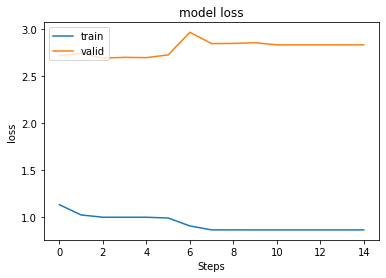

In [34]:

#plot the history for loss and accuracy
#plt.plot(acc)
#plt.plot(val_acc)
#plt.title('model accuracy')
#plt.ylabel('accuracy')
#plt.xlabel('epoch')
#plt.legend(['train', 'valid'], loc='upper left')
#plt.show()
plt.plot(loss)
plt.plot(val_loss)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('Steps')
plt.legend(['train', 'valid'], loc='upper left')
plt.show()

In [ ]:
import matplotlib.pyplot as plt

In [29]:
val_loss


[3.0305721500699674, 2.98531282068503, 3.0158381002865284]

In [30]:
loss

[0.9521825184822083, 0.9521825184822083, 0.9521825184822083]

In [32]:
pso_lstm.global_best_score_array

[2.189480354309082,
 2.1889375953674315,
 2.1639707889556883,
 2.1510713138580324,
 2.141080669403076,
 2.1127979011535643,
 2.1039037322998047,
 2.075654634475708,
 2.019676769256592,
 1.9352271976470947,
 1.725431957244873,
 1.702345796585083,
 1.6906454000473023,
 1.6288777379989623,
 1.6064738788604735,
 1.593796880722046,
 1.5445722637176513,
 1.4428067569732665,
 1.4364631519317628,
 1.4282642526626588,
 1.4078239631652831,
 1.3942593116760253,
 1.3882851524353028,
 1.361176929473877,
 1.3598785209655762,
 1.3500558967590333,
 1.3484821605682373,
 1.3406648197174071,
 1.3281504650115967,
 1.3198201446533202,
 1.315648084640503,
 1.3060887241363526,
 1.303358320236206,
 1.2990800552368165,
 1.2910227813720703,
 1.2861151275634766,
 1.2722492561340333,
 1.2679057369232178,
 1.2655141010284423,
 1.2646289558410644,
 1.2434066925048828,
 1.2352127323150635,
 1.232143564224243,
 1.225771900177002,
 1.2197960929870606,
 1.2184370765686034,
 1.2145474643707275,
 1.211274127960205,
 1.21

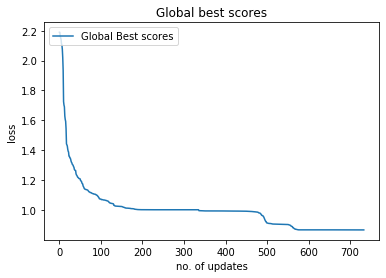

In [35]:
plt.plot(pso_lstm.global_best_score_array)

plt.title('Global best scores')
plt.ylabel('loss')
plt.xlabel('no. of updates')
plt.legend(['Global Best scores'], loc='upper left')
plt.show()

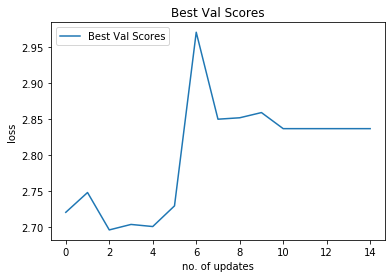

In [36]:
plt.plot(best_val_loss)

plt.title('Best Val Scores')
plt.ylabel('loss')
plt.xlabel('no. of updates')
plt.legend(['Best Val Scores'], loc='upper left')
plt.show()

In [38]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [39]:
target_names = ['class 0', 'class 1', 'class 2','class 3', 'class 4', 'class 5','class 6', 'class 7', 'class 8']

In [48]:
i=1
for train_index, test_index in folds.split(arr_x, arr_y):
    
    X_train, X_test, Y_train, Y_test = arr_x[train_index], arr_x[test_index], arr_y[train_index], arr_y[test_index]
    X_train_reshaped= np.reshape(X_train, (X_train.shape[0],1,X_train.shape[1]))
    X_test_reshaped= np.reshape(X_test, (X_test.shape[0],1,X_test.shape[1]))        
    y_train_categorical = keras.utils.to_categorical(Y_train, 9)
    #y_test_categorical= keras.utils.to_categorical(Y_test, 9)
    best_train_model= pso_lstm.get_best_model()
    
    #result=best_train_model.evaluate(X_test_reshaped, y_test_categorical)
    y_pred=best_train_model.predict(X_train_reshaped)
    y_pred_label=y_pred.argmax(1)
    cm=confusion_matrix(Y_train,y_pred_label)
    print("Confusion matrix of Fold: ", str(i))
    print(cm)
    print()
    print("Classification Report of Fold: ", str(i))
    print(classification_report(Y_train, y_pred_label, target_names=target_names))
    #print(y_pred_label)
    print()
    #print(y_test_categorical)
    
    i=i+1
    

Confusion matrix of Fold:  1
[[ 23  44 358  52  36  32  35  31  27]
 [ 29  46 394  31  42  19  24  34  19]
 [  4  14 578  18  11   8   1   0   4]
 [ 22  40 376  58  55  23  27  20  17]
 [ 10   9 508  45  22  17  14   9   4]
 [ 42   3 473  50  30  14  12  12   2]
 [ 31  36 351  50  46  20  32  51  21]
 [ 15  34 332  65  53  46  32  41  20]
 [ 57  15 220  97  20  48  24  29 128]]

Classification Report of Fold:  1
              precision    recall  f1-score   support

     class 0       0.10      0.04      0.05       638
     class 1       0.19      0.07      0.10       638
     class 2       0.16      0.91      0.27       638
     class 3       0.12      0.09      0.11       638
     class 4       0.07      0.03      0.05       638
     class 5       0.06      0.02      0.03       638
     class 6       0.16      0.05      0.08       638
     class 7       0.18      0.06      0.09       638
     class 8       0.53      0.20      0.29       638

    accuracy                           0.1

In [49]:
i=1
for train_index, test_index in folds.split(arr_x, arr_y):
    
    X_train, X_test, Y_train, Y_test = arr_x[train_index], arr_x[test_index], arr_y[train_index], arr_y[test_index]
    X_train_reshaped= np.reshape(X_train, (X_train.shape[0],1,X_train.shape[1]))
    X_test_reshaped= np.reshape(X_test, (X_test.shape[0],1,X_test.shape[1]))        
    y_train_categorical = keras.utils.to_categorical(Y_train, 9)
    #y_test_categorical= keras.utils.to_categorical(Y_test, 9)
    best_train_model= pso_lstm.get_best_model()
    
    #result=best_train_model.evaluate(X_test_reshaped, y_test_categorical)
    y_pred=best_train_model.predict(X_test_reshaped)
    y_pred_label=y_pred.argmax(1)
    cm=confusion_matrix(Y_test,y_pred_label)
    print("Confusion matrix of Fold: ", str(i))
    print(cm)
    print()
    print("Classification Report of Fold: ", str(i))
    print(classification_report(Y_test, y_pred_label, target_names=target_names))
    #print(y_pred_label)
    print()
    #print(y_test_categorical)
    
    i=i+1
    

Confusion matrix of Fold:  1
[[  8  19 185  21  16  17  17  22  14]
 [ 15  16 213  20  14   9   7  15  10]
 [  3  10 291   6   5   2   0   1   1]
 [ 13  19 201  24  24  11   7   9  11]
 [  4  10 240  28  11   9  11   4   2]
 [ 20   7 217  35  16   5   8  10   1]
 [ 12  29 169  21  22  17  17  20  12]
 [ 14  12 177  23  34  18  18  18   5]
 [ 34   5 111  57   8  28   9   8  59]]

Classification Report of Fold:  1
              precision    recall  f1-score   support

     class 0       0.07      0.03      0.04       319
     class 1       0.13      0.05      0.07       319
     class 2       0.16      0.91      0.27       319
     class 3       0.10      0.08      0.09       319
     class 4       0.07      0.03      0.05       319
     class 5       0.04      0.02      0.02       319
     class 6       0.18      0.05      0.08       319
     class 7       0.17      0.06      0.08       319
     class 8       0.51      0.18      0.27       319

    accuracy                           0.1

In [ ]:
best_model=pso_lstm.get_best_model()

model_weights= best_model.get_weights()
best_model_structure= best_model.to_json()
model_weights= best_model.get_weights()

In [50]:
model_json = best_model.to_json()
with open("best_model_6_6.json", "w") as json_file:
    json_file.write(model_json)
# serialize weights to HDF5
best_model.save_weights("best_model_weights_6_6.h5")
print("Saved model to disk")
 

Saved model to disk


In [51]:
indexes=[i for i in range(1,987)]

In [54]:
y_predict = best_model.predict_proba(test_reshaped)
def savesubmission(pred, indexes, filename = "submission_6_6.csv"):
    submission = pd.DataFrame(pred)
    submission.insert(0, 'ID',indexes)
    submission.columns = ['ID','class1', 'class2', 'class3', 'class4', 'class5', 'class6', 'class7', 'class8', 'class9']
    submission.to_csv(filename,index=False)
    submission.head()

In [55]:
savesubmission(y_predict, indexes, filename = "PSO_Hybrid_6_6.csv")